# 가상환경에서 진행예정.

env_name = detectron2_py3.8 <br/>
---
- version : <br/>
    - torch 1.8 <br/>
    - cuda 10.2 <br/>
    - python 3.8.16 <br/>

## index
0 = person ------------------------<br/>
1 = bicycle ----------------------------<br/>
2 = car ----------------------------<br/>
3 = motorcycle ----------------------<br/>
~~4 = airplane~~<br/>
5 = bus --------------------------------<br/>
~~6 = train ~~<br/>
7 = truck --------------------------------<br/>

# IMAGE

In [12]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import torch
import numpy as np
import os, json, cv2, random
from matplotlib import pyplot as plt
from collections import deque
import multiprocessing as mp
import atexit
import bisect
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.structures import BoxMode
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode, Visualizer
import time

import predictor
from demo import VisualizationDemo

In [13]:
from detectron2.structures import Boxes

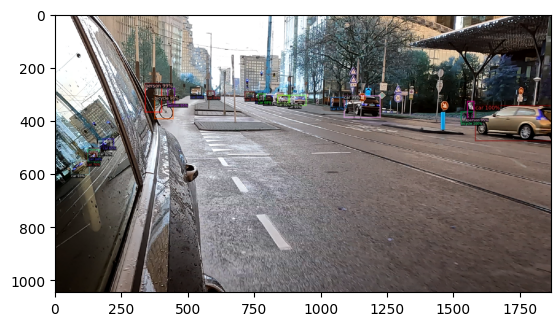

In [14]:
input_image_path = '/home/sldev1/github/data/test1.png'

oim = cv2.imread(input_image_path)
#print('original image')
#cv2_imshow(im)
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
#cfg.MODEL.DEVICE = 'cpu' #changing to cpu
predictor = DefaultPredictor(cfg)

## Function for detecting and segmenting only 1 class i.e cups
def onlykeep_person_class(outputs):
    cls = outputs['instances'].pred_classes
    scores = outputs["instances"].scores
    boxes = outputs['instances'].pred_boxes

  # index to keep whose class == 0
        # index chart
        # 0 = person -------------------------<br/>
        # 1 = bicycle ------------------------<br/>
        # 2 = car ----------------------------<br/>
        # 3 = motorcycle ---------------------<br/>
        # 4 = airplane
        # 5 = bus -----------------------------<br/>
        # 6 = train
        # 7 = truck ---------------------------<br/>
        
    a = (cls == 0).nonzero().flatten().tolist()
    b = (cls == 1).nonzero().flatten().tolist()
    c = (cls == 2).nonzero().flatten().tolist()
    d = (cls == 3).nonzero().flatten().tolist()
    e = (cls == 5).nonzero().flatten().tolist()
    f = (cls == 7).nonzero().flatten().tolist()

    a.extend(b)
    a.extend(c)
    a.extend(d)
    a.extend(e)
    a.extend(f)
    
    a.sort()

    indx_to_keep = a
    
  # only keeping index  corresponding arrays
    cls1 = torch.tensor(np.take(cls.cpu().numpy(), indx_to_keep))
    scores1 = torch.tensor(np.take(scores.cpu().numpy(), indx_to_keep))
    boxes1 = Boxes(torch.tensor(np.take(boxes.tensor.cpu().numpy(), indx_to_keep, axis=0)))
  
  # create new instance obj and set its fields
    obj = detectron2.structures.Instances(image_size=(oim.shape[0], oim.shape[1]))
    obj.set('pred_classes', cls1)
    obj.set('scores', scores1)
    obj.set('pred_boxes',boxes1)
    
    return obj

### predictions and only cup detection display
original_outputs = predictor(oim) #30 seconds(CPU) #1 seconds(GPU)
modified_outputs = onlykeep_person_class(original_outputs)


v = Visualizer(oim[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(modified_outputs.to("cpu"))
cv2.imwrite(input_image_path.replace(".","_only_6classes_detected."),out.get_image()[:, :, ::-1])
plt.imshow(out.get_image()[:, :, ::-1])

In [78]:
  # index to keep whose class == 0
        # index chart
        # 0 = person -------------------------<br/>
        # 1 = bicycle ------------------------<br/>
        # 2 = car ----------------------------<br/>
        # 3 = motorcycle ---------------------<br/>
        # 4 = airplane
        # 5 = bus -----------------------------<br/>
        # 6 = train
        # 7 = truck ---------------------------<br/>

person_count = (original_outputs['instances'].pred_classes).tolist().count(0)
bicycle_count = (original_outputs['instances'].pred_classes).tolist().count(1)
car_count = (original_outputs['instances'].pred_classes).tolist().count(2)
motorcycle_count = (original_outputs['instances'].pred_classes).tolist().count(3)
bus_count = (original_outputs['instances'].pred_classes).tolist().count(5)
truck_count = (original_outputs['instances'].pred_classes).tolist().count(7)

print(f" person : {person_count} \n bicycle : {bicycle_count} \n car : {car_count} \n motorcycle_count : {motorcycle_count} \n bus : {bus_count} \n truck : {truck_count}")

 person : 3 
 bicycle : 2 
 car : 17 
 motorcycle_count : 0 
 bus : 0 
 truck : 0


In [62]:
a = (original_outputs['instances'].pred_classes == 0).nonzero().flatten().tolist().

# b = (original_outputs['instances'].pred_classes == 1).nonzero().flatten().tolist()
# c = (original_outputs['instances'].pred_classes == 2).nonzero().flatten().tolist()
# d = (original_outputs['instances'].pred_classes == 3).nonzero().flatten().tolist()
# e = (original_outputs['instances'].pred_classes == 5).nonzero().flatten().tolist()
# f = (original_outputs['instances'].pred_classes == 7).nonzero().flatten().tolist()

# a.extend(b)
# a.extend(c)
# a.extend(d)
# a.extend(e)
# a.extend(f)

# a.sort()
a

[2, 6, 7]

# 뜯어보는 중

In [17]:
# 0 1 2 3 5 7

# cls == 0
x = original_outputs['instances'].pred_classes
wanted_x = onlykeep_person_class(x)

print(wanted_x, "\n\n")


a = (x == 0).nonzero().flatten().tolist()
b = (x == 1).nonzero().flatten().tolist()
c = (x == 2).nonzero().flatten().tolist()
d = (x == 3).nonzero().flatten().tolist()
e = (x == 5).nonzero().flatten().tolist()
f = (x == 7).nonzero().flatten().tolist()
a.extend(b)
a.extend(c)
a.extend(d)
a.extend(e)
a.extend(f)
a.sort()


print(a,"\n\n", b,"\n\n",c, "\n\n")


(x == 0).nonzero().flatten().tolist()

IndexError: too many indices for tensor of dimension 1

# VIDEO
참고사이트
https://stackoverflow.com/questions/60663073/how-can-i-properly-run-detectron2-on-videos

In [1]:
#!/usr/bin/env python3
# -- coding: utf-8 --

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import torch
import numpy as np
import tqdm
import cv2
import glob
import re
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
from detectron2.structures import Boxes
import time

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-30023wl7 because the default path (/home/sldev1/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
path = "/home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/"

def videoPath(path):
    video_path = glob.glob(path+'*.MP4')

    return video_path

video_list = videoPath(path)

In [3]:
def runOnVideo(video, maxFrames):
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """
    def onlykeep_wanted_class(outputs):
        cls = outputs['instances'].pred_classes
        scores = outputs["instances"].scores
        boxes = outputs['instances'].pred_boxes

      # index to keep whose class == 0
            # index chart
            # 0 = person -------------------------<br/>
            # 1 = bicycle ------------------------<br/>
            # 2 = car ----------------------------<br/>
            # 3 = motorcycle ---------------------<br/>
            # 4 = airplane
            # 5 = bus -----------------------------<br/>
            # 6 = train
            # 7 = truck ---------------------------<br/>

        a = (cls == 0).nonzero().flatten().tolist()
        b = (cls == 1).nonzero().flatten().tolist()
        c = (cls == 2).nonzero().flatten().tolist()
        d = (cls == 3).nonzero().flatten().tolist()
        e = (cls == 5).nonzero().flatten().tolist()
        f = (cls == 7).nonzero().flatten().tolist()

        a.extend(b)
        a.extend(c)
        a.extend(d)
        a.extend(e)
        a.extend(f)

        a.sort()

        indx_to_keep = a

      # only keeping index  corresponding arrays
        cls1 = torch.tensor(np.take(cls.cpu().numpy(), indx_to_keep))
        scores1 = torch.tensor(np.take(scores.cpu().numpy(), indx_to_keep))
        boxes1 = Boxes(torch.tensor(np.take(boxes.tensor.cpu().numpy(), indx_to_keep, axis=0)))

      # create new instance obj and set its fields
        obj = detectron2.structures.Instances(image_size=(frame.shape[0], frame.shape[1]))
        obj.set('pred_classes', cls1)
        obj.set('scores', scores1)
        obj.set('pred_boxes',boxes1)

        return obj

    readFrames = 0

    
    
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame) # original_output
        
        global person_count
        global bicycle_count
        global car_count
        global motorcycle_count
        global bus_count
        global truck_count
        person_count += (outputs['instances'].pred_classes).tolist().count(0)
        bicycle_count += (outputs['instances'].pred_classes).tolist().count(1)
        car_count += (outputs['instances'].pred_classes).tolist().count(2)
        motorcycle_count += (outputs['instances'].pred_classes).tolist().count(3)
        bus_count += (outputs['instances'].pred_classes).tolist().count(5)
        truck_count += (outputs['instances'].pred_classes).tolist().count(7)

        #print(f" person : {person_count} \n bicycle : {bicycle_count} \n car : {car_count} \n motorcycle_count : {motorcycle_count} \n bus : {bus_count} \n truck : {truck_count}")


        
        wanted_outputs = onlykeep_wanted_class(outputs)

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, wanted_outputs.to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

In [ ]:
for i in tqdm.tqdm(video_list):

    # Extract video properties
    print("***************************\n", i, "\n*****************************")
    video = cv2.VideoCapture(i)
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"width : {width}, height : {height}, frames_per_second : {frames_per_second}, num_frames : {num_frames}")

    # Initialize video writer
    video_writer = cv2.VideoWriter(i[:-4]+"_output.mp4", fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

    # Initialize predictor
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75  # set threshold for this model
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
    predictor = DefaultPredictor(cfg)

    # Initialize visualizer
    v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

    person_count = 0
    bicycle_count = 0
    car_count = 0
    motorcycle_count = 0
    bus_count = 0
    truck_count = 0




    # Create a cut-off for debugging
#     num_frames = 60

    # Enumerate the frames of the video
    for visualization in tqdm.tqdm(runOnVideo(video, num_frames)):

        # Write test image
        cv2.imwrite(i[:-4]+'_output.png', visualization)

        # Write to video file
        video_writer.write(visualization)

    # print total count of classes
    print(f" {i}의 제원***********\n person : {person_count} \n bicycle : {bicycle_count} \n car : {car_count} \n motorcycle : {motorcycle_count} \n bus : {bus_count} \n truck : {truck_count}")
    
    details1 = [(f" {i}의 제원***********\n person : {person_count} \n bicycle : {bicycle_count} \n car : {car_count} \n motorcycle : {motorcycle_count} \n bus : {bus_count} \n truck : {truck_count}")]
    details2 = [(f"width : {width}, height : {height}, frames_per_second : {frames_per_second}, num_frames : {num_frames}")]
    
    with open('readme.txt', 'w') as f:
        f.write('\n'.join(details1))
        f.write('\n'.join(details2))
    
    # Release resources
    video.release()
    video_writer.release()
    cv2.destroyAllWindows()

  0%|                                                                                               | 0/23 [00:00<?, ?it/s]

***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_2_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:01,  1.10s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.01it/s]
5it [00:05,  1.00it/s]
6it [00:06,  1.01it/s]
7it [00:07,  1.01it/s]
8it [00:08,  1.01it/s]
9it [00:09,  1.01it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.00it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.00s/it]
14it [00:14,  1.01s/it]
15it [00:14,  1.00it/s]
16it [00:16,  1.00s/it]
17it [00:17,  1.01s/it]
18it [00:17,  1.01it/s]
19it [00:19,  1.00s/it]
20it [00:19,  1.01it/s]
21it [00:20,  1.02it/s]
22it [00:21,  1.00it/s]
23it [00:22,  1.01it/s]
24it [00:23,  1.00it/s]
25it [00:24,  1.00s/it]
26it [00:25,  1.00it/s]
27it [00:26,  1.01s/it]
28it [00:27,  1.00it/s]
29it [00:28,  1.02it/s]
30it [00:29,  1.01it/s]
31it [00:30,  1.01it/s]
32it [00:31,  1.03it/s]
33it [00:32,  1.04it/s]
34it [00:33,  1.03it/s]
35it [00:34,  1.05it/s]
36it [00:35,  1.05it/s]
37it [00:36,  1.04it/s]
38it [00:37,  1.05it/s]
39it [00:38,  1.05it/s]
40it [00:39,  1.04it/s]
41it [00:40,  1.05it/s]
42it 

296it [04:44,  1.05it/s]
297it [04:45,  1.05it/s]
298it [04:46,  1.05it/s]
299it [04:46,  1.05it/s]
300it [04:47,  1.06it/s]
301it [04:48,  1.06it/s]
302it [04:49,  1.06it/s]
303it [04:50,  1.06it/s]
304it [04:51,  1.05it/s]
305it [04:52,  1.05it/s]
306it [04:53,  1.05it/s]
307it [04:54,  1.05it/s]
308it [04:55,  1.05it/s]
309it [04:56,  1.05it/s]
310it [04:57,  1.05it/s]
311it [04:58,  1.05it/s]
312it [04:59,  1.05it/s]
313it [05:00,  1.05it/s]
314it [05:01,  1.05it/s]
315it [05:02,  1.05it/s]
316it [05:03,  1.06it/s]
317it [05:04,  1.06it/s]
318it [05:05,  1.06it/s]
319it [05:05,  1.05it/s]
320it [05:06,  1.05it/s]
321it [05:07,  1.04it/s]
322it [05:08,  1.02it/s]
323it [05:09,  1.01it/s]
324it [05:10,  1.02it/s]
325it [05:11,  1.04it/s]
326it [05:12,  1.05it/s]
327it [05:13,  1.05it/s]
328it [05:14,  1.05it/s]
329it [05:15,  1.04it/s]
330it [05:16,  1.02it/s]
331it [05:17,  1.02it/s]
332it [05:18,  1.02it/s]
333it [05:19,  1.01it/s]
334it [05:20,  1.02it/s]
335it [05:21,  1.01it/s]


588it [09:24,  1.04it/s]
589it [09:25,  1.04it/s]
590it [09:26,  1.05it/s]
591it [09:27,  1.05it/s]
592it [09:28,  1.05it/s]
593it [09:28,  1.05it/s]
594it [09:29,  1.04it/s]
595it [09:30,  1.05it/s]
596it [09:31,  1.04it/s]
597it [09:32,  1.04it/s]
598it [09:33,  1.04it/s]
599it [09:34,  1.04it/s]
600it [09:35,  1.02it/s]
601it [09:36,  1.03it/s]
602it [09:37,  1.04it/s]
603it [09:38,  1.04it/s]
604it [09:39,  1.04it/s]
605it [09:40,  1.04it/s]
606it [09:41,  1.05it/s]
607it [09:42,  1.05it/s]
608it [09:43,  1.06it/s]
609it [09:44,  1.06it/s]
610it [09:45,  1.06it/s]
611it [09:46,  1.06it/s]
612it [09:47,  1.07it/s]
613it [09:48,  1.07it/s]
614it [09:48,  1.08it/s]
615it [09:49,  1.08it/s]
616it [09:50,  1.08it/s]
617it [09:51,  1.07it/s]
618it [09:52,  1.07it/s]
619it [09:53,  1.07it/s]
620it [09:54,  1.07it/s]
621it [09:55,  1.07it/s]
622it [09:56,  1.07it/s]
623it [09:57,  1.07it/s]
624it [09:58,  1.06it/s]
625it [09:59,  1.06it/s]
626it [10:00,  1.06it/s]
627it [10:01,  1.06it/s]


880it [14:03,  1.02it/s]
881it [14:04,  1.01it/s]
882it [14:05,  1.03it/s]
883it [14:06,  1.03it/s]
884it [14:07,  1.03it/s]
885it [14:08,  1.04it/s]
886it [14:09,  1.05it/s]
887it [14:10,  1.04it/s]
888it [14:11,  1.05it/s]
889it [14:12,  1.06it/s]
890it [14:13,  1.06it/s]
891it [14:14,  1.06it/s]
892it [14:15,  1.06it/s]
893it [14:16,  1.06it/s]
894it [14:17,  1.06it/s]
895it [14:17,  1.06it/s]
896it [14:18,  1.06it/s]
897it [14:19,  1.06it/s]
898it [14:20,  1.06it/s]
899it [14:21,  1.05it/s]
900it [14:22,  1.05it/s]
901it [14:23,  1.06it/s]
902it [14:24,  1.06it/s]
903it [14:25,  1.06it/s]
904it [14:26,  1.06it/s]
905it [14:27,  1.06it/s]
906it [14:28,  1.06it/s]
907it [14:29,  1.06it/s]
908it [14:30,  1.06it/s]
909it [14:31,  1.05it/s]
910it [14:32,  1.05it/s]
911it [14:33,  1.04it/s]
912it [14:34,  1.04it/s]
913it [14:35,  1.05it/s]
914it [14:36,  1.05it/s]
915it [14:36,  1.05it/s]
916it [14:37,  1.05it/s]
917it [14:38,  1.05it/s]
918it [14:39,  1.05it/s]
919it [14:40,  1.05it/s]


1166it [18:34,  1.07it/s]
1167it [18:35,  1.07it/s]
1168it [18:36,  1.07it/s]
1169it [18:37,  1.05it/s]
1170it [18:38,  1.06it/s]
1171it [18:39,  1.08it/s]
1172it [18:40,  1.09it/s]
1173it [18:41,  1.08it/s]
1174it [18:42,  1.09it/s]
1175it [18:43,  1.08it/s]
1176it [18:44,  1.09it/s]
1177it [18:45,  1.08it/s]
1178it [18:45,  1.07it/s]
1179it [18:46,  1.08it/s]
1180it [18:47,  1.07it/s]
1181it [18:48,  1.07it/s]
1182it [18:49,  1.08it/s]
1183it [18:50,  1.07it/s]
1184it [18:51,  1.06it/s]
1185it [18:52,  1.07it/s]
1186it [18:53,  1.06it/s]
1187it [18:54,  1.06it/s]
1188it [18:55,  1.07it/s]
1189it [18:56,  1.08it/s]
1190it [18:57,  1.07it/s]
1191it [18:58,  1.08it/s]
1192it [18:59,  1.07it/s]
1193it [18:59,  1.07it/s]
1194it [19:00,  1.09it/s]
1195it [19:01,  1.08it/s]
1196it [19:02,  1.07it/s]
1197it [19:03,  1.08it/s]
1198it [19:04,  1.08it/s]
1199it [19:05,  1.07it/s]
1200it [19:06,  1.07it/s]
1201it [19:07,  1.08it/s]
1202it [19:08,  1.08it/s]
1203it [19:09,  1.08it/s]
1204it [19:1

1448it [22:58,  1.05it/s]
1449it [22:58,  1.05it/s]
1450it [22:59,  1.05it/s]
1451it [23:00,  1.05it/s]
1452it [23:01,  1.05it/s]
1453it [23:02,  1.06it/s]
1454it [23:03,  1.06it/s]
1455it [23:04,  1.05it/s]
1456it [23:05,  1.06it/s]
1457it [23:06,  1.06it/s]
1458it [23:07,  1.05it/s]
1459it [23:08,  1.06it/s]
1460it [23:09,  1.05it/s]
1461it [23:10,  1.05it/s]
1462it [23:11,  1.05it/s]
1463it [23:12,  1.06it/s]
1464it [23:13,  1.06it/s]
1465it [23:14,  1.05it/s]
1466it [23:15,  1.06it/s]
1467it [23:16,  1.05it/s]
1468it [23:17,  1.04it/s]
1469it [23:17,  1.05it/s]
1470it [23:18,  1.05it/s]
1471it [23:19,  1.05it/s]
1472it [23:20,  1.05it/s]
1473it [23:21,  1.05it/s]
1474it [23:22,  1.04it/s]
1475it [23:23,  1.05it/s]
1476it [23:24,  1.04it/s]
1477it [23:25,  1.04it/s]
1478it [23:26,  1.05it/s]
1479it [23:27,  1.04it/s]
1480it [23:28,  1.04it/s]
1481it [23:29,  1.04it/s]
1482it [23:30,  1.03it/s]
1483it [23:31,  1.03it/s]
1484it [23:32,  1.03it/s]
1485it [23:33,  1.04it/s]
1486it [23:3

1730it [27:27,  1.06it/s]
1731it [27:28,  1.07it/s]
1732it [27:29,  1.07it/s]
1733it [27:30,  1.07it/s]
1734it [27:30,  1.08it/s]
1735it [27:31,  1.08it/s]
1736it [27:32,  1.08it/s]
1737it [27:33,  1.08it/s]
1738it [27:34,  1.06it/s]
1739it [27:35,  1.06it/s]
1740it [27:36,  1.06it/s]
1741it [27:37,  1.06it/s]
1742it [27:38,  1.05it/s]
1743it [27:39,  1.05it/s]
1744it [27:40,  1.03it/s]
1745it [27:41,  1.03it/s]
1746it [27:42,  1.03it/s]
1747it [27:43,  1.02it/s]
1748it [27:44,  1.02it/s]
1749it [27:45,  1.02it/s]
1750it [27:46,  1.02it/s]
1751it [27:47,  1.01it/s]
1752it [27:48,  1.01it/s]
1753it [27:49,  1.01it/s]
1754it [27:50,  1.01it/s]
1755it [27:51,  1.01it/s]
1756it [27:52,  1.00it/s]
1757it [27:53,  1.01s/it]
1758it [27:54,  1.01it/s]
1759it [27:55,  1.02it/s]
1760it [27:56,  1.03it/s]
1761it [27:57,  1.03it/s]
1762it [27:58,  1.03it/s]
1763it [27:59,  1.03it/s]
1764it [28:00,  1.03it/s]
1765it [28:01,  1.04it/s]
1766it [28:02,  1.03it/s]
1767it [28:03,  1.03it/s]
1768it [28:0

2012it [31:56,  1.06it/s]
2013it [31:57,  1.05it/s]
2014it [31:58,  1.04it/s]
2015it [31:59,  1.04it/s]
2016it [32:00,  1.04it/s]
2017it [32:01,  1.04it/s]
2018it [32:02,  1.04it/s]
2019it [32:03,  1.04it/s]
2020it [32:04,  1.03it/s]
2021it [32:05,  1.03it/s]
2022it [32:06,  1.05it/s]
2023it [32:07,  1.05it/s]
2024it [32:08,  1.05it/s]
2025it [32:09,  1.03it/s]
2026it [32:10,  1.05it/s]
2027it [32:10,  1.06it/s]
2028it [32:11,  1.07it/s]
2029it [32:12,  1.08it/s]
2030it [32:13,  1.08it/s]
2031it [32:14,  1.08it/s]
2032it [32:15,  1.08it/s]
2033it [32:16,  1.08it/s]
2034it [32:17,  1.08it/s]
2035it [32:18,  1.08it/s]
2036it [32:19,  1.08it/s]
2037it [32:20,  1.08it/s]
2038it [32:21,  1.07it/s]
2039it [32:22,  1.06it/s]
2040it [32:23,  1.05it/s]
2041it [32:24,  1.05it/s]
2042it [32:24,  1.06it/s]
2043it [32:25,  1.06it/s]
2044it [32:26,  1.05it/s]
2045it [32:27,  1.06it/s]
2046it [32:28,  1.05it/s]
2047it [32:29,  1.05it/s]
2048it [32:30,  1.04it/s]
2049it [32:31,  1.05it/s]
2050it [32:3

2294it [36:23,  1.04it/s]
2295it [36:24,  1.03it/s]
2296it [36:25,  1.03it/s]
2297it [36:26,  1.04it/s]
2298it [36:26,  1.03it/s]
2299it [36:27,  1.03it/s]
2300it [36:28,  1.04it/s]
2301it [36:29,  1.03it/s]
2302it [36:30,  1.03it/s]
2303it [36:31,  1.03it/s]
2304it [36:32,  1.03it/s]
2305it [36:33,  1.03it/s]
2306it [36:34,  1.04it/s]
2307it [36:35,  1.03it/s]
2308it [36:36,  1.03it/s]
2309it [36:37,  1.03it/s]
2310it [36:38,  1.04it/s]
2311it [36:39,  1.04it/s]
2312it [36:40,  1.04it/s]
2313it [36:41,  1.05it/s]
2314it [36:42,  1.04it/s]
2315it [36:43,  1.04it/s]
2316it [36:44,  1.05it/s]
2317it [36:45,  1.04it/s]
2318it [36:46,  1.03it/s]
2319it [36:47,  1.03it/s]
2320it [36:48,  1.04it/s]
2321it [36:49,  1.04it/s]
2322it [36:50,  1.04it/s]
2323it [36:51,  1.04it/s]
2324it [36:52,  1.04it/s]
2325it [36:53,  1.04it/s]
2326it [36:53,  1.04it/s]
2327it [36:54,  1.03it/s]
2328it [36:55,  1.03it/s]
2329it [36:56,  1.04it/s]
2330it [36:57,  1.04it/s]
2331it [36:58,  1.04it/s]
2332it [36:5

2576it [40:50,  1.03it/s]
2577it [40:51,  1.05it/s]
2578it [40:52,  1.04it/s]
2579it [40:53,  1.04it/s]
2580it [40:54,  1.05it/s]
2581it [40:55,  1.05it/s]
2582it [40:56,  1.04it/s]
2583it [40:57,  1.05it/s]
2584it [40:58,  1.05it/s]
2585it [40:59,  1.04it/s]
2586it [40:59,  1.04it/s]
2587it [41:00,  1.04it/s]
2588it [41:01,  1.05it/s]
2589it [41:02,  1.04it/s]
2590it [41:03,  1.03it/s]
2591it [41:04,  1.04it/s]
2592it [41:05,  1.05it/s]
2593it [41:06,  1.06it/s]
2594it [41:07,  1.07it/s]
2595it [41:08,  1.07it/s]
2596it [41:09,  1.07it/s]
2597it [41:10,  1.07it/s]
2598it [41:11,  1.07it/s]
2599it [41:12,  1.07it/s]
2600it [41:13,  1.07it/s]
2601it [41:14,  1.06it/s]
2602it [41:15,  1.07it/s]
2603it [41:16,  1.07it/s]
2604it [41:16,  1.05it/s]
2605it [41:17,  1.06it/s]
2606it [41:18,  1.05it/s]
2607it [41:19,  1.05it/s]
2608it [41:20,  1.05it/s]
2609it [41:21,  1.05it/s]
2610it [41:22,  1.05it/s]
2611it [41:23,  1.04it/s]
2612it [41:24,  1.04it/s]
2613it [41:25,  1.04it/s]
2614it [41:2

2858it [45:18,  1.06it/s]
2859it [45:19,  1.06it/s]
2860it [45:19,  1.07it/s]
2861it [45:20,  1.07it/s]
2862it [45:21,  1.07it/s]
2863it [45:22,  1.08it/s]
2864it [45:23,  1.08it/s]
2865it [45:24,  1.08it/s]
2866it [45:25,  1.08it/s]
2867it [45:26,  1.08it/s]
2868it [45:27,  1.08it/s]
2869it [45:28,  1.08it/s]
2870it [45:29,  1.09it/s]
2871it [45:30,  1.08it/s]
2872it [45:31,  1.06it/s]
2873it [45:32,  1.07it/s]
2874it [45:32,  1.07it/s]
2875it [45:33,  1.07it/s]
2876it [45:34,  1.07it/s]
2877it [45:35,  1.08it/s]
2878it [45:36,  1.06it/s]
2879it [45:37,  1.06it/s]
2880it [45:38,  1.06it/s]
2881it [45:39,  1.07it/s]
2882it [45:40,  1.06it/s]
2883it [45:41,  1.07it/s]
2884it [45:42,  1.07it/s]
2885it [45:43,  1.06it/s]
2886it [45:44,  1.05it/s]
2887it [45:45,  1.06it/s]
2888it [45:46,  1.06it/s]
2889it [45:47,  1.06it/s]
2890it [45:48,  1.06it/s]
2891it [45:48,  1.06it/s]
2892it [45:49,  1.05it/s]
2893it [45:50,  1.06it/s]
2894it [45:51,  1.05it/s]
2895it [45:52,  1.05it/s]
2896it [45:5

3140it [49:45,  1.07it/s]
3141it [49:46,  1.08it/s]
3142it [49:47,  1.08it/s]
3143it [49:48,  1.08it/s]
3144it [49:48,  1.08it/s]
3145it [49:49,  1.08it/s]
3146it [49:50,  1.08it/s]
3147it [49:51,  1.08it/s]
3148it [49:52,  1.08it/s]
3149it [49:53,  1.08it/s]
3150it [49:54,  1.08it/s]
3151it [49:55,  1.08it/s]
3152it [49:56,  1.09it/s]
3153it [49:57,  1.09it/s]
3154it [49:58,  1.08it/s]
3155it [49:59,  1.08it/s]
3156it [50:00,  1.09it/s]
3157it [50:00,  1.08it/s]
3158it [50:01,  1.07it/s]
3159it [50:02,  1.07it/s]
3160it [50:03,  1.07it/s]
3161it [50:04,  1.07it/s]
3162it [50:05,  1.07it/s]
3163it [50:06,  1.06it/s]
3164it [50:07,  1.05it/s]
3165it [50:08,  1.06it/s]
3166it [50:09,  1.07it/s]
3167it [50:10,  1.06it/s]
3168it [50:11,  1.05it/s]
3169it [50:12,  1.06it/s]
3170it [50:13,  1.06it/s]
3171it [50:14,  1.05it/s]
3172it [50:15,  1.06it/s]
3173it [50:16,  1.06it/s]
3174it [50:17,  1.06it/s]
3175it [50:17,  1.05it/s]
3176it [50:18,  1.06it/s]
3177it [50:19,  1.06it/s]
3178it [50:2

3422it [54:12,  1.02it/s]
3423it [54:13,  1.01it/s]
3424it [54:14,  1.00it/s]
3425it [54:15,  1.00it/s]
3426it [54:16,  1.00it/s]
3427it [54:17,  1.00s/it]
3428it [54:18,  1.00s/it]
3429it [54:19,  1.01s/it]
3430it [54:20,  1.01s/it]
3431it [54:21,  1.01s/it]
3432it [54:22,  1.02s/it]
3433it [54:23,  1.00s/it]
3434it [54:24,  1.01it/s]
3435it [54:25,  1.01it/s]
3436it [54:26,  1.02it/s]
3437it [54:27,  1.02it/s]
3438it [54:28,  1.02it/s]
3439it [54:29,  1.03it/s]
3440it [54:30,  1.03it/s]
3441it [54:31,  1.03it/s]
3442it [54:32,  1.02it/s]
3443it [54:33,  1.03it/s]
3444it [54:34,  1.02it/s]
3445it [54:35,  1.02it/s]
3446it [54:36,  1.03it/s]
3447it [54:37,  1.02it/s]
3448it [54:38,  1.02it/s]
3449it [54:39,  1.02it/s]
3450it [54:40,  1.02it/s]
3451it [54:41,  1.02it/s]
3452it [54:42,  1.00it/s]
3453it [54:43,  1.00s/it]
3454it [54:44,  1.01s/it]
3455it [54:45,  1.03s/it]
3456it [54:46,  1.02s/it]
3457it [54:47,  1.01s/it]
3458it [54:48,  1.00s/it]
3459it [54:49,  1.00it/s]
3460it [54:5

3704it [58:44,  1.06it/s]
3705it [58:45,  1.07it/s]
3706it [58:46,  1.07it/s]
3707it [58:47,  1.06it/s]
3708it [58:48,  1.07it/s]
3709it [58:49,  1.07it/s]
3710it [58:49,  1.07it/s]
3711it [58:50,  1.07it/s]
3712it [58:51,  1.06it/s]
3713it [58:52,  1.06it/s]
3714it [58:53,  1.06it/s]
3715it [58:54,  1.05it/s]
3716it [58:55,  1.05it/s]
3717it [58:56,  1.05it/s]
3718it [58:57,  1.04it/s]
3719it [58:58,  1.04it/s]
3720it [58:59,  1.04it/s]
3721it [59:00,  1.05it/s]
3722it [59:01,  1.05it/s]
3723it [59:02,  1.04it/s]
3724it [59:03,  1.05it/s]
3725it [59:04,  1.04it/s]
3726it [59:05,  1.03it/s]
3727it [59:06,  1.02it/s]
3728it [59:07,  1.03it/s]
3729it [59:08,  1.05it/s]
3730it [59:09,  1.05it/s]
3731it [59:10,  1.06it/s]
3732it [59:10,  1.07it/s]
3733it [59:11,  1.07it/s]
3734it [59:12,  1.07it/s]
3735it [59:13,  1.06it/s]
3736it [59:14,  1.06it/s]
3737it [59:15,  1.06it/s]
3738it [59:16,  1.05it/s]
3739it [59:17,  1.05it/s]
3740it [59:18,  1.06it/s]
3741it [59:19,  1.06it/s]
3742it [59:2

3973it [1:03:00,  1.01it/s]
3974it [1:03:01,  1.01it/s]
3975it [1:03:02,  1.01it/s]
3976it [1:03:03,  1.00it/s]
3977it [1:03:04,  1.00s/it]
3978it [1:03:05,  1.00s/it]
3979it [1:03:06,  1.00s/it]
3980it [1:03:07,  1.01s/it]
3981it [1:03:08,  1.00s/it]
3982it [1:03:09,  1.01s/it]
3983it [1:03:10,  1.01s/it]
3984it [1:03:11,  1.01s/it]
3985it [1:03:13,  1.01s/it]
3986it [1:03:13,  1.01it/s]
3987it [1:03:14,  1.02it/s]
3988it [1:03:15,  1.02it/s]
3989it [1:03:16,  1.03it/s]
3990it [1:03:17,  1.03it/s]
3991it [1:03:18,  1.03it/s]
3992it [1:03:19,  1.04it/s]
3993it [1:03:20,  1.04it/s]
3994it [1:03:21,  1.04it/s]
3995it [1:03:22,  1.04it/s]
3996it [1:03:23,  1.04it/s]
3997it [1:03:24,  1.04it/s]
3998it [1:03:25,  1.04it/s]
3999it [1:03:26,  1.04it/s]
4000it [1:03:27,  1.04it/s]
4001it [1:03:28,  1.04it/s]
4002it [1:03:29,  1.04it/s]
4003it [1:03:30,  1.04it/s]
4004it [1:03:31,  1.04it/s]
4005it [1:03:32,  1.04it/s]
4006it [1:03:33,  1.04it/s]
4007it [1:03:34,  1.04it/s]
4008it [1:03:35,  1.

4237it [1:07:16,  1.05it/s]
4238it [1:07:17,  1.05it/s]
4239it [1:07:18,  1.03it/s]
4240it [1:07:19,  1.04it/s]
4241it [1:07:20,  1.04it/s]
4242it [1:07:20,  1.04it/s]
4243it [1:07:21,  1.05it/s]
4244it [1:07:22,  1.04it/s]
4245it [1:07:23,  1.04it/s]
4246it [1:07:24,  1.04it/s]
4247it [1:07:25,  1.05it/s]
4248it [1:07:26,  1.04it/s]
4249it [1:07:27,  1.04it/s]
4250it [1:07:28,  1.03it/s]
4251it [1:07:29,  1.02it/s]
4252it [1:07:30,  1.01it/s]
4253it [1:07:31,  1.01it/s]
4254it [1:07:32,  1.01it/s]
4255it [1:07:33,  1.01it/s]
4256it [1:07:34,  1.01it/s]
4257it [1:07:35,  1.01it/s]
4258it [1:07:36,  1.02it/s]
4259it [1:07:37,  1.02it/s]
4260it [1:07:38,  1.01it/s]
4261it [1:07:39,  1.01it/s]
4262it [1:07:40,  1.02it/s]
4263it [1:07:41,  1.02it/s]
4264it [1:07:42,  1.01it/s]
4265it [1:07:43,  1.02it/s]
4266it [1:07:44,  1.02it/s]
4267it [1:07:45,  1.02it/s]
4268it [1:07:46,  1.02it/s]
4269it [1:07:47,  1.01it/s]
4270it [1:07:48,  1.01it/s]
4271it [1:07:49,  1.03it/s]
4272it [1:07:50,  1.

4501it [1:11:28,  1.07it/s]
4502it [1:11:29,  1.07it/s]
4503it [1:11:30,  1.06it/s]
4504it [1:11:31,  1.06it/s]
4505it [1:11:32,  1.06it/s]
4506it [1:11:33,  1.06it/s]
4507it [1:11:34,  1.06it/s]
4508it [1:11:35,  1.06it/s]
4509it [1:11:36,  1.06it/s]
4510it [1:11:37,  1.06it/s]
4511it [1:11:38,  1.06it/s]
4512it [1:11:39,  1.06it/s]
4513it [1:11:40,  1.06it/s]
4514it [1:11:41,  1.06it/s]
4515it [1:11:42,  1.06it/s]
4516it [1:11:43,  1.05it/s]
4517it [1:11:44,  1.04it/s]
4518it [1:11:44,  1.04it/s]
4519it [1:11:45,  1.04it/s]
4520it [1:11:46,  1.02it/s]
4521it [1:11:47,  1.03it/s]
4522it [1:11:48,  1.04it/s]
4523it [1:11:49,  1.05it/s]
4524it [1:11:50,  1.06it/s]
4525it [1:11:51,  1.06it/s]
4526it [1:11:52,  1.06it/s]
4527it [1:11:53,  1.07it/s]
4528it [1:11:54,  1.07it/s]
4529it [1:11:55,  1.07it/s]
4530it [1:11:56,  1.07it/s]
4531it [1:11:57,  1.07it/s]
4532it [1:11:58,  1.07it/s]
4533it [1:11:59,  1.08it/s]
4534it [1:11:59,  1.08it/s]
4535it [1:12:00,  1.08it/s]
4536it [1:12:01,  1.

4765it [1:15:45,  1.02it/s]
4766it [1:15:46,  1.01it/s]
4767it [1:15:47,  1.02it/s]
4768it [1:15:48,  1.02it/s]
4769it [1:15:49,  1.03it/s]
4770it [1:15:50,  1.03it/s]
4771it [1:15:51,  1.03it/s]
4772it [1:15:52,  1.03it/s]
4773it [1:15:53,  1.04it/s]
4774it [1:15:54,  1.04it/s]
4775it [1:15:55,  1.04it/s]
4776it [1:15:56,  1.04it/s]
4777it [1:15:57,  1.04it/s]
4778it [1:15:58,  1.04it/s]
4779it [1:15:59,  1.04it/s]
4780it [1:16:00,  1.04it/s]
4781it [1:16:01,  1.03it/s]
4782it [1:16:02,  1.03it/s]
4783it [1:16:03,  1.02it/s]
4784it [1:16:04,  1.01it/s]
4785it [1:16:05,  1.00it/s]
4786it [1:16:06,  1.01s/it]
4787it [1:16:07,  1.01s/it]
4788it [1:16:08,  1.01s/it]
4789it [1:16:09,  1.01s/it]
4790it [1:16:10,  1.00it/s]
4791it [1:16:11,  1.01s/it]
4792it [1:16:12,  1.00it/s]
4793it [1:16:13,  1.01s/it]
4794it [1:16:14,  1.01it/s]
4795it [1:16:15,  1.02it/s]
4796it [1:16:16,  1.03it/s]
4797it [1:16:16,  1.04it/s]
4798it [1:16:17,  1.04it/s]
4799it [1:16:18,  1.05it/s]
4800it [1:16:19,  1.

5029it [1:20:01,  1.04it/s]
5030it [1:20:02,  1.04it/s]
5031it [1:20:03,  1.04it/s]
5032it [1:20:04,  1.04it/s]
5033it [1:20:05,  1.04it/s]
5034it [1:20:06,  1.04it/s]
5035it [1:20:07,  1.04it/s]
5036it [1:20:08,  1.04it/s]
5037it [1:20:09,  1.04it/s]
5038it [1:20:10,  1.04it/s]
5039it [1:20:11,  1.04it/s]
5040it [1:20:12,  1.04it/s]
5041it [1:20:13,  1.05it/s]
5042it [1:20:13,  1.05it/s]
5043it [1:20:14,  1.04it/s]
5044it [1:20:15,  1.03it/s]
5045it [1:20:16,  1.02it/s]
5046it [1:20:17,  1.02it/s]
5047it [1:20:18,  1.01it/s]
5048it [1:20:19,  1.02it/s]
5049it [1:20:20,  1.03it/s]
5050it [1:20:21,  1.03it/s]
5051it [1:20:22,  1.04it/s]
5052it [1:20:23,  1.04it/s]
5053it [1:20:24,  1.05it/s]
5054it [1:20:25,  1.04it/s]
5055it [1:20:26,  1.05it/s]
5056it [1:20:27,  1.05it/s]
5057it [1:20:28,  1.05it/s]
5058it [1:20:29,  1.05it/s]
5059it [1:20:30,  1.05it/s]
5060it [1:20:31,  1.05it/s]
5061it [1:20:32,  1.05it/s]
5062it [1:20:33,  1.05it/s]
5063it [1:20:34,  1.05it/s]
5064it [1:20:35,  1.

5293it [1:24:15,  1.00it/s]
5294it [1:24:16,  1.01it/s]
5295it [1:24:17,  1.02it/s]
5296it [1:24:18,  1.03it/s]
5297it [1:24:19,  1.03it/s]
5298it [1:24:20,  1.03it/s]
5299it [1:24:21,  1.03it/s]
5300it [1:24:22,  1.04it/s]
5301it [1:24:23,  1.03it/s]
5302it [1:24:24,  1.03it/s]
5303it [1:24:25,  1.03it/s]
5304it [1:24:26,  1.03it/s]
5305it [1:24:27,  1.03it/s]
5306it [1:24:28,  1.03it/s]
5307it [1:24:29,  1.03it/s]
5308it [1:24:30,  1.03it/s]
5309it [1:24:31,  1.03it/s]
5310it [1:24:32,  1.03it/s]
5311it [1:24:33,  1.03it/s]
5312it [1:24:34,  1.04it/s]
5313it [1:24:35,  1.04it/s]
5314it [1:24:36,  1.04it/s]
5315it [1:24:37,  1.04it/s]
5316it [1:24:38,  1.04it/s]
5317it [1:24:38,  1.05it/s]
5318it [1:24:39,  1.04it/s]
5319it [1:24:40,  1.04it/s]
5320it [1:24:41,  1.02it/s]
5321it [1:24:42,  1.03it/s]
5322it [1:24:43,  1.03it/s]
5323it [1:24:44,  1.03it/s]
5324it [1:24:45,  1.04it/s]
5325it [1:24:46,  1.04it/s]
5326it [1:24:47,  1.03it/s]
5327it [1:24:48,  1.03it/s]
5328it [1:24:49,  1.

5557it [1:28:28,  1.06it/s]
5558it [1:28:29,  1.05it/s]
5559it [1:28:30,  1.05it/s]
5560it [1:28:31,  1.05it/s]
5561it [1:28:32,  1.05it/s]
5562it [1:28:33,  1.05it/s]
5563it [1:28:34,  1.05it/s]
5564it [1:28:35,  1.05it/s]
5565it [1:28:36,  1.04it/s]
5566it [1:28:37,  1.04it/s]
5567it [1:28:38,  1.02it/s]
5568it [1:28:39,  1.04it/s]
5569it [1:28:40,  1.05it/s]
5570it [1:28:40,  1.05it/s]
5571it [1:28:41,  1.06it/s]
5572it [1:28:42,  1.05it/s]
5573it [1:28:43,  1.06it/s]
5574it [1:28:44,  1.05it/s]
5575it [1:28:45,  1.05it/s]
5576it [1:28:46,  1.05it/s]
5577it [1:28:47,  1.05it/s]
5578it [1:28:48,  1.05it/s]
5579it [1:28:49,  1.05it/s]
5580it [1:28:50,  1.05it/s]
5581it [1:28:51,  1.06it/s]
5582it [1:28:52,  1.06it/s]
5583it [1:28:53,  1.06it/s]
5584it [1:28:54,  1.06it/s]
5585it [1:28:55,  1.07it/s]
5586it [1:28:56,  1.06it/s]
5587it [1:28:57,  1.06it/s]
5588it [1:28:58,  1.05it/s]
5589it [1:28:59,  1.04it/s]
5590it [1:29:00,  1.03it/s]
5591it [1:29:01,  1.02it/s]
5592it [1:29:01,  1.

5821it [1:32:35,  1.09it/s]
5822it [1:32:36,  1.09it/s]
5823it [1:32:37,  1.09it/s]
5824it [1:32:38,  1.08it/s]
5825it [1:32:39,  1.08it/s]
5826it [1:32:40,  1.08it/s]
5827it [1:32:41,  1.08it/s]
5828it [1:32:42,  1.06it/s]
5829it [1:32:42,  1.07it/s]
5830it [1:32:43,  1.08it/s]
5831it [1:32:44,  1.08it/s]
5832it [1:32:45,  1.08it/s]
5833it [1:32:46,  1.08it/s]
5834it [1:32:47,  1.08it/s]
5835it [1:32:48,  1.08it/s]
5836it [1:32:49,  1.08it/s]
5837it [1:32:50,  1.08it/s]
5838it [1:32:51,  1.08it/s]
5839it [1:32:52,  1.08it/s]
5840it [1:32:53,  1.08it/s]
5841it [1:32:54,  1.08it/s]
5842it [1:32:54,  1.09it/s]
5843it [1:32:55,  1.08it/s]
5844it [1:32:56,  1.08it/s]
5845it [1:32:57,  1.07it/s]
5846it [1:32:58,  1.06it/s]
5847it [1:32:59,  1.05it/s]
5848it [1:33:00,  1.06it/s]
5849it [1:33:01,  1.05it/s]
5850it [1:33:02,  1.04it/s]
5851it [1:33:03,  1.05it/s]
5852it [1:33:04,  1.04it/s]
5853it [1:33:05,  1.04it/s]
5854it [1:33:06,  1.04it/s]
5855it [1:33:07,  1.04it/s]
5856it [1:33:08,  1.

6085it [1:36:44,  1.04it/s]
6086it [1:36:45,  1.04it/s]
6087it [1:36:46,  1.04it/s]
6088it [1:36:47,  1.04it/s]
6089it [1:36:48,  1.03it/s]
6090it [1:36:49,  1.05it/s]
6091it [1:36:50,  1.05it/s]
6092it [1:36:51,  1.04it/s]
6093it [1:36:52,  1.04it/s]
6094it [1:36:53,  1.04it/s]
6095it [1:36:54,  1.03it/s]
6096it [1:36:55,  1.05it/s]
6097it [1:36:56,  1.05it/s]
6098it [1:36:57,  1.06it/s]
6099it [1:36:58,  1.06it/s]
6100it [1:36:59,  1.06it/s]
6101it [1:37:00,  1.06it/s]
6102it [1:37:01,  1.07it/s]
6103it [1:37:02,  1.07it/s]
6104it [1:37:02,  1.07it/s]
6105it [1:37:03,  1.07it/s]
6106it [1:37:04,  1.07it/s]
6107it [1:37:05,  1.06it/s]
6108it [1:37:06,  1.06it/s]
6109it [1:37:07,  1.07it/s]
6110it [1:37:08,  1.07it/s]
6111it [1:37:09,  1.07it/s]
6112it [1:37:10,  1.06it/s]
6113it [1:37:11,  1.05it/s]
6114it [1:37:12,  1.06it/s]
6115it [1:37:13,  1.05it/s]
6116it [1:37:14,  1.05it/s]
6117it [1:37:15,  1.06it/s]
6118it [1:37:16,  1.05it/s]
6119it [1:37:17,  1.04it/s]
6120it [1:37:18,  1.

6349it [1:40:52,  1.08it/s]
6350it [1:40:53,  1.08it/s]
6351it [1:40:54,  1.08it/s]
6352it [1:40:55,  1.09it/s]
6353it [1:40:56,  1.09it/s]
6354it [1:40:57,  1.09it/s]
6355it [1:40:58,  1.09it/s]
6356it [1:40:59,  1.09it/s]
6357it [1:41:00,  1.09it/s]
6358it [1:41:01,  1.09it/s]
6359it [1:41:02,  1.09it/s]
6360it [1:41:02,  1.09it/s]
6361it [1:41:03,  1.08it/s]
6362it [1:41:04,  1.07it/s]
6363it [1:41:05,  1.06it/s]
6364it [1:41:06,  1.07it/s]
6365it [1:41:07,  1.06it/s]
6366it [1:41:08,  1.05it/s]
6367it [1:41:09,  1.04it/s]
6368it [1:41:10,  1.05it/s]
6369it [1:41:11,  1.05it/s]
6370it [1:41:12,  1.04it/s]
6371it [1:41:13,  1.04it/s]
6372it [1:41:14,  1.04it/s]
6373it [1:41:15,  1.05it/s]
6374it [1:41:16,  1.05it/s]
6375it [1:41:17,  1.04it/s]
6376it [1:41:18,  1.04it/s]
6377it [1:41:19,  1.03it/s]
6378it [1:41:20,  1.05it/s]
6379it [1:41:21,  1.06it/s]
6380it [1:41:22,  1.06it/s]
6381it [1:41:22,  1.07it/s]
6382it [1:41:23,  1.07it/s]
6383it [1:41:24,  1.07it/s]
6384it [1:41:25,  1.

6613it [1:45:02,  1.06it/s]
6614it [1:45:03,  1.06it/s]
6615it [1:45:04,  1.06it/s]
6616it [1:45:05,  1.06it/s]
6617it [1:45:06,  1.06it/s]
6618it [1:45:07,  1.06it/s]
6619it [1:45:08,  1.07it/s]
6620it [1:45:09,  1.06it/s]
6621it [1:45:10,  1.06it/s]
6622it [1:45:11,  1.06it/s]
6623it [1:45:12,  1.05it/s]
6624it [1:45:13,  1.05it/s]
6625it [1:45:14,  1.04it/s]
6626it [1:45:15,  1.04it/s]
6627it [1:45:16,  1.04it/s]
6628it [1:45:17,  1.03it/s]
6629it [1:45:17,  1.03it/s]
6630it [1:45:18,  1.03it/s]
6631it [1:45:19,  1.03it/s]
6632it [1:45:20,  1.03it/s]
6633it [1:45:21,  1.04it/s]
6634it [1:45:22,  1.05it/s]
6635it [1:45:23,  1.06it/s]
6636it [1:45:24,  1.06it/s]
6637it [1:45:25,  1.07it/s]
6638it [1:45:26,  1.07it/s]
6639it [1:45:27,  1.07it/s]
6640it [1:45:28,  1.07it/s]
6641it [1:45:29,  1.07it/s]
6642it [1:45:30,  1.08it/s]
6643it [1:45:31,  1.08it/s]
6644it [1:45:32,  1.08it/s]
6645it [1:45:32,  1.08it/s]
6646it [1:45:33,  1.08it/s]
6647it [1:45:34,  1.08it/s]
6648it [1:45:35,  1.

6877it [1:49:12,  1.07it/s]
6878it [1:49:13,  1.07it/s]
6879it [1:49:14,  1.07it/s]
6880it [1:49:15,  1.07it/s]
6881it [1:49:16,  1.06it/s]
6882it [1:49:17,  1.06it/s]
6883it [1:49:18,  1.07it/s]
6884it [1:49:19,  1.07it/s]
6885it [1:49:20,  1.07it/s]
6886it [1:49:21,  1.07it/s]
6887it [1:49:22,  1.07it/s]
6888it [1:49:23,  1.07it/s]
6889it [1:49:24,  1.06it/s]
6890it [1:49:25,  1.05it/s]
6891it [1:49:26,  1.05it/s]
6892it [1:49:27,  1.04it/s]
6893it [1:49:28,  1.03it/s]
6894it [1:49:28,  1.03it/s]
6895it [1:49:29,  1.04it/s]
6896it [1:49:30,  1.05it/s]
6897it [1:49:31,  1.05it/s]
6898it [1:49:32,  1.05it/s]
6899it [1:49:33,  1.05it/s]
6900it [1:49:34,  1.05it/s]
6901it [1:49:35,  1.05it/s]
6902it [1:49:36,  1.06it/s]
6903it [1:49:37,  1.06it/s]
6904it [1:49:38,  1.07it/s]
6905it [1:49:39,  1.06it/s]
6906it [1:49:40,  1.06it/s]
6907it [1:49:41,  1.07it/s]
6908it [1:49:42,  1.06it/s]
6909it [1:49:43,  1.05it/s]
6910it [1:49:44,  1.05it/s]
6911it [1:49:45,  1.03it/s]
6912it [1:49:46,  1.

7141it [1:53:21,  1.08it/s]
7142it [1:53:22,  1.08it/s]
7143it [1:53:23,  1.08it/s]
7144it [1:53:24,  1.08it/s]
7145it [1:53:25,  1.08it/s]
7146it [1:53:26,  1.08it/s]
7147it [1:53:27,  1.07it/s]
7148it [1:53:28,  1.07it/s]
7149it [1:53:29,  1.06it/s]
7150it [1:53:30,  1.06it/s]
7151it [1:53:31,  1.05it/s]
7152it [1:53:32,  1.03it/s]
7153it [1:53:33,  1.03it/s]
7154it [1:53:34,  1.02it/s]
7155it [1:53:35,  1.03it/s]
7156it [1:53:36,  1.04it/s]
7157it [1:53:37,  1.05it/s]
7158it [1:53:38,  1.05it/s]
7159it [1:53:39,  1.05it/s]
7160it [1:53:39,  1.05it/s]
7161it [1:53:40,  1.06it/s]
7162it [1:53:41,  1.06it/s]
7163it [1:53:42,  1.05it/s]
7164it [1:53:43,  1.05it/s]
7165it [1:53:44,  1.06it/s]
7166it [1:53:45,  1.06it/s]
7167it [1:53:46,  1.06it/s]
7168it [1:53:47,  1.06it/s]
7169it [1:53:48,  1.06it/s]
7170it [1:53:49,  1.05it/s]
7171it [1:53:50,  1.05it/s]
7172it [1:53:51,  1.05it/s]
7173it [1:53:52,  1.05it/s]
7174it [1:53:53,  1.04it/s]
7175it [1:53:54,  1.03it/s]
7176it [1:53:55,  1.

7405it [1:57:37,  1.08it/s]
7406it [1:57:38,  1.08it/s]
7407it [1:57:39,  1.06it/s]
7408it [1:57:39,  1.05it/s]
7409it [1:57:40,  1.05it/s]
7410it [1:57:41,  1.04it/s]
7411it [1:57:42,  1.05it/s]
7412it [1:57:43,  1.05it/s]
7413it [1:57:44,  1.04it/s]
7414it [1:57:45,  1.05it/s]
7415it [1:57:46,  1.06it/s]
7416it [1:57:47,  1.07it/s]
7417it [1:57:48,  1.07it/s]
7418it [1:57:49,  1.08it/s]
7419it [1:57:50,  1.07it/s]
7420it [1:57:51,  1.08it/s]
7421it [1:57:52,  1.08it/s]
7422it [1:57:53,  1.07it/s]
7423it [1:57:54,  1.06it/s]
7424it [1:57:55,  1.06it/s]
7425it [1:57:55,  1.07it/s]
7426it [1:57:56,  1.07it/s]
7427it [1:57:57,  1.07it/s]
7428it [1:57:58,  1.07it/s]
7429it [1:57:59,  1.06it/s]
7430it [1:58:00,  1.05it/s]
7431it [1:58:01,  1.04it/s]
7432it [1:58:02,  1.03it/s]
7433it [1:58:03,  1.03it/s]
7434it [1:58:04,  1.03it/s]
7435it [1:58:05,  1.02it/s]
7436it [1:58:06,  1.02it/s]
7437it [1:58:07,  1.02it/s]
7438it [1:58:08,  1.03it/s]
7439it [1:58:09,  1.02it/s]
7440it [1:58:10,  1.

7669it [2:01:43,  1.09it/s]
7670it [2:01:43,  1.09it/s]
7671it [2:01:44,  1.08it/s]
7672it [2:01:45,  1.07it/s]
7673it [2:01:46,  1.07it/s]
7674it [2:01:47,  1.07it/s]
7675it [2:01:48,  1.06it/s]
7676it [2:01:49,  1.05it/s]
7677it [2:01:50,  1.06it/s]
7678it [2:01:51,  1.05it/s]
7679it [2:01:52,  1.05it/s]
7680it [2:01:53,  1.06it/s]
7681it [2:01:54,  1.06it/s]
7682it [2:01:55,  1.07it/s]
7683it [2:01:56,  1.06it/s]
7684it [2:01:57,  1.06it/s]
7685it [2:01:58,  1.07it/s]
7686it [2:01:59,  1.06it/s]
7687it [2:02:00,  1.06it/s]
7688it [2:02:00,  1.05it/s]
7689it [2:02:01,  1.05it/s]
7690it [2:02:02,  1.06it/s]
7691it [2:02:03,  1.05it/s]
7692it [2:02:04,  1.04it/s]
7693it [2:02:05,  1.06it/s]
7694it [2:02:06,  1.07it/s]
7695it [2:02:07,  1.08it/s]
7696it [2:02:08,  1.08it/s]
7697it [2:02:09,  1.08it/s]
7698it [2:02:10,  1.09it/s]
7699it [2:02:11,  1.09it/s]
7700it [2:02:12,  1.09it/s]
7701it [2:02:13,  1.09it/s]
7702it [2:02:13,  1.10it/s]
7703it [2:02:14,  1.10it/s]
7704it [2:02:15,  1.

7933it [2:05:53,  1.02it/s]
7934it [2:05:54,  1.02it/s]
7935it [2:05:55,  1.02it/s]
7936it [2:05:56,  1.02it/s]
7937it [2:05:57,  1.01it/s]
7938it [2:05:58,  1.01it/s]
7939it [2:05:59,  1.02it/s]
7940it [2:06:00,  1.03it/s]
7941it [2:06:01,  1.04it/s]
7942it [2:06:02,  1.05it/s]
7943it [2:06:03,  1.05it/s]
7944it [2:06:04,  1.05it/s]
7945it [2:06:05,  1.06it/s]
7946it [2:06:06,  1.06it/s]
7947it [2:06:07,  1.05it/s]
7948it [2:06:08,  1.06it/s]
7949it [2:06:09,  1.06it/s]
7950it [2:06:10,  1.06it/s]
7951it [2:06:11,  1.06it/s]
7952it [2:06:12,  1.06it/s]
7953it [2:06:13,  1.06it/s]
7954it [2:06:14,  1.07it/s]
7955it [2:06:14,  1.06it/s]
7956it [2:06:15,  1.05it/s]
7957it [2:06:16,  1.05it/s]
7958it [2:06:17,  1.04it/s]
7959it [2:06:18,  1.04it/s]
7960it [2:06:19,  1.04it/s]
7961it [2:06:20,  1.04it/s]
7962it [2:06:21,  1.04it/s]
7963it [2:06:22,  1.03it/s]
7964it [2:06:23,  1.05it/s]
7965it [2:06:24,  1.04it/s]
7966it [2:06:25,  1.05it/s]
7967it [2:06:26,  1.04it/s]
7968it [2:06:27,  1.

8197it [2:10:06,  1.06it/s]
8198it [2:10:07,  1.06it/s]
8199it [2:10:08,  1.06it/s]
8200it [2:10:09,  1.05it/s]
8201it [2:10:10,  1.05it/s]
8202it [2:10:11,  1.04it/s]
8203it [2:10:12,  1.04it/s]
8204it [2:10:13,  1.05it/s]
8205it [2:10:14,  1.05it/s]
8206it [2:10:15,  1.04it/s]
8207it [2:10:16,  1.04it/s]
8208it [2:10:17,  1.04it/s]
8209it [2:10:18,  1.05it/s]
8210it [2:10:19,  1.03it/s]
8211it [2:10:20,  1.03it/s]
8212it [2:10:21,  1.02it/s]
8213it [2:10:22,  1.01it/s]
8214it [2:10:23,  1.01it/s]
8215it [2:10:24,  1.01it/s]
8216it [2:10:25,  1.02it/s]
8217it [2:10:26,  1.02it/s]
8218it [2:10:27,  1.02it/s]
8219it [2:10:28,  1.01it/s]
8220it [2:10:29,  1.01it/s]
8221it [2:10:30,  1.02it/s]
8222it [2:10:31,  1.02it/s]
8223it [2:10:32,  1.02it/s]
8224it [2:10:33,  1.02it/s]
8225it [2:10:34,  1.02it/s]
8226it [2:10:35,  1.01it/s]
8227it [2:10:36,  1.02it/s]
8228it [2:10:37,  1.03it/s]
8229it [2:10:38,  1.04it/s]
8230it [2:10:38,  1.04it/s]
8231it [2:10:39,  1.05it/s]
8232it [2:10:40,  1.

8461it [2:14:14,  1.08it/s]
8462it [2:14:15,  1.09it/s]
8463it [2:14:16,  1.08it/s]
8464it [2:14:17,  1.07it/s]
8465it [2:14:18,  1.07it/s]
8466it [2:14:19,  1.07it/s]
8467it [2:14:20,  1.06it/s]
8468it [2:14:20,  1.07it/s]
8469it [2:14:21,  1.06it/s]
8470it [2:14:22,  1.06it/s]
8471it [2:14:23,  1.05it/s]
8472it [2:14:24,  1.06it/s]
8473it [2:14:25,  1.07it/s]
8474it [2:14:26,  1.06it/s]
8475it [2:14:27,  1.06it/s]
8476it [2:14:28,  1.06it/s]
8477it [2:14:29,  1.06it/s]
8478it [2:14:30,  1.06it/s]
8479it [2:14:31,  1.05it/s]
8480it [2:14:32,  1.07it/s]
8481it [2:14:33,  1.07it/s]
8482it [2:14:34,  1.08it/s]
8483it [2:14:35,  1.09it/s]
8484it [2:14:35,  1.09it/s]
8485it [2:14:36,  1.09it/s]
8486it [2:14:37,  1.10it/s]
8487it [2:14:38,  1.10it/s]
8488it [2:14:39,  1.10it/s]
8489it [2:14:40,  1.10it/s]
8490it [2:14:41,  1.10it/s]
8491it [2:14:42,  1.09it/s]
8492it [2:14:43,  1.09it/s]
8493it [2:14:44,  1.09it/s]
8494it [2:14:45,  1.08it/s]
8495it [2:14:46,  1.08it/s]
8496it [2:14:46,  1.

8725it [2:18:24,  1.03it/s]
8726it [2:18:25,  1.02it/s]
8727it [2:18:26,  1.01it/s]
8728it [2:18:27,  1.01it/s]
8729it [2:18:28,  1.02it/s]
8730it [2:18:29,  1.02it/s]
8731it [2:18:30,  1.01it/s]
8732it [2:18:31,  1.03it/s]
8733it [2:18:32,  1.04it/s]
8734it [2:18:33,  1.04it/s]
8735it [2:18:33,  1.05it/s]
8736it [2:18:34,  1.05it/s]
8737it [2:18:35,  1.05it/s]
8738it [2:18:36,  1.05it/s]
8739it [2:18:37,  1.05it/s]
8740it [2:18:38,  1.06it/s]
8741it [2:18:39,  1.06it/s]
8742it [2:18:40,  1.05it/s]
8743it [2:18:41,  1.06it/s]
8744it [2:18:42,  1.06it/s]
8745it [2:18:43,  1.06it/s]
8746it [2:18:44,  1.06it/s]
8747it [2:18:45,  1.06it/s]
8748it [2:18:46,  1.06it/s]
8749it [2:18:47,  1.06it/s]
8750it [2:18:48,  1.06it/s]
8751it [2:18:49,  1.06it/s]
8752it [2:18:50,  1.06it/s]
8753it [2:18:50,  1.06it/s]
8754it [2:18:51,  1.06it/s]
8755it [2:18:52,  1.06it/s]
8756it [2:18:53,  1.06it/s]
8757it [2:18:54,  1.06it/s]
8758it [2:18:55,  1.06it/s]
8759it [2:18:56,  1.06it/s]
8760it [2:18:57,  1.

8989it [2:22:36,  1.07it/s]
8990it [2:22:36,  1.06it/s]
8991it [2:22:37,  1.06it/s]
8992it [2:22:38,  1.06it/s]
8993it [2:22:39,  1.05it/s]
8994it [2:22:40,  1.04it/s]
8995it [2:22:41,  1.04it/s]
8996it [2:22:42,  1.04it/s]
8997it [2:22:43,  1.04it/s]
8998it [2:22:44,  1.03it/s]
8999it [2:22:45,  1.03it/s]
9000it [2:22:46,  1.03it/s]
9001it [2:22:47,  1.04it/s]
9002it [2:22:48,  1.03it/s]
9003it [2:22:49,  1.03it/s]
9004it [2:22:50,  1.03it/s]
9005it [2:22:51,  1.03it/s]
9006it [2:22:52,  1.03it/s]
9007it [2:22:53,  1.03it/s]
9008it [2:22:54,  1.03it/s]
9009it [2:22:55,  1.03it/s]
9010it [2:22:56,  1.02it/s]
9011it [2:22:57,  1.04it/s]
9012it [2:22:58,  1.04it/s]
9013it [2:22:59,  1.04it/s]
9014it [2:23:00,  1.04it/s]
9015it [2:23:01,  1.05it/s]
9016it [2:23:02,  1.05it/s]
9017it [2:23:03,  1.04it/s]
9018it [2:23:04,  1.04it/s]
9019it [2:23:04,  1.05it/s]
9020it [2:23:05,  1.05it/s]
9021it [2:23:06,  1.05it/s]
9022it [2:23:07,  1.06it/s]
9023it [2:23:08,  1.06it/s]
9024it [2:23:09,  1.

9253it [2:26:48,  1.04it/s]
9254it [2:26:49,  1.04it/s]
9255it [2:26:50,  1.04it/s]
9256it [2:26:51,  1.05it/s]
9257it [2:26:52,  1.05it/s]
9258it [2:26:53,  1.05it/s]
9259it [2:26:54,  1.05it/s]
9260it [2:26:55,  1.06it/s]
9261it [2:26:56,  1.06it/s]
9262it [2:26:57,  1.05it/s]
9263it [2:26:58,  1.05it/s]
9264it [2:26:59,  1.05it/s]
9265it [2:27:00,  1.05it/s]
9266it [2:27:01,  1.05it/s]
9267it [2:27:02,  1.06it/s]
9268it [2:27:02,  1.06it/s]
9269it [2:27:03,  1.06it/s]
9270it [2:27:04,  1.04it/s]
9271it [2:27:05,  1.04it/s]
9272it [2:27:06,  1.05it/s]
9273it [2:27:07,  1.05it/s]
9274it [2:27:08,  1.06it/s]
9275it [2:27:09,  1.05it/s]
9276it [2:27:10,  1.05it/s]
9277it [2:27:11,  1.05it/s]
9278it [2:27:12,  1.05it/s]
9279it [2:27:13,  1.06it/s]
9280it [2:27:14,  1.06it/s]
9281it [2:27:15,  1.06it/s]
9282it [2:27:16,  1.07it/s]
9283it [2:27:17,  1.07it/s]
9284it [2:27:18,  1.07it/s]
9285it [2:27:19,  1.07it/s]
9286it [2:27:19,  1.06it/s]
9287it [2:27:20,  1.06it/s]
9288it [2:27:21,  1.

9517it [2:30:58,  1.10it/s]
9518it [2:30:59,  1.09it/s]
9519it [2:31:00,  1.09it/s]
9520it [2:31:01,  1.09it/s]
9521it [2:31:02,  1.09it/s]
9522it [2:31:03,  1.09it/s]
9523it [2:31:03,  1.09it/s]
9524it [2:31:04,  1.09it/s]
9525it [2:31:05,  1.08it/s]
9526it [2:31:06,  1.08it/s]
9527it [2:31:07,  1.08it/s]
9528it [2:31:08,  1.08it/s]
9529it [2:31:09,  1.07it/s]
9530it [2:31:10,  1.07it/s]
9531it [2:31:11,  1.06it/s]
9532it [2:31:12,  1.05it/s]
9533it [2:31:13,  1.05it/s]
9534it [2:31:14,  1.05it/s]
9535it [2:31:15,  1.05it/s]
9536it [2:31:16,  1.05it/s]
9537it [2:31:17,  1.05it/s]
9538it [2:31:18,  1.05it/s]
9539it [2:31:19,  1.07it/s]
9540it [2:31:19,  1.08it/s]
9541it [2:31:20,  1.09it/s]
9542it [2:31:21,  1.09it/s]
9543it [2:31:22,  1.10it/s]
9544it [2:31:23,  1.10it/s]
9545it [2:31:24,  1.10it/s]
9546it [2:31:25,  1.10it/s]
9547it [2:31:26,  1.10it/s]
9548it [2:31:27,  1.10it/s]
9549it [2:31:28,  1.10it/s]
9550it [2:31:29,  1.10it/s]
9551it [2:31:29,  1.10it/s]
9552it [2:31:30,  1.

9781it [2:35:03,  1.10it/s]
9782it [2:35:03,  1.10it/s]
9783it [2:35:04,  1.11it/s]
9784it [2:35:05,  1.11it/s]
9785it [2:35:06,  1.12it/s]
9786it [2:35:07,  1.12it/s]
9787it [2:35:08,  1.13it/s]
9788it [2:35:09,  1.14it/s]
9789it [2:35:10,  1.14it/s]
9790it [2:35:10,  1.14it/s]
9791it [2:35:11,  1.15it/s]
9792it [2:35:12,  1.16it/s]
9793it [2:35:13,  1.16it/s]
9794it [2:35:14,  1.16it/s]
9795it [2:35:15,  1.16it/s]
9796it [2:35:16,  1.15it/s]
9797it [2:35:16,  1.15it/s]
9798it [2:35:17,  1.16it/s]
9799it [2:35:18,  1.17it/s]
9800it [2:35:19,  1.17it/s]
9801it [2:35:20,  1.18it/s]
9802it [2:35:21,  1.17it/s]
9803it [2:35:22,  1.17it/s]
9804it [2:35:22,  1.17it/s]
9805it [2:35:23,  1.17it/s]
9806it [2:35:24,  1.17it/s]
9807it [2:35:25,  1.17it/s]
9808it [2:35:26,  1.15it/s]
9809it [2:35:27,  1.14it/s]
9810it [2:35:28,  1.15it/s]
9811it [2:35:29,  1.16it/s]
9812it [2:35:29,  1.15it/s]
9813it [2:35:30,  1.15it/s]
9814it [2:35:31,  1.14it/s]
9815it [2:35:32,  1.14it/s]
9816it [2:35:33,  1.

10043it [2:39:02,  1.09it/s]
10044it [2:39:03,  1.09it/s]
10045it [2:39:04,  1.09it/s]
10046it [2:39:05,  1.09it/s]
10047it [2:39:06,  1.09it/s]
10048it [2:39:07,  1.08it/s]
10049it [2:39:08,  1.08it/s]
10050it [2:39:09,  1.07it/s]
10051it [2:39:10,  1.07it/s]
10052it [2:39:11,  1.07it/s]
10053it [2:39:12,  1.06it/s]
10054it [2:39:13,  1.07it/s]
10055it [2:39:14,  1.06it/s]
10056it [2:39:15,  1.06it/s]
10057it [2:39:15,  1.08it/s]
10058it [2:39:16,  1.07it/s]
10059it [2:39:17,  1.07it/s]
10060it [2:39:18,  1.09it/s]
10061it [2:39:19,  1.09it/s]
10062it [2:39:20,  1.09it/s]
10063it [2:39:21,  1.11it/s]
10064it [2:39:22,  1.11it/s]
10065it [2:39:23,  1.11it/s]
10066it [2:39:24,  1.11it/s]
10067it [2:39:24,  1.12it/s]
10068it [2:39:25,  1.13it/s]
10069it [2:39:26,  1.13it/s]
10070it [2:39:27,  1.14it/s]
10071it [2:39:28,  1.14it/s]
10072it [2:39:29,  1.14it/s]
10073it [2:39:30,  1.15it/s]
10074it [2:39:31,  1.15it/s]
10075it [2:39:31,  1.14it/s]
10076it [2:39:32,  1.14it/s]
10077it [2:39:

10299it [2:43:01,  1.04it/s]
10300it [2:43:02,  1.03it/s]
10301it [2:43:03,  1.03it/s]
10302it [2:43:04,  1.03it/s]
10303it [2:43:05,  1.02it/s]
10304it [2:43:06,  1.02it/s]
10305it [2:43:07,  1.02it/s]
10306it [2:43:08,  1.01it/s]
10307it [2:43:09,  1.03it/s]
10308it [2:43:10,  1.04it/s]
10309it [2:43:11,  1.05it/s]
10310it [2:43:12,  1.06it/s]
10311it [2:43:13,  1.06it/s]
10312it [2:43:14,  1.06it/s]
10313it [2:43:15,  1.06it/s]
10314it [2:43:16,  1.07it/s]
10315it [2:43:17,  1.06it/s]
10316it [2:43:17,  1.06it/s]
10317it [2:43:18,  1.06it/s]
10318it [2:43:19,  1.07it/s]
10319it [2:43:20,  1.06it/s]
10320it [2:43:21,  1.05it/s]
10321it [2:43:22,  1.05it/s]
10322it [2:43:23,  1.06it/s]
10323it [2:43:24,  1.06it/s]
10324it [2:43:25,  1.06it/s]
10325it [2:43:26,  1.06it/s]
10326it [2:43:27,  1.07it/s]
10327it [2:43:28,  1.06it/s]
10328it [2:43:29,  1.05it/s]
10329it [2:43:30,  1.04it/s]
10330it [2:43:31,  1.04it/s]
10331it [2:43:32,  1.03it/s]
10332it [2:43:33,  1.02it/s]
10333it [2:43:

10555it [2:47:01,  1.06it/s]
10556it [2:47:02,  1.06it/s]
10557it [2:47:03,  1.07it/s]
10558it [2:47:04,  1.07it/s]
10559it [2:47:04,  1.07it/s]
10560it [2:47:05,  1.07it/s]
10561it [2:47:06,  1.07it/s]
10562it [2:47:07,  1.08it/s]
10563it [2:47:08,  1.08it/s]
10564it [2:47:09,  1.08it/s]
10565it [2:47:10,  1.07it/s]
10566it [2:47:11,  1.07it/s]
10567it [2:47:12,  1.07it/s]
10568it [2:47:13,  1.07it/s]
10569it [2:47:14,  1.07it/s]
10570it [2:47:15,  1.06it/s]
10571it [2:47:16,  1.06it/s]
10572it [2:47:17,  1.05it/s]
10573it [2:47:18,  1.06it/s]
10574it [2:47:19,  1.05it/s]
10575it [2:47:20,  1.04it/s]
10576it [2:47:20,  1.03it/s]
10577it [2:47:21,  1.04it/s]
10578it [2:47:22,  1.04it/s]
10579it [2:47:23,  1.04it/s]
10580it [2:47:24,  1.04it/s]
10581it [2:47:25,  1.04it/s]
10582it [2:47:26,  1.04it/s]
10583it [2:47:27,  1.04it/s]
10584it [2:47:28,  1.04it/s]
10585it [2:47:29,  1.04it/s]
10586it [2:47:30,  1.05it/s]
10587it [2:47:31,  1.04it/s]
10588it [2:47:32,  1.04it/s]
10589it [2:47:

10811it [2:51:02,  1.08it/s]
10812it [2:51:03,  1.09it/s]
10813it [2:51:04,  1.08it/s]
10814it [2:51:05,  1.09it/s]
10815it [2:51:06,  1.09it/s]
10816it [2:51:07,  1.08it/s]
10817it [2:51:08,  1.08it/s]
10818it [2:51:09,  1.08it/s]
10819it [2:51:10,  1.08it/s]
10820it [2:51:10,  1.08it/s]
10821it [2:51:11,  1.07it/s]
10822it [2:51:12,  1.07it/s]
10823it [2:51:13,  1.08it/s]
10824it [2:51:14,  1.07it/s]
10825it [2:51:15,  1.08it/s]
10826it [2:51:16,  1.07it/s]
10827it [2:51:17,  1.05it/s]
10828it [2:51:18,  1.06it/s]
10829it [2:51:19,  1.06it/s]
10830it [2:51:20,  1.05it/s]
10831it [2:51:21,  1.06it/s]
10832it [2:51:22,  1.06it/s]
10833it [2:51:23,  1.05it/s]
10834it [2:51:24,  1.07it/s]
10835it [2:51:25,  1.06it/s]
10836it [2:51:26,  1.06it/s]
10837it [2:51:27,  1.06it/s]
10838it [2:51:27,  1.05it/s]
10839it [2:51:28,  1.05it/s]
10840it [2:51:29,  1.05it/s]
10841it [2:51:30,  1.05it/s]
10842it [2:51:31,  1.05it/s]
10843it [2:51:32,  1.06it/s]
10844it [2:51:33,  1.06it/s]
10845it [2:51:

11067it [2:55:00,  1.04it/s]
11068it [2:55:01,  1.05it/s]
11069it [2:55:02,  1.06it/s]
11070it [2:55:03,  1.07it/s]
11071it [2:55:04,  1.08it/s]
11072it [2:55:05,  1.08it/s]
11073it [2:55:06,  1.08it/s]
11074it [2:55:07,  1.08it/s]
11075it [2:55:08,  1.08it/s]
11076it [2:55:09,  1.08it/s]
11077it [2:55:10,  1.09it/s]
11078it [2:55:10,  1.09it/s]
11079it [2:55:11,  1.09it/s]
11080it [2:55:12,  1.10it/s]
11081it [2:55:13,  1.09it/s]
11082it [2:55:14,  1.09it/s]
11083it [2:55:15,  1.09it/s]
11084it [2:55:16,  1.08it/s]
11085it [2:55:17,  1.09it/s]
11086it [2:55:18,  1.09it/s]
11087it [2:55:19,  1.08it/s]
11088it [2:55:20,  1.08it/s]
11089it [2:55:21,  1.08it/s]
11090it [2:55:22,  1.06it/s]
11091it [2:55:23,  1.06it/s]
11092it [2:55:24,  1.05it/s]
11093it [2:55:24,  1.04it/s]
11094it [2:55:25,  1.05it/s]
11095it [2:55:26,  1.05it/s]
11096it [2:55:27,  1.04it/s]
11097it [2:55:28,  1.04it/s]
11098it [2:55:29,  1.04it/s]
11099it [2:55:30,  1.03it/s]
11100it [2:55:31,  1.02it/s]
11101it [2:55:

11323it [2:59:01,  1.06it/s]
11324it [2:59:02,  1.06it/s]
11325it [2:59:03,  1.06it/s]
11326it [2:59:04,  1.06it/s]
11327it [2:59:05,  1.07it/s]
11328it [2:59:06,  1.06it/s]
11329it [2:59:07,  1.06it/s]
11330it [2:59:08,  1.07it/s]
11331it [2:59:09,  1.06it/s]
11332it [2:59:10,  1.06it/s]
11333it [2:59:11,  1.07it/s]
11334it [2:59:12,  1.06it/s]
11335it [2:59:13,  1.06it/s]
11336it [2:59:14,  1.07it/s]
11337it [2:59:15,  1.08it/s]
11338it [2:59:15,  1.09it/s]
11339it [2:59:16,  1.09it/s]
11340it [2:59:17,  1.09it/s]
11341it [2:59:18,  1.10it/s]
11342it [2:59:19,  1.10it/s]
11343it [2:59:20,  1.10it/s]
11344it [2:59:21,  1.10it/s]
11345it [2:59:22,  1.10it/s]
11346it [2:59:23,  1.09it/s]
11347it [2:59:24,  1.09it/s]
11348it [2:59:25,  1.10it/s]
11349it [2:59:25,  1.10it/s]
11350it [2:59:26,  1.09it/s]
11351it [2:59:27,  1.09it/s]
11352it [2:59:28,  1.09it/s]
11353it [2:59:29,  1.09it/s]
11354it [2:59:30,  1.09it/s]
11355it [2:59:31,  1.09it/s]
11356it [2:59:32,  1.09it/s]
11357it [2:59:

11579it [3:03:03,  1.05it/s]
11580it [3:03:04,  1.05it/s]
11581it [3:03:05,  1.04it/s]
11582it [3:03:06,  1.04it/s]
11583it [3:03:07,  1.04it/s]
11584it [3:03:08,  1.04it/s]
11585it [3:03:09,  1.04it/s]
11586it [3:03:10,  1.03it/s]
11587it [3:03:11,  1.03it/s]
11588it [3:03:12,  1.04it/s]
11589it [3:03:13,  1.03it/s]
11590it [3:03:14,  1.04it/s]
11591it [3:03:15,  1.04it/s]
11592it [3:03:16,  1.03it/s]
11593it [3:03:17,  1.04it/s]
11594it [3:03:18,  1.04it/s]
11595it [3:03:19,  1.03it/s]
11596it [3:03:20,  1.04it/s]
11597it [3:03:21,  1.04it/s]
11598it [3:03:22,  1.04it/s]
11599it [3:03:23,  1.03it/s]
11600it [3:03:24,  1.02it/s]
11601it [3:03:25,  1.01it/s]
11602it [3:03:25,  1.03it/s]
11603it [3:03:26,  1.04it/s]
11604it [3:03:27,  1.04it/s]
11605it [3:03:28,  1.04it/s]
11606it [3:03:29,  1.05it/s]
11607it [3:03:30,  1.05it/s]
11608it [3:03:31,  1.05it/s]
11609it [3:03:32,  1.05it/s]
11610it [3:03:33,  1.05it/s]
11611it [3:03:34,  1.05it/s]
11612it [3:03:35,  1.05it/s]
11613it [3:03:

11835it [3:07:09,  1.06it/s]
11836it [3:07:10,  1.05it/s]
11837it [3:07:11,  1.04it/s]
11838it [3:07:12,  1.05it/s]
11839it [3:07:13,  1.05it/s]
11840it [3:07:14,  1.06it/s]
11841it [3:07:15,  1.06it/s]
11842it [3:07:15,  1.06it/s]
11843it [3:07:16,  1.06it/s]
11844it [3:07:17,  1.06it/s]
11845it [3:07:18,  1.06it/s]
11846it [3:07:19,  1.05it/s]
11847it [3:07:20,  1.06it/s]
11848it [3:07:21,  1.06it/s]
11849it [3:07:22,  1.05it/s]
11850it [3:07:23,  1.06it/s]
11851it [3:07:24,  1.05it/s]
11852it [3:07:25,  1.04it/s]
11853it [3:07:26,  1.03it/s]
11854it [3:07:27,  1.04it/s]
11855it [3:07:28,  1.03it/s]
11856it [3:07:29,  1.03it/s]
11857it [3:07:30,  1.02it/s]
11858it [3:07:31,  1.02it/s]
11859it [3:07:32,  1.01it/s]
11860it [3:07:33,  1.02it/s]
11861it [3:07:34,  1.03it/s]
11862it [3:07:35,  1.04it/s]
11863it [3:07:36,  1.04it/s]
11864it [3:07:37,  1.05it/s]
11865it [3:07:38,  1.05it/s]
11866it [3:07:39,  1.05it/s]
11867it [3:07:39,  1.05it/s]
11868it [3:07:40,  1.05it/s]
11869it [3:07:

12091it [3:11:16,  1.05it/s]
12092it [3:11:17,  1.04it/s]
12093it [3:11:18,  1.04it/s]
12094it [3:11:19,  1.04it/s]
12095it [3:11:20,  1.04it/s]
12096it [3:11:21,  1.04it/s]
12097it [3:11:22,  1.04it/s]
12098it [3:11:23,  1.03it/s]
12099it [3:11:24,  1.02it/s]
12100it [3:11:25,  1.03it/s]
12101it [3:11:26,  1.03it/s]
12102it [3:11:27,  1.02it/s]
12103it [3:11:27,  1.02it/s]
12104it [3:11:28,  1.02it/s]
12105it [3:11:29,  1.02it/s]
12106it [3:11:30,  1.02it/s]
12107it [3:11:31,  1.02it/s]
12108it [3:11:32,  1.03it/s]
12109it [3:11:33,  1.03it/s]
12110it [3:11:34,  1.02it/s]
12111it [3:11:35,  1.03it/s]
12112it [3:11:36,  1.03it/s]
12113it [3:11:37,  1.02it/s]
12114it [3:11:38,  1.01it/s]
12115it [3:11:39,  1.02it/s]
12116it [3:11:40,  1.04it/s]
12117it [3:11:41,  1.04it/s]
12118it [3:11:42,  1.05it/s]
12119it [3:11:43,  1.06it/s]
12120it [3:11:44,  1.06it/s]
12121it [3:11:45,  1.06it/s]
12122it [3:11:46,  1.06it/s]
12123it [3:11:47,  1.07it/s]
12124it [3:11:48,  1.07it/s]
12125it [3:11:

12347it [3:15:21,  1.02it/s]
12348it [3:15:22,  1.03it/s]
12349it [3:15:23,  1.02it/s]
12350it [3:15:24,  1.02it/s]
12351it [3:15:25,  1.02it/s]
12352it [3:15:26,  1.02it/s]
12353it [3:15:27,  1.02it/s]
12354it [3:15:28,  1.01it/s]
12355it [3:15:29,  1.03it/s]
12356it [3:15:30,  1.04it/s]
12357it [3:15:31,  1.05it/s]
12358it [3:15:32,  1.06it/s]
12359it [3:15:33,  1.06it/s]
12360it [3:15:33,  1.06it/s]
12361it [3:15:34,  1.06it/s]
12362it [3:15:35,  1.06it/s]
12363it [3:15:36,  1.07it/s]
12364it [3:15:37,  1.07it/s]
12365it [3:15:38,  1.07it/s]
12366it [3:15:39,  1.08it/s]
12367it [3:15:40,  1.07it/s]
12368it [3:15:41,  1.07it/s]
12369it [3:15:42,  1.07it/s]
12370it [3:15:43,  1.07it/s]
12371it [3:15:44,  1.07it/s]
12372it [3:15:45,  1.07it/s]
12373it [3:15:46,  1.07it/s]
12374it [3:15:47,  1.07it/s]
12375it [3:15:48,  1.07it/s]
12376it [3:15:48,  1.07it/s]
12377it [3:15:49,  1.07it/s]
12378it [3:15:50,  1.07it/s]
12379it [3:15:51,  1.07it/s]
12380it [3:15:52,  1.06it/s]
12381it [3:15:

12603it [3:19:26,  1.05it/s]
12604it [3:19:27,  1.06it/s]
12605it [3:19:28,  1.06it/s]
12606it [3:19:29,  1.06it/s]
12607it [3:19:30,  1.06it/s]
12608it [3:19:31,  1.06it/s]
12609it [3:19:32,  1.05it/s]
12610it [3:19:33,  1.05it/s]
12611it [3:19:34,  1.05it/s]
12612it [3:19:35,  1.05it/s]
12613it [3:19:36,  1.05it/s]
12614it [3:19:37,  1.04it/s]
12615it [3:19:38,  1.03it/s]
12616it [3:19:39,  1.03it/s]
12617it [3:19:40,  1.02it/s]
12618it [3:19:41,  1.02it/s]
12619it [3:19:42,  1.02it/s]
12620it [3:19:43,  1.01it/s]
12621it [3:19:44,  1.01it/s]
12622it [3:19:45,  1.01it/s]
12623it [3:19:46,  1.00s/it]
12624it [3:19:47,  1.01it/s]
12625it [3:19:48,  1.01it/s]
12626it [3:19:49,  1.02it/s]
12627it [3:19:50,  1.01it/s]
12628it [3:19:51,  1.01it/s]
12629it [3:19:52,  1.02it/s]
12630it [3:19:53,  1.01it/s]
12631it [3:19:54,  1.01it/s]
12632it [3:19:55,  1.01it/s]
12633it [3:19:55,  1.01it/s]
12634it [3:19:57,  1.00it/s]
12635it [3:19:57,  1.02it/s]
12636it [3:19:58,  1.03it/s]
12637it [3:19:

12859it [3:23:31,  1.08it/s]
12860it [3:23:31,  1.09it/s]
12861it [3:23:32,  1.09it/s]
12862it [3:23:33,  1.10it/s]
12863it [3:23:34,  1.10it/s]
12864it [3:23:35,  1.11it/s]
12865it [3:23:36,  1.11it/s]
12866it [3:23:37,  1.12it/s]
12867it [3:23:38,  1.12it/s]
12868it [3:23:39,  1.12it/s]
12869it [3:23:40,  1.12it/s]
12870it [3:23:40,  1.12it/s]
12871it [3:23:41,  1.12it/s]
12872it [3:23:42,  1.13it/s]
12873it [3:23:43,  1.13it/s]
12874it [3:23:44,  1.13it/s]
12875it [3:23:45,  1.13it/s]
12876it [3:23:46,  1.12it/s]
12877it [3:23:47,  1.12it/s]
12878it [3:23:48,  1.12it/s]
12879it [3:23:48,  1.12it/s]
12880it [3:23:49,  1.12it/s]
12881it [3:23:50,  1.13it/s]
12882it [3:23:51,  1.14it/s]
12883it [3:23:52,  1.13it/s]
12884it [3:23:53,  1.14it/s]
12885it [3:23:54,  1.14it/s]
12886it [3:23:55,  1.13it/s]
12887it [3:23:55,  1.14it/s]
12888it [3:23:56,  1.13it/s]
12889it [3:23:57,  1.14it/s]
12890it [3:23:58,  1.13it/s]
12891it [3:23:59,  1.12it/s]
12892it [3:24:00,  1.13it/s]
12893it [3:24:

13115it [3:27:32,  1.06it/s]
13116it [3:27:33,  1.06it/s]
13117it [3:27:34,  1.05it/s]
13118it [3:27:35,  1.05it/s]
13119it [3:27:35,  1.05it/s]
13120it [3:27:36,  1.05it/s]
13121it [3:27:37,  1.05it/s]
13122it [3:27:38,  1.05it/s]
13123it [3:27:39,  1.05it/s]
13124it [3:27:40,  1.05it/s]
13125it [3:27:41,  1.05it/s]
13126it [3:27:42,  1.05it/s]
13127it [3:27:43,  1.05it/s]
13128it [3:27:44,  1.06it/s]
13129it [3:27:45,  1.07it/s]
13130it [3:27:46,  1.06it/s]
13131it [3:27:47,  1.05it/s]
13132it [3:27:48,  1.04it/s]
13133it [3:27:49,  1.03it/s]
13134it [3:27:50,  1.04it/s]
13135it [3:27:51,  1.03it/s]
13136it [3:27:52,  1.03it/s]
13137it [3:27:53,  1.03it/s]
13138it [3:27:54,  1.03it/s]
13139it [3:27:55,  1.02it/s]
13140it [3:27:56,  1.04it/s]
13141it [3:27:57,  1.05it/s]
13142it [3:27:57,  1.06it/s]
13143it [3:27:58,  1.07it/s]
13144it [3:27:59,  1.07it/s]
13145it [3:28:00,  1.07it/s]
13146it [3:28:01,  1.07it/s]
13147it [3:28:02,  1.07it/s]
13148it [3:28:03,  1.07it/s]
13149it [3:28:

13371it [3:31:38,  1.04it/s]
13372it [3:31:39,  1.04it/s]
13373it [3:31:40,  1.04it/s]
13374it [3:31:41,  1.04it/s]
13375it [3:31:42,  1.04it/s]
13376it [3:31:42,  1.04it/s]
13377it [3:31:43,  1.03it/s]
13378it [3:31:44,  1.02it/s]
13379it [3:31:45,  1.03it/s]
13380it [3:31:46,  1.02it/s]
13381it [3:31:47,  1.02it/s]
13382it [3:31:48,  1.02it/s]
13383it [3:31:49,  1.01it/s]
13384it [3:31:50,  1.01it/s]
13385it [3:31:51,  1.01it/s]
13386it [3:31:52,  1.02it/s]
13387it [3:31:53,  1.03it/s]
13388it [3:31:54,  1.03it/s]
13389it [3:31:55,  1.04it/s]
13390it [3:31:56,  1.04it/s]
13391it [3:31:57,  1.04it/s]
13392it [3:31:58,  1.04it/s]
13393it [3:31:59,  1.05it/s]
13394it [3:32:00,  1.05it/s]
13395it [3:32:01,  1.05it/s]
13396it [3:32:02,  1.05it/s]
13397it [3:32:03,  1.05it/s]
13398it [3:32:04,  1.05it/s]
13399it [3:32:05,  1.05it/s]
13400it [3:32:06,  1.05it/s]
13401it [3:32:07,  1.05it/s]
13402it [3:32:08,  1.05it/s]
13403it [3:32:09,  1.05it/s]
13404it [3:32:10,  1.04it/s]
13405it [3:32:

13627it [3:35:43,  1.00it/s]
13628it [3:35:44,  1.02it/s]
13629it [3:35:45,  1.02it/s]
13630it [3:35:46,  1.03it/s]
13631it [3:35:47,  1.03it/s]
13632it [3:35:48,  1.04it/s]
13633it [3:35:49,  1.04it/s]
13634it [3:35:50,  1.04it/s]
13635it [3:35:51,  1.04it/s]
13636it [3:35:52,  1.03it/s]
13637it [3:35:53,  1.04it/s]
13638it [3:35:54,  1.04it/s]
13639it [3:35:55,  1.04it/s]
13640it [3:35:56,  1.04it/s]
13641it [3:35:57,  1.04it/s]
13642it [3:35:58,  1.04it/s]
13643it [3:35:59,  1.04it/s]
13644it [3:36:00,  1.03it/s]
13645it [3:36:01,  1.04it/s]
13646it [3:36:02,  1.04it/s]
13647it [3:36:03,  1.04it/s]
13648it [3:36:04,  1.04it/s]
13649it [3:36:05,  1.02it/s]
13650it [3:36:06,  1.03it/s]
13651it [3:36:07,  1.03it/s]
13652it [3:36:07,  1.04it/s]
13653it [3:36:08,  1.03it/s]
13654it [3:36:09,  1.03it/s]
13655it [3:36:10,  1.04it/s]
13656it [3:36:11,  1.04it/s]
13657it [3:36:12,  1.05it/s]
13658it [3:36:13,  1.05it/s]
13659it [3:36:14,  1.05it/s]
13660it [3:36:15,  1.05it/s]
13661it [3:36:

13883it [3:39:52,  1.03it/s]
13884it [3:39:53,  1.02it/s]
13885it [3:39:54,  1.02it/s]
13886it [3:39:55,  1.02it/s]
13887it [3:39:56,  1.01it/s]
13888it [3:39:57,  1.00it/s]
13889it [3:39:58,  1.01s/it]
13890it [3:39:59,  1.00it/s]
13891it [3:40:00,  1.01it/s]
13892it [3:40:01,  1.02it/s]
13893it [3:40:02,  1.02it/s]
13894it [3:40:03,  1.02it/s]
13895it [3:40:04,  1.02it/s]
13896it [3:40:05,  1.01it/s]
13897it [3:40:06,  1.02it/s]
13898it [3:40:07,  1.01it/s]
13899it [3:40:08,  1.01it/s]
13900it [3:40:09,  1.02it/s]
13901it [3:40:10,  1.02it/s]
13902it [3:40:11,  1.01it/s]
13903it [3:40:12,  1.02it/s]
13904it [3:40:13,  1.02it/s]
13905it [3:40:14,  1.01it/s]
13906it [3:40:15,  1.01it/s]
13907it [3:40:16,  1.00it/s]
13908it [3:40:17,  1.00s/it]
13909it [3:40:18,  1.01s/it]
13910it [3:40:19,  1.01s/it]
13911it [3:40:20,  1.00s/it]
13912it [3:40:21,  1.01it/s]
13913it [3:40:22,  1.02it/s]
13914it [3:40:23,  1.02it/s]
13915it [3:40:24,  1.02it/s]
13916it [3:40:25,  1.02it/s]
13917it [3:40:

14139it [3:43:58,  1.00s/it]
14140it [3:43:59,  1.01it/s]
14141it [3:44:00,  1.01it/s]
14142it [3:44:01,  1.02it/s]
14143it [3:44:02,  1.02it/s]
14144it [3:44:03,  1.02it/s]
14145it [3:44:04,  1.02it/s]
14146it [3:44:05,  1.01it/s]
14147it [3:44:06,  1.01it/s]
14148it [3:44:07,  1.02it/s]
14149it [3:44:07,  1.01it/s]
14150it [3:44:08,  1.02it/s]
14151it [3:44:09,  1.02it/s]
14152it [3:44:10,  1.02it/s]
14153it [3:44:11,  1.02it/s]
14154it [3:44:12,  1.02it/s]
14155it [3:44:13,  1.02it/s]
14156it [3:44:14,  1.02it/s]
14157it [3:44:15,  1.00it/s]
14158it [3:44:16,  1.01it/s]
14159it [3:44:17,  1.01it/s]
14160it [3:44:18,  1.01it/s]
14161it [3:44:19,  1.01it/s]
14162it [3:44:20,  1.00it/s]
14163it [3:44:21,  1.00it/s]
14164it [3:44:22,  1.01it/s]
14165it [3:44:23,  1.02it/s]
14166it [3:44:24,  1.02it/s]
14167it [3:44:25,  1.03it/s]
14168it [3:44:26,  1.03it/s]
14169it [3:44:27,  1.03it/s]
14170it [3:44:28,  1.02it/s]
14171it [3:44:29,  1.01it/s]
14172it [3:44:30,  1.02it/s]
14173it [3:44:

14395it [3:48:09,  1.01it/s]
14396it [3:48:10,  1.01it/s]
14397it [3:48:11,  1.02it/s]
14398it [3:48:12,  1.03it/s]
14399it [3:48:13,  1.03it/s]
14400it [3:48:14,  1.03it/s]
14401it [3:48:14,  1.04it/s]
14402it [3:48:15,  1.04it/s]
14403it [3:48:16,  1.04it/s]
14404it [3:48:17,  1.04it/s]
14405it [3:48:18,  1.04it/s]
14406it [3:48:19,  1.04it/s]
14407it [3:48:20,  1.04it/s]
14408it [3:48:21,  1.04it/s]
14409it [3:48:22,  1.03it/s]
14410it [3:48:23,  1.02it/s]
14411it [3:48:24,  1.02it/s]
14412it [3:48:25,  1.01it/s]
14413it [3:48:26,  1.00it/s]
14414it [3:48:27,  1.00it/s]
14415it [3:48:28,  1.00it/s]
14416it [3:48:29,  1.01s/it]
14417it [3:48:30,  1.01s/it]
14418it [3:48:31,  1.01s/it]
14419it [3:48:32,  1.01s/it]
14420it [3:48:33,  1.00s/it]
14421it [3:48:34,  1.01it/s]
14422it [3:48:35,  1.01it/s]
14423it [3:48:36,  1.03it/s]
14424it [3:48:37,  1.03it/s]
14425it [3:48:38,  1.03it/s]
14426it [3:48:39,  1.04it/s]
14427it [3:48:40,  1.03it/s]
14428it [3:48:41,  1.03it/s]
14429it [3:48:

14651it [3:52:06,  1.07it/s]
14652it [3:52:07,  1.07it/s]
14653it [3:52:07,  1.08it/s]
14654it [3:52:08,  1.08it/s]
14655it [3:52:09,  1.07it/s]
14656it [3:52:10,  1.08it/s]
14657it [3:52:11,  1.08it/s]
14658it [3:52:12,  1.08it/s]
14659it [3:52:13,  1.09it/s]
14660it [3:52:14,  1.08it/s]
14661it [3:52:15,  1.08it/s]
14662it [3:52:16,  1.09it/s]
14663it [3:52:17,  1.08it/s]
14664it [3:52:18,  1.08it/s]
14665it [3:52:18,  1.09it/s]
14666it [3:52:19,  1.08it/s]
14667it [3:52:20,  1.08it/s]
14668it [3:52:21,  1.09it/s]
14669it [3:52:22,  1.08it/s]
14670it [3:52:23,  1.08it/s]
14671it [3:52:24,  1.08it/s]
14672it [3:52:25,  1.08it/s]
14673it [3:52:26,  1.07it/s]
14674it [3:52:27,  1.09it/s]
14675it [3:52:28,  1.09it/s]
14676it [3:52:29,  1.10it/s]
14677it [3:52:30,  1.11it/s]
14678it [3:52:30,  1.11it/s]
14679it [3:52:31,  1.11it/s]
14680it [3:52:32,  1.12it/s]
14681it [3:52:33,  1.12it/s]
14682it [3:52:34,  1.12it/s]
14683it [3:52:35,  1.12it/s]
14684it [3:52:36,  1.12it/s]
14685it [3:52:

14907it [3:56:03,  1.03it/s]
14908it [3:56:04,  1.02it/s]
14909it [3:56:05,  1.02it/s]
14910it [3:56:06,  1.02it/s]
14911it [3:56:07,  1.02it/s]
14912it [3:56:08,  1.03it/s]
14913it [3:56:09,  1.03it/s]
14914it [3:56:10,  1.03it/s]
14915it [3:56:11,  1.03it/s]
14916it [3:56:12,  1.03it/s]
14917it [3:56:13,  1.01it/s]
14918it [3:56:14,  1.02it/s]
14919it [3:56:15,  1.02it/s]
14920it [3:56:16,  1.02it/s]
14921it [3:56:17,  1.03it/s]
14922it [3:56:17,  1.03it/s]
14923it [3:56:18,  1.02it/s]
14924it [3:56:19,  1.03it/s]
14925it [3:56:20,  1.03it/s]
14926it [3:56:21,  1.03it/s]
14927it [3:56:22,  1.03it/s]
14928it [3:56:23,  1.03it/s]
14929it [3:56:24,  1.03it/s]
14930it [3:56:25,  1.03it/s]
14931it [3:56:26,  1.03it/s]
14932it [3:56:27,  1.03it/s]
14933it [3:56:28,  1.03it/s]
14934it [3:56:29,  1.03it/s]
14935it [3:56:30,  1.03it/s]
14936it [3:56:31,  1.03it/s]
14937it [3:56:32,  1.03it/s]
14938it [3:56:33,  1.03it/s]
14939it [3:56:34,  1.03it/s]
14940it [3:56:35,  1.01it/s]
14941it [3:56:

15163it [4:00:13,  1.02it/s]
15164it [4:00:14,  1.03it/s]
15165it [4:00:15,  1.03it/s]
15166it [4:00:16,  1.03it/s]
15167it [4:00:17,  1.03it/s]
15168it [4:00:18,  1.03it/s]
15169it [4:00:19,  1.03it/s]
15170it [4:00:20,  1.03it/s]
15171it [4:00:21,  1.03it/s]
15172it [4:00:22,  1.01it/s]
15173it [4:00:23,  1.01it/s]
15174it [4:00:24,  1.00it/s]
15175it [4:00:25,  1.00it/s]
15176it [4:00:26,  1.01s/it]
15177it [4:00:27,  1.01s/it]
15178it [4:00:28,  1.00s/it]
15179it [4:00:29,  1.01it/s]
15180it [4:00:30,  1.01it/s]
15181it [4:00:31,  1.02it/s]
15182it [4:00:32,  1.02it/s]
15183it [4:00:33,  1.03it/s]
15184it [4:00:34,  1.03it/s]
15185it [4:00:35,  1.03it/s]
15186it [4:00:36,  1.03it/s]
15187it [4:00:37,  1.03it/s]
15188it [4:00:38,  1.03it/s]
15189it [4:00:38,  1.03it/s]
15190it [4:00:39,  1.03it/s]
15191it [4:00:40,  1.02it/s]
15192it [4:00:41,  1.02it/s]
15193it [4:00:42,  1.02it/s]
15194it [4:00:43,  1.01it/s]
15195it [4:00:44,  1.01it/s]
15196it [4:00:45,  1.01it/s]
15197it [4:00:

15419it [4:04:23,  1.04it/s]
15420it [4:04:24,  1.04it/s]
15421it [4:04:25,  1.05it/s]
15422it [4:04:26,  1.04it/s]
15423it [4:04:27,  1.05it/s]
15424it [4:04:28,  1.05it/s]
15425it [4:04:29,  1.04it/s]
15426it [4:04:30,  1.04it/s]
15427it [4:04:31,  1.04it/s]
15428it [4:04:32,  1.03it/s]
15429it [4:04:33,  1.02it/s]
15430it [4:04:34,  1.02it/s]
15431it [4:04:35,  1.01it/s]
15432it [4:04:36,  1.00it/s]
15433it [4:04:37,  1.01it/s]
15434it [4:04:38,  1.01it/s]
15435it [4:04:39,  1.00it/s]
15436it [4:04:40,  1.01it/s]
15437it [4:04:40,  1.02it/s]
15438it [4:04:41,  1.03it/s]
15439it [4:04:42,  1.03it/s]
15440it [4:04:43,  1.04it/s]
15441it [4:04:44,  1.04it/s]
15442it [4:04:45,  1.04it/s]
15443it [4:04:46,  1.05it/s]
15444it [4:04:47,  1.05it/s]
15445it [4:04:48,  1.05it/s]
15446it [4:04:49,  1.05it/s]
15447it [4:04:50,  1.04it/s]
15448it [4:04:51,  1.05it/s]
15449it [4:04:52,  1.05it/s]
15450it [4:04:53,  1.05it/s]
15451it [4:04:54,  1.05it/s]
15452it [4:04:55,  1.05it/s]
15453it [4:04:

15675it [4:08:33,  1.07it/s]
15676it [4:08:34,  1.08it/s]
15677it [4:08:35,  1.07it/s]
15678it [4:08:36,  1.07it/s]
15679it [4:08:37,  1.07it/s]
15680it [4:08:38,  1.07it/s]
15681it [4:08:38,  1.07it/s]
15682it [4:08:39,  1.07it/s]
15683it [4:08:40,  1.06it/s]
15684it [4:08:41,  1.05it/s]
15685it [4:08:42,  1.05it/s]
15686it [4:08:43,  1.05it/s]
15687it [4:08:44,  1.04it/s]
15688it [4:08:45,  1.04it/s]
15689it [4:08:46,  1.04it/s]
15690it [4:08:47,  1.04it/s]
15691it [4:08:48,  1.03it/s]
15692it [4:08:49,  1.03it/s]
15693it [4:08:50,  1.04it/s]
15694it [4:08:51,  1.04it/s]
15695it [4:08:52,  1.03it/s]
15696it [4:08:53,  1.03it/s]
15697it [4:08:54,  1.03it/s]
15698it [4:08:55,  1.04it/s]
15699it [4:08:56,  1.03it/s]
15700it [4:08:57,  1.03it/s]
15701it [4:08:58,  1.02it/s]
15702it [4:08:59,  1.03it/s]
15703it [4:09:00,  1.04it/s]
15704it [4:09:01,  1.05it/s]
15705it [4:09:02,  1.05it/s]
15706it [4:09:03,  1.06it/s]
15707it [4:09:03,  1.06it/s]
15708it [4:09:04,  1.06it/s]
15709it [4:09:

15931it [4:12:35,  1.03it/s]
15932it [4:12:36,  1.04it/s]
15933it [4:12:37,  1.03it/s]
15934it [4:12:38,  1.02it/s]
15935it [4:12:39,  1.01it/s]
15936it [4:12:40,  1.01it/s]
15937it [4:12:41,  1.01it/s]
15938it [4:12:42,  1.00s/it]
15939it [4:12:43,  1.01it/s]
15940it [4:12:44,  1.02it/s]
15941it [4:12:45,  1.03it/s]
15942it [4:12:46,  1.03it/s]
15943it [4:12:47,  1.04it/s]
15944it [4:12:48,  1.03it/s]
15945it [4:12:49,  1.04it/s]
15946it [4:12:50,  1.04it/s]
15947it [4:12:51,  1.05it/s]
15948it [4:12:52,  1.05it/s]
15949it [4:12:53,  1.06it/s]
15950it [4:12:54,  1.06it/s]
15951it [4:12:55,  1.07it/s]
15952it [4:12:56,  1.06it/s]
15953it [4:12:57,  1.06it/s]
15954it [4:12:58,  1.06it/s]
15955it [4:12:59,  1.05it/s]
15956it [4:13:00,  1.04it/s]
15957it [4:13:00,  1.04it/s]
15958it [4:13:01,  1.04it/s]
15959it [4:13:02,  1.04it/s]
15960it [4:13:03,  1.05it/s]
15961it [4:13:04,  1.06it/s]
15962it [4:13:05,  1.06it/s]
15963it [4:13:06,  1.06it/s]
15964it [4:13:07,  1.03it/s]
15965it [4:13:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_2_1.MP4의 제원***********
 person : 37077 
 bicycle : 21459 
 car : 83989 
 motorcycle : 2696 
 bus : 1811 
 truck : 11496
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_4.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 4944



0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.02it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.00it/s]
11it [00:10,  1.01s/it]
12it [00:11,  1.01s/it]
13it [00:12,  1.01s/it]
14it [00:13,  1.01it/s]
15it [00:14,  1.02it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.04it/s]
19it [00:18,  1.04it/s]
20it [00:19,  1.04it/s]
21it [00:20,  1.04it/s]
22it [00:21,  1.03it/s]
23it [00:22,  1.03it/s]
24it [00:23,  1.03it/s]
25it [00:24,  1.04it/s]
26it [00:25,  1.04it/s]
27it [00:26,  1.03it/s]
28it [00:27,  1.02it/s]
29it [00:28,  1.01it/s]
30it [00:29,  1.02it/s]
31it [00:30,  1.01it/s]
32it [00:31,  1.01it/s]
33it [00:32,  1.01it/s]
34it [00:33,  1.00it/s]
35it [00:34,  1.00s/it]
36it [00:35,  1.01it/s]
37it [00:36,  1.03it/s]
38it [00:37,  1.03it/s]
39it [00:38,  1.04it/s]
40it [00:39,  1.05it/s]
41it [00:40,  1.05it/s]
42it 

296it [04:47,  1.03it/s]
297it [04:48,  1.03it/s]
298it [04:49,  1.02it/s]
299it [04:50,  1.03it/s]
300it [04:51,  1.03it/s]
301it [04:52,  1.03it/s]
302it [04:53,  1.02it/s]
303it [04:54,  1.02it/s]
304it [04:55,  1.01it/s]
305it [04:56,  1.00it/s]
306it [04:57,  1.01it/s]
307it [04:58,  1.01it/s]
308it [04:59,  1.01it/s]
309it [05:00,  1.02it/s]
310it [05:01,  1.03it/s]
311it [05:02,  1.04it/s]
312it [05:03,  1.04it/s]
313it [05:04,  1.05it/s]
314it [05:04,  1.06it/s]
315it [05:05,  1.06it/s]
316it [05:06,  1.06it/s]
317it [05:07,  1.06it/s]
318it [05:08,  1.06it/s]
319it [05:09,  1.06it/s]
320it [05:10,  1.06it/s]
321it [05:11,  1.06it/s]
322it [05:12,  1.06it/s]
323it [05:13,  1.05it/s]
324it [05:14,  1.06it/s]
325it [05:15,  1.06it/s]
326it [05:16,  1.06it/s]
327it [05:17,  1.07it/s]
328it [05:18,  1.06it/s]
329it [05:19,  1.07it/s]
330it [05:20,  1.06it/s]
331it [05:21,  1.05it/s]
332it [05:22,  1.04it/s]
333it [05:23,  1.03it/s]
334it [05:23,  1.04it/s]
335it [05:24,  1.05it/s]


588it [09:20,  1.08it/s]
589it [09:21,  1.08it/s]
590it [09:22,  1.08it/s]
591it [09:23,  1.08it/s]
592it [09:24,  1.07it/s]
593it [09:25,  1.07it/s]
594it [09:26,  1.07it/s]
595it [09:27,  1.07it/s]
596it [09:28,  1.04it/s]
597it [09:29,  1.05it/s]
598it [09:30,  1.05it/s]
599it [09:31,  1.06it/s]
600it [09:32,  1.05it/s]
601it [09:33,  1.06it/s]
602it [09:33,  1.07it/s]
603it [09:34,  1.07it/s]
604it [09:35,  1.07it/s]
605it [09:36,  1.07it/s]
606it [09:37,  1.07it/s]
607it [09:38,  1.07it/s]
608it [09:39,  1.08it/s]
609it [09:40,  1.08it/s]
610it [09:41,  1.08it/s]
611it [09:42,  1.09it/s]
612it [09:43,  1.09it/s]
613it [09:44,  1.10it/s]
614it [09:45,  1.10it/s]
615it [09:45,  1.10it/s]
616it [09:46,  1.10it/s]
617it [09:47,  1.10it/s]
618it [09:48,  1.10it/s]
619it [09:49,  1.10it/s]
620it [09:50,  1.10it/s]
621it [09:51,  1.09it/s]
622it [09:52,  1.10it/s]
623it [09:53,  1.10it/s]
624it [09:54,  1.10it/s]
625it [09:55,  1.10it/s]
626it [09:55,  1.10it/s]
627it [09:56,  1.09it/s]


880it [13:52,  1.06it/s]
881it [13:53,  1.06it/s]
882it [13:54,  1.05it/s]
883it [13:55,  1.06it/s]
884it [13:56,  1.07it/s]
885it [13:57,  1.07it/s]
886it [13:58,  1.08it/s]
887it [13:59,  1.08it/s]
888it [14:00,  1.09it/s]
889it [14:00,  1.09it/s]
890it [14:01,  1.10it/s]
891it [14:02,  1.10it/s]
892it [14:03,  1.10it/s]
893it [14:04,  1.11it/s]
894it [14:05,  1.11it/s]
895it [14:06,  1.11it/s]
896it [14:07,  1.11it/s]
897it [14:08,  1.11it/s]
898it [14:09,  1.11it/s]
899it [14:09,  1.11it/s]
900it [14:10,  1.10it/s]
901it [14:11,  1.11it/s]
902it [14:12,  1.11it/s]
903it [14:13,  1.11it/s]
904it [14:14,  1.11it/s]
905it [14:15,  1.11it/s]
906it [14:16,  1.11it/s]
907it [14:17,  1.11it/s]
908it [14:18,  1.11it/s]
909it [14:18,  1.10it/s]
910it [14:19,  1.10it/s]
911it [14:20,  1.10it/s]
912it [14:21,  1.10it/s]
913it [14:22,  1.10it/s]
914it [14:23,  1.10it/s]
915it [14:24,  1.09it/s]
916it [14:25,  1.08it/s]
917it [14:26,  1.08it/s]
918it [14:27,  1.08it/s]
919it [14:28,  1.07it/s]


1166it [18:19,  1.09it/s]
1167it [18:20,  1.08it/s]
1168it [18:21,  1.09it/s]
1169it [18:22,  1.09it/s]
1170it [18:23,  1.08it/s]
1171it [18:24,  1.08it/s]
1172it [18:25,  1.06it/s]
1173it [18:26,  1.09it/s]
1174it [18:26,  1.10it/s]
1175it [18:27,  1.10it/s]
1176it [18:28,  1.11it/s]
1177it [18:29,  1.13it/s]
1178it [18:30,  1.13it/s]
1179it [18:31,  1.13it/s]
1180it [18:32,  1.13it/s]
1181it [18:33,  1.13it/s]
1182it [18:34,  1.12it/s]
1183it [18:34,  1.11it/s]
1184it [18:35,  1.11it/s]
1185it [18:36,  1.11it/s]
1186it [18:37,  1.10it/s]
1187it [18:38,  1.10it/s]
1188it [18:39,  1.10it/s]
1189it [18:40,  1.11it/s]
1190it [18:41,  1.11it/s]
1191it [18:42,  1.11it/s]
1192it [18:43,  1.11it/s]
1193it [18:44,  1.11it/s]
1194it [18:44,  1.11it/s]
1195it [18:45,  1.11it/s]
1196it [18:46,  1.11it/s]
1197it [18:47,  1.10it/s]
1198it [18:48,  1.11it/s]
1199it [18:49,  1.11it/s]
1200it [18:50,  1.11it/s]
1201it [18:51,  1.10it/s]
1202it [18:52,  1.11it/s]
1203it [18:53,  1.10it/s]
1204it [18:5

1448it [22:41,  1.10it/s]
1449it [22:41,  1.10it/s]
1450it [22:42,  1.10it/s]
1451it [22:43,  1.09it/s]
1452it [22:44,  1.09it/s]
1453it [22:45,  1.09it/s]
1454it [22:46,  1.08it/s]
1455it [22:47,  1.09it/s]
1456it [22:48,  1.08it/s]
1457it [22:49,  1.07it/s]
1458it [22:50,  1.08it/s]
1459it [22:51,  1.07it/s]
1460it [22:52,  1.07it/s]
1461it [22:53,  1.07it/s]
1462it [22:54,  1.07it/s]
1463it [22:54,  1.09it/s]
1464it [22:55,  1.08it/s]
1465it [22:56,  1.09it/s]
1466it [22:57,  1.10it/s]
1467it [22:58,  1.11it/s]
1468it [22:59,  1.12it/s]
1469it [23:00,  1.12it/s]
1470it [23:01,  1.12it/s]
1471it [23:02,  1.12it/s]
1472it [23:02,  1.11it/s]
1473it [23:03,  1.12it/s]
1474it [23:04,  1.12it/s]
1475it [23:05,  1.12it/s]
1476it [23:06,  1.12it/s]
1477it [23:07,  1.12it/s]
1478it [23:08,  1.13it/s]
1479it [23:09,  1.12it/s]
1480it [23:10,  1.13it/s]
1481it [23:10,  1.13it/s]
1482it [23:11,  1.12it/s]
1483it [23:12,  1.12it/s]
1484it [23:13,  1.12it/s]
1485it [23:14,  1.13it/s]
1486it [23:1

1730it [27:04,  1.11it/s]
1731it [27:05,  1.11it/s]
1732it [27:06,  1.11it/s]
1733it [27:07,  1.11it/s]
1734it [27:08,  1.11it/s]
1735it [27:09,  1.10it/s]
1736it [27:10,  1.10it/s]
1737it [27:10,  1.10it/s]
1738it [27:11,  1.10it/s]
1739it [27:12,  1.10it/s]
1740it [27:13,  1.09it/s]
1741it [27:14,  1.10it/s]
1742it [27:15,  1.09it/s]
1743it [27:16,  1.10it/s]
1744it [27:17,  1.10it/s]
1745it [27:18,  1.09it/s]
1746it [27:19,  1.08it/s]
1747it [27:20,  1.08it/s]
1748it [27:21,  1.07it/s]
1749it [27:22,  1.07it/s]
1750it [27:22,  1.06it/s]
1751it [27:23,  1.05it/s]
1752it [27:24,  1.06it/s]
1753it [27:25,  1.05it/s]
1754it [27:26,  1.04it/s]
1755it [27:27,  1.02it/s]
1756it [27:28,  1.01it/s]
1757it [27:29,  1.03it/s]
1758it [27:30,  1.04it/s]
1759it [27:31,  1.04it/s]
1760it [27:32,  1.05it/s]
1761it [27:33,  1.06it/s]
1762it [27:34,  1.06it/s]
1763it [27:35,  1.06it/s]
1764it [27:36,  1.07it/s]
1765it [27:37,  1.07it/s]
1766it [27:38,  1.07it/s]
1767it [27:39,  1.08it/s]
1768it [27:4

2012it [31:29,  1.08it/s]
2013it [31:30,  1.09it/s]
2014it [31:31,  1.08it/s]
2015it [31:32,  1.07it/s]
2016it [31:33,  1.07it/s]
2017it [31:34,  1.06it/s]
2018it [31:35,  1.05it/s]
2019it [31:36,  1.04it/s]
2020it [31:37,  1.05it/s]
2021it [31:38,  1.05it/s]
2022it [31:39,  1.05it/s]
2023it [31:40,  1.05it/s]
2024it [31:41,  1.06it/s]
2025it [31:42,  1.06it/s]
2026it [31:42,  1.05it/s]
2027it [31:43,  1.05it/s]
2028it [31:44,  1.05it/s]
2029it [31:45,  1.05it/s]
2030it [31:46,  1.04it/s]
2031it [31:47,  1.03it/s]
2032it [31:48,  1.03it/s]
2033it [31:49,  1.03it/s]
2034it [31:50,  1.04it/s]
2035it [31:51,  1.04it/s]
2036it [31:52,  1.05it/s]
2037it [31:53,  1.04it/s]
2038it [31:54,  1.04it/s]
2039it [31:55,  1.05it/s]
2040it [31:56,  1.04it/s]
2041it [31:57,  1.04it/s]
2042it [31:58,  1.05it/s]
2043it [31:59,  1.05it/s]
2044it [32:00,  1.06it/s]
2045it [32:01,  1.05it/s]
2046it [32:02,  1.06it/s]
2047it [32:03,  1.06it/s]
2048it [32:03,  1.07it/s]
2049it [32:04,  1.08it/s]
2050it [32:0

2294it [35:52,  1.08it/s]
2295it [35:53,  1.09it/s]
2296it [35:54,  1.08it/s]
2297it [35:55,  1.08it/s]
2298it [35:56,  1.08it/s]
2299it [35:57,  1.08it/s]
2300it [35:58,  1.08it/s]
2301it [35:59,  1.07it/s]
2302it [36:00,  1.06it/s]
2303it [36:01,  1.06it/s]
2304it [36:02,  1.06it/s]
2305it [36:03,  1.06it/s]
2306it [36:04,  1.05it/s]
2307it [36:05,  1.06it/s]
2308it [36:05,  1.07it/s]
2309it [36:06,  1.08it/s]
2310it [36:07,  1.09it/s]
2311it [36:08,  1.09it/s]
2312it [36:09,  1.09it/s]
2313it [36:10,  1.09it/s]
2314it [36:11,  1.09it/s]
2315it [36:12,  1.09it/s]
2316it [36:13,  1.10it/s]
2317it [36:14,  1.09it/s]
2318it [36:15,  1.09it/s]
2319it [36:15,  1.09it/s]
2320it [36:16,  1.09it/s]
2321it [36:17,  1.09it/s]
2322it [36:18,  1.09it/s]
2323it [36:19,  1.09it/s]
2324it [36:20,  1.09it/s]
2325it [36:21,  1.09it/s]
2326it [36:22,  1.09it/s]
2327it [36:23,  1.09it/s]
2328it [36:24,  1.09it/s]
2329it [36:25,  1.09it/s]
2330it [36:26,  1.10it/s]
2331it [36:27,  1.09it/s]
2332it [36:2

2576it [40:17,  1.04it/s]
2577it [40:18,  1.04it/s]
2578it [40:19,  1.04it/s]
2579it [40:20,  1.05it/s]
2580it [40:21,  1.04it/s]
2581it [40:21,  1.05it/s]
2582it [40:22,  1.04it/s]
2583it [40:23,  1.04it/s]
2584it [40:24,  1.05it/s]
2585it [40:25,  1.04it/s]
2586it [40:26,  1.03it/s]
2587it [40:27,  1.04it/s]
2588it [40:28,  1.06it/s]
2589it [40:29,  1.06it/s]
2590it [40:30,  1.07it/s]
2591it [40:31,  1.07it/s]
2592it [40:32,  1.08it/s]
2593it [40:33,  1.08it/s]
2594it [40:34,  1.07it/s]
2595it [40:35,  1.08it/s]
2596it [40:36,  1.08it/s]
2597it [40:37,  1.08it/s]
2598it [40:37,  1.08it/s]
2599it [40:38,  1.08it/s]
2600it [40:39,  1.08it/s]
2601it [40:40,  1.08it/s]
2602it [40:41,  1.08it/s]
2603it [40:42,  1.08it/s]
2604it [40:43,  1.07it/s]
2605it [40:44,  1.07it/s]
2606it [40:45,  1.08it/s]
2607it [40:46,  1.08it/s]
2608it [40:47,  1.08it/s]
2609it [40:48,  1.08it/s]
2610it [40:49,  1.08it/s]
2611it [40:50,  1.08it/s]
2612it [40:50,  1.08it/s]
2613it [40:51,  1.08it/s]
2614it [40:5

2858it [44:42,  1.08it/s]
2859it [44:43,  1.08it/s]
2860it [44:44,  1.08it/s]
2861it [44:45,  1.08it/s]
2862it [44:46,  1.08it/s]
2863it [44:47,  1.08it/s]
2864it [44:48,  1.08it/s]
2865it [44:49,  1.07it/s]
2866it [44:50,  1.05it/s]
2867it [44:51,  1.05it/s]
2868it [44:52,  1.04it/s]
2869it [44:53,  1.04it/s]
2870it [44:54,  1.05it/s]
2871it [44:54,  1.06it/s]
2872it [44:55,  1.06it/s]
2873it [44:56,  1.06it/s]
2874it [44:57,  1.06it/s]
2875it [44:58,  1.07it/s]
2876it [44:59,  1.06it/s]
2877it [45:00,  1.06it/s]
2878it [45:01,  1.06it/s]
2879it [45:02,  1.05it/s]
2880it [45:03,  1.05it/s]
2881it [45:04,  1.05it/s]
2882it [45:05,  1.05it/s]
2883it [45:06,  1.05it/s]
2884it [45:07,  1.05it/s]
2885it [45:08,  1.04it/s]
2886it [45:09,  1.04it/s]
2887it [45:10,  1.04it/s]
2888it [45:11,  1.04it/s]
2889it [45:12,  1.03it/s]
2890it [45:13,  1.03it/s]
2891it [45:14,  1.05it/s]
2892it [45:15,  1.04it/s]
2893it [45:15,  1.05it/s]
2894it [45:16,  1.04it/s]
2895it [45:17,  1.04it/s]
2896it [45:1

3140it [49:09,  1.04it/s]
3141it [49:10,  1.03it/s]
3142it [49:11,  1.03it/s]
3143it [49:12,  1.03it/s]
3144it [49:13,  1.03it/s]
3145it [49:14,  1.02it/s]
3146it [49:14,  1.04it/s]
3147it [49:15,  1.05it/s]
3148it [49:16,  1.05it/s]
3149it [49:17,  1.05it/s]
3150it [49:18,  1.06it/s]
3151it [49:19,  1.07it/s]
3152it [49:20,  1.07it/s]
3153it [49:21,  1.07it/s]
3154it [49:22,  1.08it/s]
3155it [49:23,  1.07it/s]
3156it [49:24,  1.07it/s]
3157it [49:25,  1.07it/s]
3158it [49:26,  1.07it/s]
3159it [49:27,  1.07it/s]
3160it [49:27,  1.08it/s]
3161it [49:28,  1.08it/s]
3162it [49:29,  1.09it/s]
3163it [49:30,  1.08it/s]
3164it [49:31,  1.08it/s]
3165it [49:32,  1.08it/s]
3166it [49:33,  1.08it/s]
3167it [49:34,  1.08it/s]
3168it [49:35,  1.08it/s]
3169it [49:36,  1.08it/s]
3170it [49:37,  1.08it/s]
3171it [49:38,  1.08it/s]
3172it [49:39,  1.08it/s]
3173it [49:39,  1.09it/s]
3174it [49:40,  1.08it/s]
3175it [49:41,  1.08it/s]
3176it [49:42,  1.06it/s]
3177it [49:43,  1.06it/s]
3178it [49:4

3422it [53:34,  1.05it/s]
3423it [53:35,  1.04it/s]
3424it [53:36,  1.05it/s]
3425it [53:37,  1.06it/s]
3426it [53:38,  1.07it/s]
3427it [53:39,  1.08it/s]
3428it [53:40,  1.08it/s]
3429it [53:41,  1.08it/s]
3430it [53:42,  1.08it/s]
3431it [53:43,  1.09it/s]
3432it [53:44,  1.08it/s]
3433it [53:44,  1.08it/s]
3434it [53:45,  1.08it/s]
3435it [53:46,  1.08it/s]
3436it [53:47,  1.07it/s]
3437it [53:48,  1.06it/s]
3438it [53:49,  1.05it/s]
3439it [53:50,  1.05it/s]
3440it [53:51,  1.05it/s]
3441it [53:52,  1.05it/s]
3442it [53:53,  1.06it/s]
3443it [53:54,  1.05it/s]
3444it [53:55,  1.05it/s]
3445it [53:56,  1.04it/s]
3446it [53:57,  1.04it/s]
3447it [53:58,  1.05it/s]
3448it [53:59,  1.04it/s]
3449it [54:00,  1.04it/s]
3450it [54:01,  1.05it/s]
3451it [54:02,  1.04it/s]
3452it [54:03,  1.05it/s]
3453it [54:04,  1.04it/s]
3454it [54:05,  1.05it/s]
3455it [54:05,  1.05it/s]
3456it [54:06,  1.05it/s]
3457it [54:07,  1.04it/s]
3458it [54:08,  1.04it/s]
3459it [54:09,  1.03it/s]
3460it [54:1

3704it [57:59,  1.08it/s]
3705it [58:00,  1.08it/s]
3706it [58:01,  1.07it/s]
3707it [58:02,  1.07it/s]
3708it [58:03,  1.07it/s]
3709it [58:04,  1.07it/s]
3710it [58:05,  1.07it/s]
3711it [58:06,  1.07it/s]
3712it [58:07,  1.07it/s]
3713it [58:08,  1.06it/s]
3714it [58:09,  1.05it/s]
3715it [58:10,  1.05it/s]
3716it [58:10,  1.05it/s]
3717it [58:11,  1.05it/s]
3718it [58:12,  1.05it/s]
3719it [58:13,  1.05it/s]
3720it [58:14,  1.05it/s]
3721it [58:15,  1.04it/s]
3722it [58:16,  1.05it/s]
3723it [58:17,  1.06it/s]
3724it [58:18,  1.07it/s]
3725it [58:19,  1.08it/s]
3726it [58:20,  1.07it/s]
3727it [58:21,  1.08it/s]
3728it [58:22,  1.08it/s]
3729it [58:23,  1.07it/s]
3730it [58:24,  1.07it/s]
3731it [58:25,  1.07it/s]
3732it [58:26,  1.06it/s]
3733it [58:27,  1.05it/s]
3734it [58:28,  1.03it/s]
3735it [58:28,  1.03it/s]
3736it [58:29,  1.03it/s]
3737it [58:30,  1.04it/s]
3738it [58:31,  1.03it/s]
3739it [58:32,  1.02it/s]
3740it [58:33,  1.02it/s]
3741it [58:34,  1.02it/s]
3742it [58:3

3976it [1:02:21,  1.01it/s]
3977it [1:02:22,  1.02it/s]
3978it [1:02:23,  1.02it/s]
3979it [1:02:24,  1.03it/s]
3980it [1:02:25,  1.03it/s]
3981it [1:02:26,  1.03it/s]
3982it [1:02:27,  1.03it/s]
3983it [1:02:28,  1.03it/s]
3984it [1:02:29,  1.03it/s]
3985it [1:02:30,  1.03it/s]
3986it [1:02:31,  1.03it/s]
3987it [1:02:32,  1.02it/s]
3988it [1:02:33,  1.02it/s]
3989it [1:02:34,  1.02it/s]
3990it [1:02:35,  1.01it/s]
3991it [1:02:36,  1.01it/s]
3992it [1:02:37,  1.00it/s]
3993it [1:02:38,  1.01s/it]
3994it [1:02:39,  1.00it/s]
3995it [1:02:40,  1.01it/s]
3996it [1:02:41,  1.01it/s]
3997it [1:02:42,  1.02it/s]
3998it [1:02:43,  1.02it/s]
3999it [1:02:44,  1.01it/s]
4000it [1:02:45,  1.01it/s]
4001it [1:02:46,  1.00s/it]
4002it [1:02:47,  1.01s/it]
4003it [1:02:48,  1.01s/it]
4004it [1:02:49,  1.01s/it]
4005it [1:02:50,  1.01s/it]
4006it [1:02:51,  1.00it/s]
4007it [1:02:52,  1.01s/it]
4008it [1:02:53,  1.01s/it]
4009it [1:02:54,  1.01s/it]
4010it [1:02:55,  1.02s/it]
4011it [1:02:56,  1.

4240it [1:06:36,  1.01it/s]
4241it [1:06:37,  1.01it/s]
4242it [1:06:38,  1.01it/s]
4243it [1:06:39,  1.01it/s]
4244it [1:06:40,  1.01it/s]
4245it [1:06:41,  1.01it/s]
4246it [1:06:42,  1.00s/it]
4247it [1:06:43,  1.01s/it]
4248it [1:06:45,  1.02s/it]
4249it [1:06:46,  1.00s/it]
4250it [1:06:46,  1.01it/s]
4251it [1:06:47,  1.02it/s]
4252it [1:06:48,  1.03it/s]
4253it [1:06:49,  1.03it/s]
4254it [1:06:50,  1.03it/s]
4255it [1:06:51,  1.03it/s]
4256it [1:06:52,  1.03it/s]
4257it [1:06:53,  1.03it/s]
4258it [1:06:54,  1.02it/s]
4259it [1:06:55,  1.02it/s]
4260it [1:06:56,  1.02it/s]
4261it [1:06:57,  1.02it/s]
4262it [1:06:58,  1.02it/s]
4263it [1:06:59,  1.02it/s]
4264it [1:07:00,  1.01it/s]
4265it [1:07:01,  1.01it/s]
4266it [1:07:02,  1.01it/s]
4267it [1:07:03,  1.01it/s]
4268it [1:07:04,  1.01it/s]
4269it [1:07:05,  1.01it/s]
4270it [1:07:06,  1.01it/s]
4271it [1:07:07,  1.02it/s]
4272it [1:07:08,  1.03it/s]
4273it [1:07:09,  1.03it/s]
4274it [1:07:10,  1.04it/s]
4275it [1:07:11,  1.

4504it [1:10:51,  1.06it/s]
4505it [1:10:52,  1.06it/s]
4506it [1:10:53,  1.06it/s]
4507it [1:10:53,  1.07it/s]
4508it [1:10:54,  1.07it/s]
4509it [1:10:55,  1.06it/s]
4510it [1:10:56,  1.06it/s]
4511it [1:10:57,  1.05it/s]
4512it [1:10:58,  1.05it/s]
4513it [1:10:59,  1.05it/s]
4514it [1:11:00,  1.04it/s]
4515it [1:11:01,  1.05it/s]
4516it [1:11:02,  1.04it/s]
4517it [1:11:03,  1.04it/s]
4518it [1:11:04,  1.03it/s]
4519it [1:11:05,  1.04it/s]
4520it [1:11:06,  1.02it/s]
4521it [1:11:07,  1.02it/s]
4522it [1:11:08,  1.02it/s]
4523it [1:11:09,  1.01it/s]
4524it [1:11:10,  1.03it/s]
4525it [1:11:11,  1.04it/s]
4526it [1:11:12,  1.04it/s]
4527it [1:11:13,  1.04it/s]
4528it [1:11:14,  1.05it/s]
4529it [1:11:15,  1.05it/s]
4530it [1:11:16,  1.06it/s]
4531it [1:11:17,  1.06it/s]
4532it [1:11:17,  1.06it/s]
4533it [1:11:18,  1.05it/s]
4534it [1:11:19,  1.04it/s]
4535it [1:11:20,  1.04it/s]
4536it [1:11:21,  1.04it/s]
4537it [1:11:22,  1.04it/s]
4538it [1:11:23,  1.03it/s]
4539it [1:11:24,  1.

4768it [1:15:03,  1.09it/s]
4769it [1:15:04,  1.09it/s]
4770it [1:15:05,  1.09it/s]
4771it [1:15:05,  1.09it/s]
4772it [1:15:06,  1.09it/s]
4773it [1:15:07,  1.09it/s]
4774it [1:15:08,  1.09it/s]
4775it [1:15:09,  1.09it/s]
4776it [1:15:10,  1.09it/s]
4777it [1:15:11,  1.10it/s]
4778it [1:15:12,  1.10it/s]
4779it [1:15:13,  1.09it/s]
4780it [1:15:14,  1.10it/s]
4781it [1:15:15,  1.09it/s]
4782it [1:15:15,  1.10it/s]
4783it [1:15:16,  1.09it/s]
4784it [1:15:17,  1.09it/s]
4785it [1:15:18,  1.09it/s]
4786it [1:15:19,  1.09it/s]
4787it [1:15:20,  1.09it/s]
4788it [1:15:21,  1.09it/s]
4789it [1:15:22,  1.08it/s]
4790it [1:15:23,  1.06it/s]
4791it [1:15:24,  1.06it/s]
4792it [1:15:25,  1.07it/s]
4793it [1:15:26,  1.06it/s]
4794it [1:15:27,  1.06it/s]
4795it [1:15:28,  1.05it/s]
4796it [1:15:29,  1.04it/s]
4797it [1:15:30,  1.05it/s]
4798it [1:15:31,  1.06it/s]
4799it [1:15:31,  1.06it/s]
4800it [1:15:32,  1.07it/s]
4801it [1:15:33,  1.08it/s]
4802it [1:15:34,  1.08it/s]
4803it [1:15:35,  1.

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_4.MP4의 제원***********
 person : 7528 
 bicycle : 4075 
 car : 42050 
 motorcycle : 771 
 bus : 148 
 truck : 771
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_3_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 14757



0it [00:00, ?it/s]
1it [00:01,  1.01s/it]
2it [00:02,  1.01s/it]
3it [00:02,  1.02it/s]
4it [00:03,  1.04it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.07it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.06it/s]
16it [00:15,  1.06it/s]
17it [00:16,  1.05it/s]
18it [00:17,  1.04it/s]
19it [00:18,  1.04it/s]
20it [00:19,  1.03it/s]
21it [00:20,  1.02it/s]
22it [00:21,  1.01it/s]
23it [00:22,  1.03it/s]
24it [00:22,  1.03it/s]
25it [00:23,  1.04it/s]
26it [00:24,  1.04it/s]
27it [00:25,  1.04it/s]
28it [00:26,  1.05it/s]
29it [00:27,  1.05it/s]
30it [00:28,  1.05it/s]
31it [00:29,  1.05it/s]
32it [00:30,  1.05it/s]
33it [00:31,  1.05it/s]
34it [00:32,  1.05it/s]
35it [00:33,  1.05it/s]
36it [00:34,  1.05it/s]
37it [00:35,  1.05it/s]
38it [00:36,  1.05it/s]
39it [00:37,  1.04it/s]
40it [00:38,  1.03it/s]
41it [00:39,  1.02it/s]
42it 

296it [04:45,  1.04it/s]
297it [04:46,  1.03it/s]
298it [04:47,  1.03it/s]
299it [04:48,  1.04it/s]
300it [04:49,  1.04it/s]
301it [04:50,  1.04it/s]
302it [04:51,  1.04it/s]
303it [04:52,  1.04it/s]
304it [04:53,  1.05it/s]
305it [04:53,  1.04it/s]
306it [04:54,  1.04it/s]
307it [04:55,  1.04it/s]
308it [04:56,  1.04it/s]
309it [04:57,  1.02it/s]
310it [04:58,  1.01it/s]
311it [04:59,  1.01it/s]
312it [05:00,  1.00s/it]
313it [05:01,  1.01s/it]
314it [05:02,  1.00it/s]
315it [05:03,  1.01it/s]
316it [05:04,  1.02it/s]
317it [05:05,  1.02it/s]
318it [05:06,  1.02it/s]
319it [05:07,  1.03it/s]
320it [05:08,  1.02it/s]
321it [05:09,  1.02it/s]
322it [05:10,  1.03it/s]
323it [05:11,  1.04it/s]
324it [05:12,  1.03it/s]
325it [05:13,  1.04it/s]
326it [05:14,  1.03it/s]
327it [05:15,  1.03it/s]
328it [05:16,  1.03it/s]
329it [05:17,  1.02it/s]
330it [05:18,  1.01it/s]
331it [05:19,  1.01it/s]
332it [05:20,  1.01it/s]
333it [05:21,  1.01it/s]
334it [05:22,  1.00s/it]
335it [05:23,  1.01it/s]


588it [09:26,  1.08it/s]
589it [09:27,  1.09it/s]
590it [09:28,  1.08it/s]
591it [09:29,  1.08it/s]
592it [09:30,  1.07it/s]
593it [09:31,  1.07it/s]
594it [09:32,  1.07it/s]
595it [09:33,  1.06it/s]
596it [09:34,  1.06it/s]
597it [09:35,  1.06it/s]
598it [09:36,  1.06it/s]
599it [09:37,  1.05it/s]
600it [09:38,  1.05it/s]
601it [09:39,  1.06it/s]
602it [09:40,  1.06it/s]
603it [09:41,  1.07it/s]
604it [09:41,  1.06it/s]
605it [09:42,  1.06it/s]
606it [09:43,  1.05it/s]
607it [09:44,  1.05it/s]
608it [09:45,  1.06it/s]
609it [09:46,  1.05it/s]
610it [09:47,  1.04it/s]
611it [09:48,  1.06it/s]
612it [09:49,  1.07it/s]
613it [09:50,  1.08it/s]
614it [09:51,  1.09it/s]
615it [09:52,  1.09it/s]
616it [09:53,  1.10it/s]
617it [09:54,  1.10it/s]
618it [09:54,  1.11it/s]
619it [09:55,  1.11it/s]
620it [09:56,  1.11it/s]
621it [09:57,  1.10it/s]
622it [09:58,  1.11it/s]
623it [09:59,  1.11it/s]
624it [10:00,  1.11it/s]
625it [10:01,  1.11it/s]
626it [10:02,  1.11it/s]
627it [10:03,  1.11it/s]


880it [13:55,  1.07it/s]
881it [13:56,  1.06it/s]
882it [13:57,  1.06it/s]
883it [13:58,  1.06it/s]
884it [13:59,  1.05it/s]
885it [14:00,  1.04it/s]
886it [14:01,  1.04it/s]
887it [14:02,  1.04it/s]
888it [14:03,  1.03it/s]
889it [14:04,  1.04it/s]
890it [14:05,  1.04it/s]
891it [14:06,  1.04it/s]
892it [14:07,  1.03it/s]
893it [14:07,  1.03it/s]
894it [14:08,  1.03it/s]
895it [14:09,  1.02it/s]
896it [14:10,  1.02it/s]
897it [14:11,  1.03it/s]
898it [14:12,  1.03it/s]
899it [14:13,  1.02it/s]
900it [14:14,  1.03it/s]
901it [14:15,  1.04it/s]
902it [14:16,  1.05it/s]
903it [14:17,  1.06it/s]
904it [14:18,  1.06it/s]
905it [14:19,  1.06it/s]
906it [14:20,  1.06it/s]
907it [14:21,  1.06it/s]
908it [14:22,  1.07it/s]
909it [14:23,  1.07it/s]
910it [14:24,  1.07it/s]
911it [14:25,  1.07it/s]
912it [14:26,  1.07it/s]
913it [14:26,  1.07it/s]
914it [14:27,  1.07it/s]
915it [14:28,  1.07it/s]
916it [14:29,  1.07it/s]
917it [14:30,  1.07it/s]
918it [14:31,  1.07it/s]
919it [14:32,  1.07it/s]


1166it [18:31,  1.02it/s]
1167it [18:32,  1.03it/s]
1168it [18:33,  1.03it/s]
1169it [18:34,  1.02it/s]
1170it [18:35,  1.02it/s]
1171it [18:36,  1.01it/s]
1172it [18:37,  1.00it/s]
1173it [18:38,  1.00s/it]
1174it [18:39,  1.00s/it]
1175it [18:40,  1.01s/it]
1176it [18:41,  1.00s/it]
1177it [18:42,  1.01it/s]
1178it [18:43,  1.01it/s]
1179it [18:44,  1.02it/s]
1180it [18:45,  1.02it/s]
1181it [18:46,  1.03it/s]
1182it [18:47,  1.03it/s]
1183it [18:48,  1.03it/s]
1184it [18:49,  1.02it/s]
1185it [18:50,  1.03it/s]
1186it [18:51,  1.02it/s]
1187it [18:52,  1.03it/s]
1188it [18:53,  1.03it/s]
1189it [18:54,  1.04it/s]
1190it [18:55,  1.02it/s]
1191it [18:56,  1.03it/s]
1192it [18:57,  1.02it/s]
1193it [18:58,  1.02it/s]
1194it [18:59,  1.01it/s]
1195it [19:00,  1.00it/s]
1196it [19:01,  1.01s/it]
1197it [19:02,  1.01s/it]
1198it [19:03,  1.00it/s]
1199it [19:04,  1.01it/s]
1200it [19:05,  1.02it/s]
1201it [19:06,  1.02it/s]
1202it [19:07,  1.03it/s]
1203it [19:08,  1.04it/s]
1204it [19:0

1448it [23:02,  1.04it/s]
1449it [23:03,  1.04it/s]
1450it [23:04,  1.04it/s]
1451it [23:05,  1.04it/s]
1452it [23:06,  1.04it/s]
1453it [23:07,  1.04it/s]
1454it [23:08,  1.04it/s]
1455it [23:09,  1.04it/s]
1456it [23:09,  1.03it/s]
1457it [23:10,  1.03it/s]
1458it [23:11,  1.03it/s]
1459it [23:12,  1.03it/s]
1460it [23:13,  1.03it/s]
1461it [23:14,  1.03it/s]
1462it [23:15,  1.03it/s]
1463it [23:16,  1.03it/s]
1464it [23:17,  1.03it/s]
1465it [23:18,  1.03it/s]
1466it [23:19,  1.02it/s]
1467it [23:20,  1.01it/s]
1468it [23:21,  1.02it/s]
1469it [23:22,  1.02it/s]
1470it [23:23,  1.02it/s]
1471it [23:24,  1.03it/s]
1472it [23:25,  1.03it/s]
1473it [23:26,  1.04it/s]
1474it [23:27,  1.04it/s]
1475it [23:28,  1.05it/s]
1476it [23:29,  1.06it/s]
1477it [23:30,  1.07it/s]
1478it [23:31,  1.07it/s]
1479it [23:32,  1.07it/s]
1480it [23:33,  1.08it/s]
1481it [23:33,  1.09it/s]
1482it [23:34,  1.09it/s]
1483it [23:35,  1.09it/s]
1484it [23:36,  1.08it/s]
1485it [23:37,  1.07it/s]
1486it [23:3

1730it [27:34,  1.05it/s]
1731it [27:35,  1.05it/s]
1732it [27:36,  1.06it/s]
1733it [27:37,  1.05it/s]
1734it [27:38,  1.05it/s]
1735it [27:39,  1.04it/s]
1736it [27:40,  1.04it/s]
1737it [27:41,  1.03it/s]
1738it [27:42,  1.03it/s]
1739it [27:43,  1.03it/s]
1740it [27:44,  1.03it/s]
1741it [27:45,  1.02it/s]
1742it [27:46,  1.04it/s]
1743it [27:47,  1.04it/s]
1744it [27:48,  1.05it/s]
1745it [27:48,  1.05it/s]
1746it [27:49,  1.05it/s]
1747it [27:50,  1.05it/s]
1748it [27:51,  1.05it/s]
1749it [27:52,  1.04it/s]
1750it [27:53,  1.04it/s]
1751it [27:54,  1.04it/s]
1752it [27:55,  1.05it/s]
1753it [27:56,  1.04it/s]
1754it [27:57,  1.05it/s]
1755it [27:58,  1.05it/s]
1756it [27:59,  1.05it/s]
1757it [28:00,  1.05it/s]
1758it [28:01,  1.03it/s]
1759it [28:02,  1.03it/s]
1760it [28:03,  1.02it/s]
1761it [28:04,  1.02it/s]
1762it [28:05,  1.02it/s]
1763it [28:06,  1.01it/s]
1764it [28:07,  1.02it/s]
1765it [28:08,  1.01it/s]
1766it [28:09,  1.01it/s]
1767it [28:10,  1.01it/s]
1768it [28:1

2012it [32:08,  1.03it/s]
2013it [32:09,  1.04it/s]
2014it [32:10,  1.04it/s]
2015it [32:11,  1.04it/s]
2016it [32:11,  1.04it/s]
2017it [32:12,  1.05it/s]
2018it [32:13,  1.05it/s]
2019it [32:14,  1.04it/s]
2020it [32:15,  1.04it/s]
2021it [32:16,  1.03it/s]
2022it [32:17,  1.02it/s]
2023it [32:18,  1.02it/s]
2024it [32:19,  1.01it/s]
2025it [32:20,  1.00it/s]
2026it [32:21,  1.00it/s]
2027it [32:22,  1.00s/it]
2028it [32:23,  1.01s/it]
2029it [32:24,  1.01it/s]
2030it [32:25,  1.02it/s]
2031it [32:26,  1.02it/s]
2032it [32:27,  1.03it/s]
2033it [32:28,  1.04it/s]
2034it [32:29,  1.03it/s]
2035it [32:30,  1.03it/s]
2036it [32:31,  1.03it/s]
2037it [32:32,  1.04it/s]
2038it [32:33,  1.04it/s]
2039it [32:34,  1.03it/s]
2040it [32:35,  1.04it/s]
2041it [32:36,  1.04it/s]
2042it [32:37,  1.04it/s]
2043it [32:38,  1.04it/s]
2044it [32:39,  1.03it/s]
2045it [32:40,  1.02it/s]
2046it [32:41,  1.01it/s]
2047it [32:42,  1.01it/s]
2048it [32:43,  1.00s/it]
2049it [32:44,  1.01s/it]
2050it [32:4

2294it [36:41,  1.01s/it]
2295it [36:42,  1.01s/it]
2296it [36:43,  1.00s/it]
2297it [36:44,  1.01it/s]
2298it [36:45,  1.01it/s]
2299it [36:46,  1.01it/s]
2300it [36:47,  1.02it/s]
2301it [36:48,  1.02it/s]
2302it [36:49,  1.02it/s]
2303it [36:50,  1.01it/s]
2304it [36:51,  1.01it/s]
2305it [36:52,  1.02it/s]
2306it [36:53,  1.01it/s]
2307it [36:54,  1.01it/s]
2308it [36:55,  1.01it/s]
2309it [36:56,  1.01it/s]
2310it [36:57,  1.02it/s]
2311it [36:58,  1.01it/s]
2312it [36:59,  1.01s/it]
2313it [37:00,  1.00it/s]
2314it [37:01,  1.01it/s]
2315it [37:02,  1.02it/s]
2316it [37:03,  1.02it/s]
2317it [37:04,  1.03it/s]
2318it [37:05,  1.03it/s]
2319it [37:06,  1.01it/s]
2320it [37:07,  1.01it/s]
2321it [37:08,  1.02it/s]
2322it [37:09,  1.02it/s]
2323it [37:10,  1.02it/s]
2324it [37:11,  1.02it/s]
2325it [37:12,  1.03it/s]
2326it [37:13,  1.03it/s]
2327it [37:14,  1.03it/s]
2328it [37:15,  1.03it/s]
2329it [37:16,  1.02it/s]
2330it [37:17,  1.02it/s]
2331it [37:18,  1.01it/s]
2332it [37:1

2576it [41:16,  1.04it/s]
2577it [41:17,  1.05it/s]
2578it [41:17,  1.05it/s]
2579it [41:18,  1.05it/s]
2580it [41:19,  1.05it/s]
2581it [41:20,  1.06it/s]
2582it [41:21,  1.06it/s]
2583it [41:22,  1.06it/s]
2584it [41:23,  1.05it/s]
2585it [41:24,  1.05it/s]
2586it [41:25,  1.05it/s]
2587it [41:26,  1.06it/s]
2588it [41:27,  1.05it/s]
2589it [41:28,  1.06it/s]
2590it [41:29,  1.06it/s]
2591it [41:30,  1.06it/s]
2592it [41:31,  1.06it/s]
2593it [41:32,  1.07it/s]
2594it [41:33,  1.07it/s]
2595it [41:33,  1.07it/s]
2596it [41:34,  1.07it/s]
2597it [41:35,  1.06it/s]
2598it [41:36,  1.06it/s]
2599it [41:37,  1.06it/s]
2600it [41:38,  1.06it/s]
2601it [41:39,  1.05it/s]
2602it [41:40,  1.05it/s]
2603it [41:41,  1.05it/s]
2604it [41:42,  1.06it/s]
2605it [41:43,  1.06it/s]
2606it [41:44,  1.05it/s]
2607it [41:45,  1.06it/s]
2608it [41:46,  1.07it/s]
2609it [41:47,  1.08it/s]
2610it [41:48,  1.09it/s]
2611it [41:48,  1.09it/s]
2612it [41:49,  1.10it/s]
2613it [41:50,  1.10it/s]
2614it [41:5

2858it [45:43,  1.04it/s]
2859it [45:44,  1.04it/s]
2860it [45:45,  1.03it/s]
2861it [45:46,  1.02it/s]
2862it [45:47,  1.01it/s]
2863it [45:48,  1.02it/s]
2864it [45:49,  1.01it/s]
2865it [45:50,  1.01it/s]
2866it [45:51,  1.01it/s]
2867it [45:52,  1.01it/s]
2868it [45:53,  1.02it/s]
2869it [45:54,  1.01it/s]
2870it [45:55,  1.01it/s]
2871it [45:56,  1.01it/s]
2872it [45:57,  1.00s/it]
2873it [45:58,  1.01it/s]
2874it [45:59,  1.02it/s]
2875it [46:00,  1.03it/s]
2876it [46:01,  1.03it/s]
2877it [46:02,  1.03it/s]
2878it [46:03,  1.03it/s]
2879it [46:04,  1.03it/s]
2880it [46:05,  1.03it/s]
2881it [46:06,  1.03it/s]
2882it [46:07,  1.03it/s]
2883it [46:08,  1.04it/s]
2884it [46:09,  1.04it/s]
2885it [46:10,  1.04it/s]
2886it [46:11,  1.05it/s]
2887it [46:12,  1.05it/s]
2888it [46:13,  1.05it/s]
2889it [46:14,  1.04it/s]
2890it [46:15,  1.04it/s]
2891it [46:16,  1.05it/s]
2892it [46:16,  1.05it/s]
2893it [46:17,  1.05it/s]
2894it [46:18,  1.05it/s]
2895it [46:19,  1.04it/s]
2896it [46:2

3140it [50:17,  1.07it/s]
3141it [50:17,  1.07it/s]
3142it [50:18,  1.07it/s]
3143it [50:19,  1.07it/s]
3144it [50:20,  1.06it/s]
3145it [50:21,  1.06it/s]
3146it [50:22,  1.06it/s]
3147it [50:23,  1.06it/s]
3148it [50:24,  1.05it/s]
3149it [50:25,  1.05it/s]
3150it [50:26,  1.05it/s]
3151it [50:27,  1.05it/s]
3152it [50:28,  1.04it/s]
3153it [50:29,  1.03it/s]
3154it [50:30,  1.03it/s]
3155it [50:31,  1.03it/s]
3156it [50:32,  1.02it/s]
3157it [50:33,  1.01it/s]
3158it [50:34,  1.01it/s]
3159it [50:35,  1.01it/s]
3160it [50:36,  1.00s/it]
3161it [50:37,  1.01it/s]
3162it [50:38,  1.02it/s]
3163it [50:39,  1.03it/s]
3164it [50:40,  1.04it/s]
3165it [50:41,  1.04it/s]
3166it [50:42,  1.05it/s]
3167it [50:43,  1.05it/s]
3168it [50:44,  1.05it/s]
3169it [50:44,  1.05it/s]
3170it [50:45,  1.05it/s]
3171it [50:46,  1.05it/s]
3172it [50:47,  1.06it/s]
3173it [50:48,  1.06it/s]
3174it [50:49,  1.06it/s]
3175it [50:50,  1.06it/s]
3176it [50:51,  1.07it/s]
3177it [50:52,  1.07it/s]
3178it [50:5

3422it [54:49,  1.06it/s]
3423it [54:50,  1.06it/s]
3424it [54:51,  1.05it/s]
3425it [54:51,  1.04it/s]
3426it [54:52,  1.03it/s]
3427it [54:53,  1.03it/s]
3428it [54:54,  1.03it/s]
3429it [54:55,  1.02it/s]
3430it [54:56,  1.04it/s]
3431it [54:57,  1.03it/s]
3432it [54:58,  1.03it/s]
3433it [54:59,  1.02it/s]
3434it [55:00,  1.02it/s]
3435it [55:01,  1.04it/s]
3436it [55:02,  1.05it/s]
3437it [55:03,  1.06it/s]
3438it [55:04,  1.06it/s]
3439it [55:05,  1.06it/s]
3440it [55:06,  1.07it/s]
3441it [55:07,  1.07it/s]
3442it [55:08,  1.07it/s]
3443it [55:09,  1.07it/s]
3444it [55:10,  1.07it/s]
3445it [55:11,  1.07it/s]
3446it [55:11,  1.07it/s]
3447it [55:12,  1.07it/s]
3448it [55:13,  1.06it/s]
3449it [55:14,  1.07it/s]
3450it [55:15,  1.06it/s]
3451it [55:16,  1.07it/s]
3452it [55:17,  1.07it/s]
3453it [55:18,  1.07it/s]
3454it [55:19,  1.07it/s]
3455it [55:20,  1.07it/s]
3456it [55:21,  1.07it/s]
3457it [55:22,  1.07it/s]
3458it [55:23,  1.07it/s]
3459it [55:24,  1.06it/s]
3460it [55:2

3704it [59:13,  1.07it/s]
3705it [59:14,  1.05it/s]
3706it [59:15,  1.05it/s]
3707it [59:16,  1.05it/s]
3708it [59:17,  1.05it/s]
3709it [59:18,  1.05it/s]
3710it [59:19,  1.05it/s]
3711it [59:20,  1.05it/s]
3712it [59:21,  1.05it/s]
3713it [59:22,  1.05it/s]
3714it [59:23,  1.05it/s]
3715it [59:24,  1.05it/s]
3716it [59:25,  1.05it/s]
3717it [59:26,  1.04it/s]
3718it [59:26,  1.05it/s]
3719it [59:27,  1.05it/s]
3720it [59:28,  1.05it/s]
3721it [59:29,  1.05it/s]
3722it [59:30,  1.05it/s]
3723it [59:31,  1.05it/s]
3724it [59:32,  1.05it/s]
3725it [59:33,  1.04it/s]
3726it [59:34,  1.03it/s]
3727it [59:35,  1.05it/s]
3728it [59:36,  1.06it/s]
3729it [59:37,  1.06it/s]
3730it [59:38,  1.07it/s]
3731it [59:39,  1.08it/s]
3732it [59:40,  1.08it/s]
3733it [59:41,  1.09it/s]
3734it [59:41,  1.08it/s]
3735it [59:42,  1.08it/s]
3736it [59:43,  1.08it/s]
3737it [59:44,  1.08it/s]
3738it [59:45,  1.09it/s]
3739it [59:46,  1.09it/s]
3740it [59:47,  1.09it/s]
3741it [59:48,  1.09it/s]
3742it [59:4

3971it [1:03:23,  1.05it/s]
3972it [1:03:24,  1.04it/s]
3973it [1:03:25,  1.05it/s]
3974it [1:03:26,  1.05it/s]
3975it [1:03:27,  1.04it/s]
3976it [1:03:27,  1.05it/s]
3977it [1:03:28,  1.05it/s]
3978it [1:03:29,  1.04it/s]
3979it [1:03:30,  1.03it/s]
3980it [1:03:31,  1.04it/s]
3981it [1:03:32,  1.05it/s]
3982it [1:03:33,  1.06it/s]
3983it [1:03:34,  1.06it/s]
3984it [1:03:35,  1.06it/s]
3985it [1:03:36,  1.07it/s]
3986it [1:03:37,  1.07it/s]
3987it [1:03:38,  1.08it/s]
3988it [1:03:39,  1.08it/s]
3989it [1:03:40,  1.08it/s]
3990it [1:03:41,  1.08it/s]
3991it [1:03:42,  1.08it/s]
3992it [1:03:42,  1.08it/s]
3993it [1:03:43,  1.08it/s]
3994it [1:03:44,  1.08it/s]
3995it [1:03:45,  1.07it/s]
3996it [1:03:46,  1.07it/s]
3997it [1:03:47,  1.07it/s]
3998it [1:03:48,  1.07it/s]
3999it [1:03:49,  1.07it/s]
4000it [1:03:50,  1.06it/s]
4001it [1:03:51,  1.07it/s]
4002it [1:03:52,  1.07it/s]
4003it [1:03:53,  1.07it/s]
4004it [1:03:54,  1.07it/s]
4005it [1:03:55,  1.07it/s]
4006it [1:03:56,  1.

4235it [1:07:28,  1.13it/s]
4236it [1:07:29,  1.13it/s]
4237it [1:07:30,  1.13it/s]
4238it [1:07:31,  1.12it/s]
4239it [1:07:32,  1.11it/s]
4240it [1:07:32,  1.10it/s]
4241it [1:07:33,  1.10it/s]
4242it [1:07:34,  1.10it/s]
4243it [1:07:35,  1.10it/s]
4244it [1:07:36,  1.09it/s]
4245it [1:07:37,  1.09it/s]
4246it [1:07:38,  1.09it/s]
4247it [1:07:39,  1.08it/s]
4248it [1:07:40,  1.08it/s]
4249it [1:07:41,  1.08it/s]
4250it [1:07:42,  1.07it/s]
4251it [1:07:43,  1.07it/s]
4252it [1:07:44,  1.06it/s]
4253it [1:07:45,  1.05it/s]
4254it [1:07:46,  1.04it/s]
4255it [1:07:46,  1.05it/s]
4256it [1:07:47,  1.04it/s]
4257it [1:07:48,  1.04it/s]
4258it [1:07:49,  1.04it/s]
4259it [1:07:50,  1.04it/s]
4260it [1:07:51,  1.05it/s]
4261it [1:07:52,  1.05it/s]
4262it [1:07:53,  1.05it/s]
4263it [1:07:54,  1.05it/s]
4264it [1:07:55,  1.05it/s]
4265it [1:07:56,  1.06it/s]
4266it [1:07:57,  1.04it/s]
4267it [1:07:58,  1.05it/s]
4268it [1:07:59,  1.06it/s]
4269it [1:08:00,  1.06it/s]
4270it [1:08:01,  1.

4499it [1:11:35,  1.07it/s]
4500it [1:11:36,  1.07it/s]
4501it [1:11:37,  1.08it/s]
4502it [1:11:38,  1.08it/s]
4503it [1:11:39,  1.08it/s]
4504it [1:11:40,  1.06it/s]
4505it [1:11:41,  1.07it/s]
4506it [1:11:42,  1.07it/s]
4507it [1:11:43,  1.07it/s]
4508it [1:11:44,  1.07it/s]
4509it [1:11:45,  1.07it/s]
4510it [1:11:46,  1.07it/s]
4511it [1:11:47,  1.07it/s]
4512it [1:11:48,  1.07it/s]
4513it [1:11:48,  1.07it/s]
4514it [1:11:49,  1.07it/s]
4515it [1:11:50,  1.07it/s]
4516it [1:11:51,  1.07it/s]
4517it [1:11:52,  1.07it/s]
4518it [1:11:53,  1.07it/s]
4519it [1:11:54,  1.07it/s]
4520it [1:11:55,  1.07it/s]
4521it [1:11:56,  1.07it/s]
4522it [1:11:57,  1.07it/s]
4523it [1:11:58,  1.07it/s]
4524it [1:11:59,  1.07it/s]
4525it [1:12:00,  1.07it/s]
4526it [1:12:01,  1.06it/s]
4527it [1:12:02,  1.05it/s]
4528it [1:12:03,  1.04it/s]
4529it [1:12:04,  1.04it/s]
4530it [1:12:05,  1.03it/s]
4531it [1:12:06,  1.03it/s]
4532it [1:12:07,  1.02it/s]
4533it [1:12:07,  1.03it/s]
4534it [1:12:08,  1.

4763it [1:15:47,  1.06it/s]
4764it [1:15:48,  1.06it/s]
4765it [1:15:49,  1.06it/s]
4766it [1:15:50,  1.06it/s]
4767it [1:15:51,  1.07it/s]
4768it [1:15:52,  1.07it/s]
4769it [1:15:53,  1.07it/s]
4770it [1:15:54,  1.08it/s]
4771it [1:15:55,  1.08it/s]
4772it [1:15:56,  1.07it/s]
4773it [1:15:57,  1.07it/s]
4774it [1:15:58,  1.07it/s]
4775it [1:15:59,  1.06it/s]
4776it [1:16:00,  1.05it/s]
4777it [1:16:01,  1.04it/s]
4778it [1:16:01,  1.04it/s]
4779it [1:16:02,  1.03it/s]
4780it [1:16:03,  1.03it/s]
4781it [1:16:04,  1.03it/s]
4782it [1:16:05,  1.03it/s]
4783it [1:16:06,  1.02it/s]
4784it [1:16:07,  1.02it/s]
4785it [1:16:08,  1.02it/s]
4786it [1:16:09,  1.03it/s]
4787it [1:16:10,  1.02it/s]
4788it [1:16:11,  1.02it/s]
4789it [1:16:12,  1.04it/s]
4790it [1:16:13,  1.04it/s]
4791it [1:16:14,  1.05it/s]
4792it [1:16:15,  1.05it/s]
4793it [1:16:16,  1.05it/s]
4794it [1:16:17,  1.06it/s]
4795it [1:16:18,  1.06it/s]
4796it [1:16:19,  1.06it/s]
4797it [1:16:20,  1.06it/s]
4798it [1:16:21,  1.

5027it [1:20:00,  1.00it/s]
5028it [1:20:01,  1.02it/s]
5029it [1:20:02,  1.04it/s]
5030it [1:20:03,  1.04it/s]
5031it [1:20:03,  1.04it/s]
5032it [1:20:04,  1.05it/s]
5033it [1:20:05,  1.05it/s]
5034it [1:20:06,  1.05it/s]
5035it [1:20:07,  1.05it/s]
5036it [1:20:08,  1.05it/s]
5037it [1:20:09,  1.06it/s]
5038it [1:20:10,  1.06it/s]
5039it [1:20:11,  1.06it/s]
5040it [1:20:12,  1.07it/s]
5041it [1:20:13,  1.08it/s]
5042it [1:20:14,  1.08it/s]
5043it [1:20:15,  1.08it/s]
5044it [1:20:16,  1.07it/s]
5045it [1:20:17,  1.05it/s]
5046it [1:20:18,  1.05it/s]
5047it [1:20:19,  1.04it/s]
5048it [1:20:20,  1.03it/s]
5049it [1:20:21,  1.04it/s]
5050it [1:20:21,  1.05it/s]
5051it [1:20:22,  1.06it/s]
5052it [1:20:23,  1.07it/s]
5053it [1:20:24,  1.08it/s]
5054it [1:20:25,  1.07it/s]
5055it [1:20:26,  1.07it/s]
5056it [1:20:27,  1.07it/s]
5057it [1:20:28,  1.08it/s]
5058it [1:20:29,  1.08it/s]
5059it [1:20:30,  1.08it/s]
5060it [1:20:31,  1.07it/s]
5061it [1:20:32,  1.07it/s]
5062it [1:20:33,  1.

5291it [1:24:10,  1.08it/s]
5292it [1:24:11,  1.08it/s]
5293it [1:24:12,  1.07it/s]
5294it [1:24:13,  1.08it/s]
5295it [1:24:14,  1.06it/s]
5296it [1:24:15,  1.06it/s]
5297it [1:24:15,  1.05it/s]
5298it [1:24:16,  1.05it/s]
5299it [1:24:17,  1.05it/s]
5300it [1:24:18,  1.04it/s]
5301it [1:24:19,  1.03it/s]
5302it [1:24:20,  1.03it/s]
5303it [1:24:21,  1.03it/s]
5304it [1:24:22,  1.02it/s]
5305it [1:24:23,  1.04it/s]
5306it [1:24:24,  1.05it/s]
5307it [1:24:25,  1.06it/s]
5308it [1:24:26,  1.06it/s]
5309it [1:24:27,  1.06it/s]
5310it [1:24:28,  1.06it/s]
5311it [1:24:29,  1.05it/s]
5312it [1:24:30,  1.06it/s]
5313it [1:24:31,  1.06it/s]
5314it [1:24:32,  1.06it/s]
5315it [1:24:33,  1.06it/s]
5316it [1:24:34,  1.06it/s]
5317it [1:24:35,  1.06it/s]
5318it [1:24:35,  1.06it/s]
5319it [1:24:36,  1.05it/s]
5320it [1:24:37,  1.06it/s]
5321it [1:24:38,  1.06it/s]
5322it [1:24:39,  1.06it/s]
5323it [1:24:40,  1.06it/s]
5324it [1:24:41,  1.06it/s]
5325it [1:24:42,  1.06it/s]
5326it [1:24:43,  1.

5555it [1:28:19,  1.07it/s]
5556it [1:28:20,  1.07it/s]
5557it [1:28:21,  1.08it/s]
5558it [1:28:22,  1.07it/s]
5559it [1:28:23,  1.07it/s]
5560it [1:28:24,  1.07it/s]
5561it [1:28:25,  1.07it/s]
5562it [1:28:26,  1.06it/s]
5563it [1:28:26,  1.06it/s]
5564it [1:28:27,  1.05it/s]
5565it [1:28:28,  1.04it/s]
5566it [1:28:29,  1.03it/s]
5567it [1:28:30,  1.04it/s]
5568it [1:28:31,  1.03it/s]
5569it [1:28:32,  1.03it/s]
5570it [1:28:33,  1.04it/s]
5571it [1:28:34,  1.04it/s]
5572it [1:28:35,  1.03it/s]
5573it [1:28:36,  1.02it/s]
5574it [1:28:37,  1.02it/s]
5575it [1:28:38,  1.03it/s]
5576it [1:28:39,  1.05it/s]
5577it [1:28:40,  1.05it/s]
5578it [1:28:41,  1.06it/s]
5579it [1:28:42,  1.07it/s]
5580it [1:28:43,  1.07it/s]
5581it [1:28:44,  1.08it/s]
5582it [1:28:45,  1.08it/s]
5583it [1:28:46,  1.08it/s]
5584it [1:28:46,  1.08it/s]
5585it [1:28:47,  1.07it/s]
5586it [1:28:48,  1.07it/s]
5587it [1:28:49,  1.07it/s]
5588it [1:28:50,  1.07it/s]
5589it [1:28:51,  1.06it/s]
5590it [1:28:52,  1.

5819it [1:32:26,  1.08it/s]
5820it [1:32:27,  1.08it/s]
5821it [1:32:28,  1.08it/s]
5822it [1:32:29,  1.08it/s]
5823it [1:32:30,  1.08it/s]
5824it [1:32:31,  1.08it/s]
5825it [1:32:32,  1.08it/s]
5826it [1:32:33,  1.08it/s]
5827it [1:32:34,  1.07it/s]
5828it [1:32:35,  1.07it/s]
5829it [1:32:35,  1.07it/s]
5830it [1:32:36,  1.05it/s]
5831it [1:32:37,  1.05it/s]
5832it [1:32:38,  1.06it/s]
5833it [1:32:39,  1.07it/s]
5834it [1:32:40,  1.08it/s]
5835it [1:32:41,  1.09it/s]
5836it [1:32:42,  1.09it/s]
5837it [1:32:43,  1.09it/s]
5838it [1:32:44,  1.09it/s]
5839it [1:32:45,  1.09it/s]
5840it [1:32:46,  1.10it/s]
5841it [1:32:47,  1.10it/s]
5842it [1:32:47,  1.10it/s]
5843it [1:32:48,  1.09it/s]
5844it [1:32:49,  1.10it/s]
5845it [1:32:50,  1.10it/s]
5846it [1:32:51,  1.10it/s]
5847it [1:32:52,  1.09it/s]
5848it [1:32:53,  1.10it/s]
5849it [1:32:54,  1.10it/s]
5850it [1:32:55,  1.10it/s]
5851it [1:32:56,  1.10it/s]
5852it [1:32:57,  1.10it/s]
5853it [1:32:57,  1.10it/s]
5854it [1:32:58,  1.

6083it [1:36:29,  1.08it/s]
6084it [1:36:30,  1.08it/s]
6085it [1:36:31,  1.08it/s]
6086it [1:36:32,  1.08it/s]
6087it [1:36:33,  1.08it/s]
6088it [1:36:34,  1.08it/s]
6089it [1:36:35,  1.07it/s]
6090it [1:36:36,  1.08it/s]
6091it [1:36:37,  1.07it/s]
6092it [1:36:38,  1.07it/s]
6093it [1:36:38,  1.06it/s]
6094it [1:36:39,  1.06it/s]
6095it [1:36:40,  1.05it/s]
6096it [1:36:41,  1.06it/s]
6097it [1:36:42,  1.08it/s]
6098it [1:36:43,  1.08it/s]
6099it [1:36:44,  1.08it/s]
6100it [1:36:45,  1.08it/s]
6101it [1:36:46,  1.08it/s]
6102it [1:36:47,  1.09it/s]
6103it [1:36:48,  1.09it/s]
6104it [1:36:49,  1.09it/s]
6105it [1:36:50,  1.09it/s]
6106it [1:36:50,  1.09it/s]
6107it [1:36:51,  1.09it/s]
6108it [1:36:52,  1.09it/s]
6109it [1:36:53,  1.09it/s]
6110it [1:36:54,  1.09it/s]
6111it [1:36:55,  1.08it/s]
6112it [1:36:56,  1.08it/s]
6113it [1:36:57,  1.09it/s]
6114it [1:36:58,  1.09it/s]
6115it [1:36:59,  1.08it/s]
6116it [1:37:00,  1.07it/s]
6117it [1:37:01,  1.06it/s]
6118it [1:37:02,  1.

6347it [1:40:37,  1.07it/s]
6348it [1:40:38,  1.06it/s]
6349it [1:40:39,  1.06it/s]
6350it [1:40:40,  1.06it/s]
6351it [1:40:41,  1.06it/s]
6352it [1:40:42,  1.05it/s]
6353it [1:40:43,  1.04it/s]
6354it [1:40:44,  1.04it/s]
6355it [1:40:45,  1.04it/s]
6356it [1:40:46,  1.03it/s]
6357it [1:40:47,  1.03it/s]
6358it [1:40:48,  1.03it/s]
6359it [1:40:49,  1.03it/s]
6360it [1:40:50,  1.03it/s]
6361it [1:40:51,  1.03it/s]
6362it [1:40:52,  1.04it/s]
6363it [1:40:53,  1.06it/s]
6364it [1:40:54,  1.06it/s]
6365it [1:40:54,  1.07it/s]
6366it [1:40:55,  1.07it/s]
6367it [1:40:56,  1.07it/s]
6368it [1:40:57,  1.08it/s]
6369it [1:40:58,  1.08it/s]
6370it [1:40:59,  1.07it/s]
6371it [1:41:00,  1.07it/s]
6372it [1:41:01,  1.07it/s]
6373it [1:41:02,  1.07it/s]
6374it [1:41:03,  1.07it/s]
6375it [1:41:04,  1.07it/s]
6376it [1:41:05,  1.07it/s]
6377it [1:41:06,  1.08it/s]
6378it [1:41:07,  1.08it/s]
6379it [1:41:07,  1.08it/s]
6380it [1:41:08,  1.08it/s]
6381it [1:41:09,  1.07it/s]
6382it [1:41:10,  1.

6611it [1:44:49,  1.06it/s]
6612it [1:44:50,  1.06it/s]
6613it [1:44:51,  1.07it/s]
6614it [1:44:52,  1.07it/s]
6615it [1:44:53,  1.06it/s]
6616it [1:44:54,  1.06it/s]
6617it [1:44:55,  1.04it/s]
6618it [1:44:56,  1.04it/s]
6619it [1:44:57,  1.03it/s]
6620it [1:44:58,  1.02it/s]
6621it [1:44:59,  1.03it/s]
6622it [1:45:00,  1.04it/s]
6623it [1:45:00,  1.05it/s]
6624it [1:45:01,  1.06it/s]
6625it [1:45:02,  1.06it/s]
6626it [1:45:03,  1.06it/s]
6627it [1:45:04,  1.06it/s]
6628it [1:45:05,  1.06it/s]
6629it [1:45:06,  1.06it/s]
6630it [1:45:07,  1.06it/s]
6631it [1:45:08,  1.05it/s]
6632it [1:45:09,  1.05it/s]
6633it [1:45:10,  1.06it/s]
6634it [1:45:11,  1.06it/s]
6635it [1:45:12,  1.06it/s]
6636it [1:45:13,  1.05it/s]
6637it [1:45:14,  1.05it/s]
6638it [1:45:15,  1.04it/s]
6639it [1:45:16,  1.04it/s]
6640it [1:45:17,  1.03it/s]
6641it [1:45:18,  1.02it/s]
6642it [1:45:19,  1.03it/s]
6643it [1:45:19,  1.04it/s]
6644it [1:45:20,  1.05it/s]
6645it [1:45:21,  1.06it/s]
6646it [1:45:22,  1.

6875it [1:49:02,  1.09it/s]
6876it [1:49:02,  1.08it/s]
6877it [1:49:03,  1.09it/s]
6878it [1:49:04,  1.09it/s]
6879it [1:49:05,  1.08it/s]
6880it [1:49:06,  1.09it/s]
6881it [1:49:07,  1.09it/s]
6882it [1:49:08,  1.10it/s]
6883it [1:49:09,  1.10it/s]
6884it [1:49:10,  1.09it/s]
6885it [1:49:11,  1.10it/s]
6886it [1:49:12,  1.10it/s]
6887it [1:49:13,  1.10it/s]
6888it [1:49:13,  1.10it/s]
6889it [1:49:14,  1.11it/s]
6890it [1:49:15,  1.11it/s]
6891it [1:49:16,  1.11it/s]
6892it [1:49:17,  1.11it/s]
6893it [1:49:18,  1.10it/s]
6894it [1:49:19,  1.10it/s]
6895it [1:49:20,  1.11it/s]
6896it [1:49:21,  1.11it/s]
6897it [1:49:22,  1.11it/s]
6898it [1:49:22,  1.10it/s]
6899it [1:49:23,  1.11it/s]
6900it [1:49:24,  1.10it/s]
6901it [1:49:25,  1.10it/s]
6902it [1:49:26,  1.10it/s]
6903it [1:49:27,  1.11it/s]
6904it [1:49:28,  1.09it/s]
6905it [1:49:29,  1.09it/s]
6906it [1:49:30,  1.08it/s]
6907it [1:49:31,  1.08it/s]
6908it [1:49:32,  1.07it/s]
6909it [1:49:33,  1.08it/s]
6910it [1:49:34,  1.

7139it [1:53:13,  1.01s/it]
7140it [1:53:14,  1.01it/s]
7141it [1:53:15,  1.03it/s]
7142it [1:53:16,  1.04it/s]
7143it [1:53:17,  1.05it/s]
7144it [1:53:17,  1.06it/s]
7145it [1:53:18,  1.06it/s]
7146it [1:53:19,  1.07it/s]
7147it [1:53:20,  1.07it/s]
7148it [1:53:21,  1.07it/s]
7149it [1:53:22,  1.08it/s]
7150it [1:53:23,  1.08it/s]
7151it [1:53:24,  1.07it/s]
7152it [1:53:25,  1.07it/s]
7153it [1:53:26,  1.07it/s]
7154it [1:53:27,  1.06it/s]
7155it [1:53:28,  1.05it/s]
7156it [1:53:29,  1.03it/s]
7157it [1:53:30,  1.04it/s]
7158it [1:53:31,  1.05it/s]
7159it [1:53:32,  1.06it/s]
7160it [1:53:33,  1.06it/s]
7161it [1:53:33,  1.06it/s]
7162it [1:53:34,  1.07it/s]
7163it [1:53:35,  1.07it/s]
7164it [1:53:36,  1.07it/s]
7165it [1:53:37,  1.07it/s]
7166it [1:53:38,  1.07it/s]
7167it [1:53:39,  1.06it/s]
7168it [1:53:40,  1.06it/s]
7169it [1:53:41,  1.06it/s]
7170it [1:53:42,  1.06it/s]
7171it [1:53:43,  1.06it/s]
7172it [1:53:44,  1.07it/s]
7173it [1:53:45,  1.07it/s]
7174it [1:53:46,  1.

7403it [1:57:22,  1.06it/s]
7404it [1:57:23,  1.06it/s]
7405it [1:57:23,  1.07it/s]
7406it [1:57:24,  1.07it/s]
7407it [1:57:25,  1.07it/s]
7408it [1:57:26,  1.08it/s]
7409it [1:57:27,  1.08it/s]
7410it [1:57:28,  1.09it/s]
7411it [1:57:29,  1.09it/s]
7412it [1:57:30,  1.10it/s]
7413it [1:57:31,  1.11it/s]
7414it [1:57:32,  1.11it/s]
7415it [1:57:33,  1.12it/s]
7416it [1:57:33,  1.11it/s]
7417it [1:57:34,  1.12it/s]
7418it [1:57:35,  1.12it/s]
7419it [1:57:36,  1.12it/s]
7420it [1:57:37,  1.12it/s]
7421it [1:57:38,  1.12it/s]
7422it [1:57:39,  1.12it/s]
7423it [1:57:40,  1.11it/s]
7424it [1:57:41,  1.11it/s]
7425it [1:57:42,  1.11it/s]
7426it [1:57:42,  1.11it/s]
7427it [1:57:43,  1.11it/s]
7428it [1:57:44,  1.11it/s]
7429it [1:57:45,  1.11it/s]
7430it [1:57:46,  1.11it/s]
7431it [1:57:47,  1.11it/s]
7432it [1:57:48,  1.10it/s]
7433it [1:57:49,  1.10it/s]
7434it [1:57:50,  1.10it/s]
7435it [1:57:51,  1.10it/s]
7436it [1:57:51,  1.10it/s]
7437it [1:57:52,  1.10it/s]
7438it [1:57:53,  1.

7667it [2:01:28,  1.06it/s]
7668it [2:01:29,  1.06it/s]
7669it [2:01:30,  1.07it/s]
7670it [2:01:31,  1.06it/s]
7671it [2:01:32,  1.06it/s]
7672it [2:01:33,  1.06it/s]
7673it [2:01:34,  1.06it/s]
7674it [2:01:35,  1.06it/s]
7675it [2:01:36,  1.07it/s]
7676it [2:01:37,  1.07it/s]
7677it [2:01:38,  1.07it/s]
7678it [2:01:39,  1.07it/s]
7679it [2:01:40,  1.06it/s]
7680it [2:01:41,  1.06it/s]
7681it [2:01:42,  1.07it/s]
7682it [2:01:43,  1.07it/s]
7683it [2:01:43,  1.07it/s]
7684it [2:01:44,  1.06it/s]
7685it [2:01:45,  1.06it/s]
7686it [2:01:46,  1.05it/s]
7687it [2:01:47,  1.04it/s]
7688it [2:01:48,  1.05it/s]
7689it [2:01:49,  1.04it/s]
7690it [2:01:50,  1.04it/s]
7691it [2:01:51,  1.05it/s]
7692it [2:01:52,  1.05it/s]
7693it [2:01:53,  1.05it/s]
7694it [2:01:54,  1.05it/s]
7695it [2:01:55,  1.05it/s]
7696it [2:01:56,  1.04it/s]
7697it [2:01:57,  1.04it/s]
7698it [2:01:58,  1.04it/s]
7699it [2:01:59,  1.04it/s]
7700it [2:02:00,  1.04it/s]
7701it [2:02:01,  1.03it/s]
7702it [2:02:02,  1.

7931it [2:05:34,  1.06it/s]
7932it [2:05:35,  1.06it/s]
7933it [2:05:35,  1.07it/s]
7934it [2:05:36,  1.05it/s]
7935it [2:05:37,  1.04it/s]
7936it [2:05:38,  1.05it/s]
7937it [2:05:39,  1.06it/s]
7938it [2:05:40,  1.07it/s]
7939it [2:05:41,  1.08it/s]
7940it [2:05:42,  1.08it/s]
7941it [2:05:43,  1.08it/s]
7942it [2:05:44,  1.08it/s]
7943it [2:05:45,  1.08it/s]
7944it [2:05:46,  1.08it/s]
7945it [2:05:47,  1.09it/s]
7946it [2:05:48,  1.09it/s]
7947it [2:05:49,  1.09it/s]
7948it [2:05:49,  1.08it/s]
7949it [2:05:50,  1.09it/s]
7950it [2:05:51,  1.08it/s]
7951it [2:05:52,  1.08it/s]
7952it [2:05:53,  1.08it/s]
7953it [2:05:54,  1.09it/s]
7954it [2:05:55,  1.08it/s]
7955it [2:05:56,  1.08it/s]
7956it [2:05:57,  1.08it/s]
7957it [2:05:58,  1.09it/s]
7958it [2:05:59,  1.08it/s]
7959it [2:06:00,  1.08it/s]
7960it [2:06:01,  1.07it/s]
7961it [2:06:01,  1.07it/s]
7962it [2:06:02,  1.06it/s]
7963it [2:06:03,  1.05it/s]
7964it [2:06:04,  1.05it/s]
7965it [2:06:05,  1.04it/s]
7966it [2:06:06,  1.

8195it [2:09:47,  1.03it/s]
8196it [2:09:48,  1.03it/s]
8197it [2:09:49,  1.02it/s]
8198it [2:09:50,  1.02it/s]
8199it [2:09:51,  1.02it/s]
8200it [2:09:52,  1.01it/s]
8201it [2:09:53,  1.01it/s]
8202it [2:09:54,  1.01it/s]
8203it [2:09:55,  1.00it/s]
8204it [2:09:56,  1.00it/s]
8205it [2:09:57,  1.00s/it]
8206it [2:09:58,  1.01it/s]
8207it [2:09:59,  1.02it/s]
8208it [2:10:00,  1.03it/s]
8209it [2:10:01,  1.04it/s]
8210it [2:10:02,  1.04it/s]
8211it [2:10:03,  1.05it/s]
8212it [2:10:04,  1.05it/s]
8213it [2:10:05,  1.06it/s]
8214it [2:10:06,  1.06it/s]
8215it [2:10:07,  1.06it/s]
8216it [2:10:08,  1.06it/s]
8217it [2:10:08,  1.06it/s]
8218it [2:10:09,  1.06it/s]
8219it [2:10:10,  1.07it/s]
8220it [2:10:11,  1.06it/s]
8221it [2:10:12,  1.07it/s]
8222it [2:10:13,  1.07it/s]
8223it [2:10:14,  1.07it/s]
8224it [2:10:15,  1.08it/s]
8225it [2:10:16,  1.08it/s]
8226it [2:10:17,  1.08it/s]
8227it [2:10:18,  1.08it/s]
8228it [2:10:19,  1.07it/s]
8229it [2:10:20,  1.06it/s]
8230it [2:10:21,  1.

8459it [2:13:54,  1.05it/s]
8460it [2:13:55,  1.04it/s]
8461it [2:13:56,  1.04it/s]
8462it [2:13:57,  1.04it/s]
8463it [2:13:58,  1.05it/s]
8464it [2:13:59,  1.04it/s]
8465it [2:14:00,  1.05it/s]
8466it [2:14:01,  1.04it/s]
8467it [2:14:02,  1.04it/s]
8468it [2:14:03,  1.03it/s]
8469it [2:14:04,  1.04it/s]
8470it [2:14:05,  1.05it/s]
8471it [2:14:06,  1.06it/s]
8472it [2:14:07,  1.06it/s]
8473it [2:14:08,  1.07it/s]
8474it [2:14:09,  1.07it/s]
8475it [2:14:09,  1.08it/s]
8476it [2:14:10,  1.08it/s]
8477it [2:14:11,  1.09it/s]
8478it [2:14:12,  1.09it/s]
8479it [2:14:13,  1.09it/s]
8480it [2:14:14,  1.09it/s]
8481it [2:14:15,  1.09it/s]
8482it [2:14:16,  1.09it/s]
8483it [2:14:17,  1.09it/s]
8484it [2:14:18,  1.08it/s]
8485it [2:14:19,  1.08it/s]
8486it [2:14:20,  1.08it/s]
8487it [2:14:21,  1.07it/s]
8488it [2:14:21,  1.06it/s]
8489it [2:14:22,  1.05it/s]
8490it [2:14:23,  1.05it/s]
8491it [2:14:24,  1.05it/s]
8492it [2:14:25,  1.04it/s]
8493it [2:14:26,  1.04it/s]
8494it [2:14:27,  1.

8723it [2:18:06,  1.05it/s]
8724it [2:18:07,  1.05it/s]
8725it [2:18:08,  1.04it/s]
8726it [2:18:09,  1.04it/s]
8727it [2:18:10,  1.04it/s]
8728it [2:18:11,  1.04it/s]
8729it [2:18:12,  1.04it/s]
8730it [2:18:13,  1.04it/s]
8731it [2:18:14,  1.03it/s]
8732it [2:18:15,  1.05it/s]
8733it [2:18:16,  1.05it/s]
8734it [2:18:17,  1.04it/s]
8735it [2:18:18,  1.06it/s]
8736it [2:18:19,  1.07it/s]
8737it [2:18:19,  1.07it/s]
8738it [2:18:20,  1.08it/s]
8739it [2:18:21,  1.07it/s]
8740it [2:18:22,  1.08it/s]
8741it [2:18:23,  1.08it/s]
8742it [2:18:24,  1.08it/s]
8743it [2:18:25,  1.08it/s]
8744it [2:18:26,  1.09it/s]
8745it [2:18:27,  1.09it/s]
8746it [2:18:28,  1.08it/s]
8747it [2:18:29,  1.08it/s]
8748it [2:18:30,  1.08it/s]
8749it [2:18:31,  1.09it/s]
8750it [2:18:31,  1.09it/s]
8751it [2:18:32,  1.08it/s]
8752it [2:18:33,  1.08it/s]
8753it [2:18:34,  1.08it/s]
8754it [2:18:35,  1.08it/s]
8755it [2:18:36,  1.07it/s]
8756it [2:18:37,  1.07it/s]
8757it [2:18:38,  1.06it/s]
8758it [2:18:39,  1.

8987it [2:22:13,  1.04it/s]
8988it [2:22:14,  1.05it/s]
8989it [2:22:15,  1.05it/s]
8990it [2:22:16,  1.06it/s]
8991it [2:22:17,  1.06it/s]
8992it [2:22:18,  1.06it/s]
8993it [2:22:19,  1.06it/s]
8994it [2:22:20,  1.06it/s]
8995it [2:22:21,  1.06it/s]
8996it [2:22:22,  1.06it/s]
8997it [2:22:23,  1.06it/s]
8998it [2:22:24,  1.06it/s]
8999it [2:22:25,  1.07it/s]
9000it [2:22:26,  1.06it/s]
9001it [2:22:27,  1.07it/s]
9002it [2:22:27,  1.07it/s]
9003it [2:22:28,  1.05it/s]
9004it [2:22:29,  1.05it/s]
9005it [2:22:30,  1.05it/s]
9006it [2:22:31,  1.04it/s]
9007it [2:22:32,  1.04it/s]
9008it [2:22:33,  1.04it/s]
9009it [2:22:34,  1.03it/s]
9010it [2:22:35,  1.04it/s]
9011it [2:22:36,  1.05it/s]
9012it [2:22:37,  1.05it/s]
9013it [2:22:38,  1.05it/s]
9014it [2:22:39,  1.05it/s]
9015it [2:22:40,  1.06it/s]
9016it [2:22:41,  1.07it/s]
9017it [2:22:42,  1.07it/s]
9018it [2:22:43,  1.07it/s]
9019it [2:22:44,  1.07it/s]
9020it [2:22:45,  1.07it/s]
9021it [2:22:46,  1.07it/s]
9022it [2:22:46,  1.

9251it [2:26:20,  1.10it/s]
9252it [2:26:21,  1.10it/s]
9253it [2:26:22,  1.10it/s]
9254it [2:26:23,  1.09it/s]
9255it [2:26:24,  1.08it/s]
9256it [2:26:25,  1.06it/s]
9257it [2:26:26,  1.06it/s]
9258it [2:26:27,  1.05it/s]
9259it [2:26:27,  1.05it/s]
9260it [2:26:28,  1.04it/s]
9261it [2:26:29,  1.03it/s]
9262it [2:26:30,  1.03it/s]
9263it [2:26:31,  1.03it/s]
9264it [2:26:32,  1.03it/s]
9265it [2:26:33,  1.03it/s]
9266it [2:26:34,  1.02it/s]
9267it [2:26:35,  1.03it/s]
9268it [2:26:36,  1.02it/s]
9269it [2:26:37,  1.03it/s]
9270it [2:26:38,  1.02it/s]
9271it [2:26:39,  1.02it/s]
9272it [2:26:40,  1.03it/s]
9273it [2:26:41,  1.02it/s]
9274it [2:26:42,  1.01it/s]
9275it [2:26:43,  1.02it/s]
9276it [2:26:44,  1.03it/s]
9277it [2:26:45,  1.04it/s]
9278it [2:26:46,  1.05it/s]
9279it [2:26:47,  1.05it/s]
9280it [2:26:48,  1.06it/s]
9281it [2:26:49,  1.06it/s]
9282it [2:26:50,  1.06it/s]
9283it [2:26:51,  1.06it/s]
9284it [2:26:52,  1.06it/s]
9285it [2:26:53,  1.07it/s]
9286it [2:26:53,  1.

9515it [2:30:29,  1.06it/s]
9516it [2:30:30,  1.06it/s]
9517it [2:30:31,  1.07it/s]
9518it [2:30:32,  1.08it/s]
9519it [2:30:33,  1.07it/s]
9520it [2:30:34,  1.08it/s]
9521it [2:30:35,  1.08it/s]
9522it [2:30:36,  1.07it/s]
9523it [2:30:37,  1.06it/s]
9524it [2:30:38,  1.07it/s]
9525it [2:30:39,  1.06it/s]
9526it [2:30:40,  1.07it/s]
9527it [2:30:41,  1.06it/s]
9528it [2:30:42,  1.07it/s]
9529it [2:30:43,  1.07it/s]
9530it [2:30:43,  1.07it/s]
9531it [2:30:44,  1.06it/s]
9532it [2:30:45,  1.05it/s]
9533it [2:30:46,  1.04it/s]
9534it [2:30:47,  1.04it/s]
9535it [2:30:48,  1.05it/s]
9536it [2:30:49,  1.04it/s]
9537it [2:30:50,  1.04it/s]
9538it [2:30:51,  1.03it/s]
9539it [2:30:52,  1.03it/s]
9540it [2:30:53,  1.05it/s]
9541it [2:30:54,  1.06it/s]
9542it [2:30:55,  1.07it/s]
9543it [2:30:56,  1.07it/s]
9544it [2:30:57,  1.07it/s]
9545it [2:30:58,  1.08it/s]
9546it [2:30:59,  1.08it/s]
9547it [2:31:00,  1.08it/s]
9548it [2:31:00,  1.08it/s]
9549it [2:31:01,  1.08it/s]
9550it [2:31:02,  1.

9779it [2:34:37,  1.03it/s]
9780it [2:34:38,  1.02it/s]
9781it [2:34:39,  1.02it/s]
9782it [2:34:40,  1.02it/s]
9783it [2:34:41,  1.01it/s]
9784it [2:34:42,  1.01it/s]
9785it [2:34:43,  1.00s/it]
9786it [2:34:44,  1.01it/s]
9787it [2:34:45,  1.02it/s]
9788it [2:34:46,  1.02it/s]
9789it [2:34:47,  1.02it/s]
9790it [2:34:48,  1.03it/s]
9791it [2:34:49,  1.03it/s]
9792it [2:34:50,  1.03it/s]
9793it [2:34:51,  1.03it/s]
9794it [2:34:52,  1.03it/s]
9795it [2:34:53,  1.03it/s]
9796it [2:34:54,  1.03it/s]
9797it [2:34:55,  1.03it/s]
9798it [2:34:56,  1.03it/s]
9799it [2:34:57,  1.02it/s]
9800it [2:34:58,  1.02it/s]
9801it [2:34:59,  1.02it/s]
9802it [2:35:00,  1.02it/s]
9803it [2:35:01,  1.02it/s]
9804it [2:35:02,  1.01it/s]
9805it [2:35:03,  1.00it/s]
9806it [2:35:04,  1.00it/s]
9807it [2:35:05,  1.01s/it]
9808it [2:35:06,  1.01s/it]
9809it [2:35:07,  1.01s/it]
9810it [2:35:08,  1.01s/it]
9811it [2:35:09,  1.01s/it]
9812it [2:35:10,  1.01s/it]
9813it [2:35:11,  1.01s/it]
9814it [2:35:12,  1.

10041it [2:38:52,  1.02it/s]
10042it [2:38:53,  1.02it/s]
10043it [2:38:54,  1.01it/s]
10044it [2:38:55,  1.01it/s]
10045it [2:38:56,  1.02it/s]
10046it [2:38:57,  1.02it/s]
10047it [2:38:58,  1.02it/s]
10048it [2:38:59,  1.03it/s]
10049it [2:39:00,  1.04it/s]
10050it [2:39:01,  1.05it/s]
10051it [2:39:02,  1.05it/s]
10052it [2:39:03,  1.05it/s]
10053it [2:39:04,  1.05it/s]
10054it [2:39:05,  1.06it/s]
10055it [2:39:06,  1.06it/s]
10056it [2:39:07,  1.06it/s]
10057it [2:39:08,  1.06it/s]
10058it [2:39:09,  1.06it/s]
10059it [2:39:09,  1.06it/s]
10060it [2:39:10,  1.06it/s]
10061it [2:39:11,  1.05it/s]
10062it [2:39:12,  1.05it/s]
10063it [2:39:13,  1.05it/s]
10064it [2:39:14,  1.06it/s]
10065it [2:39:15,  1.06it/s]
10066it [2:39:16,  1.06it/s]
10067it [2:39:17,  1.06it/s]
10068it [2:39:18,  1.06it/s]
10069it [2:39:19,  1.06it/s]
10070it [2:39:20,  1.06it/s]
10071it [2:39:21,  1.07it/s]
10072it [2:39:22,  1.06it/s]
10073it [2:39:23,  1.05it/s]
10074it [2:39:24,  1.05it/s]
10075it [2:39:

10297it [2:43:00,  1.02it/s]
10298it [2:43:01,  1.03it/s]
10299it [2:43:02,  1.03it/s]
10300it [2:43:03,  1.04it/s]
10301it [2:43:04,  1.04it/s]
10302it [2:43:05,  1.04it/s]
10303it [2:43:06,  1.04it/s]
10304it [2:43:07,  1.03it/s]
10305it [2:43:08,  1.04it/s]
10306it [2:43:09,  1.04it/s]
10307it [2:43:10,  1.03it/s]
10308it [2:43:11,  1.03it/s]
10309it [2:43:12,  1.04it/s]
10310it [2:43:13,  1.04it/s]
10311it [2:43:13,  1.04it/s]
10312it [2:43:14,  1.03it/s]
10313it [2:43:15,  1.02it/s]
10314it [2:43:16,  1.01it/s]
10315it [2:43:17,  1.01it/s]
10316it [2:43:18,  1.00it/s]
10317it [2:43:19,  1.00it/s]
10318it [2:43:20,  1.00s/it]
10319it [2:43:21,  1.00it/s]
10320it [2:43:22,  1.00it/s]
10321it [2:43:23,  1.01it/s]
10322it [2:43:24,  1.00it/s]
10323it [2:43:25,  1.02it/s]
10324it [2:43:26,  1.03it/s]
10325it [2:43:27,  1.03it/s]
10326it [2:43:28,  1.03it/s]
10327it [2:43:29,  1.03it/s]
10328it [2:43:30,  1.03it/s]
10329it [2:43:31,  1.04it/s]
10330it [2:43:32,  1.03it/s]
10331it [2:43:

10553it [2:47:08,  1.04it/s]
10554it [2:47:09,  1.04it/s]
10555it [2:47:10,  1.04it/s]
10556it [2:47:11,  1.04it/s]
10557it [2:47:12,  1.04it/s]
10558it [2:47:13,  1.03it/s]
10559it [2:47:14,  1.04it/s]
10560it [2:47:15,  1.05it/s]
10561it [2:47:16,  1.06it/s]
10562it [2:47:17,  1.07it/s]
10563it [2:47:18,  1.08it/s]
10564it [2:47:18,  1.08it/s]
10565it [2:47:19,  1.07it/s]
10566it [2:47:20,  1.07it/s]
10567it [2:47:21,  1.07it/s]
10568it [2:47:22,  1.07it/s]
10569it [2:47:23,  1.07it/s]
10570it [2:47:24,  1.07it/s]
10571it [2:47:25,  1.07it/s]
10572it [2:47:26,  1.07it/s]
10573it [2:47:27,  1.07it/s]
10574it [2:47:28,  1.07it/s]
10575it [2:47:29,  1.08it/s]
10576it [2:47:30,  1.08it/s]
10577it [2:47:31,  1.08it/s]
10578it [2:47:32,  1.07it/s]
10579it [2:47:32,  1.08it/s]
10580it [2:47:33,  1.09it/s]
10581it [2:47:34,  1.09it/s]
10582it [2:47:35,  1.08it/s]
10583it [2:47:36,  1.08it/s]
10584it [2:47:37,  1.08it/s]
10585it [2:47:38,  1.08it/s]
10586it [2:47:39,  1.08it/s]
10587it [2:47:

10809it [2:51:03,  1.08it/s]
10810it [2:51:04,  1.09it/s]
10811it [2:51:05,  1.07it/s]
10812it [2:51:06,  1.08it/s]
10813it [2:51:06,  1.10it/s]
10814it [2:51:07,  1.10it/s]
10815it [2:51:08,  1.11it/s]
10816it [2:51:09,  1.11it/s]
10817it [2:51:10,  1.11it/s]
10818it [2:51:11,  1.11it/s]
10819it [2:51:12,  1.11it/s]
10820it [2:51:13,  1.10it/s]
10821it [2:51:14,  1.10it/s]
10822it [2:51:15,  1.10it/s]
10823it [2:51:15,  1.10it/s]
10824it [2:51:16,  1.11it/s]
10825it [2:51:17,  1.11it/s]
10826it [2:51:18,  1.10it/s]
10827it [2:51:19,  1.10it/s]
10828it [2:51:20,  1.11it/s]
10829it [2:51:21,  1.10it/s]
10830it [2:51:22,  1.10it/s]
10831it [2:51:23,  1.10it/s]
10832it [2:51:24,  1.10it/s]
10833it [2:51:25,  1.09it/s]
10834it [2:51:25,  1.10it/s]
10835it [2:51:26,  1.08it/s]
10836it [2:51:27,  1.07it/s]
10837it [2:51:28,  1.07it/s]
10838it [2:51:29,  1.06it/s]
10839it [2:51:30,  1.06it/s]
10840it [2:51:31,  1.07it/s]
10841it [2:51:32,  1.06it/s]
10842it [2:51:33,  1.05it/s]
10843it [2:51:

11065it [2:55:08,  1.01s/it]
11066it [2:55:09,  1.01s/it]
11067it [2:55:10,  1.00it/s]
11068it [2:55:10,  1.01it/s]
11069it [2:55:11,  1.02it/s]
11070it [2:55:12,  1.03it/s]
11071it [2:55:13,  1.03it/s]
11072it [2:55:14,  1.04it/s]
11073it [2:55:15,  1.05it/s]
11074it [2:55:16,  1.06it/s]
11075it [2:55:17,  1.06it/s]
11076it [2:55:18,  1.05it/s]
11077it [2:55:19,  1.06it/s]
11078it [2:55:20,  1.06it/s]
11079it [2:55:21,  1.06it/s]
11080it [2:55:22,  1.06it/s]
11081it [2:55:23,  1.07it/s]
11082it [2:55:24,  1.07it/s]
11083it [2:55:25,  1.07it/s]
11084it [2:55:26,  1.06it/s]
11085it [2:55:27,  1.06it/s]
11086it [2:55:27,  1.06it/s]
11087it [2:55:28,  1.06it/s]
11088it [2:55:29,  1.06it/s]
11089it [2:55:30,  1.06it/s]
11090it [2:55:31,  1.06it/s]
11091it [2:55:32,  1.06it/s]
11092it [2:55:33,  1.05it/s]
11093it [2:55:34,  1.05it/s]
11094it [2:55:35,  1.04it/s]
11095it [2:55:36,  1.04it/s]
11096it [2:55:37,  1.03it/s]
11097it [2:55:38,  1.03it/s]
11098it [2:55:39,  1.02it/s]
11099it [2:55:

11321it [2:59:15,  1.06it/s]
11322it [2:59:16,  1.06it/s]
11323it [2:59:17,  1.05it/s]
11324it [2:59:18,  1.05it/s]
11325it [2:59:19,  1.05it/s]
11326it [2:59:20,  1.04it/s]
11327it [2:59:20,  1.04it/s]
11328it [2:59:21,  1.03it/s]
11329it [2:59:22,  1.05it/s]
11330it [2:59:23,  1.06it/s]
11331it [2:59:24,  1.07it/s]
11332it [2:59:25,  1.07it/s]
11333it [2:59:26,  1.07it/s]
11334it [2:59:27,  1.08it/s]
11335it [2:59:28,  1.07it/s]
11336it [2:59:29,  1.07it/s]
11337it [2:59:30,  1.07it/s]
11338it [2:59:31,  1.07it/s]
11339it [2:59:32,  1.07it/s]
11340it [2:59:33,  1.06it/s]
11341it [2:59:34,  1.07it/s]
11342it [2:59:35,  1.07it/s]
11343it [2:59:35,  1.06it/s]
11344it [2:59:36,  1.06it/s]
11345it [2:59:37,  1.06it/s]
11346it [2:59:38,  1.05it/s]
11347it [2:59:39,  1.04it/s]
11348it [2:59:40,  1.02it/s]
11349it [2:59:41,  1.01it/s]
11350it [2:59:42,  1.01it/s]
11351it [2:59:43,  1.01it/s]
11352it [2:59:44,  1.01it/s]
11353it [2:59:45,  1.00s/it]
11354it [2:59:46,  1.00it/s]
11355it [2:59:

11577it [3:03:25,  1.02it/s]
11578it [3:03:26,  1.01it/s]
11579it [3:03:27,  1.00s/it]
11580it [3:03:28,  1.00s/it]
11581it [3:03:29,  1.00s/it]
11582it [3:03:30,  1.00s/it]
11583it [3:03:31,  1.00s/it]
11584it [3:03:32,  1.00s/it]
11585it [3:03:33,  1.01s/it]
11586it [3:03:34,  1.01s/it]
11587it [3:03:35,  1.01s/it]
11588it [3:03:36,  1.00s/it]
11589it [3:03:37,  1.01s/it]
11590it [3:03:38,  1.00s/it]
11591it [3:03:39,  1.01s/it]
11592it [3:03:40,  1.00s/it]
11593it [3:03:41,  1.01it/s]
11594it [3:03:42,  1.02it/s]
11595it [3:03:43,  1.02it/s]
11596it [3:03:44,  1.03it/s]
11597it [3:03:45,  1.03it/s]
11598it [3:03:46,  1.03it/s]
11599it [3:03:47,  1.04it/s]
11600it [3:03:48,  1.02it/s]
11601it [3:03:49,  1.02it/s]
11602it [3:03:50,  1.02it/s]
11603it [3:03:51,  1.03it/s]
11604it [3:03:52,  1.03it/s]
11605it [3:03:53,  1.03it/s]
11606it [3:03:54,  1.03it/s]
11607it [3:03:55,  1.03it/s]
11608it [3:03:56,  1.03it/s]
11609it [3:03:57,  1.02it/s]
11610it [3:03:58,  1.03it/s]
11611it [3:03:

11833it [3:07:35,  1.05it/s]
11834it [3:07:36,  1.05it/s]
11835it [3:07:37,  1.05it/s]
11836it [3:07:38,  1.05it/s]
11837it [3:07:39,  1.05it/s]
11838it [3:07:40,  1.04it/s]
11839it [3:07:41,  1.04it/s]
11840it [3:07:42,  1.04it/s]
11841it [3:07:43,  1.03it/s]
11842it [3:07:44,  1.03it/s]
11843it [3:07:45,  1.02it/s]
11844it [3:07:46,  1.02it/s]
11845it [3:07:46,  1.04it/s]
11846it [3:07:47,  1.03it/s]
11847it [3:07:48,  1.02it/s]
11848it [3:07:49,  1.01it/s]
11849it [3:07:50,  1.02it/s]
11850it [3:07:51,  1.04it/s]
11851it [3:07:52,  1.04it/s]
11852it [3:07:53,  1.05it/s]
11853it [3:07:54,  1.05it/s]
11854it [3:07:55,  1.05it/s]
11855it [3:07:56,  1.05it/s]
11856it [3:07:57,  1.05it/s]
11857it [3:07:58,  1.06it/s]
11858it [3:07:59,  1.05it/s]
11859it [3:08:00,  1.05it/s]
11860it [3:08:01,  1.05it/s]
11861it [3:08:02,  1.04it/s]
11862it [3:08:03,  1.04it/s]
11863it [3:08:04,  1.03it/s]
11864it [3:08:05,  1.04it/s]
11865it [3:08:06,  1.03it/s]
11866it [3:08:07,  1.03it/s]
11867it [3:08:

12089it [3:11:44,  1.01it/s]
12090it [3:11:45,  1.01it/s]
12091it [3:11:46,  1.01it/s]
12092it [3:11:47,  1.01it/s]
12093it [3:11:48,  1.01it/s]
12094it [3:11:49,  1.01it/s]
12095it [3:11:50,  1.01it/s]
12096it [3:11:51,  1.01it/s]
12097it [3:11:52,  1.02it/s]
12098it [3:11:53,  1.02it/s]
12099it [3:11:54,  1.01it/s]
12100it [3:11:55,  1.01it/s]
12101it [3:11:56,  1.01it/s]
12102it [3:11:57,  1.01it/s]
12103it [3:11:58,  1.00it/s]
12104it [3:11:59,  1.00it/s]
12105it [3:12:00,  1.00s/it]
12106it [3:12:01,  1.00s/it]
12107it [3:12:02,  1.01s/it]
12108it [3:12:03,  1.02s/it]
12109it [3:12:04,  1.00s/it]
12110it [3:12:05,  1.01it/s]
12111it [3:12:06,  1.02it/s]
12112it [3:12:07,  1.02it/s]
12113it [3:12:08,  1.02it/s]
12114it [3:12:09,  1.02it/s]
12115it [3:12:10,  1.02it/s]
12116it [3:12:11,  1.02it/s]
12117it [3:12:12,  1.02it/s]
12118it [3:12:13,  1.02it/s]
12119it [3:12:14,  1.01it/s]
12120it [3:12:15,  1.01it/s]
12121it [3:12:16,  1.02it/s]
12122it [3:12:17,  1.01it/s]
12123it [3:12:

12345it [3:15:53,  1.06it/s]
12346it [3:15:54,  1.07it/s]
12347it [3:15:55,  1.06it/s]
12348it [3:15:56,  1.07it/s]
12349it [3:15:57,  1.08it/s]
12350it [3:15:58,  1.08it/s]
12351it [3:15:59,  1.07it/s]
12352it [3:16:00,  1.07it/s]
12353it [3:16:01,  1.07it/s]
12354it [3:16:01,  1.06it/s]
12355it [3:16:02,  1.05it/s]
12356it [3:16:03,  1.05it/s]
12357it [3:16:04,  1.04it/s]
12358it [3:16:05,  1.03it/s]
12359it [3:16:06,  1.04it/s]
12360it [3:16:07,  1.06it/s]
12361it [3:16:08,  1.07it/s]
12362it [3:16:09,  1.08it/s]
12363it [3:16:10,  1.08it/s]
12364it [3:16:11,  1.09it/s]
12365it [3:16:12,  1.09it/s]
12366it [3:16:13,  1.09it/s]
12367it [3:16:14,  1.09it/s]
12368it [3:16:14,  1.10it/s]
12369it [3:16:15,  1.10it/s]
12370it [3:16:16,  1.11it/s]
12371it [3:16:17,  1.11it/s]
12372it [3:16:18,  1.11it/s]
12373it [3:16:19,  1.11it/s]
12374it [3:16:20,  1.11it/s]
12375it [3:16:21,  1.12it/s]
12376it [3:16:22,  1.12it/s]
12377it [3:16:23,  1.11it/s]
12378it [3:16:23,  1.11it/s]
12379it [3:16:

12601it [3:19:51,  1.06it/s]
12602it [3:19:52,  1.07it/s]
12603it [3:19:53,  1.06it/s]
12604it [3:19:54,  1.06it/s]
12605it [3:19:55,  1.06it/s]
12606it [3:19:56,  1.06it/s]
12607it [3:19:57,  1.05it/s]
12608it [3:19:58,  1.06it/s]
12609it [3:19:59,  1.05it/s]
12610it [3:20:00,  1.04it/s]
12611it [3:20:01,  1.06it/s]
12612it [3:20:02,  1.04it/s]
12613it [3:20:03,  1.05it/s]
12614it [3:20:04,  1.03it/s]
12615it [3:20:05,  1.05it/s]
12616it [3:20:06,  1.06it/s]
12617it [3:20:07,  1.06it/s]
12618it [3:20:08,  1.06it/s]
12619it [3:20:08,  1.07it/s]
12620it [3:20:09,  1.07it/s]
12621it [3:20:10,  1.08it/s]
12622it [3:20:11,  1.08it/s]
12623it [3:20:12,  1.08it/s]
12624it [3:20:13,  1.08it/s]
12625it [3:20:14,  1.08it/s]
12626it [3:20:15,  1.08it/s]
12627it [3:20:16,  1.08it/s]
12628it [3:20:17,  1.08it/s]
12629it [3:20:18,  1.08it/s]
12630it [3:20:19,  1.08it/s]
12631it [3:20:20,  1.08it/s]
12632it [3:20:20,  1.09it/s]
12633it [3:20:21,  1.08it/s]
12634it [3:20:22,  1.09it/s]
12635it [3:20:

12857it [3:23:48,  1.06it/s]
12858it [3:23:49,  1.05it/s]
12859it [3:23:50,  1.06it/s]
12860it [3:23:51,  1.05it/s]
12861it [3:23:52,  1.05it/s]
12862it [3:23:53,  1.05it/s]
12863it [3:23:54,  1.06it/s]
12864it [3:23:55,  1.04it/s]
12865it [3:23:56,  1.06it/s]
12866it [3:23:57,  1.07it/s]
12867it [3:23:57,  1.08it/s]
12868it [3:23:58,  1.09it/s]
12869it [3:23:59,  1.09it/s]
12870it [3:24:00,  1.09it/s]
12871it [3:24:01,  1.10it/s]
12872it [3:24:02,  1.10it/s]
12873it [3:24:03,  1.10it/s]
12874it [3:24:04,  1.10it/s]
12875it [3:24:05,  1.10it/s]
12876it [3:24:06,  1.11it/s]
12877it [3:24:06,  1.11it/s]
12878it [3:24:07,  1.11it/s]
12879it [3:24:08,  1.11it/s]
12880it [3:24:09,  1.12it/s]
12881it [3:24:10,  1.12it/s]
12882it [3:24:11,  1.13it/s]
12883it [3:24:12,  1.13it/s]
12884it [3:24:13,  1.12it/s]
12885it [3:24:14,  1.10it/s]
12886it [3:24:15,  1.10it/s]
12887it [3:24:15,  1.10it/s]
12888it [3:24:16,  1.09it/s]
12889it [3:24:17,  1.09it/s]
12890it [3:24:18,  1.09it/s]
12891it [3:24:

13113it [3:27:44,  1.08it/s]
13114it [3:27:45,  1.08it/s]
13115it [3:27:46,  1.08it/s]
13116it [3:27:47,  1.08it/s]
13117it [3:27:48,  1.07it/s]
13118it [3:27:49,  1.06it/s]
13119it [3:27:50,  1.05it/s]
13120it [3:27:51,  1.05it/s]
13121it [3:27:52,  1.06it/s]
13122it [3:27:53,  1.05it/s]
13123it [3:27:54,  1.05it/s]
13124it [3:27:55,  1.04it/s]
13125it [3:27:56,  1.04it/s]
13126it [3:27:56,  1.04it/s]
13127it [3:27:57,  1.05it/s]
13128it [3:27:58,  1.04it/s]
13129it [3:27:59,  1.04it/s]
13130it [3:28:00,  1.03it/s]
13131it [3:28:01,  1.04it/s]
13132it [3:28:02,  1.05it/s]
13133it [3:28:03,  1.06it/s]
13134it [3:28:04,  1.07it/s]
13135it [3:28:05,  1.07it/s]
13136it [3:28:06,  1.08it/s]
13137it [3:28:07,  1.07it/s]
13138it [3:28:08,  1.08it/s]
13139it [3:28:09,  1.08it/s]
13140it [3:28:10,  1.08it/s]
13141it [3:28:11,  1.08it/s]
13142it [3:28:11,  1.08it/s]
13143it [3:28:12,  1.08it/s]
13144it [3:28:13,  1.09it/s]
13145it [3:28:14,  1.09it/s]
13146it [3:28:15,  1.09it/s]
13147it [3:28:

13369it [3:31:44,  1.07it/s]
13370it [3:31:45,  1.07it/s]
13371it [3:31:45,  1.07it/s]
13372it [3:31:46,  1.07it/s]
13373it [3:31:47,  1.07it/s]
13374it [3:31:48,  1.07it/s]
13375it [3:31:49,  1.07it/s]
13376it [3:31:50,  1.07it/s]
13377it [3:31:51,  1.06it/s]
13378it [3:31:52,  1.06it/s]
13379it [3:31:53,  1.05it/s]
13380it [3:31:54,  1.04it/s]
13381it [3:31:55,  1.04it/s]
13382it [3:31:56,  1.05it/s]
13383it [3:31:57,  1.05it/s]
13384it [3:31:58,  1.04it/s]
13385it [3:31:59,  1.05it/s]
13386it [3:32:00,  1.04it/s]
13387it [3:32:01,  1.04it/s]
13388it [3:32:02,  1.04it/s]
13389it [3:32:03,  1.04it/s]
13390it [3:32:04,  1.03it/s]
13391it [3:32:04,  1.05it/s]
13392it [3:32:05,  1.06it/s]
13393it [3:32:06,  1.06it/s]
13394it [3:32:07,  1.07it/s]
13395it [3:32:08,  1.07it/s]
13396it [3:32:09,  1.07it/s]
13397it [3:32:10,  1.07it/s]
13398it [3:32:11,  1.08it/s]
13399it [3:32:12,  1.08it/s]
13400it [3:32:13,  1.09it/s]
13401it [3:32:14,  1.08it/s]
13402it [3:32:15,  1.08it/s]
13403it [3:32:

13625it [3:35:44,  1.05it/s]
13626it [3:35:45,  1.04it/s]
13627it [3:35:46,  1.04it/s]
13628it [3:35:47,  1.04it/s]
13629it [3:35:48,  1.02it/s]
13630it [3:35:49,  1.04it/s]
13631it [3:35:50,  1.06it/s]
13632it [3:35:51,  1.06it/s]
13633it [3:35:52,  1.07it/s]
13634it [3:35:53,  1.07it/s]
13635it [3:35:54,  1.07it/s]
13636it [3:35:55,  1.07it/s]
13637it [3:35:56,  1.07it/s]
13638it [3:35:57,  1.07it/s]
13639it [3:35:58,  1.07it/s]
13640it [3:35:59,  1.07it/s]
13641it [3:36:00,  1.08it/s]
13642it [3:36:00,  1.08it/s]
13643it [3:36:01,  1.08it/s]
13644it [3:36:02,  1.08it/s]
13645it [3:36:03,  1.08it/s]
13646it [3:36:04,  1.08it/s]
13647it [3:36:05,  1.08it/s]
13648it [3:36:06,  1.08it/s]
13649it [3:36:07,  1.08it/s]
13650it [3:36:08,  1.07it/s]
13651it [3:36:09,  1.06it/s]
13652it [3:36:10,  1.06it/s]
13653it [3:36:11,  1.06it/s]
13654it [3:36:12,  1.05it/s]
13655it [3:36:13,  1.05it/s]
13656it [3:36:14,  1.05it/s]
13657it [3:36:15,  1.04it/s]
13658it [3:36:16,  1.04it/s]
13659it [3:36:

13881it [3:39:45,  1.08it/s]
13882it [3:39:46,  1.08it/s]
13883it [3:39:46,  1.08it/s]
13884it [3:39:47,  1.08it/s]
13885it [3:39:48,  1.07it/s]
13886it [3:39:49,  1.07it/s]
13887it [3:39:50,  1.07it/s]
13888it [3:39:51,  1.07it/s]
13889it [3:39:52,  1.08it/s]
13890it [3:39:53,  1.08it/s]
13891it [3:39:54,  1.07it/s]
13892it [3:39:55,  1.07it/s]
13893it [3:39:56,  1.08it/s]
13894it [3:39:57,  1.07it/s]
13895it [3:39:58,  1.08it/s]
13896it [3:39:59,  1.08it/s]
13897it [3:40:00,  1.08it/s]
13898it [3:40:00,  1.08it/s]
13899it [3:40:01,  1.07it/s]
13900it [3:40:02,  1.08it/s]
13901it [3:40:03,  1.08it/s]
13902it [3:40:04,  1.07it/s]
13903it [3:40:05,  1.05it/s]
13904it [3:40:06,  1.05it/s]
13905it [3:40:07,  1.05it/s]
13906it [3:40:08,  1.04it/s]
13907it [3:40:09,  1.03it/s]
13908it [3:40:10,  1.04it/s]
13909it [3:40:11,  1.03it/s]
13910it [3:40:12,  1.05it/s]
13911it [3:40:13,  1.06it/s]
13912it [3:40:14,  1.06it/s]
13913it [3:40:15,  1.07it/s]
13914it [3:40:16,  1.08it/s]
13915it [3:40:

14137it [3:43:45,  1.08it/s]
14138it [3:43:46,  1.08it/s]
14139it [3:43:46,  1.08it/s]
14140it [3:43:47,  1.07it/s]
14141it [3:43:48,  1.08it/s]
14142it [3:43:49,  1.08it/s]
14143it [3:43:50,  1.08it/s]
14144it [3:43:51,  1.08it/s]
14145it [3:43:52,  1.08it/s]
14146it [3:43:53,  1.08it/s]
14147it [3:43:54,  1.08it/s]
14148it [3:43:55,  1.08it/s]
14149it [3:43:56,  1.08it/s]
14150it [3:43:57,  1.08it/s]
14151it [3:43:58,  1.08it/s]
14152it [3:43:58,  1.09it/s]
14153it [3:43:59,  1.09it/s]
14154it [3:44:00,  1.09it/s]
14155it [3:44:01,  1.08it/s]
14156it [3:44:02,  1.08it/s]
14157it [3:44:03,  1.07it/s]
14158it [3:44:04,  1.07it/s]
14159it [3:44:05,  1.06it/s]
14160it [3:44:06,  1.06it/s]
14161it [3:44:07,  1.05it/s]
14162it [3:44:08,  1.05it/s]
14163it [3:44:09,  1.05it/s]
14164it [3:44:10,  1.04it/s]
14165it [3:44:11,  1.05it/s]
14166it [3:44:12,  1.04it/s]
14167it [3:44:13,  1.05it/s]
14168it [3:44:14,  1.06it/s]
14169it [3:44:15,  1.07it/s]
14170it [3:44:15,  1.07it/s]
14171it [3:44:

14393it [3:47:44,  1.07it/s]
14394it [3:47:45,  1.07it/s]
14395it [3:47:46,  1.07it/s]
14396it [3:47:47,  1.08it/s]
14397it [3:47:48,  1.08it/s]
14398it [3:47:49,  1.09it/s]
14399it [3:47:50,  1.08it/s]
14400it [3:47:51,  1.08it/s]
14401it [3:47:52,  1.08it/s]
14402it [3:47:53,  1.09it/s]
14403it [3:47:54,  1.09it/s]
14404it [3:47:55,  1.09it/s]
14405it [3:47:55,  1.09it/s]
14406it [3:47:56,  1.09it/s]
14407it [3:47:57,  1.09it/s]
14408it [3:47:58,  1.09it/s]
14409it [3:47:59,  1.09it/s]
14410it [3:48:00,  1.09it/s]
14411it [3:48:01,  1.09it/s]
14412it [3:48:02,  1.09it/s]
14413it [3:48:03,  1.09it/s]
14414it [3:48:04,  1.09it/s]
14415it [3:48:05,  1.09it/s]
14416it [3:48:06,  1.09it/s]
14417it [3:48:07,  1.08it/s]
14418it [3:48:07,  1.08it/s]
14419it [3:48:08,  1.07it/s]
14420it [3:48:09,  1.07it/s]
14421it [3:48:10,  1.06it/s]
14422it [3:48:11,  1.06it/s]
14423it [3:48:12,  1.05it/s]
14424it [3:48:13,  1.05it/s]
14425it [3:48:14,  1.05it/s]
14426it [3:48:15,  1.05it/s]
14427it [3:48:

14649it [3:51:43,  1.06it/s]
14650it [3:51:44,  1.06it/s]
14651it [3:51:45,  1.05it/s]
14652it [3:51:46,  1.06it/s]
14653it [3:51:47,  1.06it/s]
14654it [3:51:48,  1.06it/s]
14655it [3:51:49,  1.05it/s]
14656it [3:51:50,  1.05it/s]
14657it [3:51:51,  1.04it/s]
14658it [3:51:52,  1.04it/s]
14659it [3:51:53,  1.05it/s]
14660it [3:51:54,  1.06it/s]
14661it [3:51:55,  1.06it/s]
14662it [3:51:56,  1.05it/s]
14663it [3:51:57,  1.06it/s]
14664it [3:51:58,  1.07it/s]
14665it [3:51:58,  1.07it/s]
14666it [3:51:59,  1.08it/s]
14667it [3:52:00,  1.08it/s]
14668it [3:52:01,  1.08it/s]
14669it [3:52:02,  1.08it/s]
14670it [3:52:03,  1.09it/s]
14671it [3:52:04,  1.09it/s]
14672it [3:52:05,  1.09it/s]
14673it [3:52:06,  1.09it/s]
14674it [3:52:07,  1.09it/s]
14675it [3:52:08,  1.09it/s]
14676it [3:52:09,  1.09it/s]
14677it [3:52:09,  1.09it/s]
14678it [3:52:10,  1.09it/s]
14679it [3:52:11,  1.08it/s]
14680it [3:52:12,  1.09it/s]
14681it [3:52:13,  1.09it/s]
14682it [3:52:14,  1.09it/s]
14683it [3:52:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_3_1.MP4의 제원***********
 person : 21875 
 bicycle : 39160 
 car : 83908 
 motorcycle : 6608 
 bus : 415 
 truck : 7078
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_3.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:00,  1.04it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.07it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.05it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.05it/s]
16it [00:15,  1.05it/s]
17it [00:16,  1.06it/s]
18it [00:17,  1.05it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.05it/s]
21it [00:19,  1.05it/s]
22it [00:20,  1.05it/s]
23it [00:21,  1.06it/s]
24it [00:22,  1.06it/s]
25it [00:23,  1.06it/s]
26it [00:24,  1.05it/s]
27it [00:25,  1.05it/s]
28it [00:26,  1.05it/s]
29it [00:27,  1.03it/s]
30it [00:28,  1.03it/s]
31it [00:29,  1.02it/s]
32it [00:30,  1.01it/s]
33it [00:31,  1.02it/s]
34it [00:32,  1.03it/s]
35it [00:33,  1.04it/s]
36it [00:34,  1.04it/s]
37it [00:35,  1.05it/s]
38it [00:36,  1.06it/s]
39it [00:37,  1.06it/s]
40it [00:38,  1.05it/s]
41it [00:39,  1.05it/s]
42it 

296it [04:36,  1.09it/s]
297it [04:37,  1.08it/s]
298it [04:38,  1.08it/s]
299it [04:39,  1.08it/s]
300it [04:40,  1.08it/s]
301it [04:41,  1.09it/s]
302it [04:41,  1.09it/s]
303it [04:42,  1.09it/s]
304it [04:43,  1.09it/s]
305it [04:44,  1.09it/s]
306it [04:45,  1.09it/s]
307it [04:46,  1.09it/s]
308it [04:47,  1.09it/s]
309it [04:48,  1.09it/s]
310it [04:49,  1.08it/s]
311it [04:50,  1.08it/s]
312it [04:51,  1.08it/s]
313it [04:52,  1.08it/s]
314it [04:53,  1.08it/s]
315it [04:53,  1.07it/s]
316it [04:54,  1.06it/s]
317it [04:55,  1.05it/s]
318it [04:56,  1.05it/s]
319it [04:57,  1.04it/s]
320it [04:58,  1.05it/s]
321it [04:59,  1.06it/s]
322it [05:00,  1.07it/s]
323it [05:01,  1.07it/s]
324it [05:02,  1.07it/s]
325it [05:03,  1.08it/s]
326it [05:04,  1.08it/s]
327it [05:05,  1.08it/s]
328it [05:06,  1.08it/s]
329it [05:07,  1.08it/s]
330it [05:08,  1.09it/s]
331it [05:08,  1.09it/s]
332it [05:09,  1.09it/s]
333it [05:10,  1.09it/s]
334it [05:11,  1.09it/s]
335it [05:12,  1.08it/s]


588it [09:13,  1.06it/s]
589it [09:14,  1.06it/s]
590it [09:15,  1.06it/s]
591it [09:16,  1.06it/s]
592it [09:17,  1.06it/s]
593it [09:18,  1.06it/s]
594it [09:19,  1.05it/s]
595it [09:20,  1.06it/s]
596it [09:21,  1.05it/s]
597it [09:22,  1.03it/s]
598it [09:23,  1.04it/s]
599it [09:24,  1.05it/s]
600it [09:25,  1.05it/s]
601it [09:25,  1.06it/s]
602it [09:26,  1.06it/s]
603it [09:27,  1.06it/s]
604it [09:28,  1.07it/s]
605it [09:29,  1.07it/s]
606it [09:30,  1.07it/s]
607it [09:31,  1.07it/s]
608it [09:32,  1.07it/s]
609it [09:33,  1.06it/s]
610it [09:34,  1.06it/s]
611it [09:35,  1.06it/s]
612it [09:36,  1.04it/s]
613it [09:37,  1.04it/s]
614it [09:38,  1.04it/s]
615it [09:39,  1.03it/s]
616it [09:40,  1.04it/s]
617it [09:41,  1.05it/s]
618it [09:42,  1.05it/s]
619it [09:43,  1.05it/s]
620it [09:44,  1.05it/s]
621it [09:44,  1.06it/s]
622it [09:45,  1.06it/s]
623it [09:46,  1.06it/s]
624it [09:47,  1.06it/s]
625it [09:48,  1.07it/s]
626it [09:49,  1.07it/s]
627it [09:50,  1.07it/s]


880it [13:49,  1.06it/s]
881it [13:50,  1.05it/s]
882it [13:51,  1.05it/s]
883it [13:52,  1.05it/s]
884it [13:53,  1.05it/s]
885it [13:54,  1.05it/s]
886it [13:55,  1.05it/s]
887it [13:56,  1.06it/s]
888it [13:57,  1.06it/s]
889it [13:58,  1.07it/s]
890it [13:59,  1.06it/s]
891it [14:00,  1.06it/s]
892it [14:01,  1.07it/s]
893it [14:01,  1.07it/s]
894it [14:02,  1.07it/s]
895it [14:03,  1.07it/s]
896it [14:04,  1.07it/s]
897it [14:05,  1.07it/s]
898it [14:06,  1.06it/s]
899it [14:07,  1.05it/s]
900it [14:08,  1.06it/s]
901it [14:09,  1.06it/s]
902it [14:10,  1.07it/s]
903it [14:11,  1.07it/s]
904it [14:12,  1.07it/s]
905it [14:13,  1.07it/s]
906it [14:14,  1.07it/s]
907it [14:15,  1.07it/s]
908it [14:16,  1.07it/s]
909it [14:16,  1.07it/s]
910it [14:17,  1.07it/s]
911it [14:18,  1.07it/s]
912it [14:19,  1.07it/s]
913it [14:20,  1.07it/s]
914it [14:21,  1.06it/s]
915it [14:22,  1.06it/s]
916it [14:23,  1.05it/s]
917it [14:24,  1.05it/s]
918it [14:25,  1.05it/s]
919it [14:26,  1.04it/s]


1166it [18:19,  1.03it/s]
1167it [18:20,  1.03it/s]
1168it [18:21,  1.02it/s]
1169it [18:22,  1.03it/s]
1170it [18:23,  1.03it/s]
1171it [18:24,  1.02it/s]
1172it [18:25,  1.03it/s]
1173it [18:26,  1.04it/s]
1174it [18:26,  1.05it/s]
1175it [18:27,  1.05it/s]
1176it [18:28,  1.05it/s]
1177it [18:29,  1.06it/s]
1178it [18:30,  1.06it/s]
1179it [18:31,  1.06it/s]
1180it [18:32,  1.06it/s]
1181it [18:33,  1.07it/s]
1182it [18:34,  1.07it/s]
1183it [18:35,  1.07it/s]
1184it [18:36,  1.07it/s]
1185it [18:37,  1.07it/s]
1186it [18:38,  1.07it/s]
1187it [18:39,  1.07it/s]
1188it [18:40,  1.07it/s]
1189it [18:41,  1.07it/s]
1190it [18:41,  1.07it/s]
1191it [18:42,  1.07it/s]
1192it [18:43,  1.07it/s]
1193it [18:44,  1.06it/s]
1194it [18:45,  1.05it/s]
1195it [18:46,  1.04it/s]
1196it [18:47,  1.05it/s]
1197it [18:48,  1.04it/s]
1198it [18:49,  1.05it/s]
1199it [18:50,  1.04it/s]
1200it [18:51,  1.04it/s]
1201it [18:52,  1.05it/s]
1202it [18:53,  1.04it/s]
1203it [18:54,  1.05it/s]
1204it [18:5

1448it [22:45,  1.04it/s]
1449it [22:46,  1.04it/s]
1450it [22:47,  1.04it/s]
1451it [22:48,  1.04it/s]
1452it [22:49,  1.03it/s]
1453it [22:50,  1.02it/s]
1454it [22:51,  1.01it/s]
1455it [22:52,  1.00it/s]
1456it [22:53,  1.01s/it]
1457it [22:54,  1.00it/s]
1458it [22:55,  1.01it/s]
1459it [22:55,  1.02it/s]
1460it [22:56,  1.02it/s]
1461it [22:57,  1.03it/s]
1462it [22:58,  1.03it/s]
1463it [22:59,  1.03it/s]
1464it [23:00,  1.03it/s]
1465it [23:01,  1.03it/s]
1466it [23:02,  1.03it/s]
1467it [23:03,  1.03it/s]
1468it [23:04,  1.03it/s]
1469it [23:05,  1.03it/s]
1470it [23:06,  1.03it/s]
1471it [23:07,  1.03it/s]
1472it [23:08,  1.02it/s]
1473it [23:09,  1.02it/s]
1474it [23:10,  1.02it/s]
1475it [23:11,  1.01it/s]
1476it [23:12,  1.01s/it]
1477it [23:13,  1.00it/s]
1478it [23:14,  1.01it/s]
1479it [23:15,  1.01it/s]
1480it [23:16,  1.02it/s]
1481it [23:17,  1.02it/s]
1482it [23:18,  1.02it/s]
1483it [23:19,  1.01it/s]
1484it [23:20,  1.02it/s]
1485it [23:21,  1.02it/s]
1486it [23:2

1730it [27:14,  1.08it/s]
1731it [27:15,  1.09it/s]
1732it [27:16,  1.09it/s]
1733it [27:17,  1.08it/s]
1734it [27:18,  1.09it/s]
1735it [27:18,  1.08it/s]
1736it [27:19,  1.07it/s]
1737it [27:20,  1.06it/s]
1738it [27:21,  1.05it/s]
1739it [27:22,  1.06it/s]
1740it [27:23,  1.05it/s]
1741it [27:24,  1.05it/s]
1742it [27:25,  1.05it/s]
1743it [27:26,  1.05it/s]
1744it [27:27,  1.04it/s]
1745it [27:28,  1.05it/s]
1746it [27:29,  1.05it/s]
1747it [27:30,  1.04it/s]
1748it [27:31,  1.05it/s]
1749it [27:32,  1.04it/s]
1750it [27:33,  1.04it/s]
1751it [27:34,  1.05it/s]
1752it [27:35,  1.04it/s]
1753it [27:36,  1.05it/s]
1754it [27:37,  1.04it/s]
1755it [27:38,  1.05it/s]
1756it [27:38,  1.06it/s]
1757it [27:39,  1.05it/s]
1758it [27:40,  1.04it/s]
1759it [27:41,  1.05it/s]
1760it [27:42,  1.04it/s]
1761it [27:43,  1.04it/s]
1762it [27:44,  1.03it/s]
1763it [27:45,  1.05it/s]
1764it [27:46,  1.06it/s]
1765it [27:47,  1.07it/s]
1766it [27:48,  1.07it/s]
1767it [27:49,  1.08it/s]
1768it [27:5

2012it [31:40,  1.06it/s]
2013it [31:41,  1.05it/s]
2014it [31:42,  1.04it/s]
2015it [31:43,  1.04it/s]
2016it [31:44,  1.04it/s]
2017it [31:45,  1.03it/s]
2018it [31:46,  1.03it/s]
2019it [31:47,  1.03it/s]
2020it [31:48,  1.03it/s]
2021it [31:49,  1.04it/s]
2022it [31:50,  1.03it/s]
2023it [31:51,  1.03it/s]
2024it [31:52,  1.02it/s]
2025it [31:53,  1.02it/s]
2026it [31:54,  1.03it/s]
2027it [31:55,  1.02it/s]
2028it [31:56,  1.03it/s]
2029it [31:57,  1.02it/s]
2030it [31:58,  1.03it/s]
2031it [31:59,  1.02it/s]
2032it [32:00,  1.03it/s]
2033it [32:00,  1.05it/s]
2034it [32:01,  1.05it/s]
2035it [32:02,  1.06it/s]
2036it [32:03,  1.06it/s]
2037it [32:04,  1.06it/s]
2038it [32:05,  1.06it/s]
2039it [32:06,  1.06it/s]
2040it [32:07,  1.07it/s]
2041it [32:08,  1.07it/s]
2042it [32:09,  1.07it/s]
2043it [32:10,  1.07it/s]
2044it [32:11,  1.07it/s]
2045it [32:12,  1.07it/s]
2046it [32:13,  1.07it/s]
2047it [32:14,  1.07it/s]
2048it [32:14,  1.07it/s]
2049it [32:15,  1.07it/s]
2050it [32:1

2294it [36:09,  1.07it/s]
2295it [36:10,  1.07it/s]
2296it [36:11,  1.07it/s]
2297it [36:12,  1.07it/s]
2298it [36:13,  1.07it/s]
2299it [36:14,  1.07it/s]
2300it [36:15,  1.08it/s]
2301it [36:16,  1.07it/s]
2302it [36:17,  1.07it/s]
2303it [36:18,  1.07it/s]
2304it [36:18,  1.07it/s]
2305it [36:19,  1.07it/s]
2306it [36:20,  1.07it/s]
2307it [36:21,  1.07it/s]
2308it [36:22,  1.07it/s]
2309it [36:23,  1.07it/s]
2310it [36:24,  1.07it/s]
2311it [36:25,  1.07it/s]
2312it [36:26,  1.07it/s]
2313it [36:27,  1.07it/s]
2314it [36:28,  1.07it/s]
2315it [36:29,  1.06it/s]
2316it [36:30,  1.06it/s]
2317it [36:31,  1.05it/s]
2318it [36:32,  1.04it/s]
2319it [36:33,  1.05it/s]
2320it [36:34,  1.05it/s]
2321it [36:35,  1.05it/s]
2322it [36:35,  1.04it/s]
2323it [36:36,  1.04it/s]
2324it [36:37,  1.03it/s]
2325it [36:38,  1.04it/s]
2326it [36:39,  1.05it/s]
2327it [36:40,  1.05it/s]
2328it [36:41,  1.06it/s]
2329it [36:42,  1.07it/s]
2330it [36:43,  1.07it/s]
2331it [36:44,  1.07it/s]
2332it [36:4

2576it [40:35,  1.07it/s]
2577it [40:36,  1.07it/s]
2578it [40:37,  1.08it/s]
2579it [40:38,  1.09it/s]
2580it [40:39,  1.09it/s]
2581it [40:40,  1.09it/s]
2582it [40:41,  1.09it/s]
2583it [40:42,  1.09it/s]
2584it [40:43,  1.10it/s]
2585it [40:44,  1.10it/s]
2586it [40:45,  1.09it/s]
2587it [40:45,  1.09it/s]
2588it [40:46,  1.09it/s]
2589it [40:47,  1.09it/s]
2590it [40:48,  1.09it/s]
2591it [40:49,  1.10it/s]
2592it [40:50,  1.10it/s]
2593it [40:51,  1.10it/s]
2594it [40:52,  1.10it/s]
2595it [40:53,  1.09it/s]
2596it [40:54,  1.09it/s]
2597it [40:55,  1.09it/s]
2598it [40:56,  1.07it/s]
2599it [40:57,  1.06it/s]
2600it [40:57,  1.07it/s]
2601it [40:58,  1.06it/s]
2602it [40:59,  1.06it/s]
2603it [41:00,  1.05it/s]
2604it [41:01,  1.03it/s]
2605it [41:02,  1.04it/s]
2606it [41:03,  1.04it/s]
2607it [41:04,  1.04it/s]
2608it [41:05,  1.05it/s]
2609it [41:06,  1.04it/s]
2610it [41:07,  1.04it/s]
2611it [41:08,  1.05it/s]
2612it [41:09,  1.04it/s]
2613it [41:10,  1.04it/s]
2614it [41:1

2858it [45:02,  1.06it/s]
2859it [45:03,  1.05it/s]
2860it [45:04,  1.04it/s]
2861it [45:05,  1.04it/s]
2862it [45:06,  1.03it/s]
2863it [45:07,  1.02it/s]
2864it [45:08,  1.02it/s]
2865it [45:09,  1.01it/s]
2866it [45:10,  1.00s/it]
2867it [45:11,  1.00it/s]
2868it [45:12,  1.00it/s]
2869it [45:13,  1.00s/it]
2870it [45:14,  1.01it/s]
2871it [45:15,  1.02it/s]
2872it [45:16,  1.02it/s]
2873it [45:17,  1.03it/s]
2874it [45:18,  1.03it/s]
2875it [45:19,  1.03it/s]
2876it [45:20,  1.04it/s]
2877it [45:21,  1.04it/s]
2878it [45:22,  1.05it/s]
2879it [45:23,  1.05it/s]
2880it [45:23,  1.05it/s]
2881it [45:24,  1.05it/s]
2882it [45:25,  1.05it/s]
2883it [45:26,  1.05it/s]
2884it [45:27,  1.05it/s]
2885it [45:28,  1.03it/s]
2886it [45:29,  1.03it/s]
2887it [45:30,  1.03it/s]
2888it [45:31,  1.04it/s]
2889it [45:32,  1.03it/s]
2890it [45:33,  1.04it/s]
2891it [45:34,  1.02it/s]
2892it [45:35,  1.02it/s]
2893it [45:36,  1.02it/s]
2894it [45:37,  1.01it/s]
2895it [45:38,  1.02it/s]
2896it [45:3

3140it [49:31,  1.01it/s]
3141it [49:32,  1.01it/s]
3142it [49:33,  1.02it/s]
3143it [49:34,  1.02it/s]
3144it [49:35,  1.03it/s]
3145it [49:36,  1.04it/s]
3146it [49:37,  1.04it/s]
3147it [49:38,  1.04it/s]
3148it [49:38,  1.04it/s]
3149it [49:39,  1.04it/s]
3150it [49:40,  1.04it/s]
3151it [49:41,  1.04it/s]
3152it [49:42,  1.05it/s]
3153it [49:43,  1.05it/s]
3154it [49:44,  1.05it/s]
3155it [49:45,  1.05it/s]
3156it [49:46,  1.05it/s]
3157it [49:47,  1.05it/s]
3158it [49:48,  1.03it/s]
3159it [49:49,  1.03it/s]
3160it [49:50,  1.02it/s]
3161it [49:51,  1.02it/s]
3162it [49:52,  1.01it/s]
3163it [49:53,  1.00it/s]
3164it [49:54,  1.02it/s]
3165it [49:55,  1.03it/s]
3166it [49:56,  1.03it/s]
3167it [49:57,  1.04it/s]
3168it [49:58,  1.04it/s]
3169it [49:59,  1.04it/s]
3170it [50:00,  1.05it/s]
3171it [50:01,  1.05it/s]
3172it [50:02,  1.05it/s]
3173it [50:03,  1.05it/s]
3174it [50:04,  1.05it/s]
3175it [50:04,  1.06it/s]
3176it [50:05,  1.06it/s]
3177it [50:06,  1.06it/s]
3178it [50:0

3422it [54:01,  1.03it/s]
3423it [54:02,  1.02it/s]
3424it [54:03,  1.01it/s]
3425it [54:04,  1.03it/s]
3426it [54:05,  1.04it/s]
3427it [54:06,  1.05it/s]
3428it [54:06,  1.05it/s]
3429it [54:07,  1.06it/s]
3430it [54:08,  1.06it/s]
3431it [54:09,  1.06it/s]
3432it [54:10,  1.06it/s]
3433it [54:11,  1.07it/s]
3434it [54:12,  1.06it/s]
3435it [54:13,  1.06it/s]
3436it [54:14,  1.06it/s]
3437it [54:15,  1.06it/s]
3438it [54:16,  1.06it/s]
3439it [54:17,  1.06it/s]
3440it [54:18,  1.06it/s]
3441it [54:19,  1.06it/s]
3442it [54:20,  1.05it/s]
3443it [54:21,  1.05it/s]
3444it [54:22,  1.05it/s]
3445it [54:23,  1.05it/s]
3446it [54:24,  1.02it/s]
3447it [54:25,  1.03it/s]
3448it [54:25,  1.04it/s]
3449it [54:26,  1.05it/s]
3450it [54:27,  1.05it/s]
3451it [54:28,  1.05it/s]
3452it [54:29,  1.05it/s]
3453it [54:30,  1.06it/s]
3454it [54:31,  1.06it/s]
3455it [54:32,  1.06it/s]
3456it [54:33,  1.06it/s]
3457it [54:34,  1.07it/s]
3458it [54:35,  1.07it/s]
3459it [54:36,  1.06it/s]
3460it [54:3

3704it [58:30,  1.03it/s]
3705it [58:31,  1.01it/s]
3706it [58:31,  1.03it/s]
3707it [58:32,  1.04it/s]
3708it [58:33,  1.05it/s]
3709it [58:34,  1.06it/s]
3710it [58:35,  1.06it/s]
3711it [58:36,  1.07it/s]
3712it [58:37,  1.06it/s]
3713it [58:38,  1.07it/s]
3714it [58:39,  1.07it/s]
3715it [58:40,  1.07it/s]
3716it [58:41,  1.07it/s]
3717it [58:42,  1.07it/s]
3718it [58:43,  1.06it/s]
3719it [58:44,  1.06it/s]
3720it [58:45,  1.06it/s]
3721it [58:46,  1.06it/s]
3722it [58:46,  1.07it/s]
3723it [58:47,  1.06it/s]
3724it [58:48,  1.06it/s]
3725it [58:49,  1.06it/s]
3726it [58:50,  1.05it/s]
3727it [58:51,  1.04it/s]
3728it [58:52,  1.04it/s]
3729it [58:53,  1.04it/s]
3730it [58:54,  1.04it/s]
3731it [58:55,  1.04it/s]
3732it [58:56,  1.04it/s]
3733it [58:57,  1.03it/s]
3734it [58:58,  1.03it/s]
3735it [58:59,  1.03it/s]
3736it [59:00,  1.03it/s]
3737it [59:01,  1.03it/s]
3738it [59:02,  1.03it/s]
3739it [59:03,  1.03it/s]
3740it [59:04,  1.02it/s]
3741it [59:05,  1.03it/s]
3742it [59:0

3974it [1:02:47,  1.06it/s]
3975it [1:02:48,  1.05it/s]
3976it [1:02:49,  1.05it/s]
3977it [1:02:50,  1.04it/s]
3978it [1:02:51,  1.04it/s]
3979it [1:02:52,  1.04it/s]
3980it [1:02:53,  1.04it/s]
3981it [1:02:54,  1.04it/s]
3982it [1:02:55,  1.03it/s]
3983it [1:02:55,  1.03it/s]
3984it [1:02:56,  1.03it/s]
3985it [1:02:57,  1.03it/s]
3986it [1:02:58,  1.04it/s]
3987it [1:02:59,  1.04it/s]
3988it [1:03:00,  1.04it/s]
3989it [1:03:01,  1.03it/s]
3990it [1:03:02,  1.03it/s]
3991it [1:03:03,  1.05it/s]
3992it [1:03:04,  1.06it/s]
3993it [1:03:05,  1.06it/s]
3994it [1:03:06,  1.06it/s]
3995it [1:03:07,  1.06it/s]
3996it [1:03:08,  1.06it/s]
3997it [1:03:09,  1.06it/s]
3998it [1:03:10,  1.05it/s]
3999it [1:03:11,  1.06it/s]
4000it [1:03:12,  1.06it/s]
4001it [1:03:13,  1.06it/s]
4002it [1:03:13,  1.07it/s]
4003it [1:03:14,  1.07it/s]
4004it [1:03:15,  1.07it/s]
4005it [1:03:16,  1.07it/s]
4006it [1:03:17,  1.07it/s]
4007it [1:03:18,  1.06it/s]
4008it [1:03:19,  1.06it/s]
4009it [1:03:20,  1.

4238it [1:06:57,  1.04it/s]
4239it [1:06:58,  1.05it/s]
4240it [1:06:59,  1.05it/s]
4241it [1:07:00,  1.06it/s]
4242it [1:07:01,  1.06it/s]
4243it [1:07:02,  1.06it/s]
4244it [1:07:03,  1.07it/s]
4245it [1:07:04,  1.07it/s]
4246it [1:07:05,  1.07it/s]
4247it [1:07:06,  1.07it/s]
4248it [1:07:07,  1.07it/s]
4249it [1:07:08,  1.08it/s]
4250it [1:07:08,  1.07it/s]
4251it [1:07:09,  1.07it/s]
4252it [1:07:10,  1.07it/s]
4253it [1:07:11,  1.08it/s]
4254it [1:07:12,  1.08it/s]
4255it [1:07:13,  1.08it/s]
4256it [1:07:14,  1.08it/s]
4257it [1:07:15,  1.08it/s]
4258it [1:07:16,  1.08it/s]
4259it [1:07:17,  1.08it/s]
4260it [1:07:18,  1.08it/s]
4261it [1:07:19,  1.08it/s]
4262it [1:07:20,  1.07it/s]
4263it [1:07:21,  1.07it/s]
4264it [1:07:21,  1.07it/s]
4265it [1:07:22,  1.06it/s]
4266it [1:07:23,  1.06it/s]
4267it [1:07:24,  1.06it/s]
4268it [1:07:25,  1.06it/s]
4269it [1:07:26,  1.05it/s]
4270it [1:07:27,  1.04it/s]
4271it [1:07:28,  1.05it/s]
4272it [1:07:29,  1.04it/s]
4273it [1:07:30,  1.

4502it [1:11:03,  1.06it/s]
4503it [1:11:04,  1.08it/s]
4504it [1:11:05,  1.06it/s]
4505it [1:11:06,  1.06it/s]
4506it [1:11:07,  1.08it/s]
4507it [1:11:08,  1.07it/s]
4508it [1:11:09,  1.07it/s]
4509it [1:11:10,  1.06it/s]
4510it [1:11:11,  1.08it/s]
4511it [1:11:12,  1.07it/s]
4512it [1:11:13,  1.07it/s]
4513it [1:11:14,  1.07it/s]
4514it [1:11:15,  1.09it/s]
4515it [1:11:16,  1.10it/s]
4516it [1:11:16,  1.10it/s]
4517it [1:11:17,  1.11it/s]
4518it [1:11:18,  1.12it/s]
4519it [1:11:19,  1.12it/s]
4520it [1:11:20,  1.12it/s]
4521it [1:11:21,  1.12it/s]
4522it [1:11:22,  1.11it/s]
4523it [1:11:23,  1.12it/s]
4524it [1:11:24,  1.12it/s]
4525it [1:11:24,  1.12it/s]
4526it [1:11:25,  1.12it/s]
4527it [1:11:26,  1.12it/s]
4528it [1:11:27,  1.12it/s]
4529it [1:11:28,  1.12it/s]
4530it [1:11:29,  1.11it/s]
4531it [1:11:30,  1.11it/s]
4532it [1:11:31,  1.12it/s]
4533it [1:11:32,  1.12it/s]
4534it [1:11:33,  1.12it/s]
4535it [1:11:33,  1.12it/s]
4536it [1:11:34,  1.11it/s]
4537it [1:11:35,  1.

4766it [1:15:08,  1.07it/s]
4767it [1:15:09,  1.07it/s]
4768it [1:15:10,  1.06it/s]
4769it [1:15:10,  1.06it/s]
4770it [1:15:11,  1.05it/s]
4771it [1:15:12,  1.04it/s]
4772it [1:15:13,  1.03it/s]
4773it [1:15:14,  1.03it/s]
4774it [1:15:15,  1.03it/s]
4775it [1:15:16,  1.03it/s]
4776it [1:15:17,  1.02it/s]
4777it [1:15:18,  1.02it/s]
4778it [1:15:19,  1.02it/s]
4779it [1:15:20,  1.03it/s]
4780it [1:15:21,  1.03it/s]
4781it [1:15:22,  1.02it/s]
4782it [1:15:23,  1.03it/s]
4783it [1:15:24,  1.04it/s]
4784it [1:15:25,  1.05it/s]
4785it [1:15:26,  1.05it/s]
4786it [1:15:27,  1.06it/s]
4787it [1:15:28,  1.06it/s]
4788it [1:15:29,  1.06it/s]
4789it [1:15:30,  1.06it/s]
4790it [1:15:31,  1.07it/s]
4791it [1:15:32,  1.07it/s]
4792it [1:15:33,  1.06it/s]
4793it [1:15:34,  1.06it/s]
4794it [1:15:34,  1.06it/s]
4795it [1:15:35,  1.07it/s]
4796it [1:15:36,  1.06it/s]
4797it [1:15:37,  1.06it/s]
4798it [1:15:38,  1.06it/s]
4799it [1:15:39,  1.06it/s]
4800it [1:15:40,  1.06it/s]
4801it [1:15:41,  1.

5030it [1:19:20,  1.01it/s]
5031it [1:19:21,  1.02it/s]
5032it [1:19:22,  1.03it/s]
5033it [1:19:23,  1.04it/s]
5034it [1:19:24,  1.04it/s]
5035it [1:19:25,  1.04it/s]
5036it [1:19:26,  1.04it/s]
5037it [1:19:27,  1.05it/s]
5038it [1:19:28,  1.05it/s]
5039it [1:19:29,  1.05it/s]
5040it [1:19:30,  1.05it/s]
5041it [1:19:31,  1.05it/s]
5042it [1:19:32,  1.05it/s]
5043it [1:19:33,  1.05it/s]
5044it [1:19:34,  1.05it/s]
5045it [1:19:35,  1.05it/s]
5046it [1:19:36,  1.05it/s]
5047it [1:19:37,  1.04it/s]
5048it [1:19:38,  1.04it/s]
5049it [1:19:39,  1.03it/s]
5050it [1:19:39,  1.02it/s]
5051it [1:19:40,  1.02it/s]
5052it [1:19:41,  1.01it/s]
5053it [1:19:42,  1.01it/s]
5054it [1:19:43,  1.00it/s]
5055it [1:19:44,  1.01it/s]
5056it [1:19:45,  1.00it/s]
5057it [1:19:46,  1.00it/s]
5058it [1:19:47,  1.01it/s]
5059it [1:19:48,  1.00it/s]
5060it [1:19:49,  1.00it/s]
5061it [1:19:50,  1.00s/it]
5062it [1:19:51,  1.01it/s]
5063it [1:19:52,  1.03it/s]
5064it [1:19:53,  1.03it/s]
5065it [1:19:54,  1.

5294it [1:23:35,  1.03it/s]
5295it [1:23:36,  1.02it/s]
5296it [1:23:37,  1.01it/s]
5297it [1:23:38,  1.01it/s]
5298it [1:23:39,  1.00it/s]
5299it [1:23:40,  1.02it/s]
5300it [1:23:41,  1.01it/s]
5301it [1:23:42,  1.01it/s]
5302it [1:23:43,  1.01it/s]
5303it [1:23:44,  1.00it/s]
5304it [1:23:45,  1.02it/s]
5305it [1:23:46,  1.01it/s]
5306it [1:23:47,  1.01it/s]
5307it [1:23:48,  1.02it/s]
5308it [1:23:49,  1.03it/s]
5309it [1:23:50,  1.04it/s]
5310it [1:23:51,  1.05it/s]
5311it [1:23:52,  1.05it/s]
5312it [1:23:53,  1.05it/s]
5313it [1:23:54,  1.06it/s]
5314it [1:23:54,  1.06it/s]
5315it [1:23:55,  1.06it/s]
5316it [1:23:56,  1.06it/s]
5317it [1:23:57,  1.06it/s]
5318it [1:23:58,  1.06it/s]
5319it [1:23:59,  1.06it/s]
5320it [1:24:00,  1.06it/s]
5321it [1:24:01,  1.06it/s]
5322it [1:24:02,  1.06it/s]
5323it [1:24:03,  1.06it/s]
5324it [1:24:04,  1.06it/s]
5325it [1:24:05,  1.06it/s]
5326it [1:24:06,  1.06it/s]
5327it [1:24:07,  1.06it/s]
5328it [1:24:08,  1.06it/s]
5329it [1:24:09,  1.

5558it [1:27:46,  1.07it/s]
5559it [1:27:46,  1.07it/s]
5560it [1:27:47,  1.07it/s]
5561it [1:27:48,  1.07it/s]
5562it [1:27:49,  1.07it/s]
5563it [1:27:50,  1.07it/s]
5564it [1:27:51,  1.07it/s]
5565it [1:27:52,  1.06it/s]
5566it [1:27:53,  1.07it/s]
5567it [1:27:54,  1.07it/s]
5568it [1:27:55,  1.07it/s]
5569it [1:27:56,  1.05it/s]
5570it [1:27:57,  1.05it/s]
5571it [1:27:58,  1.04it/s]
5572it [1:27:59,  1.03it/s]
5573it [1:28:00,  1.02it/s]
5574it [1:28:01,  1.03it/s]
5575it [1:28:02,  1.04it/s]
5576it [1:28:03,  1.03it/s]
5577it [1:28:04,  1.03it/s]
5578it [1:28:05,  1.03it/s]
5579it [1:28:06,  1.02it/s]
5580it [1:28:07,  1.03it/s]
5581it [1:28:08,  1.04it/s]
5582it [1:28:09,  1.04it/s]
5583it [1:28:09,  1.04it/s]
5584it [1:28:10,  1.03it/s]
5585it [1:28:11,  1.02it/s]
5586it [1:28:12,  1.04it/s]
5587it [1:28:13,  1.05it/s]
5588it [1:28:14,  1.05it/s]
5589it [1:28:15,  1.06it/s]
5590it [1:28:16,  1.07it/s]
5591it [1:28:17,  1.07it/s]
5592it [1:28:18,  1.07it/s]
5593it [1:28:19,  1.

5822it [1:31:56,  1.07it/s]
5823it [1:31:57,  1.07it/s]
5824it [1:31:58,  1.07it/s]
5825it [1:31:58,  1.07it/s]
5826it [1:31:59,  1.07it/s]
5827it [1:32:00,  1.07it/s]
5828it [1:32:01,  1.08it/s]
5829it [1:32:02,  1.08it/s]
5830it [1:32:03,  1.08it/s]
5831it [1:32:04,  1.07it/s]
5832it [1:32:05,  1.07it/s]
5833it [1:32:06,  1.07it/s]
5834it [1:32:07,  1.07it/s]
5835it [1:32:08,  1.06it/s]
5836it [1:32:09,  1.05it/s]
5837it [1:32:10,  1.04it/s]
5838it [1:32:11,  1.04it/s]
5839it [1:32:12,  1.04it/s]
5840it [1:32:13,  1.03it/s]
5841it [1:32:14,  1.05it/s]
5842it [1:32:14,  1.05it/s]
5843it [1:32:15,  1.06it/s]
5844it [1:32:16,  1.07it/s]
5845it [1:32:17,  1.08it/s]
5846it [1:32:18,  1.08it/s]
5847it [1:32:19,  1.08it/s]
5848it [1:32:20,  1.08it/s]
5849it [1:32:21,  1.08it/s]
5850it [1:32:22,  1.08it/s]
5851it [1:32:23,  1.07it/s]
5852it [1:32:24,  1.07it/s]
5853it [1:32:25,  1.07it/s]
5854it [1:32:26,  1.07it/s]
5855it [1:32:27,  1.07it/s]
5856it [1:32:28,  1.07it/s]
5857it [1:32:28,  1.

6086it [1:36:03,  1.06it/s]
6087it [1:36:04,  1.06it/s]
6088it [1:36:05,  1.06it/s]
6089it [1:36:06,  1.06it/s]
6090it [1:36:07,  1.06it/s]
6091it [1:36:08,  1.06it/s]
6092it [1:36:09,  1.06it/s]
6093it [1:36:10,  1.07it/s]
6094it [1:36:11,  1.06it/s]
6095it [1:36:12,  1.06it/s]
6096it [1:36:13,  1.06it/s]
6097it [1:36:14,  1.04it/s]
6098it [1:36:15,  1.04it/s]
6099it [1:36:15,  1.05it/s]
6100it [1:36:16,  1.06it/s]
6101it [1:36:17,  1.06it/s]
6102it [1:36:18,  1.07it/s]
6103it [1:36:19,  1.07it/s]
6104it [1:36:20,  1.08it/s]
6105it [1:36:21,  1.08it/s]
6106it [1:36:22,  1.07it/s]
6107it [1:36:23,  1.08it/s]
6108it [1:36:24,  1.08it/s]
6109it [1:36:25,  1.08it/s]
6110it [1:36:26,  1.08it/s]
6111it [1:36:27,  1.08it/s]
6112it [1:36:27,  1.08it/s]
6113it [1:36:28,  1.07it/s]
6114it [1:36:29,  1.06it/s]
6115it [1:36:30,  1.05it/s]
6116it [1:36:31,  1.04it/s]
6117it [1:36:32,  1.04it/s]
6118it [1:36:33,  1.03it/s]
6119it [1:36:34,  1.03it/s]
6120it [1:36:35,  1.01it/s]
6121it [1:36:36,  1.

6350it [1:40:13,  1.05it/s]
6351it [1:40:14,  1.06it/s]
6352it [1:40:15,  1.06it/s]
6353it [1:40:16,  1.06it/s]
6354it [1:40:17,  1.06it/s]
6355it [1:40:18,  1.07it/s]
6356it [1:40:19,  1.07it/s]
6357it [1:40:20,  1.07it/s]
6358it [1:40:21,  1.08it/s]
6359it [1:40:22,  1.08it/s]
6360it [1:40:23,  1.08it/s]
6361it [1:40:24,  1.08it/s]
6362it [1:40:25,  1.08it/s]
6363it [1:40:25,  1.08it/s]
6364it [1:40:26,  1.08it/s]
6365it [1:40:27,  1.07it/s]
6366it [1:40:28,  1.05it/s]
6367it [1:40:29,  1.05it/s]
6368it [1:40:30,  1.05it/s]
6369it [1:40:31,  1.04it/s]
6370it [1:40:32,  1.04it/s]
6371it [1:40:33,  1.03it/s]
6372it [1:40:34,  1.05it/s]
6373it [1:40:35,  1.06it/s]
6374it [1:40:36,  1.06it/s]
6375it [1:40:37,  1.06it/s]
6376it [1:40:38,  1.06it/s]
6377it [1:40:39,  1.06it/s]
6378it [1:40:40,  1.06it/s]
6379it [1:40:41,  1.06it/s]
6380it [1:40:42,  1.06it/s]
6381it [1:40:43,  1.06it/s]
6382it [1:40:44,  1.06it/s]
6383it [1:40:44,  1.07it/s]
6384it [1:40:45,  1.07it/s]
6385it [1:40:46,  1.

6614it [1:44:24,  1.07it/s]
6615it [1:44:25,  1.08it/s]
6616it [1:44:26,  1.08it/s]
6617it [1:44:27,  1.08it/s]
6618it [1:44:28,  1.08it/s]
6619it [1:44:29,  1.08it/s]
6620it [1:44:30,  1.08it/s]
6621it [1:44:31,  1.07it/s]
6622it [1:44:32,  1.08it/s]
6623it [1:44:33,  1.08it/s]
6624it [1:44:34,  1.08it/s]
6625it [1:44:34,  1.07it/s]
6626it [1:44:35,  1.08it/s]
6627it [1:44:36,  1.07it/s]
6628it [1:44:37,  1.06it/s]
6629it [1:44:38,  1.06it/s]
6630it [1:44:39,  1.07it/s]
6631it [1:44:40,  1.06it/s]
6632it [1:44:41,  1.06it/s]
6633it [1:44:42,  1.08it/s]
6634it [1:44:43,  1.07it/s]
6635it [1:44:44,  1.08it/s]
6636it [1:44:45,  1.07it/s]
6637it [1:44:46,  1.07it/s]
6638it [1:44:47,  1.07it/s]
6639it [1:44:48,  1.08it/s]
6640it [1:44:48,  1.10it/s]
6641it [1:44:49,  1.11it/s]
6642it [1:44:50,  1.12it/s]
6643it [1:44:51,  1.12it/s]
6644it [1:44:52,  1.13it/s]
6645it [1:44:53,  1.13it/s]
6646it [1:44:54,  1.14it/s]
6647it [1:44:55,  1.14it/s]
6648it [1:44:55,  1.14it/s]
6649it [1:44:56,  1.

6878it [1:48:22,  1.11it/s]
6879it [1:48:23,  1.11it/s]
6880it [1:48:24,  1.11it/s]
6881it [1:48:25,  1.11it/s]
6882it [1:48:26,  1.11it/s]
6883it [1:48:26,  1.11it/s]
6884it [1:48:27,  1.11it/s]
6885it [1:48:28,  1.11it/s]
6886it [1:48:29,  1.11it/s]
6887it [1:48:30,  1.11it/s]
6888it [1:48:31,  1.11it/s]
6889it [1:48:32,  1.11it/s]
6890it [1:48:33,  1.11it/s]
6891it [1:48:34,  1.11it/s]
6892it [1:48:35,  1.10it/s]
6893it [1:48:36,  1.10it/s]
6894it [1:48:36,  1.11it/s]
6895it [1:48:37,  1.10it/s]
6896it [1:48:38,  1.10it/s]
6897it [1:48:39,  1.10it/s]
6898it [1:48:40,  1.10it/s]
6899it [1:48:41,  1.09it/s]
6900it [1:48:42,  1.09it/s]
6901it [1:48:43,  1.09it/s]
6902it [1:48:44,  1.08it/s]
6903it [1:48:45,  1.09it/s]
6904it [1:48:46,  1.09it/s]
6905it [1:48:47,  1.08it/s]
6906it [1:48:47,  1.08it/s]
6907it [1:48:48,  1.09it/s]
6908it [1:48:49,  1.08it/s]
6909it [1:48:50,  1.08it/s]
6910it [1:48:51,  1.07it/s]
6911it [1:48:52,  1.06it/s]
6912it [1:48:53,  1.07it/s]
6913it [1:48:54,  1.

7142it [1:52:26,  1.05it/s]
7143it [1:52:27,  1.06it/s]
7144it [1:52:28,  1.06it/s]
7145it [1:52:28,  1.06it/s]
7146it [1:52:29,  1.05it/s]
7147it [1:52:30,  1.06it/s]
7148it [1:52:31,  1.05it/s]
7149it [1:52:32,  1.05it/s]
7150it [1:52:33,  1.06it/s]
7151it [1:52:34,  1.05it/s]
7152it [1:52:35,  1.05it/s]
7153it [1:52:36,  1.06it/s]
7154it [1:52:37,  1.05it/s]
7155it [1:52:38,  1.05it/s]
7156it [1:52:39,  1.06it/s]
7157it [1:52:40,  1.05it/s]
7158it [1:52:41,  1.05it/s]
7159it [1:52:42,  1.06it/s]
7160it [1:52:43,  1.05it/s]
7161it [1:52:44,  1.05it/s]
7162it [1:52:45,  1.04it/s]
7163it [1:52:46,  1.05it/s]
7164it [1:52:47,  1.06it/s]
7165it [1:52:47,  1.07it/s]
7166it [1:52:48,  1.08it/s]
7167it [1:52:49,  1.08it/s]
7168it [1:52:50,  1.08it/s]
7169it [1:52:51,  1.08it/s]
7170it [1:52:52,  1.08it/s]
7171it [1:52:53,  1.08it/s]
7172it [1:52:54,  1.08it/s]
7173it [1:52:55,  1.08it/s]
7174it [1:52:56,  1.08it/s]
7175it [1:52:57,  1.08it/s]
7176it [1:52:58,  1.08it/s]
7177it [1:52:58,  1.

7406it [1:56:36,  1.10it/s]
7407it [1:56:37,  1.10it/s]
7408it [1:56:38,  1.11it/s]
7409it [1:56:39,  1.11it/s]
7410it [1:56:40,  1.11it/s]
7411it [1:56:41,  1.11it/s]
7412it [1:56:42,  1.11it/s]
7413it [1:56:42,  1.11it/s]
7414it [1:56:43,  1.11it/s]
7415it [1:56:44,  1.10it/s]
7416it [1:56:45,  1.10it/s]
7417it [1:56:46,  1.10it/s]
7418it [1:56:47,  1.10it/s]
7419it [1:56:48,  1.10it/s]
7420it [1:56:49,  1.10it/s]
7421it [1:56:50,  1.09it/s]
7422it [1:56:51,  1.08it/s]
7423it [1:56:52,  1.07it/s]
7424it [1:56:53,  1.05it/s]
7425it [1:56:54,  1.05it/s]
7426it [1:56:55,  1.04it/s]
7427it [1:56:56,  1.03it/s]
7428it [1:56:57,  1.02it/s]
7429it [1:56:58,  1.01it/s]
7430it [1:56:59,  1.02it/s]
7431it [1:57:00,  1.02it/s]
7432it [1:57:01,  1.02it/s]
7433it [1:57:02,  1.02it/s]
7434it [1:57:02,  1.02it/s]
7435it [1:57:03,  1.03it/s]
7436it [1:57:04,  1.03it/s]
7437it [1:57:05,  1.03it/s]
7438it [1:57:06,  1.03it/s]
7439it [1:57:07,  1.02it/s]
7440it [1:57:08,  1.03it/s]
7441it [1:57:09,  1.

7670it [2:00:50,  1.06it/s]
7671it [2:00:50,  1.06it/s]
7672it [2:00:51,  1.06it/s]
7673it [2:00:52,  1.06it/s]
7674it [2:00:53,  1.05it/s]
7675it [2:00:54,  1.06it/s]
7676it [2:00:55,  1.05it/s]
7677it [2:00:56,  1.05it/s]
7678it [2:00:57,  1.05it/s]
7679it [2:00:58,  1.06it/s]
7680it [2:00:59,  1.05it/s]
7681it [2:01:00,  1.04it/s]
7682it [2:01:01,  1.05it/s]
7683it [2:01:02,  1.05it/s]
7684it [2:01:03,  1.05it/s]
7685it [2:01:04,  1.04it/s]
7686it [2:01:05,  1.04it/s]
7687it [2:01:06,  1.05it/s]
7688it [2:01:07,  1.04it/s]
7689it [2:01:08,  1.04it/s]
7690it [2:01:09,  1.03it/s]
7691it [2:01:10,  1.04it/s]
7692it [2:01:11,  1.05it/s]
7693it [2:01:11,  1.06it/s]
7694it [2:01:12,  1.07it/s]
7695it [2:01:13,  1.07it/s]
7696it [2:01:14,  1.07it/s]
7697it [2:01:15,  1.08it/s]
7698it [2:01:16,  1.08it/s]
7699it [2:01:17,  1.08it/s]
7700it [2:01:18,  1.08it/s]
7701it [2:01:19,  1.08it/s]
7702it [2:01:20,  1.08it/s]
7703it [2:01:21,  1.08it/s]
7704it [2:01:22,  1.08it/s]
7705it [2:01:23,  1.

7934it [2:04:52,  1.14it/s]
7935it [2:04:53,  1.14it/s]
7936it [2:04:53,  1.13it/s]
7937it [2:04:54,  1.13it/s]
7938it [2:04:55,  1.12it/s]
7939it [2:04:56,  1.12it/s]
7940it [2:04:57,  1.13it/s]
7941it [2:04:58,  1.11it/s]
7942it [2:04:59,  1.11it/s]
7943it [2:05:00,  1.10it/s]
7944it [2:05:01,  1.09it/s]
7945it [2:05:02,  1.10it/s]
7946it [2:05:03,  1.10it/s]
7947it [2:05:03,  1.10it/s]
7948it [2:05:04,  1.10it/s]
7949it [2:05:05,  1.10it/s]
7950it [2:05:06,  1.09it/s]
7951it [2:05:07,  1.09it/s]
7952it [2:05:08,  1.08it/s]
7953it [2:05:09,  1.10it/s]
7954it [2:05:10,  1.11it/s]
7955it [2:05:11,  1.11it/s]
7956it [2:05:12,  1.12it/s]
7957it [2:05:12,  1.13it/s]
7958it [2:05:13,  1.13it/s]
7959it [2:05:14,  1.14it/s]
7960it [2:05:15,  1.13it/s]
7961it [2:05:16,  1.14it/s]
7962it [2:05:17,  1.14it/s]
7963it [2:05:18,  1.14it/s]
7964it [2:05:19,  1.14it/s]
7965it [2:05:19,  1.14it/s]
7966it [2:05:20,  1.14it/s]
7967it [2:05:21,  1.14it/s]
7968it [2:05:22,  1.13it/s]
7969it [2:05:23,  1.

8198it [2:08:54,  1.07it/s]
8199it [2:08:55,  1.08it/s]
8200it [2:08:56,  1.08it/s]
8201it [2:08:56,  1.08it/s]
8202it [2:08:57,  1.07it/s]
8203it [2:08:58,  1.07it/s]
8204it [2:08:59,  1.07it/s]
8205it [2:09:00,  1.07it/s]
8206it [2:09:01,  1.07it/s]
8207it [2:09:02,  1.08it/s]
8208it [2:09:03,  1.08it/s]
8209it [2:09:04,  1.08it/s]
8210it [2:09:05,  1.09it/s]
8211it [2:09:06,  1.08it/s]
8212it [2:09:07,  1.07it/s]
8213it [2:09:08,  1.07it/s]
8214it [2:09:09,  1.06it/s]
8215it [2:09:10,  1.04it/s]
8216it [2:09:11,  1.05it/s]
8217it [2:09:11,  1.04it/s]
8218it [2:09:12,  1.05it/s]
8219it [2:09:13,  1.04it/s]
8220it [2:09:14,  1.05it/s]
8221it [2:09:15,  1.05it/s]
8222it [2:09:16,  1.04it/s]
8223it [2:09:17,  1.05it/s]
8224it [2:09:18,  1.06it/s]
8225it [2:09:19,  1.07it/s]
8226it [2:09:20,  1.07it/s]
8227it [2:09:21,  1.08it/s]
8228it [2:09:22,  1.08it/s]
8229it [2:09:23,  1.08it/s]
8230it [2:09:24,  1.08it/s]
8231it [2:09:25,  1.08it/s]
8232it [2:09:26,  1.08it/s]
8233it [2:09:26,  1.

8462it [2:12:59,  1.09it/s]
8463it [2:13:00,  1.10it/s]
8464it [2:13:01,  1.11it/s]
8465it [2:13:02,  1.11it/s]
8466it [2:13:03,  1.10it/s]
8467it [2:13:04,  1.11it/s]
8468it [2:13:05,  1.10it/s]
8469it [2:13:06,  1.10it/s]
8470it [2:13:07,  1.11it/s]
8471it [2:13:07,  1.11it/s]
8472it [2:13:08,  1.10it/s]
8473it [2:13:09,  1.11it/s]
8474it [2:13:10,  1.09it/s]
8475it [2:13:11,  1.10it/s]
8476it [2:13:12,  1.09it/s]
8477it [2:13:13,  1.08it/s]
8478it [2:13:14,  1.07it/s]
8479it [2:13:15,  1.07it/s]
8480it [2:13:16,  1.06it/s]
8481it [2:13:17,  1.06it/s]
8482it [2:13:18,  1.06it/s]
8483it [2:13:19,  1.05it/s]
8484it [2:13:20,  1.05it/s]
8485it [2:13:21,  1.05it/s]
8486it [2:13:22,  1.05it/s]
8487it [2:13:22,  1.06it/s]
8488it [2:13:23,  1.06it/s]
8489it [2:13:24,  1.05it/s]
8490it [2:13:25,  1.07it/s]
8491it [2:13:26,  1.08it/s]
8492it [2:13:27,  1.09it/s]
8493it [2:13:28,  1.09it/s]
8494it [2:13:29,  1.09it/s]
8495it [2:13:30,  1.10it/s]
8496it [2:13:31,  1.11it/s]
8497it [2:13:32,  1.

8726it [2:17:03,  1.04it/s]
8727it [2:17:04,  1.06it/s]
8728it [2:17:05,  1.06it/s]
8729it [2:17:06,  1.07it/s]
8730it [2:17:07,  1.08it/s]
8731it [2:17:08,  1.08it/s]
8732it [2:17:08,  1.08it/s]
8733it [2:17:09,  1.09it/s]
8734it [2:17:10,  1.08it/s]
8735it [2:17:11,  1.09it/s]
8736it [2:17:12,  1.09it/s]
8737it [2:17:13,  1.09it/s]
8738it [2:17:14,  1.09it/s]
8739it [2:17:15,  1.09it/s]
8740it [2:17:16,  1.09it/s]
8741it [2:17:17,  1.09it/s]
8742it [2:17:18,  1.09it/s]
8743it [2:17:19,  1.09it/s]
8744it [2:17:19,  1.09it/s]
8745it [2:17:20,  1.08it/s]
8746it [2:17:21,  1.07it/s]
8747it [2:17:22,  1.07it/s]
8748it [2:17:23,  1.07it/s]
8749it [2:17:24,  1.06it/s]
8750it [2:17:25,  1.06it/s]
8751it [2:17:26,  1.06it/s]
8752it [2:17:27,  1.05it/s]
8753it [2:17:28,  1.05it/s]
8754it [2:17:29,  1.05it/s]
8755it [2:17:30,  1.05it/s]
8756it [2:17:31,  1.05it/s]
8757it [2:17:32,  1.04it/s]
8758it [2:17:33,  1.04it/s]
8759it [2:17:34,  1.03it/s]
8760it [2:17:35,  1.05it/s]
8761it [2:17:36,  1.

8990it [2:21:09,  1.11it/s]
8991it [2:21:10,  1.11it/s]
8992it [2:21:11,  1.11it/s]
8993it [2:21:12,  1.11it/s]
8994it [2:21:13,  1.11it/s]
8995it [2:21:14,  1.11it/s]
8996it [2:21:15,  1.10it/s]
8997it [2:21:16,  1.10it/s]
8998it [2:21:17,  1.09it/s]
8999it [2:21:18,  1.08it/s]
9000it [2:21:19,  1.08it/s]
9001it [2:21:19,  1.10it/s]
9002it [2:21:20,  1.09it/s]
9003it [2:21:21,  1.09it/s]
9004it [2:21:22,  1.09it/s]
9005it [2:21:23,  1.08it/s]
9006it [2:21:24,  1.08it/s]
9007it [2:21:25,  1.09it/s]
9008it [2:21:26,  1.08it/s]
9009it [2:21:27,  1.08it/s]
9010it [2:21:28,  1.09it/s]
9011it [2:21:29,  1.08it/s]
9012it [2:21:30,  1.08it/s]
9013it [2:21:31,  1.08it/s]
9014it [2:21:32,  1.07it/s]
9015it [2:21:32,  1.08it/s]
9016it [2:21:33,  1.06it/s]
9017it [2:21:34,  1.06it/s]
9018it [2:21:35,  1.05it/s]
9019it [2:21:36,  1.07it/s]
9020it [2:21:37,  1.08it/s]
9021it [2:21:38,  1.09it/s]
9022it [2:21:39,  1.09it/s]
9023it [2:21:40,  1.09it/s]
9024it [2:21:41,  1.10it/s]
9025it [2:21:42,  1.

9254it [2:25:12,  1.10it/s]
9255it [2:25:13,  1.10it/s]
9256it [2:25:14,  1.10it/s]
9257it [2:25:15,  1.10it/s]
9258it [2:25:16,  1.10it/s]
9259it [2:25:17,  1.10it/s]
9260it [2:25:18,  1.10it/s]
9261it [2:25:19,  1.10it/s]
9262it [2:25:19,  1.10it/s]
9263it [2:25:20,  1.10it/s]
9264it [2:25:21,  1.11it/s]
9265it [2:25:22,  1.11it/s]
9266it [2:25:23,  1.11it/s]
9267it [2:25:24,  1.11it/s]
9268it [2:25:25,  1.11it/s]
9269it [2:25:26,  1.10it/s]
9270it [2:25:27,  1.11it/s]
9271it [2:25:28,  1.10it/s]
9272it [2:25:28,  1.10it/s]
9273it [2:25:29,  1.10it/s]
9274it [2:25:30,  1.10it/s]
9275it [2:25:31,  1.10it/s]
9276it [2:25:32,  1.08it/s]
9277it [2:25:33,  1.07it/s]
9278it [2:25:34,  1.07it/s]
9279it [2:25:35,  1.04it/s]
9280it [2:25:36,  1.05it/s]
9281it [2:25:37,  1.06it/s]
9282it [2:25:38,  1.07it/s]
9283it [2:25:39,  1.07it/s]
9284it [2:25:40,  1.07it/s]
9285it [2:25:41,  1.08it/s]
9286it [2:25:42,  1.08it/s]
9287it [2:25:42,  1.08it/s]
9288it [2:25:43,  1.08it/s]
9289it [2:25:44,  1.

9518it [2:29:12,  1.11it/s]
9519it [2:29:13,  1.11it/s]
9520it [2:29:14,  1.10it/s]
9521it [2:29:15,  1.10it/s]
9522it [2:29:16,  1.09it/s]
9523it [2:29:17,  1.09it/s]
9524it [2:29:18,  1.09it/s]
9525it [2:29:19,  1.09it/s]
9526it [2:29:20,  1.08it/s]
9527it [2:29:21,  1.08it/s]
9528it [2:29:21,  1.08it/s]
9529it [2:29:22,  1.07it/s]
9530it [2:29:23,  1.07it/s]
9531it [2:29:24,  1.08it/s]
9532it [2:29:25,  1.07it/s]
9533it [2:29:26,  1.07it/s]
9534it [2:29:27,  1.06it/s]
9535it [2:29:28,  1.07it/s]
9536it [2:29:29,  1.08it/s]
9537it [2:29:30,  1.08it/s]
9538it [2:29:31,  1.09it/s]
9539it [2:29:32,  1.10it/s]
9540it [2:29:33,  1.10it/s]
9541it [2:29:33,  1.11it/s]
9542it [2:29:34,  1.11it/s]
9543it [2:29:35,  1.11it/s]
9544it [2:29:36,  1.11it/s]
9545it [2:29:37,  1.11it/s]
9546it [2:29:38,  1.11it/s]
9547it [2:29:39,  1.11it/s]
9548it [2:29:40,  1.10it/s]
9549it [2:29:41,  1.10it/s]
9550it [2:29:42,  1.10it/s]
9551it [2:29:42,  1.10it/s]
9552it [2:29:43,  1.10it/s]
9553it [2:29:44,  1.

9782it [2:33:16,  1.06it/s]
9783it [2:33:16,  1.05it/s]
9784it [2:33:17,  1.05it/s]
9785it [2:33:18,  1.05it/s]
9786it [2:33:19,  1.06it/s]
9787it [2:33:20,  1.06it/s]
9788it [2:33:21,  1.07it/s]
9789it [2:33:22,  1.06it/s]
9790it [2:33:23,  1.06it/s]
9791it [2:33:24,  1.05it/s]
9792it [2:33:25,  1.05it/s]
9793it [2:33:26,  1.06it/s]
9794it [2:33:27,  1.05it/s]
9795it [2:33:28,  1.04it/s]
9796it [2:33:29,  1.05it/s]
9797it [2:33:30,  1.06it/s]
9798it [2:33:31,  1.07it/s]
9799it [2:33:32,  1.08it/s]
9800it [2:33:32,  1.08it/s]
9801it [2:33:33,  1.08it/s]
9802it [2:33:34,  1.08it/s]
9803it [2:33:35,  1.08it/s]
9804it [2:33:36,  1.09it/s]
9805it [2:33:37,  1.09it/s]
9806it [2:33:38,  1.09it/s]
9807it [2:33:39,  1.09it/s]
9808it [2:33:40,  1.08it/s]
9809it [2:33:41,  1.08it/s]
9810it [2:33:42,  1.08it/s]
9811it [2:33:43,  1.09it/s]
9812it [2:33:44,  1.09it/s]
9813it [2:33:44,  1.09it/s]
9814it [2:33:45,  1.10it/s]
9815it [2:33:46,  1.10it/s]
9816it [2:33:47,  1.09it/s]
9817it [2:33:48,  1.

10044it [2:37:20,  1.08it/s]
10045it [2:37:21,  1.09it/s]
10046it [2:37:22,  1.09it/s]
10047it [2:37:23,  1.09it/s]
10048it [2:37:24,  1.09it/s]
10049it [2:37:25,  1.09it/s]
10050it [2:37:26,  1.09it/s]
10051it [2:37:27,  1.09it/s]
10052it [2:37:27,  1.09it/s]
10053it [2:37:28,  1.10it/s]
10054it [2:37:29,  1.10it/s]
10055it [2:37:30,  1.09it/s]
10056it [2:37:31,  1.10it/s]
10057it [2:37:32,  1.10it/s]
10058it [2:37:33,  1.10it/s]
10059it [2:37:34,  1.10it/s]
10060it [2:37:35,  1.09it/s]
10061it [2:37:36,  1.09it/s]
10062it [2:37:37,  1.09it/s]
10063it [2:37:38,  1.09it/s]
10064it [2:37:38,  1.08it/s]
10065it [2:37:39,  1.07it/s]
10066it [2:37:40,  1.07it/s]
10067it [2:37:41,  1.06it/s]
10068it [2:37:42,  1.07it/s]
10069it [2:37:43,  1.06it/s]
10070it [2:37:44,  1.06it/s]
10071it [2:37:45,  1.06it/s]
10072it [2:37:46,  1.06it/s]
10073it [2:37:47,  1.06it/s]
10074it [2:37:48,  1.06it/s]
10075it [2:37:49,  1.05it/s]
10076it [2:37:50,  1.05it/s]
10077it [2:37:51,  1.05it/s]
10078it [2:37:

10300it [2:41:16,  1.11it/s]
10301it [2:41:16,  1.11it/s]
10302it [2:41:17,  1.10it/s]
10303it [2:41:18,  1.10it/s]
10304it [2:41:19,  1.08it/s]
10305it [2:41:20,  1.09it/s]
10306it [2:41:21,  1.08it/s]
10307it [2:41:22,  1.07it/s]
10308it [2:41:23,  1.07it/s]
10309it [2:41:24,  1.07it/s]
10310it [2:41:25,  1.06it/s]
10311it [2:41:26,  1.06it/s]
10312it [2:41:27,  1.05it/s]
10313it [2:41:28,  1.05it/s]
10314it [2:41:29,  1.05it/s]
10315it [2:41:30,  1.05it/s]
10316it [2:41:31,  1.05it/s]
10317it [2:41:32,  1.05it/s]
10318it [2:41:32,  1.05it/s]
10319it [2:41:33,  1.05it/s]
10320it [2:41:34,  1.06it/s]
10321it [2:41:35,  1.06it/s]
10322it [2:41:36,  1.06it/s]
10323it [2:41:37,  1.07it/s]
10324it [2:41:38,  1.06it/s]
10325it [2:41:39,  1.05it/s]
10326it [2:41:40,  1.06it/s]
10327it [2:41:41,  1.07it/s]
10328it [2:41:42,  1.07it/s]
10329it [2:41:43,  1.07it/s]
10330it [2:41:44,  1.08it/s]
10331it [2:41:45,  1.08it/s]
10332it [2:41:46,  1.09it/s]
10333it [2:41:46,  1.10it/s]
10334it [2:41:

10556it [2:45:14,  1.06it/s]
10557it [2:45:15,  1.06it/s]
10558it [2:45:16,  1.06it/s]
10559it [2:45:17,  1.04it/s]
10560it [2:45:18,  1.04it/s]
10561it [2:45:19,  1.04it/s]
10562it [2:45:20,  1.04it/s]
10563it [2:45:21,  1.03it/s]
10564it [2:45:22,  1.04it/s]
10565it [2:45:23,  1.03it/s]
10566it [2:45:24,  1.03it/s]
10567it [2:45:25,  1.03it/s]
10568it [2:45:26,  1.03it/s]
10569it [2:45:27,  1.03it/s]
10570it [2:45:28,  1.03it/s]
10571it [2:45:29,  1.03it/s]
10572it [2:45:29,  1.02it/s]
10573it [2:45:30,  1.03it/s]
10574it [2:45:31,  1.02it/s]
10575it [2:45:32,  1.03it/s]
10576it [2:45:33,  1.04it/s]
10577it [2:45:34,  1.05it/s]
10578it [2:45:35,  1.05it/s]
10579it [2:45:36,  1.05it/s]
10580it [2:45:37,  1.06it/s]
10581it [2:45:38,  1.06it/s]
10582it [2:45:39,  1.06it/s]
10583it [2:45:40,  1.05it/s]
10584it [2:45:41,  1.06it/s]
10585it [2:45:42,  1.06it/s]
10586it [2:45:43,  1.06it/s]
10587it [2:45:44,  1.06it/s]
10588it [2:45:45,  1.06it/s]
10589it [2:45:46,  1.06it/s]
10590it [2:45:

10812it [2:49:16,  1.05it/s]
10813it [2:49:17,  1.05it/s]
10814it [2:49:18,  1.05it/s]
10815it [2:49:19,  1.04it/s]
10816it [2:49:20,  1.05it/s]
10817it [2:49:21,  1.05it/s]
10818it [2:49:22,  1.05it/s]
10819it [2:49:23,  1.05it/s]
10820it [2:49:23,  1.05it/s]
10821it [2:49:24,  1.04it/s]
10822it [2:49:25,  1.04it/s]
10823it [2:49:26,  1.04it/s]
10824it [2:49:27,  1.06it/s]
10825it [2:49:28,  1.06it/s]
10826it [2:49:29,  1.07it/s]
10827it [2:49:30,  1.07it/s]
10828it [2:49:31,  1.07it/s]
10829it [2:49:32,  1.07it/s]
10830it [2:49:33,  1.07it/s]
10831it [2:49:34,  1.07it/s]
10832it [2:49:35,  1.08it/s]
10833it [2:49:36,  1.08it/s]
10834it [2:49:37,  1.08it/s]
10835it [2:49:37,  1.07it/s]
10836it [2:49:38,  1.08it/s]
10837it [2:49:39,  1.08it/s]
10838it [2:49:40,  1.09it/s]
10839it [2:49:41,  1.08it/s]
10840it [2:49:42,  1.08it/s]
10841it [2:49:43,  1.08it/s]
10842it [2:49:44,  1.07it/s]
10843it [2:49:45,  1.06it/s]
10844it [2:49:46,  1.06it/s]
10845it [2:49:47,  1.05it/s]
10846it [2:49:

11068it [2:53:15,  1.08it/s]
11069it [2:53:16,  1.08it/s]
11070it [2:53:17,  1.08it/s]
11071it [2:53:18,  1.08it/s]
11072it [2:53:19,  1.08it/s]
11073it [2:53:20,  1.08it/s]
11074it [2:53:21,  1.07it/s]
11075it [2:53:22,  1.07it/s]
11076it [2:53:23,  1.06it/s]
11077it [2:53:23,  1.06it/s]
11078it [2:53:24,  1.07it/s]
11079it [2:53:25,  1.06it/s]
11080it [2:53:26,  1.05it/s]
11081it [2:53:27,  1.05it/s]
11082it [2:53:28,  1.05it/s]
11083it [2:53:29,  1.05it/s]
11084it [2:53:30,  1.04it/s]
11085it [2:53:31,  1.06it/s]
11086it [2:53:32,  1.07it/s]
11087it [2:53:33,  1.07it/s]
11088it [2:53:34,  1.07it/s]
11089it [2:53:35,  1.09it/s]
11090it [2:53:36,  1.09it/s]
11091it [2:53:37,  1.09it/s]
11092it [2:53:37,  1.09it/s]
11093it [2:53:38,  1.09it/s]
11094it [2:53:39,  1.10it/s]
11095it [2:53:40,  1.10it/s]
11096it [2:53:41,  1.10it/s]
11097it [2:53:42,  1.09it/s]
11098it [2:53:43,  1.10it/s]
11099it [2:53:44,  1.10it/s]
11100it [2:53:45,  1.09it/s]
11101it [2:53:46,  1.10it/s]
11102it [2:53:

11324it [2:57:11,  1.10it/s]
11325it [2:57:12,  1.10it/s]
11326it [2:57:13,  1.10it/s]
11327it [2:57:13,  1.10it/s]
11328it [2:57:14,  1.10it/s]
11329it [2:57:15,  1.11it/s]
11330it [2:57:16,  1.10it/s]
11331it [2:57:17,  1.10it/s]
11332it [2:57:18,  1.10it/s]
11333it [2:57:19,  1.10it/s]
11334it [2:57:20,  1.10it/s]
11335it [2:57:21,  1.10it/s]
11336it [2:57:22,  1.10it/s]
11337it [2:57:23,  1.10it/s]
11338it [2:57:23,  1.10it/s]
11339it [2:57:24,  1.09it/s]
11340it [2:57:25,  1.10it/s]
11341it [2:57:26,  1.11it/s]
11342it [2:57:27,  1.11it/s]
11343it [2:57:28,  1.10it/s]
11344it [2:57:29,  1.10it/s]
11345it [2:57:30,  1.10it/s]
11346it [2:57:31,  1.10it/s]
11347it [2:57:32,  1.10it/s]
11348it [2:57:33,  1.10it/s]
11349it [2:57:33,  1.10it/s]
11350it [2:57:34,  1.10it/s]
11351it [2:57:35,  1.08it/s]
11352it [2:57:36,  1.09it/s]
11353it [2:57:37,  1.08it/s]
11354it [2:57:38,  1.07it/s]
11355it [2:57:39,  1.07it/s]
11356it [2:57:40,  1.07it/s]
11357it [2:57:41,  1.06it/s]
11358it [2:57:

11580it [3:01:06,  1.08it/s]
11581it [3:01:07,  1.08it/s]
11582it [3:01:08,  1.08it/s]
11583it [3:01:09,  1.07it/s]
11584it [3:01:10,  1.06it/s]
11585it [3:01:11,  1.07it/s]
11586it [3:01:12,  1.07it/s]
11587it [3:01:12,  1.07it/s]
11588it [3:01:13,  1.06it/s]
11589it [3:01:14,  1.07it/s]
11590it [3:01:15,  1.08it/s]
11591it [3:01:16,  1.08it/s]
11592it [3:01:17,  1.09it/s]
11593it [3:01:18,  1.10it/s]
11594it [3:01:19,  1.10it/s]
11595it [3:01:20,  1.11it/s]
11596it [3:01:21,  1.11it/s]
11597it [3:01:22,  1.12it/s]
11598it [3:01:22,  1.12it/s]
11599it [3:01:23,  1.12it/s]
11600it [3:01:24,  1.12it/s]
11601it [3:01:25,  1.11it/s]
11602it [3:01:26,  1.12it/s]
11603it [3:01:27,  1.12it/s]
11604it [3:01:28,  1.12it/s]
11605it [3:01:29,  1.12it/s]
11606it [3:01:30,  1.13it/s]
11607it [3:01:30,  1.12it/s]
11608it [3:01:31,  1.12it/s]
11609it [3:01:32,  1.12it/s]
11610it [3:01:33,  1.11it/s]
11611it [3:01:34,  1.12it/s]
11612it [3:01:35,  1.12it/s]
11613it [3:01:36,  1.12it/s]
11614it [3:01:

11836it [3:04:57,  1.13it/s]
11837it [3:04:58,  1.12it/s]
11838it [3:04:59,  1.12it/s]
11839it [3:04:59,  1.12it/s]
11840it [3:05:00,  1.12it/s]
11841it [3:05:01,  1.12it/s]
11842it [3:05:02,  1.13it/s]
11843it [3:05:03,  1.13it/s]
11844it [3:05:04,  1.12it/s]
11845it [3:05:05,  1.12it/s]
11846it [3:05:06,  1.11it/s]
11847it [3:05:07,  1.10it/s]
11848it [3:05:08,  1.11it/s]
11849it [3:05:08,  1.10it/s]
11850it [3:05:09,  1.09it/s]
11851it [3:05:10,  1.09it/s]
11852it [3:05:11,  1.09it/s]
11853it [3:05:12,  1.09it/s]
11854it [3:05:13,  1.07it/s]
11855it [3:05:14,  1.09it/s]
11856it [3:05:15,  1.10it/s]
11857it [3:05:16,  1.10it/s]
11858it [3:05:17,  1.11it/s]
11859it [3:05:18,  1.11it/s]
11860it [3:05:18,  1.11it/s]
11861it [3:05:19,  1.11it/s]
11862it [3:05:20,  1.12it/s]
11863it [3:05:21,  1.12it/s]
11864it [3:05:22,  1.12it/s]
11865it [3:05:23,  1.12it/s]
11866it [3:05:24,  1.12it/s]
11867it [3:05:25,  1.12it/s]
11868it [3:05:26,  1.12it/s]
11869it [3:05:26,  1.13it/s]
11870it [3:05:

12092it [3:08:50,  1.10it/s]
12093it [3:08:51,  1.10it/s]
12094it [3:08:52,  1.10it/s]
12095it [3:08:53,  1.10it/s]
12096it [3:08:54,  1.09it/s]
12097it [3:08:55,  1.09it/s]
12098it [3:08:56,  1.10it/s]
12099it [3:08:57,  1.10it/s]
12100it [3:08:58,  1.09it/s]
12101it [3:08:58,  1.10it/s]
12102it [3:08:59,  1.09it/s]
12103it [3:09:00,  1.09it/s]
12104it [3:09:01,  1.10it/s]
12105it [3:09:02,  1.10it/s]
12106it [3:09:03,  1.10it/s]
12107it [3:09:04,  1.10it/s]
12108it [3:09:05,  1.09it/s]
12109it [3:09:06,  1.09it/s]
12110it [3:09:07,  1.09it/s]
12111it [3:09:08,  1.09it/s]
12112it [3:09:09,  1.08it/s]
12113it [3:09:09,  1.09it/s]
12114it [3:09:10,  1.09it/s]
12115it [3:09:11,  1.09it/s]
12116it [3:09:12,  1.09it/s]
12117it [3:09:13,  1.08it/s]
12118it [3:09:14,  1.06it/s]
12119it [3:09:15,  1.07it/s]
12120it [3:09:16,  1.09it/s]
12121it [3:09:17,  1.09it/s]
12122it [3:09:18,  1.09it/s]
12123it [3:09:19,  1.10it/s]
12124it [3:09:20,  1.10it/s]
12125it [3:09:20,  1.10it/s]
12126it [3:09:

12348it [3:12:45,  1.08it/s]
12349it [3:12:46,  1.08it/s]
12350it [3:12:47,  1.07it/s]
12351it [3:12:48,  1.06it/s]
12352it [3:12:49,  1.07it/s]
12353it [3:12:50,  1.08it/s]
12354it [3:12:51,  1.08it/s]
12355it [3:12:52,  1.09it/s]
12356it [3:12:53,  1.09it/s]
12357it [3:12:54,  1.09it/s]
12358it [3:12:55,  1.09it/s]
12359it [3:12:56,  1.09it/s]
12360it [3:12:56,  1.09it/s]
12361it [3:12:57,  1.09it/s]
12362it [3:12:58,  1.10it/s]
12363it [3:12:59,  1.10it/s]
12364it [3:13:00,  1.10it/s]
12365it [3:13:01,  1.10it/s]
12366it [3:13:02,  1.10it/s]
12367it [3:13:03,  1.10it/s]
12368it [3:13:04,  1.10it/s]
12369it [3:13:05,  1.10it/s]
12370it [3:13:06,  1.10it/s]
12371it [3:13:06,  1.10it/s]
12372it [3:13:07,  1.10it/s]
12373it [3:13:08,  1.10it/s]
12374it [3:13:09,  1.10it/s]
12375it [3:13:10,  1.10it/s]
12376it [3:13:11,  1.09it/s]
12377it [3:13:12,  1.09it/s]
12378it [3:13:13,  1.09it/s]
12379it [3:13:14,  1.08it/s]
12380it [3:13:15,  1.09it/s]
12381it [3:13:16,  1.09it/s]
12382it [3:13:

12604it [3:16:40,  1.09it/s]
12605it [3:16:41,  1.09it/s]
12606it [3:16:41,  1.09it/s]
12607it [3:16:42,  1.09it/s]
12608it [3:16:43,  1.09it/s]
12609it [3:16:44,  1.09it/s]
12610it [3:16:45,  1.09it/s]
12611it [3:16:46,  1.09it/s]
12612it [3:16:47,  1.08it/s]
12613it [3:16:48,  1.08it/s]
12614it [3:16:49,  1.08it/s]
12615it [3:16:50,  1.07it/s]
12616it [3:16:51,  1.06it/s]
12617it [3:16:52,  1.05it/s]
12618it [3:16:53,  1.07it/s]
12619it [3:16:54,  1.08it/s]
12620it [3:16:54,  1.08it/s]
12621it [3:16:55,  1.08it/s]
12622it [3:16:56,  1.08it/s]
12623it [3:16:57,  1.09it/s]
12624it [3:16:58,  1.09it/s]
12625it [3:16:59,  1.09it/s]
12626it [3:17:00,  1.09it/s]
12627it [3:17:01,  1.09it/s]
12628it [3:17:02,  1.09it/s]
12629it [3:17:03,  1.09it/s]
12630it [3:17:04,  1.09it/s]
12631it [3:17:05,  1.09it/s]
12632it [3:17:05,  1.09it/s]
12633it [3:17:06,  1.09it/s]
12634it [3:17:07,  1.09it/s]
12635it [3:17:08,  1.09it/s]
12636it [3:17:09,  1.09it/s]
12637it [3:17:10,  1.09it/s]
12638it [3:17:

12860it [3:20:36,  1.09it/s]
12861it [3:20:37,  1.08it/s]
12862it [3:20:38,  1.08it/s]
12863it [3:20:39,  1.08it/s]
12864it [3:20:40,  1.06it/s]
12865it [3:20:41,  1.06it/s]
12866it [3:20:42,  1.05it/s]
12867it [3:20:43,  1.04it/s]
12868it [3:20:44,  1.05it/s]
12869it [3:20:45,  1.06it/s]
12870it [3:20:45,  1.07it/s]
12871it [3:20:46,  1.07it/s]
12872it [3:20:47,  1.07it/s]
12873it [3:20:48,  1.08it/s]
12874it [3:20:49,  1.08it/s]
12875it [3:20:50,  1.08it/s]
12876it [3:20:51,  1.08it/s]
12877it [3:20:52,  1.08it/s]
12878it [3:20:53,  1.08it/s]
12879it [3:20:54,  1.08it/s]
12880it [3:20:55,  1.08it/s]
12881it [3:20:56,  1.08it/s]
12882it [3:20:57,  1.08it/s]
12883it [3:20:57,  1.08it/s]
12884it [3:20:58,  1.08it/s]
12885it [3:20:59,  1.08it/s]
12886it [3:21:00,  1.08it/s]
12887it [3:21:01,  1.08it/s]
12888it [3:21:02,  1.08it/s]
12889it [3:21:03,  1.08it/s]
12890it [3:21:04,  1.08it/s]
12891it [3:21:05,  1.08it/s]
12892it [3:21:06,  1.08it/s]
12893it [3:21:07,  1.08it/s]
12894it [3:21:

13116it [3:24:34,  1.08it/s]
13117it [3:24:35,  1.08it/s]
13118it [3:24:36,  1.08it/s]
13119it [3:24:37,  1.07it/s]
13120it [3:24:38,  1.08it/s]
13121it [3:24:39,  1.08it/s]
13122it [3:24:40,  1.08it/s]
13123it [3:24:41,  1.08it/s]
13124it [3:24:41,  1.08it/s]
13125it [3:24:42,  1.07it/s]
13126it [3:24:43,  1.07it/s]
13127it [3:24:44,  1.07it/s]
13128it [3:24:45,  1.04it/s]
13129it [3:24:46,  1.05it/s]
13130it [3:24:47,  1.05it/s]
13131it [3:24:48,  1.06it/s]
13132it [3:24:49,  1.06it/s]
13133it [3:24:50,  1.07it/s]
13134it [3:24:51,  1.07it/s]
13135it [3:24:52,  1.07it/s]
13136it [3:24:53,  1.08it/s]
13137it [3:24:54,  1.08it/s]
13138it [3:24:55,  1.08it/s]
13139it [3:24:56,  1.08it/s]
13140it [3:24:56,  1.08it/s]
13141it [3:24:57,  1.08it/s]
13142it [3:24:58,  1.08it/s]
13143it [3:24:59,  1.08it/s]
13144it [3:25:00,  1.08it/s]
13145it [3:25:01,  1.08it/s]
13146it [3:25:02,  1.08it/s]
13147it [3:25:03,  1.08it/s]
13148it [3:25:04,  1.08it/s]
13149it [3:25:05,  1.08it/s]
13150it [3:25:

13372it [3:28:32,  1.08it/s]
13373it [3:28:33,  1.08it/s]
13374it [3:28:34,  1.08it/s]
13375it [3:28:35,  1.08it/s]
13376it [3:28:36,  1.08it/s]
13377it [3:28:37,  1.08it/s]
13378it [3:28:38,  1.08it/s]
13379it [3:28:39,  1.08it/s]
13380it [3:28:40,  1.08it/s]
13381it [3:28:41,  1.08it/s]
13382it [3:28:41,  1.08it/s]
13383it [3:28:42,  1.08it/s]
13384it [3:28:43,  1.07it/s]
13385it [3:28:44,  1.08it/s]
13386it [3:28:45,  1.07it/s]
13387it [3:28:46,  1.07it/s]
13388it [3:28:47,  1.07it/s]
13389it [3:28:48,  1.07it/s]
13390it [3:28:49,  1.08it/s]
13391it [3:28:50,  1.08it/s]
13392it [3:28:51,  1.07it/s]
13393it [3:28:52,  1.07it/s]
13394it [3:28:53,  1.08it/s]
13395it [3:28:54,  1.08it/s]
13396it [3:28:54,  1.08it/s]
13397it [3:28:55,  1.06it/s]
13398it [3:28:56,  1.07it/s]
13399it [3:28:57,  1.06it/s]
13400it [3:28:58,  1.05it/s]
13401it [3:28:59,  1.06it/s]
13402it [3:29:00,  1.06it/s]
13403it [3:29:01,  1.07it/s]
13404it [3:29:02,  1.07it/s]
13405it [3:29:03,  1.07it/s]
13406it [3:29:

13628it [3:32:30,  1.06it/s]
13629it [3:32:31,  1.04it/s]
13630it [3:32:32,  1.04it/s]
13631it [3:32:33,  1.05it/s]
13632it [3:32:34,  1.06it/s]
13633it [3:32:34,  1.06it/s]
13634it [3:32:35,  1.07it/s]
13635it [3:32:36,  1.07it/s]
13636it [3:32:37,  1.07it/s]
13637it [3:32:38,  1.08it/s]
13638it [3:32:39,  1.08it/s]
13639it [3:32:40,  1.08it/s]
13640it [3:32:41,  1.08it/s]
13641it [3:32:42,  1.08it/s]
13642it [3:32:43,  1.08it/s]
13643it [3:32:44,  1.08it/s]
13644it [3:32:45,  1.08it/s]
13645it [3:32:46,  1.08it/s]
13646it [3:32:47,  1.08it/s]
13647it [3:32:47,  1.08it/s]
13648it [3:32:48,  1.08it/s]
13649it [3:32:49,  1.08it/s]
13650it [3:32:50,  1.08it/s]
13651it [3:32:51,  1.07it/s]
13652it [3:32:52,  1.07it/s]
13653it [3:32:53,  1.08it/s]
13654it [3:32:54,  1.07it/s]
13655it [3:32:55,  1.07it/s]
13656it [3:32:56,  1.08it/s]
13657it [3:32:57,  1.08it/s]
13658it [3:32:58,  1.08it/s]
13659it [3:32:59,  1.07it/s]
13660it [3:33:00,  1.05it/s]
13661it [3:33:01,  1.06it/s]
13662it [3:33:

13884it [3:36:26,  1.10it/s]
13885it [3:36:27,  1.10it/s]
13886it [3:36:28,  1.09it/s]
13887it [3:36:29,  1.07it/s]
13888it [3:36:30,  1.08it/s]
13889it [3:36:31,  1.09it/s]
13890it [3:36:32,  1.09it/s]
13891it [3:36:33,  1.10it/s]
13892it [3:36:33,  1.10it/s]
13893it [3:36:34,  1.10it/s]
13894it [3:36:35,  1.11it/s]
13895it [3:36:36,  1.11it/s]
13896it [3:36:37,  1.11it/s]
13897it [3:36:38,  1.11it/s]
13898it [3:36:39,  1.11it/s]
13899it [3:36:40,  1.11it/s]
13900it [3:36:41,  1.11it/s]
13901it [3:36:42,  1.10it/s]
13902it [3:36:42,  1.10it/s]
13903it [3:36:43,  1.10it/s]
13904it [3:36:44,  1.10it/s]
13905it [3:36:45,  1.11it/s]
13906it [3:36:46,  1.11it/s]
13907it [3:36:47,  1.11it/s]
13908it [3:36:48,  1.11it/s]
13909it [3:36:49,  1.11it/s]
13910it [3:36:50,  1.12it/s]
13911it [3:36:51,  1.11it/s]
13912it [3:36:51,  1.11it/s]
13913it [3:36:52,  1.10it/s]
13914it [3:36:53,  1.10it/s]
13915it [3:36:54,  1.10it/s]
13916it [3:36:55,  1.10it/s]
13917it [3:36:56,  1.10it/s]
13918it [3:36:

14140it [3:40:24,  1.07it/s]
14141it [3:40:25,  1.08it/s]
14142it [3:40:26,  1.08it/s]
14143it [3:40:27,  1.08it/s]
14144it [3:40:28,  1.08it/s]
14145it [3:40:29,  1.06it/s]
14146it [3:40:29,  1.07it/s]
14147it [3:40:30,  1.07it/s]
14148it [3:40:31,  1.07it/s]
14149it [3:40:32,  1.08it/s]
14150it [3:40:33,  1.08it/s]
14151it [3:40:34,  1.08it/s]
14152it [3:40:35,  1.07it/s]
14153it [3:40:36,  1.07it/s]
14154it [3:40:37,  1.08it/s]
14155it [3:40:38,  1.08it/s]
14156it [3:40:39,  1.08it/s]
14157it [3:40:40,  1.09it/s]
14158it [3:40:41,  1.09it/s]
14159it [3:40:41,  1.09it/s]
14160it [3:40:42,  1.10it/s]
14161it [3:40:43,  1.11it/s]
14162it [3:40:44,  1.10it/s]
14163it [3:40:45,  1.10it/s]
14164it [3:40:46,  1.11it/s]
14165it [3:40:47,  1.10it/s]
14166it [3:40:48,  1.09it/s]
14167it [3:40:49,  1.08it/s]
14168it [3:40:50,  1.08it/s]
14169it [3:40:51,  1.09it/s]
14170it [3:40:52,  1.09it/s]
14171it [3:40:52,  1.10it/s]
14172it [3:40:53,  1.10it/s]
14173it [3:40:54,  1.10it/s]
14174it [3:40:

14396it [3:44:18,  1.11it/s]
14397it [3:44:19,  1.11it/s]
14398it [3:44:19,  1.10it/s]
14399it [3:44:20,  1.09it/s]
14400it [3:44:21,  1.09it/s]
14401it [3:44:22,  1.10it/s]
14402it [3:44:23,  1.10it/s]
14403it [3:44:24,  1.09it/s]
14404it [3:44:25,  1.09it/s]
14405it [3:44:26,  1.09it/s]
14406it [3:44:27,  1.09it/s]
14407it [3:44:28,  1.09it/s]
14408it [3:44:29,  1.09it/s]
14409it [3:44:30,  1.09it/s]
14410it [3:44:30,  1.09it/s]
14411it [3:44:31,  1.09it/s]
14412it [3:44:32,  1.09it/s]
14413it [3:44:33,  1.09it/s]
14414it [3:44:34,  1.09it/s]
14415it [3:44:35,  1.10it/s]
14416it [3:44:36,  1.10it/s]
14417it [3:44:37,  1.10it/s]
14418it [3:44:38,  1.10it/s]
14419it [3:44:39,  1.10it/s]
14420it [3:44:40,  1.10it/s]
14421it [3:44:40,  1.10it/s]
14422it [3:44:41,  1.09it/s]
14423it [3:44:42,  1.09it/s]
14424it [3:44:43,  1.09it/s]
14425it [3:44:44,  1.09it/s]
14426it [3:44:45,  1.09it/s]
14427it [3:44:46,  1.09it/s]
14428it [3:44:47,  1.08it/s]
14429it [3:44:48,  1.08it/s]
14430it [3:44:

14652it [3:48:13,  1.10it/s]
14653it [3:48:14,  1.10it/s]
14654it [3:48:15,  1.11it/s]
14655it [3:48:16,  1.10it/s]
14656it [3:48:16,  1.10it/s]
14657it [3:48:17,  1.10it/s]
14658it [3:48:18,  1.10it/s]
14659it [3:48:19,  1.11it/s]
14660it [3:48:20,  1.11it/s]
14661it [3:48:21,  1.10it/s]
14662it [3:48:22,  1.11it/s]
14663it [3:48:23,  1.11it/s]
14664it [3:48:24,  1.10it/s]
14665it [3:48:25,  1.10it/s]
14666it [3:48:26,  1.10it/s]
14667it [3:48:26,  1.10it/s]
14668it [3:48:27,  1.10it/s]
14669it [3:48:28,  1.09it/s]
14670it [3:48:29,  1.09it/s]
14671it [3:48:30,  1.09it/s]
14672it [3:48:31,  1.09it/s]
14673it [3:48:32,  1.09it/s]
14674it [3:48:33,  1.09it/s]
14675it [3:48:34,  1.09it/s]
14676it [3:48:35,  1.07it/s]
14677it [3:48:36,  1.08it/s]
14678it [3:48:37,  1.08it/s]
14679it [3:48:37,  1.09it/s]
14680it [3:48:38,  1.09it/s]
14681it [3:48:39,  1.09it/s]
14682it [3:48:40,  1.10it/s]
14683it [3:48:41,  1.10it/s]
14684it [3:48:42,  1.09it/s]
14685it [3:48:43,  1.09it/s]
14686it [3:48:

14908it [3:52:07,  1.10it/s]
14909it [3:52:08,  1.09it/s]
14910it [3:52:09,  1.10it/s]
14911it [3:52:10,  1.07it/s]
14912it [3:52:11,  1.08it/s]
14913it [3:52:12,  1.09it/s]
14914it [3:52:13,  1.09it/s]
14915it [3:52:14,  1.09it/s]
14916it [3:52:15,  1.09it/s]
14917it [3:52:16,  1.09it/s]
14918it [3:52:16,  1.09it/s]
14919it [3:52:17,  1.09it/s]
14920it [3:52:18,  1.09it/s]
14921it [3:52:19,  1.08it/s]
14922it [3:52:20,  1.08it/s]
14923it [3:52:21,  1.08it/s]
14924it [3:52:22,  1.08it/s]
14925it [3:52:23,  1.08it/s]
14926it [3:52:24,  1.08it/s]
14927it [3:52:25,  1.09it/s]
14928it [3:52:26,  1.09it/s]
14929it [3:52:27,  1.10it/s]
14930it [3:52:27,  1.10it/s]
14931it [3:52:28,  1.09it/s]
14932it [3:52:29,  1.09it/s]
14933it [3:52:30,  1.10it/s]
14934it [3:52:31,  1.10it/s]
14935it [3:52:32,  1.08it/s]
14936it [3:52:33,  1.09it/s]
14937it [3:52:34,  1.09it/s]
14938it [3:52:35,  1.10it/s]
14939it [3:52:36,  1.11it/s]
14940it [3:52:37,  1.11it/s]
14941it [3:52:37,  1.11it/s]
14942it [3:52:

15164it [3:55:59,  1.11it/s]
15165it [3:56:00,  1.11it/s]
15166it [3:56:01,  1.11it/s]
15167it [3:56:02,  1.11it/s]
15168it [3:56:02,  1.11it/s]
15169it [3:56:03,  1.11it/s]
15170it [3:56:04,  1.11it/s]
15171it [3:56:05,  1.11it/s]
15172it [3:56:06,  1.11it/s]
15173it [3:56:07,  1.11it/s]
15174it [3:56:08,  1.10it/s]
15175it [3:56:09,  1.09it/s]
15176it [3:56:10,  1.07it/s]
15177it [3:56:11,  1.07it/s]
15178it [3:56:12,  1.08it/s]
15179it [3:56:13,  1.08it/s]
15180it [3:56:13,  1.09it/s]
15181it [3:56:14,  1.10it/s]
15182it [3:56:15,  1.10it/s]
15183it [3:56:16,  1.10it/s]
15184it [3:56:17,  1.11it/s]
15185it [3:56:18,  1.10it/s]
15186it [3:56:19,  1.10it/s]
15187it [3:56:20,  1.10it/s]
15188it [3:56:21,  1.10it/s]
15189it [3:56:22,  1.10it/s]
15190it [3:56:22,  1.10it/s]
15191it [3:56:23,  1.10it/s]
15192it [3:56:24,  1.10it/s]
15193it [3:56:25,  1.10it/s]
15194it [3:56:26,  1.11it/s]
15195it [3:56:27,  1.11it/s]
15196it [3:56:28,  1.10it/s]
15197it [3:56:29,  1.10it/s]
15198it [3:56:

15420it [3:59:51,  1.11it/s]
15421it [3:59:52,  1.11it/s]
15422it [3:59:53,  1.11it/s]
15423it [3:59:54,  1.12it/s]
15424it [3:59:55,  1.12it/s]
15425it [3:59:56,  1.12it/s]
15426it [3:59:56,  1.12it/s]
15427it [3:59:57,  1.12it/s]
15428it [3:59:58,  1.12it/s]
15429it [3:59:59,  1.12it/s]
15430it [4:00:00,  1.12it/s]
15431it [4:00:01,  1.11it/s]
15432it [4:00:02,  1.11it/s]
15433it [4:00:03,  1.11it/s]
15434it [4:00:04,  1.11it/s]
15435it [4:00:05,  1.11it/s]
15436it [4:00:06,  1.10it/s]
15437it [4:00:06,  1.11it/s]
15438it [4:00:07,  1.10it/s]
15439it [4:00:08,  1.09it/s]
15440it [4:00:09,  1.10it/s]
15441it [4:00:10,  1.10it/s]
15442it [4:00:11,  1.11it/s]
15443it [4:00:12,  1.11it/s]
15444it [4:00:13,  1.12it/s]
15445it [4:00:14,  1.12it/s]
15446it [4:00:15,  1.12it/s]
15447it [4:00:15,  1.12it/s]
15448it [4:00:16,  1.12it/s]
15449it [4:00:17,  1.12it/s]
15450it [4:00:18,  1.12it/s]
15451it [4:00:19,  1.11it/s]
15452it [4:00:20,  1.11it/s]
15453it [4:00:21,  1.11it/s]
15454it [4:00:

15676it [4:03:43,  1.11it/s]
15677it [4:03:43,  1.11it/s]
15678it [4:03:44,  1.11it/s]
15679it [4:03:45,  1.11it/s]
15680it [4:03:46,  1.11it/s]
15681it [4:03:47,  1.11it/s]
15682it [4:03:48,  1.11it/s]
15683it [4:03:49,  1.11it/s]
15684it [4:03:50,  1.11it/s]
15685it [4:03:51,  1.11it/s]
15686it [4:03:52,  1.11it/s]
15687it [4:03:52,  1.11it/s]
15688it [4:03:53,  1.10it/s]
15689it [4:03:54,  1.08it/s]
15690it [4:03:55,  1.10it/s]
15691it [4:03:56,  1.10it/s]
15692it [4:03:57,  1.11it/s]
15693it [4:03:58,  1.11it/s]
15694it [4:03:59,  1.11it/s]
15695it [4:04:00,  1.11it/s]
15696it [4:04:01,  1.11it/s]
15697it [4:04:01,  1.12it/s]
15698it [4:04:02,  1.12it/s]
15699it [4:04:03,  1.11it/s]
15700it [4:04:04,  1.11it/s]
15701it [4:04:05,  1.11it/s]
15702it [4:04:06,  1.11it/s]
15703it [4:04:07,  1.11it/s]
15704it [4:04:08,  1.10it/s]
15705it [4:04:09,  1.11it/s]
15706it [4:04:10,  1.11it/s]
15707it [4:04:11,  1.11it/s]
15708it [4:04:11,  1.11it/s]
15709it [4:04:12,  1.11it/s]
15710it [4:04:

15932it [4:07:43,  1.09it/s]
15933it [4:07:44,  1.09it/s]
15934it [4:07:45,  1.09it/s]
15935it [4:07:46,  1.09it/s]
15936it [4:07:47,  1.07it/s]
15937it [4:07:48,  1.08it/s]
15938it [4:07:48,  1.08it/s]
15939it [4:07:49,  1.08it/s]
15940it [4:07:50,  1.09it/s]
15941it [4:07:51,  1.09it/s]
15942it [4:07:52,  1.09it/s]
15943it [4:07:53,  1.09it/s]
15944it [4:07:54,  1.09it/s]
15945it [4:07:55,  1.09it/s]
15946it [4:07:56,  1.09it/s]
15947it [4:07:57,  1.09it/s]
15948it [4:07:58,  1.09it/s]
15949it [4:07:59,  1.09it/s]
15950it [4:08:00,  1.09it/s]
15951it [4:08:00,  1.09it/s]
15952it [4:08:01,  1.10it/s]
15953it [4:08:02,  1.10it/s]
15954it [4:08:03,  1.10it/s]
15955it [4:08:04,  1.10it/s]
15956it [4:08:05,  1.10it/s]
15957it [4:08:06,  1.10it/s]
15958it [4:08:07,  1.09it/s]
15959it [4:08:08,  1.09it/s]
15960it [4:08:09,  1.09it/s]
15961it [4:08:10,  1.07it/s]
15962it [4:08:11,  1.08it/s]
15963it [4:08:11,  1.09it/s]
15964it [4:08:12,  1.09it/s]
15965it [4:08:13,  1.09it/s]
15966it [4:08:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_3.MP4의 제원***********
 person : 22054 
 bicycle : 19680 
 car : 103575 
 motorcycle : 3336 
 bus : 1675 
 truck : 7235
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_6_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 14164



0it [00:00, ?it/s]
1it [00:00,  1.17it/s]
2it [00:01,  1.18it/s]
3it [00:02,  1.21it/s]
4it [00:03,  1.23it/s]
5it [00:04,  1.24it/s]
6it [00:04,  1.25it/s]
7it [00:05,  1.25it/s]
8it [00:06,  1.27it/s]
9it [00:07,  1.27it/s]
10it [00:08,  1.27it/s]
11it [00:08,  1.27it/s]
12it [00:09,  1.28it/s]
13it [00:10,  1.28it/s]
14it [00:11,  1.29it/s]
15it [00:11,  1.29it/s]
16it [00:12,  1.29it/s]
17it [00:13,  1.28it/s]
18it [00:14,  1.29it/s]
19it [00:14,  1.30it/s]
20it [00:15,  1.30it/s]
21it [00:16,  1.29it/s]
22it [00:17,  1.30it/s]
23it [00:18,  1.30it/s]
24it [00:18,  1.31it/s]
25it [00:19,  1.31it/s]
26it [00:20,  1.30it/s]
27it [00:21,  1.30it/s]
28it [00:21,  1.31it/s]
29it [00:22,  1.29it/s]
30it [00:23,  1.30it/s]
31it [00:24,  1.29it/s]
32it [00:25,  1.28it/s]
33it [00:25,  1.27it/s]
34it [00:26,  1.28it/s]
35it [00:27,  1.27it/s]
36it [00:28,  1.27it/s]
37it [00:28,  1.28it/s]
38it [00:29,  1.27it/s]
39it [00:30,  1.26it/s]
40it [00:31,  1.27it/s]
41it [00:32,  1.26it/s]
42it 

296it [04:04,  1.20it/s]
297it [04:05,  1.20it/s]
298it [04:06,  1.21it/s]
299it [04:07,  1.20it/s]
300it [04:08,  1.20it/s]
301it [04:08,  1.20it/s]
302it [04:09,  1.20it/s]
303it [04:10,  1.20it/s]
304it [04:11,  1.21it/s]
305it [04:12,  1.20it/s]
306it [04:13,  1.20it/s]
307it [04:13,  1.20it/s]
308it [04:14,  1.20it/s]
309it [04:15,  1.19it/s]
310it [04:16,  1.20it/s]
311it [04:17,  1.20it/s]
312it [04:18,  1.20it/s]
313it [04:18,  1.20it/s]
314it [04:19,  1.20it/s]
315it [04:20,  1.20it/s]
316it [04:21,  1.20it/s]
317it [04:22,  1.20it/s]
318it [04:23,  1.19it/s]
319it [04:24,  1.19it/s]
320it [04:24,  1.19it/s]
321it [04:25,  1.19it/s]
322it [04:26,  1.18it/s]
323it [04:27,  1.18it/s]
324it [04:28,  1.19it/s]
325it [04:29,  1.19it/s]
326it [04:29,  1.19it/s]
327it [04:30,  1.19it/s]
328it [04:31,  1.16it/s]
329it [04:32,  1.16it/s]
330it [04:33,  1.17it/s]
331it [04:34,  1.16it/s]
332it [04:35,  1.16it/s]
333it [04:35,  1.16it/s]
334it [04:36,  1.17it/s]
335it [04:37,  1.16it/s]


588it [08:12,  1.16it/s]
589it [08:13,  1.17it/s]
590it [08:14,  1.17it/s]
591it [08:15,  1.16it/s]
592it [08:16,  1.17it/s]
593it [08:17,  1.16it/s]
594it [08:17,  1.16it/s]
595it [08:18,  1.16it/s]
596it [08:19,  1.15it/s]
597it [08:20,  1.16it/s]
598it [08:21,  1.17it/s]
599it [08:22,  1.18it/s]
600it [08:23,  1.19it/s]
601it [08:23,  1.19it/s]
602it [08:24,  1.20it/s]
603it [08:25,  1.20it/s]
604it [08:26,  1.20it/s]
605it [08:27,  1.19it/s]
606it [08:28,  1.20it/s]
607it [08:28,  1.20it/s]
608it [08:29,  1.21it/s]
609it [08:30,  1.21it/s]
610it [08:31,  1.21it/s]
611it [08:32,  1.20it/s]
612it [08:32,  1.20it/s]
613it [08:33,  1.20it/s]
614it [08:34,  1.20it/s]
615it [08:35,  1.20it/s]
616it [08:36,  1.19it/s]
617it [08:37,  1.19it/s]
618it [08:38,  1.19it/s]
619it [08:38,  1.19it/s]
620it [08:39,  1.20it/s]
621it [08:40,  1.20it/s]
622it [08:41,  1.20it/s]
623it [08:42,  1.20it/s]
624it [08:42,  1.21it/s]
625it [08:43,  1.21it/s]
626it [08:44,  1.19it/s]
627it [08:45,  1.20it/s]


880it [12:17,  1.20it/s]
881it [12:18,  1.20it/s]
882it [12:19,  1.20it/s]
883it [12:20,  1.19it/s]
884it [12:21,  1.19it/s]
885it [12:22,  1.19it/s]
886it [12:22,  1.19it/s]
887it [12:23,  1.19it/s]
888it [12:24,  1.20it/s]
889it [12:25,  1.19it/s]
890it [12:26,  1.20it/s]
891it [12:27,  1.20it/s]
892it [12:27,  1.19it/s]
893it [12:28,  1.18it/s]
894it [12:29,  1.18it/s]
895it [12:30,  1.18it/s]
896it [12:31,  1.16it/s]
897it [12:32,  1.15it/s]
898it [12:33,  1.16it/s]
899it [12:33,  1.17it/s]
900it [12:34,  1.16it/s]
901it [12:35,  1.16it/s]
902it [12:36,  1.17it/s]
903it [12:37,  1.18it/s]
904it [12:38,  1.16it/s]
905it [12:39,  1.15it/s]
906it [12:40,  1.14it/s]
907it [12:40,  1.15it/s]
908it [12:41,  1.16it/s]
909it [12:42,  1.17it/s]
910it [12:43,  1.17it/s]
911it [12:44,  1.18it/s]
912it [12:45,  1.18it/s]
913it [12:45,  1.19it/s]
914it [12:46,  1.18it/s]
915it [12:47,  1.19it/s]
916it [12:48,  1.19it/s]
917it [12:49,  1.19it/s]
918it [12:50,  1.19it/s]
919it [12:50,  1.19it/s]


1166it [16:30,  1.14it/s]
1167it [16:31,  1.13it/s]
1168it [16:32,  1.13it/s]
1169it [16:33,  1.13it/s]
1170it [16:34,  1.11it/s]
1171it [16:35,  1.10it/s]
1172it [16:36,  1.12it/s]
1173it [16:36,  1.12it/s]
1174it [16:37,  1.11it/s]
1175it [16:38,  1.11it/s]
1176it [16:39,  1.10it/s]
1177it [16:40,  1.10it/s]
1178it [16:41,  1.11it/s]
1179it [16:42,  1.10it/s]
1180it [16:43,  1.11it/s]
1181it [16:44,  1.10it/s]
1182it [16:45,  1.10it/s]
1183it [16:46,  1.10it/s]
1184it [16:46,  1.10it/s]
1185it [16:47,  1.11it/s]
1186it [16:48,  1.11it/s]
1187it [16:49,  1.11it/s]
1188it [16:50,  1.10it/s]
1189it [16:51,  1.11it/s]
1190it [16:52,  1.10it/s]
1191it [16:53,  1.10it/s]
1192it [16:54,  1.11it/s]
1193it [16:55,  1.11it/s]
1194it [16:55,  1.11it/s]
1195it [16:56,  1.12it/s]
1196it [16:57,  1.11it/s]
1197it [16:58,  1.12it/s]
1198it [16:59,  1.13it/s]
1199it [17:00,  1.14it/s]
1200it [17:01,  1.14it/s]
1201it [17:02,  1.15it/s]
1202it [17:02,  1.16it/s]
1203it [17:03,  1.16it/s]
1204it [17:0

1448it [20:37,  1.14it/s]
1449it [20:37,  1.14it/s]
1450it [20:38,  1.13it/s]
1451it [20:39,  1.12it/s]
1452it [20:40,  1.13it/s]
1453it [20:41,  1.12it/s]
1454it [20:42,  1.12it/s]
1455it [20:43,  1.12it/s]
1456it [20:44,  1.13it/s]
1457it [20:45,  1.12it/s]
1458it [20:45,  1.12it/s]
1459it [20:46,  1.13it/s]
1460it [20:47,  1.12it/s]
1461it [20:48,  1.12it/s]
1462it [20:49,  1.11it/s]
1463it [20:50,  1.13it/s]
1464it [20:51,  1.12it/s]
1465it [20:52,  1.12it/s]
1466it [20:53,  1.13it/s]
1467it [20:53,  1.12it/s]
1468it [20:54,  1.12it/s]
1469it [20:55,  1.13it/s]
1470it [20:56,  1.12it/s]
1471it [20:57,  1.12it/s]
1472it [20:58,  1.11it/s]
1473it [20:59,  1.13it/s]
1474it [21:00,  1.12it/s]
1475it [21:01,  1.12it/s]
1476it [21:01,  1.13it/s]
1477it [21:02,  1.13it/s]
1478it [21:03,  1.12it/s]
1479it [21:04,  1.13it/s]
1480it [21:05,  1.13it/s]
1481it [21:06,  1.13it/s]
1482it [21:07,  1.12it/s]
1483it [21:08,  1.11it/s]
1484it [21:09,  1.13it/s]
1485it [21:09,  1.14it/s]
1486it [21:1

1730it [24:42,  1.14it/s]
1731it [24:42,  1.15it/s]
1732it [24:43,  1.16it/s]
1733it [24:44,  1.16it/s]
1734it [24:45,  1.17it/s]
1735it [24:46,  1.17it/s]
1736it [24:47,  1.18it/s]
1737it [24:47,  1.18it/s]
1738it [24:48,  1.18it/s]
1739it [24:49,  1.18it/s]
1740it [24:50,  1.18it/s]
1741it [24:51,  1.19it/s]
1742it [24:52,  1.19it/s]
1743it [24:53,  1.18it/s]
1744it [24:53,  1.18it/s]
1745it [24:54,  1.18it/s]
1746it [24:55,  1.18it/s]
1747it [24:56,  1.18it/s]
1748it [24:57,  1.17it/s]
1749it [24:58,  1.17it/s]
1750it [24:58,  1.17it/s]
1751it [24:59,  1.17it/s]
1752it [25:00,  1.18it/s]
1753it [25:01,  1.18it/s]
1754it [25:02,  1.18it/s]
1755it [25:03,  1.18it/s]
1756it [25:04,  1.17it/s]
1757it [25:04,  1.17it/s]
1758it [25:05,  1.16it/s]
1759it [25:06,  1.15it/s]
1760it [25:07,  1.15it/s]
1761it [25:08,  1.15it/s]
1762it [25:09,  1.14it/s]
1763it [25:10,  1.13it/s]
1764it [25:11,  1.15it/s]
1765it [25:11,  1.15it/s]
1766it [25:12,  1.14it/s]
1767it [25:13,  1.15it/s]
1768it [25:1

2012it [28:47,  1.11it/s]
2013it [28:48,  1.11it/s]
2014it [28:49,  1.10it/s]
2015it [28:50,  1.11it/s]
2016it [28:51,  1.10it/s]
2017it [28:52,  1.10it/s]
2018it [28:52,  1.10it/s]
2019it [28:53,  1.11it/s]
2020it [28:54,  1.10it/s]
2021it [28:55,  1.10it/s]
2022it [28:56,  1.11it/s]
2023it [28:57,  1.10it/s]
2024it [28:58,  1.12it/s]
2025it [28:59,  1.13it/s]
2026it [29:00,  1.14it/s]
2027it [29:00,  1.14it/s]
2028it [29:01,  1.15it/s]
2029it [29:02,  1.16it/s]
2030it [29:03,  1.16it/s]
2031it [29:04,  1.16it/s]
2032it [29:05,  1.16it/s]
2033it [29:06,  1.16it/s]
2034it [29:06,  1.16it/s]
2035it [29:07,  1.16it/s]
2036it [29:08,  1.16it/s]
2037it [29:09,  1.16it/s]
2038it [29:10,  1.16it/s]
2039it [29:11,  1.15it/s]
2040it [29:12,  1.15it/s]
2041it [29:13,  1.16it/s]
2042it [29:13,  1.16it/s]
2043it [29:14,  1.15it/s]
2044it [29:15,  1.15it/s]
2045it [29:16,  1.14it/s]
2046it [29:17,  1.14it/s]
2047it [29:18,  1.14it/s]
2048it [29:19,  1.14it/s]
2049it [29:20,  1.14it/s]
2050it [29:2

2294it [32:59,  1.12it/s]
2295it [33:00,  1.12it/s]
2296it [33:01,  1.12it/s]
2297it [33:02,  1.12it/s]
2298it [33:03,  1.12it/s]
2299it [33:04,  1.11it/s]
2300it [33:05,  1.11it/s]
2301it [33:06,  1.12it/s]
2302it [33:07,  1.11it/s]
2303it [33:07,  1.11it/s]
2304it [33:08,  1.10it/s]
2305it [33:09,  1.10it/s]
2306it [33:10,  1.09it/s]
2307it [33:11,  1.09it/s]
2308it [33:12,  1.07it/s]
2309it [33:13,  1.07it/s]
2310it [33:14,  1.07it/s]
2311it [33:15,  1.08it/s]
2312it [33:16,  1.08it/s]
2313it [33:17,  1.08it/s]
2314it [33:18,  1.09it/s]
2315it [33:19,  1.09it/s]
2316it [33:20,  1.08it/s]
2317it [33:20,  1.08it/s]
2318it [33:21,  1.09it/s]
2319it [33:22,  1.09it/s]
2320it [33:23,  1.09it/s]
2321it [33:24,  1.08it/s]
2322it [33:25,  1.09it/s]
2323it [33:26,  1.08it/s]
2324it [33:27,  1.08it/s]
2325it [33:28,  1.09it/s]
2326it [33:29,  1.09it/s]
2327it [33:30,  1.08it/s]
2328it [33:31,  1.08it/s]
2329it [33:31,  1.10it/s]
2330it [33:32,  1.09it/s]
2331it [33:33,  1.09it/s]
2332it [33:3

2576it [37:15,  1.05it/s]
2577it [37:16,  1.05it/s]
2578it [37:17,  1.06it/s]
2579it [37:18,  1.05it/s]
2580it [37:19,  1.05it/s]
2581it [37:20,  1.06it/s]
2582it [37:21,  1.06it/s]
2583it [37:22,  1.06it/s]
2584it [37:23,  1.05it/s]
2585it [37:24,  1.06it/s]
2586it [37:25,  1.06it/s]
2587it [37:26,  1.06it/s]
2588it [37:27,  1.07it/s]
2589it [37:28,  1.06it/s]
2590it [37:28,  1.05it/s]
2591it [37:29,  1.05it/s]
2592it [37:30,  1.06it/s]
2593it [37:31,  1.06it/s]
2594it [37:32,  1.06it/s]
2595it [37:33,  1.06it/s]
2596it [37:34,  1.05it/s]
2597it [37:35,  1.06it/s]
2598it [37:36,  1.07it/s]
2599it [37:37,  1.08it/s]
2600it [37:38,  1.09it/s]
2601it [37:39,  1.09it/s]
2602it [37:40,  1.09it/s]
2603it [37:41,  1.09it/s]
2604it [37:41,  1.09it/s]
2605it [37:42,  1.09it/s]
2606it [37:43,  1.10it/s]
2607it [37:44,  1.09it/s]
2608it [37:45,  1.09it/s]
2609it [37:46,  1.09it/s]
2610it [37:47,  1.09it/s]
2611it [37:48,  1.09it/s]
2612it [37:49,  1.09it/s]
2613it [37:50,  1.09it/s]
2614it [37:5

2858it [41:38,  1.07it/s]
2859it [41:39,  1.06it/s]
2860it [41:40,  1.07it/s]
2861it [41:41,  1.06it/s]
2862it [41:42,  1.06it/s]
2863it [41:43,  1.06it/s]
2864it [41:44,  1.08it/s]
2865it [41:45,  1.09it/s]
2866it [41:46,  1.10it/s]
2867it [41:46,  1.11it/s]
2868it [41:47,  1.11it/s]
2869it [41:48,  1.11it/s]
2870it [41:49,  1.12it/s]
2871it [41:50,  1.11it/s]
2872it [41:51,  1.11it/s]
2873it [41:52,  1.11it/s]
2874it [41:53,  1.11it/s]
2875it [41:54,  1.12it/s]
2876it [41:55,  1.12it/s]
2877it [41:55,  1.12it/s]
2878it [41:56,  1.12it/s]
2879it [41:57,  1.12it/s]
2880it [41:58,  1.12it/s]
2881it [41:59,  1.13it/s]
2882it [42:00,  1.13it/s]
2883it [42:01,  1.12it/s]
2884it [42:02,  1.12it/s]
2885it [42:03,  1.12it/s]
2886it [42:03,  1.12it/s]
2887it [42:04,  1.12it/s]
2888it [42:05,  1.12it/s]
2889it [42:06,  1.12it/s]
2890it [42:07,  1.12it/s]
2891it [42:08,  1.12it/s]
2892it [42:09,  1.12it/s]
2893it [42:10,  1.11it/s]
2894it [42:11,  1.10it/s]
2895it [42:12,  1.10it/s]
2896it [42:1

3140it [45:55,  1.06it/s]
3141it [45:56,  1.07it/s]
3142it [45:57,  1.07it/s]
3143it [45:58,  1.07it/s]
3144it [45:59,  1.08it/s]
3145it [46:00,  1.07it/s]
3146it [46:01,  1.07it/s]
3147it [46:02,  1.06it/s]
3148it [46:03,  1.08it/s]
3149it [46:04,  1.09it/s]
3150it [46:05,  1.10it/s]
3151it [46:05,  1.11it/s]
3152it [46:06,  1.11it/s]
3153it [46:07,  1.11it/s]
3154it [46:08,  1.12it/s]
3155it [46:09,  1.12it/s]
3156it [46:10,  1.12it/s]
3157it [46:11,  1.13it/s]
3158it [46:12,  1.13it/s]
3159it [46:13,  1.13it/s]
3160it [46:13,  1.13it/s]
3161it [46:14,  1.13it/s]
3162it [46:15,  1.13it/s]
3163it [46:16,  1.13it/s]
3164it [46:17,  1.13it/s]
3165it [46:18,  1.13it/s]
3166it [46:19,  1.13it/s]
3167it [46:20,  1.13it/s]
3168it [46:20,  1.13it/s]
3169it [46:21,  1.14it/s]
3170it [46:22,  1.14it/s]
3171it [46:23,  1.13it/s]
3172it [46:24,  1.14it/s]
3173it [46:25,  1.13it/s]
3174it [46:26,  1.13it/s]
3175it [46:27,  1.13it/s]
3176it [46:28,  1.13it/s]
3177it [46:28,  1.13it/s]
3178it [46:2

3422it [50:09,  1.07it/s]
3423it [50:10,  1.08it/s]
3424it [50:11,  1.09it/s]
3425it [50:12,  1.09it/s]
3426it [50:13,  1.09it/s]
3427it [50:14,  1.09it/s]
3428it [50:15,  1.10it/s]
3429it [50:16,  1.10it/s]
3430it [50:16,  1.10it/s]
3431it [50:17,  1.10it/s]
3432it [50:18,  1.10it/s]
3433it [50:19,  1.10it/s]
3434it [50:20,  1.10it/s]
3435it [50:21,  1.10it/s]
3436it [50:22,  1.10it/s]
3437it [50:23,  1.10it/s]
3438it [50:24,  1.10it/s]
3439it [50:25,  1.10it/s]
3440it [50:26,  1.10it/s]
3441it [50:26,  1.10it/s]
3442it [50:27,  1.09it/s]
3443it [50:28,  1.10it/s]
3444it [50:29,  1.09it/s]
3445it [50:30,  1.09it/s]
3446it [50:31,  1.07it/s]
3447it [50:32,  1.07it/s]
3448it [50:33,  1.07it/s]
3449it [50:34,  1.07it/s]
3450it [50:35,  1.06it/s]
3451it [50:36,  1.07it/s]
3452it [50:37,  1.07it/s]
3453it [50:38,  1.07it/s]
3454it [50:39,  1.07it/s]
3455it [50:40,  1.06it/s]
3456it [50:40,  1.07it/s]
3457it [50:41,  1.07it/s]
3458it [50:42,  1.07it/s]
3459it [50:43,  1.07it/s]
3460it [50:4

3704it [54:30,  1.05it/s]
3705it [54:31,  1.05it/s]
3706it [54:32,  1.05it/s]
3707it [54:33,  1.06it/s]
3708it [54:34,  1.05it/s]
3709it [54:35,  1.06it/s]
3710it [54:36,  1.07it/s]
3711it [54:37,  1.07it/s]
3712it [54:38,  1.08it/s]
3713it [54:38,  1.08it/s]
3714it [54:39,  1.08it/s]
3715it [54:40,  1.08it/s]
3716it [54:41,  1.08it/s]
3717it [54:42,  1.08it/s]
3718it [54:43,  1.09it/s]
3719it [54:44,  1.09it/s]
3720it [54:45,  1.09it/s]
3721it [54:46,  1.09it/s]
3722it [54:47,  1.09it/s]
3723it [54:48,  1.10it/s]
3724it [54:49,  1.10it/s]
3725it [54:49,  1.10it/s]
3726it [54:50,  1.10it/s]
3727it [54:51,  1.10it/s]
3728it [54:52,  1.10it/s]
3729it [54:53,  1.10it/s]
3730it [54:54,  1.09it/s]
3731it [54:55,  1.09it/s]
3732it [54:56,  1.09it/s]
3733it [54:57,  1.08it/s]
3734it [54:58,  1.07it/s]
3735it [54:59,  1.06it/s]
3736it [55:00,  1.05it/s]
3737it [55:01,  1.04it/s]
3738it [55:02,  1.04it/s]
3739it [55:03,  1.06it/s]
3740it [55:04,  1.05it/s]
3741it [55:04,  1.05it/s]
3742it [55:0

3986it [58:47,  1.12it/s]
3987it [58:48,  1.13it/s]
3988it [58:49,  1.14it/s]
3989it [58:50,  1.14it/s]
3990it [58:51,  1.15it/s]
3991it [58:52,  1.14it/s]
3992it [58:53,  1.14it/s]
3993it [58:54,  1.15it/s]
3994it [58:54,  1.15it/s]
3995it [58:55,  1.15it/s]
3996it [58:56,  1.15it/s]
3997it [58:57,  1.15it/s]
3998it [58:58,  1.15it/s]
3999it [58:59,  1.15it/s]
4000it [59:00,  1.15it/s]
4001it [59:00,  1.15it/s]
4002it [59:01,  1.15it/s]
4003it [59:02,  1.14it/s]
4004it [59:03,  1.15it/s]
4005it [59:04,  1.15it/s]
4006it [59:05,  1.14it/s]
4007it [59:06,  1.15it/s]
4008it [59:07,  1.15it/s]
4009it [59:07,  1.15it/s]
4010it [59:08,  1.14it/s]
4011it [59:09,  1.14it/s]
4012it [59:10,  1.13it/s]
4013it [59:11,  1.13it/s]
4014it [59:12,  1.12it/s]
4015it [59:13,  1.11it/s]
4016it [59:14,  1.11it/s]
4017it [59:15,  1.11it/s]
4018it [59:16,  1.10it/s]
4019it [59:16,  1.11it/s]
4020it [59:17,  1.10it/s]
4021it [59:18,  1.10it/s]
4022it [59:19,  1.12it/s]
4023it [59:20,  1.11it/s]
4024it [59:2

4255it [1:02:50,  1.07it/s]
4256it [1:02:51,  1.07it/s]
4257it [1:02:52,  1.06it/s]
4258it [1:02:53,  1.07it/s]
4259it [1:02:54,  1.08it/s]
4260it [1:02:55,  1.08it/s]
4261it [1:02:56,  1.10it/s]
4262it [1:02:56,  1.10it/s]
4263it [1:02:57,  1.11it/s]
4264it [1:02:58,  1.11it/s]
4265it [1:02:59,  1.11it/s]
4266it [1:03:00,  1.11it/s]
4267it [1:03:01,  1.11it/s]
4268it [1:03:02,  1.11it/s]
4269it [1:03:03,  1.11it/s]
4270it [1:03:04,  1.10it/s]
4271it [1:03:05,  1.10it/s]
4272it [1:03:06,  1.10it/s]
4273it [1:03:06,  1.11it/s]
4274it [1:03:07,  1.11it/s]
4275it [1:03:08,  1.10it/s]
4276it [1:03:09,  1.10it/s]
4277it [1:03:10,  1.10it/s]
4278it [1:03:11,  1.10it/s]
4279it [1:03:12,  1.10it/s]
4280it [1:03:13,  1.10it/s]
4281it [1:03:14,  1.10it/s]
4282it [1:03:15,  1.10it/s]
4283it [1:03:15,  1.10it/s]
4284it [1:03:16,  1.10it/s]
4285it [1:03:17,  1.11it/s]
4286it [1:03:18,  1.10it/s]
4287it [1:03:19,  1.10it/s]
4288it [1:03:20,  1.11it/s]
4289it [1:03:21,  1.10it/s]
4290it [1:03:22,  1.

4519it [1:06:49,  1.11it/s]
4520it [1:06:50,  1.11it/s]
4521it [1:06:51,  1.11it/s]
4522it [1:06:52,  1.10it/s]
4523it [1:06:53,  1.09it/s]
4524it [1:06:53,  1.10it/s]
4525it [1:06:54,  1.11it/s]
4526it [1:06:55,  1.10it/s]
4527it [1:06:56,  1.11it/s]
4528it [1:06:57,  1.10it/s]
4529it [1:06:58,  1.09it/s]
4530it [1:06:59,  1.10it/s]
4531it [1:07:00,  1.08it/s]
4532it [1:07:01,  1.10it/s]
4533it [1:07:02,  1.11it/s]
4534it [1:07:02,  1.11it/s]
4535it [1:07:03,  1.12it/s]
4536it [1:07:04,  1.12it/s]
4537it [1:07:05,  1.12it/s]
4538it [1:07:06,  1.12it/s]
4539it [1:07:07,  1.12it/s]
4540it [1:07:08,  1.12it/s]
4541it [1:07:09,  1.12it/s]
4542it [1:07:10,  1.12it/s]
4543it [1:07:11,  1.12it/s]
4544it [1:07:11,  1.12it/s]
4545it [1:07:12,  1.12it/s]
4546it [1:07:13,  1.13it/s]
4547it [1:07:14,  1.13it/s]
4548it [1:07:15,  1.12it/s]
4549it [1:07:16,  1.13it/s]
4550it [1:07:17,  1.13it/s]
4551it [1:07:18,  1.12it/s]
4552it [1:07:19,  1.12it/s]
4553it [1:07:19,  1.12it/s]
4554it [1:07:20,  1.

4783it [1:10:48,  1.08it/s]
4784it [1:10:49,  1.09it/s]
4785it [1:10:50,  1.08it/s]
4786it [1:10:51,  1.08it/s]
4787it [1:10:52,  1.08it/s]
4788it [1:10:52,  1.07it/s]
4789it [1:10:53,  1.08it/s]
4790it [1:10:54,  1.09it/s]
4791it [1:10:55,  1.10it/s]
4792it [1:10:56,  1.10it/s]
4793it [1:10:57,  1.11it/s]
4794it [1:10:58,  1.11it/s]
4795it [1:10:59,  1.11it/s]
4796it [1:11:00,  1.11it/s]
4797it [1:11:01,  1.11it/s]
4798it [1:11:01,  1.12it/s]
4799it [1:11:02,  1.11it/s]
4800it [1:11:03,  1.11it/s]
4801it [1:11:04,  1.12it/s]
4802it [1:11:05,  1.12it/s]
4803it [1:11:06,  1.13it/s]
4804it [1:11:07,  1.13it/s]
4805it [1:11:08,  1.13it/s]
4806it [1:11:09,  1.13it/s]
4807it [1:11:09,  1.13it/s]
4808it [1:11:10,  1.13it/s]
4809it [1:11:11,  1.13it/s]
4810it [1:11:12,  1.13it/s]
4811it [1:11:13,  1.12it/s]
4812it [1:11:14,  1.11it/s]
4813it [1:11:15,  1.12it/s]
4814it [1:11:16,  1.11it/s]
4815it [1:11:17,  1.09it/s]
4816it [1:11:18,  1.09it/s]
4817it [1:11:18,  1.08it/s]
4818it [1:11:19,  1.

5047it [1:14:45,  1.08it/s]
5048it [1:14:46,  1.09it/s]
5049it [1:14:47,  1.07it/s]
5050it [1:14:48,  1.08it/s]
5051it [1:14:49,  1.10it/s]
5052it [1:14:50,  1.10it/s]
5053it [1:14:50,  1.11it/s]
5054it [1:14:51,  1.11it/s]
5055it [1:14:52,  1.11it/s]
5056it [1:14:53,  1.11it/s]
5057it [1:14:54,  1.11it/s]
5058it [1:14:55,  1.11it/s]
5059it [1:14:56,  1.12it/s]
5060it [1:14:57,  1.12it/s]
5061it [1:14:58,  1.12it/s]
5062it [1:14:59,  1.12it/s]
5063it [1:14:59,  1.12it/s]
5064it [1:15:00,  1.12it/s]
5065it [1:15:01,  1.12it/s]
5066it [1:15:02,  1.12it/s]
5067it [1:15:03,  1.11it/s]
5068it [1:15:04,  1.11it/s]
5069it [1:15:05,  1.11it/s]
5070it [1:15:06,  1.11it/s]
5071it [1:15:07,  1.11it/s]
5072it [1:15:08,  1.11it/s]
5073it [1:15:08,  1.10it/s]
5074it [1:15:09,  1.09it/s]
5075it [1:15:10,  1.08it/s]
5076it [1:15:11,  1.08it/s]
5077it [1:15:12,  1.08it/s]
5078it [1:15:13,  1.08it/s]
5079it [1:15:14,  1.07it/s]
5080it [1:15:15,  1.08it/s]
5081it [1:15:16,  1.07it/s]
5082it [1:15:17,  1.

5311it [1:18:47,  1.12it/s]
5312it [1:18:47,  1.12it/s]
5313it [1:18:48,  1.12it/s]
5314it [1:18:49,  1.11it/s]
5315it [1:18:50,  1.11it/s]
5316it [1:18:51,  1.11it/s]
5317it [1:18:52,  1.11it/s]
5318it [1:18:53,  1.10it/s]
5319it [1:18:54,  1.10it/s]
5320it [1:18:55,  1.08it/s]
5321it [1:18:56,  1.09it/s]
5322it [1:18:57,  1.09it/s]
5323it [1:18:58,  1.08it/s]
5324it [1:18:58,  1.08it/s]
5325it [1:18:59,  1.08it/s]
5326it [1:19:00,  1.07it/s]
5327it [1:19:01,  1.08it/s]
5328it [1:19:02,  1.08it/s]
5329it [1:19:03,  1.08it/s]
5330it [1:19:04,  1.08it/s]
5331it [1:19:05,  1.08it/s]
5332it [1:19:06,  1.08it/s]
5333it [1:19:07,  1.09it/s]
5334it [1:19:08,  1.08it/s]
5335it [1:19:09,  1.08it/s]
5336it [1:19:10,  1.09it/s]
5337it [1:19:10,  1.08it/s]
5338it [1:19:11,  1.08it/s]
5339it [1:19:12,  1.09it/s]
5340it [1:19:13,  1.08it/s]
5341it [1:19:14,  1.08it/s]
5342it [1:19:15,  1.09it/s]
5343it [1:19:16,  1.08it/s]
5344it [1:19:17,  1.08it/s]
5345it [1:19:18,  1.09it/s]
5346it [1:19:19,  1.

5575it [1:22:48,  1.06it/s]
5576it [1:22:49,  1.06it/s]
5577it [1:22:50,  1.05it/s]
5578it [1:22:51,  1.07it/s]
5579it [1:22:52,  1.08it/s]
5580it [1:22:53,  1.09it/s]
5581it [1:22:53,  1.10it/s]
5582it [1:22:54,  1.11it/s]
5583it [1:22:55,  1.11it/s]
5584it [1:22:56,  1.11it/s]
5585it [1:22:57,  1.11it/s]
5586it [1:22:58,  1.11it/s]
5587it [1:22:59,  1.11it/s]
5588it [1:23:00,  1.11it/s]
5589it [1:23:01,  1.11it/s]
5590it [1:23:01,  1.11it/s]
5591it [1:23:02,  1.11it/s]
5592it [1:23:03,  1.11it/s]
5593it [1:23:04,  1.11it/s]
5594it [1:23:05,  1.11it/s]
5595it [1:23:06,  1.11it/s]
5596it [1:23:07,  1.11it/s]
5597it [1:23:08,  1.11it/s]
5598it [1:23:09,  1.11it/s]
5599it [1:23:10,  1.11it/s]
5600it [1:23:10,  1.11it/s]
5601it [1:23:11,  1.11it/s]
5602it [1:23:12,  1.11it/s]
5603it [1:23:13,  1.11it/s]
5604it [1:23:14,  1.11it/s]
5605it [1:23:15,  1.11it/s]
5606it [1:23:16,  1.11it/s]
5607it [1:23:17,  1.11it/s]
5608it [1:23:18,  1.11it/s]
5609it [1:23:19,  1.11it/s]
5610it [1:23:20,  1.

5839it [1:26:43,  1.14it/s]
5840it [1:26:44,  1.15it/s]
5841it [1:26:45,  1.15it/s]
5842it [1:26:46,  1.15it/s]
5843it [1:26:46,  1.16it/s]
5844it [1:26:47,  1.15it/s]
5845it [1:26:48,  1.16it/s]
5846it [1:26:49,  1.16it/s]
5847it [1:26:50,  1.15it/s]
5848it [1:26:51,  1.15it/s]
5849it [1:26:52,  1.15it/s]
5850it [1:26:53,  1.15it/s]
5851it [1:26:53,  1.15it/s]
5852it [1:26:54,  1.15it/s]
5853it [1:26:55,  1.15it/s]
5854it [1:26:56,  1.15it/s]
5855it [1:26:57,  1.15it/s]
5856it [1:26:58,  1.15it/s]
5857it [1:26:59,  1.15it/s]
5858it [1:26:59,  1.14it/s]
5859it [1:27:00,  1.15it/s]
5860it [1:27:01,  1.15it/s]
5861it [1:27:02,  1.14it/s]
5862it [1:27:03,  1.14it/s]
5863it [1:27:04,  1.14it/s]
5864it [1:27:05,  1.13it/s]
5865it [1:27:06,  1.12it/s]
5866it [1:27:07,  1.13it/s]
5867it [1:27:07,  1.12it/s]
5868it [1:27:08,  1.13it/s]
5869it [1:27:09,  1.12it/s]
5870it [1:27:10,  1.12it/s]
5871it [1:27:11,  1.13it/s]
5872it [1:27:12,  1.12it/s]
5873it [1:27:13,  1.12it/s]
5874it [1:27:14,  1.

6103it [1:30:36,  1.11it/s]
6104it [1:30:37,  1.11it/s]
6105it [1:30:38,  1.12it/s]
6106it [1:30:39,  1.12it/s]
6107it [1:30:40,  1.13it/s]
6108it [1:30:41,  1.13it/s]
6109it [1:30:42,  1.14it/s]
6110it [1:30:43,  1.14it/s]
6111it [1:30:43,  1.14it/s]
6112it [1:30:44,  1.14it/s]
6113it [1:30:45,  1.15it/s]
6114it [1:30:46,  1.15it/s]
6115it [1:30:47,  1.15it/s]
6116it [1:30:48,  1.15it/s]
6117it [1:30:49,  1.16it/s]
6118it [1:30:49,  1.16it/s]
6119it [1:30:50,  1.15it/s]
6120it [1:30:51,  1.15it/s]
6121it [1:30:52,  1.15it/s]
6122it [1:30:53,  1.15it/s]
6123it [1:30:54,  1.15it/s]
6124it [1:30:55,  1.15it/s]
6125it [1:30:56,  1.14it/s]
6126it [1:30:56,  1.15it/s]
6127it [1:30:57,  1.15it/s]
6128it [1:30:58,  1.14it/s]
6129it [1:30:59,  1.14it/s]
6130it [1:31:00,  1.14it/s]
6131it [1:31:01,  1.13it/s]
6132it [1:31:02,  1.13it/s]
6133it [1:31:03,  1.13it/s]
6134it [1:31:03,  1.13it/s]
6135it [1:31:04,  1.12it/s]
6136it [1:31:05,  1.11it/s]
6137it [1:31:06,  1.11it/s]
6138it [1:31:07,  1.

6367it [1:34:32,  1.12it/s]
6368it [1:34:33,  1.12it/s]
6369it [1:34:34,  1.12it/s]
6370it [1:34:35,  1.12it/s]
6371it [1:34:36,  1.11it/s]
6372it [1:34:36,  1.10it/s]
6373it [1:34:37,  1.10it/s]
6374it [1:34:38,  1.09it/s]
6375it [1:34:39,  1.09it/s]
6376it [1:34:40,  1.08it/s]
6377it [1:34:41,  1.09it/s]
6378it [1:34:42,  1.11it/s]
6379it [1:34:43,  1.11it/s]
6380it [1:34:44,  1.12it/s]
6381it [1:34:45,  1.11it/s]
6382it [1:34:45,  1.12it/s]
6383it [1:34:46,  1.12it/s]
6384it [1:34:47,  1.12it/s]
6385it [1:34:48,  1.13it/s]
6386it [1:34:49,  1.13it/s]
6387it [1:34:50,  1.12it/s]
6388it [1:34:51,  1.12it/s]
6389it [1:34:52,  1.12it/s]
6390it [1:34:53,  1.12it/s]
6391it [1:34:54,  1.12it/s]
6392it [1:34:54,  1.12it/s]
6393it [1:34:55,  1.12it/s]
6394it [1:34:56,  1.12it/s]
6395it [1:34:57,  1.12it/s]
6396it [1:34:58,  1.12it/s]
6397it [1:34:59,  1.12it/s]
6398it [1:35:00,  1.12it/s]
6399it [1:35:01,  1.12it/s]
6400it [1:35:02,  1.11it/s]
6401it [1:35:02,  1.11it/s]
6402it [1:35:03,  1.

6631it [1:38:31,  1.08it/s]
6632it [1:38:32,  1.07it/s]
6633it [1:38:33,  1.08it/s]
6634it [1:38:33,  1.07it/s]
6635it [1:38:34,  1.07it/s]
6636it [1:38:35,  1.08it/s]
6637it [1:38:36,  1.08it/s]
6638it [1:38:37,  1.07it/s]
6639it [1:38:38,  1.08it/s]
6640it [1:38:39,  1.07it/s]
6641it [1:38:40,  1.07it/s]
6642it [1:38:41,  1.07it/s]
6643it [1:38:42,  1.08it/s]
6644it [1:38:43,  1.07it/s]
6645it [1:38:44,  1.07it/s]
6646it [1:38:45,  1.08it/s]
6647it [1:38:46,  1.07it/s]
6648it [1:38:46,  1.08it/s]
6649it [1:38:47,  1.10it/s]
6650it [1:38:48,  1.10it/s]
6651it [1:38:49,  1.11it/s]
6652it [1:38:50,  1.11it/s]
6653it [1:38:51,  1.11it/s]
6654it [1:38:52,  1.11it/s]
6655it [1:38:53,  1.11it/s]
6656it [1:38:54,  1.11it/s]
6657it [1:38:55,  1.11it/s]
6658it [1:38:55,  1.11it/s]
6659it [1:38:56,  1.11it/s]
6660it [1:38:57,  1.11it/s]
6661it [1:38:58,  1.11it/s]
6662it [1:38:59,  1.12it/s]
6663it [1:39:00,  1.11it/s]
6664it [1:39:01,  1.10it/s]
6665it [1:39:02,  1.10it/s]
6666it [1:39:03,  1.

6895it [1:42:33,  1.07it/s]
6896it [1:42:34,  1.06it/s]
6897it [1:42:35,  1.07it/s]
6898it [1:42:36,  1.07it/s]
6899it [1:42:37,  1.06it/s]
6900it [1:42:38,  1.07it/s]
6901it [1:42:39,  1.07it/s]
6902it [1:42:40,  1.07it/s]
6903it [1:42:41,  1.08it/s]
6904it [1:42:42,  1.07it/s]
6905it [1:42:42,  1.08it/s]
6906it [1:42:43,  1.06it/s]
6907it [1:42:44,  1.08it/s]
6908it [1:42:45,  1.08it/s]
6909it [1:42:46,  1.09it/s]
6910it [1:42:47,  1.10it/s]
6911it [1:42:48,  1.10it/s]
6912it [1:42:49,  1.10it/s]
6913it [1:42:50,  1.10it/s]
6914it [1:42:51,  1.10it/s]
6915it [1:42:52,  1.10it/s]
6916it [1:42:52,  1.10it/s]
6917it [1:42:53,  1.10it/s]
6918it [1:42:54,  1.10it/s]
6919it [1:42:55,  1.10it/s]
6920it [1:42:56,  1.11it/s]
6921it [1:42:57,  1.11it/s]
6922it [1:42:58,  1.10it/s]
6923it [1:42:59,  1.10it/s]
6924it [1:43:00,  1.11it/s]
6925it [1:43:01,  1.11it/s]
6926it [1:43:02,  1.11it/s]
6927it [1:43:02,  1.11it/s]
6928it [1:43:03,  1.10it/s]
6929it [1:43:04,  1.09it/s]
6930it [1:43:05,  1.

7159it [1:46:30,  1.10it/s]
7160it [1:46:31,  1.10it/s]
7161it [1:46:32,  1.10it/s]
7162it [1:46:33,  1.10it/s]
7163it [1:46:34,  1.10it/s]
7164it [1:46:35,  1.10it/s]
7165it [1:46:35,  1.09it/s]
7166it [1:46:36,  1.10it/s]
7167it [1:46:37,  1.11it/s]
7168it [1:46:38,  1.11it/s]
7169it [1:46:39,  1.11it/s]
7170it [1:46:40,  1.12it/s]
7171it [1:46:41,  1.12it/s]
7172it [1:46:42,  1.12it/s]
7173it [1:46:43,  1.12it/s]
7174it [1:46:43,  1.12it/s]
7175it [1:46:44,  1.12it/s]
7176it [1:46:45,  1.12it/s]
7177it [1:46:46,  1.13it/s]
7178it [1:46:47,  1.12it/s]
7179it [1:46:48,  1.12it/s]
7180it [1:46:49,  1.12it/s]
7181it [1:46:50,  1.11it/s]
7182it [1:46:51,  1.11it/s]
7183it [1:46:52,  1.11it/s]
7184it [1:46:52,  1.11it/s]
7185it [1:46:53,  1.11it/s]
7186it [1:46:54,  1.12it/s]
7187it [1:46:55,  1.12it/s]
7188it [1:46:56,  1.12it/s]
7189it [1:46:57,  1.11it/s]
7190it [1:46:58,  1.11it/s]
7191it [1:46:59,  1.10it/s]
7192it [1:47:00,  1.09it/s]
7193it [1:47:01,  1.09it/s]
7194it [1:47:02,  1.

7423it [1:50:25,  1.12it/s]
7424it [1:50:26,  1.13it/s]
7425it [1:50:27,  1.13it/s]
7426it [1:50:28,  1.13it/s]
7427it [1:50:29,  1.14it/s]
7428it [1:50:30,  1.14it/s]
7429it [1:50:31,  1.14it/s]
7430it [1:50:32,  1.13it/s]
7431it [1:50:32,  1.14it/s]
7432it [1:50:33,  1.13it/s]
7433it [1:50:34,  1.13it/s]
7434it [1:50:35,  1.14it/s]
7435it [1:50:36,  1.14it/s]
7436it [1:50:37,  1.15it/s]
7437it [1:50:38,  1.15it/s]
7438it [1:50:39,  1.15it/s]
7439it [1:50:39,  1.14it/s]
7440it [1:50:40,  1.14it/s]
7441it [1:50:41,  1.14it/s]
7442it [1:50:42,  1.14it/s]
7443it [1:50:43,  1.13it/s]
7444it [1:50:44,  1.13it/s]
7445it [1:50:45,  1.12it/s]
7446it [1:50:46,  1.10it/s]
7447it [1:50:47,  1.10it/s]
7448it [1:50:48,  1.09it/s]
7449it [1:50:49,  1.09it/s]
7450it [1:50:49,  1.09it/s]
7451it [1:50:50,  1.09it/s]
7452it [1:50:51,  1.09it/s]
7453it [1:50:52,  1.08it/s]
7454it [1:50:53,  1.10it/s]
7455it [1:50:54,  1.11it/s]
7456it [1:50:55,  1.11it/s]
7457it [1:50:56,  1.12it/s]
7458it [1:50:57,  1.

7687it [1:54:17,  1.14it/s]
7688it [1:54:17,  1.14it/s]
7689it [1:54:18,  1.13it/s]
7690it [1:54:19,  1.12it/s]
7691it [1:54:20,  1.12it/s]
7692it [1:54:21,  1.11it/s]
7693it [1:54:22,  1.11it/s]
7694it [1:54:23,  1.10it/s]
7695it [1:54:24,  1.10it/s]
7696it [1:54:25,  1.11it/s]
7697it [1:54:26,  1.11it/s]
7698it [1:54:27,  1.10it/s]
7699it [1:54:27,  1.11it/s]
7700it [1:54:28,  1.11it/s]
7701it [1:54:29,  1.11it/s]
7702it [1:54:30,  1.10it/s]
7703it [1:54:31,  1.10it/s]
7704it [1:54:32,  1.09it/s]
7705it [1:54:33,  1.09it/s]
7706it [1:54:34,  1.08it/s]
7707it [1:54:35,  1.10it/s]
7708it [1:54:36,  1.12it/s]
7709it [1:54:36,  1.13it/s]
7710it [1:54:37,  1.13it/s]
7711it [1:54:38,  1.14it/s]
7712it [1:54:39,  1.14it/s]
7713it [1:54:40,  1.15it/s]
7714it [1:54:41,  1.15it/s]
7715it [1:54:42,  1.15it/s]
7716it [1:54:43,  1.15it/s]
7717it [1:54:43,  1.16it/s]
7718it [1:54:44,  1.16it/s]
7719it [1:54:45,  1.16it/s]
7720it [1:54:46,  1.16it/s]
7721it [1:54:47,  1.16it/s]
7722it [1:54:48,  1.

7951it [1:58:09,  1.16it/s]
7952it [1:58:10,  1.16it/s]
7953it [1:58:10,  1.16it/s]
7954it [1:58:11,  1.16it/s]
7955it [1:58:12,  1.16it/s]
7956it [1:58:13,  1.16it/s]
7957it [1:58:14,  1.16it/s]
7958it [1:58:15,  1.16it/s]
7959it [1:58:16,  1.15it/s]
7960it [1:58:16,  1.16it/s]
7961it [1:58:17,  1.15it/s]
7962it [1:58:18,  1.15it/s]
7963it [1:58:19,  1.15it/s]
7964it [1:58:20,  1.15it/s]
7965it [1:58:21,  1.15it/s]
7966it [1:58:22,  1.15it/s]
7967it [1:58:23,  1.15it/s]
7968it [1:58:23,  1.15it/s]
7969it [1:58:24,  1.16it/s]
7970it [1:58:25,  1.16it/s]
7971it [1:58:26,  1.16it/s]
7972it [1:58:27,  1.16it/s]
7973it [1:58:28,  1.16it/s]
7974it [1:58:29,  1.16it/s]
7975it [1:58:29,  1.16it/s]
7976it [1:58:30,  1.16it/s]
7977it [1:58:31,  1.15it/s]
7978it [1:58:32,  1.15it/s]
7979it [1:58:33,  1.14it/s]
7980it [1:58:34,  1.12it/s]
7981it [1:58:35,  1.13it/s]
7982it [1:58:36,  1.13it/s]
7983it [1:58:37,  1.13it/s]
7984it [1:58:37,  1.14it/s]
7985it [1:58:38,  1.14it/s]
7986it [1:58:39,  1.

8215it [2:02:01,  1.17it/s]
8216it [2:02:02,  1.17it/s]
8217it [2:02:03,  1.17it/s]
8218it [2:02:04,  1.18it/s]
8219it [2:02:04,  1.17it/s]
8220it [2:02:05,  1.17it/s]
8221it [2:02:06,  1.17it/s]
8222it [2:02:07,  1.17it/s]
8223it [2:02:08,  1.17it/s]
8224it [2:02:09,  1.16it/s]
8225it [2:02:10,  1.16it/s]
8226it [2:02:10,  1.17it/s]
8227it [2:02:11,  1.17it/s]
8228it [2:02:12,  1.17it/s]
8229it [2:02:13,  1.17it/s]
8230it [2:02:14,  1.16it/s]
8231it [2:02:15,  1.16it/s]
8232it [2:02:16,  1.16it/s]
8233it [2:02:16,  1.15it/s]
8234it [2:02:17,  1.15it/s]
8235it [2:02:18,  1.15it/s]
8236it [2:02:19,  1.14it/s]
8237it [2:02:20,  1.13it/s]
8238it [2:02:21,  1.14it/s]
8239it [2:02:22,  1.15it/s]
8240it [2:02:23,  1.16it/s]
8241it [2:02:23,  1.16it/s]
8242it [2:02:24,  1.15it/s]
8243it [2:02:25,  1.15it/s]
8244it [2:02:26,  1.16it/s]
8245it [2:02:27,  1.16it/s]
8246it [2:02:28,  1.17it/s]
8247it [2:02:29,  1.17it/s]
8248it [2:02:29,  1.18it/s]
8249it [2:02:30,  1.17it/s]
8250it [2:02:31,  1.

8479it [2:05:50,  1.14it/s]
8480it [2:05:51,  1.14it/s]
8481it [2:05:51,  1.14it/s]
8482it [2:05:52,  1.15it/s]
8483it [2:05:53,  1.15it/s]
8484it [2:05:54,  1.16it/s]
8485it [2:05:55,  1.16it/s]
8486it [2:05:56,  1.16it/s]
8487it [2:05:57,  1.16it/s]
8488it [2:05:57,  1.16it/s]
8489it [2:05:58,  1.16it/s]
8490it [2:05:59,  1.16it/s]
8491it [2:06:00,  1.16it/s]
8492it [2:06:01,  1.17it/s]
8493it [2:06:02,  1.17it/s]
8494it [2:06:03,  1.16it/s]
8495it [2:06:03,  1.15it/s]
8496it [2:06:04,  1.16it/s]
8497it [2:06:05,  1.15it/s]
8498it [2:06:06,  1.14it/s]
8499it [2:06:07,  1.14it/s]
8500it [2:06:08,  1.14it/s]
8501it [2:06:09,  1.14it/s]
8502it [2:06:10,  1.14it/s]
8503it [2:06:11,  1.13it/s]
8504it [2:06:11,  1.14it/s]
8505it [2:06:12,  1.13it/s]
8506it [2:06:13,  1.13it/s]
8507it [2:06:14,  1.14it/s]
8508it [2:06:15,  1.13it/s]
8509it [2:06:16,  1.13it/s]
8510it [2:06:17,  1.14it/s]
8511it [2:06:18,  1.14it/s]
8512it [2:06:18,  1.13it/s]
8513it [2:06:19,  1.12it/s]
8514it [2:06:20,  1.

8743it [2:09:40,  1.13it/s]
8744it [2:09:40,  1.13it/s]
8745it [2:09:41,  1.13it/s]
8746it [2:09:42,  1.12it/s]
8747it [2:09:43,  1.13it/s]
8748it [2:09:44,  1.12it/s]
8749it [2:09:45,  1.12it/s]
8750it [2:09:46,  1.12it/s]
8751it [2:09:47,  1.12it/s]
8752it [2:09:48,  1.11it/s]
8753it [2:09:48,  1.12it/s]
8754it [2:09:49,  1.12it/s]
8755it [2:09:50,  1.11it/s]
8756it [2:09:51,  1.12it/s]
8757it [2:09:52,  1.11it/s]
8758it [2:09:53,  1.10it/s]
8759it [2:09:54,  1.11it/s]
8760it [2:09:55,  1.11it/s]
8761it [2:09:56,  1.11it/s]
8762it [2:09:57,  1.11it/s]
8763it [2:09:57,  1.12it/s]
8764it [2:09:58,  1.11it/s]
8765it [2:09:59,  1.11it/s]
8766it [2:10:00,  1.11it/s]
8767it [2:10:01,  1.10it/s]
8768it [2:10:02,  1.11it/s]
8769it [2:10:03,  1.11it/s]
8770it [2:10:04,  1.11it/s]
8771it [2:10:05,  1.10it/s]
8772it [2:10:06,  1.11it/s]
8773it [2:10:06,  1.12it/s]
8774it [2:10:07,  1.13it/s]
8775it [2:10:08,  1.13it/s]
8776it [2:10:09,  1.13it/s]
8777it [2:10:10,  1.13it/s]
8778it [2:10:11,  1.

9007it [2:13:36,  1.15it/s]
9008it [2:13:37,  1.15it/s]
9009it [2:13:38,  1.14it/s]
9010it [2:13:38,  1.14it/s]
9011it [2:13:39,  1.14it/s]
9012it [2:13:40,  1.14it/s]
9013it [2:13:41,  1.13it/s]
9014it [2:13:42,  1.13it/s]
9015it [2:13:43,  1.13it/s]
9016it [2:13:44,  1.12it/s]
9017it [2:13:45,  1.12it/s]
9018it [2:13:46,  1.12it/s]
9019it [2:13:46,  1.10it/s]
9020it [2:13:47,  1.11it/s]
9021it [2:13:48,  1.10it/s]
9022it [2:13:49,  1.09it/s]
9023it [2:13:50,  1.10it/s]
9024it [2:13:51,  1.10it/s]
9025it [2:13:52,  1.10it/s]
9026it [2:13:53,  1.08it/s]
9027it [2:13:54,  1.09it/s]
9028it [2:13:55,  1.10it/s]
9029it [2:13:56,  1.11it/s]
9030it [2:13:56,  1.12it/s]
9031it [2:13:57,  1.12it/s]
9032it [2:13:58,  1.12it/s]
9033it [2:13:59,  1.13it/s]
9034it [2:14:00,  1.13it/s]
9035it [2:14:01,  1.13it/s]
9036it [2:14:02,  1.13it/s]
9037it [2:14:03,  1.13it/s]
9038it [2:14:04,  1.13it/s]
9039it [2:14:04,  1.12it/s]
9040it [2:14:05,  1.12it/s]
9041it [2:14:06,  1.12it/s]
9042it [2:14:07,  1.

9271it [2:17:29,  1.16it/s]
9272it [2:17:30,  1.15it/s]
9273it [2:17:31,  1.15it/s]
9274it [2:17:32,  1.15it/s]
9275it [2:17:33,  1.13it/s]
9276it [2:17:34,  1.14it/s]
9277it [2:17:35,  1.14it/s]
9278it [2:17:36,  1.13it/s]
9279it [2:17:37,  1.13it/s]
9280it [2:17:37,  1.12it/s]
9281it [2:17:38,  1.12it/s]
9282it [2:17:39,  1.11it/s]
9283it [2:17:40,  1.11it/s]
9284it [2:17:41,  1.11it/s]
9285it [2:17:42,  1.11it/s]
9286it [2:17:43,  1.10it/s]
9287it [2:17:44,  1.11it/s]
9288it [2:17:45,  1.11it/s]
9289it [2:17:46,  1.12it/s]
9290it [2:17:46,  1.11it/s]
9291it [2:17:47,  1.10it/s]
9292it [2:17:48,  1.11it/s]
9293it [2:17:49,  1.10it/s]
9294it [2:17:50,  1.12it/s]
9295it [2:17:51,  1.13it/s]
9296it [2:17:52,  1.14it/s]
9297it [2:17:53,  1.14it/s]
9298it [2:17:54,  1.14it/s]
9299it [2:17:54,  1.15it/s]
9300it [2:17:55,  1.15it/s]
9301it [2:17:56,  1.16it/s]
9302it [2:17:57,  1.16it/s]
9303it [2:17:58,  1.16it/s]
9304it [2:17:59,  1.16it/s]
9305it [2:18:00,  1.16it/s]
9306it [2:18:00,  1.

9535it [2:21:31,  1.09it/s]
9536it [2:21:32,  1.09it/s]
9537it [2:21:33,  1.09it/s]
9538it [2:21:34,  1.09it/s]
9539it [2:21:35,  1.09it/s]
9540it [2:21:35,  1.09it/s]
9541it [2:21:36,  1.09it/s]
9542it [2:21:37,  1.09it/s]
9543it [2:21:38,  1.09it/s]
9544it [2:21:39,  1.09it/s]
9545it [2:21:40,  1.09it/s]
9546it [2:21:41,  1.08it/s]
9547it [2:21:42,  1.08it/s]
9548it [2:21:43,  1.08it/s]
9549it [2:21:44,  1.08it/s]
9550it [2:21:45,  1.08it/s]
9551it [2:21:46,  1.07it/s]
9552it [2:21:47,  1.07it/s]
9553it [2:21:48,  1.06it/s]
9554it [2:21:48,  1.06it/s]
9555it [2:21:49,  1.06it/s]
9556it [2:21:50,  1.05it/s]
9557it [2:21:51,  1.06it/s]
9558it [2:21:52,  1.06it/s]
9559it [2:21:53,  1.05it/s]
9560it [2:21:54,  1.05it/s]
9561it [2:21:55,  1.05it/s]
9562it [2:21:56,  1.04it/s]
9563it [2:21:57,  1.05it/s]
9564it [2:21:58,  1.05it/s]
9565it [2:21:59,  1.05it/s]
9566it [2:22:00,  1.04it/s]
9567it [2:22:01,  1.05it/s]
9568it [2:22:02,  1.04it/s]
9569it [2:22:03,  1.04it/s]
9570it [2:22:04,  1.

9799it [2:25:38,  1.06it/s]
9800it [2:25:39,  1.06it/s]
9801it [2:25:40,  1.06it/s]
9802it [2:25:41,  1.07it/s]
9803it [2:25:42,  1.06it/s]
9804it [2:25:42,  1.06it/s]
9805it [2:25:43,  1.06it/s]
9806it [2:25:44,  1.06it/s]
9807it [2:25:45,  1.06it/s]
9808it [2:25:46,  1.05it/s]
9809it [2:25:47,  1.06it/s]
9810it [2:25:48,  1.05it/s]
9811it [2:25:49,  1.05it/s]
9812it [2:25:50,  1.05it/s]
9813it [2:25:51,  1.06it/s]
9814it [2:25:52,  1.05it/s]
9815it [2:25:53,  1.05it/s]
9816it [2:25:54,  1.05it/s]
9817it [2:25:55,  1.07it/s]
9818it [2:25:56,  1.06it/s]
9819it [2:25:57,  1.06it/s]
9820it [2:25:58,  1.06it/s]
9821it [2:25:59,  1.06it/s]
9822it [2:26:00,  1.06it/s]
9823it [2:26:01,  1.05it/s]
9824it [2:26:01,  1.06it/s]
9825it [2:26:02,  1.05it/s]
9826it [2:26:03,  1.04it/s]
9827it [2:26:04,  1.04it/s]
9828it [2:26:05,  1.06it/s]
9829it [2:26:06,  1.05it/s]
9830it [2:26:07,  1.05it/s]
9831it [2:26:08,  1.06it/s]
9832it [2:26:09,  1.05it/s]
9833it [2:26:10,  1.06it/s]
9834it [2:26:11,  1.

10061it [2:29:42,  1.04it/s]
10062it [2:29:43,  1.05it/s]
10063it [2:29:44,  1.03it/s]
10064it [2:29:45,  1.05it/s]
10065it [2:29:46,  1.06it/s]
10066it [2:29:47,  1.06it/s]
10067it [2:29:48,  1.07it/s]
10068it [2:29:49,  1.07it/s]
10069it [2:29:50,  1.08it/s]
10070it [2:29:51,  1.08it/s]
10071it [2:29:52,  1.08it/s]
10072it [2:29:53,  1.09it/s]
10073it [2:29:53,  1.09it/s]
10074it [2:29:54,  1.09it/s]
10075it [2:29:55,  1.09it/s]
10076it [2:29:56,  1.08it/s]
10077it [2:29:57,  1.08it/s]
10078it [2:29:58,  1.08it/s]
10079it [2:29:59,  1.08it/s]
10080it [2:30:00,  1.08it/s]
10081it [2:30:01,  1.09it/s]
10082it [2:30:02,  1.09it/s]
10083it [2:30:03,  1.09it/s]
10084it [2:30:04,  1.09it/s]
10085it [2:30:05,  1.09it/s]
10086it [2:30:05,  1.08it/s]
10087it [2:30:06,  1.08it/s]
10088it [2:30:07,  1.08it/s]
10089it [2:30:08,  1.07it/s]
10090it [2:30:09,  1.06it/s]
10091it [2:30:10,  1.06it/s]
10092it [2:30:11,  1.05it/s]
10093it [2:30:12,  1.04it/s]
10094it [2:30:13,  1.05it/s]
10095it [2:30:

10317it [2:33:32,  1.07it/s]
10318it [2:33:33,  1.08it/s]
10319it [2:33:33,  1.07it/s]
10320it [2:33:34,  1.06it/s]
10321it [2:33:35,  1.07it/s]
10322it [2:33:36,  1.08it/s]
10323it [2:33:37,  1.08it/s]
10324it [2:33:38,  1.07it/s]
10325it [2:33:39,  1.07it/s]
10326it [2:33:40,  1.09it/s]
10327it [2:33:41,  1.08it/s]
10328it [2:33:42,  1.08it/s]
10329it [2:33:43,  1.07it/s]
10330it [2:33:44,  1.09it/s]
10331it [2:33:45,  1.08it/s]
10332it [2:33:46,  1.08it/s]
10333it [2:33:46,  1.08it/s]
10334it [2:33:47,  1.09it/s]
10335it [2:33:48,  1.09it/s]
10336it [2:33:49,  1.08it/s]
10337it [2:33:50,  1.08it/s]
10338it [2:33:51,  1.09it/s]
10339it [2:33:52,  1.09it/s]
10340it [2:33:53,  1.08it/s]
10341it [2:33:54,  1.08it/s]
10342it [2:33:55,  1.09it/s]
10343it [2:33:56,  1.08it/s]
10344it [2:33:57,  1.08it/s]
10345it [2:33:58,  1.08it/s]
10346it [2:33:58,  1.09it/s]
10347it [2:33:59,  1.08it/s]
10348it [2:34:00,  1.08it/s]
10349it [2:34:01,  1.07it/s]
10350it [2:34:02,  1.08it/s]
10351it [2:34:

10573it [2:37:29,  1.05it/s]
10574it [2:37:30,  1.05it/s]
10575it [2:37:31,  1.04it/s]
10576it [2:37:32,  1.05it/s]
10577it [2:37:33,  1.04it/s]
10578it [2:37:34,  1.04it/s]
10579it [2:37:35,  1.04it/s]
10580it [2:37:36,  1.05it/s]
10581it [2:37:37,  1.04it/s]
10582it [2:37:38,  1.04it/s]
10583it [2:37:39,  1.05it/s]
10584it [2:37:40,  1.05it/s]
10585it [2:37:41,  1.05it/s]
10586it [2:37:42,  1.04it/s]
10587it [2:37:43,  1.05it/s]
10588it [2:37:44,  1.04it/s]
10589it [2:37:45,  1.03it/s]
10590it [2:37:46,  1.03it/s]
10591it [2:37:47,  1.04it/s]
10592it [2:37:48,  1.04it/s]
10593it [2:37:48,  1.03it/s]
10594it [2:37:49,  1.03it/s]
10595it [2:37:50,  1.02it/s]
10596it [2:37:51,  1.04it/s]
10597it [2:37:52,  1.05it/s]
10598it [2:37:53,  1.05it/s]
10599it [2:37:54,  1.06it/s]
10600it [2:37:55,  1.06it/s]
10601it [2:37:56,  1.07it/s]
10602it [2:37:57,  1.06it/s]
10603it [2:37:58,  1.06it/s]
10604it [2:37:59,  1.06it/s]
10605it [2:38:00,  1.06it/s]
10606it [2:38:01,  1.06it/s]
10607it [2:38:

10829it [2:41:30,  1.05it/s]
10830it [2:41:31,  1.05it/s]
10831it [2:41:32,  1.05it/s]
10832it [2:41:33,  1.06it/s]
10833it [2:41:34,  1.05it/s]
10834it [2:41:35,  1.06it/s]
10835it [2:41:35,  1.07it/s]
10836it [2:41:36,  1.08it/s]
10837it [2:41:37,  1.09it/s]
10838it [2:41:38,  1.08it/s]
10839it [2:41:39,  1.08it/s]
10840it [2:41:40,  1.09it/s]
10841it [2:41:41,  1.09it/s]
10842it [2:41:42,  1.09it/s]
10843it [2:41:43,  1.09it/s]
10844it [2:41:44,  1.09it/s]
10845it [2:41:45,  1.09it/s]
10846it [2:41:46,  1.09it/s]
10847it [2:41:46,  1.09it/s]
10848it [2:41:47,  1.09it/s]
10849it [2:41:48,  1.10it/s]
10850it [2:41:49,  1.09it/s]
10851it [2:41:50,  1.09it/s]
10852it [2:41:51,  1.09it/s]
10853it [2:41:52,  1.09it/s]
10854it [2:41:53,  1.10it/s]
10855it [2:41:54,  1.09it/s]
10856it [2:41:55,  1.09it/s]
10857it [2:41:56,  1.10it/s]
10858it [2:41:56,  1.10it/s]
10859it [2:41:57,  1.10it/s]
10860it [2:41:58,  1.10it/s]
10861it [2:41:59,  1.11it/s]
10862it [2:42:00,  1.11it/s]
10863it [2:42:

11085it [2:45:26,  1.10it/s]
11086it [2:45:27,  1.10it/s]
11087it [2:45:28,  1.10it/s]
11088it [2:45:28,  1.10it/s]
11089it [2:45:29,  1.11it/s]
11090it [2:45:30,  1.10it/s]
11091it [2:45:31,  1.11it/s]
11092it [2:45:32,  1.10it/s]
11093it [2:45:33,  1.10it/s]
11094it [2:45:34,  1.10it/s]
11095it [2:45:35,  1.10it/s]
11096it [2:45:36,  1.10it/s]
11097it [2:45:37,  1.10it/s]
11098it [2:45:38,  1.09it/s]
11099it [2:45:38,  1.10it/s]
11100it [2:45:39,  1.11it/s]
11101it [2:45:40,  1.12it/s]
11102it [2:45:41,  1.12it/s]
11103it [2:45:42,  1.12it/s]
11104it [2:45:43,  1.11it/s]
11105it [2:45:44,  1.10it/s]
11106it [2:45:45,  1.10it/s]
11107it [2:45:46,  1.09it/s]
11108it [2:45:47,  1.09it/s]
11109it [2:45:48,  1.09it/s]
11110it [2:45:48,  1.09it/s]
11111it [2:45:49,  1.09it/s]
11112it [2:45:50,  1.09it/s]
11113it [2:45:51,  1.09it/s]
11114it [2:45:52,  1.09it/s]
11115it [2:45:53,  1.08it/s]
11116it [2:45:54,  1.07it/s]
11117it [2:45:55,  1.08it/s]
11118it [2:45:56,  1.08it/s]
11119it [2:45:

11341it [2:49:25,  1.05it/s]
11342it [2:49:26,  1.05it/s]
11343it [2:49:27,  1.04it/s]
11344it [2:49:28,  1.05it/s]
11345it [2:49:29,  1.05it/s]
11346it [2:49:30,  1.04it/s]
11347it [2:49:31,  1.05it/s]
11348it [2:49:32,  1.05it/s]
11349it [2:49:33,  1.05it/s]
11350it [2:49:34,  1.06it/s]
11351it [2:49:35,  1.05it/s]
11352it [2:49:36,  1.05it/s]
11353it [2:49:37,  1.05it/s]
11354it [2:49:38,  1.05it/s]
11355it [2:49:39,  1.05it/s]
11356it [2:49:40,  1.04it/s]
11357it [2:49:41,  1.06it/s]
11358it [2:49:42,  1.06it/s]
11359it [2:49:42,  1.05it/s]
11360it [2:49:43,  1.05it/s]
11361it [2:49:44,  1.06it/s]
11362it [2:49:45,  1.06it/s]
11363it [2:49:46,  1.06it/s]
11364it [2:49:47,  1.06it/s]
11365it [2:49:48,  1.05it/s]
11366it [2:49:49,  1.07it/s]
11367it [2:49:50,  1.08it/s]
11368it [2:49:51,  1.08it/s]
11369it [2:49:52,  1.08it/s]
11370it [2:49:53,  1.09it/s]
11371it [2:49:54,  1.09it/s]
11372it [2:49:55,  1.10it/s]
11373it [2:49:55,  1.10it/s]
11374it [2:49:56,  1.10it/s]
11375it [2:49:

11597it [2:53:23,  1.07it/s]
11598it [2:53:24,  1.07it/s]
11599it [2:53:25,  1.07it/s]
11600it [2:53:26,  1.08it/s]
11601it [2:53:27,  1.07it/s]
11602it [2:53:28,  1.07it/s]
11603it [2:53:29,  1.06it/s]
11604it [2:53:30,  1.08it/s]
11605it [2:53:31,  1.07it/s]
11606it [2:53:32,  1.06it/s]
11607it [2:53:33,  1.07it/s]
11608it [2:53:33,  1.06it/s]
11609it [2:53:34,  1.06it/s]
11610it [2:53:35,  1.06it/s]
11611it [2:53:36,  1.05it/s]
11612it [2:53:37,  1.07it/s]
11613it [2:53:38,  1.08it/s]
11614it [2:53:39,  1.09it/s]
11615it [2:53:40,  1.09it/s]
11616it [2:53:41,  1.10it/s]
11617it [2:53:42,  1.11it/s]
11618it [2:53:43,  1.11it/s]
11619it [2:53:44,  1.11it/s]
11620it [2:53:44,  1.11it/s]
11621it [2:53:45,  1.11it/s]
11622it [2:53:46,  1.11it/s]
11623it [2:53:47,  1.11it/s]
11624it [2:53:48,  1.11it/s]
11625it [2:53:49,  1.11it/s]
11626it [2:53:50,  1.11it/s]
11627it [2:53:51,  1.11it/s]
11628it [2:53:52,  1.11it/s]
11629it [2:53:53,  1.11it/s]
11630it [2:53:53,  1.11it/s]
11631it [2:53:

11853it [2:57:19,  1.07it/s]
11854it [2:57:20,  1.08it/s]
11855it [2:57:21,  1.08it/s]
11856it [2:57:22,  1.08it/s]
11857it [2:57:23,  1.09it/s]
11858it [2:57:24,  1.09it/s]
11859it [2:57:25,  1.08it/s]
11860it [2:57:26,  1.07it/s]
11861it [2:57:27,  1.08it/s]
11862it [2:57:27,  1.08it/s]
11863it [2:57:28,  1.07it/s]
11864it [2:57:29,  1.08it/s]
11865it [2:57:30,  1.06it/s]
11866it [2:57:31,  1.07it/s]
11867it [2:57:32,  1.08it/s]
11868it [2:57:33,  1.08it/s]
11869it [2:57:34,  1.09it/s]
11870it [2:57:35,  1.09it/s]
11871it [2:57:36,  1.10it/s]
11872it [2:57:37,  1.10it/s]
11873it [2:57:38,  1.10it/s]
11874it [2:57:39,  1.10it/s]
11875it [2:57:39,  1.10it/s]
11876it [2:57:40,  1.10it/s]
11877it [2:57:41,  1.10it/s]
11878it [2:57:42,  1.10it/s]
11879it [2:57:43,  1.10it/s]
11880it [2:57:44,  1.10it/s]
11881it [2:57:45,  1.11it/s]
11882it [2:57:46,  1.11it/s]
11883it [2:57:47,  1.11it/s]
11884it [2:57:48,  1.11it/s]
11885it [2:57:48,  1.11it/s]
11886it [2:57:49,  1.11it/s]
11887it [2:57:

12109it [3:01:15,  1.07it/s]
12110it [3:01:16,  1.07it/s]
12111it [3:01:17,  1.06it/s]
12112it [3:01:18,  1.07it/s]
12113it [3:01:19,  1.07it/s]
12114it [3:01:20,  1.07it/s]
12115it [3:01:21,  1.06it/s]
12116it [3:01:22,  1.05it/s]
12117it [3:01:23,  1.06it/s]
12118it [3:01:24,  1.08it/s]
12119it [3:01:25,  1.08it/s]
12120it [3:01:26,  1.09it/s]
12121it [3:01:26,  1.10it/s]
12122it [3:01:27,  1.11it/s]
12123it [3:01:28,  1.11it/s]
12124it [3:01:29,  1.10it/s]
12125it [3:01:30,  1.10it/s]
12126it [3:01:31,  1.11it/s]
12127it [3:01:32,  1.11it/s]
12128it [3:01:33,  1.11it/s]
12129it [3:01:34,  1.11it/s]
12130it [3:01:35,  1.11it/s]
12131it [3:01:35,  1.11it/s]
12132it [3:01:36,  1.11it/s]
12133it [3:01:37,  1.11it/s]
12134it [3:01:38,  1.11it/s]
12135it [3:01:39,  1.10it/s]
12136it [3:01:40,  1.10it/s]
12137it [3:01:41,  1.10it/s]
12138it [3:01:42,  1.10it/s]
12139it [3:01:43,  1.10it/s]
12140it [3:01:44,  1.10it/s]
12141it [3:01:45,  1.10it/s]
12142it [3:01:45,  1.10it/s]
12143it [3:01:

12365it [3:05:11,  1.18it/s]
12366it [3:05:12,  1.18it/s]
12367it [3:05:12,  1.18it/s]
12368it [3:05:13,  1.18it/s]
12369it [3:05:14,  1.17it/s]
12370it [3:05:15,  1.16it/s]
12371it [3:05:16,  1.15it/s]
12372it [3:05:17,  1.14it/s]
12373it [3:05:18,  1.14it/s]
12374it [3:05:19,  1.13it/s]
12375it [3:05:20,  1.12it/s]
12376it [3:05:20,  1.12it/s]
12377it [3:05:21,  1.11it/s]
12378it [3:05:22,  1.11it/s]
12379it [3:05:23,  1.10it/s]
12380it [3:05:24,  1.11it/s]
12381it [3:05:25,  1.10it/s]
12382it [3:05:26,  1.09it/s]
12383it [3:05:27,  1.09it/s]
12384it [3:05:28,  1.09it/s]
12385it [3:05:29,  1.08it/s]
12386it [3:05:30,  1.09it/s]
12387it [3:05:31,  1.09it/s]
12388it [3:05:31,  1.09it/s]
12389it [3:05:32,  1.09it/s]
12390it [3:05:33,  1.09it/s]
12391it [3:05:34,  1.08it/s]
12392it [3:05:35,  1.08it/s]
12393it [3:05:36,  1.08it/s]
12394it [3:05:37,  1.07it/s]
12395it [3:05:38,  1.09it/s]
12396it [3:05:39,  1.08it/s]
12397it [3:05:40,  1.08it/s]
12398it [3:05:41,  1.09it/s]
12399it [3:05:

12621it [3:09:01,  1.11it/s]
12622it [3:09:02,  1.10it/s]
12623it [3:09:03,  1.10it/s]
12624it [3:09:04,  1.11it/s]
12625it [3:09:05,  1.12it/s]
12626it [3:09:05,  1.11it/s]
12627it [3:09:06,  1.10it/s]
12628it [3:09:07,  1.09it/s]
12629it [3:09:08,  1.10it/s]
12630it [3:09:09,  1.11it/s]
12631it [3:09:10,  1.12it/s]
12632it [3:09:11,  1.12it/s]
12633it [3:09:12,  1.13it/s]
12634it [3:09:13,  1.14it/s]
12635it [3:09:13,  1.14it/s]
12636it [3:09:14,  1.13it/s]
12637it [3:09:15,  1.14it/s]
12638it [3:09:16,  1.14it/s]
12639it [3:09:17,  1.13it/s]
12640it [3:09:18,  1.13it/s]
12641it [3:09:19,  1.13it/s]
12642it [3:09:20,  1.13it/s]
12643it [3:09:21,  1.13it/s]
12644it [3:09:21,  1.13it/s]
12645it [3:09:22,  1.13it/s]
12646it [3:09:23,  1.12it/s]
12647it [3:09:24,  1.12it/s]
12648it [3:09:25,  1.11it/s]
12649it [3:09:26,  1.12it/s]
12650it [3:09:27,  1.12it/s]
12651it [3:09:28,  1.12it/s]
12652it [3:09:29,  1.12it/s]
12653it [3:09:29,  1.12it/s]
12654it [3:09:30,  1.12it/s]
12655it [3:09:

12877it [3:12:53,  1.08it/s]
12878it [3:12:54,  1.08it/s]
12879it [3:12:55,  1.09it/s]
12880it [3:12:56,  1.08it/s]
12881it [3:12:57,  1.07it/s]
12882it [3:12:58,  1.07it/s]
12883it [3:12:58,  1.08it/s]
12884it [3:12:59,  1.07it/s]
12885it [3:13:00,  1.07it/s]
12886it [3:13:01,  1.07it/s]
12887it [3:13:02,  1.09it/s]
12888it [3:13:03,  1.08it/s]
12889it [3:13:04,  1.08it/s]
12890it [3:13:05,  1.08it/s]
12891it [3:13:06,  1.09it/s]
12892it [3:13:07,  1.09it/s]
12893it [3:13:08,  1.09it/s]
12894it [3:13:09,  1.08it/s]
12895it [3:13:10,  1.09it/s]
12896it [3:13:10,  1.09it/s]
12897it [3:13:11,  1.08it/s]
12898it [3:13:12,  1.09it/s]
12899it [3:13:13,  1.10it/s]
12900it [3:13:14,  1.09it/s]
12901it [3:13:15,  1.08it/s]
12902it [3:13:16,  1.09it/s]
12903it [3:13:17,  1.08it/s]
12904it [3:13:18,  1.07it/s]
12905it [3:13:19,  1.07it/s]
12906it [3:13:20,  1.08it/s]
12907it [3:13:21,  1.07it/s]
12908it [3:13:22,  1.07it/s]
12909it [3:13:23,  1.08it/s]
12910it [3:13:23,  1.07it/s]
12911it [3:13:

13133it [3:16:46,  1.07it/s]
13134it [3:16:47,  1.07it/s]
13135it [3:16:48,  1.08it/s]
13136it [3:16:49,  1.10it/s]
13137it [3:16:50,  1.11it/s]
13138it [3:16:51,  1.13it/s]
13139it [3:16:51,  1.14it/s]
13140it [3:16:52,  1.13it/s]
13141it [3:16:53,  1.13it/s]
13142it [3:16:54,  1.13it/s]
13143it [3:16:55,  1.11it/s]
13144it [3:16:56,  1.10it/s]
13145it [3:16:57,  1.09it/s]
13146it [3:16:58,  1.10it/s]
13147it [3:16:59,  1.09it/s]
13148it [3:17:00,  1.08it/s]
13149it [3:17:01,  1.08it/s]
13150it [3:17:02,  1.09it/s]
13151it [3:17:02,  1.08it/s]
13152it [3:17:03,  1.08it/s]
13153it [3:17:04,  1.09it/s]
13154it [3:17:05,  1.09it/s]
13155it [3:17:06,  1.09it/s]
13156it [3:17:07,  1.08it/s]
13157it [3:17:08,  1.09it/s]
13158it [3:17:09,  1.09it/s]
13159it [3:17:10,  1.09it/s]
13160it [3:17:11,  1.08it/s]
13161it [3:17:12,  1.09it/s]
13162it [3:17:13,  1.10it/s]
13163it [3:17:14,  1.09it/s]
13164it [3:17:14,  1.10it/s]
13165it [3:17:15,  1.10it/s]
13166it [3:17:16,  1.09it/s]
13167it [3:17:

13389it [3:20:36,  1.10it/s]
13390it [3:20:37,  1.11it/s]
13391it [3:20:38,  1.09it/s]
13392it [3:20:39,  1.08it/s]
13393it [3:20:40,  1.09it/s]
13394it [3:20:41,  1.08it/s]
13395it [3:20:42,  1.08it/s]
13396it [3:20:43,  1.08it/s]
13397it [3:20:44,  1.07it/s]
13398it [3:20:45,  1.07it/s]
13399it [3:20:46,  1.08it/s]
13400it [3:20:47,  1.08it/s]
13401it [3:20:48,  1.07it/s]
13402it [3:20:48,  1.07it/s]
13403it [3:20:49,  1.07it/s]
13404it [3:20:50,  1.06it/s]
13405it [3:20:51,  1.06it/s]
13406it [3:20:52,  1.07it/s]
13407it [3:20:53,  1.07it/s]
13408it [3:20:54,  1.06it/s]
13409it [3:20:55,  1.06it/s]
13410it [3:20:56,  1.07it/s]
13411it [3:20:57,  1.06it/s]
13412it [3:20:58,  1.06it/s]
13413it [3:20:59,  1.07it/s]
13414it [3:21:00,  1.06it/s]
13415it [3:21:01,  1.06it/s]
13416it [3:21:02,  1.06it/s]
13417it [3:21:03,  1.07it/s]
13418it [3:21:04,  1.07it/s]
13419it [3:21:04,  1.06it/s]
13420it [3:21:05,  1.06it/s]
13421it [3:21:06,  1.07it/s]
13422it [3:21:07,  1.06it/s]
13423it [3:21:

13645it [3:24:33,  1.12it/s]
13646it [3:24:34,  1.12it/s]
13647it [3:24:35,  1.12it/s]
13648it [3:24:35,  1.12it/s]
13649it [3:24:36,  1.11it/s]
13650it [3:24:37,  1.11it/s]
13651it [3:24:38,  1.11it/s]
13652it [3:24:39,  1.11it/s]
13653it [3:24:40,  1.10it/s]
13654it [3:24:41,  1.11it/s]
13655it [3:24:42,  1.12it/s]
13656it [3:24:43,  1.11it/s]
13657it [3:24:44,  1.10it/s]
13658it [3:24:45,  1.11it/s]
13659it [3:24:45,  1.11it/s]
13660it [3:24:46,  1.10it/s]
13661it [3:24:47,  1.09it/s]
13662it [3:24:48,  1.10it/s]
13663it [3:24:49,  1.10it/s]
13664it [3:24:50,  1.09it/s]
13665it [3:24:51,  1.09it/s]
13666it [3:24:52,  1.09it/s]
13667it [3:24:53,  1.10it/s]
13668it [3:24:54,  1.09it/s]
13669it [3:24:55,  1.09it/s]
13670it [3:24:55,  1.10it/s]
13671it [3:24:56,  1.10it/s]
13672it [3:24:57,  1.10it/s]
13673it [3:24:58,  1.09it/s]
13674it [3:24:59,  1.10it/s]
13675it [3:25:00,  1.09it/s]
13676it [3:25:01,  1.09it/s]
13677it [3:25:02,  1.09it/s]
13678it [3:25:03,  1.10it/s]
13679it [3:25:

13901it [3:28:26,  1.06it/s]
13902it [3:28:27,  1.07it/s]
13903it [3:28:28,  1.07it/s]
13904it [3:28:29,  1.07it/s]
13905it [3:28:30,  1.06it/s]
13906it [3:28:31,  1.07it/s]
13907it [3:28:32,  1.05it/s]
13908it [3:28:33,  1.07it/s]
13909it [3:28:34,  1.09it/s]
13910it [3:28:34,  1.10it/s]
13911it [3:28:35,  1.10it/s]
13912it [3:28:36,  1.10it/s]
13913it [3:28:37,  1.10it/s]
13914it [3:28:38,  1.11it/s]
13915it [3:28:39,  1.11it/s]
13916it [3:28:40,  1.11it/s]
13917it [3:28:41,  1.11it/s]
13918it [3:28:42,  1.11it/s]
13919it [3:28:43,  1.11it/s]
13920it [3:28:43,  1.11it/s]
13921it [3:28:44,  1.12it/s]
13922it [3:28:45,  1.07it/s]
13923it [3:28:46,  1.09it/s]
13924it [3:28:47,  1.10it/s]
13925it [3:28:48,  1.10it/s]
13926it [3:28:49,  1.11it/s]
13927it [3:28:50,  1.11it/s]
13928it [3:28:51,  1.12it/s]
13929it [3:28:52,  1.12it/s]
13930it [3:28:52,  1.13it/s]
13931it [3:28:53,  1.13it/s]
13932it [3:28:54,  1.13it/s]
13933it [3:28:55,  1.13it/s]
13934it [3:28:56,  1.13it/s]
13935it [3:28:

14157it [3:32:21,  1.03it/s]
14158it [3:32:22,  1.02it/s]
14159it [3:32:23,  1.01it/s]
14160it [3:32:24,  1.03it/s]
14161it [3:32:25,  1.04it/s]
14162it [3:32:26,  1.05it/s]
14163it [3:32:27,  1.05it/s]
14164it [3:32:28,  1.11it/s]
 22%|████████████████▉                                                             | 5/23 [17:06:03<63:40:08, 12733.82s/it]

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_6_2.MP4의 제원***********
 person : 1336 
 bicycle : 6 
 car : 44095 
 motorcycle : 259 
 bus : 200 
 truck : 10892
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_1_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.04it/s]
10it [00:09,  1.03it/s]
11it [00:10,  1.04it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.03it/s]
20it [00:19,  1.03it/s]
21it [00:20,  1.03it/s]
22it [00:21,  1.03it/s]
23it [00:22,  1.02it/s]
24it [00:23,  1.02it/s]
25it [00:24,  1.02it/s]
26it [00:25,  1.04it/s]
27it [00:26,  1.05it/s]
28it [00:27,  1.05it/s]
29it [00:28,  1.06it/s]
30it [00:28,  1.06it/s]
31it [00:29,  1.06it/s]
32it [00:30,  1.06it/s]
33it [00:31,  1.04it/s]
34it [00:32,  1.05it/s]
35it [00:33,  1.03it/s]
36it [00:34,  1.03it/s]
37it [00:35,  1.04it/s]
38it [00:36,  1.03it/s]
39it [00:37,  1.03it/s]
40it [00:38,  1.02it/s]
41it [00:39,  1.02it/s]
42it 

296it [04:45,  1.06it/s]
297it [04:46,  1.07it/s]
298it [04:47,  1.07it/s]
299it [04:48,  1.07it/s]
300it [04:49,  1.06it/s]
301it [04:50,  1.07it/s]
302it [04:51,  1.08it/s]
303it [04:52,  1.07it/s]
304it [04:53,  1.08it/s]
305it [04:53,  1.07it/s]
306it [04:54,  1.07it/s]
307it [04:55,  1.07it/s]
308it [04:56,  1.06it/s]
309it [04:57,  1.06it/s]
310it [04:58,  1.07it/s]
311it [04:59,  1.06it/s]
312it [05:00,  1.06it/s]
313it [05:01,  1.06it/s]
314it [05:02,  1.06it/s]
315it [05:03,  1.05it/s]
316it [05:04,  1.05it/s]
317it [05:05,  1.05it/s]
318it [05:06,  1.04it/s]
319it [05:07,  1.04it/s]
320it [05:08,  1.04it/s]
321it [05:09,  1.05it/s]
322it [05:10,  1.06it/s]
323it [05:11,  1.07it/s]
324it [05:11,  1.08it/s]
325it [05:12,  1.08it/s]
326it [05:13,  1.09it/s]
327it [05:14,  1.09it/s]
328it [05:15,  1.09it/s]
329it [05:16,  1.09it/s]
330it [05:17,  1.09it/s]
331it [05:18,  1.09it/s]
332it [05:19,  1.09it/s]
333it [05:20,  1.09it/s]
334it [05:21,  1.09it/s]
335it [05:22,  1.09it/s]


588it [09:16,  1.08it/s]
589it [09:17,  1.10it/s]
590it [09:18,  1.09it/s]
591it [09:18,  1.08it/s]
592it [09:19,  1.09it/s]
593it [09:20,  1.08it/s]
594it [09:21,  1.08it/s]
595it [09:22,  1.09it/s]
596it [09:23,  1.07it/s]
597it [09:24,  1.09it/s]
598it [09:25,  1.10it/s]
599it [09:26,  1.10it/s]
600it [09:27,  1.11it/s]
601it [09:28,  1.11it/s]
602it [09:28,  1.12it/s]
603it [09:29,  1.12it/s]
604it [09:30,  1.12it/s]
605it [09:31,  1.12it/s]
606it [09:32,  1.12it/s]
607it [09:33,  1.10it/s]
608it [09:34,  1.09it/s]
609it [09:35,  1.10it/s]
610it [09:36,  1.10it/s]
611it [09:37,  1.09it/s]
612it [09:38,  1.08it/s]
613it [09:39,  1.08it/s]
614it [09:39,  1.08it/s]
615it [09:40,  1.08it/s]
616it [09:41,  1.08it/s]
617it [09:42,  1.07it/s]
618it [09:43,  1.08it/s]
619it [09:44,  1.07it/s]
620it [09:45,  1.07it/s]
621it [09:46,  1.07it/s]
622it [09:47,  1.06it/s]
623it [09:48,  1.06it/s]
624it [09:49,  1.07it/s]
625it [09:50,  1.07it/s]
626it [09:51,  1.06it/s]
627it [09:52,  1.07it/s]


880it [13:51,  1.04it/s]
881it [13:52,  1.04it/s]
882it [13:53,  1.04it/s]
883it [13:54,  1.04it/s]
884it [13:55,  1.03it/s]
885it [13:56,  1.03it/s]
886it [13:57,  1.02it/s]
887it [13:58,  1.03it/s]
888it [13:59,  1.02it/s]
889it [14:00,  1.03it/s]
890it [14:01,  1.03it/s]
891it [14:02,  1.03it/s]
892it [14:03,  1.03it/s]
893it [14:04,  1.04it/s]
894it [14:05,  1.03it/s]
895it [14:06,  1.03it/s]
896it [14:07,  1.04it/s]
897it [14:08,  1.03it/s]
898it [14:09,  1.03it/s]
899it [14:10,  1.04it/s]
900it [14:11,  1.03it/s]
901it [14:12,  1.03it/s]
902it [14:13,  1.04it/s]
903it [14:14,  1.04it/s]
904it [14:15,  1.04it/s]
905it [14:16,  1.04it/s]
906it [14:17,  1.04it/s]
907it [14:17,  1.04it/s]
908it [14:18,  1.04it/s]
909it [14:19,  1.05it/s]
910it [14:20,  1.04it/s]
911it [14:21,  1.04it/s]
912it [14:22,  1.05it/s]
913it [14:23,  1.05it/s]
914it [14:24,  1.04it/s]
915it [14:25,  1.05it/s]
916it [14:26,  1.04it/s]
917it [14:27,  1.03it/s]
918it [14:28,  1.03it/s]
919it [14:29,  1.04it/s]


1166it [18:17,  1.08it/s]
1167it [18:18,  1.08it/s]
1168it [18:19,  1.07it/s]
1169it [18:20,  1.07it/s]
1170it [18:20,  1.08it/s]
1171it [18:21,  1.07it/s]
1172it [18:22,  1.07it/s]
1173it [18:23,  1.08it/s]
1174it [18:24,  1.07it/s]
1175it [18:25,  1.07it/s]
1176it [18:26,  1.08it/s]
1177it [18:27,  1.08it/s]
1178it [18:28,  1.08it/s]
1179it [18:29,  1.08it/s]
1180it [18:30,  1.08it/s]
1181it [18:31,  1.07it/s]
1182it [18:32,  1.06it/s]
1183it [18:33,  1.08it/s]
1184it [18:33,  1.08it/s]
1185it [18:34,  1.08it/s]
1186it [18:35,  1.09it/s]
1187it [18:36,  1.08it/s]
1188it [18:37,  1.08it/s]
1189it [18:38,  1.09it/s]
1190it [18:39,  1.08it/s]
1191it [18:40,  1.08it/s]
1192it [18:41,  1.09it/s]
1193it [18:42,  1.08it/s]
1194it [18:43,  1.08it/s]
1195it [18:44,  1.08it/s]
1196it [18:44,  1.09it/s]
1197it [18:45,  1.09it/s]
1198it [18:46,  1.09it/s]
1199it [18:47,  1.10it/s]
1200it [18:48,  1.09it/s]
1201it [18:49,  1.09it/s]
1202it [18:50,  1.10it/s]
1203it [18:51,  1.09it/s]
1204it [18:5

1448it [22:34,  1.10it/s]
1449it [22:35,  1.10it/s]
1450it [22:36,  1.11it/s]
1451it [22:36,  1.11it/s]
1452it [22:37,  1.11it/s]
1453it [22:38,  1.12it/s]
1454it [22:39,  1.11it/s]
1455it [22:40,  1.11it/s]
1456it [22:41,  1.11it/s]
1457it [22:42,  1.10it/s]
1458it [22:43,  1.10it/s]
1459it [22:44,  1.12it/s]
1460it [22:45,  1.11it/s]
1461it [22:45,  1.11it/s]
1462it [22:46,  1.11it/s]
1463it [22:47,  1.11it/s]
1464it [22:48,  1.12it/s]
1465it [22:49,  1.12it/s]
1466it [22:50,  1.11it/s]
1467it [22:51,  1.12it/s]
1468it [22:52,  1.11it/s]
1469it [22:53,  1.13it/s]
1470it [22:53,  1.14it/s]
1471it [22:54,  1.15it/s]
1472it [22:55,  1.15it/s]
1473it [22:56,  1.15it/s]
1474it [22:57,  1.16it/s]
1475it [22:58,  1.15it/s]
1476it [22:59,  1.15it/s]
1477it [23:00,  1.16it/s]
1478it [23:00,  1.14it/s]
1479it [23:01,  1.15it/s]
1480it [23:02,  1.14it/s]
1481it [23:03,  1.14it/s]
1482it [23:04,  1.13it/s]
1483it [23:05,  1.12it/s]
1484it [23:06,  1.13it/s]
1485it [23:07,  1.12it/s]
1486it [23:0

1730it [26:46,  1.13it/s]
1731it [26:47,  1.13it/s]
1732it [26:48,  1.13it/s]
1733it [26:49,  1.13it/s]
1734it [26:50,  1.13it/s]
1735it [26:51,  1.13it/s]
1736it [26:52,  1.13it/s]
1737it [26:53,  1.13it/s]
1738it [26:53,  1.13it/s]
1739it [26:54,  1.13it/s]
1740it [26:55,  1.13it/s]
1741it [26:56,  1.14it/s]
1742it [26:57,  1.14it/s]
1743it [26:58,  1.14it/s]
1744it [26:59,  1.13it/s]
1745it [27:00,  1.11it/s]
1746it [27:01,  1.11it/s]
1747it [27:01,  1.11it/s]
1748it [27:02,  1.11it/s]
1749it [27:03,  1.11it/s]
1750it [27:04,  1.10it/s]
1751it [27:05,  1.10it/s]
1752it [27:06,  1.10it/s]
1753it [27:07,  1.11it/s]
1754it [27:08,  1.10it/s]
1755it [27:09,  1.10it/s]
1756it [27:10,  1.11it/s]
1757it [27:11,  1.10it/s]
1758it [27:11,  1.10it/s]
1759it [27:12,  1.10it/s]
1760it [27:13,  1.11it/s]
1761it [27:14,  1.10it/s]
1762it [27:15,  1.10it/s]
1763it [27:16,  1.10it/s]
1764it [27:17,  1.09it/s]
1765it [27:18,  1.11it/s]
1766it [27:19,  1.12it/s]
1767it [27:20,  1.13it/s]
1768it [27:2

2012it [30:57,  1.16it/s]
2013it [30:58,  1.16it/s]
2014it [30:58,  1.17it/s]
2015it [30:59,  1.16it/s]
2016it [31:00,  1.16it/s]
2017it [31:01,  1.15it/s]
2018it [31:02,  1.15it/s]
2019it [31:03,  1.15it/s]
2020it [31:04,  1.15it/s]
2021it [31:04,  1.15it/s]
2022it [31:05,  1.16it/s]
2023it [31:06,  1.15it/s]
2024it [31:07,  1.15it/s]
2025it [31:08,  1.14it/s]
2026it [31:09,  1.13it/s]
2027it [31:10,  1.12it/s]
2028it [31:11,  1.13it/s]
2029it [31:12,  1.12it/s]
2030it [31:12,  1.12it/s]
2031it [31:13,  1.12it/s]
2032it [31:14,  1.12it/s]
2033it [31:15,  1.11it/s]
2034it [31:16,  1.12it/s]
2035it [31:17,  1.11it/s]
2036it [31:18,  1.10it/s]
2037it [31:19,  1.11it/s]
2038it [31:20,  1.10it/s]
2039it [31:21,  1.10it/s]
2040it [31:21,  1.11it/s]
2041it [31:22,  1.11it/s]
2042it [31:23,  1.11it/s]
2043it [31:24,  1.11it/s]
2044it [31:25,  1.11it/s]
2045it [31:26,  1.10it/s]
2046it [31:27,  1.11it/s]
2047it [31:28,  1.10it/s]
2048it [31:29,  1.10it/s]
2049it [31:30,  1.11it/s]
2050it [31:3

2294it [35:16,  1.06it/s]
2295it [35:17,  1.06it/s]
2296it [35:18,  1.06it/s]
2297it [35:18,  1.06it/s]
2298it [35:19,  1.06it/s]
2299it [35:20,  1.06it/s]
2300it [35:21,  1.05it/s]
2301it [35:22,  1.03it/s]
2302it [35:23,  1.04it/s]
2303it [35:24,  1.04it/s]
2304it [35:25,  1.03it/s]
2305it [35:26,  1.03it/s]
2306it [35:27,  1.03it/s]
2307it [35:28,  1.04it/s]
2308it [35:29,  1.03it/s]
2309it [35:30,  1.03it/s]
2310it [35:31,  1.03it/s]
2311it [35:32,  1.03it/s]
2312it [35:33,  1.02it/s]
2313it [35:34,  1.03it/s]
2314it [35:35,  1.03it/s]
2315it [35:36,  1.02it/s]
2316it [35:37,  1.02it/s]
2317it [35:38,  1.03it/s]
2318it [35:39,  1.03it/s]
2319it [35:40,  1.02it/s]
2320it [35:41,  1.03it/s]
2321it [35:42,  1.03it/s]
2322it [35:43,  1.02it/s]
2323it [35:44,  1.02it/s]
2324it [35:45,  1.03it/s]
2325it [35:46,  1.03it/s]
2326it [35:47,  1.03it/s]
2327it [35:48,  1.03it/s]
2328it [35:49,  1.03it/s]
2329it [35:50,  1.03it/s]
2330it [35:51,  1.03it/s]
2331it [35:51,  1.04it/s]
2332it [35:5

2576it [39:43,  1.05it/s]
2577it [39:44,  1.07it/s]
2578it [39:44,  1.06it/s]
2579it [39:45,  1.05it/s]
2580it [39:46,  1.06it/s]
2581it [39:47,  1.06it/s]
2582it [39:48,  1.06it/s]
2583it [39:49,  1.06it/s]
2584it [39:50,  1.05it/s]
2585it [39:51,  1.05it/s]
2586it [39:52,  1.05it/s]
2587it [39:53,  1.06it/s]
2588it [39:54,  1.05it/s]
2589it [39:55,  1.05it/s]
2590it [39:56,  1.04it/s]
2591it [39:57,  1.06it/s]
2592it [39:58,  1.07it/s]
2593it [39:59,  1.08it/s]
2594it [40:00,  1.08it/s]
2595it [40:00,  1.09it/s]
2596it [40:01,  1.09it/s]
2597it [40:02,  1.09it/s]
2598it [40:03,  1.09it/s]
2599it [40:04,  1.09it/s]
2600it [40:05,  1.09it/s]
2601it [40:06,  1.09it/s]
2602it [40:07,  1.09it/s]
2603it [40:08,  1.09it/s]
2604it [40:09,  1.09it/s]
2605it [40:10,  1.09it/s]
2606it [40:11,  1.09it/s]
2607it [40:11,  1.09it/s]
2608it [40:12,  1.09it/s]
2609it [40:13,  1.08it/s]
2610it [40:14,  1.09it/s]
2611it [40:15,  1.09it/s]
2612it [40:16,  1.09it/s]
2613it [40:17,  1.09it/s]
2614it [40:1

2858it [44:06,  1.07it/s]
2859it [44:07,  1.07it/s]
2860it [44:08,  1.06it/s]
2861it [44:09,  1.06it/s]
2862it [44:10,  1.07it/s]
2863it [44:11,  1.06it/s]
2864it [44:12,  1.06it/s]
2865it [44:13,  1.07it/s]
2866it [44:14,  1.06it/s]
2867it [44:15,  1.06it/s]
2868it [44:16,  1.06it/s]
2869it [44:17,  1.07it/s]
2870it [44:18,  1.06it/s]
2871it [44:19,  1.06it/s]
2872it [44:20,  1.05it/s]
2873it [44:20,  1.06it/s]
2874it [44:21,  1.05it/s]
2875it [44:22,  1.05it/s]
2876it [44:23,  1.06it/s]
2877it [44:24,  1.06it/s]
2878it [44:25,  1.06it/s]
2879it [44:26,  1.06it/s]
2880it [44:27,  1.07it/s]
2881it [44:28,  1.06it/s]
2882it [44:29,  1.06it/s]
2883it [44:30,  1.06it/s]
2884it [44:31,  1.07it/s]
2885it [44:32,  1.07it/s]
2886it [44:33,  1.07it/s]
2887it [44:34,  1.08it/s]
2888it [44:35,  1.08it/s]
2889it [44:35,  1.07it/s]
2890it [44:36,  1.07it/s]
2891it [44:37,  1.08it/s]
2892it [44:38,  1.09it/s]
2893it [44:39,  1.08it/s]
2894it [44:40,  1.07it/s]
2895it [44:41,  1.08it/s]
2896it [44:4

3140it [48:30,  1.06it/s]
3141it [48:31,  1.06it/s]
3142it [48:32,  1.06it/s]
3143it [48:33,  1.07it/s]
3144it [48:34,  1.07it/s]
3145it [48:35,  1.06it/s]
3146it [48:36,  1.07it/s]
3147it [48:37,  1.06it/s]
3148it [48:38,  1.06it/s]
3149it [48:39,  1.05it/s]
3150it [48:40,  1.06it/s]
3151it [48:41,  1.06it/s]
3152it [48:42,  1.06it/s]
3153it [48:43,  1.06it/s]
3154it [48:43,  1.07it/s]
3155it [48:44,  1.06it/s]
3156it [48:45,  1.06it/s]
3157it [48:46,  1.07it/s]
3158it [48:47,  1.05it/s]
3159it [48:48,  1.06it/s]
3160it [48:49,  1.07it/s]
3161it [48:50,  1.08it/s]
3162it [48:51,  1.08it/s]
3163it [48:52,  1.08it/s]
3164it [48:53,  1.08it/s]
3165it [48:54,  1.09it/s]
3166it [48:55,  1.08it/s]
3167it [48:56,  1.08it/s]
3168it [48:56,  1.08it/s]
3169it [48:57,  1.09it/s]
3170it [48:58,  1.08it/s]
3171it [48:59,  1.08it/s]
3172it [49:00,  1.08it/s]
3173it [49:01,  1.06it/s]
3174it [49:02,  1.06it/s]
3175it [49:03,  1.07it/s]
3176it [49:04,  1.06it/s]
3177it [49:05,  1.05it/s]
3178it [49:0

3422it [52:55,  1.09it/s]
3423it [52:56,  1.09it/s]
3424it [52:57,  1.09it/s]
3425it [52:58,  1.09it/s]
3426it [52:59,  1.09it/s]
3427it [53:00,  1.09it/s]
3428it [53:01,  1.08it/s]
3429it [53:02,  1.08it/s]
3430it [53:03,  1.08it/s]
3431it [53:04,  1.08it/s]
3432it [53:05,  1.07it/s]
3433it [53:06,  1.08it/s]
3434it [53:07,  1.08it/s]
3435it [53:07,  1.08it/s]
3436it [53:08,  1.08it/s]
3437it [53:09,  1.08it/s]
3438it [53:10,  1.08it/s]
3439it [53:11,  1.08it/s]
3440it [53:12,  1.08it/s]
3441it [53:13,  1.08it/s]
3442it [53:14,  1.08it/s]
3443it [53:15,  1.08it/s]
3444it [53:16,  1.08it/s]
3445it [53:17,  1.09it/s]
3446it [53:18,  1.09it/s]
3447it [53:19,  1.08it/s]
3448it [53:19,  1.08it/s]
3449it [53:20,  1.08it/s]
3450it [53:21,  1.08it/s]
3451it [53:22,  1.07it/s]
3452it [53:23,  1.05it/s]
3453it [53:24,  1.07it/s]
3454it [53:25,  1.07it/s]
3455it [53:26,  1.08it/s]
3456it [53:27,  1.09it/s]
3457it [53:28,  1.09it/s]
3458it [53:29,  1.09it/s]
3459it [53:30,  1.09it/s]
3460it [53:3

3704it [57:24,  1.05it/s]
3705it [57:25,  1.04it/s]
3706it [57:26,  1.04it/s]
3707it [57:27,  1.05it/s]
3708it [57:27,  1.05it/s]
3709it [57:28,  1.05it/s]
3710it [57:29,  1.05it/s]
3711it [57:30,  1.05it/s]
3712it [57:31,  1.04it/s]
3713it [57:32,  1.04it/s]
3714it [57:33,  1.03it/s]
3715it [57:34,  1.02it/s]
3716it [57:35,  1.03it/s]
3717it [57:36,  1.03it/s]
3718it [57:37,  1.02it/s]
3719it [57:38,  1.02it/s]
3720it [57:39,  1.02it/s]
3721it [57:40,  1.01it/s]
3722it [57:41,  1.02it/s]
3723it [57:42,  1.00s/it]
3724it [57:43,  1.01it/s]
3725it [57:44,  1.02it/s]
3726it [57:45,  1.03it/s]
3727it [57:46,  1.02it/s]
3728it [57:47,  1.03it/s]
3729it [57:48,  1.03it/s]
3730it [57:49,  1.03it/s]
3731it [57:50,  1.03it/s]
3732it [57:51,  1.02it/s]
3733it [57:52,  1.03it/s]
3734it [57:53,  1.03it/s]
3735it [57:54,  1.03it/s]
3736it [57:55,  1.03it/s]
3737it [57:56,  1.03it/s]
3738it [57:57,  1.03it/s]
3739it [57:58,  1.02it/s]
3740it [57:59,  1.01it/s]
3741it [58:00,  1.02it/s]
3742it [58:0

3978it [1:01:54,  1.00it/s]
3979it [1:01:55,  1.00it/s]
3980it [1:01:56,  1.00s/it]
3981it [1:01:57,  1.01it/s]
3982it [1:01:58,  1.01it/s]
3983it [1:01:59,  1.00it/s]
3984it [1:02:00,  1.01it/s]
3985it [1:02:01,  1.00it/s]
3986it [1:02:02,  1.00it/s]
3987it [1:02:03,  1.00s/it]
3988it [1:02:04,  1.01it/s]
3989it [1:02:05,  1.01it/s]
3990it [1:02:06,  1.01it/s]
3991it [1:02:07,  1.01it/s]
3992it [1:02:08,  1.01it/s]
3993it [1:02:09,  1.01it/s]
3994it [1:02:10,  1.01it/s]
3995it [1:02:11,  1.01it/s]
3996it [1:02:12,  1.00it/s]
3997it [1:02:13,  1.00it/s]
3998it [1:02:14,  1.01it/s]
3999it [1:02:15,  1.01it/s]
4000it [1:02:16,  1.01it/s]
4001it [1:02:17,  1.00it/s]
4002it [1:02:18,  1.01it/s]
4003it [1:02:19,  1.01it/s]
4004it [1:02:20,  1.00it/s]
4005it [1:02:21,  1.01it/s]
4006it [1:02:22,  1.01it/s]
4007it [1:02:23,  1.01it/s]
4008it [1:02:24,  1.00it/s]
4009it [1:02:25,  1.01it/s]
4010it [1:02:26,  1.01it/s]
4011it [1:02:27,  1.00it/s]
4012it [1:02:28,  1.01it/s]
4013it [1:02:29,  1.

4242it [1:06:15,  1.02it/s]
4243it [1:06:16,  1.01it/s]
4244it [1:06:17,  1.01it/s]
4245it [1:06:18,  1.02it/s]
4246it [1:06:19,  1.01it/s]
4247it [1:06:20,  1.02it/s]
4248it [1:06:21,  1.01it/s]
4249it [1:06:22,  1.01it/s]
4250it [1:06:23,  1.00it/s]
4251it [1:06:24,  1.01it/s]
4252it [1:06:25,  1.01it/s]
4253it [1:06:26,  1.00s/it]
4254it [1:06:27,  1.00it/s]
4255it [1:06:28,  1.00it/s]
4256it [1:06:29,  1.00s/it]
4257it [1:06:30,  1.00s/it]
4258it [1:06:31,  1.01it/s]
4259it [1:06:32,  1.00s/it]
4260it [1:06:33,  1.00s/it]
4261it [1:06:34,  1.01it/s]
4262it [1:06:35,  1.00it/s]
4263it [1:06:36,  1.00it/s]
4264it [1:06:37,  1.00it/s]
4265it [1:06:38,  1.01it/s]
4266it [1:06:39,  1.01it/s]
4267it [1:06:40,  1.00it/s]
4268it [1:06:41,  1.01it/s]
4269it [1:06:42,  1.01it/s]
4270it [1:06:43,  1.00it/s]
4271it [1:06:44,  1.00s/it]
4272it [1:06:45,  1.01it/s]
4273it [1:06:46,  1.00it/s]
4274it [1:06:47,  1.00it/s]
4275it [1:06:48,  1.01it/s]
4276it [1:06:49,  1.00it/s]
4277it [1:06:50,  1.

4506it [1:10:33,  1.04it/s]
4507it [1:10:34,  1.05it/s]
4508it [1:10:35,  1.05it/s]
4509it [1:10:36,  1.05it/s]
4510it [1:10:37,  1.05it/s]
4511it [1:10:38,  1.05it/s]
4512it [1:10:39,  1.05it/s]
4513it [1:10:40,  1.05it/s]
4514it [1:10:41,  1.05it/s]
4515it [1:10:42,  1.04it/s]
4516it [1:10:43,  1.03it/s]
4517it [1:10:44,  1.03it/s]
4518it [1:10:45,  1.03it/s]
4519it [1:10:46,  1.02it/s]
4520it [1:10:47,  1.02it/s]
4521it [1:10:48,  1.03it/s]
4522it [1:10:49,  1.02it/s]
4523it [1:10:50,  1.02it/s]
4524it [1:10:51,  1.03it/s]
4525it [1:10:52,  1.03it/s]
4526it [1:10:53,  1.03it/s]
4527it [1:10:54,  1.03it/s]
4528it [1:10:55,  1.03it/s]
4529it [1:10:56,  1.02it/s]
4530it [1:10:57,  1.03it/s]
4531it [1:10:58,  1.02it/s]
4532it [1:10:59,  1.02it/s]
4533it [1:11:00,  1.02it/s]
4534it [1:11:01,  1.02it/s]
4535it [1:11:02,  1.01it/s]
4536it [1:11:03,  1.01it/s]
4537it [1:11:04,  1.01it/s]
4538it [1:11:05,  1.01it/s]
4539it [1:11:05,  1.02it/s]
4540it [1:11:06,  1.02it/s]
4541it [1:11:07,  1.

4770it [1:14:48,  1.02it/s]
4771it [1:14:49,  1.01it/s]
4772it [1:14:50,  1.02it/s]
4773it [1:14:51,  1.02it/s]
4774it [1:14:52,  1.02it/s]
4775it [1:14:53,  1.03it/s]
4776it [1:14:54,  1.02it/s]
4777it [1:14:55,  1.02it/s]
4778it [1:14:56,  1.03it/s]
4779it [1:14:57,  1.03it/s]
4780it [1:14:58,  1.02it/s]
4781it [1:14:59,  1.03it/s]
4782it [1:15:00,  1.03it/s]
4783it [1:15:01,  1.03it/s]
4784it [1:15:02,  1.03it/s]
4785it [1:15:03,  1.03it/s]
4786it [1:15:03,  1.03it/s]
4787it [1:15:04,  1.02it/s]
4788it [1:15:05,  1.02it/s]
4789it [1:15:06,  1.01it/s]
4790it [1:15:07,  1.03it/s]
4791it [1:15:08,  1.04it/s]
4792it [1:15:09,  1.04it/s]
4793it [1:15:10,  1.04it/s]
4794it [1:15:11,  1.05it/s]
4795it [1:15:12,  1.05it/s]
4796it [1:15:13,  1.05it/s]
4797it [1:15:14,  1.05it/s]
4798it [1:15:15,  1.05it/s]
4799it [1:15:16,  1.05it/s]
4800it [1:15:17,  1.05it/s]
4801it [1:15:18,  1.06it/s]
4802it [1:15:19,  1.06it/s]
4803it [1:15:20,  1.06it/s]
4804it [1:15:21,  1.06it/s]
4805it [1:15:22,  1.

5034it [1:19:01,  1.06it/s]
5035it [1:19:02,  1.05it/s]
5036it [1:19:03,  1.05it/s]
5037it [1:19:04,  1.06it/s]
5038it [1:19:05,  1.06it/s]
5039it [1:19:06,  1.06it/s]
5040it [1:19:06,  1.06it/s]
5041it [1:19:07,  1.05it/s]
5042it [1:19:08,  1.05it/s]
5043it [1:19:09,  1.05it/s]
5044it [1:19:10,  1.06it/s]
5045it [1:19:11,  1.06it/s]
5046it [1:19:12,  1.06it/s]
5047it [1:19:13,  1.06it/s]
5048it [1:19:14,  1.06it/s]
5049it [1:19:15,  1.06it/s]
5050it [1:19:16,  1.06it/s]
5051it [1:19:17,  1.06it/s]
5052it [1:19:18,  1.06it/s]
5053it [1:19:19,  1.06it/s]
5054it [1:19:20,  1.05it/s]
5055it [1:19:21,  1.04it/s]
5056it [1:19:22,  1.05it/s]
5057it [1:19:23,  1.05it/s]
5058it [1:19:24,  1.05it/s]
5059it [1:19:25,  1.05it/s]
5060it [1:19:25,  1.05it/s]
5061it [1:19:26,  1.04it/s]
5062it [1:19:27,  1.04it/s]
5063it [1:19:28,  1.04it/s]
5064it [1:19:29,  1.03it/s]
5065it [1:19:30,  1.04it/s]
5066it [1:19:31,  1.03it/s]
5067it [1:19:32,  1.02it/s]
5068it [1:19:33,  1.03it/s]
5069it [1:19:34,  1.

5298it [1:23:10,  1.07it/s]
5299it [1:23:11,  1.07it/s]
5300it [1:23:12,  1.07it/s]
5301it [1:23:13,  1.06it/s]
5302it [1:23:14,  1.07it/s]
5303it [1:23:15,  1.07it/s]
5304it [1:23:16,  1.06it/s]
5305it [1:23:17,  1.07it/s]
5306it [1:23:18,  1.07it/s]
5307it [1:23:19,  1.06it/s]
5308it [1:23:19,  1.07it/s]
5309it [1:23:20,  1.07it/s]
5310it [1:23:21,  1.06it/s]
5311it [1:23:22,  1.07it/s]
5312it [1:23:23,  1.07it/s]
5313it [1:23:24,  1.06it/s]
5314it [1:23:25,  1.06it/s]
5315it [1:23:26,  1.06it/s]
5316it [1:23:27,  1.06it/s]
5317it [1:23:28,  1.06it/s]
5318it [1:23:29,  1.06it/s]
5319it [1:23:30,  1.05it/s]
5320it [1:23:31,  1.05it/s]
5321it [1:23:32,  1.05it/s]
5322it [1:23:33,  1.05it/s]
5323it [1:23:34,  1.06it/s]
5324it [1:23:35,  1.06it/s]
5325it [1:23:36,  1.06it/s]
5326it [1:23:36,  1.06it/s]
5327it [1:23:37,  1.06it/s]
5328it [1:23:38,  1.05it/s]
5329it [1:23:39,  1.06it/s]
5330it [1:23:40,  1.06it/s]
5331it [1:23:41,  1.06it/s]
5332it [1:23:42,  1.07it/s]
5333it [1:23:43,  1.

5562it [1:27:15,  1.10it/s]
5563it [1:27:16,  1.09it/s]
5564it [1:27:17,  1.08it/s]
5565it [1:27:18,  1.08it/s]
5566it [1:27:19,  1.08it/s]
5567it [1:27:20,  1.07it/s]
5568it [1:27:21,  1.07it/s]
5569it [1:27:22,  1.07it/s]
5570it [1:27:23,  1.06it/s]
5571it [1:27:24,  1.07it/s]
5572it [1:27:24,  1.06it/s]
5573it [1:27:25,  1.05it/s]
5574it [1:27:26,  1.06it/s]
5575it [1:27:27,  1.05it/s]
5576it [1:27:28,  1.05it/s]
5577it [1:27:29,  1.05it/s]
5578it [1:27:30,  1.06it/s]
5579it [1:27:31,  1.05it/s]
5580it [1:27:32,  1.05it/s]
5581it [1:27:33,  1.06it/s]
5582it [1:27:34,  1.05it/s]
5583it [1:27:35,  1.05it/s]
5584it [1:27:36,  1.05it/s]
5585it [1:27:37,  1.04it/s]
5586it [1:27:38,  1.05it/s]
5587it [1:27:39,  1.05it/s]
5588it [1:27:40,  1.04it/s]
5589it [1:27:41,  1.05it/s]
5590it [1:27:42,  1.05it/s]
5591it [1:27:43,  1.05it/s]
5592it [1:27:44,  1.05it/s]
5593it [1:27:45,  1.04it/s]
5594it [1:27:45,  1.04it/s]
5595it [1:27:46,  1.05it/s]
5596it [1:27:47,  1.04it/s]
5597it [1:27:48,  1.

5826it [1:31:25,  1.07it/s]
5827it [1:31:26,  1.07it/s]
5828it [1:31:27,  1.07it/s]
5829it [1:31:28,  1.07it/s]
5830it [1:31:29,  1.07it/s]
5831it [1:31:30,  1.07it/s]
5832it [1:31:31,  1.08it/s]
5833it [1:31:32,  1.09it/s]
5834it [1:31:33,  1.09it/s]
5835it [1:31:34,  1.08it/s]
5836it [1:31:35,  1.07it/s]
5837it [1:31:35,  1.07it/s]
5838it [1:31:36,  1.08it/s]
5839it [1:31:37,  1.07it/s]
5840it [1:31:38,  1.07it/s]
5841it [1:31:39,  1.06it/s]
5842it [1:31:40,  1.07it/s]
5843it [1:31:41,  1.07it/s]
5844it [1:31:42,  1.07it/s]
5845it [1:31:43,  1.07it/s]
5846it [1:31:44,  1.08it/s]
5847it [1:31:45,  1.08it/s]
5848it [1:31:46,  1.07it/s]
5849it [1:31:47,  1.08it/s]
5850it [1:31:48,  1.08it/s]
5851it [1:31:49,  1.07it/s]
5852it [1:31:49,  1.07it/s]
5853it [1:31:50,  1.07it/s]
5854it [1:31:51,  1.07it/s]
5855it [1:31:52,  1.07it/s]
5856it [1:31:53,  1.07it/s]
5857it [1:31:54,  1.08it/s]
5858it [1:31:55,  1.07it/s]
5859it [1:31:56,  1.07it/s]
5860it [1:31:57,  1.07it/s]
5861it [1:31:58,  1.

6090it [1:35:38,  1.03it/s]
6091it [1:35:38,  1.04it/s]
6092it [1:35:39,  1.05it/s]
6093it [1:35:40,  1.04it/s]
6094it [1:35:41,  1.04it/s]
6095it [1:35:42,  1.03it/s]
6096it [1:35:43,  1.02it/s]
6097it [1:35:44,  1.03it/s]
6098it [1:35:45,  1.03it/s]
6099it [1:35:46,  1.02it/s]
6100it [1:35:47,  1.03it/s]
6101it [1:35:48,  1.03it/s]
6102it [1:35:49,  1.02it/s]
6103it [1:35:50,  1.03it/s]
6104it [1:35:51,  1.02it/s]
6105it [1:35:52,  1.02it/s]
6106it [1:35:53,  1.02it/s]
6107it [1:35:54,  1.03it/s]
6108it [1:35:55,  1.03it/s]
6109it [1:35:56,  1.04it/s]
6110it [1:35:57,  1.03it/s]
6111it [1:35:58,  1.03it/s]
6112it [1:35:59,  1.03it/s]
6113it [1:36:00,  1.03it/s]
6114it [1:36:01,  1.03it/s]
6115it [1:36:02,  1.03it/s]
6116it [1:36:03,  1.03it/s]
6117it [1:36:04,  1.02it/s]
6118it [1:36:05,  1.02it/s]
6119it [1:36:06,  1.03it/s]
6120it [1:36:07,  1.02it/s]
6121it [1:36:08,  1.03it/s]
6122it [1:36:09,  1.03it/s]
6123it [1:36:10,  1.03it/s]
6124it [1:36:11,  1.03it/s]
6125it [1:36:12,  1.

6354it [1:39:53,  1.07it/s]
6355it [1:39:54,  1.08it/s]
6356it [1:39:55,  1.07it/s]
6357it [1:39:56,  1.06it/s]
6358it [1:39:57,  1.05it/s]
6359it [1:39:58,  1.05it/s]
6360it [1:39:59,  1.05it/s]
6361it [1:40:00,  1.06it/s]
6362it [1:40:01,  1.05it/s]
6363it [1:40:02,  1.06it/s]
6364it [1:40:03,  1.05it/s]
6365it [1:40:04,  1.06it/s]
6366it [1:40:05,  1.05it/s]
6367it [1:40:06,  1.05it/s]
6368it [1:40:07,  1.06it/s]
6369it [1:40:08,  1.05it/s]
6370it [1:40:09,  1.05it/s]
6371it [1:40:10,  1.06it/s]
6372it [1:40:10,  1.05it/s]
6373it [1:40:11,  1.06it/s]
6374it [1:40:12,  1.04it/s]
6375it [1:40:13,  1.04it/s]
6376it [1:40:14,  1.04it/s]
6377it [1:40:15,  1.05it/s]
6378it [1:40:16,  1.06it/s]
6379it [1:40:17,  1.06it/s]
6380it [1:40:18,  1.06it/s]
6381it [1:40:19,  1.06it/s]
6382it [1:40:20,  1.06it/s]
6383it [1:40:21,  1.05it/s]
6384it [1:40:22,  1.05it/s]
6385it [1:40:23,  1.05it/s]
6386it [1:40:24,  1.04it/s]
6387it [1:40:25,  1.04it/s]
6388it [1:40:26,  1.04it/s]
6389it [1:40:27,  1.

6618it [1:44:05,  1.07it/s]
6619it [1:44:06,  1.07it/s]
6620it [1:44:07,  1.08it/s]
6621it [1:44:08,  1.08it/s]
6622it [1:44:09,  1.08it/s]
6623it [1:44:10,  1.08it/s]
6624it [1:44:10,  1.08it/s]
6625it [1:44:11,  1.08it/s]
6626it [1:44:12,  1.08it/s]
6627it [1:44:13,  1.08it/s]
6628it [1:44:14,  1.08it/s]
6629it [1:44:15,  1.08it/s]
6630it [1:44:16,  1.07it/s]
6631it [1:44:17,  1.08it/s]
6632it [1:44:18,  1.07it/s]
6633it [1:44:19,  1.08it/s]
6634it [1:44:20,  1.06it/s]
6635it [1:44:21,  1.06it/s]
6636it [1:44:22,  1.05it/s]
6637it [1:44:23,  1.05it/s]
6638it [1:44:24,  1.05it/s]
6639it [1:44:25,  1.05it/s]
6640it [1:44:26,  1.04it/s]
6641it [1:44:26,  1.05it/s]
6642it [1:44:27,  1.05it/s]
6643it [1:44:28,  1.04it/s]
6644it [1:44:29,  1.03it/s]
6645it [1:44:30,  1.04it/s]
6646it [1:44:31,  1.05it/s]
6647it [1:44:32,  1.05it/s]
6648it [1:44:33,  1.05it/s]
6649it [1:44:34,  1.06it/s]
6650it [1:44:35,  1.06it/s]
6651it [1:44:36,  1.06it/s]
6652it [1:44:37,  1.06it/s]
6653it [1:44:38,  1.

6882it [1:48:14,  1.08it/s]
6883it [1:48:15,  1.09it/s]
6884it [1:48:16,  1.09it/s]
6885it [1:48:17,  1.09it/s]
6886it [1:48:17,  1.09it/s]
6887it [1:48:18,  1.09it/s]
6888it [1:48:19,  1.09it/s]
6889it [1:48:20,  1.09it/s]
6890it [1:48:21,  1.09it/s]
6891it [1:48:22,  1.09it/s]
6892it [1:48:23,  1.09it/s]
6893it [1:48:24,  1.09it/s]
6894it [1:48:25,  1.09it/s]
6895it [1:48:26,  1.09it/s]
6896it [1:48:27,  1.09it/s]
6897it [1:48:28,  1.09it/s]
6898it [1:48:28,  1.09it/s]
6899it [1:48:29,  1.10it/s]
6900it [1:48:30,  1.10it/s]
6901it [1:48:31,  1.10it/s]
6902it [1:48:32,  1.10it/s]
6903it [1:48:33,  1.10it/s]
6904it [1:48:34,  1.10it/s]
6905it [1:48:35,  1.10it/s]
6906it [1:48:36,  1.09it/s]
6907it [1:48:37,  1.09it/s]
6908it [1:48:38,  1.09it/s]
6909it [1:48:38,  1.09it/s]
6910it [1:48:39,  1.09it/s]
6911it [1:48:40,  1.09it/s]
6912it [1:48:41,  1.09it/s]
6913it [1:48:42,  1.09it/s]
6914it [1:48:43,  1.09it/s]
6915it [1:48:44,  1.09it/s]
6916it [1:48:45,  1.09it/s]
6917it [1:48:46,  1.

7146it [1:52:26,  1.03it/s]
7147it [1:52:27,  1.03it/s]
7148it [1:52:28,  1.03it/s]
7149it [1:52:29,  1.02it/s]
7150it [1:52:30,  1.03it/s]
7151it [1:52:31,  1.02it/s]
7152it [1:52:32,  1.02it/s]
7153it [1:52:33,  1.03it/s]
7154it [1:52:34,  1.02it/s]
7155it [1:52:35,  1.03it/s]
7156it [1:52:36,  1.04it/s]
7157it [1:52:37,  1.05it/s]
7158it [1:52:38,  1.05it/s]
7159it [1:52:38,  1.05it/s]
7160it [1:52:39,  1.06it/s]
7161it [1:52:40,  1.06it/s]
7162it [1:52:41,  1.06it/s]
7163it [1:52:42,  1.05it/s]
7164it [1:52:43,  1.06it/s]
7165it [1:52:44,  1.06it/s]
7166it [1:52:45,  1.05it/s]
7167it [1:52:46,  1.05it/s]
7168it [1:52:47,  1.05it/s]
7169it [1:52:48,  1.04it/s]
7170it [1:52:49,  1.05it/s]
7171it [1:52:50,  1.05it/s]
7172it [1:52:51,  1.04it/s]
7173it [1:52:52,  1.04it/s]
7174it [1:52:53,  1.05it/s]
7175it [1:52:54,  1.05it/s]
7176it [1:52:55,  1.04it/s]
7177it [1:52:56,  1.05it/s]
7178it [1:52:57,  1.04it/s]
7179it [1:52:58,  1.04it/s]
7180it [1:52:59,  1.03it/s]
7181it [1:52:59,  1.

7410it [1:56:41,  1.01it/s]
7411it [1:56:42,  1.02it/s]
7412it [1:56:43,  1.02it/s]
7413it [1:56:44,  1.02it/s]
7414it [1:56:45,  1.02it/s]
7415it [1:56:46,  1.02it/s]
7416it [1:56:47,  1.02it/s]
7417it [1:56:48,  1.02it/s]
7418it [1:56:49,  1.02it/s]
7419it [1:56:50,  1.01it/s]
7420it [1:56:51,  1.01it/s]
7421it [1:56:52,  1.02it/s]
7422it [1:56:53,  1.01it/s]
7423it [1:56:54,  1.00it/s]
7424it [1:56:55,  1.01it/s]
7425it [1:56:56,  1.02it/s]
7426it [1:56:56,  1.03it/s]
7427it [1:56:57,  1.04it/s]
7428it [1:56:58,  1.04it/s]
7429it [1:56:59,  1.05it/s]
7430it [1:57:00,  1.05it/s]
7431it [1:57:01,  1.05it/s]
7432it [1:57:02,  1.05it/s]
7433it [1:57:03,  1.05it/s]
7434it [1:57:04,  1.05it/s]
7435it [1:57:05,  1.05it/s]
7436it [1:57:06,  1.04it/s]
7437it [1:57:07,  1.04it/s]
7438it [1:57:08,  1.04it/s]
7439it [1:57:09,  1.04it/s]
7440it [1:57:10,  1.05it/s]
7441it [1:57:11,  1.04it/s]
7442it [1:57:12,  1.04it/s]
7443it [1:57:13,  1.04it/s]
7444it [1:57:14,  1.04it/s]
7445it [1:57:15,  1.

7674it [2:00:56,  1.04it/s]
7675it [2:00:57,  1.03it/s]
7676it [2:00:58,  1.03it/s]
7677it [2:00:59,  1.04it/s]
7678it [2:01:00,  1.04it/s]
7679it [2:01:01,  1.04it/s]
7680it [2:01:02,  1.05it/s]
7681it [2:01:03,  1.05it/s]
7682it [2:01:04,  1.04it/s]
7683it [2:01:05,  1.05it/s]
7684it [2:01:06,  1.05it/s]
7685it [2:01:07,  1.04it/s]
7686it [2:01:08,  1.05it/s]
7687it [2:01:09,  1.05it/s]
7688it [2:01:10,  1.05it/s]
7689it [2:01:11,  1.04it/s]
7690it [2:01:12,  1.05it/s]
7691it [2:01:13,  1.05it/s]
7692it [2:01:14,  1.05it/s]
7693it [2:01:15,  1.05it/s]
7694it [2:01:16,  1.04it/s]
7695it [2:01:17,  1.04it/s]
7696it [2:01:18,  1.03it/s]
7697it [2:01:18,  1.04it/s]
7698it [2:01:19,  1.04it/s]
7699it [2:01:20,  1.03it/s]
7700it [2:01:21,  1.04it/s]
7701it [2:01:22,  1.03it/s]
7702it [2:01:23,  1.03it/s]
7703it [2:01:24,  1.04it/s]
7704it [2:01:25,  1.02it/s]
7705it [2:01:26,  1.04it/s]
7706it [2:01:27,  1.04it/s]
7707it [2:01:28,  1.05it/s]
7708it [2:01:29,  1.05it/s]
7709it [2:01:30,  1.

7938it [2:05:03,  1.09it/s]
7939it [2:05:04,  1.09it/s]
7940it [2:05:05,  1.09it/s]
7941it [2:05:06,  1.09it/s]
7942it [2:05:07,  1.08it/s]
7943it [2:05:08,  1.08it/s]
7944it [2:05:09,  1.07it/s]
7945it [2:05:10,  1.08it/s]
7946it [2:05:11,  1.08it/s]
7947it [2:05:11,  1.07it/s]
7948it [2:05:12,  1.06it/s]
7949it [2:05:13,  1.07it/s]
7950it [2:05:14,  1.07it/s]
7951it [2:05:15,  1.06it/s]
7952it [2:05:16,  1.07it/s]
7953it [2:05:17,  1.07it/s]
7954it [2:05:18,  1.05it/s]
7955it [2:05:19,  1.06it/s]
7956it [2:05:20,  1.06it/s]
7957it [2:05:21,  1.06it/s]
7958it [2:05:22,  1.05it/s]
7959it [2:05:23,  1.06it/s]
7960it [2:05:24,  1.07it/s]
7961it [2:05:25,  1.08it/s]
7962it [2:05:26,  1.09it/s]
7963it [2:05:26,  1.09it/s]
7964it [2:05:27,  1.09it/s]
7965it [2:05:28,  1.10it/s]
7966it [2:05:29,  1.09it/s]
7967it [2:05:30,  1.09it/s]
7968it [2:05:31,  1.09it/s]
7969it [2:05:32,  1.10it/s]
7970it [2:05:33,  1.09it/s]
7971it [2:05:34,  1.09it/s]
7972it [2:05:35,  1.10it/s]
7973it [2:05:36,  1.

8202it [2:09:11,  1.04it/s]
8203it [2:09:12,  1.05it/s]
8204it [2:09:13,  1.04it/s]
8205it [2:09:14,  1.04it/s]
8206it [2:09:15,  1.03it/s]
8207it [2:09:16,  1.05it/s]
8208it [2:09:17,  1.04it/s]
8209it [2:09:18,  1.04it/s]
8210it [2:09:19,  1.05it/s]
8211it [2:09:20,  1.04it/s]
8212it [2:09:21,  1.03it/s]
8213it [2:09:22,  1.03it/s]
8214it [2:09:23,  1.02it/s]
8215it [2:09:24,  1.03it/s]
8216it [2:09:25,  1.05it/s]
8217it [2:09:26,  1.05it/s]
8218it [2:09:27,  1.06it/s]
8219it [2:09:28,  1.06it/s]
8220it [2:09:29,  1.06it/s]
8221it [2:09:30,  1.07it/s]
8222it [2:09:31,  1.07it/s]
8223it [2:09:31,  1.07it/s]
8224it [2:09:32,  1.06it/s]
8225it [2:09:33,  1.06it/s]
8226it [2:09:34,  1.07it/s]
8227it [2:09:35,  1.06it/s]
8228it [2:09:36,  1.06it/s]
8229it [2:09:37,  1.05it/s]
8230it [2:09:38,  1.05it/s]
8231it [2:09:39,  1.04it/s]
8232it [2:09:40,  1.05it/s]
8233it [2:09:41,  1.04it/s]
8234it [2:09:42,  1.04it/s]
8235it [2:09:43,  1.03it/s]
8236it [2:09:44,  1.04it/s]
8237it [2:09:45,  1.

8466it [2:13:28,  1.03it/s]
8467it [2:13:29,  1.04it/s]
8468it [2:13:29,  1.04it/s]
8469it [2:13:30,  1.04it/s]
8470it [2:13:31,  1.04it/s]
8471it [2:13:32,  1.04it/s]
8472it [2:13:33,  1.02it/s]
8473it [2:13:34,  1.02it/s]
8474it [2:13:35,  1.03it/s]
8475it [2:13:36,  1.02it/s]
8476it [2:13:37,  1.02it/s]
8477it [2:13:38,  1.02it/s]
8478it [2:13:39,  1.02it/s]
8479it [2:13:40,  1.01it/s]
8480it [2:13:41,  1.02it/s]
8481it [2:13:42,  1.01it/s]
8482it [2:13:43,  1.01it/s]
8483it [2:13:44,  1.01it/s]
8484it [2:13:45,  1.02it/s]
8485it [2:13:46,  1.02it/s]
8486it [2:13:47,  1.01it/s]
8487it [2:13:48,  1.02it/s]
8488it [2:13:49,  1.01it/s]
8489it [2:13:50,  1.00s/it]
8490it [2:13:51,  1.00it/s]
8491it [2:13:52,  1.01it/s]
8492it [2:13:53,  1.01it/s]
8493it [2:13:54,  1.01it/s]
8494it [2:13:55,  1.02it/s]
8495it [2:13:56,  1.01it/s]
8496it [2:13:57,  1.02it/s]
8497it [2:13:58,  1.03it/s]
8498it [2:13:59,  1.02it/s]
8499it [2:14:00,  1.01it/s]
8500it [2:14:01,  1.01it/s]
8501it [2:14:02,  1.

8730it [2:17:40,  1.02it/s]
8731it [2:17:41,  1.02it/s]
8732it [2:17:42,  1.02it/s]
8733it [2:17:43,  1.03it/s]
8734it [2:17:44,  1.02it/s]
8735it [2:17:45,  1.02it/s]
8736it [2:17:46,  1.04it/s]
8737it [2:17:47,  1.02it/s]
8738it [2:17:48,  1.04it/s]
8739it [2:17:49,  1.05it/s]
8740it [2:17:50,  1.06it/s]
8741it [2:17:51,  1.06it/s]
8742it [2:17:52,  1.06it/s]
8743it [2:17:53,  1.07it/s]
8744it [2:17:54,  1.07it/s]
8745it [2:17:54,  1.07it/s]
8746it [2:17:55,  1.05it/s]
8747it [2:17:56,  1.05it/s]
8748it [2:17:57,  1.06it/s]
8749it [2:17:58,  1.04it/s]
8750it [2:17:59,  1.05it/s]
8751it [2:18:00,  1.04it/s]
8752it [2:18:01,  1.03it/s]
8753it [2:18:02,  1.04it/s]
8754it [2:18:03,  1.04it/s]
8755it [2:18:04,  1.03it/s]
8756it [2:18:05,  1.03it/s]
8757it [2:18:06,  1.04it/s]
8758it [2:18:07,  1.03it/s]
8759it [2:18:08,  1.03it/s]
8760it [2:18:09,  1.02it/s]
8761it [2:18:10,  1.03it/s]
8762it [2:18:11,  1.03it/s]
8763it [2:18:12,  1.03it/s]
8764it [2:18:13,  1.03it/s]
8765it [2:18:14,  1.

8994it [2:21:55,  1.06it/s]
8995it [2:21:56,  1.06it/s]
8996it [2:21:56,  1.07it/s]
8997it [2:21:57,  1.07it/s]
8998it [2:21:58,  1.07it/s]
8999it [2:21:59,  1.06it/s]
9000it [2:22:00,  1.06it/s]
9001it [2:22:01,  1.06it/s]
9002it [2:22:02,  1.06it/s]
9003it [2:22:03,  1.06it/s]
9004it [2:22:04,  1.06it/s]
9005it [2:22:05,  1.06it/s]
9006it [2:22:06,  1.06it/s]
9007it [2:22:07,  1.07it/s]
9008it [2:22:08,  1.06it/s]
9009it [2:22:09,  1.06it/s]
9010it [2:22:10,  1.06it/s]
9011it [2:22:11,  1.06it/s]
9012it [2:22:12,  1.05it/s]
9013it [2:22:13,  1.05it/s]
9014it [2:22:13,  1.05it/s]
9015it [2:22:14,  1.04it/s]
9016it [2:22:15,  1.03it/s]
9017it [2:22:16,  1.03it/s]
9018it [2:22:17,  1.03it/s]
9019it [2:22:18,  1.03it/s]
9020it [2:22:19,  1.04it/s]
9021it [2:22:20,  1.03it/s]
9022it [2:22:21,  1.03it/s]
9023it [2:22:22,  1.03it/s]
9024it [2:22:23,  1.03it/s]
9025it [2:22:24,  1.02it/s]
9026it [2:22:25,  1.02it/s]
9027it [2:22:26,  1.03it/s]
9028it [2:22:27,  1.02it/s]
9029it [2:22:28,  1.

9258it [2:26:10,  1.02it/s]
9259it [2:26:11,  1.03it/s]
9260it [2:26:11,  1.03it/s]
9261it [2:26:12,  1.03it/s]
9262it [2:26:13,  1.03it/s]
9263it [2:26:14,  1.02it/s]
9264it [2:26:15,  1.02it/s]
9265it [2:26:16,  1.03it/s]
9266it [2:26:17,  1.01it/s]
9267it [2:26:18,  1.03it/s]
9268it [2:26:19,  1.04it/s]
9269it [2:26:20,  1.04it/s]
9270it [2:26:21,  1.05it/s]
9271it [2:26:22,  1.05it/s]
9272it [2:26:23,  1.05it/s]
9273it [2:26:24,  1.06it/s]
9274it [2:26:25,  1.06it/s]
9275it [2:26:26,  1.04it/s]
9276it [2:26:27,  1.05it/s]
9277it [2:26:28,  1.06it/s]
9278it [2:26:29,  1.05it/s]
9279it [2:26:30,  1.05it/s]
9280it [2:26:31,  1.04it/s]
9281it [2:26:32,  1.03it/s]
9282it [2:26:33,  1.02it/s]
9283it [2:26:34,  1.03it/s]
9284it [2:26:35,  1.04it/s]
9285it [2:26:36,  1.03it/s]
9286it [2:26:36,  1.04it/s]
9287it [2:26:37,  1.05it/s]
9288it [2:26:38,  1.04it/s]
9289it [2:26:39,  1.03it/s]
9290it [2:26:40,  1.04it/s]
9291it [2:26:41,  1.04it/s]
9292it [2:26:42,  1.03it/s]
9293it [2:26:43,  1.

9522it [2:30:22,  1.07it/s]
9523it [2:30:23,  1.07it/s]
9524it [2:30:23,  1.06it/s]
9525it [2:30:24,  1.05it/s]
9526it [2:30:25,  1.04it/s]
9527it [2:30:26,  1.04it/s]
9528it [2:30:27,  1.04it/s]
9529it [2:30:28,  1.04it/s]
9530it [2:30:29,  1.03it/s]
9531it [2:30:30,  1.03it/s]
9532it [2:30:31,  1.03it/s]
9533it [2:30:32,  1.03it/s]
9534it [2:30:33,  1.03it/s]
9535it [2:30:34,  1.04it/s]
9536it [2:30:35,  1.04it/s]
9537it [2:30:36,  1.05it/s]
9538it [2:30:37,  1.06it/s]
9539it [2:30:38,  1.06it/s]
9540it [2:30:39,  1.06it/s]
9541it [2:30:40,  1.06it/s]
9542it [2:30:41,  1.08it/s]
9543it [2:30:42,  1.07it/s]
9544it [2:30:43,  1.07it/s]
9545it [2:30:44,  1.07it/s]
9546it [2:30:44,  1.07it/s]
9547it [2:30:45,  1.08it/s]
9548it [2:30:46,  1.07it/s]
9549it [2:30:47,  1.07it/s]
9550it [2:30:48,  1.06it/s]
9551it [2:30:49,  1.07it/s]
9552it [2:30:50,  1.08it/s]
9553it [2:30:51,  1.08it/s]
9554it [2:30:52,  1.09it/s]
9555it [2:30:53,  1.09it/s]
9556it [2:30:54,  1.08it/s]
9557it [2:30:55,  1.

9786it [2:34:35,  1.05it/s]
9787it [2:34:36,  1.05it/s]
9788it [2:34:37,  1.06it/s]
9789it [2:34:38,  1.06it/s]
9790it [2:34:38,  1.07it/s]
9791it [2:34:39,  1.07it/s]
9792it [2:34:40,  1.07it/s]
9793it [2:34:41,  1.07it/s]
9794it [2:34:42,  1.06it/s]
9795it [2:34:43,  1.05it/s]
9796it [2:34:44,  1.05it/s]
9797it [2:34:45,  1.05it/s]
9798it [2:34:46,  1.04it/s]
9799it [2:34:47,  1.04it/s]
9800it [2:34:48,  1.04it/s]
9801it [2:34:49,  1.03it/s]
9802it [2:34:50,  1.03it/s]
9803it [2:34:51,  1.02it/s]
9804it [2:34:52,  1.01it/s]
9805it [2:34:53,  1.02it/s]
9806it [2:34:54,  1.02it/s]
9807it [2:34:55,  1.02it/s]
9808it [2:34:56,  1.02it/s]
9809it [2:34:57,  1.02it/s]
9810it [2:34:58,  1.01it/s]
9811it [2:34:59,  1.02it/s]
9812it [2:35:00,  1.02it/s]
9813it [2:35:01,  1.02it/s]
9814it [2:35:02,  1.03it/s]
9815it [2:35:03,  1.03it/s]
9816it [2:35:04,  1.03it/s]
9817it [2:35:05,  1.03it/s]
9818it [2:35:06,  1.03it/s]
9819it [2:35:07,  1.03it/s]
9820it [2:35:08,  1.02it/s]
9821it [2:35:09,  1.

10048it [2:38:45,  1.07it/s]
10049it [2:38:46,  1.06it/s]
10050it [2:38:47,  1.07it/s]
10051it [2:38:48,  1.06it/s]
10052it [2:38:48,  1.06it/s]
10053it [2:38:49,  1.07it/s]
10054it [2:38:50,  1.06it/s]
10055it [2:38:51,  1.05it/s]
10056it [2:38:52,  1.05it/s]
10057it [2:38:53,  1.07it/s]
10058it [2:38:54,  1.06it/s]
10059it [2:38:55,  1.05it/s]
10060it [2:38:56,  1.05it/s]
10061it [2:38:57,  1.06it/s]
10062it [2:38:58,  1.05it/s]
10063it [2:38:59,  1.05it/s]
10064it [2:39:00,  1.06it/s]
10065it [2:39:01,  1.05it/s]
10066it [2:39:02,  1.05it/s]
10067it [2:39:03,  1.04it/s]
10068it [2:39:04,  1.05it/s]
10069it [2:39:05,  1.05it/s]
10070it [2:39:06,  1.05it/s]
10071it [2:39:07,  1.04it/s]
10072it [2:39:08,  1.03it/s]
10073it [2:39:08,  1.05it/s]
10074it [2:39:09,  1.06it/s]
10075it [2:39:10,  1.07it/s]
10076it [2:39:11,  1.08it/s]
10077it [2:39:12,  1.08it/s]
10078it [2:39:13,  1.08it/s]
10079it [2:39:14,  1.07it/s]
10080it [2:39:15,  1.07it/s]
10081it [2:39:16,  1.07it/s]
10082it [2:39:

10304it [2:42:48,  1.09it/s]
10305it [2:42:49,  1.09it/s]
10306it [2:42:50,  1.09it/s]
10307it [2:42:51,  1.09it/s]
10308it [2:42:52,  1.09it/s]
10309it [2:42:53,  1.09it/s]
10310it [2:42:54,  1.09it/s]
10311it [2:42:55,  1.09it/s]
10312it [2:42:56,  1.08it/s]
10313it [2:42:57,  1.08it/s]
10314it [2:42:58,  1.08it/s]
10315it [2:42:59,  1.08it/s]
10316it [2:43:00,  1.08it/s]
10317it [2:43:00,  1.08it/s]
10318it [2:43:01,  1.08it/s]
10319it [2:43:02,  1.08it/s]
10320it [2:43:03,  1.08it/s]
10321it [2:43:04,  1.08it/s]
10322it [2:43:05,  1.09it/s]
10323it [2:43:06,  1.08it/s]
10324it [2:43:07,  1.08it/s]
10325it [2:43:08,  1.08it/s]
10326it [2:43:09,  1.08it/s]
10327it [2:43:10,  1.08it/s]
10328it [2:43:11,  1.08it/s]
10329it [2:43:12,  1.07it/s]
10330it [2:43:12,  1.07it/s]
10331it [2:43:13,  1.07it/s]
10332it [2:43:14,  1.06it/s]
10333it [2:43:15,  1.06it/s]
10334it [2:43:16,  1.06it/s]
10335it [2:43:17,  1.05it/s]
10336it [2:43:18,  1.04it/s]
10337it [2:43:19,  1.05it/s]
10338it [2:43:

10560it [2:46:51,  1.04it/s]
10561it [2:46:52,  1.04it/s]
10562it [2:46:53,  1.05it/s]
10563it [2:46:54,  1.06it/s]
10564it [2:46:55,  1.05it/s]
10565it [2:46:56,  1.05it/s]
10566it [2:46:57,  1.05it/s]
10567it [2:46:58,  1.05it/s]
10568it [2:46:59,  1.04it/s]
10569it [2:47:00,  1.04it/s]
10570it [2:47:01,  1.04it/s]
10571it [2:47:02,  1.03it/s]
10572it [2:47:03,  1.04it/s]
10573it [2:47:04,  1.04it/s]
10574it [2:47:05,  1.04it/s]
10575it [2:47:06,  1.05it/s]
10576it [2:47:07,  1.04it/s]
10577it [2:47:08,  1.04it/s]
10578it [2:47:09,  1.03it/s]
10579it [2:47:10,  1.04it/s]
10580it [2:47:10,  1.05it/s]
10581it [2:47:11,  1.06it/s]
10582it [2:47:12,  1.06it/s]
10583it [2:47:13,  1.07it/s]
10584it [2:47:14,  1.07it/s]
10585it [2:47:15,  1.07it/s]
10586it [2:47:16,  1.07it/s]
10587it [2:47:17,  1.08it/s]
10588it [2:47:18,  1.06it/s]
10589it [2:47:19,  1.06it/s]
10590it [2:47:20,  1.06it/s]
10591it [2:47:21,  1.05it/s]
10592it [2:47:22,  1.05it/s]
10593it [2:47:23,  1.05it/s]
10594it [2:47:

10816it [2:50:52,  1.08it/s]
10817it [2:50:53,  1.08it/s]
10818it [2:50:54,  1.08it/s]
10819it [2:50:55,  1.09it/s]
10820it [2:50:55,  1.08it/s]
10821it [2:50:56,  1.08it/s]
10822it [2:50:57,  1.08it/s]
10823it [2:50:58,  1.07it/s]
10824it [2:50:59,  1.07it/s]
10825it [2:51:00,  1.06it/s]
10826it [2:51:01,  1.06it/s]
10827it [2:51:02,  1.06it/s]
10828it [2:51:03,  1.04it/s]
10829it [2:51:04,  1.06it/s]
10830it [2:51:05,  1.05it/s]
10831it [2:51:06,  1.05it/s]
10832it [2:51:07,  1.06it/s]
10833it [2:51:08,  1.05it/s]
10834it [2:51:09,  1.05it/s]
10835it [2:51:10,  1.05it/s]
10836it [2:51:11,  1.04it/s]
10837it [2:51:12,  1.05it/s]
10838it [2:51:13,  1.05it/s]
10839it [2:51:14,  1.05it/s]
10840it [2:51:14,  1.05it/s]
10841it [2:51:15,  1.05it/s]
10842it [2:51:16,  1.05it/s]
10843it [2:51:17,  1.05it/s]
10844it [2:51:18,  1.05it/s]
10845it [2:51:19,  1.05it/s]
10846it [2:51:20,  1.05it/s]
10847it [2:51:21,  1.05it/s]
10848it [2:51:22,  1.06it/s]
10849it [2:51:23,  1.05it/s]
10850it [2:51:

11072it [2:54:45,  1.16it/s]
11073it [2:54:45,  1.16it/s]
11074it [2:54:46,  1.16it/s]
11075it [2:54:47,  1.15it/s]
11076it [2:54:48,  1.15it/s]
11077it [2:54:49,  1.15it/s]
11078it [2:54:50,  1.15it/s]
11079it [2:54:51,  1.14it/s]
11080it [2:54:52,  1.14it/s]
11081it [2:54:52,  1.14it/s]
11082it [2:54:53,  1.14it/s]
11083it [2:54:54,  1.14it/s]
11084it [2:54:55,  1.14it/s]
11085it [2:54:56,  1.14it/s]
11086it [2:54:57,  1.14it/s]
11087it [2:54:58,  1.14it/s]
11088it [2:54:59,  1.14it/s]
11089it [2:54:59,  1.15it/s]
11090it [2:55:00,  1.15it/s]
11091it [2:55:01,  1.14it/s]
11092it [2:55:02,  1.14it/s]
11093it [2:55:03,  1.13it/s]
11094it [2:55:04,  1.13it/s]
11095it [2:55:05,  1.13it/s]
11096it [2:55:06,  1.13it/s]
11097it [2:55:06,  1.13it/s]
11098it [2:55:07,  1.12it/s]
11099it [2:55:08,  1.11it/s]
11100it [2:55:09,  1.11it/s]
11101it [2:55:10,  1.11it/s]
11102it [2:55:11,  1.10it/s]
11103it [2:55:12,  1.09it/s]
11104it [2:55:13,  1.10it/s]
11105it [2:55:14,  1.09it/s]
11106it [2:55:

11328it [2:58:37,  1.08it/s]
11329it [2:58:38,  1.08it/s]
11330it [2:58:39,  1.08it/s]
11331it [2:58:40,  1.08it/s]
11332it [2:58:41,  1.07it/s]
11333it [2:58:42,  1.08it/s]
11334it [2:58:43,  1.08it/s]
11335it [2:58:44,  1.08it/s]
11336it [2:58:45,  1.09it/s]
11337it [2:58:46,  1.09it/s]
11338it [2:58:47,  1.08it/s]
11339it [2:58:48,  1.09it/s]
11340it [2:58:49,  1.09it/s]
11341it [2:58:49,  1.08it/s]
11342it [2:58:50,  1.09it/s]
11343it [2:58:51,  1.09it/s]
11344it [2:58:52,  1.08it/s]
11345it [2:58:53,  1.09it/s]
11346it [2:58:54,  1.09it/s]
11347it [2:58:55,  1.08it/s]
11348it [2:58:56,  1.08it/s]
11349it [2:58:57,  1.08it/s]
11350it [2:58:58,  1.08it/s]
11351it [2:58:59,  1.06it/s]
11352it [2:59:00,  1.07it/s]
11353it [2:59:01,  1.08it/s]
11354it [2:59:01,  1.09it/s]
11355it [2:59:02,  1.09it/s]
11356it [2:59:03,  1.09it/s]
11357it [2:59:04,  1.10it/s]
11358it [2:59:05,  1.09it/s]
11359it [2:59:06,  1.08it/s]
11360it [2:59:07,  1.09it/s]
11361it [2:59:08,  1.09it/s]
11362it [2:59:

11584it [3:02:35,  1.08it/s]
11585it [3:02:36,  1.07it/s]
11586it [3:02:37,  1.07it/s]
11587it [3:02:37,  1.08it/s]
11588it [3:02:38,  1.07it/s]
11589it [3:02:39,  1.06it/s]
11590it [3:02:40,  1.07it/s]
11591it [3:02:41,  1.06it/s]
11592it [3:02:42,  1.06it/s]
11593it [3:02:43,  1.06it/s]
11594it [3:02:44,  1.07it/s]
11595it [3:02:45,  1.07it/s]
11596it [3:02:46,  1.06it/s]
11597it [3:02:47,  1.07it/s]
11598it [3:02:48,  1.06it/s]
11599it [3:02:49,  1.06it/s]
11600it [3:02:50,  1.07it/s]
11601it [3:02:51,  1.06it/s]
11602it [3:02:52,  1.06it/s]
11603it [3:02:53,  1.05it/s]
11604it [3:02:53,  1.07it/s]
11605it [3:02:54,  1.08it/s]
11606it [3:02:55,  1.09it/s]
11607it [3:02:56,  1.09it/s]
11608it [3:02:57,  1.10it/s]
11609it [3:02:58,  1.10it/s]
11610it [3:02:59,  1.10it/s]
11611it [3:03:00,  1.10it/s]
11612it [3:03:01,  1.10it/s]
11613it [3:03:02,  1.11it/s]
11614it [3:03:02,  1.10it/s]
11615it [3:03:03,  1.11it/s]
11616it [3:03:04,  1.11it/s]
11617it [3:03:05,  1.11it/s]
11618it [3:03:

11840it [3:06:29,  1.12it/s]
11841it [3:06:30,  1.12it/s]
11842it [3:06:31,  1.11it/s]
11843it [3:06:32,  1.10it/s]
11844it [3:06:33,  1.10it/s]
11845it [3:06:33,  1.09it/s]
11846it [3:06:34,  1.10it/s]
11847it [3:06:35,  1.09it/s]
11848it [3:06:36,  1.09it/s]
11849it [3:06:37,  1.09it/s]
11850it [3:06:38,  1.09it/s]
11851it [3:06:39,  1.09it/s]
11852it [3:06:40,  1.09it/s]
11853it [3:06:41,  1.09it/s]
11854it [3:06:42,  1.10it/s]
11855it [3:06:43,  1.09it/s]
11856it [3:06:44,  1.10it/s]
11857it [3:06:44,  1.10it/s]
11858it [3:06:45,  1.10it/s]
11859it [3:06:46,  1.09it/s]
11860it [3:06:47,  1.10it/s]
11861it [3:06:48,  1.10it/s]
11862it [3:06:49,  1.09it/s]
11863it [3:06:50,  1.10it/s]
11864it [3:06:51,  1.09it/s]
11865it [3:06:52,  1.10it/s]
11866it [3:06:53,  1.09it/s]
11867it [3:06:54,  1.09it/s]
11868it [3:06:54,  1.10it/s]
11869it [3:06:55,  1.10it/s]
11870it [3:06:56,  1.10it/s]
11871it [3:06:57,  1.11it/s]
11872it [3:06:58,  1.10it/s]
11873it [3:06:59,  1.11it/s]
11874it [3:07:

12096it [3:10:20,  1.07it/s]
12097it [3:10:21,  1.07it/s]
12098it [3:10:22,  1.07it/s]
12099it [3:10:23,  1.07it/s]
12100it [3:10:23,  1.07it/s]
12101it [3:10:24,  1.05it/s]
12102it [3:10:25,  1.06it/s]
12103it [3:10:26,  1.07it/s]
12104it [3:10:27,  1.08it/s]
12105it [3:10:28,  1.08it/s]
12106it [3:10:29,  1.09it/s]
12107it [3:10:30,  1.10it/s]
12108it [3:10:31,  1.10it/s]
12109it [3:10:32,  1.10it/s]
12110it [3:10:33,  1.10it/s]
12111it [3:10:34,  1.10it/s]
12112it [3:10:34,  1.10it/s]
12113it [3:10:35,  1.10it/s]
12114it [3:10:36,  1.10it/s]
12115it [3:10:37,  1.10it/s]
12116it [3:10:38,  1.10it/s]
12117it [3:10:39,  1.10it/s]
12118it [3:10:40,  1.10it/s]
12119it [3:10:41,  1.10it/s]
12120it [3:10:42,  1.10it/s]
12121it [3:10:43,  1.10it/s]
12122it [3:10:44,  1.10it/s]
12123it [3:10:44,  1.10it/s]
12124it [3:10:45,  1.10it/s]
12125it [3:10:46,  1.10it/s]
12126it [3:10:47,  1.10it/s]
12127it [3:10:48,  1.10it/s]
12128it [3:10:49,  1.10it/s]
12129it [3:10:50,  1.10it/s]
12130it [3:10:

12352it [3:14:17,  1.07it/s]
12353it [3:14:18,  1.07it/s]
12354it [3:14:19,  1.06it/s]
12355it [3:14:20,  1.06it/s]
12356it [3:14:21,  1.07it/s]
12357it [3:14:22,  1.06it/s]
12358it [3:14:23,  1.05it/s]
12359it [3:14:24,  1.05it/s]
12360it [3:14:25,  1.05it/s]
12361it [3:14:26,  1.06it/s]
12362it [3:14:27,  1.06it/s]
12363it [3:14:28,  1.05it/s]
12364it [3:14:29,  1.04it/s]
12365it [3:14:30,  1.06it/s]
12366it [3:14:31,  1.06it/s]
12367it [3:14:32,  1.07it/s]
12368it [3:14:32,  1.08it/s]
12369it [3:14:33,  1.08it/s]
12370it [3:14:34,  1.09it/s]
12371it [3:14:35,  1.09it/s]
12372it [3:14:36,  1.09it/s]
12373it [3:14:37,  1.08it/s]
12374it [3:14:38,  1.08it/s]
12375it [3:14:39,  1.08it/s]
12376it [3:14:40,  1.07it/s]
12377it [3:14:41,  1.07it/s]
12378it [3:14:42,  1.07it/s]
12379it [3:14:43,  1.06it/s]
12380it [3:14:44,  1.07it/s]
12381it [3:14:45,  1.07it/s]
12382it [3:14:45,  1.07it/s]
12383it [3:14:46,  1.07it/s]
12384it [3:14:47,  1.06it/s]
12385it [3:14:48,  1.06it/s]
12386it [3:14:

12608it [3:18:17,  1.08it/s]
12609it [3:18:17,  1.08it/s]
12610it [3:18:18,  1.07it/s]
12611it [3:18:19,  1.07it/s]
12612it [3:18:20,  1.08it/s]
12613it [3:18:21,  1.07it/s]
12614it [3:18:22,  1.08it/s]
12615it [3:18:23,  1.07it/s]
12616it [3:18:24,  1.07it/s]
12617it [3:18:25,  1.08it/s]
12618it [3:18:26,  1.07it/s]
12619it [3:18:27,  1.07it/s]
12620it [3:18:28,  1.07it/s]
12621it [3:18:29,  1.07it/s]
12622it [3:18:30,  1.07it/s]
12623it [3:18:30,  1.08it/s]
12624it [3:18:31,  1.07it/s]
12625it [3:18:32,  1.06it/s]
12626it [3:18:33,  1.07it/s]
12627it [3:18:34,  1.07it/s]
12628it [3:18:35,  1.07it/s]
12629it [3:18:36,  1.06it/s]
12630it [3:18:37,  1.06it/s]
12631it [3:18:38,  1.07it/s]
12632it [3:18:39,  1.07it/s]
12633it [3:18:40,  1.07it/s]
12634it [3:18:41,  1.08it/s]
12635it [3:18:42,  1.07it/s]
12636it [3:18:43,  1.06it/s]
12637it [3:18:44,  1.05it/s]
12638it [3:18:45,  1.07it/s]
12639it [3:18:45,  1.08it/s]
12640it [3:18:46,  1.09it/s]
12641it [3:18:47,  1.10it/s]
12642it [3:18:

12864it [3:22:15,  1.08it/s]
12865it [3:22:16,  1.09it/s]
12866it [3:22:17,  1.10it/s]
12867it [3:22:17,  1.10it/s]
12868it [3:22:18,  1.10it/s]
12869it [3:22:19,  1.11it/s]
12870it [3:22:20,  1.10it/s]
12871it [3:22:21,  1.09it/s]
12872it [3:22:22,  1.10it/s]
12873it [3:22:23,  1.09it/s]
12874it [3:22:24,  1.08it/s]
12875it [3:22:25,  1.09it/s]
12876it [3:22:26,  1.08it/s]
12877it [3:22:27,  1.08it/s]
12878it [3:22:28,  1.07it/s]
12879it [3:22:29,  1.07it/s]
12880it [3:22:29,  1.07it/s]
12881it [3:22:30,  1.07it/s]
12882it [3:22:31,  1.07it/s]
12883it [3:22:32,  1.08it/s]
12884it [3:22:33,  1.06it/s]
12885it [3:22:34,  1.07it/s]
12886it [3:22:35,  1.07it/s]
12887it [3:22:36,  1.07it/s]
12888it [3:22:37,  1.07it/s]
12889it [3:22:38,  1.07it/s]
12890it [3:22:39,  1.06it/s]
12891it [3:22:40,  1.06it/s]
12892it [3:22:41,  1.05it/s]
12893it [3:22:42,  1.06it/s]
12894it [3:22:43,  1.06it/s]
12895it [3:22:44,  1.06it/s]
12896it [3:22:44,  1.07it/s]
12897it [3:22:45,  1.08it/s]
12898it [3:22:

13120it [3:26:10,  1.09it/s]
13121it [3:26:11,  1.09it/s]
13122it [3:26:12,  1.09it/s]
13123it [3:26:13,  1.09it/s]
13124it [3:26:14,  1.08it/s]
13125it [3:26:15,  1.07it/s]
13126it [3:26:16,  1.07it/s]
13127it [3:26:17,  1.07it/s]
13128it [3:26:18,  1.07it/s]
13129it [3:26:19,  1.07it/s]
13130it [3:26:20,  1.07it/s]
13131it [3:26:21,  1.08it/s]
13132it [3:26:22,  1.07it/s]
13133it [3:26:23,  1.07it/s]
13134it [3:26:23,  1.08it/s]
13135it [3:26:24,  1.07it/s]
13136it [3:26:25,  1.07it/s]
13137it [3:26:26,  1.08it/s]
13138it [3:26:27,  1.08it/s]
13139it [3:26:28,  1.08it/s]
13140it [3:26:29,  1.09it/s]
13141it [3:26:30,  1.08it/s]
13142it [3:26:31,  1.08it/s]
13143it [3:26:32,  1.09it/s]
13144it [3:26:33,  1.08it/s]
13145it [3:26:34,  1.08it/s]
13146it [3:26:35,  1.08it/s]
13147it [3:26:35,  1.09it/s]
13148it [3:26:36,  1.09it/s]
13149it [3:26:37,  1.08it/s]
13150it [3:26:38,  1.09it/s]
13151it [3:26:39,  1.08it/s]
13152it [3:26:40,  1.08it/s]
13153it [3:26:41,  1.09it/s]
13154it [3:26:

13376it [3:30:05,  1.08it/s]
13377it [3:30:06,  1.07it/s]
13378it [3:30:07,  1.07it/s]
13379it [3:30:08,  1.07it/s]
13380it [3:30:09,  1.08it/s]
13381it [3:30:10,  1.08it/s]
13382it [3:30:10,  1.08it/s]
13383it [3:30:11,  1.08it/s]
13384it [3:30:12,  1.07it/s]
13385it [3:30:13,  1.07it/s]
13386it [3:30:14,  1.08it/s]
13387it [3:30:15,  1.07it/s]
13388it [3:30:16,  1.07it/s]
13389it [3:30:17,  1.08it/s]
13390it [3:30:18,  1.07it/s]
13391it [3:30:19,  1.07it/s]
13392it [3:30:20,  1.08it/s]
13393it [3:30:21,  1.08it/s]
13394it [3:30:22,  1.08it/s]
13395it [3:30:23,  1.09it/s]
13396it [3:30:23,  1.08it/s]
13397it [3:30:24,  1.07it/s]
13398it [3:30:25,  1.08it/s]
13399it [3:30:26,  1.07it/s]
13400it [3:30:27,  1.07it/s]
13401it [3:30:28,  1.08it/s]
13402it [3:30:29,  1.07it/s]
13403it [3:30:30,  1.07it/s]
13404it [3:30:31,  1.08it/s]
13405it [3:30:32,  1.08it/s]
13406it [3:30:33,  1.08it/s]
13407it [3:30:34,  1.08it/s]
13408it [3:30:35,  1.09it/s]
13409it [3:30:36,  1.09it/s]
13410it [3:30:

13632it [3:34:03,  1.09it/s]
13633it [3:34:04,  1.09it/s]
13634it [3:34:05,  1.08it/s]
13635it [3:34:06,  1.09it/s]
13636it [3:34:07,  1.08it/s]
13637it [3:34:08,  1.07it/s]
13638it [3:34:09,  1.08it/s]
13639it [3:34:10,  1.06it/s]
13640it [3:34:11,  1.06it/s]
13641it [3:34:12,  1.06it/s]
13642it [3:34:13,  1.06it/s]
13643it [3:34:14,  1.06it/s]
13644it [3:34:15,  1.05it/s]
13645it [3:34:16,  1.07it/s]
13646it [3:34:17,  1.06it/s]
13647it [3:34:18,  1.06it/s]
13648it [3:34:19,  1.05it/s]
13649it [3:34:20,  1.05it/s]
13650it [3:34:20,  1.05it/s]
13651it [3:34:21,  1.05it/s]
13652it [3:34:22,  1.06it/s]
13653it [3:34:23,  1.06it/s]
13654it [3:34:24,  1.06it/s]
13655it [3:34:25,  1.07it/s]
13656it [3:34:26,  1.06it/s]
13657it [3:34:27,  1.06it/s]
13658it [3:34:28,  1.07it/s]
13659it [3:34:29,  1.06it/s]
13660it [3:34:30,  1.06it/s]
13661it [3:34:31,  1.07it/s]
13662it [3:34:32,  1.07it/s]
13663it [3:34:33,  1.07it/s]
13664it [3:34:34,  1.08it/s]
13665it [3:34:34,  1.08it/s]
13666it [3:34:

13888it [3:38:03,  1.05it/s]
13889it [3:38:04,  1.06it/s]
13890it [3:38:05,  1.06it/s]
13891it [3:38:06,  1.06it/s]
13892it [3:38:07,  1.06it/s]
13893it [3:38:08,  1.06it/s]
13894it [3:38:09,  1.06it/s]
13895it [3:38:10,  1.06it/s]
13896it [3:38:11,  1.06it/s]
13897it [3:38:12,  1.07it/s]
13898it [3:38:13,  1.07it/s]
13899it [3:38:14,  1.06it/s]
13900it [3:38:15,  1.06it/s]
13901it [3:38:16,  1.06it/s]
13902it [3:38:17,  1.06it/s]
13903it [3:38:18,  1.06it/s]
13904it [3:38:19,  1.06it/s]
13905it [3:38:19,  1.06it/s]
13906it [3:38:20,  1.07it/s]
13907it [3:38:21,  1.07it/s]
13908it [3:38:22,  1.06it/s]
13909it [3:38:23,  1.08it/s]
13910it [3:38:24,  1.08it/s]
13911it [3:38:25,  1.07it/s]
13912it [3:38:26,  1.07it/s]
13913it [3:38:27,  1.08it/s]
13914it [3:38:28,  1.07it/s]
13915it [3:38:29,  1.07it/s]
13916it [3:38:30,  1.08it/s]
13917it [3:38:31,  1.07it/s]
13918it [3:38:32,  1.07it/s]
13919it [3:38:32,  1.08it/s]
13920it [3:38:33,  1.08it/s]
13921it [3:38:34,  1.08it/s]
13922it [3:38:

14144it [3:42:02,  1.09it/s]
14145it [3:42:03,  1.08it/s]
14146it [3:42:04,  1.08it/s]
14147it [3:42:05,  1.07it/s]
14148it [3:42:06,  1.08it/s]
14149it [3:42:07,  1.07it/s]
14150it [3:42:08,  1.06it/s]
14151it [3:42:09,  1.07it/s]
14152it [3:42:10,  1.06it/s]
14153it [3:42:11,  1.05it/s]
14154it [3:42:12,  1.06it/s]
14155it [3:42:13,  1.06it/s]
14156it [3:42:14,  1.06it/s]
14157it [3:42:15,  1.07it/s]
14158it [3:42:16,  1.06it/s]
14159it [3:42:17,  1.06it/s]
14160it [3:42:18,  1.07it/s]
14161it [3:42:18,  1.07it/s]
14162it [3:42:19,  1.07it/s]
14163it [3:42:20,  1.07it/s]
14164it [3:42:21,  1.06it/s]
14165it [3:42:22,  1.06it/s]
14166it [3:42:23,  1.06it/s]
14167it [3:42:24,  1.05it/s]
14168it [3:42:25,  1.06it/s]
14169it [3:42:26,  1.06it/s]
14170it [3:42:27,  1.06it/s]
14171it [3:42:28,  1.07it/s]
14172it [3:42:29,  1.06it/s]
14173it [3:42:30,  1.06it/s]
14174it [3:42:31,  1.07it/s]
14175it [3:42:32,  1.07it/s]
14176it [3:42:33,  1.07it/s]
14177it [3:42:34,  1.06it/s]
14178it [3:42:

14400it [3:46:00,  1.09it/s]
14401it [3:46:01,  1.09it/s]
14402it [3:46:02,  1.08it/s]
14403it [3:46:03,  1.07it/s]
14404it [3:46:04,  1.08it/s]
14405it [3:46:05,  1.09it/s]
14406it [3:46:06,  1.10it/s]
14407it [3:46:07,  1.10it/s]
14408it [3:46:08,  1.11it/s]
14409it [3:46:09,  1.11it/s]
14410it [3:46:10,  1.11it/s]
14411it [3:46:10,  1.11it/s]
14412it [3:46:11,  1.11it/s]
14413it [3:46:12,  1.11it/s]
14414it [3:46:13,  1.11it/s]
14415it [3:46:14,  1.11it/s]
14416it [3:46:15,  1.11it/s]
14417it [3:46:16,  1.11it/s]
14418it [3:46:17,  1.11it/s]
14419it [3:46:18,  1.11it/s]
14420it [3:46:19,  1.11it/s]
14421it [3:46:19,  1.11it/s]
14422it [3:46:20,  1.11it/s]
14423it [3:46:21,  1.11it/s]
14424it [3:46:22,  1.11it/s]
14425it [3:46:23,  1.10it/s]
14426it [3:46:24,  1.09it/s]
14427it [3:46:25,  1.09it/s]
14428it [3:46:26,  1.08it/s]
14429it [3:46:27,  1.08it/s]
14430it [3:46:28,  1.08it/s]
14431it [3:46:29,  1.07it/s]
14432it [3:46:30,  1.08it/s]
14433it [3:46:30,  1.08it/s]
14434it [3:46:

14656it [3:49:52,  1.09it/s]
14657it [3:49:53,  1.08it/s]
14658it [3:49:54,  1.08it/s]
14659it [3:49:55,  1.09it/s]
14660it [3:49:56,  1.09it/s]
14661it [3:49:57,  1.08it/s]
14662it [3:49:58,  1.09it/s]
14663it [3:49:59,  1.09it/s]
14664it [3:50:00,  1.08it/s]
14665it [3:50:01,  1.09it/s]
14666it [3:50:01,  1.08it/s]
14667it [3:50:02,  1.08it/s]
14668it [3:50:03,  1.08it/s]
14669it [3:50:04,  1.08it/s]
14670it [3:50:05,  1.07it/s]
14671it [3:50:06,  1.07it/s]
14672it [3:50:07,  1.08it/s]
14673it [3:50:08,  1.08it/s]
14674it [3:50:09,  1.07it/s]
14675it [3:50:10,  1.07it/s]
14676it [3:50:11,  1.07it/s]
14677it [3:50:12,  1.07it/s]
14678it [3:50:13,  1.07it/s]
14679it [3:50:14,  1.07it/s]
14680it [3:50:15,  1.06it/s]
14681it [3:50:16,  1.05it/s]
14682it [3:50:17,  1.04it/s]
14683it [3:50:17,  1.05it/s]
14684it [3:50:18,  1.06it/s]
14685it [3:50:19,  1.07it/s]
14686it [3:50:20,  1.08it/s]
14687it [3:50:21,  1.08it/s]
14688it [3:50:22,  1.09it/s]
14689it [3:50:23,  1.09it/s]
14690it [3:50:

14912it [3:53:51,  1.09it/s]
14913it [3:53:52,  1.09it/s]
14914it [3:53:53,  1.09it/s]
14915it [3:53:54,  1.08it/s]
14916it [3:53:55,  1.08it/s]
14917it [3:53:56,  1.07it/s]
14918it [3:53:57,  1.06it/s]
14919it [3:53:58,  1.06it/s]
14920it [3:53:59,  1.06it/s]
14921it [3:54:00,  1.05it/s]
14922it [3:54:01,  1.05it/s]
14923it [3:54:02,  1.04it/s]
14924it [3:54:03,  1.04it/s]
14925it [3:54:04,  1.04it/s]
14926it [3:54:04,  1.04it/s]
14927it [3:54:05,  1.05it/s]
14928it [3:54:06,  1.05it/s]
14929it [3:54:07,  1.05it/s]
14930it [3:54:08,  1.06it/s]
14931it [3:54:09,  1.06it/s]
14932it [3:54:10,  1.06it/s]
14933it [3:54:11,  1.07it/s]
14934it [3:54:12,  1.06it/s]
14935it [3:54:13,  1.06it/s]
14936it [3:54:14,  1.06it/s]
14937it [3:54:15,  1.05it/s]
14938it [3:54:16,  1.06it/s]
14939it [3:54:17,  1.06it/s]
14940it [3:54:18,  1.06it/s]
14941it [3:54:19,  1.07it/s]
14942it [3:54:20,  1.06it/s]
14943it [3:54:21,  1.05it/s]
14944it [3:54:21,  1.07it/s]
14945it [3:54:22,  1.06it/s]
14946it [3:54:

15168it [3:57:51,  1.07it/s]
15169it [3:57:52,  1.07it/s]
15170it [3:57:53,  1.06it/s]
15171it [3:57:54,  1.07it/s]
15172it [3:57:55,  1.06it/s]
15173it [3:57:56,  1.05it/s]
15174it [3:57:57,  1.06it/s]
15175it [3:57:57,  1.05it/s]
15176it [3:57:58,  1.05it/s]
15177it [3:57:59,  1.06it/s]
15178it [3:58:00,  1.05it/s]
15179it [3:58:01,  1.04it/s]
15180it [3:58:02,  1.04it/s]
15181it [3:58:03,  1.05it/s]
15182it [3:58:04,  1.04it/s]
15183it [3:58:05,  1.04it/s]
15184it [3:58:06,  1.05it/s]
15185it [3:58:07,  1.05it/s]
15186it [3:58:08,  1.05it/s]
15187it [3:58:09,  1.04it/s]
15188it [3:58:10,  1.05it/s]
15189it [3:58:11,  1.04it/s]
15190it [3:58:12,  1.04it/s]
15191it [3:58:13,  1.05it/s]
15192it [3:58:14,  1.04it/s]
15193it [3:58:15,  1.04it/s]
15194it [3:58:16,  1.05it/s]
15195it [3:58:17,  1.05it/s]
15196it [3:58:18,  1.05it/s]
15197it [3:58:19,  1.04it/s]
15198it [3:58:19,  1.05it/s]
15199it [3:58:20,  1.05it/s]
15200it [3:58:21,  1.05it/s]
15201it [3:58:22,  1.05it/s]
15202it [3:58:

15424it [4:01:55,  1.03it/s]
15425it [4:01:56,  1.03it/s]
15426it [4:01:57,  1.03it/s]
15427it [4:01:58,  1.03it/s]
15428it [4:01:59,  1.03it/s]
15429it [4:02:00,  1.03it/s]
15430it [4:02:01,  1.01it/s]
15431it [4:02:02,  1.03it/s]
15432it [4:02:03,  1.04it/s]
15433it [4:02:04,  1.05it/s]
15434it [4:02:05,  1.06it/s]
15435it [4:02:06,  1.06it/s]
15436it [4:02:07,  1.06it/s]
15437it [4:02:08,  1.07it/s]
15438it [4:02:09,  1.06it/s]
15439it [4:02:10,  1.07it/s]
15440it [4:02:11,  1.07it/s]
15441it [4:02:12,  1.07it/s]
15442it [4:02:12,  1.07it/s]
15443it [4:02:13,  1.07it/s]
15444it [4:02:14,  1.07it/s]
15445it [4:02:15,  1.07it/s]
15446it [4:02:16,  1.07it/s]
15447it [4:02:17,  1.08it/s]
15448it [4:02:18,  1.08it/s]
15449it [4:02:19,  1.07it/s]
15450it [4:02:20,  1.07it/s]
15451it [4:02:21,  1.07it/s]
15452it [4:02:22,  1.07it/s]
15453it [4:02:23,  1.07it/s]
15454it [4:02:24,  1.08it/s]
15455it [4:02:25,  1.08it/s]
15456it [4:02:25,  1.08it/s]
15457it [4:02:26,  1.08it/s]
15458it [4:02:

15680it [4:05:56,  1.06it/s]
15681it [4:05:57,  1.05it/s]
15682it [4:05:57,  1.06it/s]
15683it [4:05:58,  1.06it/s]
15684it [4:05:59,  1.06it/s]
15685it [4:06:00,  1.06it/s]
15686it [4:06:01,  1.05it/s]
15687it [4:06:02,  1.05it/s]
15688it [4:06:03,  1.05it/s]
15689it [4:06:04,  1.05it/s]
15690it [4:06:05,  1.05it/s]
15691it [4:06:06,  1.05it/s]
15692it [4:06:07,  1.06it/s]
15693it [4:06:08,  1.06it/s]
15694it [4:06:09,  1.06it/s]
15695it [4:06:10,  1.07it/s]
15696it [4:06:11,  1.06it/s]
15697it [4:06:12,  1.07it/s]
15698it [4:06:13,  1.06it/s]
15699it [4:06:14,  1.07it/s]
15700it [4:06:14,  1.07it/s]
15701it [4:06:15,  1.06it/s]
15702it [4:06:16,  1.07it/s]
15703it [4:06:17,  1.06it/s]
15704it [4:06:18,  1.07it/s]
15705it [4:06:19,  1.08it/s]
15706it [4:06:20,  1.09it/s]
15707it [4:06:21,  1.09it/s]
15708it [4:06:22,  1.10it/s]
15709it [4:06:23,  1.11it/s]
15710it [4:06:24,  1.11it/s]
15711it [4:06:25,  1.11it/s]
15712it [4:06:25,  1.10it/s]
15713it [4:06:26,  1.10it/s]
15714it [4:06:

15936it [4:09:55,  1.05it/s]
15937it [4:09:56,  1.06it/s]
15938it [4:09:57,  1.06it/s]
15939it [4:09:58,  1.06it/s]
15940it [4:09:59,  1.06it/s]
15941it [4:10:00,  1.05it/s]
15942it [4:10:01,  1.05it/s]
15943it [4:10:02,  1.05it/s]
15944it [4:10:03,  1.05it/s]
15945it [4:10:04,  1.06it/s]
15946it [4:10:05,  1.06it/s]
15947it [4:10:06,  1.07it/s]
15948it [4:10:06,  1.08it/s]
15949it [4:10:07,  1.09it/s]
15950it [4:10:08,  1.09it/s]
15951it [4:10:09,  1.09it/s]
15952it [4:10:10,  1.09it/s]
15953it [4:10:11,  1.09it/s]
15954it [4:10:12,  1.09it/s]
15955it [4:10:13,  1.09it/s]
15956it [4:10:14,  1.10it/s]
15957it [4:10:15,  1.09it/s]
15958it [4:10:16,  1.09it/s]
15959it [4:10:16,  1.09it/s]
15960it [4:10:17,  1.09it/s]
15961it [4:10:18,  1.10it/s]
15962it [4:10:19,  1.10it/s]
15963it [4:10:20,  1.10it/s]
15964it [4:10:21,  1.10it/s]
15965it [4:10:22,  1.10it/s]
15966it [4:10:23,  1.09it/s]
15967it [4:10:24,  1.08it/s]
15968it [4:10:25,  1.07it/s]
15969it [4:10:26,  1.07it/s]
15970it [4:10:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_1_1.MP4의 제원***********
 person : 7931 
 bicycle : 1409 
 car : 50616 
 motorcycle : 511 
 bus : 2983 
 truck : 2075
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:00,  1.07it/s]
2it [00:01,  1.09it/s]
3it [00:02,  1.10it/s]
4it [00:03,  1.10it/s]
5it [00:04,  1.09it/s]
6it [00:05,  1.10it/s]
7it [00:06,  1.09it/s]
8it [00:07,  1.08it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.09it/s]
11it [00:10,  1.08it/s]
12it [00:10,  1.10it/s]
13it [00:11,  1.10it/s]
14it [00:12,  1.10it/s]
15it [00:13,  1.11it/s]
16it [00:14,  1.11it/s]
17it [00:15,  1.11it/s]
18it [00:16,  1.12it/s]
19it [00:17,  1.12it/s]
20it [00:18,  1.12it/s]
21it [00:19,  1.13it/s]
22it [00:19,  1.12it/s]
23it [00:20,  1.12it/s]
24it [00:21,  1.13it/s]
25it [00:22,  1.12it/s]
26it [00:23,  1.13it/s]
27it [00:24,  1.11it/s]
28it [00:25,  1.11it/s]
29it [00:26,  1.09it/s]
30it [00:27,  1.11it/s]
31it [00:27,  1.12it/s]
32it [00:28,  1.12it/s]
33it [00:29,  1.13it/s]
34it [00:30,  1.14it/s]
35it [00:31,  1.14it/s]
36it [00:32,  1.14it/s]
37it [00:33,  1.14it/s]
38it [00:34,  1.14it/s]
39it [00:35,  1.13it/s]
40it [00:35,  1.12it/s]
41it [00:36,  1.12it/s]
42it 

296it [04:29,  1.06it/s]
297it [04:30,  1.07it/s]
298it [04:31,  1.07it/s]
299it [04:32,  1.06it/s]
300it [04:33,  1.07it/s]
301it [04:34,  1.07it/s]
302it [04:35,  1.07it/s]
303it [04:36,  1.08it/s]
304it [04:37,  1.07it/s]
305it [04:38,  1.07it/s]
306it [04:38,  1.06it/s]
307it [04:39,  1.08it/s]
308it [04:40,  1.07it/s]
309it [04:41,  1.06it/s]
310it [04:42,  1.07it/s]
311it [04:43,  1.07it/s]
312it [04:44,  1.06it/s]
313it [04:45,  1.07it/s]
314it [04:46,  1.06it/s]
315it [04:47,  1.08it/s]
316it [04:48,  1.09it/s]
317it [04:49,  1.10it/s]
318it [04:50,  1.10it/s]
319it [04:50,  1.11it/s]
320it [04:51,  1.11it/s]
321it [04:52,  1.11it/s]
322it [04:53,  1.12it/s]
323it [04:54,  1.12it/s]
324it [04:55,  1.12it/s]
325it [04:56,  1.12it/s]
326it [04:57,  1.12it/s]
327it [04:58,  1.12it/s]
328it [04:59,  1.11it/s]
329it [04:59,  1.11it/s]
330it [05:00,  1.10it/s]
331it [05:01,  1.09it/s]
332it [05:02,  1.10it/s]
333it [05:03,  1.09it/s]
334it [05:04,  1.08it/s]
335it [05:05,  1.09it/s]


588it [09:00,  1.08it/s]
589it [09:00,  1.07it/s]
590it [09:01,  1.08it/s]
591it [09:02,  1.09it/s]
592it [09:03,  1.07it/s]
593it [09:04,  1.07it/s]
594it [09:05,  1.07it/s]
595it [09:06,  1.08it/s]
596it [09:07,  1.07it/s]
597it [09:08,  1.07it/s]
598it [09:09,  1.07it/s]
599it [09:10,  1.08it/s]
600it [09:11,  1.07it/s]
601it [09:12,  1.07it/s]
602it [09:13,  1.07it/s]
603it [09:13,  1.08it/s]
604it [09:14,  1.08it/s]
605it [09:15,  1.07it/s]
606it [09:16,  1.08it/s]
607it [09:17,  1.08it/s]
608it [09:18,  1.08it/s]
609it [09:19,  1.07it/s]
610it [09:20,  1.08it/s]
611it [09:21,  1.08it/s]
612it [09:22,  1.07it/s]
613it [09:23,  1.09it/s]
614it [09:24,  1.08it/s]
615it [09:25,  1.07it/s]
616it [09:26,  1.06it/s]
617it [09:27,  1.07it/s]
618it [09:27,  1.07it/s]
619it [09:28,  1.06it/s]
620it [09:29,  1.06it/s]
621it [09:30,  1.08it/s]
622it [09:31,  1.07it/s]
623it [09:32,  1.06it/s]
624it [09:33,  1.07it/s]
625it [09:34,  1.07it/s]
626it [09:35,  1.06it/s]
627it [09:36,  1.06it/s]


880it [13:31,  1.10it/s]
881it [13:32,  1.10it/s]
882it [13:33,  1.09it/s]
883it [13:34,  1.09it/s]
884it [13:35,  1.09it/s]
885it [13:36,  1.09it/s]
886it [13:37,  1.08it/s]
887it [13:38,  1.07it/s]
888it [13:39,  1.07it/s]
889it [13:40,  1.07it/s]
890it [13:41,  1.06it/s]
891it [13:42,  1.07it/s]
892it [13:43,  1.07it/s]
893it [13:44,  1.07it/s]
894it [13:44,  1.07it/s]
895it [13:45,  1.07it/s]
896it [13:46,  1.06it/s]
897it [13:47,  1.06it/s]
898it [13:48,  1.06it/s]
899it [13:49,  1.07it/s]
900it [13:50,  1.07it/s]
901it [13:51,  1.07it/s]
902it [13:52,  1.08it/s]
903it [13:53,  1.07it/s]
904it [13:54,  1.07it/s]
905it [13:55,  1.08it/s]
906it [13:56,  1.07it/s]
907it [13:57,  1.06it/s]
908it [13:58,  1.07it/s]
909it [13:59,  1.06it/s]
910it [14:00,  1.05it/s]
911it [14:00,  1.06it/s]
912it [14:01,  1.05it/s]
913it [14:02,  1.05it/s]
914it [14:03,  1.06it/s]
915it [14:04,  1.05it/s]
916it [14:05,  1.06it/s]
917it [14:06,  1.06it/s]
918it [14:07,  1.06it/s]
919it [14:08,  1.05it/s]


1166it [17:58,  1.07it/s]
1167it [17:59,  1.06it/s]
1168it [18:00,  1.06it/s]
1169it [18:00,  1.06it/s]
1170it [18:01,  1.06it/s]
1171it [18:02,  1.06it/s]
1172it [18:03,  1.05it/s]
1173it [18:04,  1.07it/s]
1174it [18:05,  1.08it/s]
1175it [18:06,  1.09it/s]
1176it [18:07,  1.08it/s]
1177it [18:08,  1.09it/s]
1178it [18:09,  1.09it/s]
1179it [18:10,  1.09it/s]
1180it [18:11,  1.10it/s]
1181it [18:12,  1.10it/s]
1182it [18:12,  1.10it/s]
1183it [18:13,  1.10it/s]
1184it [18:14,  1.11it/s]
1185it [18:15,  1.11it/s]
1186it [18:16,  1.11it/s]
1187it [18:17,  1.11it/s]
1188it [18:18,  1.11it/s]
1189it [18:19,  1.11it/s]
1190it [18:20,  1.11it/s]
1191it [18:21,  1.11it/s]
1192it [18:21,  1.09it/s]
1193it [18:22,  1.09it/s]
1194it [18:23,  1.08it/s]
1195it [18:24,  1.08it/s]
1196it [18:25,  1.08it/s]
1197it [18:26,  1.08it/s]
1198it [18:27,  1.09it/s]
1199it [18:28,  1.08it/s]
1200it [18:29,  1.08it/s]
1201it [18:30,  1.10it/s]
1202it [18:31,  1.09it/s]
1203it [18:32,  1.09it/s]
1204it [18:3

1448it [22:18,  1.09it/s]
1449it [22:19,  1.10it/s]
1450it [22:20,  1.10it/s]
1451it [22:21,  1.09it/s]
1452it [22:22,  1.09it/s]
1453it [22:23,  1.09it/s]
1454it [22:24,  1.08it/s]
1455it [22:25,  1.08it/s]
1456it [22:26,  1.07it/s]
1457it [22:27,  1.07it/s]
1458it [22:28,  1.06it/s]
1459it [22:29,  1.06it/s]
1460it [22:29,  1.07it/s]
1461it [22:30,  1.06it/s]
1462it [22:31,  1.06it/s]
1463it [22:32,  1.07it/s]
1464it [22:33,  1.07it/s]
1465it [22:34,  1.06it/s]
1466it [22:35,  1.06it/s]
1467it [22:36,  1.05it/s]
1468it [22:37,  1.05it/s]
1469it [22:38,  1.06it/s]
1470it [22:39,  1.06it/s]
1471it [22:40,  1.05it/s]
1472it [22:41,  1.05it/s]
1473it [22:42,  1.05it/s]
1474it [22:43,  1.05it/s]
1475it [22:44,  1.06it/s]
1476it [22:45,  1.05it/s]
1477it [22:46,  1.06it/s]
1478it [22:46,  1.07it/s]
1479it [22:47,  1.07it/s]
1480it [22:48,  1.06it/s]
1481it [22:49,  1.07it/s]
1482it [22:50,  1.06it/s]
1483it [22:51,  1.06it/s]
1484it [22:52,  1.06it/s]
1485it [22:53,  1.06it/s]
1486it [22:5

1730it [26:46,  1.05it/s]
1731it [26:47,  1.04it/s]
1732it [26:48,  1.04it/s]
1733it [26:48,  1.05it/s]
1734it [26:49,  1.04it/s]
1735it [26:50,  1.04it/s]
1736it [26:51,  1.05it/s]
1737it [26:52,  1.04it/s]
1738it [26:53,  1.05it/s]
1739it [26:54,  1.05it/s]
1740it [26:55,  1.04it/s]
1741it [26:56,  1.05it/s]
1742it [26:57,  1.05it/s]
1743it [26:58,  1.05it/s]
1744it [26:59,  1.06it/s]
1745it [27:00,  1.06it/s]
1746it [27:01,  1.06it/s]
1747it [27:02,  1.06it/s]
1748it [27:03,  1.06it/s]
1749it [27:04,  1.05it/s]
1750it [27:05,  1.06it/s]
1751it [27:06,  1.06it/s]
1752it [27:07,  1.05it/s]
1753it [27:07,  1.06it/s]
1754it [27:08,  1.06it/s]
1755it [27:09,  1.05it/s]
1756it [27:10,  1.04it/s]
1757it [27:11,  1.05it/s]
1758it [27:12,  1.05it/s]
1759it [27:13,  1.05it/s]
1760it [27:14,  1.06it/s]
1761it [27:15,  1.06it/s]
1762it [27:16,  1.07it/s]
1763it [27:17,  1.07it/s]
1764it [27:18,  1.07it/s]
1765it [27:19,  1.07it/s]
1766it [27:20,  1.07it/s]
1767it [27:21,  1.07it/s]
1768it [27:2

2012it [31:11,  1.07it/s]
2013it [31:12,  1.06it/s]
2014it [31:13,  1.06it/s]
2015it [31:14,  1.06it/s]
2016it [31:15,  1.05it/s]
2017it [31:16,  1.07it/s]
2018it [31:17,  1.06it/s]
2019it [31:18,  1.05it/s]
2020it [31:19,  1.06it/s]
2021it [31:20,  1.05it/s]
2022it [31:21,  1.05it/s]
2023it [31:22,  1.04it/s]
2024it [31:23,  1.04it/s]
2025it [31:24,  1.05it/s]
2026it [31:25,  1.05it/s]
2027it [31:26,  1.04it/s]
2028it [31:27,  1.05it/s]
2029it [31:28,  1.05it/s]
2030it [31:29,  1.05it/s]
2031it [31:30,  1.04it/s]
2032it [31:30,  1.05it/s]
2033it [31:31,  1.06it/s]
2034it [31:32,  1.05it/s]
2035it [31:33,  1.05it/s]
2036it [31:34,  1.06it/s]
2037it [31:35,  1.05it/s]
2038it [31:36,  1.05it/s]
2039it [31:37,  1.04it/s]
2040it [31:38,  1.06it/s]
2041it [31:39,  1.07it/s]
2042it [31:40,  1.08it/s]
2043it [31:41,  1.09it/s]
2044it [31:42,  1.09it/s]
2045it [31:43,  1.10it/s]
2046it [31:43,  1.10it/s]
2047it [31:44,  1.10it/s]
2048it [31:45,  1.10it/s]
2049it [31:46,  1.10it/s]
2050it [31:4

2294it [35:31,  1.10it/s]
2295it [35:32,  1.11it/s]
2296it [35:33,  1.11it/s]
2297it [35:34,  1.12it/s]
2298it [35:34,  1.13it/s]
2299it [35:35,  1.14it/s]
2300it [35:36,  1.14it/s]
2301it [35:37,  1.14it/s]
2302it [35:38,  1.14it/s]
2303it [35:39,  1.14it/s]
2304it [35:40,  1.13it/s]
2305it [35:41,  1.12it/s]
2306it [35:42,  1.12it/s]
2307it [35:42,  1.11it/s]
2308it [35:43,  1.11it/s]
2309it [35:44,  1.11it/s]
2310it [35:45,  1.11it/s]
2311it [35:46,  1.11it/s]
2312it [35:47,  1.11it/s]
2313it [35:48,  1.10it/s]
2314it [35:49,  1.10it/s]
2315it [35:50,  1.09it/s]
2316it [35:51,  1.10it/s]
2317it [35:52,  1.09it/s]
2318it [35:53,  1.09it/s]
2319it [35:53,  1.08it/s]
2320it [35:54,  1.08it/s]
2321it [35:55,  1.10it/s]
2322it [35:56,  1.09it/s]
2323it [35:57,  1.10it/s]
2324it [35:58,  1.09it/s]
2325it [35:59,  1.08it/s]
2326it [36:00,  1.08it/s]
2327it [36:01,  1.08it/s]
2328it [36:02,  1.09it/s]
2329it [36:03,  1.09it/s]
2330it [36:04,  1.08it/s]
2331it [36:04,  1.10it/s]
2332it [36:0

2576it [39:50,  1.11it/s]
2577it [39:50,  1.10it/s]
2578it [39:51,  1.10it/s]
2579it [39:52,  1.11it/s]
2580it [39:53,  1.11it/s]
2581it [39:54,  1.11it/s]
2582it [39:55,  1.10it/s]
2583it [39:56,  1.11it/s]
2584it [39:57,  1.12it/s]
2585it [39:58,  1.12it/s]
2586it [39:59,  1.12it/s]
2587it [39:59,  1.11it/s]
2588it [40:00,  1.12it/s]
2589it [40:01,  1.09it/s]
2590it [40:02,  1.11it/s]
2591it [40:03,  1.11it/s]
2592it [40:04,  1.12it/s]
2593it [40:05,  1.12it/s]
2594it [40:06,  1.12it/s]
2595it [40:07,  1.12it/s]
2596it [40:08,  1.12it/s]
2597it [40:08,  1.12it/s]
2598it [40:09,  1.12it/s]
2599it [40:10,  1.12it/s]
2600it [40:11,  1.12it/s]
2601it [40:12,  1.12it/s]
2602it [40:13,  1.11it/s]
2603it [40:14,  1.11it/s]
2604it [40:15,  1.10it/s]
2605it [40:16,  1.10it/s]
2606it [40:17,  1.09it/s]
2607it [40:18,  1.08it/s]
2608it [40:18,  1.08it/s]
2609it [40:19,  1.08it/s]
2610it [40:20,  1.08it/s]
2611it [40:21,  1.09it/s]
2612it [40:22,  1.09it/s]
2613it [40:23,  1.10it/s]
2614it [40:2

2858it [44:13,  1.07it/s]
2859it [44:13,  1.07it/s]
2860it [44:14,  1.07it/s]
2861it [44:15,  1.06it/s]
2862it [44:16,  1.07it/s]
2863it [44:17,  1.06it/s]
2864it [44:18,  1.06it/s]
2865it [44:19,  1.06it/s]
2866it [44:20,  1.06it/s]
2867it [44:21,  1.06it/s]
2868it [44:22,  1.06it/s]
2869it [44:23,  1.06it/s]
2870it [44:24,  1.05it/s]
2871it [44:25,  1.05it/s]
2872it [44:26,  1.04it/s]
2873it [44:27,  1.03it/s]
2874it [44:28,  1.02it/s]
2875it [44:29,  1.01it/s]
2876it [44:30,  1.02it/s]
2877it [44:31,  1.03it/s]
2878it [44:32,  1.04it/s]
2879it [44:33,  1.04it/s]
2880it [44:34,  1.04it/s]
2881it [44:35,  1.05it/s]
2882it [44:35,  1.05it/s]
2883it [44:36,  1.05it/s]
2884it [44:37,  1.06it/s]
2885it [44:38,  1.05it/s]
2886it [44:39,  1.05it/s]
2887it [44:40,  1.05it/s]
2888it [44:41,  1.05it/s]
2889it [44:42,  1.05it/s]
2890it [44:43,  1.05it/s]
2891it [44:44,  1.05it/s]
2892it [44:45,  1.05it/s]
2893it [44:46,  1.05it/s]
2894it [44:47,  1.04it/s]
2895it [44:48,  1.04it/s]
2896it [44:4

3140it [48:46,  1.02it/s]
3141it [48:47,  1.02it/s]
3142it [48:48,  1.02it/s]
3143it [48:49,  1.02it/s]
3144it [48:50,  1.02it/s]
3145it [48:51,  1.02it/s]
3146it [48:52,  1.02it/s]
3147it [48:53,  1.01it/s]
3148it [48:54,  1.03it/s]
3149it [48:55,  1.04it/s]
3150it [48:56,  1.04it/s]
3151it [48:57,  1.05it/s]
3152it [48:58,  1.06it/s]
3153it [48:58,  1.07it/s]
3154it [48:59,  1.07it/s]
3155it [49:00,  1.07it/s]
3156it [49:01,  1.07it/s]
3157it [49:02,  1.07it/s]
3158it [49:03,  1.06it/s]
3159it [49:04,  1.06it/s]
3160it [49:05,  1.05it/s]
3161it [49:06,  1.05it/s]
3162it [49:07,  1.04it/s]
3163it [49:08,  1.03it/s]
3164it [49:09,  1.03it/s]
3165it [49:10,  1.03it/s]
3166it [49:11,  1.03it/s]
3167it [49:12,  1.03it/s]
3168it [49:13,  1.03it/s]
3169it [49:14,  1.03it/s]
3170it [49:15,  1.02it/s]
3171it [49:16,  1.03it/s]
3172it [49:17,  1.02it/s]
3173it [49:18,  1.02it/s]
3174it [49:19,  1.01it/s]
3175it [49:20,  1.03it/s]
3176it [49:21,  1.03it/s]
3177it [49:22,  1.04it/s]
3178it [49:2

3422it [53:16,  1.05it/s]
3423it [53:17,  1.06it/s]
3424it [53:18,  1.06it/s]
3425it [53:19,  1.06it/s]
3426it [53:20,  1.05it/s]
3427it [53:20,  1.05it/s]
3428it [53:21,  1.05it/s]
3429it [53:22,  1.05it/s]
3430it [53:23,  1.04it/s]
3431it [53:24,  1.05it/s]
3432it [53:25,  1.04it/s]
3433it [53:26,  1.05it/s]
3434it [53:27,  1.04it/s]
3435it [53:28,  1.04it/s]
3436it [53:29,  1.05it/s]
3437it [53:30,  1.04it/s]
3438it [53:31,  1.04it/s]
3439it [53:32,  1.03it/s]
3440it [53:33,  1.02it/s]
3441it [53:34,  1.03it/s]
3442it [53:35,  1.02it/s]
3443it [53:36,  1.03it/s]
3444it [53:37,  1.02it/s]
3445it [53:38,  1.04it/s]
3446it [53:39,  1.05it/s]
3447it [53:40,  1.06it/s]
3448it [53:41,  1.07it/s]
3449it [53:42,  1.08it/s]
3450it [53:42,  1.08it/s]
3451it [53:43,  1.08it/s]
3452it [53:44,  1.08it/s]
3453it [53:45,  1.08it/s]
3454it [53:46,  1.08it/s]
3455it [53:47,  1.08it/s]
3456it [53:48,  1.08it/s]
3457it [53:49,  1.08it/s]
3458it [53:50,  1.07it/s]
3459it [53:51,  1.06it/s]
3460it [53:5

3704it [57:39,  1.07it/s]
3705it [57:40,  1.07it/s]
3706it [57:41,  1.06it/s]
3707it [57:41,  1.07it/s]
3708it [57:42,  1.06it/s]
3709it [57:43,  1.06it/s]
3710it [57:44,  1.07it/s]
3711it [57:45,  1.06it/s]
3712it [57:46,  1.06it/s]
3713it [57:47,  1.06it/s]
3714it [57:48,  1.07it/s]
3715it [57:49,  1.06it/s]
3716it [57:50,  1.05it/s]
3717it [57:51,  1.06it/s]
3718it [57:52,  1.05it/s]
3719it [57:53,  1.05it/s]
3720it [57:54,  1.06it/s]
3721it [57:55,  1.05it/s]
3722it [57:56,  1.05it/s]
3723it [57:57,  1.06it/s]
3724it [57:58,  1.05it/s]
3725it [57:58,  1.05it/s]
3726it [57:59,  1.06it/s]
3727it [58:00,  1.05it/s]
3728it [58:01,  1.05it/s]
3729it [58:02,  1.04it/s]
3730it [58:03,  1.05it/s]
3731it [58:04,  1.07it/s]
3732it [58:05,  1.07it/s]
3733it [58:06,  1.08it/s]
3734it [58:07,  1.08it/s]
3735it [58:08,  1.08it/s]
3736it [58:09,  1.09it/s]
3737it [58:10,  1.08it/s]
3738it [58:11,  1.08it/s]
3739it [58:12,  1.08it/s]
3740it [58:12,  1.09it/s]
3741it [58:13,  1.08it/s]
3742it [58:1

3978it [1:01:54,  1.09it/s]
3979it [1:01:55,  1.10it/s]
3980it [1:01:56,  1.10it/s]
3981it [1:01:57,  1.10it/s]
3982it [1:01:58,  1.10it/s]
3983it [1:01:58,  1.09it/s]
3984it [1:01:59,  1.10it/s]
3985it [1:02:00,  1.09it/s]
3986it [1:02:01,  1.08it/s]
3987it [1:02:02,  1.08it/s]
3988it [1:02:03,  1.08it/s]
3989it [1:02:04,  1.07it/s]
3990it [1:02:05,  1.07it/s]
3991it [1:02:06,  1.07it/s]
3992it [1:02:07,  1.06it/s]
3993it [1:02:08,  1.07it/s]
3994it [1:02:09,  1.07it/s]
3995it [1:02:10,  1.06it/s]
3996it [1:02:11,  1.07it/s]
3997it [1:02:12,  1.07it/s]
3998it [1:02:12,  1.07it/s]
3999it [1:02:13,  1.07it/s]
4000it [1:02:14,  1.07it/s]
4001it [1:02:15,  1.07it/s]
4002it [1:02:16,  1.07it/s]
4003it [1:02:17,  1.07it/s]
4004it [1:02:18,  1.07it/s]
4005it [1:02:19,  1.07it/s]
4006it [1:02:20,  1.07it/s]
4007it [1:02:21,  1.06it/s]
4008it [1:02:22,  1.07it/s]
4009it [1:02:23,  1.07it/s]
4010it [1:02:24,  1.06it/s]
4011it [1:02:25,  1.06it/s]
4012it [1:02:26,  1.06it/s]
4013it [1:02:27,  1.

4242it [1:06:04,  1.05it/s]
4243it [1:06:05,  1.04it/s]
4244it [1:06:06,  1.04it/s]
4245it [1:06:07,  1.05it/s]
4246it [1:06:08,  1.04it/s]
4247it [1:06:09,  1.04it/s]
4248it [1:06:10,  1.04it/s]
4249it [1:06:11,  1.05it/s]
4250it [1:06:11,  1.06it/s]
4251it [1:06:12,  1.06it/s]
4252it [1:06:13,  1.06it/s]
4253it [1:06:14,  1.06it/s]
4254it [1:06:15,  1.05it/s]
4255it [1:06:16,  1.06it/s]
4256it [1:06:17,  1.06it/s]
4257it [1:06:18,  1.06it/s]
4258it [1:06:19,  1.05it/s]
4259it [1:06:20,  1.05it/s]
4260it [1:06:21,  1.05it/s]
4261it [1:06:22,  1.05it/s]
4262it [1:06:23,  1.04it/s]
4263it [1:06:24,  1.05it/s]
4264it [1:06:25,  1.06it/s]
4265it [1:06:26,  1.07it/s]
4266it [1:06:27,  1.07it/s]
4267it [1:06:27,  1.07it/s]
4268it [1:06:28,  1.08it/s]
4269it [1:06:29,  1.08it/s]
4270it [1:06:30,  1.08it/s]
4271it [1:06:31,  1.08it/s]
4272it [1:06:32,  1.09it/s]
4273it [1:06:33,  1.09it/s]
4274it [1:06:34,  1.09it/s]
4275it [1:06:35,  1.09it/s]
4276it [1:06:36,  1.09it/s]
4277it [1:06:37,  1.

4506it [1:10:14,  1.04it/s]
4507it [1:10:15,  1.03it/s]
4508it [1:10:16,  1.03it/s]
4509it [1:10:17,  1.03it/s]
4510it [1:10:18,  1.03it/s]
4511it [1:10:19,  1.03it/s]
4512it [1:10:20,  1.02it/s]
4513it [1:10:21,  1.03it/s]
4514it [1:10:22,  1.02it/s]
4515it [1:10:23,  1.02it/s]
4516it [1:10:24,  1.04it/s]
4517it [1:10:25,  1.05it/s]
4518it [1:10:26,  1.06it/s]
4519it [1:10:27,  1.07it/s]
4520it [1:10:27,  1.07it/s]
4521it [1:10:28,  1.08it/s]
4522it [1:10:29,  1.08it/s]
4523it [1:10:30,  1.08it/s]
4524it [1:10:31,  1.08it/s]
4525it [1:10:32,  1.08it/s]
4526it [1:10:33,  1.08it/s]
4527it [1:10:34,  1.07it/s]
4528it [1:10:35,  1.07it/s]
4529it [1:10:36,  1.06it/s]
4530it [1:10:37,  1.05it/s]
4531it [1:10:38,  1.05it/s]
4532it [1:10:39,  1.04it/s]
4533it [1:10:40,  1.04it/s]
4534it [1:10:41,  1.04it/s]
4535it [1:10:42,  1.04it/s]
4536it [1:10:43,  1.04it/s]
4537it [1:10:44,  1.04it/s]
4538it [1:10:45,  1.04it/s]
4539it [1:10:45,  1.05it/s]
4540it [1:10:46,  1.04it/s]
4541it [1:10:47,  1.

4770it [1:14:25,  1.06it/s]
4771it [1:14:26,  1.07it/s]
4772it [1:14:27,  1.07it/s]
4773it [1:14:28,  1.08it/s]
4774it [1:14:28,  1.07it/s]
4775it [1:14:29,  1.07it/s]
4776it [1:14:30,  1.08it/s]
4777it [1:14:31,  1.08it/s]
4778it [1:14:32,  1.08it/s]
4779it [1:14:33,  1.07it/s]
4780it [1:14:34,  1.06it/s]
4781it [1:14:35,  1.06it/s]
4782it [1:14:36,  1.05it/s]
4783it [1:14:37,  1.05it/s]
4784it [1:14:38,  1.04it/s]
4785it [1:14:39,  1.04it/s]
4786it [1:14:40,  1.04it/s]
4787it [1:14:41,  1.04it/s]
4788it [1:14:42,  1.03it/s]
4789it [1:14:43,  1.03it/s]
4790it [1:14:44,  1.05it/s]
4791it [1:14:45,  1.04it/s]
4792it [1:14:46,  1.04it/s]
4793it [1:14:47,  1.04it/s]
4794it [1:14:48,  1.04it/s]
4795it [1:14:49,  1.03it/s]
4796it [1:14:50,  1.03it/s]
4797it [1:14:51,  1.03it/s]
4798it [1:14:51,  1.04it/s]
4799it [1:14:52,  1.05it/s]
4800it [1:14:53,  1.06it/s]
4801it [1:14:54,  1.07it/s]
4802it [1:14:55,  1.07it/s]
4803it [1:14:56,  1.07it/s]
4804it [1:14:57,  1.07it/s]
4805it [1:14:58,  1.

5034it [1:18:35,  1.07it/s]
5035it [1:18:36,  1.07it/s]
5036it [1:18:37,  1.08it/s]
5037it [1:18:38,  1.08it/s]
5038it [1:18:39,  1.08it/s]
5039it [1:18:40,  1.08it/s]
5040it [1:18:40,  1.08it/s]
5041it [1:18:41,  1.08it/s]
5042it [1:18:42,  1.08it/s]
5043it [1:18:43,  1.08it/s]
5044it [1:18:44,  1.08it/s]
5045it [1:18:45,  1.08it/s]
5046it [1:18:46,  1.08it/s]
5047it [1:18:47,  1.08it/s]
5048it [1:18:48,  1.08it/s]
5049it [1:18:49,  1.08it/s]
5050it [1:18:50,  1.08it/s]
5051it [1:18:51,  1.08it/s]
5052it [1:18:52,  1.08it/s]
5053it [1:18:53,  1.07it/s]
5054it [1:18:53,  1.06it/s]
5055it [1:18:54,  1.05it/s]
5056it [1:18:55,  1.05it/s]
5057it [1:18:56,  1.04it/s]
5058it [1:18:57,  1.02it/s]
5059it [1:18:58,  1.04it/s]
5060it [1:18:59,  1.05it/s]
5061it [1:19:00,  1.06it/s]
5062it [1:19:01,  1.07it/s]
5063it [1:19:02,  1.07it/s]
5064it [1:19:03,  1.07it/s]
5065it [1:19:04,  1.07it/s]
5066it [1:19:05,  1.06it/s]
5067it [1:19:06,  1.07it/s]
5068it [1:19:07,  1.07it/s]
5069it [1:19:08,  1.

5298it [1:22:45,  1.04it/s]
5299it [1:22:46,  1.04it/s]
5300it [1:22:47,  1.04it/s]
5301it [1:22:48,  1.03it/s]
5302it [1:22:49,  1.03it/s]
5303it [1:22:50,  1.02it/s]
5304it [1:22:51,  1.03it/s]
5305it [1:22:52,  1.04it/s]
5306it [1:22:53,  1.04it/s]
5307it [1:22:54,  1.05it/s]
5308it [1:22:55,  1.05it/s]
5309it [1:22:56,  1.05it/s]
5310it [1:22:57,  1.06it/s]
5311it [1:22:58,  1.06it/s]
5312it [1:22:59,  1.06it/s]
5313it [1:23:00,  1.07it/s]
5314it [1:23:01,  1.06it/s]
5315it [1:23:02,  1.05it/s]
5316it [1:23:03,  1.05it/s]
5317it [1:23:03,  1.04it/s]
5318it [1:23:04,  1.04it/s]
5319it [1:23:05,  1.03it/s]
5320it [1:23:06,  1.04it/s]
5321it [1:23:07,  1.04it/s]
5322it [1:23:08,  1.04it/s]
5323it [1:23:09,  1.04it/s]
5324it [1:23:10,  1.03it/s]
5325it [1:23:11,  1.05it/s]
5326it [1:23:12,  1.04it/s]
5327it [1:23:13,  1.04it/s]
5328it [1:23:14,  1.03it/s]
5329it [1:23:15,  1.02it/s]
5330it [1:23:16,  1.04it/s]
5331it [1:23:17,  1.06it/s]
5332it [1:23:18,  1.07it/s]
5333it [1:23:19,  1.

5562it [1:26:55,  1.05it/s]
5563it [1:26:56,  1.05it/s]
5564it [1:26:57,  1.05it/s]
5565it [1:26:58,  1.04it/s]
5566it [1:26:59,  1.04it/s]
5567it [1:27:00,  1.04it/s]
5568it [1:27:01,  1.03it/s]
5569it [1:27:02,  1.04it/s]
5570it [1:27:03,  1.04it/s]
5571it [1:27:04,  1.03it/s]
5572it [1:27:05,  1.03it/s]
5573it [1:27:06,  1.03it/s]
5574it [1:27:07,  1.02it/s]
5575it [1:27:07,  1.04it/s]
5576it [1:27:08,  1.05it/s]
5577it [1:27:09,  1.06it/s]
5578it [1:27:10,  1.06it/s]
5579it [1:27:11,  1.07it/s]
5580it [1:27:12,  1.07it/s]
5581it [1:27:13,  1.08it/s]
5582it [1:27:14,  1.08it/s]
5583it [1:27:15,  1.09it/s]
5584it [1:27:16,  1.08it/s]
5585it [1:27:17,  1.08it/s]
5586it [1:27:18,  1.08it/s]
5587it [1:27:19,  1.07it/s]
5588it [1:27:20,  1.06it/s]
5589it [1:27:21,  1.05it/s]
5590it [1:27:21,  1.05it/s]
5591it [1:27:22,  1.05it/s]
5592it [1:27:23,  1.05it/s]
5593it [1:27:24,  1.04it/s]
5594it [1:27:25,  1.04it/s]
5595it [1:27:26,  1.04it/s]
5596it [1:27:27,  1.04it/s]
5597it [1:27:28,  1.

5826it [1:30:59,  1.10it/s]
5827it [1:31:00,  1.10it/s]
5828it [1:31:01,  1.11it/s]
5829it [1:31:02,  1.11it/s]
5830it [1:31:03,  1.10it/s]
5831it [1:31:04,  1.10it/s]
5832it [1:31:05,  1.10it/s]
5833it [1:31:06,  1.10it/s]
5834it [1:31:07,  1.09it/s]
5835it [1:31:08,  1.09it/s]
5836it [1:31:09,  1.09it/s]
5837it [1:31:09,  1.08it/s]
5838it [1:31:10,  1.09it/s]
5839it [1:31:11,  1.07it/s]
5840it [1:31:12,  1.07it/s]
5841it [1:31:13,  1.06it/s]
5842it [1:31:14,  1.06it/s]
5843it [1:31:15,  1.06it/s]
5844it [1:31:16,  1.05it/s]
5845it [1:31:17,  1.06it/s]
5846it [1:31:18,  1.06it/s]
5847it [1:31:19,  1.07it/s]
5848it [1:31:20,  1.06it/s]
5849it [1:31:21,  1.05it/s]
5850it [1:31:22,  1.06it/s]
5851it [1:31:23,  1.06it/s]
5852it [1:31:24,  1.06it/s]
5853it [1:31:25,  1.05it/s]
5854it [1:31:26,  1.05it/s]
5855it [1:31:27,  1.06it/s]
5856it [1:31:27,  1.05it/s]
5857it [1:31:28,  1.06it/s]
5858it [1:31:29,  1.05it/s]
5859it [1:31:30,  1.05it/s]
5860it [1:31:31,  1.06it/s]
5861it [1:31:32,  1.

6090it [1:35:04,  1.06it/s]
6091it [1:35:05,  1.05it/s]
6092it [1:35:06,  1.06it/s]
6093it [1:35:07,  1.04it/s]
6094it [1:35:08,  1.06it/s]
6095it [1:35:09,  1.07it/s]
6096it [1:35:10,  1.07it/s]
6097it [1:35:11,  1.08it/s]
6098it [1:35:12,  1.08it/s]
6099it [1:35:13,  1.07it/s]
6100it [1:35:14,  1.07it/s]
6101it [1:35:15,  1.08it/s]
6102it [1:35:15,  1.08it/s]
6103it [1:35:16,  1.08it/s]
6104it [1:35:17,  1.08it/s]
6105it [1:35:18,  1.08it/s]
6106it [1:35:19,  1.08it/s]
6107it [1:35:20,  1.07it/s]
6108it [1:35:21,  1.08it/s]
6109it [1:35:22,  1.08it/s]
6110it [1:35:23,  1.06it/s]
6111it [1:35:24,  1.07it/s]
6112it [1:35:25,  1.06it/s]
6113it [1:35:26,  1.07it/s]
6114it [1:35:27,  1.06it/s]
6115it [1:35:28,  1.06it/s]
6116it [1:35:29,  1.05it/s]
6117it [1:35:30,  1.04it/s]
6118it [1:35:31,  1.04it/s]
6119it [1:35:31,  1.04it/s]
6120it [1:35:32,  1.03it/s]
6121it [1:35:33,  1.04it/s]
6122it [1:35:34,  1.04it/s]
6123it [1:35:35,  1.03it/s]
6124it [1:35:36,  1.04it/s]
6125it [1:35:37,  1.

6354it [1:39:13,  1.03it/s]
6355it [1:39:14,  1.04it/s]
6356it [1:39:15,  1.04it/s]
6357it [1:39:16,  1.03it/s]
6358it [1:39:17,  1.03it/s]
6359it [1:39:18,  1.04it/s]
6360it [1:39:19,  1.04it/s]
6361it [1:39:20,  1.05it/s]
6362it [1:39:20,  1.04it/s]
6363it [1:39:21,  1.04it/s]
6364it [1:39:22,  1.05it/s]
6365it [1:39:23,  1.04it/s]
6366it [1:39:24,  1.03it/s]
6367it [1:39:25,  1.04it/s]
6368it [1:39:26,  1.05it/s]
6369it [1:39:27,  1.05it/s]
6370it [1:39:28,  1.06it/s]
6371it [1:39:29,  1.07it/s]
6372it [1:39:30,  1.07it/s]
6373it [1:39:31,  1.08it/s]
6374it [1:39:32,  1.08it/s]
6375it [1:39:33,  1.07it/s]
6376it [1:39:34,  1.08it/s]
6377it [1:39:35,  1.08it/s]
6378it [1:39:35,  1.08it/s]
6379it [1:39:36,  1.08it/s]
6380it [1:39:37,  1.09it/s]
6381it [1:39:38,  1.08it/s]
6382it [1:39:39,  1.09it/s]
6383it [1:39:40,  1.09it/s]
6384it [1:39:41,  1.09it/s]
6385it [1:39:42,  1.09it/s]
6386it [1:39:43,  1.09it/s]
6387it [1:39:44,  1.08it/s]
6388it [1:39:45,  1.08it/s]
6389it [1:39:46,  1.

6618it [1:43:21,  1.04it/s]
6619it [1:43:22,  1.05it/s]
6620it [1:43:23,  1.06it/s]
6621it [1:43:24,  1.06it/s]
6622it [1:43:25,  1.06it/s]
6623it [1:43:26,  1.06it/s]
6624it [1:43:27,  1.06it/s]
6625it [1:43:28,  1.06it/s]
6626it [1:43:29,  1.07it/s]
6627it [1:43:30,  1.07it/s]
6628it [1:43:30,  1.07it/s]
6629it [1:43:31,  1.06it/s]
6630it [1:43:32,  1.07it/s]
6631it [1:43:33,  1.06it/s]
6632it [1:43:34,  1.07it/s]
6633it [1:43:35,  1.07it/s]
6634it [1:43:36,  1.07it/s]
6635it [1:43:37,  1.07it/s]
6636it [1:43:38,  1.07it/s]
6637it [1:43:39,  1.07it/s]
6638it [1:43:40,  1.07it/s]
6639it [1:43:41,  1.06it/s]
6640it [1:43:42,  1.05it/s]
6641it [1:43:43,  1.04it/s]
6642it [1:43:44,  1.04it/s]
6643it [1:43:45,  1.03it/s]
6644it [1:43:46,  1.04it/s]
6645it [1:43:47,  1.05it/s]
6646it [1:43:48,  1.05it/s]
6647it [1:43:48,  1.06it/s]
6648it [1:43:49,  1.07it/s]
6649it [1:43:50,  1.08it/s]
6650it [1:43:51,  1.09it/s]
6651it [1:43:52,  1.08it/s]
6652it [1:43:53,  1.09it/s]
6653it [1:43:54,  1.

6882it [1:47:32,  1.07it/s]
6883it [1:47:33,  1.07it/s]
6884it [1:47:34,  1.06it/s]
6885it [1:47:35,  1.05it/s]
6886it [1:47:36,  1.05it/s]
6887it [1:47:37,  1.05it/s]
6888it [1:47:38,  1.04it/s]
6889it [1:47:39,  1.04it/s]
6890it [1:47:40,  1.03it/s]
6891it [1:47:41,  1.03it/s]
6892it [1:47:41,  1.03it/s]
6893it [1:47:42,  1.03it/s]
6894it [1:47:43,  1.04it/s]
6895it [1:47:44,  1.03it/s]
6896it [1:47:45,  1.04it/s]
6897it [1:47:46,  1.04it/s]
6898it [1:47:47,  1.04it/s]
6899it [1:47:48,  1.03it/s]
6900it [1:47:49,  1.05it/s]
6901it [1:47:50,  1.06it/s]
6902it [1:47:51,  1.07it/s]
6903it [1:47:52,  1.07it/s]
6904it [1:47:53,  1.07it/s]
6905it [1:47:54,  1.08it/s]
6906it [1:47:55,  1.07it/s]
6907it [1:47:56,  1.07it/s]
6908it [1:47:57,  1.07it/s]
6909it [1:47:58,  1.06it/s]
6910it [1:47:58,  1.06it/s]
6911it [1:47:59,  1.05it/s]
6912it [1:48:00,  1.05it/s]
6913it [1:48:01,  1.04it/s]
6914it [1:48:02,  1.04it/s]
6915it [1:48:03,  1.04it/s]
6916it [1:48:04,  1.04it/s]
6917it [1:48:05,  1.

7146it [1:51:45,  1.02it/s]
7147it [1:51:46,  1.01it/s]
7148it [1:51:47,  1.03it/s]
7149it [1:51:48,  1.05it/s]
7150it [1:51:49,  1.06it/s]
7151it [1:51:50,  1.06it/s]
7152it [1:51:51,  1.07it/s]
7153it [1:51:52,  1.08it/s]
7154it [1:51:53,  1.07it/s]
7155it [1:51:54,  1.07it/s]
7156it [1:51:55,  1.07it/s]
7157it [1:51:55,  1.07it/s]
7158it [1:51:56,  1.07it/s]
7159it [1:51:57,  1.07it/s]
7160it [1:51:58,  1.06it/s]
7161it [1:51:59,  1.06it/s]
7162it [1:52:00,  1.05it/s]
7163it [1:52:01,  1.04it/s]
7164it [1:52:02,  1.04it/s]
7165it [1:52:03,  1.04it/s]
7166it [1:52:04,  1.04it/s]
7167it [1:52:05,  1.04it/s]
7168it [1:52:06,  1.04it/s]
7169it [1:52:07,  1.03it/s]
7170it [1:52:08,  1.03it/s]
7171it [1:52:09,  1.03it/s]
7172it [1:52:10,  1.03it/s]
7173it [1:52:11,  1.03it/s]
7174it [1:52:12,  1.02it/s]
7175it [1:52:13,  1.02it/s]
7176it [1:52:14,  1.03it/s]
7177it [1:52:15,  1.03it/s]
7178it [1:52:16,  1.04it/s]
7179it [1:52:17,  1.03it/s]
7180it [1:52:18,  1.04it/s]
7181it [1:52:19,  1.

7410it [1:55:59,  1.00it/s]
7411it [1:56:00,  1.00it/s]
7412it [1:56:01,  1.00it/s]
7413it [1:56:02,  1.00it/s]
7414it [1:56:03,  1.00it/s]
7415it [1:56:04,  1.01s/it]
7416it [1:56:05,  1.01it/s]
7417it [1:56:06,  1.02it/s]
7418it [1:56:07,  1.03it/s]
7419it [1:56:08,  1.04it/s]
7420it [1:56:09,  1.04it/s]
7421it [1:56:10,  1.04it/s]
7422it [1:56:11,  1.04it/s]
7423it [1:56:12,  1.04it/s]
7424it [1:56:13,  1.05it/s]
7425it [1:56:14,  1.05it/s]
7426it [1:56:15,  1.05it/s]
7427it [1:56:16,  1.05it/s]
7428it [1:56:17,  1.06it/s]
7429it [1:56:18,  1.06it/s]
7430it [1:56:18,  1.06it/s]
7431it [1:56:19,  1.06it/s]
7432it [1:56:20,  1.05it/s]
7433it [1:56:21,  1.04it/s]
7434it [1:56:22,  1.04it/s]
7435it [1:56:23,  1.03it/s]
7436it [1:56:24,  1.02it/s]
7437it [1:56:25,  1.03it/s]
7438it [1:56:26,  1.04it/s]
7439it [1:56:27,  1.05it/s]
7440it [1:56:28,  1.05it/s]
7441it [1:56:29,  1.06it/s]
7442it [1:56:30,  1.06it/s]
7443it [1:56:31,  1.06it/s]
7444it [1:56:32,  1.06it/s]
7445it [1:56:33,  1.

7674it [2:00:17,  1.02it/s]
7675it [2:00:18,  1.02it/s]
7676it [2:00:19,  1.03it/s]
7677it [2:00:20,  1.03it/s]
7678it [2:00:21,  1.03it/s]
7679it [2:00:22,  1.03it/s]
7680it [2:00:23,  1.03it/s]
7681it [2:00:24,  1.02it/s]
7682it [2:00:25,  1.02it/s]
7683it [2:00:26,  1.01it/s]
7684it [2:00:27,  1.01it/s]
7685it [2:00:28,  1.01it/s]
7686it [2:00:29,  1.01it/s]
7687it [2:00:30,  1.01it/s]
7688it [2:00:31,  1.01it/s]
7689it [2:00:32,  1.00it/s]
7690it [2:00:33,  1.00it/s]
7691it [2:00:33,  1.02it/s]
7692it [2:00:34,  1.03it/s]
7693it [2:00:35,  1.04it/s]
7694it [2:00:36,  1.05it/s]
7695it [2:00:37,  1.04it/s]
7696it [2:00:38,  1.04it/s]
7697it [2:00:39,  1.05it/s]
7698it [2:00:40,  1.05it/s]
7699it [2:00:41,  1.05it/s]
7700it [2:00:42,  1.05it/s]
7701it [2:00:43,  1.05it/s]
7702it [2:00:44,  1.04it/s]
7703it [2:00:45,  1.04it/s]
7704it [2:00:46,  1.04it/s]
7705it [2:00:47,  1.04it/s]
7706it [2:00:48,  1.04it/s]
7707it [2:00:49,  1.04it/s]
7708it [2:00:50,  1.04it/s]
7709it [2:00:51,  1.

7938it [2:04:26,  1.09it/s]
7939it [2:04:27,  1.09it/s]
7940it [2:04:28,  1.09it/s]
7941it [2:04:29,  1.09it/s]
7942it [2:04:30,  1.08it/s]
7943it [2:04:31,  1.08it/s]
7944it [2:04:32,  1.08it/s]
7945it [2:04:32,  1.07it/s]
7946it [2:04:33,  1.06it/s]
7947it [2:04:34,  1.05it/s]
7948it [2:04:35,  1.06it/s]
7949it [2:04:36,  1.06it/s]
7950it [2:04:37,  1.05it/s]
7951it [2:04:38,  1.05it/s]
7952it [2:04:39,  1.06it/s]
7953it [2:04:40,  1.07it/s]
7954it [2:04:41,  1.07it/s]
7955it [2:04:42,  1.08it/s]
7956it [2:04:43,  1.08it/s]
7957it [2:04:44,  1.08it/s]
7958it [2:04:45,  1.08it/s]
7959it [2:04:46,  1.08it/s]
7960it [2:04:46,  1.09it/s]
7961it [2:04:47,  1.09it/s]
7962it [2:04:48,  1.09it/s]
7963it [2:04:49,  1.08it/s]
7964it [2:04:50,  1.09it/s]
7965it [2:04:51,  1.09it/s]
7966it [2:04:52,  1.08it/s]
7967it [2:04:53,  1.08it/s]
7968it [2:04:54,  1.08it/s]
7969it [2:04:55,  1.08it/s]
7970it [2:04:56,  1.08it/s]
7971it [2:04:57,  1.08it/s]
7972it [2:04:58,  1.08it/s]
7973it [2:04:58,  1.

8202it [2:08:33,  1.06it/s]
8203it [2:08:34,  1.05it/s]
8204it [2:08:35,  1.05it/s]
8205it [2:08:36,  1.06it/s]
8206it [2:08:37,  1.05it/s]
8207it [2:08:37,  1.05it/s]
8208it [2:08:38,  1.06it/s]
8209it [2:08:39,  1.05it/s]
8210it [2:08:40,  1.06it/s]
8211it [2:08:41,  1.06it/s]
8212it [2:08:42,  1.06it/s]
8213it [2:08:43,  1.06it/s]
8214it [2:08:44,  1.06it/s]
8215it [2:08:45,  1.06it/s]
8216it [2:08:46,  1.06it/s]
8217it [2:08:47,  1.06it/s]
8218it [2:08:48,  1.06it/s]
8219it [2:08:49,  1.05it/s]
8220it [2:08:50,  1.06it/s]
8221it [2:08:51,  1.07it/s]
8222it [2:08:52,  1.08it/s]
8223it [2:08:52,  1.09it/s]
8224it [2:08:53,  1.10it/s]
8225it [2:08:54,  1.10it/s]
8226it [2:08:55,  1.10it/s]
8227it [2:08:56,  1.10it/s]
8228it [2:08:57,  1.10it/s]
8229it [2:08:58,  1.10it/s]
8230it [2:08:59,  1.10it/s]
8231it [2:09:00,  1.10it/s]
8232it [2:09:01,  1.09it/s]
8233it [2:09:02,  1.09it/s]
8234it [2:09:02,  1.08it/s]
8235it [2:09:03,  1.08it/s]
8236it [2:09:04,  1.08it/s]
8237it [2:09:05,  1.

8466it [2:12:39,  1.05it/s]
8467it [2:12:40,  1.06it/s]
8468it [2:12:41,  1.05it/s]
8469it [2:12:42,  1.06it/s]
8470it [2:12:43,  1.05it/s]
8471it [2:12:44,  1.05it/s]
8472it [2:12:45,  1.05it/s]
8473it [2:12:46,  1.05it/s]
8474it [2:12:47,  1.05it/s]
8475it [2:12:48,  1.04it/s]
8476it [2:12:49,  1.04it/s]
8477it [2:12:50,  1.05it/s]
8478it [2:12:51,  1.05it/s]
8479it [2:12:52,  1.05it/s]
8480it [2:12:52,  1.05it/s]
8481it [2:12:53,  1.05it/s]
8482it [2:12:54,  1.05it/s]
8483it [2:12:55,  1.05it/s]
8484it [2:12:56,  1.05it/s]
8485it [2:12:57,  1.04it/s]
8486it [2:12:58,  1.05it/s]
8487it [2:12:59,  1.06it/s]
8488it [2:13:00,  1.07it/s]
8489it [2:13:01,  1.07it/s]
8490it [2:13:02,  1.08it/s]
8491it [2:13:03,  1.08it/s]
8492it [2:13:04,  1.09it/s]
8493it [2:13:05,  1.09it/s]
8494it [2:13:06,  1.09it/s]
8495it [2:13:06,  1.09it/s]
8496it [2:13:07,  1.08it/s]
8497it [2:13:08,  1.08it/s]
8498it [2:13:09,  1.08it/s]
8499it [2:13:10,  1.08it/s]
8500it [2:13:11,  1.07it/s]
8501it [2:13:12,  1.

8730it [2:16:47,  1.06it/s]
8731it [2:16:48,  1.07it/s]
8732it [2:16:49,  1.06it/s]
8733it [2:16:50,  1.06it/s]
8734it [2:16:51,  1.08it/s]
8735it [2:16:52,  1.08it/s]
8736it [2:16:53,  1.07it/s]
8737it [2:16:54,  1.07it/s]
8738it [2:16:55,  1.08it/s]
8739it [2:16:56,  1.08it/s]
8740it [2:16:57,  1.07it/s]
8741it [2:16:58,  1.07it/s]
8742it [2:16:59,  1.07it/s]
8743it [2:16:59,  1.07it/s]
8744it [2:17:00,  1.06it/s]
8745it [2:17:01,  1.07it/s]
8746it [2:17:02,  1.06it/s]
8747it [2:17:03,  1.06it/s]
8748it [2:17:04,  1.05it/s]
8749it [2:17:05,  1.07it/s]
8750it [2:17:06,  1.06it/s]
8751it [2:17:07,  1.06it/s]
8752it [2:17:08,  1.07it/s]
8753it [2:17:09,  1.06it/s]
8754it [2:17:10,  1.05it/s]
8755it [2:17:11,  1.05it/s]
8756it [2:17:12,  1.06it/s]
8757it [2:17:13,  1.05it/s]
8758it [2:17:14,  1.06it/s]
8759it [2:17:15,  1.06it/s]
8760it [2:17:16,  1.06it/s]
8761it [2:17:16,  1.06it/s]
8762it [2:17:17,  1.07it/s]
8763it [2:17:18,  1.06it/s]
8764it [2:17:19,  1.06it/s]
8765it [2:17:20,  1.

8994it [2:20:52,  1.08it/s]
8995it [2:20:53,  1.07it/s]
8996it [2:20:54,  1.07it/s]
8997it [2:20:55,  1.08it/s]
8998it [2:20:56,  1.08it/s]
8999it [2:20:57,  1.09it/s]
9000it [2:20:57,  1.09it/s]
9001it [2:20:58,  1.09it/s]
9002it [2:20:59,  1.09it/s]
9003it [2:21:00,  1.08it/s]
9004it [2:21:01,  1.08it/s]
9005it [2:21:02,  1.09it/s]
9006it [2:21:03,  1.09it/s]
9007it [2:21:04,  1.09it/s]
9008it [2:21:05,  1.08it/s]
9009it [2:21:06,  1.08it/s]
9010it [2:21:07,  1.08it/s]
9011it [2:21:08,  1.07it/s]
9012it [2:21:09,  1.06it/s]
9013it [2:21:10,  1.07it/s]
9014it [2:21:10,  1.07it/s]
9015it [2:21:11,  1.07it/s]
9016it [2:21:12,  1.06it/s]
9017it [2:21:13,  1.05it/s]
9018it [2:21:14,  1.04it/s]
9019it [2:21:15,  1.04it/s]
9020it [2:21:16,  1.06it/s]
9021it [2:21:17,  1.06it/s]
9022it [2:21:18,  1.07it/s]
9023it [2:21:19,  1.07it/s]
9024it [2:21:20,  1.07it/s]
9025it [2:21:21,  1.07it/s]
9026it [2:21:22,  1.07it/s]
9027it [2:21:23,  1.07it/s]
9028it [2:21:24,  1.07it/s]
9029it [2:21:25,  1.

9258it [2:25:04,  1.07it/s]
9259it [2:25:05,  1.06it/s]
9260it [2:25:06,  1.06it/s]
9261it [2:25:07,  1.07it/s]
9262it [2:25:08,  1.06it/s]
9263it [2:25:09,  1.06it/s]
9264it [2:25:10,  1.05it/s]
9265it [2:25:11,  1.06it/s]
9266it [2:25:12,  1.05it/s]
9267it [2:25:13,  1.05it/s]
9268it [2:25:13,  1.07it/s]
9269it [2:25:14,  1.06it/s]
9270it [2:25:15,  1.05it/s]
9271it [2:25:16,  1.05it/s]
9272it [2:25:17,  1.05it/s]
9273it [2:25:18,  1.05it/s]
9274it [2:25:19,  1.05it/s]
9275it [2:25:20,  1.05it/s]
9276it [2:25:21,  1.04it/s]
9277it [2:25:22,  1.04it/s]
9278it [2:25:23,  1.04it/s]
9279it [2:25:24,  1.04it/s]
9280it [2:25:25,  1.03it/s]
9281it [2:25:26,  1.05it/s]
9282it [2:25:27,  1.06it/s]
9283it [2:25:28,  1.07it/s]
9284it [2:25:29,  1.08it/s]
9285it [2:25:30,  1.08it/s]
9286it [2:25:31,  1.07it/s]
9287it [2:25:31,  1.08it/s]
9288it [2:25:32,  1.08it/s]
9289it [2:25:33,  1.08it/s]
9290it [2:25:34,  1.09it/s]
9291it [2:25:35,  1.08it/s]
9292it [2:25:36,  1.08it/s]
9293it [2:25:37,  1.

9522it [2:29:09,  1.09it/s]
9523it [2:29:10,  1.09it/s]
9524it [2:29:11,  1.08it/s]
9525it [2:29:12,  1.07it/s]
9526it [2:29:13,  1.06it/s]
9527it [2:29:14,  1.06it/s]
9528it [2:29:15,  1.06it/s]
9529it [2:29:16,  1.06it/s]
9530it [2:29:17,  1.06it/s]
9531it [2:29:18,  1.06it/s]
9532it [2:29:19,  1.06it/s]
9533it [2:29:20,  1.07it/s]
9534it [2:29:21,  1.07it/s]
9535it [2:29:22,  1.07it/s]
9536it [2:29:22,  1.06it/s]
9537it [2:29:23,  1.06it/s]
9538it [2:29:24,  1.07it/s]
9539it [2:29:25,  1.07it/s]
9540it [2:29:26,  1.06it/s]
9541it [2:29:27,  1.06it/s]
9542it [2:29:28,  1.06it/s]
9543it [2:29:29,  1.06it/s]
9544it [2:29:30,  1.06it/s]
9545it [2:29:31,  1.07it/s]
9546it [2:29:32,  1.07it/s]
9547it [2:29:33,  1.07it/s]
9548it [2:29:34,  1.06it/s]
9549it [2:29:35,  1.07it/s]
9550it [2:29:36,  1.09it/s]
9551it [2:29:36,  1.09it/s]
9552it [2:29:37,  1.10it/s]
9553it [2:29:38,  1.11it/s]
9554it [2:29:39,  1.11it/s]
9555it [2:29:40,  1.11it/s]
9556it [2:29:41,  1.12it/s]
9557it [2:29:42,  1.

9786it [2:33:11,  1.06it/s]
9787it [2:33:12,  1.06it/s]
9788it [2:33:13,  1.05it/s]
9789it [2:33:14,  1.06it/s]
9790it [2:33:14,  1.08it/s]
9791it [2:33:15,  1.08it/s]
9792it [2:33:16,  1.09it/s]
9793it [2:33:17,  1.10it/s]
9794it [2:33:18,  1.10it/s]
9795it [2:33:19,  1.11it/s]
9796it [2:33:20,  1.11it/s]
9797it [2:33:21,  1.11it/s]
9798it [2:33:22,  1.12it/s]
9799it [2:33:22,  1.12it/s]
9800it [2:33:23,  1.12it/s]
9801it [2:33:24,  1.11it/s]
9802it [2:33:25,  1.10it/s]
9803it [2:33:26,  1.09it/s]
9804it [2:33:27,  1.10it/s]
9805it [2:33:28,  1.09it/s]
9806it [2:33:29,  1.08it/s]
9807it [2:33:30,  1.09it/s]
9808it [2:33:31,  1.09it/s]
9809it [2:33:32,  1.07it/s]
9810it [2:33:33,  1.08it/s]
9811it [2:33:34,  1.08it/s]
9812it [2:33:34,  1.08it/s]
9813it [2:33:35,  1.08it/s]
9814it [2:33:36,  1.08it/s]
9815it [2:33:37,  1.07it/s]
9816it [2:33:38,  1.08it/s]
9817it [2:33:39,  1.08it/s]
9818it [2:33:40,  1.08it/s]
9819it [2:33:41,  1.08it/s]
9820it [2:33:42,  1.08it/s]
9821it [2:33:43,  1.

10048it [2:37:12,  1.07it/s]
10049it [2:37:13,  1.07it/s]
10050it [2:37:14,  1.07it/s]
10051it [2:37:15,  1.07it/s]
10052it [2:37:16,  1.07it/s]
10053it [2:37:17,  1.07it/s]
10054it [2:37:18,  1.07it/s]
10055it [2:37:19,  1.07it/s]
10056it [2:37:20,  1.08it/s]
10057it [2:37:21,  1.07it/s]
10058it [2:37:22,  1.07it/s]
10059it [2:37:22,  1.08it/s]
10060it [2:37:23,  1.07it/s]
10061it [2:37:24,  1.07it/s]
10062it [2:37:25,  1.08it/s]
10063it [2:37:26,  1.07it/s]
10064it [2:37:27,  1.07it/s]
10065it [2:37:28,  1.07it/s]
10066it [2:37:29,  1.08it/s]
10067it [2:37:30,  1.07it/s]
10068it [2:37:31,  1.07it/s]
10069it [2:37:32,  1.08it/s]
10070it [2:37:33,  1.07it/s]
10071it [2:37:34,  1.07it/s]
10072it [2:37:35,  1.08it/s]
10073it [2:37:35,  1.07it/s]
10074it [2:37:36,  1.07it/s]
10075it [2:37:37,  1.07it/s]
10076it [2:37:38,  1.08it/s]
10077it [2:37:39,  1.07it/s]
10078it [2:37:40,  1.07it/s]
10079it [2:37:41,  1.08it/s]
10080it [2:37:42,  1.07it/s]
10081it [2:37:43,  1.07it/s]
10082it [2:37:

10304it [2:41:08,  1.09it/s]
10305it [2:41:09,  1.09it/s]
10306it [2:41:10,  1.10it/s]
10307it [2:41:11,  1.10it/s]
10308it [2:41:12,  1.10it/s]
10309it [2:41:12,  1.10it/s]
10310it [2:41:13,  1.10it/s]
10311it [2:41:14,  1.10it/s]
10312it [2:41:15,  1.10it/s]
10313it [2:41:16,  1.10it/s]
10314it [2:41:17,  1.10it/s]
10315it [2:41:18,  1.10it/s]
10316it [2:41:19,  1.10it/s]
10317it [2:41:20,  1.10it/s]
10318it [2:41:21,  1.10it/s]
10319it [2:41:22,  1.10it/s]
10320it [2:41:22,  1.10it/s]
10321it [2:41:23,  1.10it/s]
10322it [2:41:24,  1.11it/s]
10323it [2:41:25,  1.11it/s]
10324it [2:41:26,  1.11it/s]
10325it [2:41:27,  1.11it/s]
10326it [2:41:28,  1.11it/s]
10327it [2:41:29,  1.11it/s]
10328it [2:41:30,  1.11it/s]
10329it [2:41:30,  1.11it/s]
10330it [2:41:31,  1.11it/s]
10331it [2:41:32,  1.11it/s]
10332it [2:41:33,  1.11it/s]
10333it [2:41:34,  1.11it/s]
10334it [2:41:35,  1.11it/s]
10335it [2:41:36,  1.11it/s]
10336it [2:41:37,  1.11it/s]
10337it [2:41:38,  1.11it/s]
10338it [2:41:

10560it [2:45:04,  1.07it/s]
10561it [2:45:05,  1.08it/s]
10562it [2:45:06,  1.08it/s]
10563it [2:45:07,  1.09it/s]
10564it [2:45:08,  1.09it/s]
10565it [2:45:09,  1.09it/s]
10566it [2:45:10,  1.09it/s]
10567it [2:45:11,  1.10it/s]
10568it [2:45:12,  1.10it/s]
10569it [2:45:13,  1.10it/s]
10570it [2:45:13,  1.10it/s]
10571it [2:45:14,  1.09it/s]
10572it [2:45:15,  1.09it/s]
10573it [2:45:16,  1.09it/s]
10574it [2:45:17,  1.09it/s]
10575it [2:45:18,  1.08it/s]
10576it [2:45:19,  1.07it/s]
10577it [2:45:20,  1.06it/s]
10578it [2:45:21,  1.06it/s]
10579it [2:45:22,  1.07it/s]
10580it [2:45:23,  1.06it/s]
10581it [2:45:24,  1.05it/s]
10582it [2:45:25,  1.06it/s]
10583it [2:45:26,  1.06it/s]
10584it [2:45:27,  1.06it/s]
10585it [2:45:28,  1.06it/s]
10586it [2:45:29,  1.06it/s]
10587it [2:45:29,  1.06it/s]
10588it [2:45:30,  1.05it/s]
10589it [2:45:31,  1.05it/s]
10590it [2:45:32,  1.06it/s]
10591it [2:45:33,  1.05it/s]
10592it [2:45:34,  1.05it/s]
10593it [2:45:35,  1.06it/s]
10594it [2:45:

10816it [2:49:07,  1.03it/s]
10817it [2:49:08,  1.02it/s]
10818it [2:49:09,  1.04it/s]
10819it [2:49:10,  1.05it/s]
10820it [2:49:11,  1.05it/s]
10821it [2:49:12,  1.06it/s]
10822it [2:49:13,  1.06it/s]
10823it [2:49:13,  1.07it/s]
10824it [2:49:14,  1.07it/s]
10825it [2:49:15,  1.07it/s]
10826it [2:49:16,  1.07it/s]
10827it [2:49:17,  1.07it/s]
10828it [2:49:18,  1.07it/s]
10829it [2:49:19,  1.07it/s]
10830it [2:49:20,  1.08it/s]
10831it [2:49:21,  1.07it/s]
10832it [2:49:22,  1.07it/s]
10833it [2:49:23,  1.07it/s]
10834it [2:49:24,  1.07it/s]
10835it [2:49:25,  1.07it/s]
10836it [2:49:26,  1.07it/s]
10837it [2:49:27,  1.06it/s]
10838it [2:49:28,  1.05it/s]
10839it [2:49:28,  1.05it/s]
10840it [2:49:29,  1.04it/s]
10841it [2:49:30,  1.04it/s]
10842it [2:49:31,  1.04it/s]
10843it [2:49:32,  1.03it/s]
10844it [2:49:33,  1.04it/s]
10845it [2:49:34,  1.03it/s]
10846it [2:49:35,  1.04it/s]
10847it [2:49:36,  1.03it/s]
10848it [2:49:37,  1.04it/s]
10849it [2:49:38,  1.05it/s]
10850it [2:49:

11072it [2:53:10,  1.07it/s]
11073it [2:53:11,  1.06it/s]
11074it [2:53:12,  1.06it/s]
11075it [2:53:13,  1.04it/s]
11076it [2:53:14,  1.04it/s]
11077it [2:53:15,  1.05it/s]
11078it [2:53:16,  1.05it/s]
11079it [2:53:17,  1.05it/s]
11080it [2:53:18,  1.05it/s]
11081it [2:53:19,  1.04it/s]
11082it [2:53:20,  1.05it/s]
11083it [2:53:21,  1.04it/s]
11084it [2:53:22,  1.04it/s]
11085it [2:53:23,  1.03it/s]
11086it [2:53:24,  1.02it/s]
11087it [2:53:25,  1.03it/s]
11088it [2:53:25,  1.05it/s]
11089it [2:53:26,  1.06it/s]
11090it [2:53:27,  1.07it/s]
11091it [2:53:28,  1.07it/s]
11092it [2:53:29,  1.07it/s]
11093it [2:53:30,  1.07it/s]
11094it [2:53:31,  1.07it/s]
11095it [2:53:32,  1.08it/s]
11096it [2:53:33,  1.08it/s]
11097it [2:53:34,  1.08it/s]
11098it [2:53:35,  1.08it/s]
11099it [2:53:36,  1.08it/s]
11100it [2:53:37,  1.08it/s]
11101it [2:53:37,  1.09it/s]
11102it [2:53:38,  1.09it/s]
11103it [2:53:39,  1.09it/s]
11104it [2:53:40,  1.09it/s]
11105it [2:53:41,  1.09it/s]
11106it [2:53:

11328it [2:57:10,  1.06it/s]
11329it [2:57:11,  1.06it/s]
11330it [2:57:12,  1.07it/s]
11331it [2:57:13,  1.05it/s]
11332it [2:57:14,  1.05it/s]
11333it [2:57:15,  1.05it/s]
11334it [2:57:16,  1.05it/s]
11335it [2:57:17,  1.05it/s]
11336it [2:57:18,  1.06it/s]
11337it [2:57:19,  1.06it/s]
11338it [2:57:20,  1.06it/s]
11339it [2:57:21,  1.05it/s]
11340it [2:57:22,  1.06it/s]
11341it [2:57:22,  1.06it/s]
11342it [2:57:23,  1.07it/s]
11343it [2:57:24,  1.08it/s]
11344it [2:57:25,  1.08it/s]
11345it [2:57:26,  1.09it/s]
11346it [2:57:27,  1.09it/s]
11347it [2:57:28,  1.09it/s]
11348it [2:57:29,  1.09it/s]
11349it [2:57:30,  1.08it/s]
11350it [2:57:31,  1.09it/s]
11351it [2:57:32,  1.08it/s]
11352it [2:57:33,  1.06it/s]
11353it [2:57:34,  1.07it/s]
11354it [2:57:34,  1.06it/s]
11355it [2:57:35,  1.06it/s]
11356it [2:57:36,  1.05it/s]
11357it [2:57:37,  1.04it/s]
11358it [2:57:38,  1.05it/s]
11359it [2:57:39,  1.04it/s]
11360it [2:57:40,  1.05it/s]
11361it [2:57:41,  1.04it/s]
11362it [2:57:

11584it [3:01:12,  1.05it/s]
11585it [3:01:13,  1.05it/s]
11586it [3:01:14,  1.04it/s]
11587it [3:01:15,  1.05it/s]
11588it [3:01:15,  1.05it/s]
11589it [3:01:16,  1.06it/s]
11590it [3:01:17,  1.06it/s]
11591it [3:01:18,  1.06it/s]
11592it [3:01:19,  1.05it/s]
11593it [3:01:20,  1.05it/s]
11594it [3:01:21,  1.04it/s]
11595it [3:01:22,  1.03it/s]
11596it [3:01:23,  1.03it/s]
11597it [3:01:24,  1.03it/s]
11598it [3:01:25,  1.02it/s]
11599it [3:01:26,  1.02it/s]
11600it [3:01:27,  1.01it/s]
11601it [3:01:28,  1.01it/s]
11602it [3:01:29,  1.01it/s]
11603it [3:01:30,  1.01it/s]
11604it [3:01:31,  1.01it/s]
11605it [3:01:32,  1.01it/s]
11606it [3:01:33,  1.01it/s]
11607it [3:01:34,  1.03it/s]
11608it [3:01:35,  1.03it/s]
11609it [3:01:36,  1.04it/s]
11610it [3:01:37,  1.04it/s]
11611it [3:01:38,  1.05it/s]
11612it [3:01:39,  1.05it/s]
11613it [3:01:40,  1.05it/s]
11614it [3:01:41,  1.05it/s]
11615it [3:01:42,  1.05it/s]
11616it [3:01:43,  1.05it/s]
11617it [3:01:43,  1.05it/s]
11618it [3:01:

11840it [3:05:12,  1.08it/s]
11841it [3:05:13,  1.08it/s]
11842it [3:05:14,  1.09it/s]
11843it [3:05:14,  1.09it/s]
11844it [3:05:15,  1.10it/s]
11845it [3:05:16,  1.09it/s]
11846it [3:05:17,  1.09it/s]
11847it [3:05:18,  1.10it/s]
11848it [3:05:19,  1.10it/s]
11849it [3:05:20,  1.09it/s]
11850it [3:05:21,  1.08it/s]
11851it [3:05:22,  1.10it/s]
11852it [3:05:23,  1.12it/s]
11853it [3:05:23,  1.13it/s]
11854it [3:05:24,  1.14it/s]
11855it [3:05:25,  1.14it/s]
11856it [3:05:26,  1.14it/s]
11857it [3:05:27,  1.15it/s]
11858it [3:05:28,  1.15it/s]
11859it [3:05:29,  1.15it/s]
11860it [3:05:30,  1.15it/s]
11861it [3:05:30,  1.15it/s]
11862it [3:05:31,  1.14it/s]
11863it [3:05:32,  1.14it/s]
11864it [3:05:33,  1.15it/s]
11865it [3:05:34,  1.14it/s]
11866it [3:05:35,  1.12it/s]
11867it [3:05:36,  1.12it/s]
11868it [3:05:37,  1.12it/s]
11869it [3:05:38,  1.12it/s]
11870it [3:05:38,  1.12it/s]
11871it [3:05:39,  1.11it/s]
11872it [3:05:40,  1.12it/s]
11873it [3:05:41,  1.11it/s]
11874it [3:05:

12096it [3:09:04,  1.06it/s]
12097it [3:09:05,  1.06it/s]
12098it [3:09:06,  1.06it/s]
12099it [3:09:07,  1.05it/s]
12100it [3:09:08,  1.05it/s]
12101it [3:09:09,  1.06it/s]
12102it [3:09:10,  1.06it/s]
12103it [3:09:11,  1.07it/s]
12104it [3:09:12,  1.06it/s]
12105it [3:09:13,  1.05it/s]
12106it [3:09:14,  1.05it/s]
12107it [3:09:15,  1.05it/s]
12108it [3:09:16,  1.07it/s]
12109it [3:09:17,  1.06it/s]
12110it [3:09:18,  1.06it/s]
12111it [3:09:19,  1.08it/s]
12112it [3:09:19,  1.08it/s]
12113it [3:09:20,  1.09it/s]
12114it [3:09:21,  1.10it/s]
12115it [3:09:22,  1.10it/s]
12116it [3:09:23,  1.10it/s]
12117it [3:09:24,  1.10it/s]
12118it [3:09:25,  1.10it/s]
12119it [3:09:26,  1.10it/s]
12120it [3:09:27,  1.10it/s]
12121it [3:09:28,  1.10it/s]
12122it [3:09:28,  1.10it/s]
12123it [3:09:29,  1.10it/s]
12124it [3:09:30,  1.10it/s]
12125it [3:09:31,  1.10it/s]
12126it [3:09:32,  1.10it/s]
12127it [3:09:33,  1.10it/s]
12128it [3:09:34,  1.09it/s]
12129it [3:09:35,  1.09it/s]
12130it [3:09:

12352it [3:13:01,  1.09it/s]
12353it [3:13:02,  1.10it/s]
12354it [3:13:03,  1.11it/s]
12355it [3:13:04,  1.11it/s]
12356it [3:13:05,  1.12it/s]
12357it [3:13:06,  1.12it/s]
12358it [3:13:07,  1.11it/s]
12359it [3:13:07,  1.11it/s]
12360it [3:13:08,  1.11it/s]
12361it [3:13:09,  1.11it/s]
12362it [3:13:10,  1.12it/s]
12363it [3:13:11,  1.12it/s]
12364it [3:13:12,  1.12it/s]
12365it [3:13:13,  1.10it/s]
12366it [3:13:14,  1.10it/s]
12367it [3:13:15,  1.09it/s]
12368it [3:13:16,  1.10it/s]
12369it [3:13:16,  1.10it/s]
12370it [3:13:17,  1.10it/s]
12371it [3:13:18,  1.10it/s]
12372it [3:13:19,  1.10it/s]
12373it [3:13:20,  1.10it/s]
12374it [3:13:21,  1.09it/s]
12375it [3:13:22,  1.09it/s]
12376it [3:13:23,  1.09it/s]
12377it [3:13:24,  1.09it/s]
12378it [3:13:25,  1.08it/s]
12379it [3:13:26,  1.09it/s]
12380it [3:13:27,  1.08it/s]
12381it [3:13:28,  1.07it/s]
12382it [3:13:28,  1.08it/s]
12383it [3:13:29,  1.08it/s]
12384it [3:13:30,  1.09it/s]
12385it [3:13:31,  1.08it/s]
12386it [3:13:

12608it [3:16:58,  1.10it/s]
12609it [3:16:59,  1.10it/s]
12610it [3:17:00,  1.10it/s]
12611it [3:17:01,  1.11it/s]
12612it [3:17:02,  1.11it/s]
12613it [3:17:03,  1.11it/s]
12614it [3:17:04,  1.12it/s]
12615it [3:17:04,  1.12it/s]
12616it [3:17:05,  1.13it/s]
12617it [3:17:06,  1.13it/s]
12618it [3:17:07,  1.13it/s]
12619it [3:17:08,  1.14it/s]
12620it [3:17:09,  1.14it/s]
12621it [3:17:10,  1.14it/s]
12622it [3:17:11,  1.14it/s]
12623it [3:17:11,  1.14it/s]
12624it [3:17:12,  1.13it/s]
12625it [3:17:13,  1.13it/s]
12626it [3:17:14,  1.12it/s]
12627it [3:17:15,  1.12it/s]
12628it [3:17:16,  1.10it/s]
12629it [3:17:17,  1.09it/s]
12630it [3:17:18,  1.08it/s]
12631it [3:17:19,  1.09it/s]
12632it [3:17:20,  1.08it/s]
12633it [3:17:21,  1.08it/s]
12634it [3:17:22,  1.09it/s]
12635it [3:17:23,  1.08it/s]
12636it [3:17:23,  1.07it/s]
12637it [3:17:24,  1.08it/s]
12638it [3:17:25,  1.07it/s]
12639it [3:17:26,  1.06it/s]
12640it [3:17:27,  1.07it/s]
12641it [3:17:28,  1.07it/s]
12642it [3:17:

12864it [3:20:55,  1.05it/s]
12865it [3:20:56,  1.06it/s]
12866it [3:20:57,  1.05it/s]
12867it [3:20:57,  1.05it/s]
12868it [3:20:58,  1.05it/s]
12869it [3:20:59,  1.05it/s]
12870it [3:21:00,  1.06it/s]
12871it [3:21:01,  1.06it/s]
12872it [3:21:02,  1.06it/s]
12873it [3:21:03,  1.07it/s]
12874it [3:21:04,  1.06it/s]
12875it [3:21:05,  1.06it/s]
12876it [3:21:06,  1.07it/s]
12877it [3:21:07,  1.07it/s]
12878it [3:21:08,  1.06it/s]
12879it [3:21:09,  1.06it/s]
12880it [3:21:10,  1.06it/s]
12881it [3:21:11,  1.06it/s]
12882it [3:21:12,  1.05it/s]
12883it [3:21:13,  1.04it/s]
12884it [3:21:14,  1.03it/s]
12885it [3:21:14,  1.05it/s]
12886it [3:21:15,  1.06it/s]
12887it [3:21:16,  1.07it/s]
12888it [3:21:17,  1.07it/s]
12889it [3:21:18,  1.08it/s]
12890it [3:21:19,  1.09it/s]
12891it [3:21:20,  1.09it/s]
12892it [3:21:21,  1.09it/s]
12893it [3:21:22,  1.08it/s]
12894it [3:21:23,  1.09it/s]
12895it [3:21:24,  1.08it/s]
12896it [3:21:25,  1.08it/s]
12897it [3:21:26,  1.08it/s]
12898it [3:21:

13120it [3:24:47,  1.09it/s]
13121it [3:24:48,  1.09it/s]
13122it [3:24:49,  1.09it/s]
13123it [3:24:50,  1.09it/s]
13124it [3:24:51,  1.09it/s]
13125it [3:24:52,  1.08it/s]
13126it [3:24:53,  1.08it/s]
13127it [3:24:54,  1.08it/s]
13128it [3:24:55,  1.07it/s]
13129it [3:24:56,  1.08it/s]
13130it [3:24:56,  1.09it/s]
13131it [3:24:57,  1.08it/s]
13132it [3:24:58,  1.09it/s]
13133it [3:24:59,  1.09it/s]
13134it [3:25:00,  1.08it/s]
13135it [3:25:01,  1.08it/s]
13136it [3:25:02,  1.08it/s]
13137it [3:25:03,  1.07it/s]
13138it [3:25:04,  1.08it/s]
13139it [3:25:05,  1.07it/s]
13140it [3:25:06,  1.06it/s]
13141it [3:25:07,  1.08it/s]
13142it [3:25:08,  1.07it/s]
13143it [3:25:09,  1.07it/s]
13144it [3:25:10,  1.06it/s]
13145it [3:25:10,  1.07it/s]
13146it [3:25:11,  1.09it/s]
13147it [3:25:12,  1.09it/s]
13148it [3:25:13,  1.08it/s]
13149it [3:25:14,  1.08it/s]
13150it [3:25:15,  1.08it/s]
13151it [3:25:16,  1.08it/s]
13152it [3:25:17,  1.09it/s]
13153it [3:25:18,  1.09it/s]
13154it [3:25:

13376it [3:28:49,  1.01it/s]
13377it [3:28:50,  1.01it/s]
13378it [3:28:51,  1.01it/s]
13379it [3:28:52,  1.01it/s]
13380it [3:28:53,  1.02it/s]
13381it [3:28:54,  1.02it/s]
13382it [3:28:55,  1.01it/s]
13383it [3:28:56,  1.01it/s]
13384it [3:28:57,  1.01it/s]
13385it [3:28:58,  1.01it/s]
13386it [3:28:59,  1.01it/s]
13387it [3:29:00,  1.01it/s]
13388it [3:29:01,  1.01it/s]
13389it [3:29:02,  1.02it/s]
13390it [3:29:03,  1.02it/s]
13391it [3:29:04,  1.00it/s]
13392it [3:29:05,  1.02it/s]
13393it [3:29:06,  1.03it/s]
13394it [3:29:07,  1.04it/s]
13395it [3:29:07,  1.04it/s]
13396it [3:29:08,  1.04it/s]
13397it [3:29:09,  1.04it/s]
13398it [3:29:10,  1.05it/s]
13399it [3:29:11,  1.05it/s]
13400it [3:29:12,  1.05it/s]
13401it [3:29:13,  1.04it/s]
13402it [3:29:14,  1.04it/s]
13403it [3:29:15,  1.05it/s]
13404it [3:29:16,  1.06it/s]
13405it [3:29:17,  1.06it/s]
13406it [3:29:18,  1.06it/s]
13407it [3:29:19,  1.06it/s]
13408it [3:29:20,  1.06it/s]
13409it [3:29:21,  1.05it/s]
13410it [3:29:

13632it [3:32:51,  1.05it/s]
13633it [3:32:52,  1.05it/s]
13634it [3:32:53,  1.05it/s]
13635it [3:32:54,  1.04it/s]
13636it [3:32:55,  1.03it/s]
13637it [3:32:56,  1.02it/s]
13638it [3:32:57,  1.02it/s]
13639it [3:32:57,  1.03it/s]
13640it [3:32:58,  1.02it/s]
13641it [3:32:59,  1.02it/s]
13642it [3:33:00,  1.02it/s]
13643it [3:33:01,  1.01it/s]
13644it [3:33:02,  1.01it/s]
13645it [3:33:03,  1.01it/s]
13646it [3:33:04,  1.00s/it]
13647it [3:33:05,  1.02it/s]
13648it [3:33:06,  1.03it/s]
13649it [3:33:07,  1.04it/s]
13650it [3:33:08,  1.05it/s]
13651it [3:33:09,  1.05it/s]
13652it [3:33:10,  1.05it/s]
13653it [3:33:11,  1.06it/s]
13654it [3:33:12,  1.06it/s]
13655it [3:33:13,  1.05it/s]
13656it [3:33:14,  1.06it/s]
13657it [3:33:15,  1.06it/s]
13658it [3:33:16,  1.07it/s]
13659it [3:33:17,  1.07it/s]
13660it [3:33:18,  1.07it/s]
13661it [3:33:19,  1.07it/s]
13662it [3:33:20,  1.06it/s]
13663it [3:33:20,  1.06it/s]
13664it [3:33:21,  1.06it/s]
13665it [3:33:22,  1.06it/s]
13666it [3:33:

13888it [3:36:58,  1.04it/s]
13889it [3:36:59,  1.03it/s]
13890it [3:37:00,  1.03it/s]
13891it [3:37:01,  1.03it/s]
13892it [3:37:01,  1.04it/s]
13893it [3:37:02,  1.04it/s]
13894it [3:37:03,  1.04it/s]
13895it [3:37:04,  1.04it/s]
13896it [3:37:05,  1.04it/s]
13897it [3:37:06,  1.03it/s]
13898it [3:37:07,  1.03it/s]
13899it [3:37:08,  1.03it/s]
13900it [3:37:09,  1.03it/s]
13901it [3:37:10,  1.02it/s]
13902it [3:37:11,  1.02it/s]
13903it [3:37:12,  1.02it/s]
13904it [3:37:13,  1.01it/s]
13905it [3:37:14,  1.00it/s]
13906it [3:37:15,  1.01it/s]
13907it [3:37:16,  1.02it/s]
13908it [3:37:17,  1.01it/s]
13909it [3:37:18,  1.01it/s]
13910it [3:37:19,  1.00s/it]
13911it [3:37:20,  1.01it/s]
13912it [3:37:21,  1.01it/s]
13913it [3:37:22,  1.02it/s]
13914it [3:37:23,  1.03it/s]
13915it [3:37:24,  1.03it/s]
13916it [3:37:25,  1.02it/s]
13917it [3:37:26,  1.02it/s]
13918it [3:37:27,  1.03it/s]
13919it [3:37:28,  1.03it/s]
13920it [3:37:29,  1.03it/s]
13921it [3:37:30,  1.03it/s]
13922it [3:37:

14144it [3:41:09,  1.00it/s]
14145it [3:41:10,  1.00it/s]
14146it [3:41:11,  1.00it/s]
14147it [3:41:12,  1.01it/s]
14148it [3:41:13,  1.02it/s]
14149it [3:41:14,  1.03it/s]
14150it [3:41:15,  1.02it/s]
14151it [3:41:16,  1.03it/s]
14152it [3:41:17,  1.05it/s]
14153it [3:41:17,  1.05it/s]
14154it [3:41:18,  1.05it/s]
14155it [3:41:19,  1.06it/s]
14156it [3:41:20,  1.06it/s]
14157it [3:41:21,  1.07it/s]
14158it [3:41:22,  1.07it/s]
14159it [3:41:23,  1.08it/s]
14160it [3:41:24,  1.08it/s]
14161it [3:41:25,  1.08it/s]
14162it [3:41:26,  1.08it/s]
14163it [3:41:27,  1.08it/s]
14164it [3:41:28,  1.08it/s]
14165it [3:41:29,  1.08it/s]
14166it [3:41:30,  1.07it/s]
14167it [3:41:31,  1.07it/s]
14168it [3:41:31,  1.07it/s]
14169it [3:41:32,  1.07it/s]
14170it [3:41:33,  1.07it/s]
14171it [3:41:34,  1.07it/s]
14172it [3:41:35,  1.07it/s]
14173it [3:41:36,  1.07it/s]
14174it [3:41:37,  1.07it/s]
14175it [3:41:38,  1.07it/s]
14176it [3:41:39,  1.06it/s]
14177it [3:41:40,  1.05it/s]
14178it [3:41:

14400it [3:45:11,  1.05it/s]
14401it [3:45:12,  1.06it/s]
14402it [3:45:13,  1.06it/s]
14403it [3:45:14,  1.06it/s]
14404it [3:45:15,  1.05it/s]
14405it [3:45:16,  1.05it/s]
14406it [3:45:17,  1.06it/s]
14407it [3:45:18,  1.06it/s]
14408it [3:45:19,  1.05it/s]
14409it [3:45:20,  1.06it/s]
14410it [3:45:21,  1.05it/s]
14411it [3:45:22,  1.05it/s]
14412it [3:45:23,  1.05it/s]
14413it [3:45:24,  1.05it/s]
14414it [3:45:25,  1.05it/s]
14415it [3:45:26,  1.05it/s]
14416it [3:45:27,  1.05it/s]
14417it [3:45:28,  1.04it/s]
14418it [3:45:29,  1.05it/s]
14419it [3:45:30,  1.05it/s]
14420it [3:45:30,  1.04it/s]
14421it [3:45:31,  1.04it/s]
14422it [3:45:32,  1.04it/s]
14423it [3:45:33,  1.04it/s]
14424it [3:45:34,  1.04it/s]
14425it [3:45:35,  1.02it/s]
14426it [3:45:36,  1.03it/s]
14427it [3:45:37,  1.03it/s]
14428it [3:45:38,  1.03it/s]
14429it [3:45:39,  1.03it/s]
14430it [3:45:40,  1.03it/s]
14431it [3:45:41,  1.03it/s]
14432it [3:45:42,  1.03it/s]
14433it [3:45:43,  1.03it/s]
14434it [3:45:

14656it [3:49:15,  1.05it/s]
14657it [3:49:16,  1.04it/s]
14658it [3:49:17,  1.05it/s]
14659it [3:49:18,  1.05it/s]
14660it [3:49:19,  1.04it/s]
14661it [3:49:20,  1.03it/s]
14662it [3:49:21,  1.03it/s]
14663it [3:49:22,  1.02it/s]
14664it [3:49:23,  1.01it/s]
14665it [3:49:24,  1.02it/s]
14666it [3:49:25,  1.02it/s]
14667it [3:49:26,  1.03it/s]
14668it [3:49:27,  1.04it/s]
14669it [3:49:28,  1.04it/s]
14670it [3:49:29,  1.04it/s]
14671it [3:49:30,  1.04it/s]
14672it [3:49:30,  1.05it/s]
14673it [3:49:31,  1.05it/s]
14674it [3:49:32,  1.04it/s]
14675it [3:49:33,  1.04it/s]
14676it [3:49:34,  1.04it/s]
14677it [3:49:35,  1.03it/s]
14678it [3:49:36,  1.02it/s]
14679it [3:49:37,  1.01it/s]
14680it [3:49:38,  1.01it/s]
14681it [3:49:39,  1.01it/s]
14682it [3:49:40,  1.01it/s]
14683it [3:49:41,  1.00s/it]
14684it [3:49:42,  1.00s/it]
14685it [3:49:43,  1.01s/it]
14686it [3:49:44,  1.00s/it]
14687it [3:49:45,  1.01s/it]
14688it [3:49:46,  1.01s/it]
14689it [3:49:47,  1.01s/it]
14690it [3:49:

14912it [3:53:29,  1.00s/it]
14913it [3:53:30,  1.00s/it]
14914it [3:53:31,  1.01s/it]
14915it [3:53:32,  1.01s/it]
14916it [3:53:33,  1.01s/it]
14917it [3:53:34,  1.01s/it]
14918it [3:53:35,  1.01s/it]
14919it [3:53:36,  1.01s/it]
14920it [3:53:37,  1.02s/it]
14921it [3:53:38,  1.01s/it]
14922it [3:53:39,  1.01it/s]
14923it [3:53:40,  1.02it/s]
14924it [3:53:41,  1.02it/s]
14925it [3:53:42,  1.02it/s]
14926it [3:53:43,  1.02it/s]
14927it [3:53:44,  1.02it/s]
14928it [3:53:45,  1.02it/s]
14929it [3:53:46,  1.02it/s]
14930it [3:53:47,  1.02it/s]
14931it [3:53:48,  1.02it/s]
14932it [3:53:49,  1.02it/s]
14933it [3:53:50,  1.02it/s]
14934it [3:53:51,  1.01it/s]
14935it [3:53:52,  1.00it/s]
14936it [3:53:53,  1.00s/it]
14937it [3:53:54,  1.00s/it]
14938it [3:53:55,  1.01s/it]
14939it [3:53:56,  1.00s/it]
14940it [3:53:57,  1.01s/it]
14941it [3:53:58,  1.01s/it]
14942it [3:53:59,  1.01s/it]
14943it [3:54:00,  1.02s/it]
14944it [3:54:01,  1.00it/s]
14945it [3:54:02,  1.01it/s]
14946it [3:54:

15168it [3:57:39,  1.07it/s]
15169it [3:57:40,  1.08it/s]
15170it [3:57:41,  1.08it/s]
15171it [3:57:42,  1.08it/s]
15172it [3:57:43,  1.08it/s]
15173it [3:57:44,  1.08it/s]
15174it [3:57:45,  1.09it/s]
15175it [3:57:46,  1.09it/s]
15176it [3:57:47,  1.09it/s]
15177it [3:57:48,  1.08it/s]
15178it [3:57:49,  1.08it/s]
15179it [3:57:50,  1.07it/s]
15180it [3:57:51,  1.06it/s]
15181it [3:57:52,  1.07it/s]
15182it [3:57:52,  1.07it/s]
15183it [3:57:53,  1.07it/s]
15184it [3:57:54,  1.07it/s]
15185it [3:57:55,  1.07it/s]
15186it [3:57:56,  1.08it/s]
15187it [3:57:57,  1.08it/s]
15188it [3:57:58,  1.07it/s]
15189it [3:57:59,  1.06it/s]
15190it [3:58:00,  1.07it/s]
15191it [3:58:01,  1.08it/s]
15192it [3:58:02,  1.09it/s]
15193it [3:58:03,  1.09it/s]
15194it [3:58:04,  1.10it/s]
15195it [3:58:04,  1.10it/s]
15196it [3:58:05,  1.09it/s]
15197it [3:58:06,  1.09it/s]
15198it [3:58:07,  1.10it/s]
15199it [3:58:08,  1.09it/s]
15200it [3:58:09,  1.10it/s]
15201it [3:58:10,  1.09it/s]
15202it [3:58:

15424it [4:01:39,  1.06it/s]
15425it [4:01:40,  1.07it/s]
15426it [4:01:41,  1.08it/s]
15427it [4:01:42,  1.08it/s]
15428it [4:01:43,  1.09it/s]
15429it [4:01:43,  1.08it/s]
15430it [4:01:44,  1.08it/s]
15431it [4:01:45,  1.08it/s]
15432it [4:01:46,  1.08it/s]
15433it [4:01:47,  1.09it/s]
15434it [4:01:48,  1.08it/s]
15435it [4:01:49,  1.07it/s]
15436it [4:01:50,  1.06it/s]
15437it [4:01:51,  1.05it/s]
15438it [4:01:52,  1.05it/s]
15439it [4:01:53,  1.04it/s]
15440it [4:01:54,  1.04it/s]
15441it [4:01:55,  1.05it/s]
15442it [4:01:56,  1.04it/s]
15443it [4:01:57,  1.04it/s]
15444it [4:01:58,  1.04it/s]
15445it [4:01:59,  1.04it/s]
15446it [4:02:00,  1.04it/s]
15447it [4:02:01,  1.04it/s]
15448it [4:02:02,  1.04it/s]
15449it [4:02:03,  1.04it/s]
15450it [4:02:03,  1.04it/s]
15451it [4:02:04,  1.03it/s]
15452it [4:02:05,  1.03it/s]
15453it [4:02:06,  1.02it/s]
15454it [4:02:07,  1.04it/s]
15455it [4:02:08,  1.05it/s]
15456it [4:02:09,  1.05it/s]
15457it [4:02:10,  1.07it/s]
15458it [4:02:

15680it [4:05:45,  1.06it/s]
15681it [4:05:46,  1.06it/s]
15682it [4:05:47,  1.06it/s]
15683it [4:05:48,  1.06it/s]
15684it [4:05:49,  1.05it/s]
15685it [4:05:50,  1.04it/s]
15686it [4:05:51,  1.04it/s]
15687it [4:05:52,  1.03it/s]
15688it [4:05:53,  1.02it/s]
15689it [4:05:54,  1.01it/s]
15690it [4:05:55,  1.02it/s]
15691it [4:05:56,  1.03it/s]
15692it [4:05:57,  1.04it/s]
15693it [4:05:58,  1.04it/s]
15694it [4:05:59,  1.04it/s]
15695it [4:06:00,  1.05it/s]
15696it [4:06:01,  1.05it/s]
15697it [4:06:02,  1.06it/s]
15698it [4:06:03,  1.05it/s]
15699it [4:06:04,  1.04it/s]
15700it [4:06:05,  1.03it/s]
15701it [4:06:06,  1.02it/s]
15702it [4:06:07,  1.01it/s]
15703it [4:06:08,  1.00it/s]
15704it [4:06:09,  1.00it/s]
15705it [4:06:10,  1.00it/s]
15706it [4:06:11,  1.00s/it]
15707it [4:06:12,  1.00it/s]
15708it [4:06:13,  1.01s/it]
15709it [4:06:14,  1.01it/s]
15710it [4:06:15,  1.01it/s]
15711it [4:06:16,  1.02it/s]
15712it [4:06:17,  1.02it/s]
15713it [4:06:18,  1.02it/s]
15714it [4:06:

15936it [4:09:53,  1.06it/s]
15937it [4:09:54,  1.06it/s]
15938it [4:09:55,  1.06it/s]
15939it [4:09:56,  1.04it/s]
15940it [4:09:57,  1.03it/s]
15941it [4:09:58,  1.02it/s]
15942it [4:09:59,  1.01it/s]
15943it [4:10:00,  1.02it/s]
15944it [4:10:01,  1.02it/s]
15945it [4:10:02,  1.04it/s]
15946it [4:10:02,  1.04it/s]
15947it [4:10:03,  1.04it/s]
15948it [4:10:04,  1.05it/s]
15949it [4:10:05,  1.05it/s]
15950it [4:10:06,  1.06it/s]
15951it [4:10:07,  1.06it/s]
15952it [4:10:08,  1.07it/s]
15953it [4:10:09,  1.07it/s]
15954it [4:10:10,  1.06it/s]
15955it [4:10:11,  1.04it/s]
15956it [4:10:12,  1.04it/s]
15957it [4:10:13,  1.04it/s]
15958it [4:10:14,  1.02it/s]
15959it [4:10:15,  1.02it/s]
15960it [4:10:16,  1.02it/s]
15961it [4:10:17,  1.02it/s]
15962it [4:10:18,  1.02it/s]
15963it [4:10:19,  1.02it/s]
15964it [4:10:20,  1.02it/s]
15965it [4:10:21,  1.02it/s]
15966it [4:10:22,  1.02it/s]
15967it [4:10:23,  1.02it/s]
15968it [4:10:24,  1.02it/s]
15969it [4:10:25,  1.02it/s]
15970it [4:10:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_2.MP4의 제원***********
 person : 26414 
 bicycle : 18079 
 car : 89068 
 motorcycle : 3904 
 bus : 1186 
 truck : 7173
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_4_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 5770



0it [00:00, ?it/s]
1it [00:01,  1.04s/it]
2it [00:01,  1.02it/s]
3it [00:02,  1.04it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.07it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.05it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.04it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.04it/s]
21it [00:20,  1.04it/s]
22it [00:21,  1.03it/s]
23it [00:21,  1.03it/s]
24it [00:22,  1.03it/s]
25it [00:23,  1.03it/s]
26it [00:24,  1.03it/s]
27it [00:25,  1.04it/s]
28it [00:26,  1.03it/s]
29it [00:27,  1.03it/s]
30it [00:28,  1.03it/s]
31it [00:29,  1.03it/s]
32it [00:30,  1.03it/s]
33it [00:31,  1.04it/s]
34it [00:32,  1.03it/s]
35it [00:33,  1.03it/s]
36it [00:34,  1.03it/s]
37it [00:35,  1.02it/s]
38it [00:36,  1.02it/s]
39it [00:37,  1.02it/s]
40it [00:38,  1.02it/s]
41it [00:39,  1.01it/s]
42it 

296it [04:38,  1.09it/s]
297it [04:39,  1.09it/s]
298it [04:40,  1.09it/s]
299it [04:41,  1.09it/s]
300it [04:42,  1.08it/s]
301it [04:43,  1.08it/s]
302it [04:44,  1.07it/s]
303it [04:45,  1.07it/s]
304it [04:46,  1.06it/s]
305it [04:47,  1.05it/s]
306it [04:48,  1.06it/s]
307it [04:49,  1.05it/s]
308it [04:50,  1.06it/s]
309it [04:50,  1.05it/s]
310it [04:51,  1.05it/s]
311it [04:52,  1.04it/s]
312it [04:53,  1.03it/s]
313it [04:54,  1.04it/s]
314it [04:55,  1.04it/s]
315it [04:56,  1.04it/s]
316it [04:57,  1.03it/s]
317it [04:58,  1.03it/s]
318it [04:59,  1.03it/s]
319it [05:00,  1.03it/s]
320it [05:01,  1.04it/s]
321it [05:02,  1.03it/s]
322it [05:03,  1.05it/s]
323it [05:04,  1.04it/s]
324it [05:05,  1.04it/s]
325it [05:06,  1.06it/s]
326it [05:07,  1.05it/s]
327it [05:08,  1.04it/s]
328it [05:09,  1.05it/s]
329it [05:10,  1.05it/s]
330it [05:11,  1.06it/s]
331it [05:12,  1.07it/s]
332it [05:12,  1.08it/s]
333it [05:13,  1.08it/s]
334it [05:14,  1.08it/s]
335it [05:15,  1.08it/s]


588it [09:14,  1.05it/s]
589it [09:15,  1.06it/s]
590it [09:16,  1.06it/s]
591it [09:17,  1.06it/s]
592it [09:18,  1.06it/s]
593it [09:19,  1.06it/s]
594it [09:20,  1.05it/s]
595it [09:21,  1.04it/s]
596it [09:22,  1.04it/s]
597it [09:23,  1.03it/s]
598it [09:24,  1.03it/s]
599it [09:25,  1.02it/s]
600it [09:26,  1.03it/s]
601it [09:27,  1.05it/s]
602it [09:28,  1.06it/s]
603it [09:29,  1.06it/s]
604it [09:30,  1.06it/s]
605it [09:31,  1.06it/s]
606it [09:32,  1.06it/s]
607it [09:32,  1.06it/s]
608it [09:33,  1.05it/s]
609it [09:34,  1.03it/s]
610it [09:35,  1.04it/s]
611it [09:36,  1.03it/s]
612it [09:37,  1.03it/s]
613it [09:38,  1.02it/s]
614it [09:39,  1.02it/s]
615it [09:40,  1.01it/s]
616it [09:41,  1.01it/s]
617it [09:42,  1.01it/s]
618it [09:43,  1.01it/s]
619it [09:44,  1.01it/s]
620it [09:45,  1.01it/s]
621it [09:46,  1.01it/s]
622it [09:47,  1.01it/s]
623it [09:48,  1.01it/s]
624it [09:49,  1.01it/s]
625it [09:50,  1.00it/s]
626it [09:51,  1.01it/s]
627it [09:52,  1.00it/s]


880it [13:55,  1.00it/s]
881it [13:56,  1.01it/s]
882it [13:57,  1.02it/s]
883it [13:57,  1.03it/s]
884it [13:58,  1.03it/s]
885it [13:59,  1.04it/s]
886it [14:00,  1.04it/s]
887it [14:01,  1.05it/s]
888it [14:02,  1.05it/s]
889it [14:03,  1.05it/s]
890it [14:04,  1.04it/s]
891it [14:05,  1.03it/s]
892it [14:06,  1.01it/s]
893it [14:07,  1.01it/s]
894it [14:08,  1.01it/s]
895it [14:09,  1.01it/s]
896it [14:10,  1.01it/s]
897it [14:11,  1.00it/s]
898it [14:12,  1.01it/s]
899it [14:13,  1.02it/s]
900it [14:14,  1.01it/s]
901it [14:15,  1.02it/s]
902it [14:16,  1.02it/s]
903it [14:17,  1.02it/s]
904it [14:18,  1.02it/s]
905it [14:19,  1.02it/s]
906it [14:20,  1.02it/s]
907it [14:21,  1.02it/s]
908it [14:22,  1.02it/s]
909it [14:23,  1.04it/s]
910it [14:24,  1.03it/s]
911it [14:25,  1.03it/s]
912it [14:26,  1.01it/s]
913it [14:27,  1.03it/s]
914it [14:28,  1.04it/s]
915it [14:29,  1.05it/s]
916it [14:30,  1.06it/s]
917it [14:30,  1.07it/s]
918it [14:31,  1.07it/s]
919it [14:32,  1.07it/s]


1166it [18:23,  1.07it/s]
1167it [18:24,  1.07it/s]
1168it [18:25,  1.06it/s]
1169it [18:26,  1.06it/s]
1170it [18:27,  1.07it/s]
1171it [18:28,  1.06it/s]
1172it [18:29,  1.06it/s]
1173it [18:30,  1.07it/s]
1174it [18:31,  1.07it/s]
1175it [18:32,  1.07it/s]
1176it [18:33,  1.08it/s]
1177it [18:34,  1.06it/s]
1178it [18:35,  1.07it/s]
1179it [18:35,  1.08it/s]
1180it [18:36,  1.09it/s]
1181it [18:37,  1.10it/s]
1182it [18:38,  1.11it/s]
1183it [18:39,  1.11it/s]
1184it [18:40,  1.11it/s]
1185it [18:41,  1.11it/s]
1186it [18:42,  1.11it/s]
1187it [18:43,  1.10it/s]
1188it [18:44,  1.09it/s]
1189it [18:45,  1.09it/s]
1190it [18:45,  1.10it/s]
1191it [18:46,  1.09it/s]
1192it [18:47,  1.10it/s]
1193it [18:48,  1.09it/s]
1194it [18:49,  1.08it/s]
1195it [18:50,  1.07it/s]
1196it [18:51,  1.08it/s]
1197it [18:52,  1.07it/s]
1198it [18:53,  1.07it/s]
1199it [18:54,  1.08it/s]
1200it [18:55,  1.07it/s]
1201it [18:56,  1.07it/s]
1202it [18:57,  1.08it/s]
1203it [18:58,  1.07it/s]
1204it [18:5

1448it [22:43,  1.07it/s]
1449it [22:44,  1.05it/s]
1450it [22:45,  1.05it/s]
1451it [22:46,  1.06it/s]
1452it [22:47,  1.06it/s]
1453it [22:48,  1.05it/s]
1454it [22:49,  1.05it/s]
1455it [22:50,  1.07it/s]
1456it [22:51,  1.06it/s]
1457it [22:52,  1.06it/s]
1458it [22:53,  1.07it/s]
1459it [22:54,  1.06it/s]
1460it [22:55,  1.06it/s]
1461it [22:56,  1.07it/s]
1462it [22:57,  1.06it/s]
1463it [22:58,  1.05it/s]
1464it [22:58,  1.05it/s]
1465it [22:59,  1.06it/s]
1466it [23:00,  1.05it/s]
1467it [23:01,  1.05it/s]
1468it [23:02,  1.06it/s]
1469it [23:03,  1.05it/s]
1470it [23:04,  1.05it/s]
1471it [23:05,  1.06it/s]
1472it [23:06,  1.05it/s]
1473it [23:07,  1.07it/s]
1474it [23:08,  1.08it/s]
1475it [23:09,  1.08it/s]
1476it [23:10,  1.09it/s]
1477it [23:11,  1.09it/s]
1478it [23:12,  1.09it/s]
1479it [23:12,  1.09it/s]
1480it [23:13,  1.10it/s]
1481it [23:14,  1.10it/s]
1482it [23:15,  1.10it/s]
1483it [23:16,  1.09it/s]
1484it [23:17,  1.09it/s]
1485it [23:18,  1.09it/s]
1486it [23:1

1730it [27:09,  1.06it/s]
1731it [27:10,  1.06it/s]
1732it [27:11,  1.05it/s]
1733it [27:12,  1.05it/s]
1734it [27:13,  1.05it/s]
1735it [27:14,  1.05it/s]
1736it [27:15,  1.06it/s]
1737it [27:16,  1.06it/s]
1738it [27:17,  1.05it/s]
1739it [27:18,  1.03it/s]
1740it [27:19,  1.05it/s]
1741it [27:20,  1.07it/s]
1742it [27:21,  1.07it/s]
1743it [27:21,  1.08it/s]
1744it [27:22,  1.08it/s]
1745it [27:23,  1.08it/s]
1746it [27:24,  1.08it/s]
1747it [27:25,  1.09it/s]
1748it [27:26,  1.09it/s]
1749it [27:27,  1.09it/s]
1750it [27:28,  1.09it/s]
1751it [27:29,  1.09it/s]
1752it [27:30,  1.09it/s]
1753it [27:31,  1.07it/s]
1754it [27:32,  1.06it/s]
1755it [27:33,  1.07it/s]
1756it [27:34,  1.06it/s]
1757it [27:35,  1.06it/s]
1758it [27:35,  1.06it/s]
1759it [27:36,  1.06it/s]
1760it [27:37,  1.06it/s]
1761it [27:38,  1.06it/s]
1762it [27:39,  1.05it/s]
1763it [27:40,  1.05it/s]
1764it [27:41,  1.05it/s]
1765it [27:42,  1.06it/s]
1766it [27:43,  1.05it/s]
1767it [27:44,  1.05it/s]
1768it [27:4

2012it [31:37,  1.02it/s]
2013it [31:38,  1.01it/s]
2014it [31:39,  1.01it/s]
2015it [31:40,  1.01it/s]
2016it [31:41,  1.01it/s]
2017it [31:41,  1.02it/s]
2018it [31:42,  1.02it/s]
2019it [31:43,  1.02it/s]
2020it [31:44,  1.03it/s]
2021it [31:45,  1.02it/s]
2022it [31:46,  1.02it/s]
2023it [31:47,  1.01it/s]
2024it [31:48,  1.02it/s]
2025it [31:49,  1.03it/s]
2026it [31:50,  1.04it/s]
2027it [31:51,  1.05it/s]
2028it [31:52,  1.05it/s]
2029it [31:53,  1.05it/s]
2030it [31:54,  1.05it/s]
2031it [31:55,  1.05it/s]
2032it [31:56,  1.05it/s]
2033it [31:57,  1.05it/s]
2034it [31:58,  1.06it/s]
2035it [31:59,  1.06it/s]
2036it [32:00,  1.05it/s]
2037it [32:01,  1.05it/s]
2038it [32:02,  1.05it/s]
2039it [32:03,  1.04it/s]
2040it [32:04,  1.04it/s]
2041it [32:05,  1.03it/s]
2042it [32:06,  1.03it/s]
2043it [32:06,  1.04it/s]
2044it [32:07,  1.03it/s]
2045it [32:08,  1.03it/s]
2046it [32:09,  1.04it/s]
2047it [32:10,  1.03it/s]
2048it [32:11,  1.03it/s]
2049it [32:12,  1.02it/s]
2050it [32:1

2294it [36:11,  1.02s/it]
2295it [36:12,  1.02s/it]
2296it [36:13,  1.02s/it]
2297it [36:14,  1.03s/it]
2298it [36:15,  1.03s/it]
2299it [36:16,  1.03s/it]
2300it [36:17,  1.02s/it]
2301it [36:18,  1.03s/it]
2302it [36:19,  1.03s/it]
2303it [36:20,  1.03s/it]
2304it [36:21,  1.03s/it]
2305it [36:22,  1.03s/it]
2306it [36:23,  1.03s/it]
2307it [36:24,  1.02s/it]
2308it [36:25,  1.02s/it]
2309it [36:26,  1.01s/it]
2310it [36:27,  1.00s/it]
2311it [36:28,  1.00s/it]
2312it [36:29,  1.00s/it]
2313it [36:30,  1.00it/s]
2314it [36:31,  1.01it/s]
2315it [36:32,  1.01it/s]
2316it [36:33,  1.01it/s]
2317it [36:34,  1.00s/it]
2318it [36:35,  1.00s/it]
2319it [36:36,  1.00s/it]
2320it [36:37,  1.00s/it]
2321it [36:38,  1.00s/it]
2322it [36:39,  1.01s/it]
2323it [36:40,  1.01s/it]
2324it [36:41,  1.01s/it]
2325it [36:43,  1.02s/it]
2326it [36:44,  1.02s/it]
2327it [36:45,  1.02s/it]
2328it [36:46,  1.03s/it]
2329it [36:47,  1.03s/it]
2330it [36:48,  1.03s/it]
2331it [36:49,  1.04s/it]
2332it [36:5

2576it [40:57,  1.03s/it]
2577it [40:58,  1.03s/it]
2578it [40:59,  1.03s/it]
2579it [41:00,  1.03s/it]
2580it [41:01,  1.03s/it]
2581it [41:02,  1.03s/it]
2582it [41:03,  1.03s/it]
2583it [41:04,  1.04s/it]
2584it [41:05,  1.02s/it]
2585it [41:06,  1.01s/it]
2586it [41:07,  1.01s/it]
2587it [41:08,  1.00s/it]
2588it [41:09,  1.00it/s]
2589it [41:10,  1.00it/s]
2590it [41:11,  1.00it/s]
2591it [41:12,  1.00it/s]
2592it [41:13,  1.01s/it]
2593it [41:14,  1.02s/it]
2594it [41:15,  1.03s/it]
2595it [41:16,  1.03s/it]
2596it [41:17,  1.03s/it]
2597it [41:18,  1.04s/it]
2598it [41:19,  1.04s/it]
2599it [41:20,  1.04s/it]
2600it [41:21,  1.03s/it]
2601it [41:22,  1.04s/it]
2602it [41:23,  1.04s/it]
2603it [41:24,  1.02s/it]
2604it [41:25,  1.01s/it]
2605it [41:26,  1.01s/it]
2606it [41:27,  1.01s/it]
2607it [41:28,  1.01s/it]
2608it [41:29,  1.00s/it]
2609it [41:30,  1.00s/it]
2610it [41:31,  1.00s/it]
2611it [41:32,  1.00s/it]
2612it [41:33,  1.01it/s]
2613it [41:34,  1.00s/it]
2614it [41:3

2858it [45:42,  1.01it/s]
2859it [45:43,  1.01it/s]
2860it [45:44,  1.01it/s]
2861it [45:45,  1.01it/s]
2862it [45:46,  1.01it/s]
2863it [45:47,  1.02it/s]
2864it [45:48,  1.01it/s]
2865it [45:49,  1.01it/s]
2866it [45:50,  1.00it/s]
2867it [45:51,  1.01it/s]
2868it [45:52,  1.00it/s]
2869it [45:53,  1.00s/it]
2870it [45:54,  1.01it/s]
2871it [45:55,  1.00it/s]
2872it [45:56,  1.00it/s]
2873it [45:56,  1.01it/s]
2874it [45:57,  1.01it/s]
2875it [45:58,  1.00s/it]
2876it [45:59,  1.02it/s]
2877it [46:00,  1.03it/s]
2878it [46:01,  1.03it/s]
2879it [46:02,  1.04it/s]
2880it [46:03,  1.04it/s]
2881it [46:04,  1.05it/s]
2882it [46:05,  1.05it/s]
2883it [46:06,  1.05it/s]
2884it [46:07,  1.05it/s]
2885it [46:08,  1.05it/s]
2886it [46:09,  1.05it/s]
2887it [46:10,  1.05it/s]
2888it [46:11,  1.05it/s]
2889it [46:12,  1.05it/s]
2890it [46:13,  1.05it/s]
2891it [46:14,  1.05it/s]
2892it [46:15,  1.05it/s]
2893it [46:16,  1.05it/s]
2894it [46:17,  1.04it/s]
2895it [46:18,  1.04it/s]
2896it [46:1

3140it [50:18,  1.04it/s]
3141it [50:19,  1.02it/s]
3142it [50:20,  1.03it/s]
3143it [50:21,  1.03it/s]
3144it [50:21,  1.04it/s]
3145it [50:22,  1.04it/s]
3146it [50:23,  1.04it/s]
3147it [50:24,  1.05it/s]
3148it [50:25,  1.05it/s]
3149it [50:26,  1.04it/s]
3150it [50:27,  1.05it/s]
3151it [50:28,  1.04it/s]
3152it [50:29,  1.04it/s]
3153it [50:30,  1.04it/s]
3154it [50:31,  1.04it/s]
3155it [50:32,  1.02it/s]
3156it [50:33,  1.02it/s]
3157it [50:34,  1.02it/s]
3158it [50:35,  1.03it/s]
3159it [50:36,  1.04it/s]
3160it [50:37,  1.05it/s]
3161it [50:38,  1.05it/s]
3162it [50:39,  1.06it/s]
3163it [50:40,  1.06it/s]
3164it [50:41,  1.06it/s]
3165it [50:42,  1.06it/s]
3166it [50:42,  1.07it/s]
3167it [50:43,  1.06it/s]
3168it [50:44,  1.07it/s]
3169it [50:45,  1.06it/s]
3170it [50:46,  1.05it/s]
3171it [50:47,  1.05it/s]
3172it [50:48,  1.05it/s]
3173it [50:49,  1.04it/s]
3174it [50:50,  1.04it/s]
3175it [50:51,  1.03it/s]
3176it [50:52,  1.02it/s]
3177it [50:53,  1.02it/s]
3178it [50:5

3422it [54:50,  1.04it/s]
3423it [54:51,  1.03it/s]
3424it [54:52,  1.02it/s]
3425it [54:53,  1.02it/s]
3426it [54:54,  1.02it/s]
3427it [54:55,  1.02it/s]
3428it [54:56,  1.01it/s]
3429it [54:57,  1.02it/s]
3430it [54:58,  1.03it/s]
3431it [54:59,  1.03it/s]
3432it [55:00,  1.04it/s]
3433it [55:01,  1.04it/s]
3434it [55:02,  1.04it/s]
3435it [55:03,  1.03it/s]
3436it [55:04,  1.03it/s]
3437it [55:05,  1.02it/s]
3438it [55:06,  1.02it/s]
3439it [55:07,  1.01it/s]
3440it [55:08,  1.01it/s]
3441it [55:09,  1.01it/s]
3442it [55:10,  1.01it/s]
3443it [55:11,  1.01it/s]
3444it [55:12,  1.01it/s]
3445it [55:13,  1.01it/s]
3446it [55:14,  1.01it/s]
3447it [55:15,  1.01it/s]
3448it [55:16,  1.01it/s]
3449it [55:17,  1.01it/s]
3450it [55:18,  1.01it/s]
3451it [55:19,  1.00it/s]
3452it [55:20,  1.01it/s]
3453it [55:21,  1.00s/it]
3454it [55:22,  1.02it/s]
3455it [55:23,  1.03it/s]
3456it [55:24,  1.03it/s]
3457it [55:25,  1.03it/s]
3458it [55:26,  1.03it/s]
3459it [55:27,  1.04it/s]
3460it [55:2

3704it [59:25,  1.01it/s]
3705it [59:26,  1.01it/s]
3706it [59:27,  1.01it/s]
3707it [59:28,  1.01it/s]
3708it [59:29,  1.00s/it]
3709it [59:30,  1.00s/it]
3710it [59:31,  1.00it/s]
3711it [59:32,  1.00s/it]
3712it [59:33,  1.00it/s]
3713it [59:34,  1.00s/it]
3714it [59:35,  1.01s/it]
3715it [59:36,  1.00it/s]
3716it [59:37,  1.01it/s]
3717it [59:38,  1.02it/s]
3718it [59:39,  1.03it/s]
3719it [59:40,  1.03it/s]
3720it [59:41,  1.03it/s]
3721it [59:42,  1.03it/s]
3722it [59:43,  1.02it/s]
3723it [59:44,  1.01it/s]
3724it [59:45,  1.01it/s]
3725it [59:46,  1.01it/s]
3726it [59:47,  1.01it/s]
3727it [59:48,  1.01it/s]
3728it [59:49,  1.00it/s]
3729it [59:50,  1.00it/s]
3730it [59:51,  1.00it/s]
3731it [59:52,  1.00it/s]
3732it [59:53,  1.00it/s]
3733it [59:54,  1.00s/it]
3734it [59:55,  1.01it/s]
3735it [59:56,  1.02it/s]
3736it [59:57,  1.03it/s]
3737it [59:58,  1.04it/s]
3738it [59:59,  1.04it/s]
3739it [1:00:00,  1.04it/s]
3740it [1:00:01,  1.04it/s]
3741it [1:00:01,  1.04it/s]
3742it

3970it [1:03:43,  1.08it/s]
3971it [1:03:44,  1.08it/s]
3972it [1:03:45,  1.08it/s]
3973it [1:03:46,  1.08it/s]
3974it [1:03:47,  1.07it/s]
3975it [1:03:48,  1.08it/s]
3976it [1:03:48,  1.08it/s]
3977it [1:03:49,  1.08it/s]
3978it [1:03:50,  1.08it/s]
3979it [1:03:51,  1.08it/s]
3980it [1:03:52,  1.07it/s]
3981it [1:03:53,  1.07it/s]
3982it [1:03:54,  1.07it/s]
3983it [1:03:55,  1.06it/s]
3984it [1:03:56,  1.05it/s]
3985it [1:03:57,  1.04it/s]
3986it [1:03:58,  1.05it/s]
3987it [1:03:59,  1.06it/s]
3988it [1:04:00,  1.07it/s]
3989it [1:04:01,  1.07it/s]
3990it [1:04:02,  1.08it/s]
3991it [1:04:03,  1.08it/s]
3992it [1:04:03,  1.09it/s]
3993it [1:04:04,  1.09it/s]
3994it [1:04:05,  1.09it/s]
3995it [1:04:06,  1.10it/s]
3996it [1:04:07,  1.10it/s]
3997it [1:04:08,  1.10it/s]
3998it [1:04:09,  1.10it/s]
3999it [1:04:10,  1.10it/s]
4000it [1:04:11,  1.10it/s]
4001it [1:04:12,  1.10it/s]
4002it [1:04:13,  1.11it/s]
4003it [1:04:13,  1.09it/s]
4004it [1:04:14,  1.09it/s]
4005it [1:04:15,  1.

4234it [1:07:53,  1.08it/s]
4235it [1:07:54,  1.07it/s]
4236it [1:07:55,  1.07it/s]
4237it [1:07:56,  1.08it/s]
4238it [1:07:57,  1.08it/s]
4239it [1:07:58,  1.08it/s]
4240it [1:07:59,  1.08it/s]
4241it [1:08:00,  1.08it/s]
4242it [1:08:01,  1.08it/s]
4243it [1:08:02,  1.08it/s]
4244it [1:08:03,  1.08it/s]
4245it [1:08:04,  1.08it/s]
4246it [1:08:05,  1.08it/s]
4247it [1:08:05,  1.07it/s]
4248it [1:08:06,  1.06it/s]
4249it [1:08:07,  1.08it/s]
4250it [1:08:08,  1.07it/s]
4251it [1:08:09,  1.07it/s]
4252it [1:08:10,  1.06it/s]
4253it [1:08:11,  1.06it/s]
4254it [1:08:12,  1.05it/s]
4255it [1:08:13,  1.06it/s]
4256it [1:08:14,  1.07it/s]
4257it [1:08:15,  1.08it/s]
4258it [1:08:16,  1.08it/s]
4259it [1:08:17,  1.08it/s]
4260it [1:08:18,  1.08it/s]
4261it [1:08:19,  1.09it/s]
4262it [1:08:19,  1.09it/s]
4263it [1:08:20,  1.09it/s]
4264it [1:08:21,  1.09it/s]
4265it [1:08:22,  1.08it/s]
4266it [1:08:23,  1.08it/s]
4267it [1:08:24,  1.07it/s]
4268it [1:08:25,  1.07it/s]
4269it [1:08:26,  1.

4498it [1:12:07,  1.05it/s]
4499it [1:12:08,  1.04it/s]
4500it [1:12:09,  1.05it/s]
4501it [1:12:10,  1.05it/s]
4502it [1:12:11,  1.05it/s]
4503it [1:12:12,  1.05it/s]
4504it [1:12:13,  1.05it/s]
4505it [1:12:14,  1.05it/s]
4506it [1:12:15,  1.04it/s]
4507it [1:12:16,  1.03it/s]
4508it [1:12:17,  1.03it/s]
4509it [1:12:18,  1.01it/s]
4510it [1:12:19,  1.01it/s]
4511it [1:12:20,  1.01it/s]
4512it [1:12:21,  1.01it/s]
4513it [1:12:22,  1.01s/it]
4514it [1:12:23,  1.01it/s]
4515it [1:12:24,  1.02it/s]
4516it [1:12:25,  1.03it/s]
4517it [1:12:26,  1.03it/s]
4518it [1:12:27,  1.03it/s]
4519it [1:12:28,  1.03it/s]
4520it [1:12:29,  1.04it/s]
4521it [1:12:30,  1.03it/s]
4522it [1:12:30,  1.03it/s]
4523it [1:12:31,  1.03it/s]
4524it [1:12:32,  1.03it/s]
4525it [1:12:33,  1.03it/s]
4526it [1:12:34,  1.03it/s]
4527it [1:12:35,  1.03it/s]
4528it [1:12:36,  1.03it/s]
4529it [1:12:37,  1.03it/s]
4530it [1:12:38,  1.03it/s]
4531it [1:12:39,  1.03it/s]
4532it [1:12:40,  1.03it/s]
4533it [1:12:41,  1.

4762it [1:16:24,  1.03it/s]
4763it [1:16:25,  1.03it/s]
4764it [1:16:26,  1.02it/s]
4765it [1:16:27,  1.01it/s]
4766it [1:16:28,  1.02it/s]
4767it [1:16:29,  1.04it/s]
4768it [1:16:30,  1.04it/s]
4769it [1:16:30,  1.05it/s]
4770it [1:16:31,  1.06it/s]
4771it [1:16:32,  1.06it/s]
4772it [1:16:33,  1.06it/s]
4773it [1:16:34,  1.06it/s]
4774it [1:16:35,  1.07it/s]
4775it [1:16:36,  1.06it/s]
4776it [1:16:37,  1.06it/s]
4777it [1:16:38,  1.05it/s]
4778it [1:16:39,  1.05it/s]
4779it [1:16:40,  1.05it/s]
4780it [1:16:41,  1.04it/s]
4781it [1:16:42,  1.03it/s]
4782it [1:16:43,  1.03it/s]
4783it [1:16:44,  1.04it/s]
4784it [1:16:45,  1.03it/s]
4785it [1:16:46,  1.04it/s]
4786it [1:16:47,  1.03it/s]
4787it [1:16:48,  1.03it/s]
4788it [1:16:49,  1.04it/s]
4789it [1:16:50,  1.04it/s]
4790it [1:16:51,  1.04it/s]
4791it [1:16:51,  1.05it/s]
4792it [1:16:52,  1.04it/s]
4793it [1:16:53,  1.04it/s]
4794it [1:16:54,  1.03it/s]
4795it [1:16:55,  1.03it/s]
4796it [1:16:56,  1.04it/s]
4797it [1:16:57,  1.

5026it [1:20:42,  1.04it/s]
5027it [1:20:43,  1.04it/s]
5028it [1:20:44,  1.04it/s]
5029it [1:20:45,  1.05it/s]
5030it [1:20:46,  1.04it/s]
5031it [1:20:47,  1.04it/s]
5032it [1:20:48,  1.04it/s]
5033it [1:20:49,  1.05it/s]
5034it [1:20:50,  1.05it/s]
5035it [1:20:51,  1.05it/s]
5036it [1:20:52,  1.04it/s]
5037it [1:20:53,  1.05it/s]
5038it [1:20:53,  1.05it/s]
5039it [1:20:54,  1.04it/s]
5040it [1:20:55,  1.04it/s]
5041it [1:20:56,  1.05it/s]
5042it [1:20:57,  1.05it/s]
5043it [1:20:58,  1.05it/s]
5044it [1:20:59,  1.05it/s]
5045it [1:21:00,  1.04it/s]
5046it [1:21:01,  1.04it/s]
5047it [1:21:02,  1.04it/s]
5048it [1:21:03,  1.04it/s]
5049it [1:21:04,  1.04it/s]
5050it [1:21:05,  1.04it/s]
5051it [1:21:06,  1.04it/s]
5052it [1:21:07,  1.04it/s]
5053it [1:21:08,  1.04it/s]
5054it [1:21:09,  1.04it/s]
5055it [1:21:10,  1.04it/s]
5056it [1:21:11,  1.04it/s]
5057it [1:21:12,  1.03it/s]
5058it [1:21:13,  1.02it/s]
5059it [1:21:14,  1.02it/s]
5060it [1:21:15,  1.02it/s]
5061it [1:21:16,  1.

5290it [1:24:58,  1.06it/s]
5291it [1:24:59,  1.05it/s]
5292it [1:25:00,  1.04it/s]
5293it [1:25:01,  1.05it/s]
5294it [1:25:02,  1.04it/s]
5295it [1:25:03,  1.04it/s]
5296it [1:25:04,  1.04it/s]
5297it [1:25:05,  1.04it/s]
5298it [1:25:06,  1.04it/s]
5299it [1:25:07,  1.04it/s]
5300it [1:25:08,  1.04it/s]
5301it [1:25:09,  1.05it/s]
5302it [1:25:10,  1.05it/s]
5303it [1:25:11,  1.05it/s]
5304it [1:25:12,  1.04it/s]
5305it [1:25:13,  1.04it/s]
5306it [1:25:14,  1.04it/s]
5307it [1:25:15,  1.04it/s]
5308it [1:25:16,  1.03it/s]
5309it [1:25:17,  1.04it/s]
5310it [1:25:17,  1.04it/s]
5311it [1:25:18,  1.04it/s]
5312it [1:25:19,  1.04it/s]
5313it [1:25:20,  1.04it/s]
5314it [1:25:21,  1.05it/s]
5315it [1:25:22,  1.04it/s]
5316it [1:25:23,  1.04it/s]
5317it [1:25:24,  1.05it/s]
5318it [1:25:25,  1.05it/s]
5319it [1:25:26,  1.05it/s]
5320it [1:25:27,  1.03it/s]
5321it [1:25:28,  1.04it/s]
5322it [1:25:29,  1.05it/s]
5323it [1:25:30,  1.06it/s]
5324it [1:25:31,  1.06it/s]
5325it [1:25:32,  1.

5554it [1:29:08,  1.07it/s]
5555it [1:29:09,  1.07it/s]
5556it [1:29:10,  1.07it/s]
5557it [1:29:10,  1.08it/s]
5558it [1:29:11,  1.08it/s]
5559it [1:29:12,  1.07it/s]
5560it [1:29:13,  1.07it/s]
5561it [1:29:14,  1.06it/s]
5562it [1:29:15,  1.05it/s]
5563it [1:29:16,  1.05it/s]
5564it [1:29:17,  1.04it/s]
5565it [1:29:18,  1.05it/s]
5566it [1:29:19,  1.04it/s]
5567it [1:29:20,  1.04it/s]
5568it [1:29:21,  1.03it/s]
5569it [1:29:22,  1.04it/s]
5570it [1:29:23,  1.04it/s]
5571it [1:29:24,  1.04it/s]
5572it [1:29:25,  1.03it/s]
5573it [1:29:26,  1.03it/s]
5574it [1:29:27,  1.03it/s]
5575it [1:29:28,  1.04it/s]
5576it [1:29:29,  1.04it/s]
5577it [1:29:30,  1.05it/s]
5578it [1:29:31,  1.04it/s]
5579it [1:29:32,  1.04it/s]
5580it [1:29:32,  1.05it/s]
5581it [1:29:33,  1.05it/s]
5582it [1:29:34,  1.05it/s]
5583it [1:29:35,  1.06it/s]
5584it [1:29:36,  1.06it/s]
5585it [1:29:37,  1.06it/s]
5586it [1:29:38,  1.05it/s]
5587it [1:29:39,  1.05it/s]
5588it [1:29:40,  1.07it/s]
5589it [1:29:41,  1.

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_4_2.MP4의 제원***********
 person : 4925 
 bicycle : 21486 
 car : 22254 
 motorcycle : 1425 
 bus : 626 
 truck : 5042
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_1_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 2174



0it [00:00, ?it/s]
1it [00:00,  1.05it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.08it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.08it/s]
8it [00:07,  1.09it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.07it/s]
12it [00:11,  1.07it/s]
13it [00:12,  1.07it/s]
14it [00:13,  1.06it/s]
15it [00:13,  1.06it/s]
16it [00:14,  1.05it/s]
17it [00:15,  1.05it/s]
18it [00:16,  1.05it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.06it/s]
21it [00:19,  1.06it/s]
22it [00:20,  1.05it/s]
23it [00:21,  1.05it/s]
24it [00:22,  1.05it/s]
25it [00:23,  1.04it/s]
26it [00:24,  1.02it/s]
27it [00:25,  1.02it/s]
28it [00:26,  1.02it/s]
29it [00:27,  1.01it/s]
30it [00:28,  1.01it/s]
31it [00:29,  1.00it/s]
32it [00:30,  1.00it/s]
33it [00:31,  1.01it/s]
34it [00:32,  1.01it/s]
35it [00:33,  1.00s/it]
36it [00:34,  1.01it/s]
37it [00:35,  1.03it/s]
38it [00:36,  1.04it/s]
39it [00:37,  1.05it/s]
40it [00:38,  1.05it/s]
41it [00:39,  1.05it/s]
42it 

296it [04:43,  1.04it/s]
297it [04:44,  1.04it/s]
298it [04:45,  1.04it/s]
299it [04:46,  1.04it/s]
300it [04:47,  1.04it/s]
301it [04:48,  1.04it/s]
302it [04:49,  1.03it/s]
303it [04:50,  1.04it/s]
304it [04:51,  1.03it/s]
305it [04:52,  1.03it/s]
306it [04:53,  1.04it/s]
307it [04:54,  1.04it/s]
308it [04:55,  1.04it/s]
309it [04:56,  1.01it/s]
310it [04:57,  1.01it/s]
311it [04:57,  1.02it/s]
312it [04:58,  1.01it/s]
313it [04:59,  1.02it/s]
314it [05:00,  1.03it/s]
315it [05:01,  1.02it/s]
316it [05:02,  1.02it/s]
317it [05:03,  1.03it/s]
318it [05:04,  1.02it/s]
319it [05:05,  1.04it/s]
320it [05:06,  1.05it/s]
321it [05:07,  1.06it/s]
322it [05:08,  1.06it/s]
323it [05:09,  1.07it/s]
324it [05:10,  1.07it/s]
325it [05:11,  1.08it/s]
326it [05:12,  1.08it/s]
327it [05:13,  1.08it/s]
328it [05:14,  1.07it/s]
329it [05:15,  1.08it/s]
330it [05:15,  1.07it/s]
331it [05:16,  1.06it/s]
332it [05:17,  1.07it/s]
333it [05:18,  1.06it/s]
334it [05:19,  1.05it/s]
335it [05:20,  1.05it/s]


588it [09:22,  1.06it/s]
589it [09:23,  1.06it/s]
590it [09:23,  1.06it/s]
591it [09:24,  1.05it/s]
592it [09:25,  1.05it/s]
593it [09:26,  1.06it/s]
594it [09:27,  1.05it/s]
595it [09:28,  1.05it/s]
596it [09:29,  1.06it/s]
597it [09:30,  1.06it/s]
598it [09:31,  1.06it/s]
599it [09:32,  1.06it/s]
600it [09:33,  1.06it/s]
601it [09:34,  1.06it/s]
602it [09:35,  1.07it/s]
603it [09:36,  1.09it/s]
604it [09:37,  1.10it/s]
605it [09:37,  1.10it/s]
606it [09:38,  1.11it/s]
607it [09:39,  1.11it/s]
608it [09:40,  1.11it/s]
609it [09:41,  1.11it/s]
610it [09:42,  1.11it/s]
611it [09:43,  1.11it/s]
612it [09:44,  1.11it/s]
613it [09:45,  1.11it/s]
614it [09:46,  1.11it/s]
615it [09:46,  1.11it/s]
616it [09:47,  1.11it/s]
617it [09:48,  1.11it/s]
618it [09:49,  1.11it/s]
619it [09:50,  1.11it/s]
620it [09:51,  1.11it/s]
621it [09:52,  1.10it/s]
622it [09:53,  1.10it/s]
623it [09:54,  1.10it/s]
624it [09:55,  1.10it/s]
625it [09:55,  1.11it/s]
626it [09:56,  1.10it/s]
627it [09:57,  1.10it/s]


880it [13:51,  1.06it/s]
881it [13:52,  1.06it/s]
882it [13:53,  1.07it/s]
883it [13:54,  1.08it/s]
884it [13:55,  1.07it/s]
885it [13:56,  1.06it/s]
886it [13:57,  1.06it/s]
887it [13:58,  1.05it/s]
888it [13:59,  1.04it/s]
889it [14:00,  1.05it/s]
890it [14:01,  1.05it/s]
891it [14:02,  1.05it/s]
892it [14:03,  1.06it/s]
893it [14:04,  1.06it/s]
894it [14:04,  1.05it/s]
895it [14:05,  1.04it/s]
896it [14:06,  1.05it/s]
897it [14:07,  1.06it/s]
898it [14:08,  1.06it/s]
899it [14:09,  1.07it/s]
900it [14:10,  1.07it/s]
901it [14:11,  1.08it/s]
902it [14:12,  1.08it/s]
903it [14:13,  1.08it/s]
904it [14:14,  1.08it/s]
905it [14:15,  1.08it/s]
906it [14:16,  1.08it/s]
907it [14:17,  1.08it/s]
908it [14:17,  1.08it/s]
909it [14:18,  1.08it/s]
910it [14:19,  1.08it/s]
911it [14:20,  1.07it/s]
912it [14:21,  1.07it/s]
913it [14:22,  1.08it/s]
914it [14:23,  1.07it/s]
915it [14:24,  1.08it/s]
916it [14:25,  1.08it/s]
917it [14:26,  1.08it/s]
918it [14:27,  1.07it/s]
919it [14:28,  1.07it/s]


1166it [18:19,  1.02it/s]
1167it [18:20,  1.03it/s]
1168it [18:21,  1.02it/s]
1169it [18:22,  1.02it/s]
1170it [18:23,  1.02it/s]
1171it [18:24,  1.02it/s]
1172it [18:25,  1.02it/s]
1173it [18:26,  1.01it/s]
1174it [18:27,  1.03it/s]
1175it [18:28,  1.04it/s]
1176it [18:29,  1.04it/s]
1177it [18:30,  1.05it/s]
1178it [18:31,  1.05it/s]
1179it [18:32,  1.06it/s]
1180it [18:33,  1.06it/s]
1181it [18:34,  1.06it/s]
1182it [18:34,  1.07it/s]
1183it [18:35,  1.07it/s]
1184it [18:36,  1.07it/s]
1185it [18:37,  1.07it/s]
1186it [18:38,  1.07it/s]
1187it [18:39,  1.07it/s]
1188it [18:40,  1.07it/s]
1189it [18:41,  1.07it/s]
1190it [18:42,  1.07it/s]
1191it [18:43,  1.07it/s]
1192it [18:44,  1.07it/s]
1193it [18:45,  1.07it/s]
1194it [18:46,  1.07it/s]
1195it [18:47,  1.06it/s]
1196it [18:48,  1.06it/s]
1197it [18:49,  1.05it/s]
1198it [18:49,  1.05it/s]
1199it [18:50,  1.06it/s]
1200it [18:51,  1.05it/s]
1201it [18:52,  1.06it/s]
1202it [18:53,  1.06it/s]
1203it [18:54,  1.06it/s]
1204it [18:5

1448it [22:48,  1.03it/s]
1449it [22:49,  1.02it/s]
1450it [22:50,  1.03it/s]
1451it [22:51,  1.04it/s]
1452it [22:52,  1.05it/s]
1453it [22:52,  1.06it/s]
1454it [22:53,  1.06it/s]
1455it [22:54,  1.06it/s]
1456it [22:55,  1.06it/s]
1457it [22:56,  1.06it/s]
1458it [22:57,  1.06it/s]
1459it [22:58,  1.06it/s]
1460it [22:59,  1.04it/s]
1461it [23:00,  1.03it/s]
1462it [23:01,  1.03it/s]
1463it [23:02,  1.02it/s]
1464it [23:03,  1.02it/s]
1465it [23:04,  1.02it/s]
1466it [23:05,  1.01it/s]
1467it [23:06,  1.02it/s]
1468it [23:07,  1.01it/s]
1469it [23:08,  1.00it/s]
1470it [23:09,  1.02it/s]
1471it [23:10,  1.03it/s]
1472it [23:11,  1.04it/s]
1473it [23:12,  1.04it/s]
1474it [23:13,  1.05it/s]
1475it [23:14,  1.05it/s]
1476it [23:15,  1.05it/s]
1477it [23:16,  1.05it/s]
1478it [23:17,  1.05it/s]
1479it [23:18,  1.04it/s]
1480it [23:19,  1.04it/s]
1481it [23:20,  1.03it/s]
1482it [23:21,  1.03it/s]
1483it [23:22,  1.02it/s]
1484it [23:22,  1.02it/s]
1485it [23:23,  1.02it/s]
1486it [23:2

1730it [27:14,  1.10it/s]
1731it [27:15,  1.10it/s]
1732it [27:16,  1.10it/s]
1733it [27:17,  1.11it/s]
1734it [27:18,  1.11it/s]
1735it [27:19,  1.10it/s]
1736it [27:20,  1.10it/s]
1737it [27:21,  1.10it/s]
1738it [27:21,  1.09it/s]
1739it [27:22,  1.09it/s]
1740it [27:23,  1.08it/s]
1741it [27:24,  1.07it/s]
1742it [27:25,  1.07it/s]
1743it [27:26,  1.08it/s]
1744it [27:27,  1.07it/s]
1745it [27:28,  1.06it/s]
1746it [27:29,  1.07it/s]
1747it [27:30,  1.06it/s]
1748it [27:31,  1.05it/s]
1749it [27:32,  1.06it/s]
1750it [27:33,  1.06it/s]
1751it [27:34,  1.05it/s]
1752it [27:35,  1.05it/s]
1753it [27:36,  1.07it/s]
1754it [27:37,  1.07it/s]
1755it [27:37,  1.06it/s]
1756it [27:38,  1.06it/s]
1757it [27:39,  1.06it/s]
1758it [27:40,  1.04it/s]
1759it [27:41,  1.05it/s]
1760it [27:42,  1.04it/s]
1761it [27:43,  1.04it/s]
1762it [27:44,  1.04it/s]
1763it [27:45,  1.03it/s]
1764it [27:46,  1.04it/s]
1765it [27:47,  1.04it/s]
1766it [27:48,  1.04it/s]
1767it [27:49,  1.04it/s]
1768it [27:5

2012it [31:38,  1.07it/s]
2013it [31:39,  1.07it/s]
2014it [31:40,  1.06it/s]
2015it [31:41,  1.05it/s]
2016it [31:42,  1.06it/s]
2017it [31:43,  1.06it/s]
2018it [31:44,  1.05it/s]
2019it [31:45,  1.04it/s]
2020it [31:46,  1.04it/s]
2021it [31:47,  1.04it/s]
2022it [31:48,  1.03it/s]
2023it [31:49,  1.04it/s]
2024it [31:50,  1.04it/s]
2025it [31:51,  1.03it/s]
2026it [31:52,  1.02it/s]
2027it [31:53,  1.02it/s]
2028it [31:54,  1.02it/s]
2029it [31:55,  1.03it/s]
2030it [31:56,  1.03it/s]
2031it [31:57,  1.03it/s]
2032it [31:58,  1.02it/s]
2033it [31:59,  1.03it/s]
2034it [32:00,  1.03it/s]
2035it [32:01,  1.02it/s]
2036it [32:02,  1.01it/s]
2037it [32:03,  1.02it/s]
2038it [32:04,  1.03it/s]
2039it [32:05,  1.05it/s]
2040it [32:06,  1.05it/s]
2041it [32:06,  1.06it/s]
2042it [32:07,  1.07it/s]
2043it [32:08,  1.06it/s]
2044it [32:09,  1.06it/s]
2045it [32:10,  1.07it/s]
2046it [32:11,  1.06it/s]
2047it [32:12,  1.07it/s]
2048it [32:13,  1.07it/s]
2049it [32:14,  1.07it/s]
2050it [32:1

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_1_2.MP4의 제원***********
 person : 4552 
 bicycle : 3652 
 car : 11530 
 motorcycle : 714 
 bus : 159 
 truck : 459
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_10_3.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 3439



0it [00:00, ?it/s]
1it [00:00,  1.15it/s]
2it [00:01,  1.13it/s]
3it [00:02,  1.15it/s]
4it [00:03,  1.16it/s]
5it [00:04,  1.15it/s]
6it [00:05,  1.15it/s]
7it [00:06,  1.16it/s]
8it [00:06,  1.15it/s]
9it [00:07,  1.14it/s]
10it [00:08,  1.13it/s]
11it [00:09,  1.15it/s]
12it [00:10,  1.13it/s]
13it [00:11,  1.13it/s]
14it [00:12,  1.13it/s]
15it [00:13,  1.14it/s]
16it [00:14,  1.13it/s]
17it [00:14,  1.13it/s]
18it [00:15,  1.14it/s]
19it [00:16,  1.14it/s]
20it [00:17,  1.13it/s]
21it [00:18,  1.13it/s]
22it [00:19,  1.15it/s]
23it [00:20,  1.14it/s]
24it [00:21,  1.14it/s]
25it [00:21,  1.14it/s]
26it [00:22,  1.15it/s]
27it [00:23,  1.14it/s]
28it [00:24,  1.13it/s]
29it [00:25,  1.14it/s]
30it [00:26,  1.15it/s]
31it [00:27,  1.14it/s]
32it [00:28,  1.14it/s]
33it [00:28,  1.15it/s]
34it [00:29,  1.16it/s]
35it [00:30,  1.15it/s]
36it [00:31,  1.14it/s]
37it [00:32,  1.16it/s]
38it [00:33,  1.16it/s]
39it [00:34,  1.15it/s]
40it [00:35,  1.14it/s]
41it [00:35,  1.15it/s]
42it 

296it [04:16,  1.11it/s]
297it [04:17,  1.11it/s]
298it [04:18,  1.10it/s]
299it [04:19,  1.10it/s]
300it [04:20,  1.11it/s]
301it [04:21,  1.11it/s]
302it [04:21,  1.11it/s]
303it [04:22,  1.10it/s]
304it [04:23,  1.10it/s]
305it [04:24,  1.10it/s]
306it [04:25,  1.10it/s]
307it [04:26,  1.11it/s]
308it [04:27,  1.10it/s]
309it [04:28,  1.11it/s]
310it [04:29,  1.11it/s]
311it [04:30,  1.11it/s]
312it [04:30,  1.13it/s]
313it [04:31,  1.13it/s]
314it [04:32,  1.14it/s]
315it [04:33,  1.13it/s]
316it [04:34,  1.14it/s]
317it [04:35,  1.15it/s]
318it [04:36,  1.16it/s]
319it [04:37,  1.16it/s]
320it [04:37,  1.17it/s]
321it [04:38,  1.17it/s]
322it [04:39,  1.17it/s]
323it [04:40,  1.18it/s]
324it [04:41,  1.18it/s]
325it [04:42,  1.18it/s]
326it [04:42,  1.18it/s]
327it [04:43,  1.17it/s]
328it [04:44,  1.16it/s]
329it [04:45,  1.15it/s]
330it [04:46,  1.16it/s]
331it [04:47,  1.15it/s]
332it [04:48,  1.16it/s]
333it [04:49,  1.15it/s]
334it [04:49,  1.14it/s]
335it [04:50,  1.15it/s]


588it [08:28,  1.19it/s]
589it [08:28,  1.19it/s]
590it [08:29,  1.19it/s]
591it [08:30,  1.18it/s]
592it [08:31,  1.18it/s]
593it [08:32,  1.17it/s]
594it [08:33,  1.16it/s]
595it [08:34,  1.16it/s]
596it [08:35,  1.15it/s]
597it [08:35,  1.15it/s]
598it [08:36,  1.16it/s]
599it [08:37,  1.15it/s]
600it [08:38,  1.16it/s]
601it [08:39,  1.15it/s]
602it [08:40,  1.15it/s]
603it [08:41,  1.15it/s]
604it [08:41,  1.15it/s]
605it [08:42,  1.15it/s]
606it [08:43,  1.16it/s]
607it [08:44,  1.16it/s]
608it [08:45,  1.16it/s]
609it [08:46,  1.15it/s]
610it [08:47,  1.14it/s]
611it [08:48,  1.14it/s]
612it [08:48,  1.16it/s]
613it [08:49,  1.15it/s]
614it [08:50,  1.16it/s]
615it [08:51,  1.14it/s]
616it [08:52,  1.16it/s]
617it [08:53,  1.17it/s]
618it [08:54,  1.18it/s]
619it [08:54,  1.18it/s]
620it [08:55,  1.19it/s]
621it [08:56,  1.19it/s]
622it [08:57,  1.18it/s]
623it [08:58,  1.18it/s]
624it [08:59,  1.18it/s]
625it [09:00,  1.17it/s]
626it [09:00,  1.15it/s]
627it [09:01,  1.14it/s]


880it [12:36,  1.17it/s]
881it [12:37,  1.17it/s]
882it [12:38,  1.18it/s]
883it [12:39,  1.16it/s]
884it [12:40,  1.18it/s]
885it [12:41,  1.19it/s]
886it [12:41,  1.20it/s]
887it [12:42,  1.20it/s]
888it [12:43,  1.21it/s]
889it [12:44,  1.21it/s]
890it [12:45,  1.20it/s]
891it [12:45,  1.20it/s]
892it [12:46,  1.20it/s]
893it [12:47,  1.20it/s]
894it [12:48,  1.20it/s]
895it [12:49,  1.19it/s]
896it [12:50,  1.18it/s]
897it [12:51,  1.18it/s]
898it [12:51,  1.18it/s]
899it [12:52,  1.17it/s]
900it [12:53,  1.17it/s]
901it [12:54,  1.16it/s]
902it [12:55,  1.16it/s]
903it [12:56,  1.15it/s]
904it [12:57,  1.16it/s]
905it [12:57,  1.15it/s]
906it [12:58,  1.15it/s]
907it [12:59,  1.15it/s]
908it [13:00,  1.16it/s]
909it [13:01,  1.15it/s]
910it [13:02,  1.15it/s]
911it [13:03,  1.14it/s]
912it [13:04,  1.15it/s]
913it [13:04,  1.15it/s]
914it [13:05,  1.15it/s]
915it [13:06,  1.16it/s]
916it [13:07,  1.15it/s]
917it [13:08,  1.14it/s]
918it [13:09,  1.16it/s]
919it [13:10,  1.17it/s]


1166it [16:39,  1.20it/s]
1167it [16:39,  1.20it/s]
1168it [16:40,  1.20it/s]
1169it [16:41,  1.20it/s]
1170it [16:42,  1.20it/s]
1171it [16:43,  1.20it/s]
1172it [16:44,  1.21it/s]
1173it [16:44,  1.21it/s]
1174it [16:45,  1.20it/s]
1175it [16:46,  1.20it/s]
1176it [16:47,  1.20it/s]
1177it [16:48,  1.19it/s]
1178it [16:49,  1.18it/s]
1179it [16:49,  1.18it/s]
1180it [16:50,  1.17it/s]
1181it [16:51,  1.16it/s]
1182it [16:52,  1.16it/s]
1183it [16:53,  1.16it/s]
1184it [16:54,  1.16it/s]
1185it [16:55,  1.16it/s]
1186it [16:56,  1.15it/s]
1187it [16:56,  1.16it/s]
1188it [16:57,  1.18it/s]
1189it [16:58,  1.19it/s]
1190it [16:59,  1.20it/s]
1191it [17:00,  1.20it/s]
1192it [17:00,  1.20it/s]
1193it [17:01,  1.20it/s]
1194it [17:02,  1.21it/s]
1195it [17:03,  1.21it/s]
1196it [17:04,  1.21it/s]
1197it [17:05,  1.21it/s]
1198it [17:05,  1.20it/s]
1199it [17:06,  1.20it/s]
1200it [17:07,  1.20it/s]
1201it [17:08,  1.20it/s]
1202it [17:09,  1.20it/s]
1203it [17:10,  1.20it/s]
1204it [17:1

1448it [20:41,  1.16it/s]
1449it [20:42,  1.16it/s]
1450it [20:43,  1.17it/s]
1451it [20:44,  1.17it/s]
1452it [20:44,  1.17it/s]
1453it [20:45,  1.17it/s]
1454it [20:46,  1.15it/s]
1455it [20:47,  1.15it/s]
1456it [20:48,  1.16it/s]
1457it [20:49,  1.16it/s]
1458it [20:50,  1.16it/s]
1459it [20:51,  1.15it/s]
1460it [20:51,  1.15it/s]
1461it [20:52,  1.14it/s]
1462it [20:53,  1.13it/s]
1463it [20:54,  1.12it/s]
1464it [20:55,  1.11it/s]
1465it [20:56,  1.13it/s]
1466it [20:57,  1.12it/s]
1467it [20:58,  1.12it/s]
1468it [20:59,  1.11it/s]
1469it [20:59,  1.12it/s]
1470it [21:00,  1.11it/s]
1471it [21:01,  1.11it/s]
1472it [21:02,  1.11it/s]
1473it [21:03,  1.11it/s]
1474it [21:04,  1.12it/s]
1475it [21:05,  1.12it/s]
1476it [21:06,  1.13it/s]
1477it [21:07,  1.12it/s]
1478it [21:08,  1.12it/s]
1479it [21:08,  1.13it/s]
1480it [21:09,  1.12it/s]
1481it [21:10,  1.13it/s]
1482it [21:11,  1.11it/s]
1483it [21:12,  1.11it/s]
1484it [21:13,  1.10it/s]
1485it [21:14,  1.12it/s]
1486it [21:1

1730it [24:46,  1.16it/s]
1731it [24:47,  1.14it/s]
1732it [24:48,  1.15it/s]
1733it [24:49,  1.16it/s]
1734it [24:50,  1.16it/s]
1735it [24:50,  1.17it/s]
1736it [24:51,  1.18it/s]
1737it [24:52,  1.18it/s]
1738it [24:53,  1.17it/s]
1739it [24:54,  1.18it/s]
1740it [24:55,  1.18it/s]
1741it [24:56,  1.18it/s]
1742it [24:56,  1.17it/s]
1743it [24:57,  1.17it/s]
1744it [24:58,  1.17it/s]
1745it [24:59,  1.16it/s]
1746it [25:00,  1.16it/s]
1747it [25:01,  1.15it/s]
1748it [25:02,  1.16it/s]
1749it [25:03,  1.15it/s]
1750it [25:03,  1.15it/s]
1751it [25:04,  1.15it/s]
1752it [25:05,  1.15it/s]
1753it [25:06,  1.15it/s]
1754it [25:07,  1.16it/s]
1755it [25:08,  1.15it/s]
1756it [25:09,  1.15it/s]
1757it [25:09,  1.14it/s]
1758it [25:10,  1.14it/s]
1759it [25:11,  1.14it/s]
1760it [25:12,  1.13it/s]
1761it [25:13,  1.14it/s]
1762it [25:14,  1.14it/s]
1763it [25:15,  1.14it/s]
1764it [25:16,  1.15it/s]
1765it [25:16,  1.14it/s]
1766it [25:17,  1.14it/s]
1767it [25:18,  1.15it/s]
1768it [25:1

2012it [28:52,  1.18it/s]
2013it [28:52,  1.18it/s]
2014it [28:53,  1.19it/s]
2015it [28:54,  1.19it/s]
2016it [28:55,  1.19it/s]
2017it [28:56,  1.19it/s]
2018it [28:57,  1.18it/s]
2019it [28:58,  1.19it/s]
2020it [28:58,  1.19it/s]
2021it [28:59,  1.18it/s]
2022it [29:00,  1.18it/s]
2023it [29:01,  1.18it/s]
2024it [29:02,  1.18it/s]
2025it [29:03,  1.18it/s]
2026it [29:03,  1.18it/s]
2027it [29:04,  1.18it/s]
2028it [29:05,  1.18it/s]
2029it [29:06,  1.17it/s]
2030it [29:07,  1.18it/s]
2031it [29:08,  1.16it/s]
2032it [29:09,  1.16it/s]
2033it [29:09,  1.15it/s]
2034it [29:10,  1.14it/s]
2035it [29:11,  1.15it/s]
2036it [29:12,  1.15it/s]
2037it [29:13,  1.14it/s]
2038it [29:14,  1.13it/s]
2039it [29:15,  1.13it/s]
2040it [29:16,  1.14it/s]
2041it [29:17,  1.13it/s]
2042it [29:17,  1.13it/s]
2043it [29:18,  1.12it/s]
2044it [29:19,  1.14it/s]
2045it [29:20,  1.15it/s]
2046it [29:21,  1.17it/s]
2047it [29:22,  1.17it/s]
2048it [29:23,  1.18it/s]
2049it [29:23,  1.18it/s]
2050it [29:2

2294it [32:54,  1.15it/s]
2295it [32:55,  1.14it/s]
2296it [32:56,  1.13it/s]
2297it [32:56,  1.15it/s]
2298it [32:57,  1.14it/s]
2299it [32:58,  1.14it/s]
2300it [32:59,  1.15it/s]
2301it [33:00,  1.16it/s]
2302it [33:01,  1.17it/s]
2303it [33:02,  1.18it/s]
2304it [33:02,  1.18it/s]
2305it [33:03,  1.19it/s]
2306it [33:04,  1.19it/s]
2307it [33:05,  1.18it/s]
2308it [33:06,  1.18it/s]
2309it [33:07,  1.19it/s]
2310it [33:07,  1.19it/s]
2311it [33:08,  1.19it/s]
2312it [33:09,  1.19it/s]
2313it [33:10,  1.19it/s]
2314it [33:11,  1.19it/s]
2315it [33:12,  1.19it/s]
2316it [33:12,  1.20it/s]
2317it [33:13,  1.20it/s]
2318it [33:14,  1.20it/s]
2319it [33:15,  1.20it/s]
2320it [33:16,  1.19it/s]
2321it [33:17,  1.19it/s]
2322it [33:17,  1.20it/s]
2323it [33:18,  1.19it/s]
2324it [33:19,  1.19it/s]
2325it [33:20,  1.19it/s]
2326it [33:21,  1.19it/s]
2327it [33:22,  1.19it/s]
2328it [33:23,  1.17it/s]
2329it [33:23,  1.17it/s]
2330it [33:24,  1.16it/s]
2331it [33:25,  1.16it/s]
2332it [33:2

2576it [36:57,  1.14it/s]
2577it [36:58,  1.13it/s]
2578it [36:59,  1.15it/s]
2579it [37:00,  1.14it/s]
2580it [37:01,  1.14it/s]
2581it [37:01,  1.14it/s]
2582it [37:02,  1.14it/s]
2583it [37:03,  1.14it/s]
2584it [37:04,  1.15it/s]
2585it [37:05,  1.14it/s]
2586it [37:06,  1.14it/s]
2587it [37:07,  1.15it/s]
2588it [37:08,  1.15it/s]
2589it [37:08,  1.15it/s]
2590it [37:09,  1.14it/s]
2591it [37:10,  1.14it/s]
2592it [37:11,  1.12it/s]
2593it [37:12,  1.14it/s]
2594it [37:13,  1.15it/s]
2595it [37:14,  1.16it/s]
2596it [37:15,  1.17it/s]
2597it [37:15,  1.18it/s]
2598it [37:16,  1.18it/s]
2599it [37:17,  1.18it/s]
2600it [37:18,  1.18it/s]
2601it [37:19,  1.17it/s]
2602it [37:20,  1.17it/s]
2603it [37:21,  1.15it/s]
2604it [37:21,  1.15it/s]
2605it [37:22,  1.14it/s]
2606it [37:23,  1.13it/s]
2607it [37:24,  1.13it/s]
2608it [37:25,  1.12it/s]
2609it [37:26,  1.12it/s]
2610it [37:27,  1.12it/s]
2611it [37:28,  1.11it/s]
2612it [37:29,  1.12it/s]
2613it [37:29,  1.12it/s]
2614it [37:3

2858it [41:02,  1.12it/s]
2859it [41:02,  1.13it/s]
2860it [41:03,  1.14it/s]
2861it [41:04,  1.14it/s]
2862it [41:05,  1.15it/s]
2863it [41:06,  1.15it/s]
2864it [41:07,  1.15it/s]
2865it [41:08,  1.15it/s]
2866it [41:08,  1.15it/s]
2867it [41:09,  1.15it/s]
2868it [41:10,  1.16it/s]
2869it [41:11,  1.16it/s]
2870it [41:12,  1.16it/s]
2871it [41:13,  1.16it/s]
2872it [41:14,  1.15it/s]
2873it [41:15,  1.15it/s]
2874it [41:15,  1.14it/s]
2875it [41:16,  1.14it/s]
2876it [41:17,  1.13it/s]
2877it [41:18,  1.12it/s]
2878it [41:19,  1.11it/s]
2879it [41:20,  1.10it/s]
2880it [41:21,  1.12it/s]
2881it [41:22,  1.13it/s]
2882it [41:23,  1.14it/s]
2883it [41:23,  1.15it/s]
2884it [41:24,  1.15it/s]
2885it [41:25,  1.16it/s]
2886it [41:26,  1.16it/s]
2887it [41:27,  1.16it/s]
2888it [41:28,  1.15it/s]
2889it [41:29,  1.14it/s]
2890it [41:29,  1.14it/s]
2891it [41:30,  1.13it/s]
2892it [41:31,  1.13it/s]
2893it [41:32,  1.12it/s]
2894it [41:33,  1.12it/s]
2895it [41:34,  1.12it/s]
2896it [41:3

3140it [45:07,  1.14it/s]
3141it [45:08,  1.15it/s]
3142it [45:08,  1.15it/s]
3143it [45:09,  1.15it/s]
3144it [45:10,  1.14it/s]
3145it [45:11,  1.14it/s]
3146it [45:12,  1.13it/s]
3147it [45:13,  1.12it/s]
3148it [45:14,  1.11it/s]
3149it [45:15,  1.12it/s]
3150it [45:16,  1.11it/s]
3151it [45:16,  1.11it/s]
3152it [45:17,  1.11it/s]
3153it [45:18,  1.11it/s]
3154it [45:19,  1.11it/s]
3155it [45:20,  1.11it/s]
3156it [45:21,  1.10it/s]
3157it [45:22,  1.11it/s]
3158it [45:23,  1.12it/s]
3159it [45:24,  1.11it/s]
3160it [45:25,  1.10it/s]
3161it [45:25,  1.12it/s]
3162it [45:26,  1.13it/s]
3163it [45:27,  1.13it/s]
3164it [45:28,  1.13it/s]
3165it [45:29,  1.14it/s]
3166it [45:30,  1.15it/s]
3167it [45:31,  1.15it/s]
3168it [45:32,  1.15it/s]
3169it [45:32,  1.15it/s]
3170it [45:33,  1.14it/s]
3171it [45:34,  1.12it/s]
3172it [45:35,  1.11it/s]
3173it [45:36,  1.11it/s]
3174it [45:37,  1.11it/s]
3175it [45:38,  1.11it/s]
3176it [45:39,  1.11it/s]
3177it [45:40,  1.11it/s]
3178it [45:4

3422it [49:18,  1.14it/s]
3423it [49:19,  1.14it/s]
3424it [49:20,  1.13it/s]
3425it [49:21,  1.13it/s]
3426it [49:21,  1.14it/s]
3427it [49:22,  1.14it/s]
3428it [49:23,  1.15it/s]
3429it [49:24,  1.15it/s]
3430it [49:25,  1.15it/s]
3431it [49:26,  1.15it/s]
3432it [49:27,  1.16it/s]
3433it [49:27,  1.16it/s]
3434it [49:28,  1.15it/s]
3435it [49:29,  1.15it/s]
3436it [49:30,  1.15it/s]
3437it [49:31,  1.15it/s]
3438it [49:32,  1.16it/s]
3439it [49:33,  1.16it/s]
 43%|█████████████████████████████████▉                                            | 10/23 [28:24:04<24:21:11, 6743.96s/it]

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_10_3.MP4의 제원***********
 person : 4442 
 bicycle : 1 
 car : 30132 
 motorcycle : 98 
 bus : 8 
 truck : 941
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_4_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:00,  1.00it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.01it/s]
6it [00:05,  1.03it/s]
7it [00:06,  1.05it/s]
8it [00:07,  1.06it/s]
9it [00:08,  1.07it/s]
10it [00:09,  1.07it/s]
11it [00:10,  1.08it/s]
12it [00:11,  1.08it/s]
13it [00:12,  1.09it/s]
14it [00:13,  1.09it/s]
15it [00:14,  1.09it/s]
16it [00:15,  1.09it/s]
17it [00:15,  1.09it/s]
18it [00:16,  1.09it/s]
19it [00:17,  1.10it/s]
20it [00:18,  1.10it/s]
21it [00:19,  1.09it/s]
22it [00:20,  1.09it/s]
23it [00:21,  1.09it/s]
24it [00:22,  1.09it/s]
25it [00:23,  1.09it/s]
26it [00:24,  1.09it/s]
27it [00:25,  1.09it/s]
28it [00:26,  1.08it/s]
29it [00:26,  1.07it/s]
30it [00:27,  1.07it/s]
31it [00:28,  1.07it/s]
32it [00:29,  1.07it/s]
33it [00:30,  1.06it/s]
34it [00:31,  1.06it/s]
35it [00:32,  1.07it/s]
36it [00:33,  1.06it/s]
37it [00:34,  1.06it/s]
38it [00:35,  1.05it/s]
39it [00:36,  1.05it/s]
40it [00:37,  1.06it/s]
41it [00:38,  1.04it/s]
42it 

296it [04:37,  1.06it/s]
297it [04:38,  1.07it/s]
298it [04:39,  1.06it/s]
299it [04:40,  1.06it/s]
300it [04:41,  1.06it/s]
301it [04:42,  1.06it/s]
302it [04:43,  1.07it/s]
303it [04:44,  1.07it/s]
304it [04:45,  1.07it/s]
305it [04:46,  1.06it/s]
306it [04:47,  1.07it/s]
307it [04:48,  1.07it/s]
308it [04:49,  1.07it/s]
309it [04:50,  1.07it/s]
310it [04:51,  1.07it/s]
311it [04:51,  1.07it/s]
312it [04:52,  1.06it/s]
313it [04:53,  1.07it/s]
314it [04:54,  1.06it/s]
315it [04:55,  1.06it/s]
316it [04:56,  1.06it/s]
317it [04:57,  1.05it/s]
318it [04:58,  1.04it/s]
319it [04:59,  1.05it/s]
320it [05:00,  1.05it/s]
321it [05:01,  1.06it/s]
322it [05:02,  1.06it/s]
323it [05:03,  1.06it/s]
324it [05:04,  1.06it/s]
325it [05:05,  1.06it/s]
326it [05:06,  1.06it/s]
327it [05:07,  1.05it/s]
328it [05:08,  1.05it/s]
329it [05:09,  1.05it/s]
330it [05:10,  1.05it/s]
331it [05:11,  1.04it/s]
332it [05:11,  1.05it/s]
333it [05:12,  1.05it/s]
334it [05:13,  1.04it/s]
335it [05:14,  1.05it/s]


588it [09:19,  1.00it/s]
589it [09:20,  1.01it/s]
590it [09:21,  1.01it/s]
591it [09:22,  1.01it/s]
592it [09:23,  1.02it/s]
593it [09:24,  1.01it/s]
594it [09:25,  1.01it/s]
595it [09:26,  1.02it/s]
596it [09:27,  1.01it/s]
597it [09:28,  1.00it/s]
598it [09:29,  1.00s/it]
599it [09:30,  1.01it/s]
600it [09:30,  1.03it/s]
601it [09:31,  1.05it/s]
602it [09:32,  1.05it/s]
603it [09:33,  1.06it/s]
604it [09:34,  1.06it/s]
605it [09:35,  1.06it/s]
606it [09:36,  1.06it/s]
607it [09:37,  1.07it/s]
608it [09:38,  1.07it/s]
609it [09:39,  1.07it/s]
610it [09:40,  1.06it/s]
611it [09:41,  1.07it/s]
612it [09:42,  1.07it/s]
613it [09:43,  1.07it/s]
614it [09:44,  1.06it/s]
615it [09:44,  1.06it/s]
616it [09:45,  1.07it/s]
617it [09:46,  1.07it/s]
618it [09:47,  1.07it/s]
619it [09:48,  1.07it/s]
620it [09:49,  1.06it/s]
621it [09:50,  1.05it/s]
622it [09:51,  1.05it/s]
623it [09:52,  1.04it/s]
624it [09:53,  1.04it/s]
625it [09:54,  1.05it/s]
626it [09:55,  1.04it/s]
627it [09:56,  1.05it/s]


880it [14:00,  1.02s/it]
881it [14:01,  1.03s/it]
882it [14:02,  1.01s/it]
883it [14:03,  1.00it/s]
884it [14:04,  1.01it/s]
885it [14:05,  1.01it/s]
886it [14:06,  1.02it/s]
887it [14:07,  1.02it/s]
888it [14:08,  1.02it/s]
889it [14:09,  1.02it/s]
890it [14:10,  1.02it/s]
891it [14:11,  1.02it/s]
892it [14:12,  1.01it/s]
893it [14:13,  1.02it/s]
894it [14:14,  1.02it/s]
895it [14:15,  1.03it/s]
896it [14:16,  1.03it/s]
897it [14:17,  1.04it/s]
898it [14:18,  1.03it/s]
899it [14:19,  1.04it/s]
900it [14:20,  1.04it/s]
901it [14:20,  1.04it/s]
902it [14:21,  1.05it/s]
903it [14:22,  1.05it/s]
904it [14:23,  1.04it/s]
905it [14:24,  1.04it/s]
906it [14:25,  1.04it/s]
907it [14:26,  1.01it/s]
908it [14:27,  1.01it/s]
909it [14:28,  1.00it/s]
910it [14:29,  1.00it/s]
911it [14:30,  1.01s/it]
912it [14:31,  1.02s/it]
913it [14:32,  1.00it/s]
914it [14:33,  1.01it/s]
915it [14:34,  1.02it/s]
916it [14:35,  1.02it/s]
917it [14:36,  1.03it/s]
918it [14:37,  1.03it/s]
919it [14:38,  1.03it/s]


1166it [18:39,  1.02it/s]
1167it [18:40,  1.01it/s]
1168it [18:41,  1.00it/s]
1169it [18:42,  1.00s/it]
1170it [18:43,  1.00it/s]
1171it [18:44,  1.01s/it]
1172it [18:45,  1.00s/it]
1173it [18:46,  1.01s/it]
1174it [18:47,  1.01s/it]
1175it [18:48,  1.01s/it]
1176it [18:49,  1.02s/it]
1177it [18:50,  1.00it/s]
1178it [18:51,  1.01it/s]
1179it [18:52,  1.02it/s]
1180it [18:53,  1.02it/s]
1181it [18:54,  1.03it/s]
1182it [18:55,  1.03it/s]
1183it [18:56,  1.03it/s]
1184it [18:57,  1.03it/s]
1185it [18:58,  1.04it/s]
1186it [18:59,  1.05it/s]
1187it [19:00,  1.05it/s]
1188it [19:01,  1.05it/s]
1189it [19:02,  1.06it/s]
1190it [19:02,  1.06it/s]
1191it [19:03,  1.06it/s]
1192it [19:04,  1.06it/s]
1193it [19:05,  1.06it/s]
1194it [19:06,  1.06it/s]
1195it [19:07,  1.06it/s]
1196it [19:08,  1.07it/s]
1197it [19:09,  1.07it/s]
1198it [19:10,  1.07it/s]
1199it [19:11,  1.07it/s]
1200it [19:12,  1.07it/s]
1201it [19:13,  1.07it/s]
1202it [19:14,  1.06it/s]
1203it [19:15,  1.06it/s]
1204it [19:1

1448it [23:09,  1.06it/s]
1449it [23:10,  1.05it/s]
1450it [23:11,  1.03it/s]
1451it [23:12,  1.04it/s]
1452it [23:13,  1.03it/s]
1453it [23:14,  1.03it/s]
1454it [23:15,  1.03it/s]
1455it [23:16,  1.02it/s]
1456it [23:17,  1.02it/s]
1457it [23:18,  1.02it/s]
1458it [23:19,  1.02it/s]
1459it [23:20,  1.02it/s]
1460it [23:21,  1.03it/s]
1461it [23:22,  1.03it/s]
1462it [23:23,  1.02it/s]
1463it [23:24,  1.03it/s]
1464it [23:25,  1.03it/s]
1465it [23:26,  1.03it/s]
1466it [23:27,  1.03it/s]
1467it [23:28,  1.03it/s]
1468it [23:29,  1.02it/s]
1469it [23:30,  1.03it/s]
1470it [23:31,  1.03it/s]
1471it [23:32,  1.02it/s]
1472it [23:33,  1.03it/s]
1473it [23:34,  1.03it/s]
1474it [23:35,  1.03it/s]
1475it [23:36,  1.03it/s]
1476it [23:37,  1.03it/s]
1477it [23:38,  1.02it/s]
1478it [23:38,  1.03it/s]
1479it [23:39,  1.03it/s]
1480it [23:40,  1.03it/s]
1481it [23:41,  1.03it/s]
1482it [23:42,  1.03it/s]
1483it [23:43,  1.03it/s]
1484it [23:44,  1.01it/s]
1485it [23:45,  1.02it/s]
1486it [23:4

1730it [27:34,  1.07it/s]
1731it [27:34,  1.08it/s]
1732it [27:35,  1.09it/s]
1733it [27:36,  1.09it/s]
1734it [27:37,  1.10it/s]
1735it [27:38,  1.10it/s]
1736it [27:39,  1.10it/s]
1737it [27:40,  1.11it/s]
1738it [27:41,  1.11it/s]
1739it [27:42,  1.11it/s]
1740it [27:43,  1.11it/s]
1741it [27:43,  1.12it/s]
1742it [27:44,  1.12it/s]
1743it [27:45,  1.12it/s]
1744it [27:46,  1.12it/s]
1745it [27:47,  1.12it/s]
1746it [27:48,  1.12it/s]
1747it [27:49,  1.12it/s]
1748it [27:50,  1.12it/s]
1749it [27:51,  1.12it/s]
1750it [27:51,  1.11it/s]
1751it [27:52,  1.11it/s]
1752it [27:53,  1.10it/s]
1753it [27:54,  1.11it/s]
1754it [27:55,  1.11it/s]
1755it [27:56,  1.11it/s]
1756it [27:57,  1.11it/s]
1757it [27:58,  1.10it/s]
1758it [27:59,  1.11it/s]
1759it [28:00,  1.11it/s]
1760it [28:01,  1.10it/s]
1761it [28:01,  1.10it/s]
1762it [28:02,  1.10it/s]
1763it [28:03,  1.08it/s]
1764it [28:04,  1.08it/s]
1765it [28:05,  1.08it/s]
1766it [28:06,  1.07it/s]
1767it [28:07,  1.07it/s]
1768it [28:0

2012it [31:56,  1.06it/s]
2013it [31:56,  1.06it/s]
2014it [31:57,  1.05it/s]
2015it [31:58,  1.04it/s]
2016it [31:59,  1.05it/s]
2017it [32:00,  1.05it/s]
2018it [32:01,  1.04it/s]
2019it [32:02,  1.05it/s]
2020it [32:03,  1.04it/s]
2021it [32:04,  1.05it/s]
2022it [32:05,  1.04it/s]
2023it [32:06,  1.04it/s]
2024it [32:07,  1.04it/s]
2025it [32:08,  1.04it/s]
2026it [32:09,  1.03it/s]
2027it [32:10,  1.04it/s]
2028it [32:11,  1.03it/s]
2029it [32:12,  1.03it/s]
2030it [32:13,  1.04it/s]
2031it [32:14,  1.04it/s]
2032it [32:15,  1.03it/s]
2033it [32:16,  1.04it/s]
2034it [32:17,  1.04it/s]
2035it [32:18,  1.04it/s]
2036it [32:19,  1.05it/s]
2037it [32:20,  1.04it/s]
2038it [32:21,  1.03it/s]
2039it [32:21,  1.04it/s]
2040it [32:22,  1.03it/s]
2041it [32:23,  1.04it/s]
2042it [32:24,  1.03it/s]
2043it [32:25,  1.04it/s]
2044it [32:26,  1.05it/s]
2045it [32:27,  1.06it/s]
2046it [32:28,  1.06it/s]
2047it [32:29,  1.06it/s]
2048it [32:30,  1.06it/s]
2049it [32:31,  1.06it/s]
2050it [32:3

2294it [36:26,  1.05it/s]
2295it [36:27,  1.05it/s]
2296it [36:28,  1.04it/s]
2297it [36:29,  1.04it/s]
2298it [36:30,  1.04it/s]
2299it [36:30,  1.03it/s]
2300it [36:31,  1.03it/s]
2301it [36:32,  1.02it/s]
2302it [36:33,  1.01it/s]
2303it [36:35,  1.00it/s]
2304it [36:36,  1.00it/s]
2305it [36:37,  1.00s/it]
2306it [36:38,  1.00it/s]
2307it [36:38,  1.01it/s]
2308it [36:39,  1.02it/s]
2309it [36:40,  1.02it/s]
2310it [36:41,  1.03it/s]
2311it [36:42,  1.03it/s]
2312it [36:43,  1.03it/s]
2313it [36:44,  1.03it/s]
2314it [36:45,  1.04it/s]
2315it [36:46,  1.04it/s]
2316it [36:47,  1.04it/s]
2317it [36:48,  1.04it/s]
2318it [36:49,  1.04it/s]
2319it [36:50,  1.04it/s]
2320it [36:51,  1.04it/s]
2321it [36:52,  1.04it/s]
2322it [36:53,  1.03it/s]
2323it [36:54,  1.02it/s]
2324it [36:55,  1.02it/s]
2325it [36:56,  1.02it/s]
2326it [36:57,  1.02it/s]
2327it [36:58,  1.01it/s]
2328it [36:59,  1.02it/s]
2329it [37:00,  1.02it/s]
2330it [37:01,  1.02it/s]
2331it [37:02,  1.02it/s]
2332it [37:0

2576it [40:57,  1.07it/s]
2577it [40:58,  1.08it/s]
2578it [40:59,  1.08it/s]
2579it [41:00,  1.08it/s]
2580it [41:01,  1.08it/s]
2581it [41:02,  1.09it/s]
2582it [41:03,  1.09it/s]
2583it [41:04,  1.08it/s]
2584it [41:05,  1.08it/s]
2585it [41:06,  1.07it/s]
2586it [41:07,  1.07it/s]
2587it [41:08,  1.07it/s]
2588it [41:08,  1.07it/s]
2589it [41:09,  1.06it/s]
2590it [41:10,  1.06it/s]
2591it [41:11,  1.06it/s]
2592it [41:12,  1.04it/s]
2593it [41:13,  1.04it/s]
2594it [41:14,  1.03it/s]
2595it [41:15,  1.03it/s]
2596it [41:16,  1.03it/s]
2597it [41:17,  1.02it/s]
2598it [41:18,  1.02it/s]
2599it [41:19,  1.01it/s]
2600it [41:20,  1.01it/s]
2601it [41:21,  1.00s/it]
2602it [41:22,  1.00s/it]
2603it [41:23,  1.00s/it]
2604it [41:24,  1.01it/s]
2605it [41:25,  1.03it/s]
2606it [41:26,  1.03it/s]
2607it [41:27,  1.04it/s]
2608it [41:28,  1.04it/s]
2609it [41:29,  1.04it/s]
2610it [41:30,  1.04it/s]
2611it [41:31,  1.04it/s]
2612it [41:32,  1.04it/s]
2613it [41:33,  1.04it/s]
2614it [41:3

2858it [45:32,  1.06it/s]
2859it [45:33,  1.07it/s]
2860it [45:34,  1.06it/s]
2861it [45:35,  1.06it/s]
2862it [45:36,  1.06it/s]
2863it [45:37,  1.06it/s]
2864it [45:38,  1.06it/s]
2865it [45:39,  1.06it/s]
2866it [45:40,  1.05it/s]
2867it [45:41,  1.05it/s]
2868it [45:42,  1.04it/s]
2869it [45:43,  1.05it/s]
2870it [45:44,  1.04it/s]
2871it [45:45,  1.04it/s]
2872it [45:46,  1.04it/s]
2873it [45:47,  1.03it/s]
2874it [45:47,  1.04it/s]
2875it [45:48,  1.03it/s]
2876it [45:49,  1.03it/s]
2877it [45:50,  1.04it/s]
2878it [45:51,  1.03it/s]
2879it [45:52,  1.03it/s]
2880it [45:53,  1.02it/s]
2881it [45:54,  1.03it/s]
2882it [45:55,  1.02it/s]
2883it [45:56,  1.04it/s]
2884it [45:57,  1.05it/s]
2885it [45:58,  1.05it/s]
2886it [45:59,  1.06it/s]
2887it [46:00,  1.06it/s]
2888it [46:01,  1.05it/s]
2889it [46:02,  1.05it/s]
2890it [46:03,  1.05it/s]
2891it [46:04,  1.06it/s]
2892it [46:05,  1.06it/s]
2893it [46:06,  1.07it/s]
2894it [46:07,  1.07it/s]
2895it [46:07,  1.07it/s]
2896it [46:0

3140it [49:59,  1.05it/s]
3141it [50:00,  1.04it/s]
3142it [50:01,  1.03it/s]
3143it [50:02,  1.03it/s]
3144it [50:03,  1.01it/s]
3145it [50:04,  1.03it/s]
3146it [50:05,  1.05it/s]
3147it [50:06,  1.05it/s]
3148it [50:07,  1.06it/s]
3149it [50:08,  1.06it/s]
3150it [50:09,  1.06it/s]
3151it [50:10,  1.06it/s]
3152it [50:11,  1.06it/s]
3153it [50:11,  1.06it/s]
3154it [50:12,  1.06it/s]
3155it [50:13,  1.06it/s]
3156it [50:14,  1.06it/s]
3157it [50:15,  1.07it/s]
3158it [50:16,  1.06it/s]
3159it [50:17,  1.06it/s]
3160it [50:18,  1.06it/s]
3161it [50:19,  1.05it/s]
3162it [50:20,  1.06it/s]
3163it [50:21,  1.06it/s]
3164it [50:22,  1.05it/s]
3165it [50:23,  1.05it/s]
3166it [50:24,  1.05it/s]
3167it [50:25,  1.05it/s]
3168it [50:26,  1.05it/s]
3169it [50:27,  1.05it/s]
3170it [50:28,  1.04it/s]
3171it [50:29,  1.03it/s]
3172it [50:30,  1.03it/s]
3173it [50:31,  1.03it/s]
3174it [50:32,  1.03it/s]
3175it [50:33,  1.03it/s]
3176it [50:34,  1.02it/s]
3177it [50:35,  1.02it/s]
3178it [50:3

3422it [54:29,  1.11it/s]
3423it [54:30,  1.11it/s]
3424it [54:31,  1.10it/s]
3425it [54:32,  1.10it/s]
3426it [54:33,  1.10it/s]
3427it [54:34,  1.10it/s]
3428it [54:35,  1.09it/s]
3429it [54:36,  1.09it/s]
3430it [54:37,  1.09it/s]
3431it [54:38,  1.09it/s]
3432it [54:39,  1.08it/s]
3433it [54:40,  1.10it/s]
3434it [54:40,  1.08it/s]
3435it [54:41,  1.10it/s]
3436it [54:42,  1.11it/s]
3437it [54:43,  1.11it/s]
3438it [54:44,  1.11it/s]
3439it [54:45,  1.11it/s]
3440it [54:46,  1.11it/s]
3441it [54:47,  1.11it/s]
3442it [54:48,  1.11it/s]
3443it [54:49,  1.11it/s]
3444it [54:49,  1.11it/s]
3445it [54:50,  1.11it/s]
3446it [54:51,  1.11it/s]
3447it [54:52,  1.11it/s]
3448it [54:53,  1.11it/s]
3449it [54:54,  1.10it/s]
3450it [54:55,  1.09it/s]
3451it [54:56,  1.09it/s]
3452it [54:57,  1.09it/s]
3453it [54:58,  1.08it/s]
3454it [54:59,  1.08it/s]
3455it [55:00,  1.06it/s]
3456it [55:01,  1.06it/s]
3457it [55:01,  1.06it/s]
3458it [55:02,  1.07it/s]
3459it [55:03,  1.07it/s]
3460it [55:0

3704it [58:55,  1.07it/s]
3705it [58:56,  1.07it/s]
3706it [58:57,  1.07it/s]
3707it [58:58,  1.07it/s]
3708it [58:59,  1.08it/s]
3709it [58:59,  1.08it/s]
3710it [59:00,  1.09it/s]
3711it [59:01,  1.09it/s]
3712it [59:02,  1.08it/s]
3713it [59:03,  1.08it/s]
3714it [59:04,  1.08it/s]
3715it [59:05,  1.07it/s]
3716it [59:06,  1.08it/s]
3717it [59:07,  1.07it/s]
3718it [59:08,  1.06it/s]
3719it [59:09,  1.07it/s]
3720it [59:10,  1.07it/s]
3721it [59:11,  1.07it/s]
3722it [59:12,  1.07it/s]
3723it [59:12,  1.07it/s]
3724it [59:13,  1.06it/s]
3725it [59:14,  1.07it/s]
3726it [59:15,  1.06it/s]
3727it [59:16,  1.06it/s]
3728it [59:17,  1.06it/s]
3729it [59:18,  1.06it/s]
3730it [59:19,  1.06it/s]
3731it [59:20,  1.07it/s]
3732it [59:21,  1.06it/s]
3733it [59:22,  1.06it/s]
3734it [59:23,  1.05it/s]
3735it [59:24,  1.05it/s]
3736it [59:25,  1.07it/s]
3737it [59:26,  1.08it/s]
3738it [59:27,  1.08it/s]
3739it [59:28,  1.08it/s]
3740it [59:28,  1.08it/s]
3741it [59:29,  1.08it/s]
3742it [59:3

3972it [1:03:09,  1.05it/s]
3973it [1:03:10,  1.06it/s]
3974it [1:03:11,  1.06it/s]
3975it [1:03:12,  1.06it/s]
3976it [1:03:13,  1.06it/s]
3977it [1:03:14,  1.05it/s]
3978it [1:03:15,  1.04it/s]
3979it [1:03:16,  1.04it/s]
3980it [1:03:17,  1.03it/s]
3981it [1:03:18,  1.03it/s]
3982it [1:03:19,  1.04it/s]
3983it [1:03:20,  1.03it/s]
3984it [1:03:21,  1.03it/s]
3985it [1:03:22,  1.03it/s]
3986it [1:03:23,  1.03it/s]
3987it [1:03:24,  1.02it/s]
3988it [1:03:25,  1.04it/s]
3989it [1:03:26,  1.05it/s]
3990it [1:03:27,  1.05it/s]
3991it [1:03:28,  1.06it/s]
3992it [1:03:28,  1.06it/s]
3993it [1:03:29,  1.06it/s]
3994it [1:03:30,  1.06it/s]
3995it [1:03:31,  1.06it/s]
3996it [1:03:32,  1.07it/s]
3997it [1:03:33,  1.08it/s]
3998it [1:03:34,  1.08it/s]
3999it [1:03:35,  1.08it/s]
4000it [1:03:36,  1.07it/s]
4001it [1:03:37,  1.08it/s]
4002it [1:03:38,  1.08it/s]
4003it [1:03:39,  1.08it/s]
4004it [1:03:40,  1.08it/s]
4005it [1:03:41,  1.08it/s]
4006it [1:03:42,  1.07it/s]
4007it [1:03:42,  1.

4236it [1:07:22,  1.03it/s]
4237it [1:07:23,  1.04it/s]
4238it [1:07:24,  1.04it/s]
4239it [1:07:25,  1.04it/s]
4240it [1:07:26,  1.04it/s]
4241it [1:07:27,  1.04it/s]
4242it [1:07:28,  1.04it/s]
4243it [1:07:29,  1.04it/s]
4244it [1:07:30,  1.04it/s]
4245it [1:07:31,  1.03it/s]
4246it [1:07:32,  1.04it/s]
4247it [1:07:33,  1.04it/s]
4248it [1:07:34,  1.04it/s]
4249it [1:07:35,  1.05it/s]
4250it [1:07:36,  1.05it/s]
4251it [1:07:37,  1.04it/s]
4252it [1:07:38,  1.04it/s]
4253it [1:07:39,  1.04it/s]
4254it [1:07:40,  1.04it/s]
4255it [1:07:41,  1.03it/s]
4256it [1:07:42,  1.02it/s]
4257it [1:07:43,  1.02it/s]
4258it [1:07:44,  1.03it/s]
4259it [1:07:45,  1.04it/s]
4260it [1:07:46,  1.04it/s]
4261it [1:07:47,  1.05it/s]
4262it [1:07:47,  1.05it/s]
4263it [1:07:48,  1.05it/s]
4264it [1:07:49,  1.06it/s]
4265it [1:07:50,  1.06it/s]
4266it [1:07:51,  1.05it/s]
4267it [1:07:52,  1.06it/s]
4268it [1:07:53,  1.06it/s]
4269it [1:07:54,  1.06it/s]
4270it [1:07:55,  1.06it/s]
4271it [1:07:56,  1.

4500it [1:11:29,  1.09it/s]
4501it [1:11:30,  1.08it/s]
4502it [1:11:31,  1.07it/s]
4503it [1:11:32,  1.08it/s]
4504it [1:11:33,  1.07it/s]
4505it [1:11:34,  1.07it/s]
4506it [1:11:35,  1.07it/s]
4507it [1:11:36,  1.06it/s]
4508it [1:11:37,  1.06it/s]
4509it [1:11:38,  1.06it/s]
4510it [1:11:39,  1.06it/s]
4511it [1:11:40,  1.06it/s]
4512it [1:11:41,  1.07it/s]
4513it [1:11:42,  1.06it/s]
4514it [1:11:43,  1.06it/s]
4515it [1:11:44,  1.05it/s]
4516it [1:11:45,  1.06it/s]
4517it [1:11:45,  1.06it/s]
4518it [1:11:46,  1.06it/s]
4519it [1:11:47,  1.07it/s]
4520it [1:11:48,  1.06it/s]
4521it [1:11:49,  1.06it/s]
4522it [1:11:50,  1.06it/s]
4523it [1:11:51,  1.06it/s]
4524it [1:11:52,  1.06it/s]
4525it [1:11:53,  1.07it/s]
4526it [1:11:54,  1.06it/s]
4527it [1:11:55,  1.05it/s]
4528it [1:11:56,  1.04it/s]
4529it [1:11:57,  1.05it/s]
4530it [1:11:58,  1.05it/s]
4531it [1:11:59,  1.04it/s]
4532it [1:12:00,  1.05it/s]
4533it [1:12:01,  1.04it/s]
4534it [1:12:02,  1.04it/s]
4535it [1:12:03,  1.

4764it [1:15:37,  1.03it/s]
4765it [1:15:38,  1.05it/s]
4766it [1:15:39,  1.04it/s]
4767it [1:15:40,  1.04it/s]
4768it [1:15:41,  1.04it/s]
4769it [1:15:42,  1.04it/s]
4770it [1:15:43,  1.04it/s]
4771it [1:15:44,  1.03it/s]
4772it [1:15:45,  1.05it/s]
4773it [1:15:46,  1.06it/s]
4774it [1:15:47,  1.06it/s]
4775it [1:15:48,  1.07it/s]
4776it [1:15:49,  1.07it/s]
4777it [1:15:50,  1.08it/s]
4778it [1:15:51,  1.07it/s]
4779it [1:15:52,  1.07it/s]
4780it [1:15:53,  1.06it/s]
4781it [1:15:54,  1.06it/s]
4782it [1:15:54,  1.06it/s]
4783it [1:15:55,  1.06it/s]
4784it [1:15:56,  1.06it/s]
4785it [1:15:57,  1.06it/s]
4786it [1:15:58,  1.06it/s]
4787it [1:15:59,  1.06it/s]
4788it [1:16:00,  1.06it/s]
4789it [1:16:01,  1.06it/s]
4790it [1:16:02,  1.06it/s]
4791it [1:16:03,  1.05it/s]
4792it [1:16:04,  1.05it/s]
4793it [1:16:05,  1.04it/s]
4794it [1:16:06,  1.03it/s]
4795it [1:16:07,  1.03it/s]
4796it [1:16:08,  1.03it/s]
4797it [1:16:09,  1.02it/s]
4798it [1:16:10,  1.02it/s]
4799it [1:16:11,  1.

5028it [1:19:52,  1.01s/it]
5029it [1:19:53,  1.02s/it]
5030it [1:19:54,  1.01s/it]
5031it [1:19:55,  1.00it/s]
5032it [1:19:56,  1.01it/s]
5033it [1:19:57,  1.01it/s]
5034it [1:19:58,  1.02it/s]
5035it [1:19:59,  1.02it/s]
5036it [1:20:00,  1.03it/s]
5037it [1:20:01,  1.02it/s]
5038it [1:20:02,  1.03it/s]
5039it [1:20:03,  1.02it/s]
5040it [1:20:04,  1.02it/s]
5041it [1:20:05,  1.02it/s]
5042it [1:20:06,  1.03it/s]
5043it [1:20:06,  1.04it/s]
5044it [1:20:07,  1.05it/s]
5045it [1:20:08,  1.05it/s]
5046it [1:20:09,  1.05it/s]
5047it [1:20:10,  1.06it/s]
5048it [1:20:11,  1.07it/s]
5049it [1:20:12,  1.07it/s]
5050it [1:20:13,  1.08it/s]
5051it [1:20:14,  1.09it/s]
5052it [1:20:15,  1.09it/s]
5053it [1:20:16,  1.10it/s]
5054it [1:20:17,  1.10it/s]
5055it [1:20:18,  1.09it/s]
5056it [1:20:18,  1.09it/s]
5057it [1:20:19,  1.08it/s]
5058it [1:20:20,  1.07it/s]
5059it [1:20:21,  1.08it/s]
5060it [1:20:22,  1.07it/s]
5061it [1:20:23,  1.08it/s]
5062it [1:20:24,  1.07it/s]
5063it [1:20:25,  1.

5292it [1:23:46,  1.07it/s]
5293it [1:23:47,  1.07it/s]
5294it [1:23:48,  1.07it/s]
5295it [1:23:49,  1.07it/s]
5296it [1:23:50,  1.07it/s]
5297it [1:23:51,  1.07it/s]
5298it [1:23:52,  1.06it/s]
5299it [1:23:53,  1.07it/s]
5300it [1:23:54,  1.06it/s]
5301it [1:23:55,  1.06it/s]
5302it [1:23:56,  1.07it/s]
5303it [1:23:56,  1.06it/s]
5304it [1:23:57,  1.06it/s]
5305it [1:23:58,  1.07it/s]
5306it [1:23:59,  1.07it/s]
5307it [1:24:00,  1.07it/s]
5308it [1:24:01,  1.05it/s]
5309it [1:24:02,  1.07it/s]
5310it [1:24:03,  1.08it/s]
5311it [1:24:04,  1.07it/s]
5312it [1:24:05,  1.08it/s]
5313it [1:24:06,  1.08it/s]
5314it [1:24:07,  1.07it/s]
5315it [1:24:08,  1.06it/s]
5316it [1:24:09,  1.07it/s]
5317it [1:24:10,  1.07it/s]
5318it [1:24:10,  1.06it/s]
5319it [1:24:11,  1.07it/s]
5320it [1:24:12,  1.06it/s]
5321it [1:24:13,  1.05it/s]
5322it [1:24:14,  1.05it/s]
5323it [1:24:15,  1.06it/s]
5324it [1:24:16,  1.05it/s]
5325it [1:24:17,  1.05it/s]
5326it [1:24:18,  1.05it/s]
5327it [1:24:19,  1.

5556it [1:27:57,  1.04it/s]
5557it [1:27:58,  1.04it/s]
5558it [1:27:59,  1.04it/s]
5559it [1:28:00,  1.04it/s]
5560it [1:28:01,  1.03it/s]
5561it [1:28:02,  1.03it/s]
5562it [1:28:03,  1.04it/s]
5563it [1:28:04,  1.03it/s]
5564it [1:28:05,  1.03it/s]
5565it [1:28:06,  1.04it/s]
5566it [1:28:07,  1.03it/s]
5567it [1:28:08,  1.03it/s]
5568it [1:28:09,  1.04it/s]
5569it [1:28:10,  1.04it/s]
5570it [1:28:11,  1.04it/s]
5571it [1:28:12,  1.04it/s]
5572it [1:28:13,  1.03it/s]
5573it [1:28:14,  1.02it/s]
5574it [1:28:15,  1.02it/s]
5575it [1:28:16,  1.04it/s]
5576it [1:28:17,  1.03it/s]
5577it [1:28:18,  1.02it/s]
5578it [1:28:19,  1.02it/s]
5579it [1:28:20,  1.03it/s]
5580it [1:28:21,  1.04it/s]
5581it [1:28:22,  1.05it/s]
5582it [1:28:23,  1.06it/s]
5583it [1:28:24,  1.06it/s]
5584it [1:28:24,  1.06it/s]
5585it [1:28:25,  1.06it/s]
5586it [1:28:26,  1.06it/s]
5587it [1:28:27,  1.06it/s]
5588it [1:28:28,  1.06it/s]
5589it [1:28:29,  1.05it/s]
5590it [1:28:30,  1.05it/s]
5591it [1:28:31,  1.

5820it [1:32:08,  1.05it/s]
5821it [1:32:09,  1.05it/s]
5822it [1:32:10,  1.05it/s]
5823it [1:32:11,  1.04it/s]
5824it [1:32:12,  1.03it/s]
5825it [1:32:13,  1.04it/s]
5826it [1:32:14,  1.03it/s]
5827it [1:32:15,  1.03it/s]
5828it [1:32:16,  1.02it/s]
5829it [1:32:17,  1.02it/s]
5830it [1:32:18,  1.03it/s]
5831it [1:32:19,  1.02it/s]
5832it [1:32:20,  1.03it/s]
5833it [1:32:21,  1.03it/s]
5834it [1:32:22,  1.03it/s]
5835it [1:32:23,  1.03it/s]
5836it [1:32:24,  1.03it/s]
5837it [1:32:25,  1.04it/s]
5838it [1:32:26,  1.04it/s]
5839it [1:32:27,  1.03it/s]
5840it [1:32:28,  1.02it/s]
5841it [1:32:29,  1.03it/s]
5842it [1:32:29,  1.04it/s]
5843it [1:32:30,  1.05it/s]
5844it [1:32:31,  1.04it/s]
5845it [1:32:32,  1.05it/s]
5846it [1:32:33,  1.05it/s]
5847it [1:32:34,  1.05it/s]
5848it [1:32:35,  1.05it/s]
5849it [1:32:36,  1.05it/s]
5850it [1:32:37,  1.05it/s]
5851it [1:32:38,  1.05it/s]
5852it [1:32:39,  1.06it/s]
5853it [1:32:40,  1.06it/s]
5854it [1:32:41,  1.06it/s]
5855it [1:32:42,  1.

6084it [1:36:17,  1.06it/s]
6085it [1:36:18,  1.07it/s]
6086it [1:36:19,  1.06it/s]
6087it [1:36:20,  1.06it/s]
6088it [1:36:21,  1.07it/s]
6089it [1:36:22,  1.06it/s]
6090it [1:36:23,  1.06it/s]
6091it [1:36:24,  1.05it/s]
6092it [1:36:25,  1.06it/s]
6093it [1:36:26,  1.08it/s]
6094it [1:36:27,  1.08it/s]
6095it [1:36:28,  1.09it/s]
6096it [1:36:29,  1.09it/s]
6097it [1:36:30,  1.10it/s]
6098it [1:36:30,  1.10it/s]
6099it [1:36:31,  1.10it/s]
6100it [1:36:32,  1.11it/s]
6101it [1:36:33,  1.11it/s]
6102it [1:36:34,  1.11it/s]
6103it [1:36:35,  1.11it/s]
6104it [1:36:36,  1.11it/s]
6105it [1:36:37,  1.10it/s]
6106it [1:36:38,  1.10it/s]
6107it [1:36:39,  1.10it/s]
6108it [1:36:40,  1.10it/s]
6109it [1:36:40,  1.10it/s]
6110it [1:36:41,  1.09it/s]
6111it [1:36:42,  1.09it/s]
6112it [1:36:43,  1.08it/s]
6113it [1:36:44,  1.07it/s]
6114it [1:36:45,  1.06it/s]
6115it [1:36:46,  1.05it/s]
6116it [1:36:47,  1.05it/s]
6117it [1:36:48,  1.05it/s]
6118it [1:36:49,  1.04it/s]
6119it [1:36:50,  1.

6348it [1:40:25,  1.05it/s]
6349it [1:40:26,  1.05it/s]
6350it [1:40:26,  1.05it/s]
6351it [1:40:27,  1.04it/s]
6352it [1:40:28,  1.04it/s]
6353it [1:40:29,  1.04it/s]
6354it [1:40:30,  1.04it/s]
6355it [1:40:31,  1.03it/s]
6356it [1:40:32,  1.04it/s]
6357it [1:40:33,  1.04it/s]
6358it [1:40:34,  1.04it/s]
6359it [1:40:35,  1.04it/s]
6360it [1:40:36,  1.06it/s]
6361it [1:40:37,  1.06it/s]
6362it [1:40:38,  1.07it/s]
6363it [1:40:39,  1.07it/s]
6364it [1:40:40,  1.07it/s]
6365it [1:40:41,  1.08it/s]
6366it [1:40:42,  1.08it/s]
6367it [1:40:43,  1.08it/s]
6368it [1:40:43,  1.09it/s]
6369it [1:40:44,  1.09it/s]
6370it [1:40:45,  1.08it/s]
6371it [1:40:46,  1.07it/s]
6372it [1:40:47,  1.08it/s]
6373it [1:40:48,  1.10it/s]
6374it [1:40:49,  1.09it/s]
6375it [1:40:50,  1.09it/s]
6376it [1:40:51,  1.08it/s]
6377it [1:40:52,  1.08it/s]
6378it [1:40:53,  1.08it/s]
6379it [1:40:54,  1.08it/s]
6380it [1:40:55,  1.07it/s]
6381it [1:40:55,  1.07it/s]
6382it [1:40:56,  1.06it/s]
6383it [1:40:57,  1.

6612it [1:44:34,  1.05it/s]
6613it [1:44:35,  1.05it/s]
6614it [1:44:36,  1.05it/s]
6615it [1:44:37,  1.05it/s]
6616it [1:44:38,  1.03it/s]
6617it [1:44:39,  1.03it/s]
6618it [1:44:40,  1.02it/s]
6619it [1:44:41,  1.02it/s]
6620it [1:44:42,  1.03it/s]
6621it [1:44:43,  1.03it/s]
6622it [1:44:44,  1.02it/s]
6623it [1:44:45,  1.02it/s]
6624it [1:44:46,  1.02it/s]
6625it [1:44:47,  1.01it/s]
6626it [1:44:48,  1.01it/s]
6627it [1:44:49,  1.02it/s]
6628it [1:44:50,  1.01it/s]
6629it [1:44:51,  1.02it/s]
6630it [1:44:52,  1.01it/s]
6631it [1:44:53,  1.03it/s]
6632it [1:44:54,  1.04it/s]
6633it [1:44:55,  1.04it/s]
6634it [1:44:56,  1.05it/s]
6635it [1:44:57,  1.05it/s]
6636it [1:44:58,  1.06it/s]
6637it [1:44:59,  1.06it/s]
6638it [1:45:00,  1.06it/s]
6639it [1:45:01,  1.06it/s]
6640it [1:45:02,  1.06it/s]
6641it [1:45:03,  1.06it/s]
6642it [1:45:03,  1.05it/s]
6643it [1:45:04,  1.05it/s]
6644it [1:45:05,  1.05it/s]
6645it [1:45:06,  1.05it/s]
6646it [1:45:07,  1.05it/s]
6647it [1:45:08,  1.

6876it [1:48:52,  1.01it/s]
6877it [1:48:53,  1.01it/s]
6878it [1:48:54,  1.01it/s]
6879it [1:48:55,  1.00it/s]
6880it [1:48:56,  1.00it/s]
6881it [1:48:57,  1.00it/s]
6882it [1:48:58,  1.01it/s]
6883it [1:48:59,  1.02it/s]
6884it [1:49:00,  1.01it/s]
6885it [1:49:01,  1.02it/s]
6886it [1:49:02,  1.03it/s]
6887it [1:49:03,  1.03it/s]
6888it [1:49:04,  1.02it/s]
6889it [1:49:05,  1.03it/s]
6890it [1:49:06,  1.03it/s]
6891it [1:49:07,  1.04it/s]
6892it [1:49:08,  1.04it/s]
6893it [1:49:09,  1.04it/s]
6894it [1:49:10,  1.04it/s]
6895it [1:49:11,  1.03it/s]
6896it [1:49:12,  1.04it/s]
6897it [1:49:13,  1.04it/s]
6898it [1:49:13,  1.04it/s]
6899it [1:49:14,  1.03it/s]
6900it [1:49:15,  1.03it/s]
6901it [1:49:16,  1.03it/s]
6902it [1:49:17,  1.03it/s]
6903it [1:49:18,  1.02it/s]
6904it [1:49:19,  1.02it/s]
6905it [1:49:20,  1.00it/s]
6906it [1:49:21,  1.01it/s]
6907it [1:49:22,  1.00it/s]
6908it [1:49:23,  1.00it/s]
6909it [1:49:24,  1.00it/s]
6910it [1:49:25,  1.01s/it]
6911it [1:49:26,  1.

7140it [1:53:10,  1.03it/s]
7141it [1:53:11,  1.04it/s]
7142it [1:53:12,  1.04it/s]
7143it [1:53:13,  1.04it/s]
7144it [1:53:14,  1.04it/s]
7145it [1:53:15,  1.04it/s]
7146it [1:53:16,  1.03it/s]
7147it [1:53:17,  1.03it/s]
7148it [1:53:18,  1.03it/s]
7149it [1:53:19,  1.02it/s]
7150it [1:53:20,  1.01it/s]
7151it [1:53:21,  1.01it/s]
7152it [1:53:22,  1.01it/s]
7153it [1:53:23,  1.00it/s]
7154it [1:53:24,  1.00s/it]
7155it [1:53:25,  1.00s/it]
7156it [1:53:26,  1.01s/it]
7157it [1:53:27,  1.01s/it]
7158it [1:53:28,  1.01it/s]
7159it [1:53:29,  1.02it/s]
7160it [1:53:30,  1.03it/s]
7161it [1:53:31,  1.03it/s]
7162it [1:53:32,  1.03it/s]
7163it [1:53:33,  1.04it/s]
7164it [1:53:34,  1.04it/s]
7165it [1:53:35,  1.04it/s]
7166it [1:53:35,  1.04it/s]
7167it [1:53:36,  1.05it/s]
7168it [1:53:37,  1.05it/s]
7169it [1:53:38,  1.04it/s]
7170it [1:53:39,  1.04it/s]
7171it [1:53:40,  1.05it/s]
7172it [1:53:41,  1.06it/s]
7173it [1:53:42,  1.05it/s]
7174it [1:53:43,  1.05it/s]
7175it [1:53:44,  1.

7404it [1:57:29,  1.02it/s]
7405it [1:57:30,  1.01it/s]
7406it [1:57:31,  1.02it/s]
7407it [1:57:32,  1.02it/s]
7408it [1:57:33,  1.02it/s]
7409it [1:57:34,  1.02it/s]
7410it [1:57:35,  1.03it/s]
7411it [1:57:36,  1.02it/s]
7412it [1:57:37,  1.03it/s]
7413it [1:57:38,  1.03it/s]
7414it [1:57:39,  1.03it/s]
7415it [1:57:40,  1.03it/s]
7416it [1:57:41,  1.03it/s]
7417it [1:57:42,  1.03it/s]
7418it [1:57:43,  1.01it/s]
7419it [1:57:44,  1.00it/s]
7420it [1:57:45,  1.00s/it]
7421it [1:57:46,  1.01s/it]
7422it [1:57:47,  1.00s/it]
7423it [1:57:48,  1.01it/s]
7424it [1:57:49,  1.01it/s]
7425it [1:57:50,  1.02it/s]
7426it [1:57:51,  1.02it/s]
7427it [1:57:52,  1.02it/s]
7428it [1:57:53,  1.03it/s]
7429it [1:57:54,  1.03it/s]
7430it [1:57:55,  1.03it/s]
7431it [1:57:56,  1.03it/s]
7432it [1:57:57,  1.03it/s]
7433it [1:57:58,  1.03it/s]
7434it [1:57:59,  1.03it/s]
7435it [1:58:00,  1.02it/s]
7436it [1:58:01,  1.00s/it]
7437it [1:58:02,  1.00s/it]
7438it [1:58:03,  1.01s/it]
7439it [1:58:04,  1.

7668it [2:01:48,  1.03it/s]
7669it [2:01:49,  1.03it/s]
7670it [2:01:50,  1.02it/s]
7671it [2:01:51,  1.02it/s]
7672it [2:01:52,  1.03it/s]
7673it [2:01:53,  1.03it/s]
7674it [2:01:54,  1.03it/s]
7675it [2:01:55,  1.03it/s]
7676it [2:01:56,  1.03it/s]
7677it [2:01:57,  1.02it/s]
7678it [2:01:58,  1.01it/s]
7679it [2:01:59,  1.01it/s]
7680it [2:02:00,  1.00it/s]
7681it [2:02:01,  1.01s/it]
7682it [2:02:02,  1.00s/it]
7683it [2:02:03,  1.01s/it]
7684it [2:02:04,  1.01s/it]
7685it [2:02:05,  1.00it/s]
7686it [2:02:06,  1.01it/s]
7687it [2:02:07,  1.02it/s]
7688it [2:02:08,  1.02it/s]
7689it [2:02:09,  1.02it/s]
7690it [2:02:09,  1.03it/s]
7691it [2:02:10,  1.02it/s]
7692it [2:02:11,  1.02it/s]
7693it [2:02:12,  1.02it/s]
7694it [2:02:13,  1.02it/s]
7695it [2:02:14,  1.02it/s]
7696it [2:02:15,  1.01it/s]
7697it [2:02:16,  1.02it/s]
7698it [2:02:17,  1.01it/s]
7699it [2:02:18,  1.01it/s]
7700it [2:02:19,  1.00s/it]
7701it [2:02:20,  1.00s/it]
7702it [2:02:21,  1.01s/it]
7703it [2:02:22,  1.

7932it [2:06:07,  1.04it/s]
7933it [2:06:08,  1.04it/s]
7934it [2:06:09,  1.05it/s]
7935it [2:06:10,  1.05it/s]
7936it [2:06:11,  1.05it/s]
7937it [2:06:12,  1.05it/s]
7938it [2:06:13,  1.06it/s]
7939it [2:06:14,  1.05it/s]
7940it [2:06:15,  1.05it/s]
7941it [2:06:16,  1.05it/s]
7942it [2:06:17,  1.05it/s]
7943it [2:06:17,  1.04it/s]
7944it [2:06:18,  1.04it/s]
7945it [2:06:19,  1.03it/s]
7946it [2:06:20,  1.04it/s]
7947it [2:06:21,  1.03it/s]
7948it [2:06:22,  1.03it/s]
7949it [2:06:23,  1.03it/s]
7950it [2:06:24,  1.03it/s]
7951it [2:06:25,  1.03it/s]
7952it [2:06:26,  1.02it/s]
7953it [2:06:27,  1.02it/s]
7954it [2:06:28,  1.03it/s]
7955it [2:06:29,  1.03it/s]
7956it [2:06:30,  1.03it/s]
7957it [2:06:31,  1.02it/s]
7958it [2:06:32,  1.01it/s]
7959it [2:06:33,  1.03it/s]
7960it [2:06:34,  1.02it/s]
7961it [2:06:35,  1.02it/s]
7962it [2:06:36,  1.01it/s]
7963it [2:06:37,  1.03it/s]
7964it [2:06:38,  1.04it/s]
7965it [2:06:39,  1.05it/s]
7966it [2:06:40,  1.05it/s]
7967it [2:06:41,  1.

8196it [2:10:17,  1.05it/s]
8197it [2:10:18,  1.04it/s]
8198it [2:10:19,  1.05it/s]
8199it [2:10:20,  1.06it/s]
8200it [2:10:21,  1.06it/s]
8201it [2:10:22,  1.07it/s]
8202it [2:10:23,  1.07it/s]
8203it [2:10:24,  1.07it/s]
8204it [2:10:25,  1.08it/s]
8205it [2:10:26,  1.08it/s]
8206it [2:10:27,  1.08it/s]
8207it [2:10:28,  1.08it/s]
8208it [2:10:28,  1.08it/s]
8209it [2:10:29,  1.08it/s]
8210it [2:10:30,  1.08it/s]
8211it [2:10:31,  1.08it/s]
8212it [2:10:32,  1.07it/s]
8213it [2:10:33,  1.07it/s]
8214it [2:10:34,  1.07it/s]
8215it [2:10:35,  1.06it/s]
8216it [2:10:36,  1.06it/s]
8217it [2:10:37,  1.05it/s]
8218it [2:10:38,  1.04it/s]
8219it [2:10:39,  1.02it/s]
8220it [2:10:40,  1.01it/s]
8221it [2:10:41,  1.02it/s]
8222it [2:10:42,  1.01it/s]
8223it [2:10:43,  1.01it/s]
8224it [2:10:44,  1.01it/s]
8225it [2:10:45,  1.01it/s]
8226it [2:10:46,  1.02it/s]
8227it [2:10:47,  1.02it/s]
8228it [2:10:48,  1.02it/s]
8229it [2:10:49,  1.02it/s]
8230it [2:10:50,  1.02it/s]
8231it [2:10:51,  1.

8460it [2:14:28,  1.02it/s]
8461it [2:14:29,  1.02it/s]
8462it [2:14:30,  1.02it/s]
8463it [2:14:31,  1.02it/s]
8464it [2:14:32,  1.01it/s]
8465it [2:14:33,  1.02it/s]
8466it [2:14:34,  1.03it/s]
8467it [2:14:35,  1.03it/s]
8468it [2:14:36,  1.04it/s]
8469it [2:14:37,  1.05it/s]
8470it [2:14:37,  1.05it/s]
8471it [2:14:38,  1.05it/s]
8472it [2:14:39,  1.05it/s]
8473it [2:14:40,  1.05it/s]
8474it [2:14:41,  1.06it/s]
8475it [2:14:42,  1.05it/s]
8476it [2:14:43,  1.05it/s]
8477it [2:14:44,  1.06it/s]
8478it [2:14:45,  1.06it/s]
8479it [2:14:46,  1.06it/s]
8480it [2:14:47,  1.06it/s]
8481it [2:14:48,  1.06it/s]
8482it [2:14:49,  1.06it/s]
8483it [2:14:50,  1.05it/s]
8484it [2:14:51,  1.04it/s]
8485it [2:14:52,  1.03it/s]
8486it [2:14:53,  1.02it/s]
8487it [2:14:54,  1.02it/s]
8488it [2:14:55,  1.02it/s]
8489it [2:14:56,  1.02it/s]
8490it [2:14:57,  1.02it/s]
8491it [2:14:58,  1.02it/s]
8492it [2:14:59,  1.02it/s]
8493it [2:15:00,  1.02it/s]
8494it [2:15:01,  1.02it/s]
8495it [2:15:02,  1.

8724it [2:18:45,  1.01it/s]
8725it [2:18:46,  1.01it/s]
8726it [2:18:47,  1.01it/s]
8727it [2:18:48,  1.01it/s]
8728it [2:18:49,  1.02it/s]
8729it [2:18:50,  1.02it/s]
8730it [2:18:51,  1.02it/s]
8731it [2:18:52,  1.01it/s]
8732it [2:18:53,  1.01it/s]
8733it [2:18:54,  1.00it/s]
8734it [2:18:55,  1.02it/s]
8735it [2:18:55,  1.03it/s]
8736it [2:18:56,  1.04it/s]
8737it [2:18:57,  1.04it/s]
8738it [2:18:58,  1.05it/s]
8739it [2:18:59,  1.05it/s]
8740it [2:19:00,  1.05it/s]
8741it [2:19:01,  1.06it/s]
8742it [2:19:02,  1.06it/s]
8743it [2:19:03,  1.06it/s]
8744it [2:19:04,  1.05it/s]
8745it [2:19:05,  1.05it/s]
8746it [2:19:06,  1.05it/s]
8747it [2:19:07,  1.05it/s]
8748it [2:19:08,  1.05it/s]
8749it [2:19:09,  1.04it/s]
8750it [2:19:10,  1.04it/s]
8751it [2:19:11,  1.04it/s]
8752it [2:19:12,  1.03it/s]
8753it [2:19:13,  1.03it/s]
8754it [2:19:14,  1.02it/s]
8755it [2:19:15,  1.02it/s]
8756it [2:19:16,  1.01it/s]
8757it [2:19:17,  1.01it/s]
8758it [2:19:18,  1.01it/s]
8759it [2:19:19,  1.

8988it [2:23:03,  1.03it/s]
8989it [2:23:04,  1.03it/s]
8990it [2:23:05,  1.03it/s]
8991it [2:23:06,  1.03it/s]
8992it [2:23:07,  1.02it/s]
8993it [2:23:08,  1.01it/s]
8994it [2:23:09,  1.02it/s]
8995it [2:23:10,  1.01it/s]
8996it [2:23:11,  1.01it/s]
8997it [2:23:12,  1.01it/s]
8998it [2:23:13,  1.02it/s]
8999it [2:23:14,  1.01it/s]
9000it [2:23:15,  1.01it/s]
9001it [2:23:16,  1.02it/s]
9002it [2:23:17,  1.01it/s]
9003it [2:23:18,  1.01it/s]
9004it [2:23:19,  1.00it/s]
9005it [2:23:20,  1.01s/it]
9006it [2:23:21,  1.01it/s]
9007it [2:23:22,  1.02it/s]
9008it [2:23:23,  1.03it/s]
9009it [2:23:24,  1.03it/s]
9010it [2:23:24,  1.04it/s]
9011it [2:23:25,  1.04it/s]
9012it [2:23:26,  1.04it/s]
9013it [2:23:27,  1.04it/s]
9014it [2:23:28,  1.04it/s]
9015it [2:23:29,  1.05it/s]
9016it [2:23:30,  1.05it/s]
9017it [2:23:31,  1.05it/s]
9018it [2:23:32,  1.04it/s]
9019it [2:23:33,  1.05it/s]
9020it [2:23:34,  1.05it/s]
9021it [2:23:35,  1.05it/s]
9022it [2:23:36,  1.05it/s]
9023it [2:23:37,  1.

9252it [2:27:19,  1.04it/s]
9253it [2:27:20,  1.04it/s]
9254it [2:27:21,  1.04it/s]
9255it [2:27:22,  1.05it/s]
9256it [2:27:23,  1.04it/s]
9257it [2:27:24,  1.04it/s]
9258it [2:27:25,  1.04it/s]
9259it [2:27:26,  1.04it/s]
9260it [2:27:27,  1.04it/s]
9261it [2:27:28,  1.04it/s]
9262it [2:27:29,  1.04it/s]
9263it [2:27:30,  1.03it/s]
9264it [2:27:31,  1.02it/s]
9265it [2:27:32,  1.02it/s]
9266it [2:27:33,  1.01it/s]
9267it [2:27:34,  1.02it/s]
9268it [2:27:35,  1.01it/s]
9269it [2:27:36,  1.01it/s]
9270it [2:27:37,  1.01it/s]
9271it [2:27:38,  1.01it/s]
9272it [2:27:39,  1.01it/s]
9273it [2:27:40,  1.01it/s]
9274it [2:27:41,  1.00it/s]
9275it [2:27:42,  1.02it/s]
9276it [2:27:43,  1.03it/s]
9277it [2:27:44,  1.03it/s]
9278it [2:27:45,  1.04it/s]
9279it [2:27:45,  1.04it/s]
9280it [2:27:46,  1.05it/s]
9281it [2:27:47,  1.05it/s]
9282it [2:27:48,  1.06it/s]
9283it [2:27:49,  1.06it/s]
9284it [2:27:50,  1.06it/s]
9285it [2:27:51,  1.05it/s]
9286it [2:27:52,  1.05it/s]
9287it [2:27:53,  1.

9516it [2:31:35,  1.05it/s]
9517it [2:31:36,  1.05it/s]
9518it [2:31:37,  1.06it/s]
9519it [2:31:38,  1.05it/s]
9520it [2:31:39,  1.06it/s]
9521it [2:31:40,  1.06it/s]
9522it [2:31:40,  1.06it/s]
9523it [2:31:41,  1.05it/s]
9524it [2:31:42,  1.05it/s]
9525it [2:31:43,  1.06it/s]
9526it [2:31:44,  1.05it/s]
9527it [2:31:45,  1.05it/s]
9528it [2:31:46,  1.03it/s]
9529it [2:31:47,  1.03it/s]
9530it [2:31:48,  1.02it/s]
9531it [2:31:49,  1.01it/s]
9532it [2:31:50,  1.00it/s]
9533it [2:31:51,  1.00it/s]
9534it [2:31:52,  1.00s/it]
9535it [2:31:53,  1.01it/s]
9536it [2:31:54,  1.02it/s]
9537it [2:31:55,  1.03it/s]
9538it [2:31:56,  1.04it/s]
9539it [2:31:57,  1.04it/s]
9540it [2:31:58,  1.05it/s]
9541it [2:31:59,  1.05it/s]
9542it [2:32:00,  1.05it/s]
9543it [2:32:01,  1.05it/s]
9544it [2:32:02,  1.05it/s]
9545it [2:32:03,  1.05it/s]
9546it [2:32:04,  1.05it/s]
9547it [2:32:05,  1.05it/s]
9548it [2:32:06,  1.05it/s]
9549it [2:32:07,  1.05it/s]
9550it [2:32:07,  1.04it/s]
9551it [2:32:08,  1.

9780it [2:35:51,  1.05it/s]
9781it [2:35:51,  1.06it/s]
9782it [2:35:52,  1.06it/s]
9783it [2:35:53,  1.06it/s]
9784it [2:35:54,  1.06it/s]
9785it [2:35:55,  1.06it/s]
9786it [2:35:56,  1.05it/s]
9787it [2:35:57,  1.06it/s]
9788it [2:35:58,  1.06it/s]
9789it [2:35:59,  1.06it/s]
9790it [2:36:00,  1.06it/s]
9791it [2:36:01,  1.05it/s]
9792it [2:36:02,  1.05it/s]
9793it [2:36:03,  1.05it/s]
9794it [2:36:04,  1.05it/s]
9795it [2:36:05,  1.06it/s]
9796it [2:36:06,  1.05it/s]
9797it [2:36:07,  1.04it/s]
9798it [2:36:08,  1.03it/s]
9799it [2:36:09,  1.03it/s]
9800it [2:36:10,  1.02it/s]
9801it [2:36:11,  1.02it/s]
9802it [2:36:12,  1.02it/s]
9803it [2:36:13,  1.02it/s]
9804it [2:36:14,  1.03it/s]
9805it [2:36:14,  1.05it/s]
9806it [2:36:15,  1.06it/s]
9807it [2:36:16,  1.07it/s]
9808it [2:36:17,  1.08it/s]
9809it [2:36:18,  1.08it/s]
9810it [2:36:19,  1.09it/s]
9811it [2:36:20,  1.10it/s]
9812it [2:36:21,  1.10it/s]
9813it [2:36:22,  1.11it/s]
9814it [2:36:23,  1.11it/s]
9815it [2:36:24,  1.

10042it [2:40:01,  1.06it/s]
10043it [2:40:02,  1.05it/s]
10044it [2:40:03,  1.05it/s]
10045it [2:40:04,  1.06it/s]
10046it [2:40:05,  1.06it/s]
10047it [2:40:06,  1.07it/s]
10048it [2:40:07,  1.07it/s]
10049it [2:40:08,  1.07it/s]
10050it [2:40:09,  1.06it/s]
10051it [2:40:10,  1.06it/s]
10052it [2:40:11,  1.06it/s]
10053it [2:40:12,  1.06it/s]
10054it [2:40:13,  1.06it/s]
10055it [2:40:14,  1.06it/s]
10056it [2:40:15,  1.06it/s]
10057it [2:40:16,  1.06it/s]
10058it [2:40:16,  1.06it/s]
10059it [2:40:17,  1.06it/s]
10060it [2:40:18,  1.06it/s]
10061it [2:40:19,  1.05it/s]
10062it [2:40:20,  1.05it/s]
10063it [2:40:21,  1.04it/s]
10064it [2:40:22,  1.04it/s]
10065it [2:40:23,  1.04it/s]
10066it [2:40:24,  1.03it/s]
10067it [2:40:25,  1.03it/s]
10068it [2:40:26,  1.02it/s]
10069it [2:40:27,  1.04it/s]
10070it [2:40:28,  1.05it/s]
10071it [2:40:29,  1.06it/s]
10072it [2:40:30,  1.06it/s]
10073it [2:40:31,  1.06it/s]
10074it [2:40:32,  1.06it/s]
10075it [2:40:33,  1.06it/s]
10076it [2:40:

10298it [2:44:09,  1.05it/s]
10299it [2:44:10,  1.04it/s]
10300it [2:44:11,  1.05it/s]
10301it [2:44:12,  1.03it/s]
10302it [2:44:13,  1.03it/s]
10303it [2:44:14,  1.02it/s]
10304it [2:44:15,  1.01it/s]
10305it [2:44:16,  1.02it/s]
10306it [2:44:17,  1.03it/s]
10307it [2:44:18,  1.03it/s]
10308it [2:44:19,  1.04it/s]
10309it [2:44:20,  1.04it/s]
10310it [2:44:21,  1.05it/s]
10311it [2:44:22,  1.05it/s]
10312it [2:44:23,  1.05it/s]
10313it [2:44:24,  1.05it/s]
10314it [2:44:25,  1.05it/s]
10315it [2:44:26,  1.04it/s]
10316it [2:44:27,  1.05it/s]
10317it [2:44:28,  1.05it/s]
10318it [2:44:29,  1.05it/s]
10319it [2:44:29,  1.04it/s]
10320it [2:44:30,  1.04it/s]
10321it [2:44:31,  1.04it/s]
10322it [2:44:32,  1.03it/s]
10323it [2:44:33,  1.02it/s]
10324it [2:44:34,  1.02it/s]
10325it [2:44:35,  1.02it/s]
10326it [2:44:36,  1.02it/s]
10327it [2:44:37,  1.02it/s]
10328it [2:44:38,  1.02it/s]
10329it [2:44:39,  1.02it/s]
10330it [2:44:40,  1.02it/s]
10331it [2:44:41,  1.03it/s]
10332it [2:44:

10554it [2:48:14,  1.05it/s]
10555it [2:48:15,  1.04it/s]
10556it [2:48:16,  1.05it/s]
10557it [2:48:17,  1.04it/s]
10558it [2:48:18,  1.04it/s]
10559it [2:48:19,  1.04it/s]
10560it [2:48:20,  1.04it/s]
10561it [2:48:21,  1.04it/s]
10562it [2:48:22,  1.03it/s]
10563it [2:48:23,  1.02it/s]
10564it [2:48:24,  1.01it/s]
10565it [2:48:25,  1.01it/s]
10566it [2:48:26,  1.00it/s]
10567it [2:48:27,  1.01it/s]
10568it [2:48:28,  1.01it/s]
10569it [2:48:29,  1.01it/s]
10570it [2:48:30,  1.00it/s]
10571it [2:48:31,  1.01s/it]
10572it [2:48:32,  1.01it/s]
10573it [2:48:33,  1.02it/s]
10574it [2:48:34,  1.02it/s]
10575it [2:48:35,  1.03it/s]
10576it [2:48:36,  1.03it/s]
10577it [2:48:37,  1.03it/s]
10578it [2:48:38,  1.03it/s]
10579it [2:48:39,  1.03it/s]
10580it [2:48:40,  1.03it/s]
10581it [2:48:41,  1.03it/s]
10582it [2:48:42,  1.03it/s]
10583it [2:48:43,  1.03it/s]
10584it [2:48:44,  1.03it/s]
10585it [2:48:45,  1.04it/s]
10586it [2:48:46,  1.04it/s]
10587it [2:48:47,  1.03it/s]
10588it [2:48:

10810it [2:52:21,  1.03it/s]
10811it [2:52:22,  1.03it/s]
10812it [2:52:23,  1.03it/s]
10813it [2:52:24,  1.04it/s]
10814it [2:52:25,  1.04it/s]
10815it [2:52:26,  1.04it/s]
10816it [2:52:27,  1.04it/s]
10817it [2:52:28,  1.04it/s]
10818it [2:52:29,  1.03it/s]
10819it [2:52:30,  1.03it/s]
10820it [2:52:31,  1.04it/s]
10821it [2:52:32,  1.03it/s]
10822it [2:52:33,  1.03it/s]
10823it [2:52:34,  1.02it/s]
10824it [2:52:35,  1.02it/s]
10825it [2:52:36,  1.02it/s]
10826it [2:52:37,  1.03it/s]
10827it [2:52:38,  1.04it/s]
10828it [2:52:38,  1.04it/s]
10829it [2:52:39,  1.04it/s]
10830it [2:52:40,  1.03it/s]
10831it [2:52:41,  1.04it/s]
10832it [2:52:42,  1.04it/s]
10833it [2:52:43,  1.04it/s]
10834it [2:52:44,  1.04it/s]
10835it [2:52:45,  1.05it/s]
10836it [2:52:46,  1.06it/s]
10837it [2:52:47,  1.07it/s]
10838it [2:52:48,  1.07it/s]
10839it [2:52:49,  1.07it/s]
10840it [2:52:50,  1.07it/s]
10841it [2:52:51,  1.07it/s]
10842it [2:52:52,  1.07it/s]
10843it [2:52:53,  1.07it/s]
10844it [2:52:

11066it [2:56:29,  1.06it/s]
11067it [2:56:30,  1.06it/s]
11068it [2:56:31,  1.06it/s]
11069it [2:56:31,  1.06it/s]
11070it [2:56:32,  1.06it/s]
11071it [2:56:33,  1.06it/s]
11072it [2:56:34,  1.06it/s]
11073it [2:56:35,  1.06it/s]
11074it [2:56:36,  1.06it/s]
11075it [2:56:37,  1.06it/s]
11076it [2:56:38,  1.05it/s]
11077it [2:56:39,  1.04it/s]
11078it [2:56:40,  1.04it/s]
11079it [2:56:41,  1.04it/s]
11080it [2:56:42,  1.03it/s]
11081it [2:56:43,  1.03it/s]
11082it [2:56:44,  1.04it/s]
11083it [2:56:45,  1.03it/s]
11084it [2:56:46,  1.02it/s]
11085it [2:56:47,  1.01it/s]
11086it [2:56:48,  1.02it/s]
11087it [2:56:49,  1.01it/s]
11088it [2:56:50,  1.01it/s]
11089it [2:56:51,  1.01it/s]
11090it [2:56:52,  1.02it/s]
11091it [2:56:53,  1.03it/s]
11092it [2:56:54,  1.04it/s]
11093it [2:56:55,  1.04it/s]
11094it [2:56:56,  1.05it/s]
11095it [2:56:57,  1.05it/s]
11096it [2:56:57,  1.06it/s]
11097it [2:56:58,  1.06it/s]
11098it [2:56:59,  1.06it/s]
11099it [2:57:00,  1.06it/s]
11100it [2:57:

11322it [3:00:36,  1.01it/s]
11323it [3:00:37,  1.02it/s]
11324it [3:00:38,  1.03it/s]
11325it [3:00:39,  1.03it/s]
11326it [3:00:40,  1.03it/s]
11327it [3:00:41,  1.04it/s]
11328it [3:00:42,  1.04it/s]
11329it [3:00:43,  1.05it/s]
11330it [3:00:43,  1.04it/s]
11331it [3:00:44,  1.04it/s]
11332it [3:00:45,  1.05it/s]
11333it [3:00:46,  1.05it/s]
11334it [3:00:47,  1.05it/s]
11335it [3:00:48,  1.05it/s]
11336it [3:00:49,  1.05it/s]
11337it [3:00:50,  1.05it/s]
11338it [3:00:51,  1.05it/s]
11339it [3:00:52,  1.04it/s]
11340it [3:00:53,  1.04it/s]
11341it [3:00:54,  1.05it/s]
11342it [3:00:55,  1.05it/s]
11343it [3:00:56,  1.03it/s]
11344it [3:00:57,  1.03it/s]
11345it [3:00:58,  1.03it/s]
11346it [3:00:59,  1.02it/s]
11347it [3:01:00,  1.02it/s]
11348it [3:01:01,  1.01it/s]
11349it [3:01:02,  1.02it/s]
11350it [3:01:03,  1.01it/s]
11351it [3:01:04,  1.01it/s]
11352it [3:01:05,  1.01it/s]
11353it [3:01:06,  1.01it/s]
11354it [3:01:07,  1.01it/s]
11355it [3:01:08,  1.02it/s]
11356it [3:01:

11578it [3:04:43,  1.05it/s]
11579it [3:04:44,  1.05it/s]
11580it [3:04:45,  1.05it/s]
11581it [3:04:46,  1.06it/s]
11582it [3:04:47,  1.06it/s]
11583it [3:04:48,  1.06it/s]
11584it [3:04:49,  1.05it/s]
11585it [3:04:50,  1.06it/s]
11586it [3:04:51,  1.05it/s]
11587it [3:04:52,  1.05it/s]
11588it [3:04:53,  1.04it/s]
11589it [3:04:54,  1.05it/s]
11590it [3:04:54,  1.06it/s]
11591it [3:04:55,  1.06it/s]
11592it [3:04:56,  1.07it/s]
11593it [3:04:57,  1.07it/s]
11594it [3:04:58,  1.07it/s]
11595it [3:04:59,  1.07it/s]
11596it [3:05:00,  1.07it/s]
11597it [3:05:01,  1.07it/s]
11598it [3:05:02,  1.07it/s]
11599it [3:05:03,  1.07it/s]
11600it [3:05:04,  1.07it/s]
11601it [3:05:05,  1.06it/s]
11602it [3:05:06,  1.06it/s]
11603it [3:05:07,  1.05it/s]
11604it [3:05:08,  1.05it/s]
11605it [3:05:09,  1.05it/s]
11606it [3:05:10,  1.05it/s]
11607it [3:05:10,  1.05it/s]
11608it [3:05:11,  1.05it/s]
11609it [3:05:12,  1.04it/s]
11610it [3:05:13,  1.04it/s]
11611it [3:05:14,  1.05it/s]
11612it [3:05:

11834it [3:08:45,  1.07it/s]
11835it [3:08:45,  1.08it/s]
11836it [3:08:46,  1.07it/s]
11837it [3:08:47,  1.06it/s]
11838it [3:08:48,  1.07it/s]
11839it [3:08:49,  1.06it/s]
11840it [3:08:50,  1.06it/s]
11841it [3:08:51,  1.07it/s]
11842it [3:08:52,  1.06it/s]
11843it [3:08:53,  1.06it/s]
11844it [3:08:54,  1.07it/s]
11845it [3:08:55,  1.06it/s]
11846it [3:08:56,  1.05it/s]
11847it [3:08:57,  1.05it/s]
11848it [3:08:58,  1.04it/s]
11849it [3:08:59,  1.04it/s]
11850it [3:09:00,  1.05it/s]
11851it [3:09:01,  1.04it/s]
11852it [3:09:02,  1.04it/s]
11853it [3:09:03,  1.04it/s]
11854it [3:09:04,  1.03it/s]
11855it [3:09:05,  1.03it/s]
11856it [3:09:06,  1.03it/s]
11857it [3:09:07,  1.02it/s]
11858it [3:09:08,  1.02it/s]
11859it [3:09:08,  1.03it/s]
11860it [3:09:09,  1.02it/s]
11861it [3:09:10,  1.01it/s]
11862it [3:09:11,  1.03it/s]
11863it [3:09:12,  1.04it/s]
11864it [3:09:13,  1.05it/s]
11865it [3:09:14,  1.05it/s]
11866it [3:09:15,  1.06it/s]
11867it [3:09:16,  1.07it/s]
11868it [3:09:

12090it [3:12:45,  1.05it/s]
12091it [3:12:46,  1.06it/s]
12092it [3:12:47,  1.05it/s]
12093it [3:12:48,  1.05it/s]
12094it [3:12:49,  1.06it/s]
12095it [3:12:50,  1.06it/s]
12096it [3:12:51,  1.06it/s]
12097it [3:12:52,  1.05it/s]
12098it [3:12:53,  1.06it/s]
12099it [3:12:54,  1.07it/s]
12100it [3:12:55,  1.07it/s]
12101it [3:12:55,  1.07it/s]
12102it [3:12:56,  1.08it/s]
12103it [3:12:57,  1.08it/s]
12104it [3:12:58,  1.08it/s]
12105it [3:12:59,  1.08it/s]
12106it [3:13:00,  1.08it/s]
12107it [3:13:01,  1.07it/s]
12108it [3:13:02,  1.07it/s]
12109it [3:13:03,  1.07it/s]
12110it [3:13:04,  1.07it/s]
12111it [3:13:05,  1.07it/s]
12112it [3:13:06,  1.07it/s]
12113it [3:13:07,  1.07it/s]
12114it [3:13:08,  1.07it/s]
12115it [3:13:09,  1.05it/s]
12116it [3:13:10,  1.04it/s]
12117it [3:13:11,  1.04it/s]
12118it [3:13:11,  1.05it/s]
12119it [3:13:12,  1.05it/s]
12120it [3:13:13,  1.05it/s]
12121it [3:13:14,  1.05it/s]
12122it [3:13:15,  1.05it/s]
12123it [3:13:16,  1.05it/s]
12124it [3:13:

12346it [3:16:42,  1.06it/s]
12347it [3:16:43,  1.07it/s]
12348it [3:16:44,  1.06it/s]
12349it [3:16:45,  1.05it/s]
12350it [3:16:46,  1.06it/s]
12351it [3:16:47,  1.05it/s]
12352it [3:16:48,  1.05it/s]
12353it [3:16:49,  1.04it/s]
12354it [3:16:50,  1.05it/s]
12355it [3:16:51,  1.04it/s]
12356it [3:16:52,  1.04it/s]
12357it [3:16:53,  1.03it/s]
12358it [3:16:54,  1.05it/s]
12359it [3:16:54,  1.06it/s]
12360it [3:16:55,  1.07it/s]
12361it [3:16:56,  1.08it/s]
12362it [3:16:57,  1.09it/s]
12363it [3:16:58,  1.09it/s]
12364it [3:16:59,  1.09it/s]
12365it [3:17:00,  1.09it/s]
12366it [3:17:01,  1.09it/s]
12367it [3:17:02,  1.09it/s]
12368it [3:17:03,  1.09it/s]
12369it [3:17:04,  1.09it/s]
12370it [3:17:04,  1.10it/s]
12371it [3:17:05,  1.09it/s]
12372it [3:17:06,  1.09it/s]
12373it [3:17:07,  1.10it/s]
12374it [3:17:08,  1.09it/s]
12375it [3:17:09,  1.09it/s]
12376it [3:17:10,  1.09it/s]
12377it [3:17:11,  1.10it/s]
12378it [3:17:12,  1.10it/s]
12379it [3:17:13,  1.10it/s]
12380it [3:17:

12602it [3:20:39,  1.08it/s]
12603it [3:20:40,  1.07it/s]
12604it [3:20:41,  1.08it/s]
12605it [3:20:42,  1.08it/s]
12606it [3:20:42,  1.08it/s]
12607it [3:20:43,  1.08it/s]
12608it [3:20:44,  1.08it/s]
12609it [3:20:45,  1.07it/s]
12610it [3:20:46,  1.08it/s]
12611it [3:20:47,  1.08it/s]
12612it [3:20:48,  1.08it/s]
12613it [3:20:49,  1.07it/s]
12614it [3:20:50,  1.08it/s]
12615it [3:20:51,  1.07it/s]
12616it [3:20:52,  1.07it/s]
12617it [3:20:53,  1.07it/s]
12618it [3:20:54,  1.07it/s]
12619it [3:20:55,  1.07it/s]
12620it [3:20:56,  1.07it/s]
12621it [3:20:56,  1.07it/s]
12622it [3:20:57,  1.07it/s]
12623it [3:20:58,  1.06it/s]
12624it [3:20:59,  1.07it/s]
12625it [3:21:00,  1.07it/s]
12626it [3:21:01,  1.06it/s]
12627it [3:21:02,  1.07it/s]
12628it [3:21:03,  1.07it/s]
12629it [3:21:04,  1.06it/s]
12630it [3:21:05,  1.06it/s]
12631it [3:21:06,  1.07it/s]
12632it [3:21:07,  1.07it/s]
12633it [3:21:08,  1.07it/s]
12634it [3:21:09,  1.07it/s]
12635it [3:21:10,  1.07it/s]
12636it [3:21:

12858it [3:24:36,  1.10it/s]
12859it [3:24:37,  1.10it/s]
12860it [3:24:38,  1.10it/s]
12861it [3:24:39,  1.10it/s]
12862it [3:24:40,  1.10it/s]
12863it [3:24:41,  1.09it/s]
12864it [3:24:42,  1.07it/s]
12865it [3:24:43,  1.08it/s]
12866it [3:24:44,  1.08it/s]
12867it [3:24:45,  1.07it/s]
12868it [3:24:45,  1.07it/s]
12869it [3:24:46,  1.07it/s]
12870it [3:24:47,  1.06it/s]
12871it [3:24:48,  1.06it/s]
12872it [3:24:49,  1.06it/s]
12873it [3:24:50,  1.06it/s]
12874it [3:24:51,  1.08it/s]
12875it [3:24:52,  1.08it/s]
12876it [3:24:53,  1.09it/s]
12877it [3:24:54,  1.09it/s]
12878it [3:24:55,  1.09it/s]
12879it [3:24:56,  1.09it/s]
12880it [3:24:57,  1.09it/s]
12881it [3:24:58,  1.09it/s]
12882it [3:24:58,  1.09it/s]
12883it [3:24:59,  1.09it/s]
12884it [3:25:00,  1.09it/s]
12885it [3:25:01,  1.09it/s]
12886it [3:25:02,  1.09it/s]
12887it [3:25:03,  1.09it/s]
12888it [3:25:04,  1.09it/s]
12889it [3:25:05,  1.09it/s]
12890it [3:25:06,  1.09it/s]
12891it [3:25:07,  1.09it/s]
12892it [3:25:

13114it [3:28:35,  1.07it/s]
13115it [3:28:36,  1.08it/s]
13116it [3:28:37,  1.08it/s]
13117it [3:28:38,  1.09it/s]
13118it [3:28:39,  1.09it/s]
13119it [3:28:40,  1.10it/s]
13120it [3:28:41,  1.10it/s]
13121it [3:28:42,  1.10it/s]
13122it [3:28:43,  1.10it/s]
13123it [3:28:44,  1.10it/s]
13124it [3:28:45,  1.10it/s]
13125it [3:28:45,  1.10it/s]
13126it [3:28:46,  1.09it/s]
13127it [3:28:47,  1.09it/s]
13128it [3:28:48,  1.09it/s]
13129it [3:28:49,  1.09it/s]
13130it [3:28:50,  1.09it/s]
13131it [3:28:51,  1.09it/s]
13132it [3:28:52,  1.09it/s]
13133it [3:28:53,  1.09it/s]
13134it [3:28:54,  1.09it/s]
13135it [3:28:55,  1.09it/s]
13136it [3:28:56,  1.09it/s]
13137it [3:28:57,  1.07it/s]
13138it [3:28:57,  1.07it/s]
13139it [3:28:58,  1.07it/s]
13140it [3:28:59,  1.07it/s]
13141it [3:29:00,  1.07it/s]
13142it [3:29:01,  1.06it/s]
13143it [3:29:02,  1.06it/s]
13144it [3:29:03,  1.06it/s]
13145it [3:29:04,  1.07it/s]
13146it [3:29:05,  1.06it/s]
13147it [3:29:06,  1.05it/s]
13148it [3:29:

13370it [3:32:35,  1.09it/s]
13371it [3:32:36,  1.09it/s]
13372it [3:32:37,  1.09it/s]
13373it [3:32:38,  1.09it/s]
13374it [3:32:39,  1.09it/s]
13375it [3:32:40,  1.09it/s]
13376it [3:32:41,  1.09it/s]
13377it [3:32:42,  1.09it/s]
13378it [3:32:43,  1.09it/s]
13379it [3:32:44,  1.09it/s]
13380it [3:32:44,  1.09it/s]
13381it [3:32:45,  1.09it/s]
13382it [3:32:46,  1.09it/s]
13383it [3:32:47,  1.09it/s]
13384it [3:32:48,  1.10it/s]
13385it [3:32:49,  1.10it/s]
13386it [3:32:50,  1.10it/s]
13387it [3:32:51,  1.10it/s]
13388it [3:32:52,  1.10it/s]
13389it [3:32:53,  1.09it/s]
13390it [3:32:54,  1.10it/s]
13391it [3:32:55,  1.09it/s]
13392it [3:32:55,  1.10it/s]
13393it [3:32:56,  1.09it/s]
13394it [3:32:57,  1.09it/s]
13395it [3:32:58,  1.09it/s]
13396it [3:32:59,  1.09it/s]
13397it [3:33:00,  1.09it/s]
13398it [3:33:01,  1.09it/s]
13399it [3:33:02,  1.09it/s]
13400it [3:33:03,  1.09it/s]
13401it [3:33:04,  1.09it/s]
13402it [3:33:05,  1.09it/s]
13403it [3:33:06,  1.09it/s]
13404it [3:33:

13626it [3:36:35,  1.09it/s]
13627it [3:36:36,  1.08it/s]
13628it [3:36:36,  1.07it/s]
13629it [3:36:37,  1.07it/s]
13630it [3:36:38,  1.07it/s]
13631it [3:36:39,  1.06it/s]
13632it [3:36:40,  1.07it/s]
13633it [3:36:41,  1.07it/s]
13634it [3:36:42,  1.07it/s]
13635it [3:36:43,  1.07it/s]
13636it [3:36:44,  1.07it/s]
13637it [3:36:45,  1.06it/s]
13638it [3:36:46,  1.05it/s]
13639it [3:36:47,  1.07it/s]
13640it [3:36:48,  1.07it/s]
13641it [3:36:49,  1.07it/s]
13642it [3:36:50,  1.06it/s]
13643it [3:36:51,  1.07it/s]
13644it [3:36:51,  1.08it/s]
13645it [3:36:52,  1.07it/s]
13646it [3:36:53,  1.07it/s]
13647it [3:36:54,  1.07it/s]
13648it [3:36:55,  1.06it/s]
13649it [3:36:56,  1.06it/s]
13650it [3:36:57,  1.07it/s]
13651it [3:36:58,  1.06it/s]
13652it [3:36:59,  1.06it/s]
13653it [3:37:00,  1.07it/s]
13654it [3:37:01,  1.06it/s]
13655it [3:37:02,  1.06it/s]
13656it [3:37:03,  1.06it/s]
13657it [3:37:04,  1.06it/s]
13658it [3:37:05,  1.05it/s]
13659it [3:37:06,  1.05it/s]
13660it [3:37:

13882it [3:40:35,  1.06it/s]
13883it [3:40:36,  1.06it/s]
13884it [3:40:37,  1.06it/s]
13885it [3:40:38,  1.05it/s]
13886it [3:40:38,  1.06it/s]
13887it [3:40:39,  1.05it/s]
13888it [3:40:40,  1.05it/s]
13889it [3:40:41,  1.06it/s]
13890it [3:40:42,  1.06it/s]
13891it [3:40:43,  1.06it/s]
13892it [3:40:44,  1.07it/s]
13893it [3:40:45,  1.06it/s]
13894it [3:40:46,  1.06it/s]
13895it [3:40:47,  1.05it/s]
13896it [3:40:48,  1.06it/s]
13897it [3:40:49,  1.05it/s]
13898it [3:40:50,  1.05it/s]
13899it [3:40:51,  1.06it/s]
13900it [3:40:52,  1.05it/s]
13901it [3:40:53,  1.04it/s]
13902it [3:40:54,  1.05it/s]
13903it [3:40:55,  1.05it/s]
13904it [3:40:56,  1.05it/s]
13905it [3:40:57,  1.04it/s]
13906it [3:40:58,  1.05it/s]
13907it [3:40:58,  1.06it/s]
13908it [3:40:59,  1.07it/s]
13909it [3:41:00,  1.07it/s]
13910it [3:41:01,  1.08it/s]
13911it [3:41:02,  1.08it/s]
13912it [3:41:03,  1.08it/s]
13913it [3:41:04,  1.09it/s]
13914it [3:41:05,  1.09it/s]
13915it [3:41:06,  1.09it/s]
13916it [3:41:

14138it [3:44:34,  1.06it/s]
14139it [3:44:35,  1.06it/s]
14140it [3:44:36,  1.06it/s]
14141it [3:44:37,  1.06it/s]
14142it [3:44:38,  1.07it/s]
14143it [3:44:39,  1.07it/s]
14144it [3:44:40,  1.05it/s]
14145it [3:44:41,  1.06it/s]
14146it [3:44:42,  1.05it/s]
14147it [3:44:43,  1.05it/s]
14148it [3:44:44,  1.04it/s]
14149it [3:44:44,  1.05it/s]
14150it [3:44:45,  1.05it/s]
14151it [3:44:46,  1.05it/s]
14152it [3:44:47,  1.06it/s]
14153it [3:44:48,  1.05it/s]
14154it [3:44:49,  1.05it/s]
14155it [3:44:50,  1.06it/s]
14156it [3:44:51,  1.05it/s]
14157it [3:44:52,  1.04it/s]
14158it [3:44:53,  1.04it/s]
14159it [3:44:54,  1.05it/s]
14160it [3:44:55,  1.04it/s]
14161it [3:44:56,  1.04it/s]
14162it [3:44:57,  1.05it/s]
14163it [3:44:58,  1.05it/s]
14164it [3:44:59,  1.05it/s]
14165it [3:45:00,  1.06it/s]
14166it [3:45:01,  1.05it/s]
14167it [3:45:02,  1.05it/s]
14168it [3:45:03,  1.06it/s]
14169it [3:45:03,  1.05it/s]
14170it [3:45:04,  1.05it/s]
14171it [3:45:05,  1.05it/s]
14172it [3:45:

14394it [3:48:30,  1.08it/s]
14395it [3:48:31,  1.09it/s]
14396it [3:48:32,  1.07it/s]
14397it [3:48:33,  1.08it/s]
14398it [3:48:34,  1.09it/s]
14399it [3:48:35,  1.09it/s]
14400it [3:48:36,  1.10it/s]
14401it [3:48:36,  1.11it/s]
14402it [3:48:37,  1.11it/s]
14403it [3:48:38,  1.12it/s]
14404it [3:48:39,  1.12it/s]
14405it [3:48:40,  1.12it/s]
14406it [3:48:41,  1.12it/s]
14407it [3:48:42,  1.12it/s]
14408it [3:48:43,  1.12it/s]
14409it [3:48:44,  1.12it/s]
14410it [3:48:45,  1.11it/s]
14411it [3:48:45,  1.12it/s]
14412it [3:48:46,  1.12it/s]
14413it [3:48:47,  1.12it/s]
14414it [3:48:48,  1.12it/s]
14415it [3:48:49,  1.11it/s]
14416it [3:48:50,  1.11it/s]
14417it [3:48:51,  1.11it/s]
14418it [3:48:52,  1.11it/s]
14419it [3:48:53,  1.11it/s]
14420it [3:48:54,  1.11it/s]
14421it [3:48:54,  1.10it/s]
14422it [3:48:55,  1.09it/s]
14423it [3:48:56,  1.08it/s]
14424it [3:48:57,  1.09it/s]
14425it [3:48:58,  1.09it/s]
14426it [3:48:59,  1.08it/s]
14427it [3:49:00,  1.09it/s]
14428it [3:49:

14650it [3:52:24,  1.07it/s]
14651it [3:52:25,  1.07it/s]
14652it [3:52:26,  1.07it/s]
14653it [3:52:27,  1.07it/s]
14654it [3:52:28,  1.07it/s]
14655it [3:52:29,  1.07it/s]
14656it [3:52:30,  1.08it/s]
14657it [3:52:30,  1.08it/s]
14658it [3:52:31,  1.08it/s]
14659it [3:52:32,  1.08it/s]
14660it [3:52:33,  1.08it/s]
14661it [3:52:34,  1.07it/s]
14662it [3:52:35,  1.09it/s]
14663it [3:52:36,  1.08it/s]
14664it [3:52:37,  1.08it/s]
14665it [3:52:38,  1.10it/s]
14666it [3:52:39,  1.09it/s]
14667it [3:52:40,  1.09it/s]
14668it [3:52:41,  1.08it/s]
14669it [3:52:42,  1.09it/s]
14670it [3:52:42,  1.09it/s]
14671it [3:52:43,  1.08it/s]
14672it [3:52:44,  1.09it/s]
14673it [3:52:45,  1.08it/s]
14674it [3:52:46,  1.08it/s]
14675it [3:52:47,  1.09it/s]
14676it [3:52:48,  1.09it/s]
14677it [3:52:49,  1.10it/s]
14678it [3:52:50,  1.09it/s]
14679it [3:52:51,  1.08it/s]
14680it [3:52:52,  1.09it/s]
14681it [3:52:53,  1.10it/s]
14682it [3:52:53,  1.10it/s]
14683it [3:52:54,  1.10it/s]
14684it [3:52:

14906it [3:56:17,  1.09it/s]
14907it [3:56:18,  1.08it/s]
14908it [3:56:19,  1.08it/s]
14909it [3:56:20,  1.07it/s]
14910it [3:56:21,  1.08it/s]
14911it [3:56:21,  1.08it/s]
14912it [3:56:22,  1.08it/s]
14913it [3:56:23,  1.09it/s]
14914it [3:56:24,  1.08it/s]
14915it [3:56:25,  1.08it/s]
14916it [3:56:26,  1.09it/s]
14917it [3:56:27,  1.08it/s]
14918it [3:56:28,  1.09it/s]
14919it [3:56:29,  1.10it/s]
14920it [3:56:30,  1.10it/s]
14921it [3:56:31,  1.11it/s]
14922it [3:56:31,  1.11it/s]
14923it [3:56:32,  1.11it/s]
14924it [3:56:33,  1.11it/s]
14925it [3:56:34,  1.11it/s]
14926it [3:56:35,  1.11it/s]
14927it [3:56:36,  1.12it/s]
14928it [3:56:37,  1.12it/s]
14929it [3:56:38,  1.12it/s]
14930it [3:56:39,  1.12it/s]
14931it [3:56:40,  1.12it/s]
14932it [3:56:40,  1.12it/s]
14933it [3:56:41,  1.12it/s]
14934it [3:56:42,  1.11it/s]
14935it [3:56:43,  1.11it/s]
14936it [3:56:44,  1.12it/s]
14937it [3:56:45,  1.11it/s]
14938it [3:56:46,  1.10it/s]
14939it [3:56:47,  1.09it/s]
14940it [3:56:

15162it [4:00:12,  1.08it/s]
15163it [4:00:13,  1.07it/s]
15164it [4:00:13,  1.07it/s]
15165it [4:00:14,  1.07it/s]
15166it [4:00:15,  1.07it/s]
15167it [4:00:16,  1.07it/s]
15168it [4:00:17,  1.07it/s]
15169it [4:00:18,  1.09it/s]
15170it [4:00:19,  1.08it/s]
15171it [4:00:20,  1.08it/s]
15172it [4:00:21,  1.07it/s]
15173it [4:00:22,  1.09it/s]
15174it [4:00:23,  1.08it/s]
15175it [4:00:24,  1.08it/s]
15176it [4:00:25,  1.08it/s]
15177it [4:00:26,  1.07it/s]
15178it [4:00:26,  1.07it/s]
15179it [4:00:27,  1.06it/s]
15180it [4:00:28,  1.08it/s]
15181it [4:00:29,  1.08it/s]
15182it [4:00:30,  1.08it/s]
15183it [4:00:31,  1.09it/s]
15184it [4:00:32,  1.08it/s]
15185it [4:00:33,  1.08it/s]
15186it [4:00:34,  1.07it/s]
15187it [4:00:35,  1.09it/s]
15188it [4:00:36,  1.08it/s]
15189it [4:00:37,  1.07it/s]
15190it [4:00:38,  1.08it/s]
15191it [4:00:38,  1.07it/s]
15192it [4:00:39,  1.09it/s]
15193it [4:00:40,  1.10it/s]
15194it [4:00:41,  1.10it/s]
15195it [4:00:42,  1.11it/s]
15196it [4:00:

15418it [4:04:06,  1.08it/s]
15419it [4:04:07,  1.07it/s]
15420it [4:04:08,  1.07it/s]
15421it [4:04:09,  1.08it/s]
15422it [4:04:10,  1.07it/s]
15423it [4:04:11,  1.07it/s]
15424it [4:04:12,  1.08it/s]
15425it [4:04:13,  1.07it/s]
15426it [4:04:14,  1.08it/s]
15427it [4:04:15,  1.09it/s]
15428it [4:04:16,  1.10it/s]
15429it [4:04:17,  1.10it/s]
15430it [4:04:17,  1.10it/s]
15431it [4:04:18,  1.10it/s]
15432it [4:04:19,  1.11it/s]
15433it [4:04:20,  1.11it/s]
15434it [4:04:21,  1.11it/s]
15435it [4:04:22,  1.11it/s]
15436it [4:04:23,  1.11it/s]
15437it [4:04:24,  1.11it/s]
15438it [4:04:25,  1.11it/s]
15439it [4:04:26,  1.11it/s]
15440it [4:04:26,  1.11it/s]
15441it [4:04:27,  1.11it/s]
15442it [4:04:28,  1.12it/s]
15443it [4:04:29,  1.12it/s]
15444it [4:04:30,  1.11it/s]
15445it [4:04:31,  1.11it/s]
15446it [4:04:32,  1.11it/s]
15447it [4:04:33,  1.11it/s]
15448it [4:04:34,  1.11it/s]
15449it [4:04:35,  1.10it/s]
15450it [4:04:36,  1.08it/s]
15451it [4:04:37,  1.07it/s]
15452it [4:04:

15674it [4:08:02,  1.08it/s]
15675it [4:08:03,  1.09it/s]
15676it [4:08:03,  1.09it/s]
15677it [4:08:04,  1.08it/s]
15678it [4:08:05,  1.09it/s]
15679it [4:08:06,  1.08it/s]
15680it [4:08:07,  1.08it/s]
15681it [4:08:08,  1.07it/s]
15682it [4:08:09,  1.07it/s]
15683it [4:08:10,  1.07it/s]
15684it [4:08:11,  1.07it/s]
15685it [4:08:12,  1.07it/s]
15686it [4:08:13,  1.07it/s]
15687it [4:08:14,  1.07it/s]
15688it [4:08:15,  1.08it/s]
15689it [4:08:16,  1.07it/s]
15690it [4:08:17,  1.07it/s]
15691it [4:08:17,  1.08it/s]
15692it [4:08:18,  1.07it/s]
15693it [4:08:19,  1.07it/s]
15694it [4:08:20,  1.07it/s]
15695it [4:08:21,  1.07it/s]
15696it [4:08:22,  1.07it/s]
15697it [4:08:23,  1.08it/s]
15698it [4:08:24,  1.07it/s]
15699it [4:08:25,  1.07it/s]
15700it [4:08:26,  1.08it/s]
15701it [4:08:27,  1.07it/s]
15702it [4:08:28,  1.07it/s]
15703it [4:08:29,  1.07it/s]
15704it [4:08:30,  1.08it/s]
15705it [4:08:30,  1.07it/s]
15706it [4:08:31,  1.06it/s]
15707it [4:08:32,  1.07it/s]
15708it [4:08:

15930it [4:11:59,  1.14it/s]
15931it [4:11:59,  1.14it/s]
15932it [4:12:00,  1.15it/s]
15933it [4:12:01,  1.15it/s]
15934it [4:12:02,  1.16it/s]
15935it [4:12:03,  1.14it/s]
15936it [4:12:04,  1.15it/s]
15937it [4:12:05,  1.15it/s]
15938it [4:12:06,  1.14it/s]
15939it [4:12:06,  1.15it/s]
15940it [4:12:07,  1.14it/s]
15941it [4:12:08,  1.14it/s]
15942it [4:12:09,  1.13it/s]
15943it [4:12:10,  1.14it/s]
15944it [4:12:11,  1.14it/s]
15945it [4:12:12,  1.13it/s]
15946it [4:12:13,  1.15it/s]
15947it [4:12:13,  1.15it/s]
15948it [4:12:14,  1.14it/s]
15949it [4:12:15,  1.14it/s]
15950it [4:12:16,  1.15it/s]
15951it [4:12:17,  1.16it/s]
15952it [4:12:18,  1.15it/s]
15953it [4:12:19,  1.15it/s]
15954it [4:12:20,  1.15it/s]
15955it [4:12:20,  1.15it/s]
15956it [4:12:21,  1.14it/s]
15957it [4:12:22,  1.15it/s]
15958it [4:12:23,  1.15it/s]
15959it [4:12:24,  1.13it/s]
15960it [4:12:25,  1.12it/s]
15961it [4:12:26,  1.13it/s]
15962it [4:12:27,  1.12it/s]
15963it [4:12:28,  1.11it/s]
15964it [4:12:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_4_1.MP4의 제원***********
 person : 37766 
 bicycle : 27181 
 car : 46862 
 motorcycle : 3973 
 bus : 3189 
 truck : 8863
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_3.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:00,  1.03it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.05it/s]
6it [00:05,  1.06it/s]
7it [00:06,  1.06it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.04it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.04it/s]
14it [00:13,  1.04it/s]
15it [00:14,  1.03it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.04it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.05it/s]
21it [00:20,  1.04it/s]
22it [00:21,  1.04it/s]
23it [00:22,  1.03it/s]
24it [00:23,  1.02it/s]
25it [00:24,  1.04it/s]
26it [00:24,  1.05it/s]
27it [00:25,  1.06it/s]
28it [00:26,  1.05it/s]
29it [00:27,  1.05it/s]
30it [00:28,  1.05it/s]
31it [00:29,  1.05it/s]
32it [00:30,  1.05it/s]
33it [00:31,  1.05it/s]
34it [00:32,  1.06it/s]
35it [00:33,  1.06it/s]
36it [00:34,  1.06it/s]
37it [00:35,  1.06it/s]
38it [00:36,  1.06it/s]
39it [00:37,  1.06it/s]
40it [00:38,  1.05it/s]
41it [00:39,  1.04it/s]
42it 

296it [04:43,  1.03it/s]
297it [04:44,  1.02it/s]
298it [04:45,  1.01it/s]
299it [04:46,  1.00it/s]
300it [04:47,  1.00s/it]
301it [04:48,  1.00it/s]
302it [04:49,  1.00it/s]
303it [04:50,  1.00s/it]
304it [04:52,  1.01s/it]
305it [04:53,  1.01s/it]
306it [04:54,  1.02s/it]
307it [04:55,  1.00s/it]
308it [04:55,  1.01it/s]
309it [04:56,  1.02it/s]
310it [04:57,  1.02it/s]
311it [04:58,  1.03it/s]
312it [04:59,  1.03it/s]
313it [05:00,  1.04it/s]
314it [05:01,  1.04it/s]
315it [05:02,  1.04it/s]
316it [05:03,  1.04it/s]
317it [05:04,  1.04it/s]
318it [05:05,  1.03it/s]
319it [05:06,  1.03it/s]
320it [05:07,  1.04it/s]
321it [05:08,  1.04it/s]
322it [05:09,  1.05it/s]
323it [05:10,  1.05it/s]
324it [05:11,  1.05it/s]
325it [05:12,  1.06it/s]
326it [05:13,  1.06it/s]
327it [05:14,  1.04it/s]
328it [05:15,  1.04it/s]
329it [05:16,  1.03it/s]
330it [05:17,  1.03it/s]
331it [05:18,  1.02it/s]
332it [05:19,  1.02it/s]
333it [05:20,  1.01it/s]
334it [05:21,  1.03it/s]
335it [05:21,  1.04it/s]


588it [09:27,  1.10it/s]
589it [09:28,  1.10it/s]
590it [09:29,  1.09it/s]
591it [09:30,  1.09it/s]
592it [09:31,  1.08it/s]
593it [09:32,  1.07it/s]
594it [09:33,  1.08it/s]
595it [09:34,  1.07it/s]
596it [09:35,  1.07it/s]
597it [09:36,  1.07it/s]
598it [09:37,  1.07it/s]
599it [09:38,  1.06it/s]
600it [09:39,  1.06it/s]
601it [09:39,  1.07it/s]
602it [09:40,  1.08it/s]
603it [09:41,  1.08it/s]
604it [09:42,  1.07it/s]
605it [09:43,  1.08it/s]
606it [09:44,  1.07it/s]
607it [09:45,  1.07it/s]
608it [09:46,  1.08it/s]
609it [09:47,  1.07it/s]
610it [09:48,  1.06it/s]
611it [09:49,  1.06it/s]
612it [09:50,  1.05it/s]
613it [09:51,  1.06it/s]
614it [09:52,  1.05it/s]
615it [09:53,  1.04it/s]
616it [09:54,  1.05it/s]
617it [09:55,  1.04it/s]
618it [09:56,  1.03it/s]
619it [09:57,  1.05it/s]
620it [09:57,  1.07it/s]
621it [09:58,  1.07it/s]
622it [09:59,  1.07it/s]
623it [10:00,  1.09it/s]
624it [10:01,  1.09it/s]
625it [10:02,  1.10it/s]
626it [10:03,  1.10it/s]
627it [10:04,  1.10it/s]


880it [14:02,  1.03it/s]
881it [14:03,  1.03it/s]
882it [14:04,  1.02it/s]
883it [14:05,  1.02it/s]
884it [14:06,  1.01it/s]
885it [14:07,  1.01it/s]
886it [14:08,  1.00it/s]
887it [14:09,  1.01it/s]
888it [14:10,  1.02it/s]
889it [14:11,  1.02it/s]
890it [14:12,  1.03it/s]
891it [14:13,  1.02it/s]
892it [14:14,  1.03it/s]
893it [14:15,  1.03it/s]
894it [14:16,  1.03it/s]
895it [14:17,  1.03it/s]
896it [14:18,  1.03it/s]
897it [14:19,  1.02it/s]
898it [14:20,  1.01it/s]
899it [14:21,  1.00it/s]
900it [14:22,  1.00s/it]
901it [14:23,  1.00it/s]
902it [14:24,  1.00it/s]
903it [14:25,  1.00s/it]
904it [14:26,  1.01s/it]
905it [14:27,  1.01s/it]
906it [14:28,  1.00s/it]
907it [14:29,  1.01it/s]
908it [14:30,  1.01it/s]
909it [14:31,  1.01it/s]
910it [14:32,  1.01it/s]
911it [14:33,  1.01it/s]
912it [14:34,  1.02it/s]
913it [14:35,  1.03it/s]
914it [14:35,  1.03it/s]
915it [14:36,  1.04it/s]
916it [14:37,  1.04it/s]
917it [14:38,  1.03it/s]
918it [14:39,  1.03it/s]
919it [14:40,  1.02it/s]


1166it [18:36,  1.05it/s]
1167it [18:37,  1.05it/s]
1168it [18:37,  1.06it/s]
1169it [18:38,  1.06it/s]
1170it [18:39,  1.06it/s]
1171it [18:40,  1.06it/s]
1172it [18:41,  1.06it/s]
1173it [18:42,  1.06it/s]
1174it [18:43,  1.06it/s]
1175it [18:44,  1.05it/s]
1176it [18:45,  1.06it/s]
1177it [18:46,  1.06it/s]
1178it [18:47,  1.07it/s]
1179it [18:48,  1.07it/s]
1180it [18:49,  1.06it/s]
1181it [18:50,  1.06it/s]
1182it [18:51,  1.07it/s]
1183it [18:52,  1.06it/s]
1184it [18:52,  1.07it/s]
1185it [18:53,  1.07it/s]
1186it [18:54,  1.06it/s]
1187it [18:55,  1.06it/s]
1188it [18:56,  1.07it/s]
1189it [18:57,  1.08it/s]
1190it [18:58,  1.10it/s]
1191it [18:59,  1.10it/s]
1192it [19:00,  1.10it/s]
1193it [19:01,  1.11it/s]
1194it [19:02,  1.11it/s]
1195it [19:03,  1.11it/s]
1196it [19:03,  1.11it/s]
1197it [19:04,  1.11it/s]
1198it [19:05,  1.10it/s]
1199it [19:06,  1.10it/s]
1200it [19:07,  1.10it/s]
1201it [19:08,  1.10it/s]
1202it [19:09,  1.09it/s]
1203it [19:10,  1.10it/s]
1204it [19:1

1448it [23:00,  1.10it/s]
1449it [23:01,  1.10it/s]
1450it [23:01,  1.10it/s]
1451it [23:02,  1.11it/s]
1452it [23:03,  1.11it/s]
1453it [23:04,  1.11it/s]
1454it [23:05,  1.10it/s]
1455it [23:06,  1.10it/s]
1456it [23:07,  1.10it/s]
1457it [23:08,  1.09it/s]
1458it [23:09,  1.08it/s]
1459it [23:10,  1.08it/s]
1460it [23:11,  1.08it/s]
1461it [23:12,  1.07it/s]
1462it [23:13,  1.07it/s]
1463it [23:14,  1.06it/s]
1464it [23:14,  1.06it/s]
1465it [23:15,  1.06it/s]
1466it [23:16,  1.06it/s]
1467it [23:17,  1.07it/s]
1468it [23:18,  1.06it/s]
1469it [23:19,  1.06it/s]
1470it [23:20,  1.05it/s]
1471it [23:21,  1.05it/s]
1472it [23:22,  1.06it/s]
1473it [23:23,  1.06it/s]
1474it [23:24,  1.06it/s]
1475it [23:25,  1.06it/s]
1476it [23:26,  1.06it/s]
1477it [23:27,  1.07it/s]
1478it [23:28,  1.05it/s]
1479it [23:29,  1.05it/s]
1480it [23:30,  1.07it/s]
1481it [23:31,  1.06it/s]
1482it [23:31,  1.06it/s]
1483it [23:32,  1.07it/s]
1484it [23:33,  1.06it/s]
1485it [23:34,  1.05it/s]
1486it [23:3

1730it [27:28,  1.07it/s]
1731it [27:28,  1.07it/s]
1732it [27:29,  1.08it/s]
1733it [27:30,  1.08it/s]
1734it [27:31,  1.08it/s]
1735it [27:32,  1.07it/s]
1736it [27:33,  1.08it/s]
1737it [27:34,  1.07it/s]
1738it [27:35,  1.08it/s]
1739it [27:36,  1.08it/s]
1740it [27:37,  1.08it/s]
1741it [27:38,  1.09it/s]
1742it [27:39,  1.08it/s]
1743it [27:40,  1.09it/s]
1744it [27:40,  1.09it/s]
1745it [27:41,  1.08it/s]
1746it [27:42,  1.08it/s]
1747it [27:43,  1.09it/s]
1748it [27:44,  1.09it/s]
1749it [27:45,  1.09it/s]
1750it [27:46,  1.09it/s]
1751it [27:47,  1.09it/s]
1752it [27:48,  1.09it/s]
1753it [27:49,  1.09it/s]
1754it [27:50,  1.09it/s]
1755it [27:51,  1.10it/s]
1756it [27:51,  1.10it/s]
1757it [27:52,  1.10it/s]
1758it [27:53,  1.10it/s]
1759it [27:54,  1.10it/s]
1760it [27:55,  1.10it/s]
1761it [27:56,  1.09it/s]
1762it [27:57,  1.09it/s]
1763it [27:58,  1.07it/s]
1764it [27:59,  1.08it/s]
1765it [28:00,  1.08it/s]
1766it [28:01,  1.08it/s]
1767it [28:02,  1.06it/s]
1768it [28:0

2012it [31:50,  1.06it/s]
2013it [31:51,  1.05it/s]
2014it [31:52,  1.05it/s]
2015it [31:53,  1.04it/s]
2016it [31:54,  1.04it/s]
2017it [31:55,  1.05it/s]
2018it [31:56,  1.05it/s]
2019it [31:57,  1.05it/s]
2020it [31:58,  1.06it/s]
2021it [31:59,  1.05it/s]
2022it [32:00,  1.05it/s]
2023it [32:01,  1.05it/s]
2024it [32:02,  1.05it/s]
2025it [32:03,  1.04it/s]
2026it [32:04,  1.04it/s]
2027it [32:04,  1.03it/s]
2028it [32:05,  1.04it/s]
2029it [32:06,  1.03it/s]
2030it [32:07,  1.02it/s]
2031it [32:08,  1.03it/s]
2032it [32:09,  1.05it/s]
2033it [32:10,  1.05it/s]
2034it [32:11,  1.06it/s]
2035it [32:12,  1.06it/s]
2036it [32:13,  1.07it/s]
2037it [32:14,  1.07it/s]
2038it [32:15,  1.07it/s]
2039it [32:16,  1.07it/s]
2040it [32:17,  1.07it/s]
2041it [32:18,  1.07it/s]
2042it [32:19,  1.07it/s]
2043it [32:20,  1.06it/s]
2044it [32:21,  1.05it/s]
2045it [32:22,  1.05it/s]
2046it [32:22,  1.04it/s]
2047it [32:23,  1.04it/s]
2048it [32:24,  1.03it/s]
2049it [32:25,  1.02it/s]
2050it [32:2

2294it [36:16,  1.03it/s]
2295it [36:17,  1.04it/s]
2296it [36:18,  1.04it/s]
2297it [36:19,  1.05it/s]
2298it [36:20,  1.05it/s]
2299it [36:21,  1.05it/s]
2300it [36:22,  1.05it/s]
2301it [36:23,  1.06it/s]
2302it [36:24,  1.06it/s]
2303it [36:25,  1.06it/s]
2304it [36:26,  1.05it/s]
2305it [36:27,  1.05it/s]
2306it [36:28,  1.05it/s]
2307it [36:29,  1.04it/s]
2308it [36:30,  1.03it/s]
2309it [36:31,  1.03it/s]
2310it [36:32,  1.02it/s]
2311it [36:33,  1.02it/s]
2312it [36:34,  1.01it/s]
2313it [36:35,  1.01it/s]
2314it [36:36,  1.01it/s]
2315it [36:37,  1.00s/it]
2316it [36:38,  1.00s/it]
2317it [36:39,  1.00s/it]
2318it [36:40,  1.00it/s]
2319it [36:41,  1.00s/it]
2320it [36:42,  1.01s/it]
2321it [36:43,  1.00it/s]
2322it [36:44,  1.01it/s]
2323it [36:45,  1.02it/s]
2324it [36:46,  1.02it/s]
2325it [36:47,  1.02it/s]
2326it [36:48,  1.02it/s]
2327it [36:49,  1.02it/s]
2328it [36:50,  1.03it/s]
2329it [36:50,  1.03it/s]
2330it [36:51,  1.03it/s]
2331it [36:52,  1.03it/s]
2332it [36:5

2576it [40:51,  1.02it/s]
2577it [40:52,  1.01it/s]
2578it [40:53,  1.02it/s]
2579it [40:54,  1.02it/s]
2580it [40:55,  1.02it/s]
2581it [40:56,  1.02it/s]
2582it [40:57,  1.01it/s]
2583it [40:58,  1.02it/s]
2584it [40:59,  1.01it/s]
2585it [41:00,  1.01it/s]
2586it [41:01,  1.02it/s]
2587it [41:02,  1.02it/s]
2588it [41:03,  1.01it/s]
2589it [41:04,  1.02it/s]
2590it [41:05,  1.00it/s]
2591it [41:06,  1.00it/s]
2592it [41:07,  1.02it/s]
2593it [41:08,  1.01it/s]
2594it [41:09,  1.01it/s]
2595it [41:10,  1.02it/s]
2596it [41:11,  1.01it/s]
2597it [41:12,  1.01it/s]
2598it [41:13,  1.02it/s]
2599it [41:14,  1.01it/s]
2600it [41:15,  1.00it/s]
2601it [41:16,  1.01it/s]
2602it [41:17,  1.00s/it]
2603it [41:18,  1.00s/it]
2604it [41:19,  1.01s/it]
2605it [41:20,  1.01it/s]
2606it [41:21,  1.02it/s]
2607it [41:22,  1.03it/s]
2608it [41:23,  1.03it/s]
2609it [41:24,  1.03it/s]
2610it [41:25,  1.03it/s]
2611it [41:25,  1.04it/s]
2612it [41:26,  1.04it/s]
2613it [41:27,  1.04it/s]
2614it [41:2

2858it [45:27,  1.01it/s]
2859it [45:28,  1.02it/s]
2860it [45:29,  1.02it/s]
2861it [45:30,  1.01s/it]
2862it [45:31,  1.00it/s]
2863it [45:32,  1.01it/s]
2864it [45:33,  1.01it/s]
2865it [45:34,  1.01it/s]
2866it [45:35,  1.01it/s]
2867it [45:36,  1.01it/s]
2868it [45:37,  1.01it/s]
2869it [45:38,  1.01it/s]
2870it [45:39,  1.02it/s]
2871it [45:40,  1.01it/s]
2872it [45:41,  1.01it/s]
2873it [45:42,  1.02it/s]
2874it [45:43,  1.01it/s]
2875it [45:44,  1.01it/s]
2876it [45:45,  1.02it/s]
2877it [45:46,  1.01it/s]
2878it [45:47,  1.01it/s]
2879it [45:48,  1.02it/s]
2880it [45:49,  1.01it/s]
2881it [45:50,  1.01it/s]
2882it [45:51,  1.00s/it]
2883it [45:52,  1.01it/s]
2884it [45:53,  1.03it/s]
2885it [45:54,  1.04it/s]
2886it [45:55,  1.05it/s]
2887it [45:56,  1.05it/s]
2888it [45:57,  1.05it/s]
2889it [45:58,  1.05it/s]
2890it [45:59,  1.05it/s]
2891it [46:00,  1.05it/s]
2892it [46:01,  1.05it/s]
2893it [46:02,  1.05it/s]
2894it [46:03,  1.05it/s]
2895it [46:03,  1.06it/s]
2896it [46:0

3140it [50:00,  1.05it/s]
3141it [50:01,  1.05it/s]
3142it [50:02,  1.05it/s]
3143it [50:02,  1.05it/s]
3144it [50:03,  1.05it/s]
3145it [50:04,  1.04it/s]
3146it [50:05,  1.04it/s]
3147it [50:06,  1.03it/s]
3148it [50:07,  1.03it/s]
3149it [50:08,  1.02it/s]
3150it [50:09,  1.02it/s]
3151it [50:10,  1.02it/s]
3152it [50:11,  1.02it/s]
3153it [50:12,  1.02it/s]
3154it [50:13,  1.02it/s]
3155it [50:14,  1.01it/s]
3156it [50:15,  1.02it/s]
3157it [50:16,  1.01it/s]
3158it [50:17,  1.01it/s]
3159it [50:18,  1.02it/s]
3160it [50:19,  1.02it/s]
3161it [50:20,  1.02it/s]
3162it [50:21,  1.02it/s]
3163it [50:22,  1.02it/s]
3164it [50:23,  1.01it/s]
3165it [50:24,  1.02it/s]
3166it [50:25,  1.01it/s]
3167it [50:26,  1.01it/s]
3168it [50:27,  1.02it/s]
3169it [50:28,  1.02it/s]
3170it [50:29,  1.01it/s]
3171it [50:30,  1.02it/s]
3172it [50:31,  1.01it/s]
3173it [50:32,  1.02it/s]
3174it [50:33,  1.02it/s]
3175it [50:34,  1.01it/s]
3176it [50:35,  1.02it/s]
3177it [50:36,  1.02it/s]
3178it [50:3

3422it [54:35,  1.01it/s]
3423it [54:36,  1.01it/s]
3424it [54:37,  1.00it/s]
3425it [54:38,  1.01it/s]
3426it [54:39,  1.02it/s]
3427it [54:40,  1.03it/s]
3428it [54:41,  1.03it/s]
3429it [54:42,  1.03it/s]
3430it [54:43,  1.04it/s]
3431it [54:44,  1.04it/s]
3432it [54:45,  1.04it/s]
3433it [54:46,  1.04it/s]
3434it [54:47,  1.04it/s]
3435it [54:48,  1.03it/s]
3436it [54:49,  1.03it/s]
3437it [54:50,  1.03it/s]
3438it [54:51,  1.02it/s]
3439it [54:52,  1.03it/s]
3440it [54:53,  1.01it/s]
3441it [54:54,  1.02it/s]
3442it [54:55,  1.01it/s]
3443it [54:56,  1.01it/s]
3444it [54:57,  1.01it/s]
3445it [54:58,  1.01it/s]
3446it [54:59,  1.01it/s]
3447it [55:00,  1.00it/s]
3448it [55:01,  1.00it/s]
3449it [55:02,  1.01it/s]
3450it [55:03,  1.01it/s]
3451it [55:04,  1.01it/s]
3452it [55:05,  1.01it/s]
3453it [55:06,  1.01it/s]
3454it [55:07,  1.01it/s]
3455it [55:08,  1.00s/it]
3456it [55:09,  1.01it/s]
3457it [55:10,  1.01it/s]
3458it [55:11,  1.01it/s]
3459it [55:12,  1.01it/s]
3460it [55:1

3704it [59:08,  1.05it/s]
3705it [59:09,  1.05it/s]
3706it [59:10,  1.05it/s]
3707it [59:11,  1.05it/s]
3708it [59:12,  1.05it/s]
3709it [59:13,  1.03it/s]
3710it [59:14,  1.02it/s]
3711it [59:15,  1.02it/s]
3712it [59:16,  1.01it/s]
3713it [59:17,  1.01it/s]
3714it [59:18,  1.02it/s]
3715it [59:19,  1.02it/s]
3716it [59:20,  1.02it/s]
3717it [59:21,  1.01it/s]
3718it [59:22,  1.01it/s]
3719it [59:23,  1.02it/s]
3720it [59:24,  1.01it/s]
3721it [59:25,  1.02it/s]
3722it [59:26,  1.02it/s]
3723it [59:27,  1.02it/s]
3724it [59:28,  1.02it/s]
3725it [59:29,  1.01it/s]
3726it [59:30,  1.02it/s]
3727it [59:31,  1.02it/s]
3728it [59:32,  1.01it/s]
3729it [59:33,  1.01it/s]
3730it [59:34,  1.02it/s]
3731it [59:35,  1.02it/s]
3732it [59:36,  1.02it/s]
3733it [59:36,  1.02it/s]
3734it [59:37,  1.01it/s]
3735it [59:39,  1.00it/s]
3736it [59:39,  1.02it/s]
3737it [59:40,  1.03it/s]
3738it [59:41,  1.04it/s]
3739it [59:42,  1.04it/s]
3740it [59:43,  1.04it/s]
3741it [59:44,  1.05it/s]
3742it [59:4

3971it [1:03:28,  1.00it/s]
3972it [1:03:29,  1.01it/s]
3973it [1:03:30,  1.00s/it]
3974it [1:03:31,  1.00it/s]
3975it [1:03:32,  1.00it/s]
3976it [1:03:33,  1.00it/s]
3977it [1:03:34,  1.01it/s]
3978it [1:03:35,  1.01it/s]
3979it [1:03:36,  1.01it/s]
3980it [1:03:37,  1.00it/s]
3981it [1:03:38,  1.01it/s]
3982it [1:03:39,  1.02it/s]
3983it [1:03:40,  1.03it/s]
3984it [1:03:41,  1.04it/s]
3985it [1:03:42,  1.04it/s]
3986it [1:03:43,  1.05it/s]
3987it [1:03:43,  1.05it/s]
3988it [1:03:44,  1.05it/s]
3989it [1:03:45,  1.05it/s]
3990it [1:03:46,  1.05it/s]
3991it [1:03:47,  1.05it/s]
3992it [1:03:48,  1.05it/s]
3993it [1:03:49,  1.04it/s]
3994it [1:03:50,  1.03it/s]
3995it [1:03:51,  1.02it/s]
3996it [1:03:52,  1.02it/s]
3997it [1:03:53,  1.02it/s]
3998it [1:03:54,  1.02it/s]
3999it [1:03:55,  1.02it/s]
4000it [1:03:56,  1.02it/s]
4001it [1:03:57,  1.01it/s]
4002it [1:03:58,  1.02it/s]
4003it [1:03:59,  1.02it/s]
4004it [1:04:00,  1.03it/s]
4005it [1:04:01,  1.02it/s]
4006it [1:04:02,  1.

4235it [1:07:45,  1.01it/s]
4236it [1:07:46,  1.02it/s]
4237it [1:07:47,  1.01it/s]
4238it [1:07:48,  1.01it/s]
4239it [1:07:49,  1.01it/s]
4240it [1:07:50,  1.01it/s]
4241it [1:07:51,  1.01it/s]
4242it [1:07:52,  1.01it/s]
4243it [1:07:53,  1.01it/s]
4244it [1:07:54,  1.01it/s]
4245it [1:07:55,  1.00it/s]
4246it [1:07:56,  1.01it/s]
4247it [1:07:57,  1.02it/s]
4248it [1:07:58,  1.02it/s]
4249it [1:07:59,  1.02it/s]
4250it [1:08:00,  1.01it/s]
4251it [1:08:01,  1.02it/s]
4252it [1:08:02,  1.02it/s]
4253it [1:08:03,  1.01it/s]
4254it [1:08:04,  1.00s/it]
4255it [1:08:05,  1.01it/s]
4256it [1:08:05,  1.02it/s]
4257it [1:08:06,  1.03it/s]
4258it [1:08:07,  1.03it/s]
4259it [1:08:08,  1.03it/s]
4260it [1:08:09,  1.04it/s]
4261it [1:08:10,  1.04it/s]
4262it [1:08:11,  1.04it/s]
4263it [1:08:12,  1.04it/s]
4264it [1:08:13,  1.04it/s]
4265it [1:08:14,  1.04it/s]
4266it [1:08:15,  1.04it/s]
4267it [1:08:16,  1.04it/s]
4268it [1:08:17,  1.03it/s]
4269it [1:08:18,  1.03it/s]
4270it [1:08:19,  1.

4499it [1:12:03,  1.04it/s]
4500it [1:12:04,  1.04it/s]
4501it [1:12:04,  1.04it/s]
4502it [1:12:05,  1.04it/s]
4503it [1:12:06,  1.05it/s]
4504it [1:12:07,  1.05it/s]
4505it [1:12:08,  1.05it/s]
4506it [1:12:09,  1.05it/s]
4507it [1:12:10,  1.05it/s]
4508it [1:12:11,  1.05it/s]
4509it [1:12:12,  1.05it/s]
4510it [1:12:13,  1.04it/s]
4511it [1:12:14,  1.04it/s]
4512it [1:12:15,  1.03it/s]
4513it [1:12:16,  1.02it/s]
4514it [1:12:17,  1.02it/s]
4515it [1:12:18,  1.01it/s]
4516it [1:12:19,  1.02it/s]
4517it [1:12:20,  1.02it/s]
4518it [1:12:21,  1.02it/s]
4519it [1:12:22,  1.02it/s]
4520it [1:12:23,  1.01it/s]
4521it [1:12:24,  1.02it/s]
4522it [1:12:25,  1.01it/s]
4523it [1:12:26,  1.03it/s]
4524it [1:12:27,  1.02it/s]
4525it [1:12:28,  1.02it/s]
4526it [1:12:29,  1.02it/s]
4527it [1:12:30,  1.02it/s]
4528it [1:12:31,  1.02it/s]
4529it [1:12:32,  1.01it/s]
4530it [1:12:33,  1.01it/s]
4531it [1:12:34,  1.02it/s]
4532it [1:12:35,  1.02it/s]
4533it [1:12:36,  1.02it/s]
4534it [1:12:37,  1.

4763it [1:16:19,  1.01it/s]
4764it [1:16:20,  1.01it/s]
4765it [1:16:21,  1.01it/s]
4766it [1:16:22,  1.00s/it]
4767it [1:16:23,  1.00it/s]
4768it [1:16:24,  1.01it/s]
4769it [1:16:25,  1.00it/s]
4770it [1:16:26,  1.01it/s]
4771it [1:16:27,  1.00it/s]
4772it [1:16:28,  1.00it/s]
4773it [1:16:29,  1.02it/s]
4774it [1:16:30,  1.01it/s]
4775it [1:16:31,  1.02it/s]
4776it [1:16:32,  1.01it/s]
4777it [1:16:33,  1.00it/s]
4778it [1:16:34,  1.01it/s]
4779it [1:16:35,  1.02it/s]
4780it [1:16:36,  1.01it/s]
4781it [1:16:37,  1.02it/s]
4782it [1:16:38,  1.03it/s]
4783it [1:16:39,  1.01it/s]
4784it [1:16:40,  1.02it/s]
4785it [1:16:41,  1.03it/s]
4786it [1:16:42,  1.03it/s]
4787it [1:16:43,  1.04it/s]
4788it [1:16:44,  1.04it/s]
4789it [1:16:45,  1.04it/s]
4790it [1:16:46,  1.04it/s]
4791it [1:16:47,  1.05it/s]
4792it [1:16:48,  1.04it/s]
4793it [1:16:49,  1.04it/s]
4794it [1:16:50,  1.05it/s]
4795it [1:16:50,  1.05it/s]
4796it [1:16:51,  1.05it/s]
4797it [1:16:52,  1.05it/s]
4798it [1:16:53,  1.

5027it [1:20:37,  1.01it/s]
5028it [1:20:38,  1.00it/s]
5029it [1:20:39,  1.01it/s]
5030it [1:20:40,  1.00it/s]
5031it [1:20:41,  1.01it/s]
5032it [1:20:42,  1.01it/s]
5033it [1:20:43,  1.01it/s]
5034it [1:20:44,  1.00it/s]
5035it [1:20:45,  1.02it/s]
5036it [1:20:46,  1.02it/s]
5037it [1:20:47,  1.03it/s]
5038it [1:20:48,  1.03it/s]
5039it [1:20:49,  1.03it/s]
5040it [1:20:50,  1.04it/s]
5041it [1:20:50,  1.04it/s]
5042it [1:20:51,  1.05it/s]
5043it [1:20:52,  1.05it/s]
5044it [1:20:53,  1.04it/s]
5045it [1:20:54,  1.05it/s]
5046it [1:20:55,  1.05it/s]
5047it [1:20:56,  1.05it/s]
5048it [1:20:57,  1.04it/s]
5049it [1:20:58,  1.04it/s]
5050it [1:20:59,  1.04it/s]
5051it [1:21:00,  1.04it/s]
5052it [1:21:01,  1.03it/s]
5053it [1:21:02,  1.02it/s]
5054it [1:21:03,  1.02it/s]
5055it [1:21:04,  1.02it/s]
5056it [1:21:05,  1.01it/s]
5057it [1:21:06,  1.01it/s]
5058it [1:21:07,  1.01it/s]
5059it [1:21:08,  1.02it/s]
5060it [1:21:09,  1.01it/s]
5061it [1:21:10,  1.01it/s]
5062it [1:21:11,  1.

5291it [1:24:54,  1.04it/s]
5292it [1:24:55,  1.04it/s]
5293it [1:24:56,  1.04it/s]
5294it [1:24:57,  1.04it/s]
5295it [1:24:58,  1.03it/s]
5296it [1:24:59,  1.02it/s]
5297it [1:25:00,  1.02it/s]
5298it [1:25:01,  1.01it/s]
5299it [1:25:02,  1.01it/s]
5300it [1:25:03,  1.01it/s]
5301it [1:25:04,  1.02it/s]
5302it [1:25:05,  1.02it/s]
5303it [1:25:06,  1.02it/s]
5304it [1:25:07,  1.02it/s]
5305it [1:25:08,  1.01it/s]
5306it [1:25:09,  1.02it/s]
5307it [1:25:10,  1.02it/s]
5308it [1:25:11,  1.02it/s]
5309it [1:25:12,  1.03it/s]
5310it [1:25:13,  1.01it/s]
5311it [1:25:14,  1.00s/it]
5312it [1:25:15,  1.01it/s]
5313it [1:25:16,  1.03it/s]
5314it [1:25:17,  1.03it/s]
5315it [1:25:18,  1.04it/s]
5316it [1:25:19,  1.04it/s]
5317it [1:25:20,  1.04it/s]
5318it [1:25:21,  1.04it/s]
5319it [1:25:22,  1.04it/s]
5320it [1:25:23,  1.03it/s]
5321it [1:25:24,  1.04it/s]
5322it [1:25:24,  1.04it/s]
5323it [1:25:25,  1.05it/s]
5324it [1:25:26,  1.05it/s]
5325it [1:25:27,  1.05it/s]
5326it [1:25:28,  1.

5555it [1:29:12,  1.04it/s]
5556it [1:29:13,  1.04it/s]
5557it [1:29:14,  1.04it/s]
5558it [1:29:15,  1.04it/s]
5559it [1:29:16,  1.04it/s]
5560it [1:29:17,  1.04it/s]
5561it [1:29:18,  1.05it/s]
5562it [1:29:18,  1.05it/s]
5563it [1:29:19,  1.04it/s]
5564it [1:29:20,  1.03it/s]
5565it [1:29:21,  1.03it/s]
5566it [1:29:22,  1.03it/s]
5567it [1:29:23,  1.02it/s]
5568it [1:29:24,  1.02it/s]
5569it [1:29:25,  1.02it/s]
5570it [1:29:26,  1.02it/s]
5571it [1:29:27,  1.01it/s]
5572it [1:29:28,  1.01it/s]
5573it [1:29:29,  1.01it/s]
5574it [1:29:30,  1.01it/s]
5575it [1:29:31,  1.00it/s]
5576it [1:29:32,  1.00it/s]
5577it [1:29:33,  1.01s/it]
5578it [1:29:34,  1.01it/s]
5579it [1:29:35,  1.02it/s]
5580it [1:29:36,  1.02it/s]
5581it [1:29:37,  1.03it/s]
5582it [1:29:38,  1.04it/s]
5583it [1:29:39,  1.04it/s]
5584it [1:29:40,  1.04it/s]
5585it [1:29:41,  1.04it/s]
5586it [1:29:42,  1.05it/s]
5587it [1:29:43,  1.05it/s]
5588it [1:29:44,  1.05it/s]
5589it [1:29:45,  1.05it/s]
5590it [1:29:46,  1.

5819it [1:33:28,  1.02it/s]
5820it [1:33:29,  1.01it/s]
5821it [1:33:30,  1.01it/s]
5822it [1:33:31,  1.02it/s]
5823it [1:33:32,  1.02it/s]
5824it [1:33:33,  1.02it/s]
5825it [1:33:34,  1.02it/s]
5826it [1:33:35,  1.02it/s]
5827it [1:33:36,  1.01it/s]
5828it [1:33:37,  1.02it/s]
5829it [1:33:38,  1.03it/s]
5830it [1:33:39,  1.04it/s]
5831it [1:33:40,  1.04it/s]
5832it [1:33:41,  1.04it/s]
5833it [1:33:42,  1.05it/s]
5834it [1:33:43,  1.04it/s]
5835it [1:33:44,  1.04it/s]
5836it [1:33:45,  1.04it/s]
5837it [1:33:46,  1.05it/s]
5838it [1:33:47,  1.05it/s]
5839it [1:33:48,  1.05it/s]
5840it [1:33:49,  1.05it/s]
5841it [1:33:50,  1.05it/s]
5842it [1:33:51,  1.05it/s]
5843it [1:33:52,  1.05it/s]
5844it [1:33:52,  1.05it/s]
5845it [1:33:53,  1.05it/s]
5846it [1:33:54,  1.05it/s]
5847it [1:33:55,  1.05it/s]
5848it [1:33:56,  1.05it/s]
5849it [1:33:57,  1.04it/s]
5850it [1:33:58,  1.05it/s]
5851it [1:33:59,  1.04it/s]
5852it [1:34:00,  1.05it/s]
5853it [1:34:01,  1.05it/s]
5854it [1:34:02,  1.

6083it [1:37:49,  1.00it/s]
6084it [1:37:50,  1.00it/s]
6085it [1:37:51,  1.01it/s]
6086it [1:37:52,  1.01it/s]
6087it [1:37:53,  1.02it/s]
6088it [1:37:54,  1.02it/s]
6089it [1:37:55,  1.02it/s]
6090it [1:37:56,  1.02it/s]
6091it [1:37:57,  1.02it/s]
6092it [1:37:58,  1.02it/s]
6093it [1:37:59,  1.01it/s]
6094it [1:38:00,  1.00it/s]
6095it [1:38:01,  1.01s/it]
6096it [1:38:02,  1.01s/it]
6097it [1:38:03,  1.01s/it]
6098it [1:38:04,  1.02s/it]
6099it [1:38:05,  1.02s/it]
6100it [1:38:06,  1.02s/it]
6101it [1:38:07,  1.02s/it]
6102it [1:38:08,  1.02s/it]
6103it [1:38:09,  1.03s/it]
6104it [1:38:10,  1.01s/it]
6105it [1:38:11,  1.00s/it]
6106it [1:38:12,  1.01it/s]
6107it [1:38:13,  1.01it/s]
6108it [1:38:14,  1.02it/s]
6109it [1:38:15,  1.03it/s]
6110it [1:38:16,  1.03it/s]
6111it [1:38:17,  1.03it/s]
6112it [1:38:18,  1.03it/s]
6113it [1:38:19,  1.03it/s]
6114it [1:38:20,  1.03it/s]
6115it [1:38:21,  1.04it/s]
6116it [1:38:22,  1.04it/s]
6117it [1:38:23,  1.04it/s]
6118it [1:38:24,  1.

6347it [1:42:08,  1.01it/s]
6348it [1:42:09,  1.02it/s]
6349it [1:42:10,  1.03it/s]
6350it [1:42:11,  1.03it/s]
6351it [1:42:12,  1.04it/s]
6352it [1:42:13,  1.04it/s]
6353it [1:42:14,  1.04it/s]
6354it [1:42:15,  1.04it/s]
6355it [1:42:16,  1.04it/s]
6356it [1:42:17,  1.03it/s]
6357it [1:42:18,  1.03it/s]
6358it [1:42:19,  1.02it/s]
6359it [1:42:20,  1.01it/s]
6360it [1:42:21,  1.01it/s]
6361it [1:42:22,  1.01it/s]
6362it [1:42:23,  1.01it/s]
6363it [1:42:24,  1.01it/s]
6364it [1:42:25,  1.00it/s]
6365it [1:42:26,  1.00s/it]
6366it [1:42:27,  1.00it/s]
6367it [1:42:28,  1.00s/it]
6368it [1:42:29,  1.01s/it]
6369it [1:42:30,  1.01it/s]
6370it [1:42:31,  1.02it/s]
6371it [1:42:32,  1.02it/s]
6372it [1:42:33,  1.02it/s]
6373it [1:42:34,  1.03it/s]
6374it [1:42:35,  1.03it/s]
6375it [1:42:36,  1.04it/s]
6376it [1:42:37,  1.04it/s]
6377it [1:42:38,  1.04it/s]
6378it [1:42:39,  1.04it/s]
6379it [1:42:40,  1.04it/s]
6380it [1:42:41,  1.05it/s]
6381it [1:42:42,  1.05it/s]
6382it [1:42:43,  1.

6611it [1:46:22,  1.05it/s]
6612it [1:46:23,  1.05it/s]
6613it [1:46:24,  1.04it/s]
6614it [1:46:25,  1.03it/s]
6615it [1:46:26,  1.03it/s]
6616it [1:46:27,  1.02it/s]
6617it [1:46:28,  1.02it/s]
6618it [1:46:29,  1.03it/s]
6619it [1:46:30,  1.04it/s]
6620it [1:46:31,  1.06it/s]
6621it [1:46:32,  1.06it/s]
6622it [1:46:33,  1.06it/s]
6623it [1:46:34,  1.07it/s]
6624it [1:46:35,  1.06it/s]
6625it [1:46:36,  1.06it/s]
6626it [1:46:37,  1.06it/s]
6627it [1:46:38,  1.07it/s]
6628it [1:46:39,  1.06it/s]
6629it [1:46:40,  1.06it/s]
6630it [1:46:40,  1.06it/s]
6631it [1:46:41,  1.06it/s]
6632it [1:46:42,  1.06it/s]
6633it [1:46:43,  1.06it/s]
6634it [1:46:44,  1.07it/s]
6635it [1:46:45,  1.06it/s]
6636it [1:46:46,  1.07it/s]
6637it [1:46:47,  1.07it/s]
6638it [1:46:48,  1.07it/s]
6639it [1:46:49,  1.07it/s]
6640it [1:46:50,  1.07it/s]
6641it [1:46:51,  1.06it/s]
6642it [1:46:52,  1.07it/s]
6643it [1:46:53,  1.07it/s]
6644it [1:46:54,  1.06it/s]
6645it [1:46:55,  1.06it/s]
6646it [1:46:55,  1.

6875it [1:50:38,  1.00s/it]
6876it [1:50:39,  1.00s/it]
6877it [1:50:40,  1.00s/it]
6878it [1:50:41,  1.01it/s]
6879it [1:50:42,  1.02it/s]
6880it [1:50:43,  1.03it/s]
6881it [1:50:44,  1.04it/s]
6882it [1:50:45,  1.04it/s]
6883it [1:50:46,  1.05it/s]
6884it [1:50:47,  1.05it/s]
6885it [1:50:48,  1.05it/s]
6886it [1:50:49,  1.05it/s]
6887it [1:50:50,  1.05it/s]
6888it [1:50:51,  1.06it/s]
6889it [1:50:52,  1.06it/s]
6890it [1:50:53,  1.06it/s]
6891it [1:50:54,  1.06it/s]
6892it [1:50:55,  1.04it/s]
6893it [1:50:56,  1.04it/s]
6894it [1:50:57,  1.03it/s]
6895it [1:50:58,  1.03it/s]
6896it [1:50:59,  1.03it/s]
6897it [1:50:59,  1.04it/s]
6898it [1:51:00,  1.03it/s]
6899it [1:51:01,  1.02it/s]
6900it [1:51:02,  1.04it/s]
6901it [1:51:03,  1.05it/s]
6902it [1:51:04,  1.06it/s]
6903it [1:51:05,  1.07it/s]
6904it [1:51:06,  1.07it/s]
6905it [1:51:07,  1.07it/s]
6906it [1:51:08,  1.07it/s]
6907it [1:51:09,  1.07it/s]
6908it [1:51:10,  1.07it/s]
6909it [1:51:11,  1.06it/s]
6910it [1:51:12,  1.

7139it [1:54:48,  1.05it/s]
7140it [1:54:49,  1.06it/s]
7141it [1:54:50,  1.08it/s]
7142it [1:54:51,  1.08it/s]
7143it [1:54:52,  1.09it/s]
7144it [1:54:53,  1.09it/s]
7145it [1:54:54,  1.09it/s]
7146it [1:54:55,  1.10it/s]
7147it [1:54:56,  1.10it/s]
7148it [1:54:57,  1.10it/s]
7149it [1:54:57,  1.10it/s]
7150it [1:54:58,  1.10it/s]
7151it [1:54:59,  1.10it/s]
7152it [1:55:00,  1.10it/s]
7153it [1:55:01,  1.10it/s]
7154it [1:55:02,  1.10it/s]
7155it [1:55:03,  1.10it/s]
7156it [1:55:04,  1.10it/s]
7157it [1:55:05,  1.09it/s]
7158it [1:55:06,  1.08it/s]
7159it [1:55:07,  1.09it/s]
7160it [1:55:08,  1.08it/s]
7161it [1:55:09,  1.08it/s]
7162it [1:55:09,  1.07it/s]
7163it [1:55:10,  1.09it/s]
7164it [1:55:11,  1.08it/s]
7165it [1:55:12,  1.08it/s]
7166it [1:55:13,  1.08it/s]
7167it [1:55:14,  1.08it/s]
7168it [1:55:15,  1.07it/s]
7169it [1:55:16,  1.06it/s]
7170it [1:55:17,  1.07it/s]
7171it [1:55:18,  1.07it/s]
7172it [1:55:19,  1.07it/s]
7173it [1:55:20,  1.07it/s]
7174it [1:55:21,  1.

7403it [1:58:54,  1.07it/s]
7404it [1:58:55,  1.08it/s]
7405it [1:58:56,  1.07it/s]
7406it [1:58:56,  1.07it/s]
7407it [1:58:57,  1.07it/s]
7408it [1:58:58,  1.06it/s]
7409it [1:58:59,  1.06it/s]
7410it [1:59:00,  1.06it/s]
7411it [1:59:01,  1.05it/s]
7412it [1:59:02,  1.05it/s]
7413it [1:59:03,  1.06it/s]
7414it [1:59:04,  1.05it/s]
7415it [1:59:05,  1.04it/s]
7416it [1:59:06,  1.05it/s]
7417it [1:59:07,  1.05it/s]
7418it [1:59:08,  1.04it/s]
7419it [1:59:09,  1.03it/s]
7420it [1:59:10,  1.05it/s]
7421it [1:59:11,  1.06it/s]
7422it [1:59:12,  1.07it/s]
7423it [1:59:13,  1.08it/s]
7424it [1:59:14,  1.07it/s]
7425it [1:59:14,  1.08it/s]
7426it [1:59:15,  1.08it/s]
7427it [1:59:16,  1.08it/s]
7428it [1:59:17,  1.08it/s]
7429it [1:59:18,  1.08it/s]
7430it [1:59:19,  1.08it/s]
7431it [1:59:20,  1.08it/s]
7432it [1:59:21,  1.07it/s]
7433it [1:59:22,  1.07it/s]
7434it [1:59:23,  1.07it/s]
7435it [1:59:24,  1.07it/s]
7436it [1:59:25,  1.06it/s]
7437it [1:59:26,  1.05it/s]
7438it [1:59:27,  1.

7667it [2:03:04,  1.04it/s]
7668it [2:03:05,  1.05it/s]
7669it [2:03:06,  1.05it/s]
7670it [2:03:07,  1.05it/s]
7671it [2:03:07,  1.06it/s]
7672it [2:03:08,  1.06it/s]
7673it [2:03:09,  1.07it/s]
7674it [2:03:10,  1.07it/s]
7675it [2:03:11,  1.07it/s]
7676it [2:03:12,  1.07it/s]
7677it [2:03:13,  1.08it/s]
7678it [2:03:14,  1.07it/s]
7679it [2:03:15,  1.07it/s]
7680it [2:03:16,  1.08it/s]
7681it [2:03:17,  1.08it/s]
7682it [2:03:18,  1.08it/s]
7683it [2:03:19,  1.07it/s]
7684it [2:03:20,  1.06it/s]
7685it [2:03:21,  1.04it/s]
7686it [2:03:22,  1.05it/s]
7687it [2:03:22,  1.06it/s]
7688it [2:03:23,  1.06it/s]
7689it [2:03:24,  1.06it/s]
7690it [2:03:25,  1.07it/s]
7691it [2:03:26,  1.08it/s]
7692it [2:03:27,  1.07it/s]
7693it [2:03:28,  1.07it/s]
7694it [2:03:29,  1.07it/s]
7695it [2:03:30,  1.06it/s]
7696it [2:03:31,  1.05it/s]
7697it [2:03:32,  1.04it/s]
7698it [2:03:33,  1.03it/s]
7699it [2:03:34,  1.03it/s]
7700it [2:03:35,  1.03it/s]
7701it [2:03:36,  1.02it/s]
7702it [2:03:37,  1.

7931it [2:07:15,  1.05it/s]
7932it [2:07:16,  1.05it/s]
7933it [2:07:17,  1.05it/s]
7934it [2:07:18,  1.05it/s]
7935it [2:07:19,  1.04it/s]
7936it [2:07:20,  1.03it/s]
7937it [2:07:21,  1.03it/s]
7938it [2:07:22,  1.02it/s]
7939it [2:07:23,  1.02it/s]
7940it [2:07:24,  1.02it/s]
7941it [2:07:25,  1.02it/s]
7942it [2:07:26,  1.02it/s]
7943it [2:07:27,  1.02it/s]
7944it [2:07:28,  1.02it/s]
7945it [2:07:29,  1.02it/s]
7946it [2:07:30,  1.01it/s]
7947it [2:07:31,  1.02it/s]
7948it [2:07:32,  1.03it/s]
7949it [2:07:33,  1.03it/s]
7950it [2:07:34,  1.04it/s]
7951it [2:07:35,  1.04it/s]
7952it [2:07:36,  1.04it/s]
7953it [2:07:37,  1.04it/s]
7954it [2:07:38,  1.04it/s]
7955it [2:07:38,  1.04it/s]
7956it [2:07:39,  1.03it/s]
7957it [2:07:40,  1.04it/s]
7958it [2:07:41,  1.04it/s]
7959it [2:07:42,  1.04it/s]
7960it [2:07:43,  1.03it/s]
7961it [2:07:44,  1.04it/s]
7962it [2:07:45,  1.04it/s]
7963it [2:07:46,  1.04it/s]
7964it [2:07:47,  1.03it/s]
7965it [2:07:48,  1.02it/s]
7966it [2:07:49,  1.

8195it [2:11:26,  1.06it/s]
8196it [2:11:27,  1.06it/s]
8197it [2:11:28,  1.06it/s]
8198it [2:11:29,  1.05it/s]
8199it [2:11:30,  1.03it/s]
8200it [2:11:31,  1.02it/s]
8201it [2:11:32,  1.03it/s]
8202it [2:11:33,  1.04it/s]
8203it [2:11:34,  1.04it/s]
8204it [2:11:35,  1.04it/s]
8205it [2:11:36,  1.05it/s]
8206it [2:11:37,  1.05it/s]
8207it [2:11:38,  1.05it/s]
8208it [2:11:39,  1.05it/s]
8209it [2:11:40,  1.05it/s]
8210it [2:11:41,  1.06it/s]
8211it [2:11:42,  1.05it/s]
8212it [2:11:43,  1.06it/s]
8213it [2:11:44,  1.05it/s]
8214it [2:11:45,  1.05it/s]
8215it [2:11:46,  1.06it/s]
8216it [2:11:47,  1.06it/s]
8217it [2:11:48,  1.06it/s]
8218it [2:11:48,  1.05it/s]
8219it [2:11:49,  1.05it/s]
8220it [2:11:50,  1.05it/s]
8221it [2:11:51,  1.04it/s]
8222it [2:11:52,  1.03it/s]
8223it [2:11:53,  1.04it/s]
8224it [2:11:54,  1.05it/s]
8225it [2:11:55,  1.05it/s]
8226it [2:11:56,  1.05it/s]
8227it [2:11:57,  1.05it/s]
8228it [2:11:58,  1.05it/s]
8229it [2:11:59,  1.05it/s]
8230it [2:12:00,  1.

8459it [2:15:40,  1.05it/s]
8460it [2:15:41,  1.04it/s]
8461it [2:15:42,  1.04it/s]
8462it [2:15:43,  1.04it/s]
8463it [2:15:44,  1.06it/s]
8464it [2:15:45,  1.08it/s]
8465it [2:15:45,  1.08it/s]
8466it [2:15:46,  1.08it/s]
8467it [2:15:47,  1.08it/s]
8468it [2:15:48,  1.09it/s]
8469it [2:15:49,  1.08it/s]
8470it [2:15:50,  1.09it/s]
8471it [2:15:51,  1.08it/s]
8472it [2:15:52,  1.08it/s]
8473it [2:15:53,  1.08it/s]
8474it [2:15:54,  1.08it/s]
8475it [2:15:55,  1.09it/s]
8476it [2:15:56,  1.09it/s]
8477it [2:15:57,  1.09it/s]
8478it [2:15:57,  1.09it/s]
8479it [2:15:58,  1.08it/s]
8480it [2:15:59,  1.09it/s]
8481it [2:16:00,  1.08it/s]
8482it [2:16:01,  1.08it/s]
8483it [2:16:02,  1.08it/s]
8484it [2:16:03,  1.08it/s]
8485it [2:16:04,  1.07it/s]
8486it [2:16:05,  1.07it/s]
8487it [2:16:06,  1.06it/s]
8488it [2:16:07,  1.06it/s]
8489it [2:16:08,  1.06it/s]
8490it [2:16:09,  1.06it/s]
8491it [2:16:10,  1.05it/s]
8492it [2:16:11,  1.06it/s]
8493it [2:16:12,  1.05it/s]
8494it [2:16:12,  1.

8723it [2:19:52,  1.01it/s]
8724it [2:19:53,  1.01it/s]
8725it [2:19:54,  1.01it/s]
8726it [2:19:55,  1.01it/s]
8727it [2:19:56,  1.01it/s]
8728it [2:19:57,  1.00it/s]
8729it [2:19:58,  1.01it/s]
8730it [2:19:59,  1.01it/s]
8731it [2:20:00,  1.00s/it]
8732it [2:20:01,  1.01it/s]
8733it [2:20:02,  1.02it/s]
8734it [2:20:03,  1.03it/s]
8735it [2:20:04,  1.03it/s]
8736it [2:20:05,  1.03it/s]
8737it [2:20:06,  1.03it/s]
8738it [2:20:07,  1.03it/s]
8739it [2:20:08,  1.03it/s]
8740it [2:20:09,  1.03it/s]
8741it [2:20:10,  1.04it/s]
8742it [2:20:11,  1.04it/s]
8743it [2:20:12,  1.03it/s]
8744it [2:20:13,  1.03it/s]
8745it [2:20:14,  1.03it/s]
8746it [2:20:15,  1.04it/s]
8747it [2:20:16,  1.04it/s]
8748it [2:20:17,  1.03it/s]
8749it [2:20:18,  1.04it/s]
8750it [2:20:19,  1.04it/s]
8751it [2:20:20,  1.04it/s]
8752it [2:20:21,  1.03it/s]
8753it [2:20:22,  1.03it/s]
8754it [2:20:23,  1.02it/s]
8755it [2:20:24,  1.02it/s]
8756it [2:20:25,  1.01it/s]
8757it [2:20:26,  1.01it/s]
8758it [2:20:27,  1.

8987it [2:24:10,  1.02it/s]
8988it [2:24:11,  1.02it/s]
8989it [2:24:12,  1.03it/s]
8990it [2:24:13,  1.03it/s]
8991it [2:24:14,  1.04it/s]
8992it [2:24:15,  1.04it/s]
8993it [2:24:16,  1.04it/s]
8994it [2:24:17,  1.04it/s]
8995it [2:24:18,  1.04it/s]
8996it [2:24:19,  1.04it/s]
8997it [2:24:20,  1.04it/s]
8998it [2:24:21,  1.04it/s]
8999it [2:24:21,  1.04it/s]
9000it [2:24:22,  1.04it/s]
9001it [2:24:23,  1.04it/s]
9002it [2:24:24,  1.04it/s]
9003it [2:24:25,  1.05it/s]
9004it [2:24:26,  1.04it/s]
9005it [2:24:27,  1.04it/s]
9006it [2:24:28,  1.03it/s]
9007it [2:24:29,  1.02it/s]
9008it [2:24:30,  1.01it/s]
9009it [2:24:31,  1.02it/s]
9010it [2:24:32,  1.02it/s]
9011it [2:24:33,  1.02it/s]
9012it [2:24:34,  1.02it/s]
9013it [2:24:35,  1.01it/s]
9014it [2:24:36,  1.01it/s]
9015it [2:24:37,  1.02it/s]
9016it [2:24:38,  1.02it/s]
9017it [2:24:39,  1.03it/s]
9018it [2:24:40,  1.03it/s]
9019it [2:24:41,  1.04it/s]
9020it [2:24:42,  1.04it/s]
9021it [2:24:43,  1.04it/s]
9022it [2:24:44,  1.

9251it [2:28:26,  1.02it/s]
9252it [2:28:27,  1.02it/s]
9253it [2:28:28,  1.03it/s]
9254it [2:28:29,  1.02it/s]
9255it [2:28:30,  1.01it/s]
9256it [2:28:31,  1.02it/s]
9257it [2:28:32,  1.02it/s]
9258it [2:28:33,  1.03it/s]
9259it [2:28:34,  1.04it/s]
9260it [2:28:35,  1.05it/s]
9261it [2:28:36,  1.05it/s]
9262it [2:28:37,  1.05it/s]
9263it [2:28:38,  1.05it/s]
9264it [2:28:39,  1.05it/s]
9265it [2:28:40,  1.05it/s]
9266it [2:28:41,  1.05it/s]
9267it [2:28:42,  1.05it/s]
9268it [2:28:42,  1.06it/s]
9269it [2:28:43,  1.05it/s]
9270it [2:28:44,  1.05it/s]
9271it [2:28:45,  1.05it/s]
9272it [2:28:46,  1.05it/s]
9273it [2:28:47,  1.05it/s]
9274it [2:28:48,  1.05it/s]
9275it [2:28:49,  1.05it/s]
9276it [2:28:50,  1.06it/s]
9277it [2:28:51,  1.05it/s]
9278it [2:28:52,  1.05it/s]
9279it [2:28:53,  1.05it/s]
9280it [2:28:54,  1.05it/s]
9281it [2:28:55,  1.05it/s]
9282it [2:28:56,  1.05it/s]
9283it [2:28:57,  1.05it/s]
9284it [2:28:58,  1.03it/s]
9285it [2:28:59,  1.03it/s]
9286it [2:29:00,  1.

9515it [2:32:41,  1.04it/s]
9516it [2:32:42,  1.04it/s]
9517it [2:32:43,  1.04it/s]
9518it [2:32:44,  1.04it/s]
9519it [2:32:45,  1.04it/s]
9520it [2:32:46,  1.04it/s]
9521it [2:32:47,  1.04it/s]
9522it [2:32:48,  1.04it/s]
9523it [2:32:49,  1.04it/s]
9524it [2:32:50,  1.03it/s]
9525it [2:32:51,  1.03it/s]
9526it [2:32:52,  1.02it/s]
9527it [2:32:53,  1.02it/s]
9528it [2:32:54,  1.01it/s]
9529it [2:32:55,  1.01it/s]
9530it [2:32:56,  1.00s/it]
9531it [2:32:57,  1.01s/it]
9532it [2:32:58,  1.01s/it]
9533it [2:32:59,  1.01s/it]
9534it [2:33:00,  1.00it/s]
9535it [2:33:01,  1.01it/s]
9536it [2:33:02,  1.02it/s]
9537it [2:33:03,  1.03it/s]
9538it [2:33:04,  1.03it/s]
9539it [2:33:05,  1.03it/s]
9540it [2:33:06,  1.03it/s]
9541it [2:33:06,  1.03it/s]
9542it [2:33:07,  1.04it/s]
9543it [2:33:08,  1.03it/s]
9544it [2:33:09,  1.03it/s]
9545it [2:33:10,  1.02it/s]
9546it [2:33:11,  1.01it/s]
9547it [2:33:12,  1.01it/s]
9548it [2:33:13,  1.01it/s]
9549it [2:33:14,  1.00s/it]
9550it [2:33:15,  1.

9779it [2:37:00,  1.01s/it]
9780it [2:37:01,  1.01s/it]
9781it [2:37:02,  1.00s/it]
9782it [2:37:03,  1.01s/it]
9783it [2:37:04,  1.02s/it]
9784it [2:37:05,  1.01s/it]
9785it [2:37:06,  1.00s/it]
9786it [2:37:07,  1.00it/s]
9787it [2:37:08,  1.01it/s]
9788it [2:37:09,  1.02it/s]
9789it [2:37:10,  1.02it/s]
9790it [2:37:11,  1.02it/s]
9791it [2:37:12,  1.02it/s]
9792it [2:37:13,  1.02it/s]
9793it [2:37:14,  1.02it/s]
9794it [2:37:15,  1.02it/s]
9795it [2:37:16,  1.02it/s]
9796it [2:37:17,  1.02it/s]
9797it [2:37:18,  1.03it/s]
9798it [2:37:19,  1.02it/s]
9799it [2:37:20,  1.02it/s]
9800it [2:37:21,  1.01it/s]
9801it [2:37:22,  1.01it/s]
9802it [2:37:23,  1.01it/s]
9803it [2:37:24,  1.00it/s]
9804it [2:37:25,  1.01s/it]
9805it [2:37:26,  1.01s/it]
9806it [2:37:27,  1.02s/it]
9807it [2:37:28,  1.00s/it]
9808it [2:37:29,  1.01it/s]
9809it [2:37:30,  1.01it/s]
9810it [2:37:31,  1.02it/s]
9811it [2:37:32,  1.02it/s]
9812it [2:37:33,  1.02it/s]
9813it [2:37:34,  1.02it/s]
9814it [2:37:35,  1.

10041it [2:41:18,  1.01it/s]
10042it [2:41:19,  1.02it/s]
10043it [2:41:20,  1.03it/s]
10044it [2:41:21,  1.03it/s]
10045it [2:41:22,  1.03it/s]
10046it [2:41:23,  1.03it/s]
10047it [2:41:24,  1.04it/s]
10048it [2:41:25,  1.03it/s]
10049it [2:41:26,  1.03it/s]
10050it [2:41:27,  1.03it/s]
10051it [2:41:28,  1.03it/s]
10052it [2:41:29,  1.02it/s]
10053it [2:41:30,  1.01it/s]
10054it [2:41:31,  1.01it/s]
10055it [2:41:32,  1.01it/s]
10056it [2:41:33,  1.01it/s]
10057it [2:41:34,  1.01it/s]
10058it [2:41:35,  1.00it/s]
10059it [2:41:36,  1.00it/s]
10060it [2:41:37,  1.00it/s]
10061it [2:41:38,  1.00it/s]
10062it [2:41:39,  1.00it/s]
10063it [2:41:40,  1.00s/it]
10064it [2:41:41,  1.01s/it]
10065it [2:41:42,  1.01s/it]
10066it [2:41:43,  1.00it/s]
10067it [2:41:44,  1.01it/s]
10068it [2:41:45,  1.02it/s]
10069it [2:41:45,  1.02it/s]
10070it [2:41:46,  1.03it/s]
10071it [2:41:47,  1.03it/s]
10072it [2:41:48,  1.04it/s]
10073it [2:41:49,  1.04it/s]
10074it [2:41:50,  1.04it/s]
10075it [2:41:

10297it [2:45:27,  1.02it/s]
10298it [2:45:28,  1.02it/s]
10299it [2:45:29,  1.01it/s]
10300it [2:45:30,  1.01it/s]
10301it [2:45:31,  1.00it/s]
10302it [2:45:32,  1.01it/s]
10303it [2:45:33,  1.00it/s]
10304it [2:45:34,  1.01it/s]
10305it [2:45:35,  1.02it/s]
10306it [2:45:36,  1.02it/s]
10307it [2:45:37,  1.02it/s]
10308it [2:45:38,  1.03it/s]
10309it [2:45:39,  1.03it/s]
10310it [2:45:40,  1.03it/s]
10311it [2:45:41,  1.03it/s]
10312it [2:45:42,  1.04it/s]
10313it [2:45:43,  1.04it/s]
10314it [2:45:44,  1.03it/s]
10315it [2:45:45,  1.03it/s]
10316it [2:45:46,  1.02it/s]
10317it [2:45:47,  1.01it/s]
10318it [2:45:48,  1.00it/s]
10319it [2:45:49,  1.00it/s]
10320it [2:45:50,  1.00it/s]
10321it [2:45:51,  1.01it/s]
10322it [2:45:52,  1.00it/s]
10323it [2:45:53,  1.01it/s]
10324it [2:45:54,  1.01it/s]
10325it [2:45:55,  1.00it/s]
10326it [2:45:56,  1.00s/it]
10327it [2:45:57,  1.00it/s]
10328it [2:45:58,  1.00s/it]
10329it [2:45:59,  1.01s/it]
10330it [2:46:00,  1.01it/s]
10331it [2:46:

10553it [2:49:39,  1.03it/s]
10554it [2:49:40,  1.03it/s]
10555it [2:49:41,  1.03it/s]
10556it [2:49:42,  1.03it/s]
10557it [2:49:43,  1.02it/s]
10558it [2:49:44,  1.02it/s]
10559it [2:49:45,  1.01it/s]
10560it [2:49:46,  1.01it/s]
10561it [2:49:47,  1.00it/s]
10562it [2:49:48,  1.00it/s]
10563it [2:49:49,  1.00s/it]
10564it [2:49:50,  1.00s/it]
10565it [2:49:51,  1.00s/it]
10566it [2:49:52,  1.00s/it]
10567it [2:49:53,  1.00s/it]
10568it [2:49:54,  1.00s/it]
10569it [2:49:55,  1.01s/it]
10570it [2:49:56,  1.01s/it]
10571it [2:49:57,  1.00it/s]
10572it [2:49:58,  1.01it/s]
10573it [2:49:59,  1.02it/s]
10574it [2:50:00,  1.03it/s]
10575it [2:50:01,  1.03it/s]
10576it [2:50:02,  1.03it/s]
10577it [2:50:03,  1.03it/s]
10578it [2:50:04,  1.03it/s]
10579it [2:50:05,  1.03it/s]
10580it [2:50:06,  1.03it/s]
10581it [2:50:07,  1.03it/s]
10582it [2:50:08,  1.02it/s]
10583it [2:50:09,  1.01it/s]
10584it [2:50:10,  1.01it/s]
10585it [2:50:11,  1.01it/s]
10586it [2:50:12,  1.01it/s]
10587it [2:50:

10809it [2:53:48,  1.11it/s]
10810it [2:53:49,  1.12it/s]
10811it [2:53:50,  1.11it/s]
10812it [2:53:51,  1.10it/s]
10813it [2:53:51,  1.10it/s]
10814it [2:53:52,  1.10it/s]
10815it [2:53:53,  1.09it/s]
10816it [2:53:54,  1.09it/s]
10817it [2:53:55,  1.09it/s]
10818it [2:53:56,  1.08it/s]
10819it [2:53:57,  1.09it/s]
10820it [2:53:58,  1.09it/s]
10821it [2:53:59,  1.08it/s]
10822it [2:54:00,  1.09it/s]
10823it [2:54:01,  1.09it/s]
10824it [2:54:02,  1.09it/s]
10825it [2:54:02,  1.10it/s]
10826it [2:54:03,  1.11it/s]
10827it [2:54:04,  1.10it/s]
10828it [2:54:05,  1.11it/s]
10829it [2:54:06,  1.11it/s]
10830it [2:54:07,  1.10it/s]
10831it [2:54:08,  1.10it/s]
10832it [2:54:09,  1.09it/s]
10833it [2:54:10,  1.09it/s]
10834it [2:54:11,  1.09it/s]
10835it [2:54:12,  1.10it/s]
10836it [2:54:12,  1.09it/s]
10837it [2:54:13,  1.10it/s]
10838it [2:54:14,  1.10it/s]
10839it [2:54:15,  1.09it/s]
10840it [2:54:16,  1.09it/s]
10841it [2:54:17,  1.09it/s]
10842it [2:54:18,  1.08it/s]
10843it [2:54:

11065it [2:57:54,  1.01it/s]
11066it [2:57:55,  1.01it/s]
11067it [2:57:56,  1.01it/s]
11068it [2:57:57,  1.01it/s]
11069it [2:57:58,  1.00it/s]
11070it [2:57:59,  1.01it/s]
11071it [2:58:00,  1.02it/s]
11072it [2:58:01,  1.03it/s]
11073it [2:58:02,  1.04it/s]
11074it [2:58:03,  1.04it/s]
11075it [2:58:03,  1.05it/s]
11076it [2:58:04,  1.04it/s]
11077it [2:58:05,  1.04it/s]
11078it [2:58:06,  1.05it/s]
11079it [2:58:07,  1.05it/s]
11080it [2:58:08,  1.05it/s]
11081it [2:58:09,  1.05it/s]
11082it [2:58:10,  1.05it/s]
11083it [2:58:11,  1.05it/s]
11084it [2:58:12,  1.05it/s]
11085it [2:58:13,  1.05it/s]
11086it [2:58:14,  1.05it/s]
11087it [2:58:15,  1.05it/s]
11088it [2:58:16,  1.05it/s]
11089it [2:58:17,  1.05it/s]
11090it [2:58:18,  1.05it/s]
11091it [2:58:19,  1.05it/s]
11092it [2:58:20,  1.05it/s]
11093it [2:58:21,  1.05it/s]
11094it [2:58:22,  1.05it/s]
11095it [2:58:23,  1.04it/s]
11096it [2:58:24,  1.04it/s]
11097it [2:58:24,  1.03it/s]
11098it [2:58:25,  1.02it/s]
11099it [2:58:

11321it [3:02:01,  1.04it/s]
11322it [3:02:02,  1.03it/s]
11323it [3:02:03,  1.03it/s]
11324it [3:02:04,  1.02it/s]
11325it [3:02:05,  1.01it/s]
11326it [3:02:06,  1.01it/s]
11327it [3:02:07,  1.02it/s]
11328it [3:02:08,  1.01it/s]
11329it [3:02:09,  1.01it/s]
11330it [3:02:10,  1.01it/s]
11331it [3:02:11,  1.00it/s]
11332it [3:02:12,  1.00it/s]
11333it [3:02:13,  1.00it/s]
11334it [3:02:14,  1.00it/s]
11335it [3:02:15,  1.01it/s]
11336it [3:02:16,  1.01it/s]
11337it [3:02:17,  1.01it/s]
11338it [3:02:18,  1.01it/s]
11339it [3:02:19,  1.01it/s]
11340it [3:02:20,  1.00it/s]
11341it [3:02:21,  1.00s/it]
11342it [3:02:22,  1.01it/s]
11343it [3:02:23,  1.01it/s]
11344it [3:02:24,  1.00it/s]
11345it [3:02:25,  1.01it/s]
11346it [3:02:26,  1.02it/s]
11347it [3:02:27,  1.03it/s]
11348it [3:02:28,  1.03it/s]
11349it [3:02:29,  1.03it/s]
11350it [3:02:30,  1.03it/s]
11351it [3:02:31,  1.03it/s]
11352it [3:02:32,  1.03it/s]
11353it [3:02:33,  1.03it/s]
11354it [3:02:34,  1.03it/s]
11355it [3:02:

11577it [3:06:19,  1.02s/it]
11578it [3:06:20,  1.02s/it]
11579it [3:06:21,  1.02s/it]
11580it [3:06:22,  1.03s/it]
11581it [3:06:23,  1.03s/it]
11582it [3:06:24,  1.03s/it]
11583it [3:06:25,  1.04s/it]
11584it [3:06:26,  1.04s/it]
11585it [3:06:27,  1.05s/it]
11586it [3:06:29,  1.06s/it]
11587it [3:06:30,  1.06s/it]
11588it [3:06:31,  1.05s/it]
11589it [3:06:32,  1.03s/it]
11590it [3:06:33,  1.02s/it]
11591it [3:06:34,  1.02s/it]
11592it [3:06:35,  1.02s/it]
11593it [3:06:36,  1.01s/it]
11594it [3:06:37,  1.01s/it]
11595it [3:06:38,  1.01s/it]
11596it [3:06:39,  1.02s/it]
11597it [3:06:40,  1.02s/it]
11598it [3:06:41,  1.03s/it]
11599it [3:06:42,  1.03s/it]
11600it [3:06:43,  1.03s/it]
11601it [3:06:44,  1.04s/it]
11602it [3:06:45,  1.04s/it]
11603it [3:06:46,  1.04s/it]
11604it [3:06:47,  1.04s/it]
11605it [3:06:48,  1.03s/it]
11606it [3:06:49,  1.02s/it]
11607it [3:06:50,  1.02s/it]
11608it [3:06:51,  1.01s/it]
11609it [3:06:52,  1.01s/it]
11610it [3:06:53,  1.01s/it]
11611it [3:06:

11833it [3:10:40,  1.00it/s]
11834it [3:10:41,  1.00it/s]
11835it [3:10:42,  1.00it/s]
11836it [3:10:43,  1.01it/s]
11837it [3:10:44,  1.00it/s]
11838it [3:10:45,  1.00it/s]
11839it [3:10:46,  1.00it/s]
11840it [3:10:47,  1.01it/s]
11841it [3:10:48,  1.01it/s]
11842it [3:10:49,  1.01it/s]
11843it [3:10:50,  1.01it/s]
11844it [3:10:51,  1.00it/s]
11845it [3:10:52,  1.01s/it]
11846it [3:10:53,  1.02s/it]
11847it [3:10:54,  1.01s/it]
11848it [3:10:55,  1.01s/it]
11849it [3:10:56,  1.01s/it]
11850it [3:10:57,  1.00s/it]
11851it [3:10:58,  1.00s/it]
11852it [3:10:59,  1.00it/s]
11853it [3:11:00,  1.01it/s]
11854it [3:11:01,  1.01it/s]
11855it [3:11:02,  1.01it/s]
11856it [3:11:03,  1.01it/s]
11857it [3:11:04,  1.01it/s]
11858it [3:11:05,  1.00it/s]
11859it [3:11:06,  1.00s/it]
11860it [3:11:07,  1.01s/it]
11861it [3:11:08,  1.01s/it]
11862it [3:11:09,  1.02s/it]
11863it [3:11:10,  1.03s/it]
11864it [3:11:11,  1.04s/it]
11865it [3:11:12,  1.03s/it]
11866it [3:11:13,  1.02s/it]
11867it [3:11:

12089it [3:14:59,  1.01s/it]
12090it [3:15:00,  1.01s/it]
12091it [3:15:01,  1.00s/it]
12092it [3:15:02,  1.00s/it]
12093it [3:15:03,  1.00it/s]
12094it [3:15:04,  1.00it/s]
12095it [3:15:05,  1.00it/s]
12096it [3:15:06,  1.00it/s]
12097it [3:15:07,  1.01s/it]
12098it [3:15:08,  1.02s/it]
12099it [3:15:10,  1.02s/it]
12100it [3:15:11,  1.02s/it]
12101it [3:15:12,  1.03s/it]
12102it [3:15:13,  1.02s/it]
12103it [3:15:14,  1.02s/it]
12104it [3:15:15,  1.03s/it]
12105it [3:15:16,  1.02s/it]
12106it [3:15:17,  1.01s/it]
12107it [3:15:18,  1.00s/it]
12108it [3:15:19,  1.00it/s]
12109it [3:15:20,  1.01it/s]
12110it [3:15:21,  1.01it/s]
12111it [3:15:22,  1.01it/s]
12112it [3:15:23,  1.01it/s]
12113it [3:15:24,  1.00it/s]
12114it [3:15:25,  1.00s/it]
12115it [3:15:26,  1.01s/it]
12116it [3:15:27,  1.02s/it]
12117it [3:15:28,  1.02s/it]
12118it [3:15:29,  1.02s/it]
12119it [3:15:30,  1.02s/it]
12120it [3:15:31,  1.03s/it]
12121it [3:15:32,  1.03s/it]
12122it [3:15:33,  1.08s/it]
12123it [3:15:

12345it [3:19:20,  1.01s/it]
12346it [3:19:21,  1.02s/it]
12347it [3:19:22,  1.02s/it]
12348it [3:19:23,  1.03s/it]
12349it [3:19:24,  1.03s/it]
12350it [3:19:25,  1.03s/it]
12351it [3:19:26,  1.03s/it]
12352it [3:19:27,  1.04s/it]
12353it [3:19:28,  1.05s/it]
12354it [3:19:29,  1.03s/it]
12355it [3:19:30,  1.03s/it]
12356it [3:19:31,  1.02s/it]
12357it [3:19:32,  1.02s/it]
12358it [3:19:33,  1.01s/it]
12359it [3:19:34,  1.01s/it]
12360it [3:19:35,  1.01s/it]
12361it [3:19:36,  1.02s/it]
12362it [3:19:37,  1.03s/it]
12363it [3:19:39,  1.04s/it]
12364it [3:19:40,  1.04s/it]
12365it [3:19:41,  1.05s/it]
12366it [3:19:42,  1.05s/it]
12367it [3:19:43,  1.05s/it]
12368it [3:19:44,  1.05s/it]
12369it [3:19:45,  1.04s/it]
12370it [3:19:46,  1.03s/it]
12371it [3:19:47,  1.02s/it]
12372it [3:19:48,  1.02s/it]
12373it [3:19:49,  1.02s/it]
12374it [3:19:50,  1.02s/it]
12375it [3:19:51,  1.01s/it]
12376it [3:19:52,  1.02s/it]
12377it [3:19:53,  1.02s/it]
12378it [3:19:54,  1.02s/it]
12379it [3:19:

12601it [3:23:38,  1.02it/s]
12602it [3:23:39,  1.02it/s]
12603it [3:23:40,  1.01it/s]
12604it [3:23:41,  1.00it/s]
12605it [3:23:42,  1.01s/it]
12606it [3:23:43,  1.01s/it]
12607it [3:23:44,  1.02s/it]
12608it [3:23:45,  1.03s/it]
12609it [3:23:46,  1.01s/it]
12610it [3:23:47,  1.00s/it]
12611it [3:23:48,  1.00it/s]
12612it [3:23:49,  1.01it/s]
12613it [3:23:50,  1.01it/s]
12614it [3:23:51,  1.01it/s]
12615it [3:23:52,  1.02it/s]
12616it [3:23:53,  1.02it/s]
12617it [3:23:54,  1.02it/s]
12618it [3:23:55,  1.02it/s]
12619it [3:23:56,  1.01it/s]
12620it [3:23:57,  1.01it/s]
12621it [3:23:58,  1.01it/s]
12622it [3:23:59,  1.00s/it]
12623it [3:24:00,  1.00s/it]
12624it [3:24:01,  1.00s/it]
12625it [3:24:02,  1.00s/it]
12626it [3:24:03,  1.00s/it]
12627it [3:24:04,  1.02s/it]
12628it [3:24:05,  1.03s/it]
12629it [3:24:06,  1.03s/it]
12630it [3:24:07,  1.02s/it]
12631it [3:24:08,  1.02s/it]
12632it [3:24:09,  1.01s/it]
12633it [3:24:10,  1.01s/it]
12634it [3:24:11,  1.00s/it]
12635it [3:24:

12857it [3:28:00,  1.02s/it]
12858it [3:28:01,  1.02s/it]
12859it [3:28:02,  1.01s/it]
12860it [3:28:03,  1.01s/it]
12861it [3:28:04,  1.01s/it]
12862it [3:28:05,  1.01s/it]
12863it [3:28:06,  1.01s/it]
12864it [3:28:07,  1.01s/it]
12865it [3:28:08,  1.01s/it]
12866it [3:28:09,  1.01s/it]
12867it [3:28:10,  1.01s/it]
12868it [3:28:11,  1.01s/it]
12869it [3:28:12,  1.01s/it]
12870it [3:28:13,  1.02s/it]
12871it [3:28:14,  1.04s/it]
12872it [3:28:15,  1.03s/it]
12873it [3:28:16,  1.03s/it]
12874it [3:28:17,  1.02s/it]
12875it [3:28:18,  1.02s/it]
12876it [3:28:19,  1.02s/it]
12877it [3:28:20,  1.02s/it]
12878it [3:28:21,  1.02s/it]
12879it [3:28:22,  1.02s/it]
12880it [3:28:23,  1.03s/it]
12881it [3:28:24,  1.04s/it]
12882it [3:28:25,  1.04s/it]
12883it [3:28:26,  1.05s/it]
12884it [3:28:27,  1.05s/it]
12885it [3:28:28,  1.05s/it]
12886it [3:28:29,  1.05s/it]
12887it [3:28:30,  1.06s/it]
12888it [3:28:31,  1.04s/it]
12889it [3:28:32,  1.03s/it]
12890it [3:28:33,  1.02s/it]
12891it [3:28:

13113it [3:32:20,  1.02s/it]
13114it [3:32:21,  1.02s/it]
13115it [3:32:22,  1.02s/it]
13116it [3:32:23,  1.01s/it]
13117it [3:32:24,  1.02s/it]
13118it [3:32:25,  1.03s/it]
13119it [3:32:26,  1.03s/it]
13120it [3:32:27,  1.04s/it]
13121it [3:32:28,  1.04s/it]
13122it [3:32:29,  1.04s/it]
13123it [3:32:30,  1.05s/it]
13124it [3:32:31,  1.04s/it]
13125it [3:32:32,  1.03s/it]
13126it [3:32:33,  1.02s/it]
13127it [3:32:34,  1.02s/it]
13128it [3:32:35,  1.02s/it]
13129it [3:32:36,  1.02s/it]
13130it [3:32:37,  1.01s/it]
13131it [3:32:38,  1.02s/it]
13132it [3:32:39,  1.01s/it]
13133it [3:32:40,  1.02s/it]
13134it [3:32:41,  1.02s/it]
13135it [3:32:42,  1.03s/it]
13136it [3:32:43,  1.03s/it]
13137it [3:32:45,  1.04s/it]
13138it [3:32:46,  1.04s/it]
13139it [3:32:47,  1.03s/it]
13140it [3:32:48,  1.03s/it]
13141it [3:32:49,  1.02s/it]
13142it [3:32:50,  1.01s/it]
13143it [3:32:51,  1.01s/it]
13144it [3:32:52,  1.01s/it]
13145it [3:32:53,  1.01s/it]
13146it [3:32:54,  1.01s/it]
13147it [3:32:

13369it [3:36:45,  1.02s/it]
13370it [3:36:46,  1.02s/it]
13371it [3:36:47,  1.01s/it]
13372it [3:36:48,  1.01s/it]
13373it [3:36:49,  1.01s/it]
13374it [3:36:50,  1.02s/it]
13375it [3:36:51,  1.02s/it]
13376it [3:36:52,  1.03s/it]
13377it [3:36:53,  1.03s/it]
13378it [3:36:54,  1.03s/it]
13379it [3:36:55,  1.04s/it]
13380it [3:36:56,  1.04s/it]
13381it [3:36:57,  1.05s/it]
13382it [3:36:58,  1.03s/it]
13383it [3:36:59,  1.03s/it]
13384it [3:37:00,  1.02s/it]
13385it [3:37:01,  1.02s/it]
13386it [3:37:02,  1.01s/it]
13387it [3:37:03,  1.01s/it]
13388it [3:37:04,  1.01s/it]
13389it [3:37:05,  1.02s/it]
13390it [3:37:06,  1.02s/it]
13391it [3:37:07,  1.03s/it]
13392it [3:37:08,  1.04s/it]
13393it [3:37:09,  1.05s/it]
13394it [3:37:10,  1.05s/it]
13395it [3:37:11,  1.05s/it]
13396it [3:37:12,  1.06s/it]
13397it [3:37:13,  1.05s/it]
13398it [3:37:14,  1.07s/it]
13399it [3:37:15,  1.05s/it]
13400it [3:37:16,  1.03s/it]
13401it [3:37:17,  1.03s/it]
13402it [3:37:18,  1.02s/it]
13403it [3:37:

13625it [3:41:06,  1.02s/it]
13626it [3:41:07,  1.02s/it]
13627it [3:41:08,  1.02s/it]
13628it [3:41:09,  1.02s/it]
13629it [3:41:10,  1.02s/it]
13630it [3:41:11,  1.02s/it]
13631it [3:41:12,  1.03s/it]
13632it [3:41:13,  1.03s/it]
13633it [3:41:14,  1.04s/it]
13634it [3:41:15,  1.04s/it]
13635it [3:41:16,  1.04s/it]
13636it [3:41:17,  1.05s/it]
13637it [3:41:18,  1.04s/it]
13638it [3:41:19,  1.02s/it]
13639it [3:41:20,  1.02s/it]
13640it [3:41:21,  1.01s/it]
13641it [3:41:22,  1.01s/it]
13642it [3:41:23,  1.01s/it]
13643it [3:41:24,  1.01s/it]
13644it [3:41:25,  1.01s/it]
13645it [3:41:26,  1.00s/it]
13646it [3:41:27,  1.00it/s]
13647it [3:41:28,  1.01it/s]
13648it [3:41:29,  1.00s/it]
13649it [3:41:30,  1.00s/it]
13650it [3:41:31,  1.00s/it]
13651it [3:41:32,  1.00s/it]
13652it [3:41:33,  1.00it/s]
13653it [3:41:34,  1.00s/it]
13654it [3:41:35,  1.01s/it]
13655it [3:41:36,  1.02s/it]
13656it [3:41:37,  1.03s/it]
13657it [3:41:38,  1.02s/it]
13658it [3:41:39,  1.01s/it]
13659it [3:41:

13881it [3:45:23,  1.01s/it]
13882it [3:45:24,  1.00s/it]
13883it [3:45:25,  1.00it/s]
13884it [3:45:26,  1.01it/s]
13885it [3:45:27,  1.02it/s]
13886it [3:45:28,  1.02it/s]
13887it [3:45:29,  1.02it/s]
13888it [3:45:30,  1.02it/s]
13889it [3:45:31,  1.02it/s]
13890it [3:45:32,  1.02it/s]
13891it [3:45:33,  1.01it/s]
13892it [3:45:34,  1.00it/s]
13893it [3:45:35,  1.00it/s]
13894it [3:45:36,  1.00s/it]
13895it [3:45:37,  1.00s/it]
13896it [3:45:38,  1.00s/it]
13897it [3:45:39,  1.01s/it]
13898it [3:45:40,  1.01s/it]
13899it [3:45:41,  1.01s/it]
13900it [3:45:42,  1.02s/it]
13901it [3:45:43,  1.01s/it]
13902it [3:45:44,  1.00s/it]
13903it [3:45:45,  1.00it/s]
13904it [3:45:46,  1.01it/s]
13905it [3:45:47,  1.01it/s]
13906it [3:45:48,  1.01it/s]
13907it [3:45:49,  1.01it/s]
13908it [3:45:50,  1.01it/s]
13909it [3:45:51,  1.01it/s]
13910it [3:45:52,  1.01it/s]
13911it [3:45:53,  1.01it/s]
13912it [3:45:54,  1.01it/s]
13913it [3:45:55,  1.00it/s]
13914it [3:45:56,  1.01it/s]
13915it [3:45:

14137it [3:49:42,  1.00s/it]
14138it [3:49:43,  1.00s/it]
14139it [3:49:44,  1.01s/it]
14140it [3:49:45,  1.02s/it]
14141it [3:49:46,  1.02s/it]
14142it [3:49:47,  1.02s/it]
14143it [3:49:48,  1.03s/it]
14144it [3:49:49,  1.03s/it]
14145it [3:49:50,  1.02s/it]
14146it [3:49:51,  1.01s/it]
14147it [3:49:52,  1.00it/s]
14148it [3:49:53,  1.01it/s]
14149it [3:49:54,  1.02it/s]
14150it [3:49:55,  1.02it/s]
14151it [3:49:56,  1.02it/s]
14152it [3:49:57,  1.02it/s]
14153it [3:49:58,  1.02it/s]
14154it [3:49:59,  1.02it/s]
14155it [3:50:00,  1.01it/s]
14156it [3:50:01,  1.01it/s]
14157it [3:50:02,  1.01it/s]
14158it [3:50:03,  1.01it/s]
14159it [3:50:04,  1.01it/s]
14160it [3:50:05,  1.01it/s]
14161it [3:50:06,  1.01it/s]
14162it [3:50:07,  1.01it/s]
14163it [3:50:08,  1.01it/s]
14164it [3:50:09,  1.01it/s]
14165it [3:50:10,  1.02it/s]
14166it [3:50:11,  1.01it/s]
14167it [3:50:12,  1.02it/s]
14168it [3:50:13,  1.01it/s]
14169it [3:50:14,  1.01it/s]
14170it [3:50:15,  1.00s/it]
14171it [3:50:

14393it [3:53:56,  1.01s/it]
14394it [3:53:57,  1.01s/it]
14395it [3:53:58,  1.00s/it]
14396it [3:53:59,  1.00s/it]
14397it [3:54:00,  1.00it/s]
14398it [3:54:01,  1.01s/it]
14399it [3:54:02,  1.01s/it]
14400it [3:54:03,  1.00s/it]
14401it [3:54:04,  1.02s/it]
14402it [3:54:05,  1.01s/it]
14403it [3:54:06,  1.01s/it]
14404it [3:54:07,  1.00s/it]
14405it [3:54:08,  1.00s/it]
14406it [3:54:09,  1.00it/s]
14407it [3:54:10,  1.00it/s]
14408it [3:54:11,  1.00s/it]
14409it [3:54:12,  1.00s/it]
14410it [3:54:13,  1.00s/it]
14411it [3:54:14,  1.00it/s]
14412it [3:54:15,  1.00it/s]
14413it [3:54:16,  1.00s/it]
14414it [3:54:17,  1.00it/s]
14415it [3:54:18,  1.00s/it]
14416it [3:54:19,  1.00it/s]
14417it [3:54:20,  1.00it/s]
14418it [3:54:21,  1.00s/it]
14419it [3:54:22,  1.01s/it]
14420it [3:54:23,  1.01s/it]
14421it [3:54:24,  1.00s/it]
14422it [3:54:25,  1.00s/it]
14423it [3:54:26,  1.00it/s]
14424it [3:54:27,  1.00it/s]
14425it [3:54:28,  1.00it/s]
14426it [3:54:29,  1.00it/s]
14427it [3:54:

14649it [3:58:13,  1.01it/s]
14650it [3:58:14,  1.00it/s]
14651it [3:58:15,  1.00s/it]
14652it [3:58:16,  1.01s/it]
14653it [3:58:17,  1.01s/it]
14654it [3:58:18,  1.03s/it]
14655it [3:58:19,  1.02s/it]
14656it [3:58:20,  1.01s/it]
14657it [3:58:21,  1.01s/it]
14658it [3:58:22,  1.00s/it]
14659it [3:58:23,  1.01s/it]
14660it [3:58:24,  1.00s/it]
14661it [3:58:25,  1.00s/it]
14662it [3:58:26,  1.00it/s]
14663it [3:58:27,  1.00s/it]
14664it [3:58:28,  1.01s/it]
14665it [3:58:29,  1.02s/it]
14666it [3:58:30,  1.02s/it]
14667it [3:58:31,  1.03s/it]
14668it [3:58:32,  1.03s/it]
14669it [3:58:33,  1.03s/it]
14670it [3:58:34,  1.03s/it]
14671it [3:58:35,  1.04s/it]
14672it [3:58:36,  1.04s/it]
14673it [3:58:37,  1.03s/it]
14674it [3:58:38,  1.01s/it]
14675it [3:58:39,  1.00s/it]
14676it [3:58:40,  1.00s/it]
14677it [3:58:41,  1.00it/s]
14678it [3:58:42,  1.00it/s]
14679it [3:58:43,  1.01it/s]
14680it [3:58:44,  1.01it/s]
14681it [3:58:45,  1.00it/s]
14682it [3:58:46,  1.00it/s]
14683it [3:58:

14905it [4:02:31,  1.00it/s]
14906it [4:02:32,  1.00s/it]
14907it [4:02:33,  1.00it/s]
14908it [4:02:34,  1.00s/it]
14909it [4:02:35,  1.00s/it]
14910it [4:02:36,  1.00s/it]
14911it [4:02:37,  1.02s/it]
14912it [4:02:38,  1.00s/it]
14913it [4:02:39,  1.01it/s]
14914it [4:02:40,  1.02it/s]
14915it [4:02:40,  1.02it/s]
14916it [4:02:41,  1.02it/s]
14917it [4:02:42,  1.02it/s]
14918it [4:02:43,  1.02it/s]
14919it [4:02:44,  1.02it/s]
14920it [4:02:45,  1.02it/s]
14921it [4:02:46,  1.01it/s]
14922it [4:02:47,  1.01it/s]
14923it [4:02:48,  1.01it/s]
14924it [4:02:49,  1.00s/it]
14925it [4:02:50,  1.01s/it]
14926it [4:02:51,  1.01s/it]
14927it [4:02:52,  1.02s/it]
14928it [4:02:54,  1.02s/it]
14929it [4:02:55,  1.02s/it]
14930it [4:02:56,  1.03s/it]
14931it [4:02:57,  1.02s/it]
14932it [4:02:58,  1.01s/it]
14933it [4:02:59,  1.00s/it]
14934it [4:03:00,  1.00it/s]
14935it [4:03:01,  1.01it/s]
14936it [4:03:01,  1.01it/s]
14937it [4:03:02,  1.01it/s]
14938it [4:03:03,  1.02it/s]
14939it [4:03:

15161it [4:06:42,  1.02it/s]
15162it [4:06:43,  1.02it/s]
15163it [4:06:44,  1.01it/s]
15164it [4:06:45,  1.01it/s]
15165it [4:06:46,  1.01it/s]
15166it [4:06:47,  1.01it/s]
15167it [4:06:48,  1.00it/s]
15168it [4:06:49,  1.01s/it]
15169it [4:06:50,  1.01s/it]
15170it [4:06:51,  1.02s/it]
15171it [4:06:52,  1.03s/it]
15172it [4:06:53,  1.05s/it]
15173it [4:06:54,  1.03s/it]
15174it [4:06:55,  1.02s/it]
15175it [4:06:56,  1.01s/it]
15176it [4:06:57,  1.00s/it]
15177it [4:06:58,  1.01it/s]
15178it [4:06:59,  1.01it/s]
15179it [4:07:00,  1.01it/s]
15180it [4:07:01,  1.01it/s]
15181it [4:07:02,  1.02it/s]
15182it [4:07:03,  1.02it/s]
15183it [4:07:04,  1.03it/s]
15184it [4:07:05,  1.03it/s]
15185it [4:07:06,  1.03it/s]
15186it [4:07:07,  1.03it/s]
15187it [4:07:08,  1.02it/s]
15188it [4:07:09,  1.02it/s]
15189it [4:07:10,  1.02it/s]
15190it [4:07:11,  1.02it/s]
15191it [4:07:12,  1.01it/s]
15192it [4:07:13,  1.01it/s]
15193it [4:07:14,  1.00it/s]
15194it [4:07:15,  1.01s/it]
15195it [4:07:

15417it [4:10:55,  1.02it/s]
15418it [4:10:56,  1.02it/s]
15419it [4:10:57,  1.02it/s]
15420it [4:10:58,  1.03it/s]
15421it [4:10:59,  1.04it/s]
15422it [4:11:00,  1.04it/s]
15423it [4:11:01,  1.04it/s]
15424it [4:11:02,  1.04it/s]
15425it [4:11:03,  1.04it/s]
15426it [4:11:04,  1.03it/s]
15427it [4:11:05,  1.03it/s]
15428it [4:11:06,  1.04it/s]
15429it [4:11:07,  1.03it/s]
15430it [4:11:08,  1.02it/s]
15431it [4:11:09,  1.01it/s]
15432it [4:11:10,  1.00it/s]
15433it [4:11:11,  1.00s/it]
15434it [4:11:12,  1.00it/s]
15435it [4:11:13,  1.02it/s]
15436it [4:11:14,  1.02it/s]
15437it [4:11:15,  1.03it/s]
15438it [4:11:16,  1.03it/s]
15439it [4:11:17,  1.03it/s]
15440it [4:11:18,  1.03it/s]
15441it [4:11:19,  1.03it/s]
15442it [4:11:20,  1.03it/s]
15443it [4:11:21,  1.02it/s]
15444it [4:11:22,  1.02it/s]
15445it [4:11:23,  1.01it/s]
15446it [4:11:24,  1.00s/it]
15447it [4:11:25,  1.00s/it]
15448it [4:11:26,  1.00s/it]
15449it [4:11:27,  1.01s/it]
15450it [4:11:28,  1.00s/it]
15451it [4:11:

15673it [4:15:08,  1.01s/it]
15674it [4:15:09,  1.00s/it]
15675it [4:15:10,  1.01s/it]
15676it [4:15:11,  1.00s/it]
15677it [4:15:12,  1.01it/s]
15678it [4:15:13,  1.01it/s]
15679it [4:15:14,  1.02it/s]
15680it [4:15:15,  1.02it/s]
15681it [4:15:16,  1.03it/s]
15682it [4:15:17,  1.02it/s]
15683it [4:15:18,  1.03it/s]
15684it [4:15:19,  1.03it/s]
15685it [4:15:20,  1.03it/s]
15686it [4:15:21,  1.03it/s]
15687it [4:15:22,  1.03it/s]
15688it [4:15:23,  1.02it/s]
15689it [4:15:24,  1.01it/s]
15690it [4:15:25,  1.00it/s]
15691it [4:15:26,  1.00s/it]
15692it [4:15:27,  1.00it/s]
15693it [4:15:28,  1.00s/it]
15694it [4:15:29,  1.01it/s]
15695it [4:15:30,  1.01s/it]
15696it [4:15:31,  1.01it/s]
15697it [4:15:32,  1.02it/s]
15698it [4:15:33,  1.03it/s]
15699it [4:15:34,  1.03it/s]
15700it [4:15:35,  1.04it/s]
15701it [4:15:36,  1.04it/s]
15702it [4:15:37,  1.04it/s]
15703it [4:15:38,  1.03it/s]
15704it [4:15:39,  1.03it/s]
15705it [4:15:40,  1.03it/s]
15706it [4:15:41,  1.03it/s]
15707it [4:15:

15929it [4:19:16,  1.05it/s]
15930it [4:19:17,  1.04it/s]
15931it [4:19:18,  1.04it/s]
15932it [4:19:19,  1.04it/s]
15933it [4:19:20,  1.04it/s]
15934it [4:19:21,  1.05it/s]
15935it [4:19:22,  1.04it/s]
15936it [4:19:23,  1.04it/s]
15937it [4:19:24,  1.05it/s]
15938it [4:19:25,  1.05it/s]
15939it [4:19:26,  1.05it/s]
15940it [4:19:27,  1.04it/s]
15941it [4:19:28,  1.03it/s]
15942it [4:19:29,  1.02it/s]
15943it [4:19:30,  1.02it/s]
15944it [4:19:31,  1.01it/s]
15945it [4:19:32,  1.00it/s]
15946it [4:19:33,  1.01it/s]
15947it [4:19:34,  1.02it/s]
15948it [4:19:35,  1.03it/s]
15949it [4:19:36,  1.04it/s]
15950it [4:19:37,  1.05it/s]
15951it [4:19:38,  1.05it/s]
15952it [4:19:39,  1.05it/s]
15953it [4:19:40,  1.05it/s]
15954it [4:19:41,  1.05it/s]
15955it [4:19:42,  1.04it/s]
15956it [4:19:42,  1.04it/s]
15957it [4:19:43,  1.04it/s]
15958it [4:19:44,  1.04it/s]
15959it [4:19:45,  1.03it/s]
15960it [4:19:46,  1.03it/s]
15961it [4:19:47,  1.04it/s]
15962it [4:19:48,  1.04it/s]
15963it [4:19:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_3.MP4의 제원***********
 person : 108384 
 bicycle : 29297 
 car : 55702 
 motorcycle : 5472 
 bus : 3521 
 truck : 6260
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_2_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 2039



0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.03s/it]
3it [00:03,  1.02s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.01s/it]
6it [00:06,  1.01s/it]
7it [00:07,  1.00it/s]
8it [00:08,  1.00s/it]
9it [00:09,  1.01s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.02s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.01s/it]
14it [00:14,  1.02s/it]
15it [00:15,  1.02s/it]
16it [00:16,  1.02s/it]
17it [00:17,  1.03s/it]
18it [00:18,  1.03s/it]
19it [00:19,  1.03s/it]
20it [00:20,  1.04s/it]
21it [00:21,  1.04s/it]
22it [00:22,  1.06s/it]
23it [00:23,  1.06s/it]
24it [00:24,  1.05s/it]
25it [00:25,  1.03s/it]
26it [00:26,  1.02s/it]
27it [00:27,  1.01s/it]
28it [00:28,  1.01s/it]
29it [00:29,  1.00s/it]
30it [00:30,  1.00it/s]
31it [00:31,  1.01s/it]
32it [00:32,  1.01s/it]
33it [00:33,  1.00s/it]
34it [00:34,  1.01s/it]
35it [00:35,  1.01s/it]
36it [00:36,  1.01s/it]
37it [00:37,  1.00it/s]
38it [00:38,  1.01it/s]
39it [00:39,  1.01it/s]
40it [00:40,  1.01it/s]
41it [00:41,  1.01it/s]
42it 

296it [04:52,  1.03it/s]
297it [04:52,  1.04it/s]
298it [04:53,  1.05it/s]
299it [04:54,  1.04it/s]
300it [04:55,  1.04it/s]
301it [04:56,  1.04it/s]
302it [04:57,  1.03it/s]
303it [04:58,  1.03it/s]
304it [04:59,  1.03it/s]
305it [05:00,  1.03it/s]
306it [05:01,  1.02it/s]
307it [05:02,  1.01it/s]
308it [05:03,  1.01it/s]
309it [05:04,  1.00it/s]
310it [05:05,  1.00s/it]
311it [05:06,  1.00it/s]
312it [05:07,  1.00s/it]
313it [05:08,  1.00s/it]
314it [05:09,  1.01s/it]
315it [05:10,  1.01s/it]
316it [05:11,  1.02s/it]
317it [05:12,  1.01s/it]
318it [05:13,  1.00s/it]
319it [05:14,  1.01it/s]
320it [05:15,  1.02it/s]
321it [05:16,  1.03it/s]
322it [05:17,  1.04it/s]
323it [05:18,  1.04it/s]
324it [05:19,  1.04it/s]
325it [05:20,  1.04it/s]
326it [05:21,  1.04it/s]
327it [05:22,  1.04it/s]
328it [05:23,  1.04it/s]
329it [05:24,  1.03it/s]
330it [05:25,  1.03it/s]
331it [05:26,  1.03it/s]
332it [05:27,  1.04it/s]
333it [05:28,  1.05it/s]
334it [05:29,  1.04it/s]
335it [05:30,  1.03it/s]


588it [09:32,  1.02it/s]
589it [09:33,  1.03it/s]
590it [09:34,  1.02it/s]
591it [09:35,  1.02it/s]
592it [09:36,  1.02it/s]
593it [09:37,  1.01it/s]
594it [09:38,  1.03it/s]
595it [09:39,  1.04it/s]
596it [09:40,  1.05it/s]
597it [09:41,  1.06it/s]
598it [09:41,  1.07it/s]
599it [09:42,  1.07it/s]
600it [09:43,  1.07it/s]
601it [09:44,  1.07it/s]
602it [09:45,  1.07it/s]
603it [09:46,  1.07it/s]
604it [09:47,  1.07it/s]
605it [09:48,  1.08it/s]
606it [09:49,  1.08it/s]
607it [09:50,  1.08it/s]
608it [09:51,  1.08it/s]
609it [09:52,  1.07it/s]
610it [09:53,  1.08it/s]
611it [09:54,  1.08it/s]
612it [09:54,  1.07it/s]
613it [09:55,  1.07it/s]
614it [09:56,  1.07it/s]
615it [09:57,  1.07it/s]
616it [09:58,  1.07it/s]
617it [09:59,  1.07it/s]
618it [10:00,  1.07it/s]
619it [10:01,  1.08it/s]
620it [10:02,  1.07it/s]
621it [10:03,  1.06it/s]
622it [10:04,  1.06it/s]
623it [10:05,  1.06it/s]
624it [10:06,  1.05it/s]
625it [10:07,  1.05it/s]
626it [10:08,  1.03it/s]
627it [10:09,  1.05it/s]


880it [14:10,  1.06it/s]
881it [14:11,  1.06it/s]
882it [14:12,  1.07it/s]
883it [14:13,  1.07it/s]
884it [14:14,  1.07it/s]
885it [14:14,  1.08it/s]
886it [14:15,  1.08it/s]
887it [14:16,  1.08it/s]
888it [14:17,  1.08it/s]
889it [14:18,  1.08it/s]
890it [14:19,  1.08it/s]
891it [14:20,  1.08it/s]
892it [14:21,  1.08it/s]
893it [14:22,  1.07it/s]
894it [14:23,  1.07it/s]
895it [14:24,  1.06it/s]
896it [14:25,  1.05it/s]
897it [14:26,  1.04it/s]
898it [14:27,  1.04it/s]
899it [14:28,  1.04it/s]
900it [14:29,  1.03it/s]
901it [14:30,  1.04it/s]
902it [14:31,  1.03it/s]
903it [14:32,  1.02it/s]
904it [14:32,  1.04it/s]
905it [14:33,  1.06it/s]
906it [14:34,  1.07it/s]
907it [14:35,  1.08it/s]
908it [14:36,  1.08it/s]
909it [14:37,  1.08it/s]
910it [14:38,  1.08it/s]
911it [14:39,  1.08it/s]
912it [14:40,  1.07it/s]
913it [14:41,  1.07it/s]
914it [14:42,  1.07it/s]
915it [14:43,  1.08it/s]
916it [14:44,  1.08it/s]
917it [14:45,  1.08it/s]
918it [14:45,  1.09it/s]
919it [14:46,  1.09it/s]


1166it [18:36,  1.07it/s]
1167it [18:37,  1.06it/s]
1168it [18:37,  1.06it/s]
1169it [18:38,  1.06it/s]
1170it [18:39,  1.06it/s]
1171it [18:40,  1.05it/s]
1172it [18:41,  1.06it/s]
1173it [18:42,  1.06it/s]
1174it [18:43,  1.06it/s]
1175it [18:44,  1.06it/s]
1176it [18:45,  1.05it/s]
1177it [18:46,  1.05it/s]
1178it [18:47,  1.04it/s]
1179it [18:48,  1.04it/s]
1180it [18:49,  1.04it/s]
1181it [18:50,  1.03it/s]
1182it [18:51,  1.04it/s]
1183it [18:52,  1.03it/s]
1184it [18:53,  1.03it/s]
1185it [18:54,  1.02it/s]
1186it [18:55,  1.02it/s]
1187it [18:56,  1.01it/s]
1188it [18:57,  1.02it/s]
1189it [18:58,  1.01it/s]
1190it [18:59,  1.00s/it]
1191it [19:00,  1.01it/s]
1192it [19:01,  1.02it/s]
1193it [19:02,  1.03it/s]
1194it [19:03,  1.03it/s]
1195it [19:04,  1.03it/s]
1196it [19:05,  1.03it/s]
1197it [19:06,  1.04it/s]
1198it [19:07,  1.03it/s]
1199it [19:08,  1.03it/s]
1200it [19:09,  1.03it/s]
1201it [19:09,  1.03it/s]
1202it [19:10,  1.04it/s]
1203it [19:11,  1.03it/s]
1204it [19:1

1448it [23:11,  1.05it/s]
1449it [23:12,  1.04it/s]
1450it [23:13,  1.05it/s]
1451it [23:14,  1.05it/s]
1452it [23:15,  1.04it/s]
1453it [23:16,  1.04it/s]
1454it [23:17,  1.05it/s]
1455it [23:17,  1.05it/s]
1456it [23:18,  1.05it/s]
1457it [23:19,  1.06it/s]
1458it [23:20,  1.06it/s]
1459it [23:21,  1.06it/s]
1460it [23:22,  1.07it/s]
1461it [23:23,  1.07it/s]
1462it [23:24,  1.07it/s]
1463it [23:25,  1.08it/s]
1464it [23:26,  1.07it/s]
1465it [23:27,  1.07it/s]
1466it [23:28,  1.08it/s]
1467it [23:29,  1.07it/s]
1468it [23:30,  1.06it/s]
1469it [23:31,  1.06it/s]
1470it [23:32,  1.05it/s]
1471it [23:33,  1.05it/s]
1472it [23:34,  1.04it/s]
1473it [23:35,  1.04it/s]
1474it [23:35,  1.04it/s]
1475it [23:36,  1.03it/s]
1476it [23:37,  1.03it/s]
1477it [23:38,  1.02it/s]
1478it [23:39,  1.01it/s]
1479it [23:40,  1.00it/s]
1480it [23:41,  1.00it/s]
1481it [23:42,  1.02it/s]
1482it [23:43,  1.01it/s]
1483it [23:44,  1.00s/it]
1484it [23:45,  1.01it/s]
1485it [23:46,  1.02it/s]
1486it [23:4

1730it [27:44,  1.00it/s]
1731it [27:45,  1.00s/it]
1732it [27:46,  1.01s/it]
1733it [27:47,  1.01s/it]
1734it [27:48,  1.02s/it]
1735it [27:49,  1.01s/it]
1736it [27:50,  1.01s/it]
1737it [27:51,  1.02s/it]
1738it [27:52,  1.00s/it]
1739it [27:53,  1.01it/s]
1740it [27:54,  1.01it/s]
1741it [27:55,  1.02it/s]
1742it [27:56,  1.03it/s]
1743it [27:57,  1.04it/s]
1744it [27:58,  1.04it/s]
1745it [27:59,  1.04it/s]
1746it [28:00,  1.04it/s]
1747it [28:01,  1.03it/s]
1748it [28:02,  1.03it/s]
1749it [28:03,  1.02it/s]
1750it [28:04,  1.02it/s]
1751it [28:05,  1.02it/s]
1752it [28:06,  1.02it/s]
1753it [28:07,  1.01it/s]
1754it [28:08,  1.00it/s]
1755it [28:09,  1.00it/s]
1756it [28:10,  1.00s/it]
1757it [28:11,  1.01s/it]
1758it [28:12,  1.01s/it]
1759it [28:13,  1.02s/it]
1760it [28:14,  1.00s/it]
1761it [28:15,  1.01it/s]
1762it [28:16,  1.02it/s]
1763it [28:17,  1.03it/s]
1764it [28:18,  1.03it/s]
1765it [28:19,  1.03it/s]
1766it [28:20,  1.03it/s]
1767it [28:21,  1.02it/s]
1768it [28:2

2012it [32:20,  1.05it/s]
2013it [32:21,  1.05it/s]
2014it [32:22,  1.05it/s]
2015it [32:23,  1.05it/s]
2016it [32:24,  1.05it/s]
2017it [32:25,  1.05it/s]
2018it [32:26,  1.05it/s]
2019it [32:27,  1.05it/s]
2020it [32:28,  1.05it/s]
2021it [32:29,  1.05it/s]
2022it [32:30,  1.05it/s]
2023it [32:31,  1.05it/s]
2024it [32:32,  1.04it/s]
2025it [32:33,  1.04it/s]
2026it [32:34,  1.04it/s]
2027it [32:35,  1.03it/s]
2028it [32:36,  1.02it/s]
2029it [32:37,  1.02it/s]
2030it [32:38,  1.01it/s]
2031it [32:39,  1.01it/s]
2032it [32:40,  1.00it/s]
2033it [32:41,  1.02it/s]
2034it [32:42,  1.03it/s]
2035it [32:43,  1.04it/s]
2036it [32:43,  1.04it/s]
2037it [32:44,  1.05it/s]
2038it [32:45,  1.05it/s]
2039it [32:46,  1.04it/s]
 57%|████████████████████████████████████████████                                  | 13/23 [37:30:06<23:25:06, 8430.67s/it]

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_2_2.MP4의 제원***********
 person : 3304 
 bicycle : 3697 
 car : 16817 
 motorcycle : 595 
 bus : 394 
 truck : 1134
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_4.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 9959



0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.08it/s]
4it [00:03,  1.09it/s]
5it [00:04,  1.10it/s]
6it [00:05,  1.10it/s]
7it [00:06,  1.10it/s]
8it [00:07,  1.10it/s]
9it [00:08,  1.10it/s]
10it [00:09,  1.10it/s]
11it [00:10,  1.10it/s]
12it [00:10,  1.10it/s]
13it [00:11,  1.10it/s]
14it [00:12,  1.09it/s]
15it [00:13,  1.09it/s]
16it [00:14,  1.08it/s]
17it [00:15,  1.06it/s]
18it [00:16,  1.07it/s]
19it [00:17,  1.08it/s]
20it [00:18,  1.06it/s]
21it [00:19,  1.07it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.07it/s]
24it [00:22,  1.08it/s]
25it [00:23,  1.08it/s]
26it [00:23,  1.09it/s]
27it [00:24,  1.08it/s]
28it [00:25,  1.08it/s]
29it [00:26,  1.07it/s]
30it [00:27,  1.07it/s]
31it [00:28,  1.06it/s]
32it [00:29,  1.06it/s]
33it [00:30,  1.05it/s]
34it [00:31,  1.05it/s]
35it [00:32,  1.04it/s]
36it [00:33,  1.04it/s]
37it [00:34,  1.04it/s]
38it [00:35,  1.04it/s]
39it [00:36,  1.04it/s]
40it [00:37,  1.05it/s]
41it [00:38,  1.07it/s]
42it 

296it [04:40,  1.08it/s]
297it [04:41,  1.08it/s]
298it [04:42,  1.08it/s]
299it [04:43,  1.08it/s]
300it [04:44,  1.07it/s]
301it [04:45,  1.07it/s]
302it [04:46,  1.07it/s]
303it [04:47,  1.07it/s]
304it [04:48,  1.06it/s]
305it [04:49,  1.06it/s]
306it [04:50,  1.05it/s]
307it [04:51,  1.04it/s]
308it [04:52,  1.03it/s]
309it [04:53,  1.04it/s]
310it [04:54,  1.05it/s]
311it [04:54,  1.06it/s]
312it [04:55,  1.07it/s]
313it [04:56,  1.07it/s]
314it [04:57,  1.07it/s]
315it [04:58,  1.07it/s]
316it [04:59,  1.07it/s]
317it [05:00,  1.07it/s]
318it [05:01,  1.07it/s]
319it [05:02,  1.07it/s]
320it [05:03,  1.07it/s]
321it [05:04,  1.07it/s]
322it [05:05,  1.07it/s]
323it [05:06,  1.07it/s]
324it [05:07,  1.08it/s]
325it [05:08,  1.08it/s]
326it [05:08,  1.07it/s]
327it [05:09,  1.06it/s]
328it [05:10,  1.07it/s]
329it [05:11,  1.06it/s]
330it [05:12,  1.06it/s]
331it [05:13,  1.06it/s]
332it [05:14,  1.06it/s]
333it [05:15,  1.05it/s]
334it [05:16,  1.05it/s]
335it [05:17,  1.04it/s]


588it [09:20,  1.07it/s]
589it [09:21,  1.07it/s]
590it [09:21,  1.07it/s]
591it [09:22,  1.07it/s]
592it [09:23,  1.06it/s]
593it [09:24,  1.07it/s]
594it [09:25,  1.06it/s]
595it [09:26,  1.06it/s]
596it [09:27,  1.05it/s]
597it [09:28,  1.05it/s]
598it [09:29,  1.05it/s]
599it [09:30,  1.04it/s]
600it [09:31,  1.04it/s]
601it [09:32,  1.04it/s]
602it [09:33,  1.03it/s]
603it [09:34,  1.03it/s]
604it [09:35,  1.04it/s]
605it [09:36,  1.03it/s]
606it [09:37,  1.02it/s]
607it [09:38,  1.04it/s]
608it [09:39,  1.04it/s]
609it [09:40,  1.05it/s]
610it [09:41,  1.06it/s]
611it [09:41,  1.06it/s]
612it [09:42,  1.07it/s]
613it [09:43,  1.07it/s]
614it [09:44,  1.07it/s]
615it [09:45,  1.07it/s]
616it [09:46,  1.06it/s]
617it [09:47,  1.06it/s]
618it [09:48,  1.06it/s]
619it [09:49,  1.07it/s]
620it [09:50,  1.06it/s]
621it [09:51,  1.07it/s]
622it [09:52,  1.07it/s]
623it [09:53,  1.07it/s]
624it [09:54,  1.07it/s]
625it [09:55,  1.08it/s]
626it [09:56,  1.07it/s]
627it [09:56,  1.08it/s]


880it [13:56,  1.05it/s]
881it [13:57,  1.05it/s]
882it [13:58,  1.05it/s]
883it [13:59,  1.03it/s]
884it [14:00,  1.03it/s]
885it [14:01,  1.03it/s]
886it [14:02,  1.03it/s]
887it [14:03,  1.03it/s]
888it [14:04,  1.03it/s]
889it [14:05,  1.04it/s]
890it [14:06,  1.03it/s]
891it [14:07,  1.03it/s]
892it [14:08,  1.02it/s]
893it [14:09,  1.02it/s]
894it [14:10,  1.02it/s]
895it [14:11,  1.02it/s]
896it [14:12,  1.02it/s]
897it [14:12,  1.02it/s]
898it [14:13,  1.02it/s]
899it [14:14,  1.02it/s]
900it [14:15,  1.02it/s]
901it [14:16,  1.03it/s]
902it [14:17,  1.04it/s]
903it [14:18,  1.05it/s]
904it [14:19,  1.06it/s]
905it [14:20,  1.07it/s]
906it [14:21,  1.07it/s]
907it [14:22,  1.06it/s]
908it [14:23,  1.06it/s]
909it [14:24,  1.06it/s]
910it [14:25,  1.05it/s]
911it [14:26,  1.04it/s]
912it [14:27,  1.04it/s]
913it [14:28,  1.04it/s]
914it [14:29,  1.04it/s]
915it [14:30,  1.03it/s]
916it [14:31,  1.02it/s]
917it [14:32,  1.02it/s]
918it [14:33,  1.02it/s]
919it [14:34,  1.02it/s]


1166it [18:31,  1.01it/s]
1167it [18:32,  1.01it/s]
1168it [18:33,  1.01it/s]
1169it [18:34,  1.01it/s]
1170it [18:35,  1.01it/s]
1171it [18:36,  1.01it/s]
1172it [18:37,  1.00it/s]
1173it [18:38,  1.02it/s]
1174it [18:39,  1.03it/s]
1175it [18:40,  1.03it/s]
1176it [18:41,  1.04it/s]
1177it [18:42,  1.04it/s]
1178it [18:43,  1.05it/s]
1179it [18:44,  1.05it/s]
1180it [18:45,  1.05it/s]
1181it [18:45,  1.05it/s]
1182it [18:46,  1.06it/s]
1183it [18:47,  1.06it/s]
1184it [18:48,  1.06it/s]
1185it [18:49,  1.06it/s]
1186it [18:50,  1.06it/s]
1187it [18:51,  1.06it/s]
1188it [18:52,  1.06it/s]
1189it [18:53,  1.06it/s]
1190it [18:54,  1.06it/s]
1191it [18:55,  1.06it/s]
1192it [18:56,  1.06it/s]
1193it [18:57,  1.06it/s]
1194it [18:58,  1.05it/s]
1195it [18:59,  1.04it/s]
1196it [19:00,  1.04it/s]
1197it [19:01,  1.03it/s]
1198it [19:02,  1.03it/s]
1199it [19:03,  1.02it/s]
1200it [19:04,  1.01it/s]
1201it [19:05,  1.02it/s]
1202it [19:06,  1.03it/s]
1203it [19:07,  1.04it/s]
1204it [19:0

1448it [23:04,  1.05it/s]
1449it [23:05,  1.06it/s]
1450it [23:06,  1.06it/s]
1451it [23:07,  1.06it/s]
1452it [23:08,  1.04it/s]
1453it [23:09,  1.05it/s]
1454it [23:10,  1.05it/s]
1455it [23:11,  1.05it/s]
1456it [23:12,  1.05it/s]
1457it [23:13,  1.05it/s]
1458it [23:14,  1.05it/s]
1459it [23:15,  1.05it/s]
1460it [23:16,  1.05it/s]
1461it [23:17,  1.05it/s]
1462it [23:18,  1.05it/s]
1463it [23:19,  1.05it/s]
1464it [23:20,  1.05it/s]
1465it [23:21,  1.06it/s]
1466it [23:21,  1.06it/s]
1467it [23:22,  1.05it/s]
1468it [23:23,  1.04it/s]
1469it [23:24,  1.03it/s]
1470it [23:25,  1.03it/s]
1471it [23:26,  1.02it/s]
1472it [23:27,  1.02it/s]
1473it [23:28,  1.02it/s]
1474it [23:29,  1.01it/s]
1475it [23:30,  1.02it/s]
1476it [23:31,  1.03it/s]
1477it [23:32,  1.03it/s]
1478it [23:33,  1.03it/s]
1479it [23:34,  1.04it/s]
1480it [23:35,  1.04it/s]
1481it [23:36,  1.04it/s]
1482it [23:37,  1.03it/s]
1483it [23:38,  1.02it/s]
1484it [23:39,  1.02it/s]
1485it [23:40,  1.01it/s]
1486it [23:4

1730it [27:38,  1.06it/s]
1731it [27:39,  1.06it/s]
1732it [27:40,  1.06it/s]
1733it [27:41,  1.06it/s]
1734it [27:42,  1.07it/s]
1735it [27:42,  1.07it/s]
1736it [27:43,  1.07it/s]
1737it [27:44,  1.07it/s]
1738it [27:45,  1.07it/s]
1739it [27:46,  1.07it/s]
1740it [27:47,  1.07it/s]
1741it [27:48,  1.07it/s]
1742it [27:49,  1.07it/s]
1743it [27:50,  1.06it/s]
1744it [27:51,  1.05it/s]
1745it [27:52,  1.04it/s]
1746it [27:53,  1.04it/s]
1747it [27:54,  1.03it/s]
1748it [27:55,  1.02it/s]
1749it [27:56,  1.03it/s]
1750it [27:57,  1.04it/s]
1751it [27:58,  1.04it/s]
1752it [27:59,  1.05it/s]
1753it [28:00,  1.05it/s]
1754it [28:01,  1.05it/s]
1755it [28:02,  1.05it/s]
1756it [28:02,  1.06it/s]
1757it [28:03,  1.05it/s]
1758it [28:04,  1.06it/s]
1759it [28:05,  1.04it/s]
1760it [28:06,  1.04it/s]
1761it [28:07,  1.03it/s]
1762it [28:08,  1.03it/s]
1763it [28:09,  1.02it/s]
1764it [28:10,  1.03it/s]
1765it [28:11,  1.02it/s]
1766it [28:12,  1.02it/s]
1767it [28:13,  1.01it/s]
1768it [28:1

2012it [32:11,  1.05it/s]
2013it [32:12,  1.05it/s]
2014it [32:13,  1.05it/s]
2015it [32:14,  1.05it/s]
2016it [32:15,  1.05it/s]
2017it [32:15,  1.05it/s]
2018it [32:16,  1.05it/s]
2019it [32:17,  1.05it/s]
2020it [32:18,  1.05it/s]
2021it [32:19,  1.05it/s]
2022it [32:20,  1.04it/s]
2023it [32:21,  1.03it/s]
2024it [32:22,  1.03it/s]
2025it [32:23,  1.02it/s]
2026it [32:24,  1.01it/s]
2027it [32:25,  1.01it/s]
2028it [32:26,  1.00it/s]
2029it [32:27,  1.02it/s]
2030it [32:28,  1.02it/s]
2031it [32:29,  1.03it/s]
2032it [32:30,  1.03it/s]
2033it [32:31,  1.04it/s]
2034it [32:32,  1.04it/s]
2035it [32:33,  1.05it/s]
2036it [32:34,  1.05it/s]
2037it [32:35,  1.05it/s]
2038it [32:36,  1.04it/s]
2039it [32:37,  1.03it/s]
2040it [32:38,  1.02it/s]
2041it [32:39,  1.02it/s]
2042it [32:40,  1.01it/s]
2043it [32:41,  1.01it/s]
2044it [32:42,  1.00it/s]
2045it [32:43,  1.00it/s]
2046it [32:44,  1.00s/it]
2047it [32:45,  1.01s/it]
2048it [32:46,  1.01s/it]
2049it [32:47,  1.02s/it]
2050it [32:4

2294it [36:38,  1.06it/s]
2295it [36:39,  1.07it/s]
2296it [36:40,  1.07it/s]
2297it [36:41,  1.06it/s]
2298it [36:42,  1.07it/s]
2299it [36:42,  1.06it/s]
2300it [36:43,  1.08it/s]
2301it [36:44,  1.09it/s]
2302it [36:45,  1.09it/s]
2303it [36:46,  1.10it/s]
2304it [36:47,  1.10it/s]
2305it [36:48,  1.10it/s]
2306it [36:49,  1.11it/s]
2307it [36:50,  1.11it/s]
2308it [36:51,  1.11it/s]
2309it [36:51,  1.11it/s]
2310it [36:52,  1.10it/s]
2311it [36:53,  1.10it/s]
2312it [36:54,  1.10it/s]
2313it [36:55,  1.10it/s]
2314it [36:56,  1.09it/s]
2315it [36:57,  1.07it/s]
2316it [36:58,  1.08it/s]
2317it [36:59,  1.08it/s]
2318it [37:00,  1.08it/s]
2319it [37:01,  1.07it/s]
2320it [37:02,  1.08it/s]
2321it [37:03,  1.08it/s]
2322it [37:04,  1.07it/s]
2323it [37:04,  1.08it/s]
2324it [37:05,  1.07it/s]
2325it [37:06,  1.06it/s]
2326it [37:07,  1.06it/s]
2327it [37:08,  1.08it/s]
2328it [37:09,  1.07it/s]
2329it [37:10,  1.07it/s]
2330it [37:11,  1.08it/s]
2331it [37:12,  1.07it/s]
2332it [37:1

2576it [41:00,  1.09it/s]
2577it [41:01,  1.09it/s]
2578it [41:02,  1.08it/s]
2579it [41:03,  1.07it/s]
2580it [41:04,  1.07it/s]
2581it [41:05,  1.07it/s]
2582it [41:06,  1.06it/s]
2583it [41:07,  1.07it/s]
2584it [41:08,  1.06it/s]
2585it [41:09,  1.06it/s]
2586it [41:10,  1.07it/s]
2587it [41:11,  1.06it/s]
2588it [41:12,  1.06it/s]
2589it [41:12,  1.06it/s]
2590it [41:13,  1.05it/s]
2591it [41:14,  1.05it/s]
2592it [41:15,  1.06it/s]
2593it [41:16,  1.06it/s]
2594it [41:17,  1.05it/s]
2595it [41:18,  1.06it/s]
2596it [41:19,  1.05it/s]
2597it [41:20,  1.05it/s]
2598it [41:21,  1.05it/s]
2599it [41:22,  1.05it/s]
2600it [41:23,  1.06it/s]
2601it [41:24,  1.05it/s]
2602it [41:25,  1.05it/s]
2603it [41:26,  1.06it/s]
2604it [41:27,  1.05it/s]
2605it [41:28,  1.05it/s]
2606it [41:29,  1.06it/s]
2607it [41:30,  1.05it/s]
2608it [41:31,  1.05it/s]
2609it [41:31,  1.06it/s]
2610it [41:32,  1.04it/s]
2611it [41:33,  1.05it/s]
2612it [41:34,  1.04it/s]
2613it [41:35,  1.04it/s]
2614it [41:3

2858it [45:24,  1.08it/s]
2859it [45:24,  1.09it/s]
2860it [45:25,  1.09it/s]
2861it [45:26,  1.09it/s]
2862it [45:27,  1.09it/s]
2863it [45:28,  1.09it/s]
2864it [45:29,  1.09it/s]
2865it [45:30,  1.08it/s]
2866it [45:31,  1.07it/s]
2867it [45:32,  1.07it/s]
2868it [45:33,  1.06it/s]
2869it [45:34,  1.05it/s]
2870it [45:35,  1.05it/s]
2871it [45:36,  1.05it/s]
2872it [45:37,  1.05it/s]
2873it [45:38,  1.05it/s]
2874it [45:39,  1.05it/s]
2875it [45:40,  1.05it/s]
2876it [45:40,  1.05it/s]
2877it [45:41,  1.06it/s]
2878it [45:42,  1.05it/s]
2879it [45:43,  1.05it/s]
2880it [45:44,  1.06it/s]
2881it [45:45,  1.06it/s]
2882it [45:46,  1.07it/s]
2883it [45:47,  1.05it/s]
2884it [45:48,  1.04it/s]
2885it [45:49,  1.05it/s]
2886it [45:50,  1.05it/s]
2887it [45:51,  1.05it/s]
2888it [45:52,  1.05it/s]
2889it [45:53,  1.04it/s]
2890it [45:54,  1.05it/s]
2891it [45:55,  1.05it/s]
2892it [45:56,  1.05it/s]
2893it [45:57,  1.04it/s]
2894it [45:58,  1.05it/s]
2895it [45:59,  1.06it/s]
2896it [45:5

3140it [49:49,  1.07it/s]
3141it [49:50,  1.06it/s]
3142it [49:51,  1.05it/s]
3143it [49:52,  1.06it/s]
3144it [49:53,  1.04it/s]
3145it [49:53,  1.05it/s]
3146it [49:54,  1.05it/s]
3147it [49:55,  1.04it/s]
3148it [49:56,  1.04it/s]
3149it [49:57,  1.04it/s]
3150it [49:58,  1.05it/s]
3151it [49:59,  1.04it/s]
3152it [50:00,  1.04it/s]
3153it [50:01,  1.05it/s]
3154it [50:02,  1.05it/s]
3155it [50:03,  1.06it/s]
3156it [50:04,  1.05it/s]
3157it [50:05,  1.05it/s]
3158it [50:06,  1.06it/s]
3159it [50:07,  1.05it/s]
3160it [50:08,  1.04it/s]
3161it [50:09,  1.04it/s]
3162it [50:10,  1.04it/s]
3163it [50:11,  1.05it/s]
3164it [50:12,  1.04it/s]
3165it [50:13,  1.05it/s]
3166it [50:14,  1.04it/s]
3167it [50:14,  1.06it/s]
3168it [50:15,  1.07it/s]
3169it [50:16,  1.08it/s]
3170it [50:17,  1.08it/s]
3171it [50:18,  1.08it/s]
3172it [50:19,  1.08it/s]
3173it [50:20,  1.08it/s]
3174it [50:21,  1.08it/s]
3175it [50:22,  1.08it/s]
3176it [50:23,  1.07it/s]
3177it [50:24,  1.06it/s]
3178it [50:2

3422it [54:13,  1.06it/s]
3423it [54:14,  1.07it/s]
3424it [54:15,  1.08it/s]
3425it [54:16,  1.08it/s]
3426it [54:17,  1.08it/s]
3427it [54:18,  1.08it/s]
3428it [54:19,  1.09it/s]
3429it [54:19,  1.09it/s]
3430it [54:20,  1.09it/s]
3431it [54:21,  1.09it/s]
3432it [54:22,  1.09it/s]
3433it [54:23,  1.08it/s]
3434it [54:24,  1.07it/s]
3435it [54:25,  1.06it/s]
3436it [54:26,  1.07it/s]
3437it [54:27,  1.07it/s]
3438it [54:28,  1.06it/s]
3439it [54:29,  1.06it/s]
3440it [54:30,  1.05it/s]
3441it [54:31,  1.06it/s]
3442it [54:32,  1.05it/s]
3443it [54:33,  1.06it/s]
3444it [54:34,  1.05it/s]
3445it [54:35,  1.04it/s]
3446it [54:36,  1.05it/s]
3447it [54:36,  1.05it/s]
3448it [54:37,  1.06it/s]
3449it [54:38,  1.06it/s]
3450it [54:39,  1.05it/s]
3451it [54:40,  1.06it/s]
3452it [54:41,  1.05it/s]
3453it [54:42,  1.06it/s]
3454it [54:43,  1.05it/s]
3455it [54:44,  1.05it/s]
3456it [54:45,  1.04it/s]
3457it [54:46,  1.04it/s]
3458it [54:47,  1.04it/s]
3459it [54:48,  1.05it/s]
3460it [54:4

3704it [58:39,  1.07it/s]
3705it [58:40,  1.08it/s]
3706it [58:40,  1.08it/s]
3707it [58:41,  1.08it/s]
3708it [58:42,  1.08it/s]
3709it [58:43,  1.08it/s]
3710it [58:44,  1.09it/s]
3711it [58:45,  1.09it/s]
3712it [58:46,  1.08it/s]
3713it [58:47,  1.08it/s]
3714it [58:48,  1.08it/s]
3715it [58:49,  1.08it/s]
3716it [58:50,  1.08it/s]
3717it [58:51,  1.08it/s]
3718it [58:52,  1.08it/s]
3719it [58:52,  1.09it/s]
3720it [58:53,  1.08it/s]
3721it [58:54,  1.09it/s]
3722it [58:55,  1.09it/s]
3723it [58:56,  1.09it/s]
3724it [58:57,  1.09it/s]
3725it [58:58,  1.09it/s]
3726it [58:59,  1.09it/s]
3727it [59:00,  1.08it/s]
3728it [59:01,  1.08it/s]
3729it [59:02,  1.08it/s]
3730it [59:03,  1.08it/s]
3731it [59:04,  1.07it/s]
3732it [59:05,  1.07it/s]
3733it [59:05,  1.06it/s]
3734it [59:06,  1.05it/s]
3735it [59:07,  1.04it/s]
3736it [59:08,  1.05it/s]
3737it [59:09,  1.06it/s]
3738it [59:10,  1.07it/s]
3739it [59:11,  1.07it/s]
3740it [59:12,  1.08it/s]
3741it [59:13,  1.08it/s]
3742it [59:1

3973it [1:02:52,  1.03it/s]
3974it [1:02:53,  1.04it/s]
3975it [1:02:54,  1.04it/s]
3976it [1:02:55,  1.04it/s]
3977it [1:02:56,  1.05it/s]
3978it [1:02:57,  1.04it/s]
3979it [1:02:58,  1.04it/s]
3980it [1:02:59,  1.05it/s]
3981it [1:03:00,  1.06it/s]
3982it [1:03:01,  1.07it/s]
3983it [1:03:02,  1.07it/s]
3984it [1:03:03,  1.08it/s]
3985it [1:03:04,  1.08it/s]
3986it [1:03:05,  1.08it/s]
3987it [1:03:06,  1.09it/s]
3988it [1:03:06,  1.09it/s]
3989it [1:03:07,  1.09it/s]
3990it [1:03:08,  1.09it/s]
3991it [1:03:09,  1.08it/s]
3992it [1:03:10,  1.08it/s]
3993it [1:03:11,  1.09it/s]
3994it [1:03:12,  1.09it/s]
3995it [1:03:13,  1.09it/s]
3996it [1:03:14,  1.09it/s]
3997it [1:03:15,  1.09it/s]
3998it [1:03:16,  1.09it/s]
3999it [1:03:17,  1.09it/s]
4000it [1:03:17,  1.08it/s]
4001it [1:03:18,  1.08it/s]
4002it [1:03:19,  1.08it/s]
4003it [1:03:20,  1.08it/s]
4004it [1:03:21,  1.08it/s]
4005it [1:03:22,  1.07it/s]
4006it [1:03:23,  1.06it/s]
4007it [1:03:24,  1.06it/s]
4008it [1:03:25,  1.

4237it [1:07:05,  1.04it/s]
4238it [1:07:06,  1.04it/s]
4239it [1:07:07,  1.03it/s]
4240it [1:07:08,  1.04it/s]
4241it [1:07:09,  1.05it/s]
4242it [1:07:10,  1.05it/s]
4243it [1:07:11,  1.05it/s]
4244it [1:07:12,  1.06it/s]
4245it [1:07:13,  1.06it/s]
4246it [1:07:14,  1.06it/s]
4247it [1:07:15,  1.06it/s]
4248it [1:07:16,  1.05it/s]
4249it [1:07:17,  1.05it/s]
4250it [1:07:18,  1.05it/s]
4251it [1:07:19,  1.04it/s]
4252it [1:07:20,  1.04it/s]
4253it [1:07:21,  1.03it/s]
4254it [1:07:22,  1.03it/s]
4255it [1:07:23,  1.03it/s]
4256it [1:07:23,  1.03it/s]
4257it [1:07:24,  1.02it/s]
4258it [1:07:25,  1.02it/s]
4259it [1:07:26,  1.02it/s]
4260it [1:07:27,  1.02it/s]
4261it [1:07:28,  1.02it/s]
4262it [1:07:29,  1.02it/s]
4263it [1:07:30,  1.02it/s]
4264it [1:07:31,  1.01it/s]
4265it [1:07:32,  1.01it/s]
4266it [1:07:33,  1.01it/s]
4267it [1:07:34,  1.01it/s]
4268it [1:07:35,  1.02it/s]
4269it [1:07:36,  1.03it/s]
4270it [1:07:37,  1.04it/s]
4271it [1:07:38,  1.04it/s]
4272it [1:07:39,  1.

4501it [1:11:18,  1.05it/s]
4502it [1:11:19,  1.04it/s]
4503it [1:11:20,  1.05it/s]
4504it [1:11:21,  1.04it/s]
4505it [1:11:22,  1.05it/s]
4506it [1:11:23,  1.05it/s]
4507it [1:11:24,  1.04it/s]
4508it [1:11:25,  1.05it/s]
4509it [1:11:26,  1.04it/s]
4510it [1:11:27,  1.04it/s]
4511it [1:11:28,  1.03it/s]
4512it [1:11:29,  1.04it/s]
4513it [1:11:30,  1.04it/s]
4514it [1:11:31,  1.03it/s]
4515it [1:11:31,  1.04it/s]
4516it [1:11:32,  1.03it/s]
4517it [1:11:33,  1.03it/s]
4518it [1:11:34,  1.04it/s]
4519it [1:11:35,  1.05it/s]
4520it [1:11:36,  1.06it/s]
4521it [1:11:37,  1.06it/s]
4522it [1:11:38,  1.06it/s]
4523it [1:11:39,  1.07it/s]
4524it [1:11:40,  1.07it/s]
4525it [1:11:41,  1.08it/s]
4526it [1:11:42,  1.08it/s]
4527it [1:11:43,  1.08it/s]
4528it [1:11:44,  1.08it/s]
4529it [1:11:45,  1.08it/s]
4530it [1:11:45,  1.08it/s]
4531it [1:11:46,  1.08it/s]
4532it [1:11:47,  1.08it/s]
4533it [1:11:48,  1.08it/s]
4534it [1:11:49,  1.08it/s]
4535it [1:11:50,  1.08it/s]
4536it [1:11:51,  1.

4765it [1:15:27,  1.10it/s]
4766it [1:15:28,  1.08it/s]
4767it [1:15:29,  1.08it/s]
4768it [1:15:30,  1.08it/s]
4769it [1:15:31,  1.07it/s]
4770it [1:15:32,  1.06it/s]
4771it [1:15:32,  1.06it/s]
4772it [1:15:33,  1.06it/s]
4773it [1:15:34,  1.06it/s]
4774it [1:15:35,  1.07it/s]
4775it [1:15:36,  1.06it/s]
4776it [1:15:37,  1.06it/s]
4777it [1:15:38,  1.06it/s]
4778it [1:15:39,  1.07it/s]
4779it [1:15:40,  1.06it/s]
4780it [1:15:41,  1.06it/s]
4781it [1:15:42,  1.07it/s]
4782it [1:15:43,  1.06it/s]
4783it [1:15:44,  1.06it/s]
4784it [1:15:45,  1.05it/s]
4785it [1:15:46,  1.06it/s]
4786it [1:15:47,  1.06it/s]
4787it [1:15:48,  1.06it/s]
4788it [1:15:48,  1.07it/s]
4789it [1:15:49,  1.07it/s]
4790it [1:15:50,  1.06it/s]
4791it [1:15:51,  1.06it/s]
4792it [1:15:52,  1.07it/s]
4793it [1:15:53,  1.07it/s]
4794it [1:15:54,  1.06it/s]
4795it [1:15:55,  1.06it/s]
4796it [1:15:56,  1.07it/s]
4797it [1:15:57,  1.07it/s]
4798it [1:15:58,  1.06it/s]
4799it [1:15:59,  1.06it/s]
4800it [1:16:00,  1.

5029it [1:19:35,  1.09it/s]
5030it [1:19:36,  1.09it/s]
5031it [1:19:37,  1.09it/s]
5032it [1:19:38,  1.08it/s]
5033it [1:19:39,  1.08it/s]
5034it [1:19:40,  1.06it/s]
5035it [1:19:40,  1.06it/s]
5036it [1:19:41,  1.06it/s]
5037it [1:19:42,  1.06it/s]
5038it [1:19:43,  1.05it/s]
5039it [1:19:44,  1.06it/s]
5040it [1:19:45,  1.05it/s]
5041it [1:19:46,  1.06it/s]
5042it [1:19:47,  1.06it/s]
5043it [1:19:48,  1.06it/s]
5044it [1:19:49,  1.05it/s]
5045it [1:19:50,  1.05it/s]
5046it [1:19:51,  1.06it/s]
5047it [1:19:52,  1.05it/s]
5048it [1:19:53,  1.05it/s]
5049it [1:19:54,  1.05it/s]
5050it [1:19:55,  1.05it/s]
5051it [1:19:56,  1.05it/s]
5052it [1:19:57,  1.04it/s]
5053it [1:19:58,  1.06it/s]
5054it [1:19:59,  1.04it/s]
5055it [1:19:59,  1.04it/s]
5056it [1:20:00,  1.04it/s]
5057it [1:20:01,  1.04it/s]
5058it [1:20:02,  1.04it/s]
5059it [1:20:03,  1.04it/s]
5060it [1:20:04,  1.05it/s]
5061it [1:20:05,  1.05it/s]
5062it [1:20:06,  1.04it/s]
5063it [1:20:07,  1.05it/s]
5064it [1:20:08,  1.

5293it [1:23:42,  1.10it/s]
5294it [1:23:43,  1.10it/s]
5295it [1:23:44,  1.10it/s]
5296it [1:23:45,  1.10it/s]
5297it [1:23:46,  1.10it/s]
5298it [1:23:47,  1.10it/s]
5299it [1:23:48,  1.09it/s]
5300it [1:23:49,  1.09it/s]
5301it [1:23:50,  1.09it/s]
5302it [1:23:51,  1.09it/s]
5303it [1:23:52,  1.09it/s]
5304it [1:23:53,  1.09it/s]
5305it [1:23:53,  1.08it/s]
5306it [1:23:54,  1.08it/s]
5307it [1:23:55,  1.07it/s]
5308it [1:23:56,  1.06it/s]
5309it [1:23:57,  1.06it/s]
5310it [1:23:58,  1.07it/s]
5311it [1:23:59,  1.04it/s]
5312it [1:24:00,  1.04it/s]
5313it [1:24:01,  1.05it/s]
5314it [1:24:02,  1.04it/s]
5315it [1:24:03,  1.03it/s]
5316it [1:24:04,  1.04it/s]
5317it [1:24:05,  1.04it/s]
5318it [1:24:06,  1.05it/s]
5319it [1:24:07,  1.06it/s]
5320it [1:24:08,  1.07it/s]
5321it [1:24:09,  1.07it/s]
5322it [1:24:10,  1.07it/s]
5323it [1:24:11,  1.07it/s]
5324it [1:24:11,  1.08it/s]
5325it [1:24:12,  1.08it/s]
5326it [1:24:13,  1.08it/s]
5327it [1:24:14,  1.08it/s]
5328it [1:24:15,  1.

5557it [1:27:51,  1.08it/s]
5558it [1:27:52,  1.08it/s]
5559it [1:27:53,  1.08it/s]
5560it [1:27:54,  1.08it/s]
5561it [1:27:55,  1.08it/s]
5562it [1:27:56,  1.08it/s]
5563it [1:27:57,  1.08it/s]
5564it [1:27:58,  1.08it/s]
5565it [1:27:59,  1.07it/s]
5566it [1:28:00,  1.07it/s]
5567it [1:28:01,  1.07it/s]
5568it [1:28:02,  1.07it/s]
5569it [1:28:03,  1.07it/s]
5570it [1:28:04,  1.07it/s]
5571it [1:28:05,  1.06it/s]
5572it [1:28:05,  1.05it/s]
5573it [1:28:06,  1.05it/s]
5574it [1:28:07,  1.04it/s]
5575it [1:28:08,  1.04it/s]
5576it [1:28:09,  1.03it/s]
5577it [1:28:10,  1.05it/s]
5578it [1:28:11,  1.06it/s]
5579it [1:28:12,  1.07it/s]
5580it [1:28:13,  1.07it/s]
5581it [1:28:14,  1.08it/s]
5582it [1:28:15,  1.08it/s]
5583it [1:28:16,  1.08it/s]
5584it [1:28:17,  1.08it/s]
5585it [1:28:18,  1.08it/s]
5586it [1:28:19,  1.07it/s]
5587it [1:28:20,  1.06it/s]
5588it [1:28:21,  1.06it/s]
5589it [1:28:22,  1.05it/s]
5590it [1:28:22,  1.05it/s]
5591it [1:28:23,  1.04it/s]
5592it [1:28:24,  1.

5821it [1:32:03,  1.07it/s]
5822it [1:32:04,  1.07it/s]
5823it [1:32:05,  1.07it/s]
5824it [1:32:05,  1.06it/s]
5825it [1:32:06,  1.05it/s]
5826it [1:32:07,  1.04it/s]
5827it [1:32:08,  1.05it/s]
5828it [1:32:09,  1.04it/s]
5829it [1:32:10,  1.03it/s]
5830it [1:32:11,  1.03it/s]
5831it [1:32:12,  1.04it/s]
5832it [1:32:13,  1.05it/s]
5833it [1:32:14,  1.05it/s]
5834it [1:32:15,  1.06it/s]
5835it [1:32:16,  1.05it/s]
5836it [1:32:17,  1.04it/s]
5837it [1:32:18,  1.03it/s]
5838it [1:32:19,  1.05it/s]
5839it [1:32:20,  1.06it/s]
5840it [1:32:21,  1.07it/s]
5841it [1:32:22,  1.07it/s]
5842it [1:32:23,  1.08it/s]
5843it [1:32:24,  1.07it/s]
5844it [1:32:24,  1.07it/s]
5845it [1:32:25,  1.08it/s]
5846it [1:32:26,  1.08it/s]
5847it [1:32:27,  1.08it/s]
5848it [1:32:28,  1.08it/s]
5849it [1:32:29,  1.08it/s]
5850it [1:32:30,  1.08it/s]
5851it [1:32:31,  1.08it/s]
5852it [1:32:32,  1.07it/s]
5853it [1:32:33,  1.07it/s]
5854it [1:32:34,  1.07it/s]
5855it [1:32:35,  1.06it/s]
5856it [1:32:36,  1.

6085it [1:36:12,  1.02it/s]
6086it [1:36:13,  1.03it/s]
6087it [1:36:14,  1.03it/s]
6088it [1:36:15,  1.04it/s]
6089it [1:36:16,  1.04it/s]
6090it [1:36:17,  1.05it/s]
6091it [1:36:18,  1.05it/s]
6092it [1:36:19,  1.05it/s]
6093it [1:36:20,  1.06it/s]
6094it [1:36:21,  1.05it/s]
6095it [1:36:22,  1.05it/s]
6096it [1:36:23,  1.05it/s]
6097it [1:36:24,  1.06it/s]
6098it [1:36:24,  1.06it/s]
6099it [1:36:25,  1.06it/s]
6100it [1:36:26,  1.05it/s]
6101it [1:36:27,  1.04it/s]
6102it [1:36:28,  1.04it/s]
6103it [1:36:29,  1.03it/s]
6104it [1:36:30,  1.03it/s]
6105it [1:36:31,  1.03it/s]
6106it [1:36:32,  1.02it/s]
6107it [1:36:33,  1.02it/s]
6108it [1:36:34,  1.02it/s]
6109it [1:36:35,  1.01it/s]
6110it [1:36:36,  1.03it/s]
6111it [1:36:37,  1.03it/s]
6112it [1:36:38,  1.04it/s]
6113it [1:36:39,  1.04it/s]
6114it [1:36:40,  1.05it/s]
6115it [1:36:41,  1.05it/s]
6116it [1:36:42,  1.05it/s]
6117it [1:36:43,  1.05it/s]
6118it [1:36:44,  1.05it/s]
6119it [1:36:45,  1.05it/s]
6120it [1:36:46,  1.

6349it [1:40:26,  1.03it/s]
6350it [1:40:27,  1.03it/s]
6351it [1:40:28,  1.04it/s]
6352it [1:40:29,  1.06it/s]
6353it [1:40:30,  1.06it/s]
6354it [1:40:31,  1.06it/s]
6355it [1:40:32,  1.07it/s]
6356it [1:40:33,  1.06it/s]
6357it [1:40:34,  1.06it/s]
6358it [1:40:34,  1.05it/s]
6359it [1:40:35,  1.05it/s]
6360it [1:40:36,  1.04it/s]
6361it [1:40:37,  1.04it/s]
6362it [1:40:38,  1.04it/s]
6363it [1:40:39,  1.03it/s]
6364it [1:40:40,  1.04it/s]
6365it [1:40:41,  1.04it/s]
6366it [1:40:42,  1.04it/s]
6367it [1:40:43,  1.03it/s]
6368it [1:40:44,  1.03it/s]
6369it [1:40:45,  1.03it/s]
6370it [1:40:46,  1.03it/s]
6371it [1:40:47,  1.03it/s]
6372it [1:40:48,  1.03it/s]
6373it [1:40:49,  1.03it/s]
6374it [1:40:50,  1.03it/s]
6375it [1:40:51,  1.03it/s]
6376it [1:40:52,  1.04it/s]
6377it [1:40:53,  1.05it/s]
6378it [1:40:54,  1.06it/s]
6379it [1:40:55,  1.07it/s]
6380it [1:40:56,  1.07it/s]
6381it [1:40:56,  1.08it/s]
6382it [1:40:57,  1.08it/s]
6383it [1:40:58,  1.08it/s]
6384it [1:40:59,  1.

6613it [1:44:36,  1.08it/s]
6614it [1:44:37,  1.07it/s]
6615it [1:44:38,  1.07it/s]
6616it [1:44:39,  1.07it/s]
6617it [1:44:40,  1.07it/s]
6618it [1:44:40,  1.06it/s]
6619it [1:44:41,  1.05it/s]
6620it [1:44:42,  1.05it/s]
6621it [1:44:43,  1.04it/s]
6622it [1:44:44,  1.03it/s]
6623it [1:44:45,  1.04it/s]
6624it [1:44:46,  1.05it/s]
6625it [1:44:47,  1.06it/s]
6626it [1:44:48,  1.06it/s]
6627it [1:44:49,  1.06it/s]
6628it [1:44:50,  1.06it/s]
6629it [1:44:51,  1.05it/s]
6630it [1:44:52,  1.05it/s]
6631it [1:44:53,  1.04it/s]
6632it [1:44:54,  1.03it/s]
6633it [1:44:55,  1.03it/s]
6634it [1:44:56,  1.02it/s]
6635it [1:44:57,  1.02it/s]
6636it [1:44:58,  1.02it/s]
6637it [1:44:59,  1.02it/s]
6638it [1:45:00,  1.02it/s]
6639it [1:45:01,  1.01it/s]
6640it [1:45:02,  1.02it/s]
6641it [1:45:03,  1.03it/s]
6642it [1:45:04,  1.03it/s]
6643it [1:45:05,  1.04it/s]
6644it [1:45:06,  1.04it/s]
6645it [1:45:07,  1.05it/s]
6646it [1:45:07,  1.05it/s]
6647it [1:45:08,  1.05it/s]
6648it [1:45:09,  1.

6877it [1:48:51,  1.01it/s]
6878it [1:48:52,  1.01it/s]
6879it [1:48:53,  1.00s/it]
6880it [1:48:54,  1.01it/s]
6881it [1:48:55,  1.03it/s]
6882it [1:48:56,  1.03it/s]
6883it [1:48:57,  1.04it/s]
6884it [1:48:58,  1.05it/s]
6885it [1:48:59,  1.05it/s]
6886it [1:49:00,  1.05it/s]
6887it [1:49:01,  1.05it/s]
6888it [1:49:02,  1.05it/s]
6889it [1:49:03,  1.06it/s]
6890it [1:49:03,  1.05it/s]
6891it [1:49:04,  1.05it/s]
6892it [1:49:05,  1.05it/s]
6893it [1:49:06,  1.05it/s]
6894it [1:49:07,  1.05it/s]
6895it [1:49:08,  1.05it/s]
6896it [1:49:09,  1.05it/s]
6897it [1:49:10,  1.05it/s]
6898it [1:49:11,  1.04it/s]
6899it [1:49:12,  1.03it/s]
6900it [1:49:13,  1.03it/s]
6901it [1:49:14,  1.03it/s]
6902it [1:49:15,  1.03it/s]
6903it [1:49:16,  1.01it/s]
6904it [1:49:17,  1.03it/s]
6905it [1:49:18,  1.03it/s]
6906it [1:49:19,  1.04it/s]
6907it [1:49:20,  1.05it/s]
6908it [1:49:21,  1.05it/s]
6909it [1:49:22,  1.05it/s]
6910it [1:49:23,  1.05it/s]
6911it [1:49:24,  1.04it/s]
6912it [1:49:25,  1.

7141it [1:53:05,  1.05it/s]
7142it [1:53:06,  1.05it/s]
7143it [1:53:07,  1.05it/s]
7144it [1:53:08,  1.04it/s]
7145it [1:53:08,  1.04it/s]
7146it [1:53:09,  1.03it/s]
7147it [1:53:10,  1.03it/s]
7148it [1:53:11,  1.03it/s]
7149it [1:53:12,  1.02it/s]
7150it [1:53:13,  1.02it/s]
7151it [1:53:14,  1.02it/s]
7152it [1:53:15,  1.02it/s]
7153it [1:53:16,  1.02it/s]
7154it [1:53:17,  1.02it/s]
7155it [1:53:18,  1.02it/s]
7156it [1:53:19,  1.01it/s]
7157it [1:53:20,  1.03it/s]
7158it [1:53:21,  1.04it/s]
7159it [1:53:22,  1.04it/s]
7160it [1:53:23,  1.05it/s]
7161it [1:53:24,  1.05it/s]
7162it [1:53:25,  1.05it/s]
7163it [1:53:26,  1.05it/s]
7164it [1:53:27,  1.04it/s]
7165it [1:53:28,  1.03it/s]
7166it [1:53:29,  1.02it/s]
7167it [1:53:30,  1.01it/s]
7168it [1:53:31,  1.01it/s]
7169it [1:53:32,  1.01it/s]
7170it [1:53:33,  1.02it/s]
7171it [1:53:34,  1.01it/s]
7172it [1:53:35,  1.02it/s]
7173it [1:53:36,  1.02it/s]
7174it [1:53:37,  1.02it/s]
7175it [1:53:38,  1.02it/s]
7176it [1:53:39,  1.

7405it [1:57:22,  1.01it/s]
7406it [1:57:23,  1.02it/s]
7407it [1:57:24,  1.02it/s]
7408it [1:57:24,  1.02it/s]
7409it [1:57:25,  1.02it/s]
7410it [1:57:26,  1.02it/s]
7411it [1:57:27,  1.01it/s]
7412it [1:57:28,  1.01it/s]
7413it [1:57:29,  1.02it/s]
7414it [1:57:30,  1.04it/s]
7415it [1:57:31,  1.04it/s]
7416it [1:57:32,  1.05it/s]
7417it [1:57:33,  1.05it/s]
7418it [1:57:34,  1.05it/s]
7419it [1:57:35,  1.05it/s]
7420it [1:57:36,  1.05it/s]
7421it [1:57:37,  1.05it/s]
7422it [1:57:38,  1.04it/s]
7423it [1:57:39,  1.03it/s]
7424it [1:57:40,  1.03it/s]
7425it [1:57:41,  1.03it/s]
7426it [1:57:42,  1.02it/s]
7427it [1:57:43,  1.02it/s]
7428it [1:57:44,  1.02it/s]
7429it [1:57:45,  1.01it/s]
7430it [1:57:46,  1.02it/s]
7431it [1:57:47,  1.02it/s]
7432it [1:57:48,  1.02it/s]
7433it [1:57:49,  1.02it/s]
7434it [1:57:50,  1.01it/s]
7435it [1:57:51,  1.03it/s]
7436it [1:57:52,  1.04it/s]
7437it [1:57:53,  1.05it/s]
7438it [1:57:54,  1.05it/s]
7439it [1:57:55,  1.04it/s]
7440it [1:57:55,  1.

7669it [2:01:37,  1.04it/s]
7670it [2:01:38,  1.02it/s]
7671it [2:01:39,  1.03it/s]
7672it [2:01:40,  1.03it/s]
7673it [2:01:41,  1.03it/s]
7674it [2:01:42,  1.04it/s]
7675it [2:01:43,  1.04it/s]
7676it [2:01:43,  1.04it/s]
7677it [2:01:44,  1.04it/s]
7678it [2:01:45,  1.03it/s]
7679it [2:01:46,  1.01it/s]
7680it [2:01:47,  1.01it/s]
7681it [2:01:48,  1.00it/s]
7682it [2:01:49,  1.00s/it]
7683it [2:01:50,  1.00s/it]
7684it [2:01:51,  1.00s/it]
7685it [2:01:52,  1.00it/s]
7686it [2:01:53,  1.00it/s]
7687it [2:01:54,  1.00it/s]
7688it [2:01:55,  1.00s/it]
7689it [2:01:56,  1.01it/s]
7690it [2:01:57,  1.02it/s]
7691it [2:01:58,  1.03it/s]
7692it [2:01:59,  1.03it/s]
7693it [2:02:00,  1.03it/s]
7694it [2:02:01,  1.03it/s]
7695it [2:02:02,  1.03it/s]
7696it [2:02:03,  1.03it/s]
7697it [2:02:04,  1.04it/s]
7698it [2:02:05,  1.04it/s]
7699it [2:02:06,  1.04it/s]
7700it [2:02:07,  1.04it/s]
7701it [2:02:08,  1.04it/s]
7702it [2:02:09,  1.03it/s]
7703it [2:02:10,  1.03it/s]
7704it [2:02:11,  1.

7933it [2:05:53,  1.03it/s]
7934it [2:05:54,  1.02it/s]
7935it [2:05:55,  1.02it/s]
7936it [2:05:56,  1.02it/s]
7937it [2:05:57,  1.02it/s]
7938it [2:05:58,  1.02it/s]
7939it [2:05:59,  1.02it/s]
7940it [2:06:00,  1.02it/s]
7941it [2:06:01,  1.01it/s]
7942it [2:06:02,  1.01it/s]
7943it [2:06:03,  1.03it/s]
7944it [2:06:04,  1.04it/s]
7945it [2:06:05,  1.05it/s]
7946it [2:06:06,  1.05it/s]
7947it [2:06:07,  1.05it/s]
7948it [2:06:08,  1.06it/s]
7949it [2:06:09,  1.06it/s]
7950it [2:06:10,  1.05it/s]
7951it [2:06:11,  1.04it/s]
7952it [2:06:12,  1.03it/s]
7953it [2:06:13,  1.03it/s]
7954it [2:06:14,  1.03it/s]
7955it [2:06:15,  1.02it/s]
7956it [2:06:16,  1.02it/s]
7957it [2:06:17,  1.02it/s]
7958it [2:06:18,  1.02it/s]
7959it [2:06:19,  1.02it/s]
7960it [2:06:20,  1.02it/s]
7961it [2:06:21,  1.02it/s]
7962it [2:06:22,  1.02it/s]
7963it [2:06:23,  1.02it/s]
7964it [2:06:24,  1.01it/s]
7965it [2:06:25,  1.03it/s]
7966it [2:06:26,  1.04it/s]
7967it [2:06:27,  1.04it/s]
7968it [2:06:27,  1.

8197it [2:10:09,  1.08it/s]
8198it [2:10:10,  1.08it/s]
8199it [2:10:11,  1.08it/s]
8200it [2:10:12,  1.08it/s]
8201it [2:10:12,  1.08it/s]
8202it [2:10:13,  1.08it/s]
8203it [2:10:14,  1.08it/s]
8204it [2:10:15,  1.08it/s]
8205it [2:10:16,  1.09it/s]
8206it [2:10:17,  1.08it/s]
8207it [2:10:18,  1.08it/s]
8208it [2:10:19,  1.08it/s]
8209it [2:10:20,  1.08it/s]
8210it [2:10:21,  1.07it/s]
8211it [2:10:22,  1.06it/s]
8212it [2:10:23,  1.06it/s]
8213it [2:10:24,  1.05it/s]
8214it [2:10:25,  1.05it/s]
8215it [2:10:26,  1.05it/s]
8216it [2:10:27,  1.04it/s]
8217it [2:10:28,  1.03it/s]
8218it [2:10:29,  1.03it/s]
8219it [2:10:30,  1.03it/s]
8220it [2:10:31,  1.03it/s]
8221it [2:10:31,  1.04it/s]
8222it [2:10:32,  1.03it/s]
8223it [2:10:33,  1.03it/s]
8224it [2:10:34,  1.02it/s]
8225it [2:10:35,  1.02it/s]
8226it [2:10:36,  1.04it/s]
8227it [2:10:37,  1.05it/s]
8228it [2:10:38,  1.06it/s]
8229it [2:10:39,  1.07it/s]
8230it [2:10:40,  1.07it/s]
8231it [2:10:41,  1.07it/s]
8232it [2:10:42,  1.

8461it [2:14:20,  1.06it/s]
8462it [2:14:21,  1.06it/s]
8463it [2:14:22,  1.04it/s]
8464it [2:14:22,  1.04it/s]
8465it [2:14:23,  1.03it/s]
8466it [2:14:24,  1.03it/s]
8467it [2:14:25,  1.03it/s]
8468it [2:14:26,  1.03it/s]
8469it [2:14:27,  1.02it/s]
8470it [2:14:28,  1.02it/s]
8471it [2:14:29,  1.01it/s]
8472it [2:14:30,  1.02it/s]
8473it [2:14:31,  1.03it/s]
8474it [2:14:32,  1.04it/s]
8475it [2:14:33,  1.04it/s]
8476it [2:14:34,  1.05it/s]
8477it [2:14:35,  1.05it/s]
8478it [2:14:36,  1.06it/s]
8479it [2:14:37,  1.05it/s]
8480it [2:14:38,  1.06it/s]
8481it [2:14:39,  1.05it/s]
8482it [2:14:40,  1.04it/s]
8483it [2:14:41,  1.04it/s]
8484it [2:14:42,  1.03it/s]
8485it [2:14:43,  1.03it/s]
8486it [2:14:44,  1.02it/s]
8487it [2:14:45,  1.03it/s]
8488it [2:14:46,  1.03it/s]
8489it [2:14:47,  1.03it/s]
8490it [2:14:48,  1.02it/s]
8491it [2:14:49,  1.02it/s]
8492it [2:14:50,  1.02it/s]
8493it [2:14:51,  1.03it/s]
8494it [2:14:52,  1.02it/s]
8495it [2:14:53,  1.02it/s]
8496it [2:14:54,  1.

8725it [2:18:34,  1.01it/s]
8726it [2:18:35,  1.02it/s]
8727it [2:18:36,  1.02it/s]
8728it [2:18:37,  1.02it/s]
8729it [2:18:38,  1.01it/s]
8730it [2:18:39,  1.00s/it]
8731it [2:18:40,  1.00s/it]
8732it [2:18:41,  1.00it/s]
8733it [2:18:42,  1.00it/s]
8734it [2:18:43,  1.00it/s]
8735it [2:18:44,  1.00s/it]
8736it [2:18:45,  1.01s/it]
8737it [2:18:46,  1.01s/it]
8738it [2:18:47,  1.00s/it]
8739it [2:18:48,  1.00s/it]
8740it [2:18:49,  1.01s/it]
8741it [2:18:50,  1.00it/s]
8742it [2:18:51,  1.01it/s]
8743it [2:18:52,  1.02it/s]
8744it [2:18:53,  1.02it/s]
8745it [2:18:54,  1.03it/s]
8746it [2:18:55,  1.02it/s]
8747it [2:18:56,  1.03it/s]
8748it [2:18:57,  1.02it/s]
8749it [2:18:58,  1.02it/s]
8750it [2:18:59,  1.03it/s]
8751it [2:19:00,  1.02it/s]
8752it [2:19:01,  1.02it/s]
8753it [2:19:02,  1.02it/s]
8754it [2:19:03,  1.01it/s]
8755it [2:19:04,  1.00it/s]
8756it [2:19:05,  1.00it/s]
8757it [2:19:06,  1.00s/it]
8758it [2:19:07,  1.01s/it]
8759it [2:19:08,  1.03s/it]
8760it [2:19:09,  1.

8989it [2:22:54,  1.03it/s]
8990it [2:22:55,  1.03it/s]
8991it [2:22:56,  1.04it/s]
8992it [2:22:56,  1.04it/s]
8993it [2:22:57,  1.03it/s]
8994it [2:22:58,  1.02it/s]
8995it [2:22:59,  1.01it/s]
8996it [2:23:00,  1.01it/s]
8997it [2:23:01,  1.01it/s]
8998it [2:23:02,  1.01it/s]
8999it [2:23:03,  1.01it/s]
9000it [2:23:04,  1.00it/s]
9001it [2:23:05,  1.00it/s]
9002it [2:23:06,  1.00it/s]
9003it [2:23:07,  1.00it/s]
9004it [2:23:08,  1.00it/s]
9005it [2:23:09,  1.01s/it]
9006it [2:23:10,  1.01it/s]
9007it [2:23:11,  1.01it/s]
9008it [2:23:12,  1.02it/s]
9009it [2:23:13,  1.03it/s]
9010it [2:23:14,  1.03it/s]
9011it [2:23:15,  1.03it/s]
9012it [2:23:16,  1.03it/s]
9013it [2:23:17,  1.03it/s]
9014it [2:23:18,  1.01it/s]
9015it [2:23:19,  1.01it/s]
9016it [2:23:20,  1.01it/s]
9017it [2:23:21,  1.00it/s]
9018it [2:23:22,  1.00it/s]
9019it [2:23:23,  1.00it/s]
9020it [2:23:24,  1.00s/it]
9021it [2:23:25,  1.00it/s]
9022it [2:23:26,  1.00it/s]
9023it [2:23:27,  1.00it/s]
9024it [2:23:28,  1.

9253it [2:27:12,  1.01it/s]
9254it [2:27:13,  1.01it/s]
9255it [2:27:14,  1.01it/s]
9256it [2:27:15,  1.01it/s]
9257it [2:27:16,  1.00it/s]
9258it [2:27:17,  1.00s/it]
9259it [2:27:18,  1.01it/s]
9260it [2:27:19,  1.02it/s]
9261it [2:27:20,  1.03it/s]
9262it [2:27:21,  1.03it/s]
9263it [2:27:22,  1.04it/s]
9264it [2:27:23,  1.04it/s]
9265it [2:27:24,  1.04it/s]
9266it [2:27:25,  1.03it/s]
9267it [2:27:26,  1.02it/s]
9268it [2:27:27,  1.02it/s]
9269it [2:27:28,  1.02it/s]
9270it [2:27:29,  1.02it/s]
9271it [2:27:30,  1.02it/s]
9272it [2:27:31,  1.02it/s]
9273it [2:27:32,  1.02it/s]
9274it [2:27:33,  1.02it/s]
9275it [2:27:34,  1.02it/s]
9276it [2:27:35,  1.01it/s]
9277it [2:27:36,  1.00s/it]
9278it [2:27:37,  1.01it/s]
9279it [2:27:38,  1.03it/s]
9280it [2:27:39,  1.04it/s]
9281it [2:27:40,  1.04it/s]
9282it [2:27:41,  1.05it/s]
9283it [2:27:42,  1.05it/s]
9284it [2:27:43,  1.05it/s]
9285it [2:27:43,  1.05it/s]
9286it [2:27:44,  1.06it/s]
9287it [2:27:45,  1.06it/s]
9288it [2:27:46,  1.

9517it [2:31:26,  1.11it/s]
9518it [2:31:27,  1.10it/s]
9519it [2:31:28,  1.09it/s]
9520it [2:31:28,  1.10it/s]
9521it [2:31:29,  1.09it/s]
9522it [2:31:30,  1.08it/s]
9523it [2:31:31,  1.08it/s]
9524it [2:31:32,  1.07it/s]
9525it [2:31:33,  1.06it/s]
9526it [2:31:34,  1.06it/s]
9527it [2:31:35,  1.06it/s]
9528it [2:31:36,  1.06it/s]
9529it [2:31:37,  1.06it/s]
9530it [2:31:38,  1.06it/s]
9531it [2:31:39,  1.06it/s]
9532it [2:31:40,  1.08it/s]
9533it [2:31:41,  1.08it/s]
9534it [2:31:42,  1.08it/s]
9535it [2:31:43,  1.09it/s]
9536it [2:31:43,  1.09it/s]
9537it [2:31:44,  1.10it/s]
9538it [2:31:45,  1.09it/s]
9539it [2:31:46,  1.09it/s]
9540it [2:31:47,  1.11it/s]
9541it [2:31:48,  1.10it/s]
9542it [2:31:49,  1.09it/s]
9543it [2:31:50,  1.10it/s]
9544it [2:31:51,  1.09it/s]
9545it [2:31:52,  1.10it/s]
9546it [2:31:53,  1.08it/s]
9547it [2:31:53,  1.09it/s]
9548it [2:31:54,  1.10it/s]
9549it [2:31:55,  1.11it/s]
9550it [2:31:56,  1.12it/s]
9551it [2:31:57,  1.12it/s]
9552it [2:31:58,  1.

9781it [2:35:30,  1.06it/s]
9782it [2:35:31,  1.06it/s]
9783it [2:35:32,  1.05it/s]
9784it [2:35:33,  1.06it/s]
9785it [2:35:34,  1.07it/s]
9786it [2:35:35,  1.07it/s]
9787it [2:35:36,  1.08it/s]
9788it [2:35:37,  1.08it/s]
9789it [2:35:38,  1.08it/s]
9790it [2:35:39,  1.08it/s]
9791it [2:35:40,  1.07it/s]
9792it [2:35:41,  1.07it/s]
9793it [2:35:41,  1.08it/s]
9794it [2:35:42,  1.06it/s]
9795it [2:35:43,  1.06it/s]
9796it [2:35:44,  1.05it/s]
9797it [2:35:45,  1.05it/s]
9798it [2:35:46,  1.05it/s]
9799it [2:35:47,  1.06it/s]
9800it [2:35:48,  1.06it/s]
9801it [2:35:49,  1.06it/s]
9802it [2:35:50,  1.05it/s]
9803it [2:35:51,  1.05it/s]
9804it [2:35:52,  1.04it/s]
9805it [2:35:53,  1.04it/s]
9806it [2:35:54,  1.05it/s]
9807it [2:35:55,  1.05it/s]
9808it [2:35:56,  1.05it/s]
9809it [2:35:57,  1.04it/s]
9810it [2:35:58,  1.05it/s]
9811it [2:35:59,  1.05it/s]
9812it [2:36:00,  1.04it/s]
9813it [2:36:01,  1.05it/s]
9814it [2:36:02,  1.05it/s]
9815it [2:36:02,  1.05it/s]
9816it [2:36:03,  1.

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_4.MP4의 제원***********
 person : 15802 
 bicycle : 4475 
 car : 94008 
 motorcycle : 1181 
 bus : 882 
 truck : 2642
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_5_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:01,  1.07s/it]
2it [00:02,  1.09s/it]
3it [00:03,  1.06s/it]
4it [00:04,  1.02s/it]
5it [00:05,  1.00s/it]
6it [00:06,  1.01it/s]
7it [00:07,  1.01it/s]
8it [00:08,  1.01it/s]
9it [00:09,  1.02it/s]
10it [00:10,  1.02it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.03it/s]
13it [00:12,  1.03it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.03it/s]
16it [00:15,  1.03it/s]
17it [00:16,  1.03it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.03it/s]
20it [00:19,  1.03it/s]
21it [00:20,  1.03it/s]
22it [00:21,  1.02it/s]
23it [00:22,  1.02it/s]
24it [00:23,  1.01it/s]
25it [00:24,  1.01it/s]
26it [00:25,  1.01it/s]
27it [00:26,  1.01it/s]
28it [00:27,  1.01it/s]
29it [00:28,  1.00s/it]
30it [00:29,  1.00s/it]
31it [00:30,  1.01s/it]
32it [00:31,  1.02s/it]
33it [00:32,  1.02s/it]
34it [00:33,  1.02s/it]
35it [00:34,  1.03s/it]
36it [00:35,  1.02s/it]
37it [00:36,  1.00s/it]
38it [00:37,  1.01it/s]
39it [00:38,  1.01it/s]
40it [00:39,  1.01it/s]
41it [00:40,  1.01it/s]
42it 

296it [04:49,  1.03it/s]
297it [04:50,  1.03it/s]
298it [04:51,  1.03it/s]
299it [04:52,  1.02it/s]
300it [04:53,  1.01it/s]
301it [04:54,  1.02it/s]
302it [04:55,  1.01it/s]
303it [04:56,  1.01it/s]
304it [04:57,  1.00it/s]
305it [04:58,  1.00s/it]
306it [04:59,  1.01s/it]
307it [05:00,  1.01s/it]
308it [05:01,  1.01s/it]
309it [05:02,  1.01s/it]
310it [05:03,  1.01s/it]
311it [05:04,  1.02s/it]
312it [05:05,  1.02s/it]
313it [05:06,  1.01s/it]
314it [05:07,  1.00it/s]
315it [05:08,  1.01it/s]
316it [05:09,  1.02it/s]
317it [05:10,  1.02it/s]
318it [05:11,  1.02it/s]
319it [05:12,  1.03it/s]
320it [05:13,  1.03it/s]
321it [05:14,  1.03it/s]
322it [05:15,  1.03it/s]
323it [05:16,  1.03it/s]
324it [05:17,  1.03it/s]
325it [05:18,  1.03it/s]
326it [05:19,  1.03it/s]
327it [05:20,  1.03it/s]
328it [05:21,  1.04it/s]
329it [05:21,  1.03it/s]
330it [05:22,  1.03it/s]
331it [05:23,  1.03it/s]
332it [05:24,  1.03it/s]
333it [05:25,  1.03it/s]
334it [05:26,  1.02it/s]
335it [05:27,  1.01it/s]


588it [09:38,  1.03it/s]
589it [09:39,  1.03it/s]
590it [09:40,  1.03it/s]
591it [09:41,  1.03it/s]
592it [09:42,  1.04it/s]
593it [09:43,  1.04it/s]
594it [09:44,  1.04it/s]
595it [09:45,  1.04it/s]
596it [09:46,  1.04it/s]
597it [09:47,  1.02it/s]
598it [09:48,  1.02it/s]
599it [09:49,  1.03it/s]
600it [09:50,  1.02it/s]
601it [09:51,  1.02it/s]
602it [09:52,  1.03it/s]
603it [09:53,  1.02it/s]
604it [09:54,  1.03it/s]
605it [09:55,  1.02it/s]
606it [09:56,  1.01it/s]
607it [09:57,  1.01it/s]
608it [09:58,  1.00it/s]
609it [09:59,  1.01s/it]
610it [10:00,  1.01s/it]
611it [10:01,  1.01s/it]
612it [10:02,  1.00it/s]
613it [10:03,  1.01it/s]
614it [10:04,  1.01it/s]
615it [10:05,  1.02it/s]
616it [10:06,  1.02it/s]
617it [10:07,  1.03it/s]
618it [10:08,  1.03it/s]
619it [10:09,  1.03it/s]
620it [10:10,  1.03it/s]
621it [10:10,  1.03it/s]
622it [10:11,  1.04it/s]
623it [10:12,  1.04it/s]
624it [10:13,  1.04it/s]
625it [10:14,  1.05it/s]
626it [10:15,  1.04it/s]
627it [10:16,  1.04it/s]


880it [14:25,  1.01s/it]
881it [14:26,  1.02s/it]
882it [14:27,  1.03s/it]
883it [14:28,  1.01s/it]
884it [14:29,  1.00it/s]
885it [14:30,  1.01it/s]
886it [14:31,  1.01it/s]
887it [14:32,  1.01it/s]
888it [14:33,  1.02it/s]
889it [14:34,  1.02it/s]
890it [14:35,  1.02it/s]
891it [14:36,  1.02it/s]
892it [14:37,  1.02it/s]
893it [14:38,  1.02it/s]
894it [14:39,  1.02it/s]
895it [14:40,  1.02it/s]
896it [14:41,  1.03it/s]
897it [14:42,  1.03it/s]
898it [14:43,  1.03it/s]
899it [14:43,  1.03it/s]
900it [14:44,  1.02it/s]
901it [14:45,  1.02it/s]
902it [14:46,  1.01it/s]
903it [14:47,  1.00it/s]
904it [14:49,  1.01s/it]
905it [14:50,  1.01s/it]
906it [14:51,  1.01s/it]
907it [14:52,  1.02s/it]
908it [14:53,  1.02s/it]
909it [14:54,  1.01s/it]
910it [14:55,  1.00it/s]
911it [14:56,  1.01it/s]
912it [14:57,  1.01it/s]
913it [14:57,  1.02it/s]
914it [14:58,  1.02it/s]
915it [14:59,  1.02it/s]
916it [15:00,  1.02it/s]
917it [15:01,  1.02it/s]
918it [15:02,  1.02it/s]
919it [15:03,  1.03it/s]


1166it [19:08,  1.02it/s]
1167it [19:09,  1.03it/s]
1168it [19:10,  1.03it/s]
1169it [19:11,  1.02it/s]
1170it [19:12,  1.03it/s]
1171it [19:13,  1.02it/s]
1172it [19:14,  1.02it/s]
1173it [19:15,  1.01it/s]
1174it [19:16,  1.01it/s]
1175it [19:17,  1.01it/s]
1176it [19:18,  1.01it/s]
1177it [19:19,  1.00it/s]
1178it [19:20,  1.00s/it]
1179it [19:21,  1.01s/it]
1180it [19:22,  1.01s/it]
1181it [19:23,  1.02s/it]
1182it [19:24,  1.00s/it]
1183it [19:25,  1.00it/s]
1184it [19:26,  1.01it/s]
1185it [19:27,  1.02it/s]
1186it [19:28,  1.01it/s]
1187it [19:29,  1.02it/s]
1188it [19:30,  1.01it/s]
1189it [19:31,  1.02it/s]
1190it [19:32,  1.02it/s]
1191it [19:33,  1.02it/s]
1192it [19:34,  1.02it/s]
1193it [19:35,  1.02it/s]
1194it [19:36,  1.02it/s]
1195it [19:37,  1.02it/s]
1196it [19:38,  1.02it/s]
1197it [19:39,  1.02it/s]
1198it [19:40,  1.02it/s]
1199it [19:41,  1.01it/s]
1200it [19:42,  1.00it/s]
1201it [19:43,  1.00s/it]
1202it [19:44,  1.00s/it]
1203it [19:45,  1.01s/it]
1204it [19:4

1448it [23:47,  1.03s/it]
1449it [23:48,  1.02s/it]
1450it [23:49,  1.03s/it]
1451it [23:50,  1.04s/it]
1452it [23:51,  1.02s/it]
1453it [23:52,  1.00s/it]
1454it [23:53,  1.01it/s]
1455it [23:54,  1.02it/s]
1456it [23:55,  1.02it/s]
1457it [23:56,  1.03it/s]
1458it [23:57,  1.02it/s]
1459it [23:58,  1.03it/s]
1460it [23:59,  1.02it/s]
1461it [24:00,  1.03it/s]
1462it [24:01,  1.02it/s]
1463it [24:02,  1.03it/s]
1464it [24:03,  1.03it/s]
1465it [24:04,  1.03it/s]
1466it [24:04,  1.04it/s]
1467it [24:05,  1.04it/s]
1468it [24:06,  1.03it/s]
1469it [24:07,  1.03it/s]
1470it [24:08,  1.03it/s]
1471it [24:09,  1.03it/s]
1472it [24:10,  1.04it/s]
1473it [24:11,  1.03it/s]
1474it [24:12,  1.04it/s]
1475it [24:13,  1.03it/s]
1476it [24:14,  1.03it/s]
1477it [24:15,  1.02it/s]
1478it [24:16,  1.02it/s]
1479it [24:17,  1.02it/s]
1480it [24:18,  1.01it/s]
1481it [24:19,  1.02s/it]
1482it [24:20,  1.02s/it]
1483it [24:21,  1.01s/it]
1484it [24:22,  1.01s/it]
1485it [24:23,  1.00it/s]
1486it [24:2

1730it [28:24,  1.03it/s]
1731it [28:25,  1.03it/s]
1732it [28:26,  1.03it/s]
1733it [28:27,  1.03it/s]
1734it [28:28,  1.03it/s]
1735it [28:29,  1.03it/s]
1736it [28:30,  1.02it/s]
1737it [28:31,  1.02it/s]
1738it [28:32,  1.01it/s]
1739it [28:33,  1.01it/s]
1740it [28:34,  1.01it/s]
1741it [28:35,  1.00it/s]
1742it [28:36,  1.01s/it]
1743it [28:37,  1.00s/it]
1744it [28:38,  1.01s/it]
1745it [28:39,  1.00it/s]
1746it [28:40,  1.01it/s]
1747it [28:41,  1.02it/s]
1748it [28:42,  1.02it/s]
1749it [28:43,  1.02it/s]
1750it [28:44,  1.02it/s]
1751it [28:45,  1.02it/s]
1752it [28:46,  1.02it/s]
1753it [28:47,  1.02it/s]
1754it [28:48,  1.02it/s]
1755it [28:49,  1.02it/s]
1756it [28:50,  1.03it/s]
1757it [28:51,  1.03it/s]
1758it [28:52,  1.03it/s]
1759it [28:53,  1.03it/s]
1760it [28:54,  1.04it/s]
1761it [28:55,  1.04it/s]
1762it [28:56,  1.03it/s]
1763it [28:57,  1.02it/s]
1764it [28:58,  1.02it/s]
1765it [28:59,  1.02it/s]
1766it [29:00,  1.01it/s]
1767it [29:01,  1.01it/s]
1768it [29:0

2012it [33:02,  1.01it/s]
2013it [33:03,  1.02it/s]
2014it [33:04,  1.02it/s]
2015it [33:05,  1.02it/s]
2016it [33:06,  1.02it/s]
2017it [33:07,  1.02it/s]
2018it [33:08,  1.02it/s]
2019it [33:09,  1.03it/s]
2020it [33:10,  1.03it/s]
2021it [33:11,  1.02it/s]
2022it [33:11,  1.02it/s]
2023it [33:12,  1.02it/s]
2024it [33:13,  1.03it/s]
2025it [33:14,  1.02it/s]
2026it [33:15,  1.02it/s]
2027it [33:16,  1.02it/s]
2028it [33:17,  1.02it/s]
2029it [33:18,  1.01it/s]
2030it [33:19,  1.01it/s]
2031it [33:20,  1.00s/it]
2032it [33:21,  1.00s/it]
2033it [33:22,  1.01s/it]
2034it [33:23,  1.01s/it]
2035it [33:24,  1.00s/it]
2036it [33:25,  1.01s/it]
2037it [33:26,  1.01s/it]
2038it [33:27,  1.00s/it]
2039it [33:28,  1.01it/s]
2040it [33:29,  1.01it/s]
2041it [33:30,  1.02it/s]
2042it [33:31,  1.03it/s]
2043it [33:32,  1.03it/s]
2044it [33:33,  1.03it/s]
2045it [33:34,  1.03it/s]
2046it [33:35,  1.03it/s]
2047it [33:36,  1.03it/s]
2048it [33:37,  1.03it/s]
2049it [33:38,  1.03it/s]
2050it [33:3

2294it [37:40,  1.01s/it]
2295it [37:41,  1.02s/it]
2296it [37:42,  1.00s/it]
2297it [37:43,  1.01it/s]
2298it [37:44,  1.01it/s]
2299it [37:45,  1.02it/s]
2300it [37:46,  1.02it/s]
2301it [37:47,  1.02it/s]
2302it [37:48,  1.02it/s]
2303it [37:49,  1.02it/s]
2304it [37:50,  1.02it/s]
2305it [37:51,  1.03it/s]
2306it [37:52,  1.03it/s]
2307it [37:53,  1.03it/s]
2308it [37:54,  1.03it/s]
2309it [37:55,  1.03it/s]
2310it [37:56,  1.03it/s]
2311it [37:57,  1.02it/s]
2312it [37:58,  1.02it/s]
2313it [37:59,  1.00it/s]
2314it [38:00,  1.01it/s]
2315it [38:01,  1.01it/s]
2316it [38:02,  1.01it/s]
2317it [38:03,  1.01it/s]
2318it [38:04,  1.01it/s]
2319it [38:05,  1.00it/s]
2320it [38:06,  1.00s/it]
2321it [38:07,  1.00s/it]
2322it [38:08,  1.01s/it]
2323it [38:09,  1.01s/it]
2324it [38:10,  1.02s/it]
2325it [38:11,  1.01s/it]
2326it [38:12,  1.00it/s]
2327it [38:13,  1.01it/s]
2328it [38:14,  1.01it/s]
2329it [38:15,  1.02it/s]
2330it [38:16,  1.02it/s]
2331it [38:17,  1.02it/s]
2332it [38:1

2576it [42:19,  1.02it/s]
2577it [42:20,  1.02it/s]
2578it [42:21,  1.02it/s]
2579it [42:22,  1.02it/s]
2580it [42:23,  1.02it/s]
2581it [42:24,  1.02it/s]
2582it [42:25,  1.02it/s]
2583it [42:26,  1.01it/s]
2584it [42:27,  1.00it/s]
2585it [42:28,  1.00s/it]
2586it [42:29,  1.00s/it]
2587it [42:30,  1.01s/it]
2588it [42:31,  1.01s/it]
2589it [42:32,  1.00s/it]
2590it [42:33,  1.01it/s]
2591it [42:34,  1.02it/s]
2592it [42:35,  1.02it/s]
2593it [42:36,  1.02it/s]
2594it [42:37,  1.02it/s]
2595it [42:38,  1.03it/s]
2596it [42:39,  1.03it/s]
2597it [42:40,  1.03it/s]
2598it [42:41,  1.03it/s]
2599it [42:42,  1.04it/s]
2600it [42:43,  1.04it/s]
2601it [42:44,  1.03it/s]
2602it [42:45,  1.03it/s]
2603it [42:46,  1.04it/s]
2604it [42:46,  1.04it/s]
2605it [42:47,  1.03it/s]
2606it [42:48,  1.03it/s]
2607it [42:49,  1.03it/s]
2608it [42:50,  1.02it/s]
2609it [42:51,  1.02it/s]
2610it [42:52,  1.01it/s]
2611it [42:53,  1.00s/it]
2612it [42:54,  1.00s/it]
2613it [42:55,  1.00it/s]
2614it [42:5

2858it [46:56,  1.01it/s]
2859it [46:57,  1.01it/s]
2860it [46:58,  1.01it/s]
2861it [46:59,  1.01it/s]
2862it [47:00,  1.02it/s]
2863it [47:01,  1.03it/s]
2864it [47:02,  1.03it/s]
2865it [47:03,  1.03it/s]
2866it [47:04,  1.03it/s]
2867it [47:05,  1.03it/s]
2868it [47:06,  1.03it/s]
2869it [47:07,  1.02it/s]
2870it [47:08,  1.02it/s]
2871it [47:09,  1.02it/s]
2872it [47:10,  1.02it/s]
2873it [47:11,  1.02it/s]
2874it [47:12,  1.02it/s]
2875it [47:13,  1.02it/s]
2876it [47:14,  1.02it/s]
2877it [47:15,  1.02it/s]
2878it [47:16,  1.02it/s]
2879it [47:17,  1.01it/s]
2880it [47:18,  1.00it/s]
2881it [47:19,  1.02s/it]
2882it [47:20,  1.00s/it]
2883it [47:21,  1.00it/s]
2884it [47:22,  1.00it/s]
2885it [47:23,  1.01it/s]
2886it [47:24,  1.02it/s]
2887it [47:25,  1.02it/s]
2888it [47:26,  1.02it/s]
2889it [47:27,  1.02it/s]
2890it [47:28,  1.02it/s]
2891it [47:29,  1.03it/s]
2892it [47:30,  1.03it/s]
2893it [47:31,  1.03it/s]
2894it [47:32,  1.03it/s]
2895it [47:33,  1.03it/s]
2896it [47:3

3140it [51:34,  1.01s/it]
3141it [51:35,  1.01s/it]
3142it [51:36,  1.01s/it]
3143it [51:37,  1.01s/it]
3144it [51:38,  1.01s/it]
3145it [51:39,  1.01s/it]
3146it [51:40,  1.01s/it]
3147it [51:41,  1.01s/it]
3148it [51:42,  1.02s/it]
3149it [51:43,  1.01s/it]
3150it [51:44,  1.00it/s]
3151it [51:45,  1.01it/s]
3152it [51:46,  1.02it/s]
3153it [51:46,  1.02it/s]
3154it [51:47,  1.02it/s]
3155it [51:48,  1.02it/s]
3156it [51:49,  1.02it/s]
3157it [51:50,  1.03it/s]
3158it [51:51,  1.03it/s]
3159it [51:52,  1.02it/s]
3160it [51:53,  1.02it/s]
3161it [51:54,  1.02it/s]
3162it [51:55,  1.02it/s]
3163it [51:56,  1.02it/s]
3164it [51:57,  1.02it/s]
3165it [51:58,  1.02it/s]
3166it [51:59,  1.01it/s]
3167it [52:00,  1.01it/s]
3168it [52:01,  1.00it/s]
3169it [52:02,  1.01s/it]
3170it [52:03,  1.01s/it]
3171it [52:04,  1.01s/it]
3172it [52:05,  1.01s/it]
3173it [52:06,  1.01s/it]
3174it [52:07,  1.02s/it]
3175it [52:08,  1.02s/it]
3176it [52:09,  1.03s/it]
3177it [52:10,  1.01s/it]
3178it [52:1

3422it [56:13,  1.02it/s]
3423it [56:14,  1.02it/s]
3424it [56:15,  1.02it/s]
3425it [56:15,  1.02it/s]
3426it [56:16,  1.02it/s]
3427it [56:17,  1.02it/s]
3428it [56:18,  1.01it/s]
3429it [56:19,  1.00it/s]
3430it [56:20,  1.00s/it]
3431it [56:21,  1.00s/it]
3432it [56:23,  1.01s/it]
3433it [56:24,  1.01s/it]
3434it [56:25,  1.02s/it]
3435it [56:26,  1.03s/it]
3436it [56:27,  1.02s/it]
3437it [56:28,  1.01s/it]
3438it [56:29,  1.00it/s]
3439it [56:30,  1.01it/s]
3440it [56:31,  1.01it/s]
3441it [56:32,  1.01it/s]
3442it [56:32,  1.01it/s]
3443it [56:33,  1.02it/s]
3444it [56:34,  1.02it/s]
3445it [56:35,  1.02it/s]
3446it [56:36,  1.02it/s]
3447it [56:37,  1.02it/s]
3448it [56:38,  1.01it/s]
3449it [56:39,  1.01it/s]
3450it [56:40,  1.01it/s]
3451it [56:41,  1.01it/s]
3452it [56:42,  1.01it/s]
3453it [56:43,  1.01it/s]
3454it [56:44,  1.00s/it]
3455it [56:45,  1.01s/it]
3456it [56:46,  1.01s/it]
3457it [56:47,  1.01s/it]
3458it [56:48,  1.01s/it]
3459it [56:49,  1.01s/it]
3460it [56:5

3701it [1:00:49,  1.01it/s]
3702it [1:00:50,  1.00it/s]
3703it [1:00:51,  1.01it/s]
3704it [1:00:52,  1.00s/it]
3705it [1:00:53,  1.02s/it]
3706it [1:00:54,  1.00s/it]
3707it [1:00:55,  1.01it/s]
3708it [1:00:56,  1.01it/s]
3709it [1:00:57,  1.01it/s]
3710it [1:00:58,  1.02it/s]
3711it [1:00:59,  1.02it/s]
3712it [1:01:00,  1.02it/s]
3713it [1:01:01,  1.02it/s]
3714it [1:01:02,  1.02it/s]
3715it [1:01:03,  1.02it/s]
3716it [1:01:04,  1.02it/s]
3717it [1:01:05,  1.02it/s]
3718it [1:01:06,  1.02it/s]
3719it [1:01:07,  1.03it/s]
3720it [1:01:07,  1.03it/s]
3721it [1:01:08,  1.03it/s]
3722it [1:01:09,  1.03it/s]
3723it [1:01:10,  1.03it/s]
3724it [1:01:11,  1.02it/s]
3725it [1:01:12,  1.02it/s]
3726it [1:01:13,  1.02it/s]
3727it [1:01:14,  1.02it/s]
3728it [1:01:15,  1.02it/s]
3729it [1:01:16,  1.02it/s]
3730it [1:01:17,  1.02it/s]
3731it [1:01:18,  1.02it/s]
3732it [1:01:19,  1.00it/s]
3733it [1:01:20,  1.00it/s]
3734it [1:01:21,  1.00s/it]
3735it [1:01:22,  1.02s/it]
3736it [1:01:23,  1.

3965it [1:05:09,  1.03it/s]
3966it [1:05:10,  1.03it/s]
3967it [1:05:11,  1.03it/s]
3968it [1:05:12,  1.03it/s]
3969it [1:05:13,  1.03it/s]
3970it [1:05:14,  1.03it/s]
3971it [1:05:15,  1.02it/s]
3972it [1:05:16,  1.01it/s]
3973it [1:05:17,  1.01it/s]
3974it [1:05:18,  1.00it/s]
3975it [1:05:19,  1.00s/it]
3976it [1:05:20,  1.01s/it]
3977it [1:05:21,  1.00it/s]
3978it [1:05:22,  1.01it/s]
3979it [1:05:23,  1.02it/s]
3980it [1:05:24,  1.02it/s]
3981it [1:05:25,  1.03it/s]
3982it [1:05:26,  1.03it/s]
3983it [1:05:27,  1.03it/s]
3984it [1:05:28,  1.03it/s]
3985it [1:05:29,  1.03it/s]
3986it [1:05:30,  1.03it/s]
3987it [1:05:31,  1.03it/s]
3988it [1:05:32,  1.03it/s]
3989it [1:05:33,  1.03it/s]
3990it [1:05:34,  1.03it/s]
3991it [1:05:35,  1.03it/s]
3992it [1:05:36,  1.03it/s]
3993it [1:05:37,  1.03it/s]
3994it [1:05:38,  1.02it/s]
3995it [1:05:39,  1.01it/s]
3996it [1:05:40,  1.00it/s]
3997it [1:05:41,  1.00it/s]
3998it [1:05:42,  1.00s/it]
3999it [1:05:43,  1.00s/it]
4000it [1:05:44,  1.

4229it [1:09:24,  1.04it/s]
4230it [1:09:25,  1.04it/s]
4231it [1:09:26,  1.04it/s]
4232it [1:09:27,  1.04it/s]
4233it [1:09:28,  1.02it/s]
4234it [1:09:29,  1.02it/s]
4235it [1:09:30,  1.03it/s]
4236it [1:09:31,  1.03it/s]
4237it [1:09:32,  1.04it/s]
4238it [1:09:33,  1.05it/s]
4239it [1:09:34,  1.05it/s]
4240it [1:09:35,  1.05it/s]
4241it [1:09:36,  1.05it/s]
4242it [1:09:37,  1.05it/s]
4243it [1:09:37,  1.06it/s]
4244it [1:09:38,  1.06it/s]
4245it [1:09:39,  1.06it/s]
4246it [1:09:40,  1.05it/s]
4247it [1:09:41,  1.05it/s]
4248it [1:09:42,  1.05it/s]
4249it [1:09:43,  1.05it/s]
4250it [1:09:44,  1.05it/s]
4251it [1:09:45,  1.04it/s]
4252it [1:09:46,  1.03it/s]
4253it [1:09:47,  1.03it/s]
4254it [1:09:48,  1.02it/s]
4255it [1:09:49,  1.02it/s]
4256it [1:09:50,  1.03it/s]
4257it [1:09:51,  1.03it/s]
4258it [1:09:52,  1.03it/s]
4259it [1:09:53,  1.02it/s]
4260it [1:09:54,  1.03it/s]
4261it [1:09:55,  1.05it/s]
4262it [1:09:56,  1.06it/s]
4263it [1:09:57,  1.07it/s]
4264it [1:09:58,  1.

4493it [1:13:35,  1.03it/s]
4494it [1:13:36,  1.02it/s]
4495it [1:13:37,  1.02it/s]
4496it [1:13:38,  1.01it/s]
4497it [1:13:39,  1.02it/s]
4498it [1:13:40,  1.03it/s]
4499it [1:13:41,  1.03it/s]
4500it [1:13:42,  1.03it/s]
4501it [1:13:43,  1.04it/s]
4502it [1:13:44,  1.04it/s]
4503it [1:13:45,  1.05it/s]
4504it [1:13:46,  1.05it/s]
4505it [1:13:47,  1.05it/s]
4506it [1:13:47,  1.05it/s]
4507it [1:13:48,  1.05it/s]
4508it [1:13:49,  1.05it/s]
4509it [1:13:50,  1.05it/s]
4510it [1:13:51,  1.04it/s]
4511it [1:13:52,  1.04it/s]
4512it [1:13:53,  1.04it/s]
4513it [1:13:54,  1.04it/s]
4514it [1:13:55,  1.03it/s]
4515it [1:13:56,  1.02it/s]
4516it [1:13:57,  1.01it/s]
4517it [1:13:58,  1.01it/s]
4518it [1:13:59,  1.01it/s]
4519it [1:14:00,  1.00it/s]
4520it [1:14:01,  1.01it/s]
4521it [1:14:02,  1.00it/s]
4522it [1:14:03,  1.00s/it]
4523it [1:14:04,  1.01it/s]
4524it [1:14:05,  1.02it/s]
4525it [1:14:06,  1.03it/s]
4526it [1:14:07,  1.03it/s]
4527it [1:14:08,  1.03it/s]
4528it [1:14:09,  1.

4757it [1:17:49,  1.02it/s]
4758it [1:17:50,  1.02it/s]
4759it [1:17:51,  1.02it/s]
4760it [1:17:52,  1.02it/s]
4761it [1:17:53,  1.01it/s]
4762it [1:17:54,  1.02it/s]
4763it [1:17:55,  1.02it/s]
4764it [1:17:56,  1.02it/s]
4765it [1:17:57,  1.01it/s]
4766it [1:17:58,  1.03it/s]
4767it [1:17:59,  1.04it/s]
4768it [1:18:00,  1.05it/s]
4769it [1:18:01,  1.05it/s]
4770it [1:18:02,  1.05it/s]
4771it [1:18:03,  1.06it/s]
4772it [1:18:04,  1.06it/s]
4773it [1:18:05,  1.07it/s]
4774it [1:18:06,  1.07it/s]
4775it [1:18:07,  1.07it/s]
4776it [1:18:08,  1.07it/s]
4777it [1:18:08,  1.07it/s]
4778it [1:18:09,  1.07it/s]
4779it [1:18:10,  1.07it/s]
4780it [1:18:11,  1.07it/s]
4781it [1:18:12,  1.06it/s]
4782it [1:18:13,  1.05it/s]
4783it [1:18:14,  1.05it/s]
4784it [1:18:15,  1.05it/s]
4785it [1:18:16,  1.05it/s]
4786it [1:18:17,  1.05it/s]
4787it [1:18:18,  1.05it/s]
4788it [1:18:19,  1.05it/s]
4789it [1:18:20,  1.04it/s]
4790it [1:18:21,  1.04it/s]
4791it [1:18:22,  1.04it/s]
4792it [1:18:23,  1.

5021it [1:22:05,  1.04it/s]
5022it [1:22:06,  1.05it/s]
5023it [1:22:07,  1.05it/s]
5024it [1:22:08,  1.05it/s]
5025it [1:22:09,  1.05it/s]
5026it [1:22:10,  1.05it/s]
5027it [1:22:11,  1.06it/s]
5028it [1:22:12,  1.06it/s]
5029it [1:22:13,  1.05it/s]
5030it [1:22:14,  1.06it/s]
5031it [1:22:15,  1.06it/s]
5032it [1:22:15,  1.07it/s]
5033it [1:22:16,  1.07it/s]
5034it [1:22:17,  1.08it/s]
5035it [1:22:18,  1.08it/s]
5036it [1:22:19,  1.08it/s]
5037it [1:22:20,  1.08it/s]
5038it [1:22:21,  1.08it/s]
5039it [1:22:22,  1.07it/s]
5040it [1:22:23,  1.07it/s]
5041it [1:22:24,  1.07it/s]
5042it [1:22:25,  1.06it/s]
5043it [1:22:26,  1.06it/s]
5044it [1:22:27,  1.05it/s]
5045it [1:22:28,  1.06it/s]
5046it [1:22:29,  1.04it/s]
5047it [1:22:30,  1.04it/s]
5048it [1:22:31,  1.03it/s]
5049it [1:22:32,  1.04it/s]
5050it [1:22:32,  1.05it/s]
5051it [1:22:33,  1.06it/s]
5052it [1:22:34,  1.06it/s]
5053it [1:22:35,  1.07it/s]
5054it [1:22:36,  1.07it/s]
5055it [1:22:37,  1.07it/s]
5056it [1:22:38,  1.

5285it [1:26:15,  1.04it/s]
5286it [1:26:16,  1.05it/s]
5287it [1:26:17,  1.05it/s]
5288it [1:26:18,  1.06it/s]
5289it [1:26:19,  1.05it/s]
5290it [1:26:20,  1.05it/s]
5291it [1:26:21,  1.06it/s]
5292it [1:26:21,  1.06it/s]
5293it [1:26:22,  1.06it/s]
5294it [1:26:23,  1.06it/s]
5295it [1:26:24,  1.05it/s]
5296it [1:26:25,  1.04it/s]
5297it [1:26:26,  1.04it/s]
5298it [1:26:27,  1.04it/s]
5299it [1:26:28,  1.05it/s]
5300it [1:26:29,  1.05it/s]
5301it [1:26:30,  1.05it/s]
5302it [1:26:31,  1.05it/s]
5303it [1:26:32,  1.05it/s]
5304it [1:26:33,  1.05it/s]
5305it [1:26:34,  1.05it/s]
5306it [1:26:35,  1.04it/s]
5307it [1:26:36,  1.03it/s]
5308it [1:26:37,  1.03it/s]
5309it [1:26:38,  1.03it/s]
5310it [1:26:39,  1.02it/s]
5311it [1:26:40,  1.02it/s]
5312it [1:26:41,  1.02it/s]
5313it [1:26:42,  1.01it/s]
5314it [1:26:43,  1.01it/s]
5315it [1:26:44,  1.00it/s]
5316it [1:26:45,  1.00s/it]
5317it [1:26:46,  1.01it/s]
5318it [1:26:47,  1.01it/s]
5319it [1:26:48,  1.00it/s]
5320it [1:26:49,  1.

5549it [1:30:32,  1.04it/s]
5550it [1:30:33,  1.04it/s]
5551it [1:30:33,  1.05it/s]
5552it [1:30:34,  1.05it/s]
5553it [1:30:35,  1.05it/s]
5554it [1:30:36,  1.05it/s]
5555it [1:30:37,  1.04it/s]
5556it [1:30:38,  1.04it/s]
5557it [1:30:39,  1.03it/s]
5558it [1:30:40,  1.03it/s]
5559it [1:30:41,  1.03it/s]
5560it [1:30:42,  1.03it/s]
5561it [1:30:43,  1.02it/s]
5562it [1:30:44,  1.03it/s]
5563it [1:30:45,  1.03it/s]
5564it [1:30:46,  1.04it/s]
5565it [1:30:47,  1.05it/s]
5566it [1:30:48,  1.05it/s]
5567it [1:30:49,  1.05it/s]
5568it [1:30:50,  1.05it/s]
5569it [1:30:51,  1.06it/s]
5570it [1:30:52,  1.05it/s]
5571it [1:30:53,  1.05it/s]
5572it [1:30:54,  1.05it/s]
5573it [1:30:55,  1.05it/s]
5574it [1:30:56,  1.04it/s]
5575it [1:30:57,  1.04it/s]
5576it [1:30:57,  1.05it/s]
5577it [1:30:58,  1.05it/s]
5578it [1:30:59,  1.05it/s]
5579it [1:31:00,  1.05it/s]
5580it [1:31:01,  1.05it/s]
5581it [1:31:02,  1.06it/s]
5582it [1:31:03,  1.06it/s]
5583it [1:31:04,  1.06it/s]
5584it [1:31:05,  1.

5813it [1:34:44,  1.05it/s]
5814it [1:34:45,  1.05it/s]
5815it [1:34:46,  1.04it/s]
5816it [1:34:47,  1.03it/s]
5817it [1:34:48,  1.03it/s]
5818it [1:34:49,  1.03it/s]
5819it [1:34:50,  1.03it/s]
5820it [1:34:51,  1.02it/s]
5821it [1:34:52,  1.03it/s]
5822it [1:34:53,  1.03it/s]
5823it [1:34:54,  1.02it/s]
5824it [1:34:55,  1.03it/s]
5825it [1:34:56,  1.03it/s]
5826it [1:34:57,  1.04it/s]
5827it [1:34:58,  1.03it/s]
5828it [1:34:59,  1.03it/s]
5829it [1:35:00,  1.03it/s]
5830it [1:35:01,  1.03it/s]
5831it [1:35:02,  1.03it/s]
5832it [1:35:03,  1.02it/s]
5833it [1:35:04,  1.03it/s]
5834it [1:35:05,  1.04it/s]
5835it [1:35:06,  1.04it/s]
5836it [1:35:07,  1.05it/s]
5837it [1:35:08,  1.06it/s]
5838it [1:35:08,  1.06it/s]
5839it [1:35:09,  1.06it/s]
5840it [1:35:10,  1.06it/s]
5841it [1:35:11,  1.07it/s]
5842it [1:35:12,  1.07it/s]
5843it [1:35:13,  1.07it/s]
5844it [1:35:14,  1.07it/s]
5845it [1:35:15,  1.07it/s]
5846it [1:35:16,  1.07it/s]
5847it [1:35:17,  1.08it/s]
5848it [1:35:18,  1.

6077it [1:38:58,  1.01it/s]
6078it [1:38:59,  1.01it/s]
6079it [1:39:00,  1.02it/s]
6080it [1:39:01,  1.02it/s]
6081it [1:39:02,  1.03it/s]
6082it [1:39:03,  1.03it/s]
6083it [1:39:04,  1.03it/s]
6084it [1:39:05,  1.04it/s]
6085it [1:39:05,  1.04it/s]
6086it [1:39:06,  1.04it/s]
6087it [1:39:07,  1.04it/s]
6088it [1:39:08,  1.04it/s]
6089it [1:39:09,  1.04it/s]
6090it [1:39:10,  1.04it/s]
6091it [1:39:11,  1.03it/s]
6092it [1:39:12,  1.03it/s]
6093it [1:39:13,  1.02it/s]
6094it [1:39:14,  1.01it/s]
6095it [1:39:15,  1.01it/s]
6096it [1:39:16,  1.00it/s]
6097it [1:39:17,  1.00it/s]
6098it [1:39:18,  1.00s/it]
6099it [1:39:19,  1.01it/s]
6100it [1:39:20,  1.01it/s]
6101it [1:39:21,  1.02it/s]
6102it [1:39:22,  1.03it/s]
6103it [1:39:23,  1.03it/s]
6104it [1:39:24,  1.04it/s]
6105it [1:39:25,  1.04it/s]
6106it [1:39:26,  1.04it/s]
6107it [1:39:27,  1.04it/s]
6108it [1:39:28,  1.04it/s]
6109it [1:39:29,  1.05it/s]
6110it [1:39:30,  1.05it/s]
6111it [1:39:31,  1.06it/s]
6112it [1:39:32,  1.

6341it [1:43:13,  1.04it/s]
6342it [1:43:14,  1.04it/s]
6343it [1:43:15,  1.04it/s]
6344it [1:43:16,  1.04it/s]
6345it [1:43:17,  1.03it/s]
6346it [1:43:18,  1.02it/s]
6347it [1:43:19,  1.02it/s]
6348it [1:43:20,  1.01it/s]
6349it [1:43:21,  1.01it/s]
6350it [1:43:22,  1.01it/s]
6351it [1:43:23,  1.00s/it]
6352it [1:43:24,  1.01s/it]
6353it [1:43:25,  1.02s/it]
6354it [1:43:26,  1.00it/s]
6355it [1:43:27,  1.01it/s]
6356it [1:43:28,  1.02it/s]
6357it [1:43:29,  1.03it/s]
6358it [1:43:30,  1.03it/s]
6359it [1:43:31,  1.03it/s]
6360it [1:43:32,  1.03it/s]
6361it [1:43:33,  1.03it/s]
6362it [1:43:33,  1.04it/s]
6363it [1:43:34,  1.04it/s]
6364it [1:43:35,  1.03it/s]
6365it [1:43:36,  1.03it/s]
6366it [1:43:37,  1.03it/s]
6367it [1:43:38,  1.03it/s]
6368it [1:43:39,  1.02it/s]
6369it [1:43:40,  1.02it/s]
6370it [1:43:41,  1.02it/s]
6371it [1:43:42,  1.01it/s]
6372it [1:43:43,  1.01it/s]
6373it [1:43:44,  1.01it/s]
6374it [1:43:45,  1.00it/s]
6375it [1:43:46,  1.00s/it]
6376it [1:43:47,  1.

6605it [1:47:31,  1.01it/s]
6606it [1:47:32,  1.01it/s]
6607it [1:47:33,  1.01it/s]
6608it [1:47:34,  1.01it/s]
6609it [1:47:35,  1.01it/s]
6610it [1:47:36,  1.00it/s]
6611it [1:47:37,  1.01it/s]
6612it [1:47:38,  1.02it/s]
6613it [1:47:39,  1.01it/s]
6614it [1:47:40,  1.00it/s]
6615it [1:47:41,  1.01s/it]
6616it [1:47:42,  1.01s/it]
6617it [1:47:43,  1.00it/s]
6618it [1:47:44,  1.01it/s]
6619it [1:47:45,  1.03it/s]
6620it [1:47:46,  1.03it/s]
6621it [1:47:47,  1.03it/s]
6622it [1:47:48,  1.03it/s]
6623it [1:47:49,  1.03it/s]
6624it [1:47:50,  1.03it/s]
6625it [1:47:51,  1.04it/s]
6626it [1:47:52,  1.05it/s]
6627it [1:47:52,  1.05it/s]
6628it [1:47:53,  1.05it/s]
6629it [1:47:54,  1.05it/s]
6630it [1:47:55,  1.05it/s]
6631it [1:47:56,  1.05it/s]
6632it [1:47:57,  1.05it/s]
6633it [1:47:58,  1.05it/s]
6634it [1:47:59,  1.05it/s]
6635it [1:48:00,  1.04it/s]
6636it [1:48:01,  1.04it/s]
6637it [1:48:02,  1.04it/s]
6638it [1:48:03,  1.03it/s]
6639it [1:48:04,  1.02it/s]
6640it [1:48:05,  1.

6869it [1:51:45,  1.05it/s]
6870it [1:51:46,  1.05it/s]
6871it [1:51:47,  1.05it/s]
6872it [1:51:48,  1.05it/s]
6873it [1:51:49,  1.05it/s]
6874it [1:51:50,  1.04it/s]
6875it [1:51:51,  1.04it/s]
6876it [1:51:52,  1.04it/s]
6877it [1:51:52,  1.05it/s]
6878it [1:51:53,  1.05it/s]
6879it [1:51:54,  1.05it/s]
6880it [1:51:55,  1.04it/s]
6881it [1:51:56,  1.04it/s]
6882it [1:51:57,  1.02it/s]
6883it [1:51:58,  1.01s/it]
6884it [1:51:59,  1.01s/it]
6885it [1:52:00,  1.01s/it]
6886it [1:52:01,  1.00it/s]
6887it [1:52:02,  1.00it/s]
6888it [1:52:03,  1.00it/s]
6889it [1:52:04,  1.01it/s]
6890it [1:52:05,  1.00it/s]
6891it [1:52:06,  1.01it/s]
6892it [1:52:07,  1.00it/s]
6893it [1:52:08,  1.00it/s]
6894it [1:52:09,  1.00it/s]
6895it [1:52:10,  1.00it/s]
6896it [1:52:11,  1.00it/s]
6897it [1:52:12,  1.02it/s]
6898it [1:52:13,  1.02it/s]
6899it [1:52:14,  1.03it/s]
6900it [1:52:15,  1.03it/s]
6901it [1:52:16,  1.03it/s]
6902it [1:52:17,  1.04it/s]
6903it [1:52:18,  1.04it/s]
6904it [1:52:19,  1.

7133it [1:56:00,  1.07it/s]
7134it [1:56:01,  1.07it/s]
7135it [1:56:02,  1.07it/s]
7136it [1:56:02,  1.07it/s]
7137it [1:56:03,  1.07it/s]
7138it [1:56:04,  1.07it/s]
7139it [1:56:05,  1.07it/s]
7140it [1:56:06,  1.07it/s]
7141it [1:56:07,  1.08it/s]
7142it [1:56:08,  1.08it/s]
7143it [1:56:09,  1.08it/s]
7144it [1:56:10,  1.08it/s]
7145it [1:56:11,  1.08it/s]
7146it [1:56:12,  1.08it/s]
7147it [1:56:13,  1.08it/s]
7148it [1:56:14,  1.08it/s]
7149it [1:56:15,  1.08it/s]
7150it [1:56:15,  1.08it/s]
7151it [1:56:16,  1.08it/s]
7152it [1:56:17,  1.08it/s]
7153it [1:56:18,  1.08it/s]
7154it [1:56:19,  1.09it/s]
7155it [1:56:20,  1.08it/s]
7156it [1:56:21,  1.08it/s]
7157it [1:56:22,  1.08it/s]
7158it [1:56:23,  1.08it/s]
7159it [1:56:24,  1.08it/s]
7160it [1:56:25,  1.07it/s]
7161it [1:56:26,  1.08it/s]
7162it [1:56:27,  1.08it/s]
7163it [1:56:28,  1.07it/s]
7164it [1:56:29,  1.05it/s]
7165it [1:56:29,  1.05it/s]
7166it [1:56:30,  1.05it/s]
7167it [1:56:31,  1.04it/s]
7168it [1:56:32,  1.

7397it [2:00:11,  1.06it/s]
7398it [2:00:12,  1.06it/s]
7399it [2:00:13,  1.06it/s]
7400it [2:00:14,  1.05it/s]
7401it [2:00:15,  1.05it/s]
7402it [2:00:15,  1.05it/s]
7403it [2:00:16,  1.05it/s]
7404it [2:00:17,  1.06it/s]
7405it [2:00:18,  1.06it/s]
7406it [2:00:19,  1.06it/s]
7407it [2:00:20,  1.06it/s]
7408it [2:00:21,  1.05it/s]
7409it [2:00:22,  1.04it/s]
7410it [2:00:23,  1.05it/s]
7411it [2:00:24,  1.04it/s]
7412it [2:00:25,  1.04it/s]
7413it [2:00:26,  1.04it/s]
7414it [2:00:27,  1.03it/s]
7415it [2:00:28,  1.04it/s]
7416it [2:00:29,  1.03it/s]
7417it [2:00:30,  1.03it/s]
7418it [2:00:31,  1.03it/s]
7419it [2:00:32,  1.02it/s]
7420it [2:00:33,  1.03it/s]
7421it [2:00:34,  1.02it/s]
7422it [2:00:35,  1.02it/s]
7423it [2:00:36,  1.01it/s]
7424it [2:00:37,  1.01it/s]
7425it [2:00:38,  1.00s/it]
7426it [2:00:39,  1.02it/s]
7427it [2:00:40,  1.02it/s]
7428it [2:00:41,  1.04it/s]
7429it [2:00:42,  1.05it/s]
7430it [2:00:43,  1.05it/s]
7431it [2:00:43,  1.05it/s]
7432it [2:00:44,  1.

7661it [2:04:28,  1.01it/s]
7662it [2:04:29,  1.01it/s]
7663it [2:04:30,  1.02it/s]
7664it [2:04:31,  1.02it/s]
7665it [2:04:32,  1.02it/s]
7666it [2:04:33,  1.02it/s]
7667it [2:04:34,  1.02it/s]
7668it [2:04:35,  1.02it/s]
7669it [2:04:36,  1.03it/s]
7670it [2:04:37,  1.03it/s]
7671it [2:04:38,  1.03it/s]
7672it [2:04:39,  1.04it/s]
7673it [2:04:40,  1.04it/s]
7674it [2:04:41,  1.04it/s]
7675it [2:04:42,  1.02it/s]
7676it [2:04:43,  1.02it/s]
7677it [2:04:44,  1.01it/s]
7678it [2:04:45,  1.01it/s]
7679it [2:04:46,  1.01it/s]
7680it [2:04:47,  1.00it/s]
7681it [2:04:48,  1.01s/it]
7682it [2:04:49,  1.01it/s]
7683it [2:04:50,  1.02it/s]
7684it [2:04:51,  1.02it/s]
7685it [2:04:52,  1.03it/s]
7686it [2:04:53,  1.03it/s]
7687it [2:04:54,  1.04it/s]
7688it [2:04:55,  1.04it/s]
7689it [2:04:56,  1.04it/s]
7690it [2:04:56,  1.05it/s]
7691it [2:04:57,  1.06it/s]
7692it [2:04:58,  1.06it/s]
7693it [2:04:59,  1.05it/s]
7694it [2:05:00,  1.06it/s]
7695it [2:05:01,  1.06it/s]
7696it [2:05:02,  1.

7925it [2:08:40,  1.00it/s]
7926it [2:08:41,  1.00s/it]
7927it [2:08:42,  1.00s/it]
7928it [2:08:43,  1.01s/it]
7929it [2:08:44,  1.01s/it]
7930it [2:08:45,  1.01s/it]
7931it [2:08:46,  1.02s/it]
7932it [2:08:47,  1.00s/it]
7933it [2:08:48,  1.01it/s]
7934it [2:08:49,  1.01it/s]
7935it [2:08:50,  1.02it/s]
7936it [2:08:51,  1.03it/s]
7937it [2:08:52,  1.03it/s]
7938it [2:08:53,  1.03it/s]
7939it [2:08:54,  1.04it/s]
7940it [2:08:55,  1.04it/s]
7941it [2:08:56,  1.04it/s]
7942it [2:08:57,  1.04it/s]
7943it [2:08:58,  1.04it/s]
7944it [2:08:59,  1.04it/s]
7945it [2:09:00,  1.03it/s]
7946it [2:09:01,  1.03it/s]
7947it [2:09:02,  1.03it/s]
7948it [2:09:03,  1.03it/s]
7949it [2:09:04,  1.03it/s]
7950it [2:09:05,  1.03it/s]
7951it [2:09:06,  1.03it/s]
7952it [2:09:07,  1.03it/s]
7953it [2:09:08,  1.03it/s]
7954it [2:09:09,  1.03it/s]
7955it [2:09:10,  1.03it/s]
7956it [2:09:10,  1.03it/s]
7957it [2:09:11,  1.03it/s]
7958it [2:09:12,  1.02it/s]
7959it [2:09:13,  1.02it/s]
7960it [2:09:14,  1.

8189it [2:12:58,  1.02it/s]
8190it [2:12:58,  1.02it/s]
8191it [2:12:59,  1.01it/s]
8192it [2:13:00,  1.01it/s]
8193it [2:13:01,  1.01it/s]
8194it [2:13:02,  1.01it/s]
8195it [2:13:03,  1.01it/s]
8196it [2:13:04,  1.01it/s]
8197it [2:13:05,  1.01it/s]
8198it [2:13:06,  1.01it/s]
8199it [2:13:07,  1.00s/it]
8200it [2:13:08,  1.01it/s]
8201it [2:13:09,  1.02it/s]
8202it [2:13:10,  1.03it/s]
8203it [2:13:11,  1.03it/s]
8204it [2:13:12,  1.03it/s]
8205it [2:13:13,  1.03it/s]
8206it [2:13:14,  1.03it/s]
8207it [2:13:15,  1.04it/s]
8208it [2:13:16,  1.04it/s]
8209it [2:13:17,  1.04it/s]
8210it [2:13:18,  1.04it/s]
8211it [2:13:19,  1.04it/s]
8212it [2:13:20,  1.03it/s]
8213it [2:13:21,  1.03it/s]
8214it [2:13:22,  1.02it/s]
8215it [2:13:23,  1.03it/s]
8216it [2:13:24,  1.02it/s]
8217it [2:13:25,  1.03it/s]
8218it [2:13:26,  1.02it/s]
8219it [2:13:27,  1.02it/s]
8220it [2:13:28,  1.01it/s]
8221it [2:13:29,  1.02it/s]
8222it [2:13:30,  1.02it/s]
8223it [2:13:31,  1.02it/s]
8224it [2:13:32,  1.

8453it [2:17:16,  1.00s/it]
8454it [2:17:17,  1.01s/it]
8455it [2:17:18,  1.01s/it]
8456it [2:17:19,  1.00s/it]
8457it [2:17:20,  1.01it/s]
8458it [2:17:21,  1.02it/s]
8459it [2:17:22,  1.02it/s]
8460it [2:17:23,  1.02it/s]
8461it [2:17:24,  1.03it/s]
8462it [2:17:25,  1.03it/s]
8463it [2:17:26,  1.04it/s]
8464it [2:17:27,  1.04it/s]
8465it [2:17:28,  1.04it/s]
8466it [2:17:29,  1.04it/s]
8467it [2:17:30,  1.04it/s]
8468it [2:17:31,  1.03it/s]
8469it [2:17:32,  1.03it/s]
8470it [2:17:33,  1.03it/s]
8471it [2:17:34,  1.03it/s]
8472it [2:17:35,  1.03it/s]
8473it [2:17:36,  1.03it/s]
8474it [2:17:37,  1.03it/s]
8475it [2:17:38,  1.03it/s]
8476it [2:17:39,  1.03it/s]
8477it [2:17:40,  1.03it/s]
8478it [2:17:41,  1.02it/s]
8479it [2:17:42,  1.01it/s]
8480it [2:17:43,  1.01it/s]
8481it [2:17:44,  1.00s/it]
8482it [2:17:45,  1.01s/it]
8483it [2:17:46,  1.00it/s]
8484it [2:17:47,  1.01it/s]
8485it [2:17:48,  1.02it/s]
8486it [2:17:49,  1.02it/s]
8487it [2:17:50,  1.03it/s]
8488it [2:17:51,  1.

8717it [2:21:35,  1.01s/it]
8718it [2:21:36,  1.01it/s]
8719it [2:21:37,  1.02it/s]
8720it [2:21:38,  1.02it/s]
8721it [2:21:39,  1.03it/s]
8722it [2:21:40,  1.02it/s]
8723it [2:21:41,  1.03it/s]
8724it [2:21:41,  1.03it/s]
8725it [2:21:42,  1.03it/s]
8726it [2:21:43,  1.03it/s]
8727it [2:21:44,  1.03it/s]
8728it [2:21:45,  1.03it/s]
8729it [2:21:46,  1.03it/s]
8730it [2:21:47,  1.03it/s]
8731it [2:21:48,  1.03it/s]
8732it [2:21:49,  1.03it/s]
8733it [2:21:50,  1.04it/s]
8734it [2:21:51,  1.04it/s]
8735it [2:21:52,  1.04it/s]
8736it [2:21:53,  1.04it/s]
8737it [2:21:54,  1.04it/s]
8738it [2:21:55,  1.03it/s]
8739it [2:21:56,  1.03it/s]
8740it [2:21:57,  1.02it/s]
8741it [2:21:58,  1.01it/s]
8742it [2:21:59,  1.00s/it]
8743it [2:22:00,  1.00it/s]
8744it [2:22:01,  1.00it/s]
8745it [2:22:02,  1.00it/s]
8746it [2:22:03,  1.01it/s]
8747it [2:22:04,  1.01it/s]
8748it [2:22:05,  1.00s/it]
8749it [2:22:06,  1.01it/s]
8750it [2:22:07,  1.02it/s]
8751it [2:22:08,  1.02it/s]
8752it [2:22:09,  1.

8981it [2:25:52,  1.05it/s]
8982it [2:25:53,  1.05it/s]
8983it [2:25:54,  1.05it/s]
8984it [2:25:55,  1.04it/s]
8985it [2:25:56,  1.04it/s]
8986it [2:25:57,  1.04it/s]
8987it [2:25:57,  1.04it/s]
8988it [2:25:58,  1.03it/s]
8989it [2:25:59,  1.03it/s]
8990it [2:26:00,  1.02it/s]
8991it [2:26:01,  1.02it/s]
8992it [2:26:02,  1.01it/s]
8993it [2:26:03,  1.00it/s]
8994it [2:26:05,  1.01s/it]
8995it [2:26:05,  1.00it/s]
8996it [2:26:06,  1.01it/s]
8997it [2:26:07,  1.02it/s]
8998it [2:26:08,  1.03it/s]
8999it [2:26:09,  1.03it/s]
9000it [2:26:10,  1.03it/s]
9001it [2:26:11,  1.03it/s]
9002it [2:26:12,  1.04it/s]
9003it [2:26:13,  1.04it/s]
9004it [2:26:14,  1.04it/s]
9005it [2:26:15,  1.04it/s]
9006it [2:26:16,  1.04it/s]
9007it [2:26:17,  1.05it/s]
9008it [2:26:18,  1.05it/s]
9009it [2:26:19,  1.05it/s]
9010it [2:26:20,  1.05it/s]
9011it [2:26:21,  1.05it/s]
9012it [2:26:22,  1.05it/s]
9013it [2:26:23,  1.04it/s]
9014it [2:26:24,  1.05it/s]
9015it [2:26:25,  1.05it/s]
9016it [2:26:26,  1.

9245it [2:30:08,  1.02it/s]
9246it [2:30:09,  1.02it/s]
9247it [2:30:10,  1.02it/s]
9248it [2:30:11,  1.01it/s]
9249it [2:30:12,  1.00it/s]
9250it [2:30:13,  1.01it/s]
9251it [2:30:14,  1.02it/s]
9252it [2:30:15,  1.02it/s]
9253it [2:30:16,  1.03it/s]
9254it [2:30:17,  1.03it/s]
9255it [2:30:18,  1.04it/s]
9256it [2:30:19,  1.04it/s]
9257it [2:30:20,  1.04it/s]
9258it [2:30:21,  1.04it/s]
9259it [2:30:22,  1.04it/s]
9260it [2:30:23,  1.04it/s]
9261it [2:30:24,  1.04it/s]
9262it [2:30:25,  1.04it/s]
9263it [2:30:26,  1.04it/s]
9264it [2:30:27,  1.04it/s]
9265it [2:30:28,  1.04it/s]
9266it [2:30:29,  1.04it/s]
9267it [2:30:30,  1.04it/s]
9268it [2:30:31,  1.03it/s]
9269it [2:30:32,  1.02it/s]
9270it [2:30:33,  1.01it/s]
9271it [2:30:34,  1.01it/s]
9272it [2:30:35,  1.01it/s]
9273it [2:30:36,  1.00it/s]
9274it [2:30:37,  1.00it/s]
9275it [2:30:38,  1.00it/s]
9276it [2:30:39,  1.01it/s]
9277it [2:30:40,  1.02it/s]
9278it [2:30:41,  1.01it/s]
9279it [2:30:42,  1.01it/s]
9280it [2:30:43,  1.

9509it [2:34:27,  1.02it/s]
9510it [2:34:28,  1.02it/s]
9511it [2:34:29,  1.03it/s]
9512it [2:34:30,  1.04it/s]
9513it [2:34:31,  1.04it/s]
9514it [2:34:32,  1.04it/s]
9515it [2:34:33,  1.04it/s]
9516it [2:34:34,  1.05it/s]
9517it [2:34:35,  1.05it/s]
9518it [2:34:36,  1.05it/s]
9519it [2:34:37,  1.04it/s]
9520it [2:34:38,  1.04it/s]
9521it [2:34:39,  1.04it/s]
9522it [2:34:40,  1.04it/s]
9523it [2:34:41,  1.04it/s]
9524it [2:34:41,  1.04it/s]
9525it [2:34:42,  1.03it/s]
9526it [2:34:43,  1.03it/s]
9527it [2:34:44,  1.03it/s]
9528it [2:34:45,  1.03it/s]
9529it [2:34:46,  1.03it/s]
9530it [2:34:47,  1.02it/s]
9531it [2:34:48,  1.02it/s]
9532it [2:34:49,  1.01it/s]
9533it [2:34:50,  1.00it/s]
9534it [2:34:51,  1.00s/it]
9535it [2:34:52,  1.00it/s]
9536it [2:34:53,  1.00s/it]
9537it [2:34:54,  1.01s/it]
9538it [2:34:55,  1.00s/it]
9539it [2:34:56,  1.01it/s]
9540it [2:34:57,  1.03it/s]
9541it [2:34:58,  1.03it/s]
9542it [2:34:59,  1.04it/s]
9543it [2:35:00,  1.04it/s]
9544it [2:35:01,  1.

9773it [2:38:39,  1.07it/s]
9774it [2:38:40,  1.08it/s]
9775it [2:38:41,  1.07it/s]
9776it [2:38:42,  1.07it/s]
9777it [2:38:43,  1.07it/s]
9778it [2:38:44,  1.07it/s]
9779it [2:38:44,  1.06it/s]
9780it [2:38:45,  1.07it/s]
9781it [2:38:46,  1.06it/s]
9782it [2:38:47,  1.05it/s]
9783it [2:38:48,  1.06it/s]
9784it [2:38:49,  1.06it/s]
9785it [2:38:50,  1.04it/s]
9786it [2:38:51,  1.06it/s]
9787it [2:38:52,  1.07it/s]
9788it [2:38:53,  1.08it/s]
9789it [2:38:54,  1.09it/s]
9790it [2:38:55,  1.09it/s]
9791it [2:38:56,  1.09it/s]
9792it [2:38:57,  1.09it/s]
9793it [2:38:57,  1.10it/s]
9794it [2:38:58,  1.10it/s]
9795it [2:38:59,  1.10it/s]
9796it [2:39:00,  1.09it/s]
9797it [2:39:01,  1.09it/s]
9798it [2:39:02,  1.09it/s]
9799it [2:39:03,  1.09it/s]
9800it [2:39:04,  1.09it/s]
9801it [2:39:05,  1.09it/s]
9802it [2:39:06,  1.10it/s]
9803it [2:39:07,  1.09it/s]
9804it [2:39:08,  1.09it/s]
9805it [2:39:08,  1.10it/s]
9806it [2:39:09,  1.10it/s]
9807it [2:39:10,  1.10it/s]
9808it [2:39:11,  1.

10036it [2:42:52,  1.02it/s]
10037it [2:42:53,  1.03it/s]
10038it [2:42:54,  1.02it/s]
10039it [2:42:55,  1.02it/s]
10040it [2:42:56,  1.02it/s]
10041it [2:42:57,  1.02it/s]
10042it [2:42:58,  1.02it/s]
10043it [2:42:59,  1.01it/s]
10044it [2:43:00,  1.00it/s]
10045it [2:43:01,  1.00s/it]
10046it [2:43:02,  1.01s/it]
10047it [2:43:03,  1.02s/it]
10048it [2:43:04,  1.02s/it]
10049it [2:43:05,  1.01s/it]
10050it [2:43:06,  1.02s/it]
10051it [2:43:07,  1.01s/it]
10052it [2:43:08,  1.00it/s]
10053it [2:43:09,  1.01it/s]
10054it [2:43:10,  1.02it/s]
10055it [2:43:11,  1.02it/s]
10056it [2:43:12,  1.03it/s]
10057it [2:43:13,  1.03it/s]
10058it [2:43:14,  1.03it/s]
10059it [2:43:15,  1.03it/s]
10060it [2:43:16,  1.04it/s]
10061it [2:43:17,  1.04it/s]
10062it [2:43:18,  1.04it/s]
10063it [2:43:19,  1.04it/s]
10064it [2:43:20,  1.04it/s]
10065it [2:43:21,  1.04it/s]
10066it [2:43:22,  1.03it/s]
10067it [2:43:23,  1.02it/s]
10068it [2:43:24,  1.02it/s]
10069it [2:43:25,  1.01it/s]
10070it [2:43:

10292it [2:47:04,  1.02it/s]
10293it [2:47:05,  1.01it/s]
10294it [2:47:06,  1.00it/s]
10295it [2:47:07,  1.00s/it]
10296it [2:47:08,  1.00it/s]
10297it [2:47:09,  1.01it/s]
10298it [2:47:10,  1.01it/s]
10299it [2:47:11,  1.01it/s]
10300it [2:47:12,  1.02it/s]
10301it [2:47:13,  1.02it/s]
10302it [2:47:14,  1.01it/s]
10303it [2:47:15,  1.02it/s]
10304it [2:47:16,  1.02it/s]
10305it [2:47:17,  1.02it/s]
10306it [2:47:18,  1.02it/s]
10307it [2:47:19,  1.02it/s]
10308it [2:47:20,  1.02it/s]
10309it [2:47:21,  1.02it/s]
10310it [2:47:22,  1.02it/s]
10311it [2:47:23,  1.01it/s]
10312it [2:47:24,  1.00it/s]
10313it [2:47:25,  1.01s/it]
10314it [2:47:26,  1.01s/it]
10315it [2:47:27,  1.02s/it]
10316it [2:47:28,  1.03s/it]
10317it [2:47:29,  1.02s/it]
10318it [2:47:30,  1.01s/it]
10319it [2:47:31,  1.00it/s]
10320it [2:47:32,  1.01it/s]
10321it [2:47:33,  1.01it/s]
10322it [2:47:34,  1.01it/s]
10323it [2:47:35,  1.01it/s]
10324it [2:47:36,  1.01it/s]
10325it [2:47:37,  1.01it/s]
10326it [2:47:

10548it [2:51:16,  1.00it/s]
10549it [2:51:17,  1.01it/s]
10550it [2:51:18,  1.01it/s]
10551it [2:51:19,  1.02it/s]
10552it [2:51:20,  1.02it/s]
10553it [2:51:21,  1.03it/s]
10554it [2:51:22,  1.03it/s]
10555it [2:51:23,  1.03it/s]
10556it [2:51:24,  1.03it/s]
10557it [2:51:25,  1.02it/s]
10558it [2:51:26,  1.02it/s]
10559it [2:51:27,  1.02it/s]
10560it [2:51:28,  1.02it/s]
10561it [2:51:29,  1.03it/s]
10562it [2:51:30,  1.02it/s]
10563it [2:51:31,  1.02it/s]
10564it [2:51:32,  1.01it/s]
10565it [2:51:33,  1.00s/it]
10566it [2:51:34,  1.01s/it]
10567it [2:51:35,  1.01s/it]
10568it [2:51:36,  1.02s/it]
10569it [2:51:37,  1.00s/it]
10570it [2:51:38,  1.01it/s]
10571it [2:51:39,  1.00s/it]
10572it [2:51:40,  1.01it/s]
10573it [2:51:41,  1.01it/s]
10574it [2:51:42,  1.01it/s]
10575it [2:51:43,  1.02it/s]
10576it [2:51:44,  1.02it/s]
10577it [2:51:45,  1.02it/s]
10578it [2:51:46,  1.02it/s]
10579it [2:51:47,  1.02it/s]
10580it [2:51:48,  1.02it/s]
10581it [2:51:49,  1.02it/s]
10582it [2:51:

10804it [2:55:30,  1.02s/it]
10805it [2:55:31,  1.03s/it]
10806it [2:55:32,  1.02s/it]
10807it [2:55:33,  1.02s/it]
10808it [2:55:34,  1.01s/it]
10809it [2:55:35,  1.01s/it]
10810it [2:55:36,  1.01s/it]
10811it [2:55:37,  1.00s/it]
10812it [2:55:38,  1.00s/it]
10813it [2:55:39,  1.00it/s]
10814it [2:55:40,  1.00s/it]
10815it [2:55:41,  1.01s/it]
10816it [2:55:42,  1.01s/it]
10817it [2:55:43,  1.01s/it]
10818it [2:55:44,  1.01s/it]
10819it [2:55:45,  1.00s/it]
10820it [2:55:46,  1.01s/it]
10821it [2:55:47,  1.01s/it]
10822it [2:55:48,  1.02s/it]
10823it [2:55:49,  1.02s/it]
10824it [2:55:50,  1.03s/it]
10825it [2:55:51,  1.02s/it]
10826it [2:55:52,  1.01s/it]
10827it [2:55:53,  1.01s/it]
10828it [2:55:54,  1.01s/it]
10829it [2:55:55,  1.00s/it]
10830it [2:55:56,  1.00s/it]
10831it [2:55:57,  1.00s/it]
10832it [2:55:58,  1.00s/it]
10833it [2:55:59,  1.00it/s]
10834it [2:56:00,  1.00it/s]
10835it [2:56:01,  1.00it/s]
10836it [2:56:02,  1.00it/s]
10837it [2:56:03,  1.00it/s]
10838it [2:56:

11060it [2:59:40,  1.03it/s]
11061it [2:59:41,  1.02it/s]
11062it [2:59:42,  1.02it/s]
11063it [2:59:43,  1.01it/s]
11064it [2:59:44,  1.03it/s]
11065it [2:59:45,  1.05it/s]
11066it [2:59:46,  1.06it/s]
11067it [2:59:46,  1.06it/s]
11068it [2:59:47,  1.05it/s]
11069it [2:59:48,  1.06it/s]
11070it [2:59:49,  1.06it/s]
11071it [2:59:50,  1.07it/s]
11072it [2:59:51,  1.07it/s]
11073it [2:59:52,  1.07it/s]
11074it [2:59:53,  1.06it/s]
11075it [2:59:54,  1.06it/s]
11076it [2:59:55,  1.07it/s]
11077it [2:59:56,  1.07it/s]
11078it [2:59:57,  1.07it/s]
11079it [2:59:58,  1.07it/s]
11080it [2:59:59,  1.07it/s]
11081it [3:00:00,  1.07it/s]
11082it [3:00:01,  1.06it/s]
11083it [3:00:01,  1.06it/s]
11084it [3:00:02,  1.06it/s]
11085it [3:00:03,  1.06it/s]
11086it [3:00:04,  1.06it/s]
11087it [3:00:05,  1.05it/s]
11088it [3:00:06,  1.04it/s]
11089it [3:00:07,  1.05it/s]
11090it [3:00:08,  1.04it/s]
11091it [3:00:09,  1.04it/s]
11092it [3:00:10,  1.04it/s]
11093it [3:00:11,  1.03it/s]
11094it [3:00:

11316it [3:03:45,  1.04it/s]
11317it [3:03:46,  1.03it/s]
11318it [3:03:47,  1.02it/s]
11319it [3:03:48,  1.01it/s]
11320it [3:03:49,  1.01it/s]
11321it [3:03:50,  1.02it/s]
11322it [3:03:51,  1.01it/s]
11323it [3:03:52,  1.00it/s]
11324it [3:03:53,  1.02it/s]
11325it [3:03:54,  1.02it/s]
11326it [3:03:55,  1.03it/s]
11327it [3:03:56,  1.03it/s]
11328it [3:03:57,  1.03it/s]
11329it [3:03:58,  1.04it/s]
11330it [3:03:59,  1.04it/s]
11331it [3:04:00,  1.04it/s]
11332it [3:04:01,  1.04it/s]
11333it [3:04:02,  1.04it/s]
11334it [3:04:03,  1.04it/s]
11335it [3:04:04,  1.04it/s]
11336it [3:04:05,  1.04it/s]
11337it [3:04:05,  1.04it/s]
11338it [3:04:06,  1.03it/s]
11339it [3:04:07,  1.04it/s]
11340it [3:04:08,  1.04it/s]
11341it [3:04:09,  1.05it/s]
11342it [3:04:10,  1.05it/s]
11343it [3:04:11,  1.05it/s]
11344it [3:04:12,  1.05it/s]
11345it [3:04:13,  1.05it/s]
11346it [3:04:14,  1.04it/s]
11347it [3:04:15,  1.03it/s]
11348it [3:04:16,  1.03it/s]
11349it [3:04:17,  1.02it/s]
11350it [3:04:

11572it [3:07:54,  1.04it/s]
11573it [3:07:55,  1.04it/s]
11574it [3:07:56,  1.04it/s]
11575it [3:07:57,  1.03it/s]
11576it [3:07:58,  1.03it/s]
11577it [3:07:59,  1.03it/s]
11578it [3:08:00,  1.03it/s]
11579it [3:08:01,  1.02it/s]
11580it [3:08:02,  1.02it/s]
11581it [3:08:03,  1.02it/s]
11582it [3:08:04,  1.01it/s]
11583it [3:08:05,  1.00it/s]
11584it [3:08:06,  1.01it/s]
11585it [3:08:07,  1.02it/s]
11586it [3:08:08,  1.03it/s]
11587it [3:08:09,  1.04it/s]
11588it [3:08:10,  1.05it/s]
11589it [3:08:11,  1.05it/s]
11590it [3:08:12,  1.05it/s]
11591it [3:08:13,  1.05it/s]
11592it [3:08:14,  1.05it/s]
11593it [3:08:15,  1.06it/s]
11594it [3:08:16,  1.05it/s]
11595it [3:08:17,  1.05it/s]
11596it [3:08:17,  1.06it/s]
11597it [3:08:18,  1.06it/s]
11598it [3:08:19,  1.06it/s]
11599it [3:08:20,  1.06it/s]
11600it [3:08:21,  1.06it/s]
11601it [3:08:22,  1.05it/s]
11602it [3:08:23,  1.04it/s]
11603it [3:08:24,  1.03it/s]
11604it [3:08:25,  1.02it/s]
11605it [3:08:26,  1.02it/s]
11606it [3:08:

11828it [3:12:03,  1.03it/s]
11829it [3:12:04,  1.04it/s]
11830it [3:12:05,  1.04it/s]
11831it [3:12:06,  1.04it/s]
11832it [3:12:07,  1.04it/s]
11833it [3:12:08,  1.04it/s]
11834it [3:12:09,  1.03it/s]
11835it [3:12:10,  1.02it/s]
11836it [3:12:11,  1.01it/s]
11837it [3:12:12,  1.01it/s]
11838it [3:12:13,  1.00it/s]
11839it [3:12:14,  1.00s/it]
11840it [3:12:15,  1.01it/s]
11841it [3:12:15,  1.02it/s]
11842it [3:12:16,  1.02it/s]
11843it [3:12:17,  1.03it/s]
11844it [3:12:18,  1.02it/s]
11845it [3:12:19,  1.03it/s]
11846it [3:12:20,  1.02it/s]
11847it [3:12:21,  1.02it/s]
11848it [3:12:22,  1.03it/s]
11849it [3:12:23,  1.03it/s]
11850it [3:12:24,  1.03it/s]
11851it [3:12:25,  1.03it/s]
11852it [3:12:26,  1.03it/s]
11853it [3:12:27,  1.03it/s]
11854it [3:12:28,  1.04it/s]
11855it [3:12:29,  1.04it/s]
11856it [3:12:30,  1.03it/s]
11857it [3:12:31,  1.03it/s]
11858it [3:12:32,  1.02it/s]
11859it [3:12:33,  1.01it/s]
11860it [3:12:34,  1.02it/s]
11861it [3:12:35,  1.01it/s]
11862it [3:12:

12084it [3:16:13,  1.03s/it]
12085it [3:16:14,  1.01s/it]
12086it [3:16:15,  1.01s/it]
12087it [3:16:16,  1.00s/it]
12088it [3:16:17,  1.00it/s]
12089it [3:16:18,  1.01it/s]
12090it [3:16:19,  1.01it/s]
12091it [3:16:20,  1.00it/s]
12092it [3:16:21,  1.00it/s]
12093it [3:16:22,  1.01it/s]
12094it [3:16:23,  1.01it/s]
12095it [3:16:24,  1.01it/s]
12096it [3:16:25,  1.01it/s]
12097it [3:16:26,  1.01it/s]
12098it [3:16:27,  1.02it/s]
12099it [3:16:28,  1.00it/s]
12100it [3:16:29,  1.01s/it]
12101it [3:16:30,  1.00it/s]
12102it [3:16:31,  1.00it/s]
12103it [3:16:32,  1.01it/s]
12104it [3:16:33,  1.01it/s]
12105it [3:16:34,  1.01it/s]
12106it [3:16:35,  1.02it/s]
12107it [3:16:36,  1.02it/s]
12108it [3:16:37,  1.03it/s]
12109it [3:16:38,  1.03it/s]
12110it [3:16:39,  1.02it/s]
12111it [3:16:40,  1.02it/s]
12112it [3:16:41,  1.01it/s]
12113it [3:16:42,  1.01it/s]
12114it [3:16:43,  1.02it/s]
12115it [3:16:44,  1.02it/s]
12116it [3:16:45,  1.01it/s]
12117it [3:16:46,  1.00it/s]
12118it [3:16:

12340it [3:20:25,  1.03it/s]
12341it [3:20:26,  1.03it/s]
12342it [3:20:27,  1.02it/s]
12343it [3:20:28,  1.02it/s]
12344it [3:20:29,  1.02it/s]
12345it [3:20:30,  1.02it/s]
12346it [3:20:31,  1.02it/s]
12347it [3:20:32,  1.02it/s]
12348it [3:20:33,  1.03it/s]
12349it [3:20:34,  1.03it/s]
12350it [3:20:35,  1.03it/s]
12351it [3:20:36,  1.03it/s]
12352it [3:20:37,  1.02it/s]
12353it [3:20:38,  1.01it/s]
12354it [3:20:39,  1.01it/s]
12355it [3:20:40,  1.01it/s]
12356it [3:20:41,  1.00s/it]
12357it [3:20:42,  1.01it/s]
12358it [3:20:43,  1.02it/s]
12359it [3:20:44,  1.02it/s]
12360it [3:20:45,  1.03it/s]
12361it [3:20:45,  1.04it/s]
12362it [3:20:46,  1.04it/s]
12363it [3:20:47,  1.04it/s]
12364it [3:20:48,  1.04it/s]
12365it [3:20:49,  1.04it/s]
12366it [3:20:50,  1.04it/s]
12367it [3:20:51,  1.04it/s]
12368it [3:20:52,  1.04it/s]
12369it [3:20:53,  1.04it/s]
12370it [3:20:54,  1.04it/s]
12371it [3:20:55,  1.04it/s]
12372it [3:20:56,  1.04it/s]
12373it [3:20:57,  1.04it/s]
12374it [3:20:

12596it [3:24:31,  1.06it/s]
12597it [3:24:32,  1.07it/s]
12598it [3:24:33,  1.08it/s]
12599it [3:24:34,  1.08it/s]
12600it [3:24:34,  1.08it/s]
12601it [3:24:35,  1.09it/s]
12602it [3:24:36,  1.09it/s]
12603it [3:24:37,  1.09it/s]
12604it [3:24:38,  1.09it/s]
12605it [3:24:39,  1.09it/s]
12606it [3:24:40,  1.08it/s]
12607it [3:24:41,  1.08it/s]
12608it [3:24:42,  1.08it/s]
12609it [3:24:43,  1.08it/s]
12610it [3:24:44,  1.08it/s]
12611it [3:24:45,  1.07it/s]
12612it [3:24:46,  1.07it/s]
12613it [3:24:47,  1.07it/s]
12614it [3:24:47,  1.06it/s]
12615it [3:24:48,  1.06it/s]
12616it [3:24:49,  1.06it/s]
12617it [3:24:50,  1.06it/s]
12618it [3:24:51,  1.06it/s]
12619it [3:24:52,  1.05it/s]
12620it [3:24:53,  1.04it/s]
12621it [3:24:54,  1.04it/s]
12622it [3:24:55,  1.02it/s]
12623it [3:24:56,  1.02it/s]
12624it [3:24:57,  1.02it/s]
12625it [3:24:58,  1.01it/s]
12626it [3:24:59,  1.02it/s]
12627it [3:25:00,  1.01it/s]
12628it [3:25:01,  1.01it/s]
12629it [3:25:02,  1.01it/s]
12630it [3:25:

12852it [3:28:36,  1.05it/s]
12853it [3:28:37,  1.05it/s]
12854it [3:28:38,  1.06it/s]
12855it [3:28:39,  1.05it/s]
12856it [3:28:40,  1.05it/s]
12857it [3:28:41,  1.05it/s]
12858it [3:28:42,  1.04it/s]
12859it [3:28:43,  1.03it/s]
12860it [3:28:44,  1.02it/s]
12861it [3:28:45,  1.02it/s]
12862it [3:28:46,  1.01it/s]
12863it [3:28:47,  1.01it/s]
12864it [3:28:48,  1.00s/it]
12865it [3:28:49,  1.01it/s]
12866it [3:28:50,  1.03it/s]
12867it [3:28:51,  1.03it/s]
12868it [3:28:52,  1.03it/s]
12869it [3:28:53,  1.03it/s]
12870it [3:28:54,  1.04it/s]
12871it [3:28:55,  1.04it/s]
12872it [3:28:56,  1.04it/s]
12873it [3:28:57,  1.04it/s]
12874it [3:28:58,  1.04it/s]
12875it [3:28:59,  1.04it/s]
12876it [3:29:00,  1.04it/s]
12877it [3:29:01,  1.05it/s]
12878it [3:29:02,  1.05it/s]
12879it [3:29:03,  1.04it/s]
12880it [3:29:04,  1.04it/s]
12881it [3:29:05,  1.03it/s]
12882it [3:29:06,  1.02it/s]
12883it [3:29:07,  1.02it/s]
12884it [3:29:08,  1.02it/s]
12885it [3:29:09,  1.01it/s]
12886it [3:29:

13108it [3:32:41,  1.07it/s]
13109it [3:32:42,  1.07it/s]
13110it [3:32:43,  1.07it/s]
13111it [3:32:43,  1.06it/s]
13112it [3:32:44,  1.06it/s]
13113it [3:32:45,  1.05it/s]
13114it [3:32:46,  1.05it/s]
13115it [3:32:47,  1.04it/s]
13116it [3:32:48,  1.04it/s]
13117it [3:32:49,  1.04it/s]
13118it [3:32:50,  1.04it/s]
13119it [3:32:51,  1.03it/s]
13120it [3:32:52,  1.02it/s]
13121it [3:32:53,  1.02it/s]
13122it [3:32:54,  1.01it/s]
13123it [3:32:55,  1.02it/s]
13124it [3:32:56,  1.03it/s]
13125it [3:32:57,  1.04it/s]
13126it [3:32:58,  1.04it/s]
13127it [3:32:59,  1.04it/s]
13128it [3:33:00,  1.05it/s]
13129it [3:33:01,  1.05it/s]
13130it [3:33:02,  1.05it/s]
13131it [3:33:03,  1.05it/s]
13132it [3:33:04,  1.05it/s]
13133it [3:33:05,  1.06it/s]
13134it [3:33:06,  1.06it/s]
13135it [3:33:07,  1.05it/s]
13136it [3:33:07,  1.06it/s]
13137it [3:33:08,  1.06it/s]
13138it [3:33:09,  1.06it/s]
13139it [3:33:10,  1.05it/s]
13140it [3:33:11,  1.05it/s]
13141it [3:33:12,  1.05it/s]
13142it [3:33:

13364it [3:36:47,  1.04it/s]
13365it [3:36:48,  1.04it/s]
13366it [3:36:49,  1.04it/s]
13367it [3:36:50,  1.04it/s]
13368it [3:36:51,  1.05it/s]
13369it [3:36:52,  1.05it/s]
13370it [3:36:53,  1.04it/s]
13371it [3:36:54,  1.04it/s]
13372it [3:36:55,  1.03it/s]
13373it [3:36:56,  1.03it/s]
13374it [3:36:57,  1.03it/s]
13375it [3:36:58,  1.02it/s]
13376it [3:36:59,  1.01it/s]
13377it [3:37:00,  1.01it/s]
13378it [3:37:01,  1.00it/s]
13379it [3:37:02,  1.00s/it]
13380it [3:37:03,  1.01s/it]
13381it [3:37:04,  1.01it/s]
13382it [3:37:05,  1.02it/s]
13383it [3:37:06,  1.02it/s]
13384it [3:37:07,  1.03it/s]
13385it [3:37:08,  1.03it/s]
13386it [3:37:09,  1.04it/s]
13387it [3:37:10,  1.04it/s]
13388it [3:37:11,  1.04it/s]
13389it [3:37:12,  1.04it/s]
13390it [3:37:12,  1.04it/s]
13391it [3:37:13,  1.04it/s]
13392it [3:37:14,  1.04it/s]
13393it [3:37:15,  1.05it/s]
13394it [3:37:16,  1.05it/s]
13395it [3:37:17,  1.05it/s]
13396it [3:37:18,  1.04it/s]
13397it [3:37:19,  1.04it/s]
13398it [3:37:

13620it [3:40:57,  1.05it/s]
13621it [3:40:58,  1.05it/s]
13622it [3:40:59,  1.03it/s]
13623it [3:41:00,  1.03it/s]
13624it [3:41:01,  1.02it/s]
13625it [3:41:02,  1.02it/s]
13626it [3:41:03,  1.02it/s]
13627it [3:41:04,  1.01it/s]
13628it [3:41:05,  1.02it/s]
13629it [3:41:06,  1.01it/s]
13630it [3:41:07,  1.00s/it]
13631it [3:41:08,  1.01it/s]
13632it [3:41:09,  1.02it/s]
13633it [3:41:10,  1.03it/s]
13634it [3:41:11,  1.03it/s]
13635it [3:41:12,  1.04it/s]
13636it [3:41:13,  1.04it/s]
13637it [3:41:14,  1.04it/s]
13638it [3:41:15,  1.04it/s]
13639it [3:41:16,  1.04it/s]
13640it [3:41:17,  1.04it/s]
13641it [3:41:18,  1.04it/s]
13642it [3:41:19,  1.04it/s]
13643it [3:41:20,  1.04it/s]
13644it [3:41:20,  1.05it/s]
13645it [3:41:21,  1.04it/s]
13646it [3:41:22,  1.04it/s]
13647it [3:41:23,  1.04it/s]
13648it [3:41:24,  1.04it/s]
13649it [3:41:25,  1.04it/s]
13650it [3:41:26,  1.04it/s]
13651it [3:41:27,  1.05it/s]
13652it [3:41:28,  1.05it/s]
13653it [3:41:29,  1.05it/s]
13654it [3:41:

13876it [3:45:05,  1.04it/s]
13877it [3:45:06,  1.04it/s]
13878it [3:45:07,  1.05it/s]
13879it [3:45:08,  1.05it/s]
13880it [3:45:09,  1.05it/s]
13881it [3:45:10,  1.06it/s]
13882it [3:45:11,  1.05it/s]
13883it [3:45:12,  1.05it/s]
13884it [3:45:13,  1.05it/s]
13885it [3:45:14,  1.05it/s]
13886it [3:45:15,  1.05it/s]
13887it [3:45:16,  1.05it/s]
13888it [3:45:17,  1.04it/s]
13889it [3:45:18,  1.04it/s]
13890it [3:45:19,  1.04it/s]
13891it [3:45:20,  1.03it/s]
13892it [3:45:21,  1.02it/s]
13893it [3:45:22,  1.02it/s]
13894it [3:45:23,  1.02it/s]
13895it [3:45:24,  1.01it/s]
13896it [3:45:25,  1.01it/s]
13897it [3:45:26,  1.00s/it]
13898it [3:45:27,  1.01s/it]
13899it [3:45:28,  1.00it/s]
13900it [3:45:29,  1.01it/s]
13901it [3:45:30,  1.02it/s]
13902it [3:45:31,  1.03it/s]
13903it [3:45:32,  1.03it/s]
13904it [3:45:33,  1.03it/s]
13905it [3:45:34,  1.03it/s]
13906it [3:45:35,  1.03it/s]
13907it [3:45:36,  1.04it/s]
13908it [3:45:37,  1.03it/s]
13909it [3:45:37,  1.04it/s]
13910it [3:45:

14132it [3:49:15,  1.04it/s]
14133it [3:49:16,  1.04it/s]
14134it [3:49:17,  1.04it/s]
14135it [3:49:18,  1.05it/s]
14136it [3:49:19,  1.05it/s]
14137it [3:49:19,  1.05it/s]
14138it [3:49:20,  1.04it/s]
14139it [3:49:21,  1.03it/s]
14140it [3:49:22,  1.02it/s]
14141it [3:49:23,  1.02it/s]
14142it [3:49:24,  1.01it/s]
14143it [3:49:25,  1.01it/s]
14144it [3:49:26,  1.01s/it]
14145it [3:49:27,  1.01s/it]
14146it [3:49:28,  1.01it/s]
14147it [3:49:29,  1.02it/s]
14148it [3:49:30,  1.03it/s]
14149it [3:49:31,  1.03it/s]
14150it [3:49:32,  1.03it/s]
14151it [3:49:33,  1.03it/s]
14152it [3:49:34,  1.03it/s]
14153it [3:49:35,  1.03it/s]
14154it [3:49:36,  1.03it/s]
14155it [3:49:37,  1.03it/s]
14156it [3:49:38,  1.03it/s]
14157it [3:49:39,  1.03it/s]
14158it [3:49:40,  1.03it/s]
14159it [3:49:41,  1.02it/s]
14160it [3:49:42,  1.02it/s]
14161it [3:49:43,  1.03it/s]
14162it [3:49:44,  1.03it/s]
14163it [3:49:45,  1.02it/s]
14164it [3:49:46,  1.02it/s]
14165it [3:49:47,  1.01it/s]
14166it [3:49:

14388it [3:53:26,  1.03it/s]
14389it [3:53:27,  1.04it/s]
14390it [3:53:28,  1.05it/s]
14391it [3:53:29,  1.05it/s]
14392it [3:53:30,  1.05it/s]
14393it [3:53:31,  1.05it/s]
14394it [3:53:32,  1.05it/s]
14395it [3:53:33,  1.06it/s]
14396it [3:53:34,  1.06it/s]
14397it [3:53:35,  1.05it/s]
14398it [3:53:36,  1.05it/s]
14399it [3:53:37,  1.05it/s]
14400it [3:53:38,  1.05it/s]
14401it [3:53:39,  1.05it/s]
14402it [3:53:40,  1.05it/s]
14403it [3:53:41,  1.04it/s]
14404it [3:53:42,  1.03it/s]
14405it [3:53:43,  1.03it/s]
14406it [3:53:44,  1.02it/s]
14407it [3:53:45,  1.02it/s]
14408it [3:53:46,  1.01it/s]
14409it [3:53:47,  1.00s/it]
14410it [3:53:48,  1.01it/s]
14411it [3:53:49,  1.02it/s]
14412it [3:53:50,  1.03it/s]
14413it [3:53:50,  1.04it/s]
14414it [3:53:51,  1.05it/s]
14415it [3:53:52,  1.05it/s]
14416it [3:53:53,  1.05it/s]
14417it [3:53:54,  1.05it/s]
14418it [3:53:55,  1.04it/s]
14419it [3:53:56,  1.04it/s]
14420it [3:53:57,  1.04it/s]
14421it [3:53:58,  1.04it/s]
14422it [3:53:

14644it [3:57:34,  1.04it/s]
14645it [3:57:35,  1.03it/s]
14646it [3:57:36,  1.03it/s]
14647it [3:57:37,  1.02it/s]
14648it [3:57:38,  1.03it/s]
14649it [3:57:39,  1.03it/s]
14650it [3:57:40,  1.04it/s]
14651it [3:57:41,  1.04it/s]
14652it [3:57:42,  1.05it/s]
14653it [3:57:43,  1.06it/s]
14654it [3:57:44,  1.05it/s]
14655it [3:57:45,  1.06it/s]
14656it [3:57:46,  1.06it/s]
14657it [3:57:47,  1.06it/s]
14658it [3:57:48,  1.05it/s]
14659it [3:57:49,  1.06it/s]
14660it [3:57:50,  1.06it/s]
14661it [3:57:51,  1.06it/s]
14662it [3:57:51,  1.05it/s]
14663it [3:57:52,  1.05it/s]
14664it [3:57:53,  1.05it/s]
14665it [3:57:54,  1.05it/s]
14666it [3:57:55,  1.06it/s]
14667it [3:57:56,  1.05it/s]
14668it [3:57:57,  1.03it/s]
14669it [3:57:58,  1.03it/s]
14670it [3:57:59,  1.03it/s]
14671it [3:58:00,  1.02it/s]
14672it [3:58:01,  1.02it/s]
14673it [3:58:02,  1.02it/s]
14674it [3:58:03,  1.03it/s]
14675it [3:58:04,  1.02it/s]
14676it [3:58:05,  1.01it/s]
14677it [3:58:06,  1.03it/s]
14678it [3:58:

14900it [4:01:41,  1.04it/s]
14901it [4:01:42,  1.04it/s]
14902it [4:01:43,  1.04it/s]
14903it [4:01:44,  1.04it/s]
14904it [4:01:45,  1.04it/s]
14905it [4:01:46,  1.04it/s]
14906it [4:01:47,  1.04it/s]
14907it [4:01:48,  1.04it/s]
14908it [4:01:49,  1.04it/s]
14909it [4:01:50,  1.03it/s]
14910it [4:01:51,  1.02it/s]
14911it [4:01:52,  1.01it/s]
14912it [4:01:53,  1.00it/s]
14913it [4:01:54,  1.01it/s]
14914it [4:01:55,  1.01it/s]
14915it [4:01:56,  1.00it/s]
14916it [4:01:57,  1.00it/s]
14917it [4:01:58,  1.00s/it]
14918it [4:01:59,  1.01s/it]
14919it [4:02:00,  1.01it/s]
14920it [4:02:01,  1.02it/s]
14921it [4:02:02,  1.03it/s]
14922it [4:02:03,  1.03it/s]
14923it [4:02:04,  1.04it/s]
14924it [4:02:05,  1.04it/s]
14925it [4:02:06,  1.04it/s]
14926it [4:02:07,  1.04it/s]
14927it [4:02:08,  1.04it/s]
14928it [4:02:09,  1.04it/s]
14929it [4:02:10,  1.04it/s]
14930it [4:02:11,  1.05it/s]
14931it [4:02:12,  1.05it/s]
14932it [4:02:12,  1.05it/s]
14933it [4:02:13,  1.04it/s]
14934it [4:02:

15156it [4:05:48,  1.04it/s]
15157it [4:05:49,  1.05it/s]
15158it [4:05:50,  1.05it/s]
15159it [4:05:51,  1.05it/s]
15160it [4:05:52,  1.06it/s]
15161it [4:05:53,  1.05it/s]
15162it [4:05:54,  1.04it/s]
15163it [4:05:55,  1.04it/s]
15164it [4:05:56,  1.05it/s]
15165it [4:05:57,  1.05it/s]
15166it [4:05:58,  1.05it/s]
15167it [4:05:59,  1.05it/s]
15168it [4:06:00,  1.05it/s]
15169it [4:06:01,  1.05it/s]
15170it [4:06:02,  1.05it/s]
15171it [4:06:03,  1.04it/s]
15172it [4:06:04,  1.03it/s]
15173it [4:06:05,  1.02it/s]
15174it [4:06:06,  1.02it/s]
15175it [4:06:07,  1.02it/s]
15176it [4:06:08,  1.02it/s]
15177it [4:06:09,  1.02it/s]
15178it [4:06:10,  1.01it/s]
15179it [4:06:11,  1.00it/s]
15180it [4:06:12,  1.02it/s]
15181it [4:06:13,  1.03it/s]
15182it [4:06:14,  1.03it/s]
15183it [4:06:15,  1.04it/s]
15184it [4:06:15,  1.05it/s]
15185it [4:06:16,  1.05it/s]
15186it [4:06:17,  1.05it/s]
15187it [4:06:18,  1.05it/s]
15188it [4:06:19,  1.06it/s]
15189it [4:06:20,  1.05it/s]
15190it [4:06:

15412it [4:09:53,  1.06it/s]
15413it [4:09:54,  1.05it/s]
15414it [4:09:55,  1.04it/s]
15415it [4:09:56,  1.04it/s]
15416it [4:09:57,  1.03it/s]
15417it [4:09:58,  1.03it/s]
15418it [4:09:59,  1.03it/s]
15419it [4:10:00,  1.03it/s]
15420it [4:10:01,  1.02it/s]
15421it [4:10:02,  1.02it/s]
15422it [4:10:03,  1.03it/s]
15423it [4:10:03,  1.04it/s]
15424it [4:10:04,  1.05it/s]
15425it [4:10:05,  1.06it/s]
15426it [4:10:06,  1.06it/s]
15427it [4:10:07,  1.06it/s]
15428it [4:10:08,  1.06it/s]
15429it [4:10:09,  1.06it/s]
15430it [4:10:10,  1.06it/s]
15431it [4:10:11,  1.07it/s]
15432it [4:10:12,  1.07it/s]
15433it [4:10:13,  1.07it/s]
15434it [4:10:14,  1.07it/s]
15435it [4:10:15,  1.07it/s]
15436it [4:10:16,  1.07it/s]
15437it [4:10:17,  1.07it/s]
15438it [4:10:18,  1.06it/s]
15439it [4:10:18,  1.06it/s]
15440it [4:10:19,  1.05it/s]
15441it [4:10:20,  1.05it/s]
15442it [4:10:21,  1.04it/s]
15443it [4:10:22,  1.05it/s]
15444it [4:10:23,  1.04it/s]
15445it [4:10:24,  1.04it/s]
15446it [4:10:

15668it [4:13:57,  1.04it/s]
15669it [4:13:58,  1.05it/s]
15670it [4:13:59,  1.05it/s]
15671it [4:14:00,  1.06it/s]
15672it [4:14:01,  1.05it/s]
15673it [4:14:02,  1.05it/s]
15674it [4:14:03,  1.06it/s]
15675it [4:14:04,  1.07it/s]
15676it [4:14:05,  1.06it/s]
15677it [4:14:06,  1.06it/s]
15678it [4:14:07,  1.05it/s]
15679it [4:14:08,  1.06it/s]
15680it [4:14:08,  1.06it/s]
15681it [4:14:09,  1.05it/s]
15682it [4:14:10,  1.05it/s]
15683it [4:14:11,  1.05it/s]
15684it [4:14:12,  1.04it/s]
15685it [4:14:13,  1.03it/s]
15686it [4:14:14,  1.03it/s]
15687it [4:14:15,  1.03it/s]
15688it [4:14:16,  1.02it/s]
15689it [4:14:17,  1.02it/s]
15690it [4:14:18,  1.02it/s]
15691it [4:14:19,  1.01it/s]
15692it [4:14:20,  1.00it/s]
15693it [4:14:21,  1.02it/s]
15694it [4:14:22,  1.03it/s]
15695it [4:14:23,  1.04it/s]
15696it [4:14:24,  1.04it/s]
15697it [4:14:25,  1.05it/s]
15698it [4:14:26,  1.05it/s]
15699it [4:14:27,  1.05it/s]
15700it [4:14:28,  1.06it/s]
15701it [4:14:29,  1.06it/s]
15702it [4:14:

15924it [4:18:01,  1.05it/s]
15925it [4:18:02,  1.05it/s]
15926it [4:18:03,  1.05it/s]
15927it [4:18:04,  1.05it/s]
15928it [4:18:05,  1.05it/s]
15929it [4:18:06,  1.05it/s]
15930it [4:18:06,  1.05it/s]
15931it [4:18:07,  1.05it/s]
15932it [4:18:08,  1.05it/s]
15933it [4:18:09,  1.04it/s]
15934it [4:18:10,  1.05it/s]
15935it [4:18:11,  1.04it/s]
15936it [4:18:12,  1.05it/s]
15937it [4:18:13,  1.04it/s]
15938it [4:18:14,  1.03it/s]
15939it [4:18:15,  1.04it/s]
15940it [4:18:16,  1.03it/s]
15941it [4:18:17,  1.02it/s]
15942it [4:18:18,  1.03it/s]
15943it [4:18:19,  1.04it/s]
15944it [4:18:20,  1.05it/s]
15945it [4:18:21,  1.06it/s]
15946it [4:18:22,  1.06it/s]
15947it [4:18:23,  1.07it/s]
15948it [4:18:24,  1.07it/s]
15949it [4:18:25,  1.08it/s]
15950it [4:18:25,  1.08it/s]
15951it [4:18:26,  1.08it/s]
15952it [4:18:27,  1.08it/s]
15953it [4:18:28,  1.07it/s]
15954it [4:18:29,  1.07it/s]
15955it [4:18:30,  1.07it/s]
15956it [4:18:31,  1.07it/s]
15957it [4:18:32,  1.07it/s]
15958it [4:18:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_5_1.MP4의 제원***********
 person : 28468 
 bicycle : 43305 
 car : 111362 
 motorcycle : 6426 
 bus : 1045 
 truck : 14072
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 16050



0it [00:00, ?it/s]
1it [00:00,  1.02it/s]
2it [00:01,  1.01it/s]
3it [00:02,  1.03it/s]
4it [00:03,  1.03it/s]
5it [00:04,  1.03it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.04it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.06it/s]
11it [00:10,  1.06it/s]
12it [00:11,  1.06it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.07it/s]
15it [00:14,  1.07it/s]
16it [00:15,  1.08it/s]
17it [00:16,  1.08it/s]
18it [00:17,  1.08it/s]
19it [00:17,  1.08it/s]
20it [00:18,  1.08it/s]
21it [00:19,  1.08it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.07it/s]
24it [00:22,  1.06it/s]
25it [00:23,  1.06it/s]
26it [00:24,  1.04it/s]
27it [00:25,  1.03it/s]
28it [00:26,  1.04it/s]
29it [00:27,  1.02it/s]
30it [00:28,  1.04it/s]
31it [00:29,  1.03it/s]
32it [00:30,  1.03it/s]
33it [00:31,  1.02it/s]
34it [00:32,  1.02it/s]
35it [00:33,  1.04it/s]
36it [00:34,  1.05it/s]
37it [00:35,  1.06it/s]
38it [00:36,  1.07it/s]
39it [00:37,  1.07it/s]
40it [00:37,  1.07it/s]
41it [00:38,  1.08it/s]
42it 

296it [04:40,  1.07it/s]
297it [04:41,  1.08it/s]
298it [04:42,  1.08it/s]
299it [04:43,  1.08it/s]
300it [04:44,  1.08it/s]
301it [04:44,  1.09it/s]
302it [04:45,  1.08it/s]
303it [04:46,  1.08it/s]
304it [04:47,  1.07it/s]
305it [04:48,  1.06it/s]
306it [04:49,  1.06it/s]
307it [04:50,  1.06it/s]
308it [04:51,  1.06it/s]
309it [04:52,  1.06it/s]
310it [04:53,  1.06it/s]
311it [04:54,  1.07it/s]
312it [04:55,  1.07it/s]
313it [04:56,  1.07it/s]
314it [04:57,  1.07it/s]
315it [04:58,  1.07it/s]
316it [04:59,  1.07it/s]
317it [04:59,  1.07it/s]
318it [05:00,  1.06it/s]
319it [05:01,  1.05it/s]
320it [05:02,  1.06it/s]
321it [05:03,  1.06it/s]
322it [05:04,  1.07it/s]
323it [05:05,  1.07it/s]
324it [05:06,  1.07it/s]
325it [05:07,  1.08it/s]
326it [05:08,  1.08it/s]
327it [05:09,  1.08it/s]
328it [05:10,  1.08it/s]
329it [05:11,  1.08it/s]
330it [05:12,  1.07it/s]
331it [05:13,  1.07it/s]
332it [05:13,  1.08it/s]
333it [05:14,  1.07it/s]
334it [05:15,  1.07it/s]
335it [05:16,  1.07it/s]


588it [09:18,  1.07it/s]
589it [09:19,  1.08it/s]
590it [09:20,  1.08it/s]
591it [09:20,  1.09it/s]
592it [09:21,  1.08it/s]
593it [09:22,  1.08it/s]
594it [09:23,  1.08it/s]
595it [09:24,  1.08it/s]
596it [09:25,  1.08it/s]
597it [09:26,  1.08it/s]
598it [09:27,  1.08it/s]
599it [09:28,  1.07it/s]
600it [09:29,  1.07it/s]
601it [09:30,  1.06it/s]
602it [09:31,  1.06it/s]
603it [09:32,  1.05it/s]
604it [09:33,  1.05it/s]
605it [09:34,  1.03it/s]
606it [09:35,  1.04it/s]
607it [09:36,  1.05it/s]
608it [09:36,  1.06it/s]
609it [09:37,  1.06it/s]
610it [09:38,  1.06it/s]
611it [09:39,  1.06it/s]
612it [09:40,  1.06it/s]
613it [09:41,  1.06it/s]
614it [09:42,  1.06it/s]
615it [09:43,  1.05it/s]
616it [09:44,  1.05it/s]
617it [09:45,  1.05it/s]
618it [09:46,  1.04it/s]
619it [09:47,  1.05it/s]
620it [09:48,  1.06it/s]
621it [09:49,  1.06it/s]
622it [09:50,  1.05it/s]
623it [09:51,  1.05it/s]
624it [09:52,  1.05it/s]
625it [09:53,  1.06it/s]
626it [09:54,  1.05it/s]
627it [09:55,  1.04it/s]


880it [13:55,  1.05it/s]
881it [13:56,  1.05it/s]
882it [13:57,  1.06it/s]
883it [13:58,  1.06it/s]
884it [13:59,  1.07it/s]
885it [14:00,  1.07it/s]
886it [14:01,  1.07it/s]
887it [14:02,  1.07it/s]
888it [14:02,  1.07it/s]
889it [14:03,  1.08it/s]
890it [14:04,  1.08it/s]
891it [14:05,  1.08it/s]
892it [14:06,  1.08it/s]
893it [14:07,  1.08it/s]
894it [14:08,  1.08it/s]
895it [14:09,  1.08it/s]
896it [14:10,  1.08it/s]
897it [14:11,  1.07it/s]
898it [14:12,  1.06it/s]
899it [14:13,  1.07it/s]
900it [14:14,  1.06it/s]
901it [14:15,  1.06it/s]
902it [14:16,  1.06it/s]
903it [14:17,  1.05it/s]
904it [14:18,  1.05it/s]
905it [14:18,  1.04it/s]
906it [14:19,  1.04it/s]
907it [14:20,  1.04it/s]
908it [14:21,  1.03it/s]
909it [14:22,  1.03it/s]
910it [14:23,  1.02it/s]
911it [14:24,  1.03it/s]
912it [14:25,  1.03it/s]
913it [14:26,  1.03it/s]
914it [14:27,  1.03it/s]
915it [14:28,  1.03it/s]
916it [14:29,  1.04it/s]
917it [14:30,  1.03it/s]
918it [14:31,  1.04it/s]
919it [14:32,  1.05it/s]


1166it [18:22,  1.07it/s]
1167it [18:23,  1.07it/s]
1168it [18:24,  1.07it/s]
1169it [18:24,  1.07it/s]
1170it [18:25,  1.07it/s]
1171it [18:26,  1.07it/s]
1172it [18:27,  1.07it/s]
1173it [18:28,  1.07it/s]
1174it [18:29,  1.07it/s]
1175it [18:30,  1.07it/s]
1176it [18:31,  1.06it/s]
1177it [18:32,  1.06it/s]
1178it [18:33,  1.05it/s]
1179it [18:34,  1.04it/s]
1180it [18:35,  1.04it/s]
1181it [18:36,  1.03it/s]
1182it [18:37,  1.02it/s]
1183it [18:38,  1.03it/s]
1184it [18:39,  1.05it/s]
1185it [18:40,  1.06it/s]
1186it [18:41,  1.07it/s]
1187it [18:42,  1.07it/s]
1188it [18:42,  1.07it/s]
1189it [18:43,  1.07it/s]
1190it [18:44,  1.07it/s]
1191it [18:45,  1.08it/s]
1192it [18:46,  1.08it/s]
1193it [18:47,  1.08it/s]
1194it [18:48,  1.08it/s]
1195it [18:49,  1.08it/s]
1196it [18:50,  1.08it/s]
1197it [18:51,  1.08it/s]
1198it [18:52,  1.09it/s]
1199it [18:53,  1.08it/s]
1200it [18:54,  1.07it/s]
1201it [18:55,  1.07it/s]
1202it [18:56,  1.06it/s]
1203it [18:56,  1.05it/s]
1204it [18:5

1448it [22:52,  1.05it/s]
1449it [22:53,  1.06it/s]
1450it [22:54,  1.07it/s]
1451it [22:54,  1.08it/s]
1452it [22:55,  1.09it/s]
1453it [22:56,  1.09it/s]
1454it [22:57,  1.10it/s]
1455it [22:58,  1.10it/s]
1456it [22:59,  1.10it/s]
1457it [23:00,  1.10it/s]
1458it [23:01,  1.09it/s]
1459it [23:02,  1.09it/s]
1460it [23:03,  1.10it/s]
1461it [23:04,  1.10it/s]
1462it [23:04,  1.10it/s]
1463it [23:05,  1.10it/s]
1464it [23:06,  1.10it/s]
1465it [23:07,  1.11it/s]
1466it [23:08,  1.10it/s]
1467it [23:09,  1.10it/s]
1468it [23:10,  1.11it/s]
1469it [23:11,  1.10it/s]
1470it [23:12,  1.10it/s]
1471it [23:13,  1.10it/s]
1472it [23:13,  1.10it/s]
1473it [23:14,  1.11it/s]
1474it [23:15,  1.11it/s]
1475it [23:16,  1.11it/s]
1476it [23:17,  1.11it/s]
1477it [23:18,  1.11it/s]
1478it [23:19,  1.11it/s]
1479it [23:20,  1.11it/s]
1480it [23:21,  1.11it/s]
1481it [23:22,  1.11it/s]
1482it [23:23,  1.11it/s]
1483it [23:23,  1.11it/s]
1484it [23:24,  1.11it/s]
1485it [23:25,  1.12it/s]
1486it [23:2

1730it [27:01,  1.09it/s]
1731it [27:01,  1.10it/s]
1732it [27:02,  1.11it/s]
1733it [27:03,  1.12it/s]
1734it [27:04,  1.13it/s]
1735it [27:05,  1.13it/s]
1736it [27:06,  1.13it/s]
1737it [27:07,  1.13it/s]
1738it [27:08,  1.13it/s]
1739it [27:08,  1.13it/s]
1740it [27:09,  1.13it/s]
1741it [27:10,  1.13it/s]
1742it [27:11,  1.13it/s]
1743it [27:12,  1.13it/s]
1744it [27:13,  1.14it/s]
1745it [27:14,  1.13it/s]
1746it [27:15,  1.13it/s]
1747it [27:16,  1.13it/s]
1748it [27:16,  1.12it/s]
1749it [27:17,  1.12it/s]
1750it [27:18,  1.12it/s]
1751it [27:19,  1.12it/s]
1752it [27:20,  1.12it/s]
1753it [27:21,  1.12it/s]
1754it [27:22,  1.11it/s]
1755it [27:23,  1.11it/s]
1756it [27:24,  1.11it/s]
1757it [27:25,  1.11it/s]
1758it [27:25,  1.12it/s]
1759it [27:26,  1.12it/s]
1760it [27:27,  1.11it/s]
1761it [27:28,  1.11it/s]
1762it [27:29,  1.10it/s]
1763it [27:30,  1.11it/s]
1764it [27:31,  1.10it/s]
1765it [27:32,  1.09it/s]
1766it [27:33,  1.08it/s]
1767it [27:34,  1.08it/s]
1768it [27:3

2012it [31:20,  1.07it/s]
2013it [31:21,  1.08it/s]
2014it [31:22,  1.07it/s]
2015it [31:23,  1.07it/s]
2016it [31:24,  1.07it/s]
2017it [31:25,  1.07it/s]
2018it [31:26,  1.06it/s]
2019it [31:26,  1.07it/s]
2020it [31:27,  1.06it/s]
2021it [31:28,  1.06it/s]
2022it [31:29,  1.06it/s]
2023it [31:30,  1.05it/s]
2024it [31:31,  1.05it/s]
2025it [31:32,  1.05it/s]
2026it [31:33,  1.05it/s]
2027it [31:34,  1.04it/s]
2028it [31:35,  1.06it/s]
2029it [31:36,  1.07it/s]
2030it [31:37,  1.07it/s]
2031it [31:38,  1.07it/s]
2032it [31:39,  1.08it/s]
2033it [31:40,  1.08it/s]
2034it [31:41,  1.08it/s]
2035it [31:42,  1.08it/s]
2036it [31:42,  1.08it/s]
2037it [31:43,  1.08it/s]
2038it [31:44,  1.08it/s]
2039it [31:45,  1.08it/s]
2040it [31:46,  1.08it/s]
2041it [31:47,  1.09it/s]
2042it [31:48,  1.09it/s]
2043it [31:49,  1.09it/s]
2044it [31:50,  1.09it/s]
2045it [31:51,  1.09it/s]
2046it [31:52,  1.09it/s]
2047it [31:53,  1.09it/s]
2048it [31:53,  1.09it/s]
2049it [31:54,  1.09it/s]
2050it [31:5

2294it [35:41,  1.10it/s]
2295it [35:42,  1.09it/s]
2296it [35:43,  1.10it/s]
2297it [35:44,  1.10it/s]
2298it [35:45,  1.10it/s]
2299it [35:46,  1.10it/s]
2300it [35:47,  1.10it/s]
2301it [35:47,  1.10it/s]
2302it [35:48,  1.10it/s]
2303it [35:49,  1.10it/s]
2304it [35:50,  1.10it/s]
2305it [35:51,  1.09it/s]
2306it [35:52,  1.09it/s]
2307it [35:53,  1.09it/s]
2308it [35:54,  1.08it/s]
2309it [35:55,  1.07it/s]
2310it [35:56,  1.07it/s]
2311it [35:57,  1.06it/s]
2312it [35:58,  1.06it/s]
2313it [35:59,  1.06it/s]
2314it [36:00,  1.06it/s]
2315it [36:00,  1.07it/s]
2316it [36:01,  1.06it/s]
2317it [36:02,  1.05it/s]
2318it [36:03,  1.07it/s]
2319it [36:04,  1.08it/s]
2320it [36:05,  1.08it/s]
2321it [36:06,  1.09it/s]
2322it [36:07,  1.09it/s]
2323it [36:08,  1.10it/s]
2324it [36:09,  1.10it/s]
2325it [36:10,  1.10it/s]
2326it [36:11,  1.11it/s]
2327it [36:11,  1.11it/s]
2328it [36:12,  1.11it/s]
2329it [36:13,  1.11it/s]
2330it [36:14,  1.11it/s]
2331it [36:15,  1.11it/s]
2332it [36:1

2576it [40:00,  1.13it/s]
2577it [40:01,  1.14it/s]
2578it [40:02,  1.13it/s]
2579it [40:03,  1.14it/s]
2580it [40:03,  1.14it/s]
2581it [40:04,  1.14it/s]
2582it [40:05,  1.13it/s]
2583it [40:06,  1.13it/s]
2584it [40:07,  1.13it/s]
2585it [40:08,  1.12it/s]
2586it [40:09,  1.12it/s]
2587it [40:10,  1.12it/s]
2588it [40:11,  1.11it/s]
2589it [40:12,  1.11it/s]
2590it [40:12,  1.10it/s]
2591it [40:13,  1.11it/s]
2592it [40:14,  1.11it/s]
2593it [40:15,  1.11it/s]
2594it [40:16,  1.11it/s]
2595it [40:17,  1.11it/s]
2596it [40:18,  1.11it/s]
2597it [40:19,  1.11it/s]
2598it [40:20,  1.11it/s]
2599it [40:21,  1.11it/s]
2600it [40:21,  1.11it/s]
2601it [40:22,  1.11it/s]
2602it [40:23,  1.11it/s]
2603it [40:24,  1.11it/s]
2604it [40:25,  1.11it/s]
2605it [40:26,  1.10it/s]
2606it [40:27,  1.11it/s]
2607it [40:28,  1.10it/s]
2608it [40:29,  1.09it/s]
2609it [40:30,  1.07it/s]
2610it [40:31,  1.08it/s]
2611it [40:32,  1.09it/s]
2612it [40:32,  1.10it/s]
2613it [40:33,  1.10it/s]
2614it [40:3

2858it [44:18,  1.16it/s]
2859it [44:19,  1.16it/s]
2860it [44:20,  1.15it/s]
2861it [44:21,  1.17it/s]
2862it [44:22,  1.17it/s]
2863it [44:23,  1.17it/s]
2864it [44:23,  1.19it/s]
2865it [44:24,  1.19it/s]
2866it [44:25,  1.18it/s]
2867it [44:26,  1.20it/s]
2868it [44:27,  1.20it/s]
2869it [44:28,  1.19it/s]
2870it [44:28,  1.19it/s]
2871it [44:29,  1.19it/s]
2872it [44:30,  1.18it/s]
2873it [44:31,  1.19it/s]
2874it [44:32,  1.19it/s]
2875it [44:33,  1.18it/s]
2876it [44:34,  1.15it/s]
2877it [44:34,  1.17it/s]
2878it [44:35,  1.18it/s]
2879it [44:36,  1.18it/s]
2880it [44:37,  1.19it/s]
2881it [44:38,  1.19it/s]
2882it [44:39,  1.20it/s]
2883it [44:39,  1.21it/s]
2884it [44:40,  1.21it/s]
2885it [44:41,  1.21it/s]
2886it [44:42,  1.21it/s]
2887it [44:43,  1.22it/s]
2888it [44:43,  1.22it/s]
2889it [44:44,  1.23it/s]
2890it [44:45,  1.23it/s]
2891it [44:46,  1.23it/s]
2892it [44:47,  1.23it/s]
2893it [44:48,  1.23it/s]
2894it [44:48,  1.23it/s]
2895it [44:49,  1.23it/s]
2896it [44:5

3140it [48:26,  1.14it/s]
3141it [48:26,  1.15it/s]
3142it [48:27,  1.15it/s]
3143it [48:28,  1.14it/s]
3144it [48:29,  1.14it/s]
3145it [48:30,  1.14it/s]
3146it [48:31,  1.13it/s]
3147it [48:32,  1.13it/s]
3148it [48:33,  1.12it/s]
3149it [48:34,  1.10it/s]
3150it [48:34,  1.11it/s]
3151it [48:35,  1.10it/s]
3152it [48:36,  1.09it/s]
3153it [48:37,  1.08it/s]
3154it [48:38,  1.09it/s]
3155it [48:39,  1.08it/s]
3156it [48:40,  1.08it/s]
3157it [48:41,  1.10it/s]
3158it [48:42,  1.09it/s]
3159it [48:43,  1.08it/s]
3160it [48:44,  1.09it/s]
3161it [48:45,  1.09it/s]
3162it [48:45,  1.08it/s]
3163it [48:46,  1.08it/s]
3164it [48:47,  1.08it/s]
3165it [48:48,  1.07it/s]
3166it [48:49,  1.07it/s]
3167it [48:50,  1.08it/s]
3168it [48:51,  1.07it/s]
3169it [48:52,  1.07it/s]
3170it [48:53,  1.07it/s]
3171it [48:54,  1.08it/s]
3172it [48:55,  1.08it/s]
3173it [48:56,  1.08it/s]
3174it [48:57,  1.08it/s]
3175it [48:58,  1.09it/s]
3176it [48:58,  1.08it/s]
3177it [48:59,  1.08it/s]
3178it [49:0

3422it [52:47,  1.04it/s]
3423it [52:48,  1.05it/s]
3424it [52:49,  1.05it/s]
3425it [52:50,  1.04it/s]
3426it [52:51,  1.05it/s]
3427it [52:52,  1.03it/s]
3428it [52:53,  1.02it/s]
3429it [52:54,  1.02it/s]
3430it [52:55,  1.02it/s]
3431it [52:56,  1.02it/s]
3432it [52:57,  1.03it/s]
3433it [52:58,  1.03it/s]
3434it [52:59,  1.03it/s]
3435it [53:00,  1.03it/s]
3436it [53:01,  1.04it/s]
3437it [53:02,  1.03it/s]
3438it [53:03,  1.03it/s]
3439it [53:04,  1.03it/s]
3440it [53:05,  1.02it/s]
3441it [53:06,  1.03it/s]
3442it [53:06,  1.04it/s]
3443it [53:07,  1.05it/s]
3444it [53:08,  1.05it/s]
3445it [53:09,  1.06it/s]
3446it [53:10,  1.06it/s]
3447it [53:11,  1.06it/s]
3448it [53:12,  1.07it/s]
3449it [53:13,  1.06it/s]
3450it [53:14,  1.07it/s]
3451it [53:15,  1.07it/s]
3452it [53:16,  1.07it/s]
3453it [53:17,  1.08it/s]
3454it [53:18,  1.08it/s]
3455it [53:19,  1.08it/s]
3456it [53:19,  1.09it/s]
3457it [53:20,  1.09it/s]
3458it [53:21,  1.08it/s]
3459it [53:22,  1.09it/s]
3460it [53:2

3704it [56:52,  1.16it/s]
3705it [56:53,  1.15it/s]
3706it [56:53,  1.14it/s]
3707it [56:54,  1.17it/s]
3708it [56:55,  1.16it/s]
3709it [56:56,  1.18it/s]
3710it [56:57,  1.19it/s]
3711it [56:58,  1.20it/s]
3712it [56:58,  1.20it/s]
3713it [56:59,  1.20it/s]
3714it [57:00,  1.21it/s]
3715it [57:01,  1.20it/s]
3716it [57:02,  1.20it/s]
3717it [57:03,  1.21it/s]
3718it [57:03,  1.20it/s]
3719it [57:04,  1.20it/s]
3720it [57:05,  1.20it/s]
3721it [57:06,  1.20it/s]
3722it [57:07,  1.20it/s]
3723it [57:08,  1.20it/s]
3724it [57:08,  1.20it/s]
3725it [57:09,  1.21it/s]
3726it [57:10,  1.21it/s]
3727it [57:11,  1.21it/s]
3728it [57:12,  1.21it/s]
3729it [57:13,  1.21it/s]
3730it [57:13,  1.20it/s]
3731it [57:14,  1.20it/s]
3732it [57:15,  1.20it/s]
3733it [57:16,  1.21it/s]
3734it [57:17,  1.20it/s]
3735it [57:18,  1.20it/s]
3736it [57:18,  1.19it/s]
3737it [57:19,  1.19it/s]
3738it [57:20,  1.18it/s]
3739it [57:21,  1.18it/s]
3740it [57:22,  1.18it/s]
3741it [57:23,  1.17it/s]
3742it [57:2

3983it [1:00:35,  1.27it/s]
3984it [1:00:36,  1.28it/s]
3985it [1:00:37,  1.28it/s]
3986it [1:00:38,  1.28it/s]
3987it [1:00:39,  1.27it/s]
3988it [1:00:39,  1.28it/s]
3989it [1:00:40,  1.27it/s]
3990it [1:00:41,  1.27it/s]
3991it [1:00:42,  1.25it/s]
3992it [1:00:43,  1.25it/s]
3993it [1:00:43,  1.25it/s]
3994it [1:00:44,  1.25it/s]
3995it [1:00:45,  1.24it/s]
3996it [1:00:46,  1.25it/s]
3997it [1:00:47,  1.25it/s]
3998it [1:00:47,  1.24it/s]
3999it [1:00:48,  1.23it/s]
4000it [1:00:49,  1.24it/s]
4001it [1:00:50,  1.25it/s]
4002it [1:00:51,  1.25it/s]
4003it [1:00:51,  1.24it/s]
4004it [1:00:52,  1.25it/s]
4005it [1:00:53,  1.25it/s]
4006it [1:00:54,  1.24it/s]
4007it [1:00:55,  1.23it/s]
4008it [1:00:55,  1.24it/s]
4009it [1:00:56,  1.25it/s]
4010it [1:00:57,  1.24it/s]
4011it [1:00:58,  1.23it/s]
4012it [1:00:59,  1.21it/s]
4013it [1:00:59,  1.24it/s]
4014it [1:01:00,  1.25it/s]
4015it [1:01:01,  1.25it/s]
4016it [1:01:02,  1.26it/s]
4017it [1:01:03,  1.27it/s]
4018it [1:01:03,  1.

4247it [1:04:07,  1.24it/s]
4248it [1:04:08,  1.25it/s]
4249it [1:04:09,  1.25it/s]
4250it [1:04:09,  1.24it/s]
4251it [1:04:10,  1.22it/s]
4252it [1:04:11,  1.23it/s]
4253it [1:04:12,  1.22it/s]
4254it [1:04:13,  1.22it/s]
4255it [1:04:13,  1.21it/s]
4256it [1:04:14,  1.23it/s]
4257it [1:04:15,  1.22it/s]
4258it [1:04:16,  1.22it/s]
4259it [1:04:17,  1.21it/s]
4260it [1:04:18,  1.23it/s]
4261it [1:04:18,  1.22it/s]
4262it [1:04:19,  1.22it/s]
4263it [1:04:20,  1.23it/s]
4264it [1:04:21,  1.23it/s]
4265it [1:04:22,  1.22it/s]
4266it [1:04:22,  1.22it/s]
4267it [1:04:23,  1.23it/s]
4268it [1:04:24,  1.23it/s]
4269it [1:04:25,  1.22it/s]
4270it [1:04:26,  1.22it/s]
4271it [1:04:27,  1.23it/s]
4272it [1:04:27,  1.23it/s]
4273it [1:04:28,  1.23it/s]
4274it [1:04:29,  1.24it/s]
4275it [1:04:30,  1.25it/s]
4276it [1:04:31,  1.23it/s]
4277it [1:04:31,  1.23it/s]
4278it [1:04:32,  1.23it/s]
4279it [1:04:33,  1.24it/s]
4280it [1:04:34,  1.24it/s]
4281it [1:04:35,  1.23it/s]
4282it [1:04:35,  1.

4511it [1:07:51,  1.15it/s]
4512it [1:07:51,  1.14it/s]
4513it [1:07:52,  1.15it/s]
4514it [1:07:53,  1.15it/s]
4515it [1:07:54,  1.15it/s]
4516it [1:07:55,  1.15it/s]
4517it [1:07:56,  1.16it/s]
4518it [1:07:57,  1.16it/s]
4519it [1:07:57,  1.16it/s]
4520it [1:07:58,  1.16it/s]
4521it [1:07:59,  1.16it/s]
4522it [1:08:00,  1.16it/s]
4523it [1:08:01,  1.16it/s]
4524it [1:08:02,  1.16it/s]
4525it [1:08:03,  1.17it/s]
4526it [1:08:03,  1.17it/s]
4527it [1:08:04,  1.17it/s]
4528it [1:08:05,  1.17it/s]
4529it [1:08:06,  1.17it/s]
4530it [1:08:07,  1.17it/s]
4531it [1:08:08,  1.16it/s]
4532it [1:08:09,  1.17it/s]
4533it [1:08:09,  1.17it/s]
4534it [1:08:10,  1.17it/s]
4535it [1:08:11,  1.17it/s]
4536it [1:08:12,  1.17it/s]
4537it [1:08:13,  1.17it/s]
4538it [1:08:14,  1.17it/s]
4539it [1:08:15,  1.18it/s]
4540it [1:08:15,  1.17it/s]
4541it [1:08:16,  1.16it/s]
4542it [1:08:17,  1.15it/s]
4543it [1:08:18,  1.15it/s]
4544it [1:08:19,  1.16it/s]
4545it [1:08:20,  1.15it/s]
4546it [1:08:21,  1.

4775it [1:11:48,  1.11it/s]
4776it [1:11:49,  1.11it/s]
4777it [1:11:50,  1.11it/s]
4778it [1:11:51,  1.11it/s]
4779it [1:11:51,  1.11it/s]
4780it [1:11:52,  1.11it/s]
4781it [1:11:53,  1.11it/s]
4782it [1:11:54,  1.11it/s]
4783it [1:11:55,  1.11it/s]
4784it [1:11:56,  1.10it/s]
4785it [1:11:57,  1.11it/s]
4786it [1:11:58,  1.10it/s]
4787it [1:11:59,  1.10it/s]
4788it [1:12:00,  1.10it/s]
4789it [1:12:01,  1.10it/s]
4790it [1:12:02,  1.09it/s]
4791it [1:12:02,  1.08it/s]
4792it [1:12:03,  1.07it/s]
4793it [1:12:04,  1.07it/s]
4794it [1:12:05,  1.06it/s]
4795it [1:12:06,  1.08it/s]
4796it [1:12:07,  1.07it/s]
4797it [1:12:08,  1.06it/s]
4798it [1:12:09,  1.07it/s]
4799it [1:12:10,  1.06it/s]
4800it [1:12:11,  1.06it/s]
4801it [1:12:12,  1.07it/s]
4802it [1:12:13,  1.06it/s]
4803it [1:12:14,  1.06it/s]
4804it [1:12:15,  1.07it/s]
4805it [1:12:16,  1.07it/s]
4806it [1:12:17,  1.07it/s]
4807it [1:12:17,  1.07it/s]
4808it [1:12:18,  1.08it/s]
4809it [1:12:19,  1.07it/s]
4810it [1:12:20,  1.

5039it [1:15:52,  1.08it/s]
5040it [1:15:52,  1.09it/s]
5041it [1:15:53,  1.09it/s]
5042it [1:15:54,  1.08it/s]
5043it [1:15:55,  1.08it/s]
5044it [1:15:56,  1.09it/s]
5045it [1:15:57,  1.08it/s]
5046it [1:15:58,  1.07it/s]
5047it [1:15:59,  1.08it/s]
5048it [1:16:00,  1.08it/s]
5049it [1:16:01,  1.07it/s]
5050it [1:16:02,  1.07it/s]
5051it [1:16:03,  1.08it/s]
5052it [1:16:04,  1.07it/s]
5053it [1:16:05,  1.07it/s]
5054it [1:16:05,  1.08it/s]
5055it [1:16:06,  1.06it/s]
5056it [1:16:07,  1.08it/s]
5057it [1:16:08,  1.09it/s]
5058it [1:16:09,  1.10it/s]
5059it [1:16:10,  1.10it/s]
5060it [1:16:11,  1.11it/s]
5061it [1:16:12,  1.11it/s]
5062it [1:16:13,  1.11it/s]
5063it [1:16:14,  1.11it/s]
5064it [1:16:15,  1.11it/s]
5065it [1:16:15,  1.11it/s]
5066it [1:16:16,  1.11it/s]
5067it [1:16:17,  1.11it/s]
5068it [1:16:18,  1.11it/s]
5069it [1:16:19,  1.11it/s]
5070it [1:16:20,  1.10it/s]
5071it [1:16:21,  1.10it/s]
5072it [1:16:22,  1.10it/s]
5073it [1:16:23,  1.11it/s]
5074it [1:16:24,  1.

5303it [1:19:55,  1.07it/s]
5304it [1:19:56,  1.05it/s]
5305it [1:19:56,  1.07it/s]
5306it [1:19:57,  1.08it/s]
5307it [1:19:58,  1.09it/s]
5308it [1:19:59,  1.10it/s]
5309it [1:20:00,  1.10it/s]
5310it [1:20:01,  1.11it/s]
5311it [1:20:02,  1.11it/s]
5312it [1:20:03,  1.11it/s]
5313it [1:20:04,  1.12it/s]
5314it [1:20:05,  1.12it/s]
5315it [1:20:05,  1.12it/s]
5316it [1:20:06,  1.12it/s]
5317it [1:20:07,  1.12it/s]
5318it [1:20:08,  1.11it/s]
5319it [1:20:09,  1.11it/s]
5320it [1:20:10,  1.11it/s]
5321it [1:20:11,  1.12it/s]
5322it [1:20:12,  1.11it/s]
5323it [1:20:13,  1.11it/s]
5324it [1:20:13,  1.12it/s]
5325it [1:20:14,  1.11it/s]
5326it [1:20:15,  1.11it/s]
5327it [1:20:16,  1.11it/s]
5328it [1:20:17,  1.11it/s]
5329it [1:20:18,  1.11it/s]
5330it [1:20:19,  1.11it/s]
5331it [1:20:20,  1.11it/s]
5332it [1:20:21,  1.10it/s]
5333it [1:20:22,  1.10it/s]
5334it [1:20:23,  1.10it/s]
5335it [1:20:23,  1.11it/s]
5336it [1:20:24,  1.10it/s]
5337it [1:20:25,  1.09it/s]
5338it [1:20:26,  1.

5567it [1:23:55,  1.07it/s]
5568it [1:23:56,  1.08it/s]
5569it [1:23:57,  1.08it/s]
5570it [1:23:58,  1.07it/s]
5571it [1:23:59,  1.08it/s]
5572it [1:24:00,  1.07it/s]
5573it [1:24:01,  1.07it/s]
5574it [1:24:02,  1.06it/s]
5575it [1:24:03,  1.08it/s]
5576it [1:24:04,  1.07it/s]
5577it [1:24:05,  1.07it/s]
5578it [1:24:06,  1.07it/s]
5579it [1:24:07,  1.06it/s]
5580it [1:24:07,  1.06it/s]
5581it [1:24:08,  1.08it/s]
5582it [1:24:09,  1.08it/s]
5583it [1:24:10,  1.07it/s]
5584it [1:24:11,  1.08it/s]
5585it [1:24:12,  1.08it/s]
5586it [1:24:13,  1.08it/s]
5587it [1:24:14,  1.08it/s]
5588it [1:24:15,  1.08it/s]
5589it [1:24:16,  1.07it/s]
5590it [1:24:17,  1.08it/s]
5591it [1:24:18,  1.07it/s]
5592it [1:24:19,  1.08it/s]
5593it [1:24:19,  1.10it/s]
5594it [1:24:20,  1.10it/s]
5595it [1:24:21,  1.10it/s]
5596it [1:24:22,  1.10it/s]
5597it [1:24:23,  1.10it/s]
5598it [1:24:24,  1.10it/s]
5599it [1:24:25,  1.11it/s]
5600it [1:24:26,  1.11it/s]
5601it [1:24:27,  1.11it/s]
5602it [1:24:28,  1.

5831it [1:28:00,  1.07it/s]
5832it [1:28:01,  1.07it/s]
5833it [1:28:02,  1.07it/s]
5834it [1:28:03,  1.07it/s]
5835it [1:28:04,  1.06it/s]
5836it [1:28:05,  1.07it/s]
5837it [1:28:06,  1.07it/s]
5838it [1:28:07,  1.07it/s]
5839it [1:28:08,  1.07it/s]
5840it [1:28:09,  1.08it/s]
5841it [1:28:10,  1.08it/s]
5842it [1:28:11,  1.07it/s]
5843it [1:28:11,  1.08it/s]
5844it [1:28:12,  1.08it/s]
5845it [1:28:13,  1.08it/s]
5846it [1:28:14,  1.08it/s]
5847it [1:28:15,  1.07it/s]
5848it [1:28:16,  1.08it/s]
5849it [1:28:17,  1.07it/s]
5850it [1:28:18,  1.07it/s]
5851it [1:28:19,  1.07it/s]
5852it [1:28:20,  1.07it/s]
5853it [1:28:21,  1.07it/s]
5854it [1:28:22,  1.07it/s]
5855it [1:28:23,  1.07it/s]
5856it [1:28:24,  1.07it/s]
5857it [1:28:25,  1.07it/s]
5858it [1:28:25,  1.07it/s]
5859it [1:28:26,  1.07it/s]
5860it [1:28:27,  1.06it/s]
5861it [1:28:28,  1.06it/s]
5862it [1:28:29,  1.05it/s]
5863it [1:28:30,  1.03it/s]
5864it [1:28:31,  1.04it/s]
5865it [1:28:32,  1.05it/s]
5866it [1:28:33,  1.

6095it [1:32:08,  1.09it/s]
6096it [1:32:09,  1.08it/s]
6097it [1:32:10,  1.08it/s]
6098it [1:32:11,  1.08it/s]
6099it [1:32:12,  1.07it/s]
6100it [1:32:13,  1.07it/s]
6101it [1:32:14,  1.07it/s]
6102it [1:32:15,  1.07it/s]
6103it [1:32:16,  1.07it/s]
6104it [1:32:17,  1.07it/s]
6105it [1:32:18,  1.07it/s]
6106it [1:32:19,  1.07it/s]
6107it [1:32:20,  1.06it/s]
6108it [1:32:21,  1.05it/s]
6109it [1:32:22,  1.05it/s]
6110it [1:32:23,  1.04it/s]
6111it [1:32:23,  1.05it/s]
6112it [1:32:24,  1.04it/s]
6113it [1:32:25,  1.04it/s]
6114it [1:32:26,  1.05it/s]
6115it [1:32:27,  1.04it/s]
6116it [1:32:28,  1.03it/s]
6117it [1:32:29,  1.04it/s]
6118it [1:32:30,  1.03it/s]
6119it [1:32:31,  1.03it/s]
6120it [1:32:32,  1.03it/s]
6121it [1:32:33,  1.02it/s]
6122it [1:32:34,  1.03it/s]
6123it [1:32:35,  1.03it/s]
6124it [1:32:36,  1.04it/s]
6125it [1:32:37,  1.03it/s]
6126it [1:32:38,  1.02it/s]
6127it [1:32:39,  1.01it/s]
6128it [1:32:40,  1.02it/s]
6129it [1:32:41,  1.03it/s]
6130it [1:32:42,  1.

6359it [1:36:20,  1.05it/s]
6360it [1:36:21,  1.06it/s]
6361it [1:36:22,  1.06it/s]
6362it [1:36:23,  1.06it/s]
6363it [1:36:24,  1.06it/s]
6364it [1:36:25,  1.06it/s]
6365it [1:36:26,  1.06it/s]
6366it [1:36:27,  1.07it/s]
6367it [1:36:28,  1.07it/s]
6368it [1:36:29,  1.07it/s]
6369it [1:36:29,  1.07it/s]
6370it [1:36:30,  1.07it/s]
6371it [1:36:31,  1.07it/s]
6372it [1:36:32,  1.07it/s]
6373it [1:36:33,  1.06it/s]
6374it [1:36:34,  1.06it/s]
6375it [1:36:35,  1.06it/s]
6376it [1:36:36,  1.06it/s]
6377it [1:36:37,  1.06it/s]
6378it [1:36:38,  1.06it/s]
6379it [1:36:39,  1.06it/s]
6380it [1:36:40,  1.05it/s]
6381it [1:36:41,  1.06it/s]
6382it [1:36:42,  1.05it/s]
6383it [1:36:43,  1.05it/s]
6384it [1:36:44,  1.05it/s]
6385it [1:36:45,  1.03it/s]
6386it [1:36:46,  1.03it/s]
6387it [1:36:47,  1.03it/s]
6388it [1:36:48,  1.03it/s]
6389it [1:36:49,  1.02it/s]
6390it [1:36:50,  1.03it/s]
6391it [1:36:50,  1.04it/s]
6392it [1:36:51,  1.05it/s]
6393it [1:36:52,  1.05it/s]
6394it [1:36:53,  1.

6623it [1:40:31,  1.05it/s]
6624it [1:40:32,  1.05it/s]
6625it [1:40:33,  1.05it/s]
6626it [1:40:34,  1.04it/s]
6627it [1:40:35,  1.04it/s]
6628it [1:40:36,  1.04it/s]
6629it [1:40:37,  1.03it/s]
6630it [1:40:38,  1.03it/s]
6631it [1:40:39,  1.02it/s]
6632it [1:40:40,  1.04it/s]
6633it [1:40:41,  1.05it/s]
6634it [1:40:42,  1.06it/s]
6635it [1:40:43,  1.06it/s]
6636it [1:40:44,  1.06it/s]
6637it [1:40:45,  1.06it/s]
6638it [1:40:46,  1.07it/s]
6639it [1:40:47,  1.07it/s]
6640it [1:40:48,  1.07it/s]
6641it [1:40:48,  1.07it/s]
6642it [1:40:49,  1.07it/s]
6643it [1:40:50,  1.08it/s]
6644it [1:40:51,  1.07it/s]
6645it [1:40:52,  1.07it/s]
6646it [1:40:53,  1.07it/s]
6647it [1:40:54,  1.07it/s]
6648it [1:40:55,  1.07it/s]
6649it [1:40:56,  1.07it/s]
6650it [1:40:57,  1.08it/s]
6651it [1:40:58,  1.07it/s]
6652it [1:40:59,  1.08it/s]
6653it [1:41:00,  1.07it/s]
6654it [1:41:01,  1.07it/s]
6655it [1:41:02,  1.07it/s]
6656it [1:41:02,  1.07it/s]
6657it [1:41:03,  1.08it/s]
6658it [1:41:04,  1.

6887it [1:44:41,  1.07it/s]
6888it [1:44:42,  1.07it/s]
6889it [1:44:43,  1.07it/s]
6890it [1:44:44,  1.07it/s]
6891it [1:44:45,  1.08it/s]
6892it [1:44:45,  1.08it/s]
6893it [1:44:46,  1.08it/s]
6894it [1:44:47,  1.08it/s]
6895it [1:44:48,  1.08it/s]
6896it [1:44:49,  1.08it/s]
6897it [1:44:50,  1.08it/s]
6898it [1:44:51,  1.08it/s]
6899it [1:44:52,  1.08it/s]
6900it [1:44:53,  1.08it/s]
6901it [1:44:54,  1.07it/s]
6902it [1:44:55,  1.08it/s]
6903it [1:44:56,  1.08it/s]
6904it [1:44:57,  1.08it/s]
6905it [1:44:57,  1.08it/s]
6906it [1:44:58,  1.08it/s]
6907it [1:44:59,  1.08it/s]
6908it [1:45:00,  1.07it/s]
6909it [1:45:01,  1.05it/s]
6910it [1:45:02,  1.06it/s]
6911it [1:45:03,  1.05it/s]
6912it [1:45:04,  1.06it/s]
6913it [1:45:05,  1.06it/s]
6914it [1:45:06,  1.05it/s]
6915it [1:45:07,  1.06it/s]
6916it [1:45:08,  1.05it/s]
6917it [1:45:09,  1.05it/s]
6918it [1:45:10,  1.05it/s]
6919it [1:45:11,  1.04it/s]
6920it [1:45:12,  1.04it/s]
6921it [1:45:13,  1.04it/s]
6922it [1:45:14,  1.

7151it [1:48:49,  1.08it/s]
7152it [1:48:50,  1.08it/s]
7153it [1:48:51,  1.08it/s]
7154it [1:48:52,  1.08it/s]
7155it [1:48:53,  1.07it/s]
7156it [1:48:54,  1.06it/s]
7157it [1:48:55,  1.06it/s]
7158it [1:48:56,  1.06it/s]
7159it [1:48:57,  1.06it/s]
7160it [1:48:58,  1.05it/s]
7161it [1:48:59,  1.04it/s]
7162it [1:49:00,  1.04it/s]
7163it [1:49:01,  1.04it/s]
7164it [1:49:02,  1.04it/s]
7165it [1:49:02,  1.04it/s]
7166it [1:49:03,  1.03it/s]
7167it [1:49:04,  1.03it/s]
7168it [1:49:05,  1.03it/s]
7169it [1:49:06,  1.02it/s]
7170it [1:49:07,  1.04it/s]
7171it [1:49:08,  1.03it/s]
7172it [1:49:09,  1.03it/s]
7173it [1:49:10,  1.04it/s]
7174it [1:49:11,  1.03it/s]
7175it [1:49:12,  1.04it/s]
7176it [1:49:13,  1.03it/s]
7177it [1:49:14,  1.02it/s]
7178it [1:49:15,  1.03it/s]
7179it [1:49:16,  1.03it/s]
7180it [1:49:17,  1.02it/s]
7181it [1:49:18,  1.03it/s]
7182it [1:49:19,  1.04it/s]
7183it [1:49:20,  1.05it/s]
7184it [1:49:21,  1.05it/s]
7185it [1:49:22,  1.05it/s]
7186it [1:49:23,  1.

7415it [1:53:02,  1.03it/s]
7416it [1:53:03,  1.03it/s]
7417it [1:53:04,  1.02it/s]
7418it [1:53:05,  1.02it/s]
7419it [1:53:06,  1.02it/s]
7420it [1:53:07,  1.02it/s]
7421it [1:53:08,  1.02it/s]
7422it [1:53:09,  1.02it/s]
7423it [1:53:10,  1.02it/s]
7424it [1:53:11,  1.01it/s]
7425it [1:53:12,  1.02it/s]
7426it [1:53:13,  1.03it/s]
7427it [1:53:14,  1.04it/s]
7428it [1:53:15,  1.04it/s]
7429it [1:53:16,  1.04it/s]
7430it [1:53:17,  1.05it/s]
7431it [1:53:18,  1.05it/s]
7432it [1:53:19,  1.05it/s]
7433it [1:53:20,  1.05it/s]
7434it [1:53:20,  1.05it/s]
7435it [1:53:21,  1.04it/s]
7436it [1:53:22,  1.05it/s]
7437it [1:53:23,  1.05it/s]
7438it [1:53:24,  1.05it/s]
7439it [1:53:25,  1.05it/s]
7440it [1:53:26,  1.06it/s]
7441it [1:53:27,  1.06it/s]
7442it [1:53:28,  1.06it/s]
7443it [1:53:29,  1.06it/s]
7444it [1:53:30,  1.06it/s]
7445it [1:53:31,  1.06it/s]
7446it [1:53:32,  1.06it/s]
7447it [1:53:33,  1.05it/s]
7448it [1:53:34,  1.06it/s]
7449it [1:53:35,  1.05it/s]
7450it [1:53:36,  1.

7679it [1:57:15,  1.08it/s]
7680it [1:57:16,  1.09it/s]
7681it [1:57:17,  1.09it/s]
7682it [1:57:18,  1.09it/s]
7683it [1:57:19,  1.09it/s]
7684it [1:57:20,  1.09it/s]
7685it [1:57:21,  1.09it/s]
7686it [1:57:22,  1.09it/s]
7687it [1:57:23,  1.08it/s]
7688it [1:57:24,  1.07it/s]
7689it [1:57:25,  1.06it/s]
7690it [1:57:26,  1.06it/s]
7691it [1:57:27,  1.06it/s]
7692it [1:57:27,  1.06it/s]
7693it [1:57:28,  1.07it/s]
7694it [1:57:29,  1.06it/s]
7695it [1:57:30,  1.06it/s]
7696it [1:57:31,  1.06it/s]
7697it [1:57:32,  1.06it/s]
7698it [1:57:33,  1.06it/s]
7699it [1:57:34,  1.06it/s]
7700it [1:57:35,  1.05it/s]
7701it [1:57:36,  1.06it/s]
7702it [1:57:37,  1.06it/s]
7703it [1:57:38,  1.06it/s]
7704it [1:57:39,  1.05it/s]
7705it [1:57:40,  1.06it/s]
7706it [1:57:41,  1.07it/s]
7707it [1:57:42,  1.07it/s]
7708it [1:57:43,  1.08it/s]
7709it [1:57:43,  1.09it/s]
7710it [1:57:44,  1.09it/s]
7711it [1:57:45,  1.10it/s]
7712it [1:57:46,  1.11it/s]
7713it [1:57:47,  1.11it/s]
7714it [1:57:48,  1.

7943it [2:01:14,  1.14it/s]
7944it [2:01:15,  1.14it/s]
7945it [2:01:16,  1.14it/s]
7946it [2:01:17,  1.14it/s]
7947it [2:01:18,  1.14it/s]
7948it [2:01:19,  1.13it/s]
7949it [2:01:20,  1.12it/s]
7950it [2:01:21,  1.13it/s]
7951it [2:01:22,  1.12it/s]
7952it [2:01:22,  1.12it/s]
7953it [2:01:23,  1.12it/s]
7954it [2:01:24,  1.11it/s]
7955it [2:01:25,  1.11it/s]
7956it [2:01:26,  1.11it/s]
7957it [2:01:27,  1.11it/s]
7958it [2:01:28,  1.12it/s]
7959it [2:01:29,  1.11it/s]
7960it [2:01:30,  1.10it/s]
7961it [2:01:31,  1.10it/s]
7962it [2:01:32,  1.09it/s]
7963it [2:01:32,  1.10it/s]
7964it [2:01:33,  1.10it/s]
7965it [2:01:34,  1.10it/s]
7966it [2:01:35,  1.10it/s]
7967it [2:01:36,  1.10it/s]
7968it [2:01:37,  1.08it/s]
7969it [2:01:38,  1.10it/s]
7970it [2:01:39,  1.11it/s]
7971it [2:01:40,  1.12it/s]
7972it [2:01:41,  1.13it/s]
7973it [2:01:41,  1.13it/s]
7974it [2:01:42,  1.13it/s]
7975it [2:01:43,  1.13it/s]
7976it [2:01:44,  1.13it/s]
7977it [2:01:45,  1.14it/s]
7978it [2:01:46,  1.

8207it [2:05:07,  1.16it/s]
8208it [2:05:08,  1.16it/s]
8209it [2:05:08,  1.16it/s]
8210it [2:05:09,  1.15it/s]
8211it [2:05:10,  1.15it/s]
8212it [2:05:11,  1.15it/s]
8213it [2:05:12,  1.15it/s]
8214it [2:05:13,  1.15it/s]
8215it [2:05:14,  1.15it/s]
8216it [2:05:15,  1.16it/s]
8217it [2:05:15,  1.16it/s]
8218it [2:05:16,  1.16it/s]
8219it [2:05:17,  1.17it/s]
8220it [2:05:18,  1.17it/s]
8221it [2:05:19,  1.16it/s]
8222it [2:05:20,  1.15it/s]
8223it [2:05:21,  1.16it/s]
8224it [2:05:21,  1.17it/s]
8225it [2:05:22,  1.18it/s]
8226it [2:05:23,  1.18it/s]
8227it [2:05:24,  1.19it/s]
8228it [2:05:25,  1.19it/s]
8229it [2:05:26,  1.18it/s]
8230it [2:05:26,  1.19it/s]
8231it [2:05:27,  1.18it/s]
8232it [2:05:28,  1.18it/s]
8233it [2:05:29,  1.18it/s]
8234it [2:05:30,  1.18it/s]
8235it [2:05:31,  1.18it/s]
8236it [2:05:32,  1.17it/s]
8237it [2:05:32,  1.17it/s]
8238it [2:05:33,  1.17it/s]
8239it [2:05:34,  1.17it/s]
8240it [2:05:35,  1.16it/s]
8241it [2:05:36,  1.16it/s]
8242it [2:05:37,  1.

8471it [2:09:11,  1.09it/s]
8472it [2:09:12,  1.09it/s]
8473it [2:09:13,  1.08it/s]
8474it [2:09:14,  1.08it/s]
8475it [2:09:15,  1.08it/s]
8476it [2:09:16,  1.08it/s]
8477it [2:09:17,  1.09it/s]
8478it [2:09:18,  1.09it/s]
8479it [2:09:19,  1.08it/s]
8480it [2:09:20,  1.09it/s]
8481it [2:09:21,  1.09it/s]
8482it [2:09:22,  1.09it/s]
8483it [2:09:22,  1.08it/s]
8484it [2:09:23,  1.08it/s]
8485it [2:09:24,  1.08it/s]
8486it [2:09:25,  1.08it/s]
8487it [2:09:26,  1.07it/s]
8488it [2:09:27,  1.06it/s]
8489it [2:09:28,  1.05it/s]
8490it [2:09:29,  1.06it/s]
8491it [2:09:30,  1.05it/s]
8492it [2:09:31,  1.05it/s]
8493it [2:09:32,  1.06it/s]
8494it [2:09:33,  1.06it/s]
8495it [2:09:34,  1.05it/s]
8496it [2:09:35,  1.06it/s]
8497it [2:09:36,  1.05it/s]
8498it [2:09:37,  1.04it/s]
8499it [2:09:38,  1.04it/s]
8500it [2:09:39,  1.06it/s]
8501it [2:09:40,  1.05it/s]
8502it [2:09:41,  1.05it/s]
8503it [2:09:41,  1.05it/s]
8504it [2:09:42,  1.05it/s]
8505it [2:09:43,  1.05it/s]
8506it [2:09:44,  1.

8735it [2:13:17,  1.07it/s]
8736it [2:13:18,  1.06it/s]
8737it [2:13:19,  1.06it/s]
8738it [2:13:20,  1.07it/s]
8739it [2:13:20,  1.06it/s]
8740it [2:13:21,  1.06it/s]
8741it [2:13:22,  1.06it/s]
8742it [2:13:23,  1.05it/s]
8743it [2:13:24,  1.06it/s]
8744it [2:13:25,  1.07it/s]
8745it [2:13:26,  1.08it/s]
8746it [2:13:27,  1.08it/s]
8747it [2:13:28,  1.09it/s]
8748it [2:13:29,  1.10it/s]
8749it [2:13:30,  1.10it/s]
8750it [2:13:31,  1.10it/s]
8751it [2:13:32,  1.10it/s]
8752it [2:13:32,  1.10it/s]
8753it [2:13:33,  1.10it/s]
8754it [2:13:34,  1.10it/s]
8755it [2:13:35,  1.10it/s]
8756it [2:13:36,  1.10it/s]
8757it [2:13:37,  1.10it/s]
8758it [2:13:38,  1.10it/s]
8759it [2:13:39,  1.10it/s]
8760it [2:13:40,  1.10it/s]
8761it [2:13:41,  1.10it/s]
8762it [2:13:42,  1.10it/s]
8763it [2:13:42,  1.10it/s]
8764it [2:13:43,  1.10it/s]
8765it [2:13:44,  1.10it/s]
8766it [2:13:45,  1.10it/s]
8767it [2:13:46,  1.10it/s]
8768it [2:13:47,  1.10it/s]
8769it [2:13:48,  1.10it/s]
8770it [2:13:49,  1.

8999it [2:17:20,  1.07it/s]
9000it [2:17:21,  1.06it/s]
9001it [2:17:22,  1.06it/s]
9002it [2:17:23,  1.05it/s]
9003it [2:17:24,  1.06it/s]
9004it [2:17:25,  1.06it/s]
9005it [2:17:26,  1.06it/s]
9006it [2:17:27,  1.07it/s]
9007it [2:17:28,  1.06it/s]
9008it [2:17:29,  1.06it/s]
9009it [2:17:30,  1.06it/s]
9010it [2:17:31,  1.06it/s]
9011it [2:17:32,  1.05it/s]
9012it [2:17:33,  1.06it/s]
9013it [2:17:33,  1.06it/s]
9014it [2:17:34,  1.05it/s]
9015it [2:17:35,  1.06it/s]
9016it [2:17:36,  1.06it/s]
9017it [2:17:37,  1.06it/s]
9018it [2:17:38,  1.06it/s]
9019it [2:17:39,  1.06it/s]
9020it [2:17:40,  1.06it/s]
9021it [2:17:41,  1.07it/s]
9022it [2:17:42,  1.06it/s]
9023it [2:17:43,  1.05it/s]
9024it [2:17:44,  1.06it/s]
9025it [2:17:45,  1.05it/s]
9026it [2:17:46,  1.07it/s]
9027it [2:17:47,  1.07it/s]
9028it [2:17:48,  1.08it/s]
9029it [2:17:48,  1.09it/s]
9030it [2:17:49,  1.09it/s]
9031it [2:17:50,  1.10it/s]
9032it [2:17:51,  1.10it/s]
9033it [2:17:52,  1.09it/s]
9034it [2:17:53,  1.

9263it [2:21:26,  1.09it/s]
9264it [2:21:27,  1.10it/s]
9265it [2:21:28,  1.09it/s]
9266it [2:21:28,  1.09it/s]
9267it [2:21:29,  1.09it/s]
9268it [2:21:30,  1.09it/s]
9269it [2:21:31,  1.09it/s]
9270it [2:21:32,  1.09it/s]
9271it [2:21:33,  1.09it/s]
9272it [2:21:34,  1.09it/s]
9273it [2:21:35,  1.10it/s]
9274it [2:21:36,  1.10it/s]
9275it [2:21:37,  1.10it/s]
9276it [2:21:38,  1.09it/s]
9277it [2:21:39,  1.08it/s]
9278it [2:21:39,  1.07it/s]
9279it [2:21:40,  1.07it/s]
9280it [2:21:41,  1.07it/s]
9281it [2:21:42,  1.05it/s]
9282it [2:21:43,  1.07it/s]
9283it [2:21:44,  1.07it/s]
9284it [2:21:45,  1.08it/s]
9285it [2:21:46,  1.09it/s]
9286it [2:21:47,  1.09it/s]
9287it [2:21:48,  1.09it/s]
9288it [2:21:49,  1.09it/s]
9289it [2:21:50,  1.09it/s]
9290it [2:21:51,  1.09it/s]
9291it [2:21:52,  1.08it/s]
9292it [2:21:52,  1.08it/s]
9293it [2:21:53,  1.09it/s]
9294it [2:21:54,  1.08it/s]
9295it [2:21:55,  1.09it/s]
9296it [2:21:56,  1.09it/s]
9297it [2:21:57,  1.09it/s]
9298it [2:21:58,  1.

9527it [2:25:31,  1.09it/s]
9528it [2:25:32,  1.09it/s]
9529it [2:25:33,  1.10it/s]
9530it [2:25:34,  1.09it/s]
9531it [2:25:35,  1.09it/s]
9532it [2:25:36,  1.08it/s]
9533it [2:25:36,  1.07it/s]
9534it [2:25:37,  1.07it/s]
9535it [2:25:38,  1.06it/s]
9536it [2:25:39,  1.05it/s]
9537it [2:25:40,  1.06it/s]
9538it [2:25:41,  1.06it/s]
9539it [2:25:42,  1.05it/s]
9540it [2:25:43,  1.06it/s]
9541it [2:25:44,  1.06it/s]
9542it [2:25:45,  1.06it/s]
9543it [2:25:46,  1.07it/s]
9544it [2:25:47,  1.06it/s]
9545it [2:25:48,  1.05it/s]
9546it [2:25:49,  1.06it/s]
9547it [2:25:50,  1.06it/s]
9548it [2:25:51,  1.05it/s]
9549it [2:25:52,  1.06it/s]
9550it [2:25:53,  1.06it/s]
9551it [2:25:54,  1.05it/s]
9552it [2:25:54,  1.07it/s]
9553it [2:25:55,  1.06it/s]
9554it [2:25:56,  1.06it/s]
9555it [2:25:57,  1.06it/s]
9556it [2:25:58,  1.07it/s]
9557it [2:25:59,  1.07it/s]
9558it [2:26:00,  1.06it/s]
9559it [2:26:01,  1.07it/s]
9560it [2:26:02,  1.08it/s]
9561it [2:26:03,  1.08it/s]
9562it [2:26:04,  1.

9791it [2:29:37,  1.03it/s]
9792it [2:29:38,  1.03it/s]
9793it [2:29:39,  1.04it/s]
9794it [2:29:40,  1.04it/s]
9795it [2:29:41,  1.04it/s]
9796it [2:29:42,  1.04it/s]
9797it [2:29:43,  1.05it/s]
9798it [2:29:44,  1.05it/s]
9799it [2:29:45,  1.04it/s]
9800it [2:29:46,  1.04it/s]
9801it [2:29:47,  1.04it/s]
9802it [2:29:48,  1.02it/s]
9803it [2:29:49,  1.03it/s]
9804it [2:29:50,  1.04it/s]
9805it [2:29:50,  1.05it/s]
9806it [2:29:51,  1.05it/s]
9807it [2:29:52,  1.05it/s]
9808it [2:29:53,  1.05it/s]
9809it [2:29:54,  1.05it/s]
9810it [2:29:55,  1.05it/s]
9811it [2:29:56,  1.06it/s]
9812it [2:29:57,  1.06it/s]
9813it [2:29:58,  1.06it/s]
9814it [2:29:59,  1.06it/s]
9815it [2:30:00,  1.06it/s]
9816it [2:30:01,  1.06it/s]
9817it [2:30:02,  1.06it/s]
9818it [2:30:03,  1.06it/s]
9819it [2:30:04,  1.06it/s]
9820it [2:30:05,  1.06it/s]
9821it [2:30:06,  1.06it/s]
9822it [2:30:07,  1.05it/s]
9823it [2:30:08,  1.06it/s]
9824it [2:30:08,  1.06it/s]
9825it [2:30:09,  1.06it/s]
9826it [2:30:10,  1.

10053it [2:33:43,  1.06it/s]
10054it [2:33:44,  1.07it/s]
10055it [2:33:45,  1.07it/s]
10056it [2:33:46,  1.08it/s]
10057it [2:33:47,  1.08it/s]
10058it [2:33:48,  1.08it/s]
10059it [2:33:49,  1.08it/s]
10060it [2:33:50,  1.09it/s]
10061it [2:33:51,  1.09it/s]
10062it [2:33:51,  1.09it/s]
10063it [2:33:52,  1.09it/s]
10064it [2:33:53,  1.08it/s]
10065it [2:33:54,  1.08it/s]
10066it [2:33:55,  1.08it/s]
10067it [2:33:56,  1.07it/s]
10068it [2:33:57,  1.07it/s]
10069it [2:33:58,  1.08it/s]
10070it [2:33:59,  1.08it/s]
10071it [2:34:00,  1.07it/s]
10072it [2:34:01,  1.07it/s]
10073it [2:34:02,  1.06it/s]
10074it [2:34:03,  1.06it/s]
10075it [2:34:04,  1.06it/s]
10076it [2:34:05,  1.05it/s]
10077it [2:34:06,  1.05it/s]
10078it [2:34:06,  1.05it/s]
10079it [2:34:07,  1.05it/s]
10080it [2:34:08,  1.04it/s]
10081it [2:34:09,  1.07it/s]
10082it [2:34:10,  1.08it/s]
10083it [2:34:11,  1.09it/s]
10084it [2:34:12,  1.09it/s]
10085it [2:34:13,  1.09it/s]
10086it [2:34:14,  1.09it/s]
10087it [2:34:

10309it [2:37:40,  1.08it/s]
10310it [2:37:41,  1.08it/s]
10311it [2:37:42,  1.07it/s]
10312it [2:37:43,  1.07it/s]
10313it [2:37:43,  1.07it/s]
10314it [2:37:44,  1.07it/s]
10315it [2:37:45,  1.06it/s]
10316it [2:37:46,  1.05it/s]
10317it [2:37:47,  1.04it/s]
10318it [2:37:48,  1.03it/s]
10319it [2:37:49,  1.04it/s]
10320it [2:37:50,  1.03it/s]
10321it [2:37:51,  1.04it/s]
10322it [2:37:52,  1.04it/s]
10323it [2:37:53,  1.05it/s]
10324it [2:37:54,  1.05it/s]
10325it [2:37:55,  1.05it/s]
10326it [2:37:56,  1.06it/s]
10327it [2:37:57,  1.06it/s]
10328it [2:37:58,  1.07it/s]
10329it [2:37:59,  1.06it/s]
10330it [2:38:00,  1.09it/s]
10331it [2:38:00,  1.11it/s]
10332it [2:38:01,  1.13it/s]
10333it [2:38:02,  1.15it/s]
10334it [2:38:03,  1.15it/s]
10335it [2:38:04,  1.16it/s]
10336it [2:38:05,  1.17it/s]
10337it [2:38:06,  1.17it/s]
10338it [2:38:06,  1.18it/s]
10339it [2:38:07,  1.18it/s]
10340it [2:38:08,  1.19it/s]
10341it [2:38:09,  1.19it/s]
10342it [2:38:10,  1.19it/s]
10343it [2:38:

10565it [2:41:36,  1.06it/s]
10566it [2:41:37,  1.06it/s]
10567it [2:41:38,  1.06it/s]
10568it [2:41:39,  1.06it/s]
10569it [2:41:40,  1.06it/s]
10570it [2:41:40,  1.06it/s]
10571it [2:41:41,  1.06it/s]
10572it [2:41:42,  1.06it/s]
10573it [2:41:43,  1.06it/s]
10574it [2:41:44,  1.06it/s]
10575it [2:41:45,  1.05it/s]
10576it [2:41:46,  1.05it/s]
10577it [2:41:47,  1.04it/s]
10578it [2:41:48,  1.03it/s]
10579it [2:41:49,  1.02it/s]
10580it [2:41:50,  1.02it/s]
10581it [2:41:51,  1.02it/s]
10582it [2:41:52,  1.01it/s]
10583it [2:41:53,  1.02it/s]
10584it [2:41:54,  1.03it/s]
10585it [2:41:55,  1.04it/s]
10586it [2:41:56,  1.05it/s]
10587it [2:41:57,  1.05it/s]
10588it [2:41:58,  1.06it/s]
10589it [2:41:59,  1.06it/s]
10590it [2:42:00,  1.06it/s]
10591it [2:42:01,  1.06it/s]
10592it [2:42:02,  1.07it/s]
10593it [2:42:02,  1.07it/s]
10594it [2:42:03,  1.07it/s]
10595it [2:42:04,  1.07it/s]
10596it [2:42:05,  1.06it/s]
10597it [2:42:06,  1.06it/s]
10598it [2:42:07,  1.06it/s]
10599it [2:42:

10821it [2:45:32,  1.21it/s]
10822it [2:45:33,  1.21it/s]
10823it [2:45:34,  1.22it/s]
10824it [2:45:35,  1.22it/s]
10825it [2:45:36,  1.22it/s]
10826it [2:45:37,  1.22it/s]
10827it [2:45:37,  1.22it/s]
10828it [2:45:38,  1.22it/s]
10829it [2:45:39,  1.22it/s]
10830it [2:45:40,  1.22it/s]
10831it [2:45:41,  1.22it/s]
10832it [2:45:42,  1.22it/s]
10833it [2:45:42,  1.22it/s]
10834it [2:45:43,  1.22it/s]
10835it [2:45:44,  1.22it/s]
10836it [2:45:45,  1.22it/s]
10837it [2:45:46,  1.23it/s]
10838it [2:45:46,  1.22it/s]
10839it [2:45:47,  1.22it/s]
10840it [2:45:48,  1.21it/s]
10841it [2:45:49,  1.19it/s]
10842it [2:45:50,  1.21it/s]
10843it [2:45:51,  1.19it/s]
10844it [2:45:51,  1.18it/s]
10845it [2:45:52,  1.17it/s]
10846it [2:45:53,  1.17it/s]
10847it [2:45:54,  1.18it/s]
10848it [2:45:55,  1.18it/s]
10849it [2:45:56,  1.18it/s]
10850it [2:45:57,  1.19it/s]
10851it [2:45:57,  1.18it/s]
10852it [2:45:58,  1.17it/s]
10853it [2:45:59,  1.18it/s]
10854it [2:46:00,  1.18it/s]
10855it [2:46:

11077it [2:49:10,  1.15it/s]
11078it [2:49:11,  1.14it/s]
11079it [2:49:12,  1.14it/s]
11080it [2:49:13,  1.15it/s]
11081it [2:49:14,  1.14it/s]
11082it [2:49:15,  1.14it/s]
11083it [2:49:16,  1.13it/s]
11084it [2:49:16,  1.15it/s]
11085it [2:49:17,  1.16it/s]
11086it [2:49:18,  1.17it/s]
11087it [2:49:19,  1.18it/s]
11088it [2:49:20,  1.18it/s]
11089it [2:49:21,  1.18it/s]
11090it [2:49:21,  1.18it/s]
11091it [2:49:22,  1.19it/s]
11092it [2:49:23,  1.19it/s]
11093it [2:49:24,  1.19it/s]
11094it [2:49:25,  1.19it/s]
11095it [2:49:26,  1.19it/s]
11096it [2:49:26,  1.20it/s]
11097it [2:49:27,  1.20it/s]
11098it [2:49:28,  1.20it/s]
11099it [2:49:29,  1.19it/s]
11100it [2:49:30,  1.19it/s]
11101it [2:49:31,  1.19it/s]
11102it [2:49:31,  1.20it/s]
11103it [2:49:32,  1.20it/s]
11104it [2:49:33,  1.20it/s]
11105it [2:49:34,  1.20it/s]
11106it [2:49:35,  1.20it/s]
11107it [2:49:36,  1.20it/s]
11108it [2:49:36,  1.19it/s]
11109it [2:49:37,  1.19it/s]
11110it [2:49:38,  1.19it/s]
11111it [2:49:

11333it [2:52:49,  1.14it/s]
11334it [2:52:50,  1.15it/s]
11335it [2:52:51,  1.14it/s]
11336it [2:52:52,  1.13it/s]
11337it [2:52:53,  1.14it/s]
11338it [2:52:54,  1.13it/s]
11339it [2:52:55,  1.13it/s]
11340it [2:52:55,  1.14it/s]
11341it [2:52:56,  1.14it/s]
11342it [2:52:57,  1.15it/s]
11343it [2:52:58,  1.15it/s]
11344it [2:52:59,  1.14it/s]
11345it [2:53:00,  1.15it/s]
11346it [2:53:01,  1.14it/s]
11347it [2:53:02,  1.14it/s]
11348it [2:53:02,  1.15it/s]
11349it [2:53:03,  1.14it/s]
11350it [2:53:04,  1.13it/s]
11351it [2:53:05,  1.12it/s]
11352it [2:53:06,  1.14it/s]
11353it [2:53:07,  1.16it/s]
11354it [2:53:08,  1.17it/s]
11355it [2:53:09,  1.17it/s]
11356it [2:53:09,  1.18it/s]
11357it [2:53:10,  1.18it/s]
11358it [2:53:11,  1.18it/s]
11359it [2:53:12,  1.18it/s]
11360it [2:53:13,  1.18it/s]
11361it [2:53:14,  1.18it/s]
11362it [2:53:14,  1.19it/s]
11363it [2:53:15,  1.19it/s]
11364it [2:53:16,  1.19it/s]
11365it [2:53:17,  1.18it/s]
11366it [2:53:18,  1.18it/s]
11367it [2:53:

11589it [2:56:29,  1.15it/s]
11590it [2:56:30,  1.13it/s]
11591it [2:56:31,  1.15it/s]
11592it [2:56:32,  1.17it/s]
11593it [2:56:33,  1.18it/s]
11594it [2:56:34,  1.17it/s]
11595it [2:56:34,  1.18it/s]
11596it [2:56:35,  1.18it/s]
11597it [2:56:36,  1.18it/s]
11598it [2:56:37,  1.19it/s]
11599it [2:56:38,  1.19it/s]
11600it [2:56:39,  1.19it/s]
11601it [2:56:39,  1.19it/s]
11602it [2:56:40,  1.19it/s]
11603it [2:56:41,  1.19it/s]
11604it [2:56:42,  1.19it/s]
11605it [2:56:43,  1.19it/s]
11606it [2:56:44,  1.20it/s]
11607it [2:56:44,  1.20it/s]
11608it [2:56:45,  1.20it/s]
11609it [2:56:46,  1.19it/s]
11610it [2:56:47,  1.20it/s]
11611it [2:56:48,  1.19it/s]
11612it [2:56:49,  1.18it/s]
11613it [2:56:49,  1.18it/s]
11614it [2:56:50,  1.18it/s]
11615it [2:56:51,  1.18it/s]
11616it [2:56:52,  1.17it/s]
11617it [2:56:53,  1.17it/s]
11618it [2:56:54,  1.16it/s]
11619it [2:56:55,  1.15it/s]
11620it [2:56:56,  1.15it/s]
11621it [2:56:56,  1.15it/s]
11622it [2:56:57,  1.16it/s]
11623it [2:56:

11845it [3:00:08,  1.14it/s]
11846it [3:00:09,  1.13it/s]
11847it [3:00:10,  1.14it/s]
11848it [3:00:11,  1.13it/s]
11849it [3:00:12,  1.14it/s]
11850it [3:00:13,  1.13it/s]
11851it [3:00:14,  1.14it/s]
11852it [3:00:15,  1.15it/s]
11853it [3:00:15,  1.16it/s]
11854it [3:00:16,  1.17it/s]
11855it [3:00:17,  1.17it/s]
11856it [3:00:18,  1.18it/s]
11857it [3:00:19,  1.18it/s]
11858it [3:00:20,  1.18it/s]
11859it [3:00:20,  1.19it/s]
11860it [3:00:21,  1.18it/s]
11861it [3:00:22,  1.18it/s]
11862it [3:00:23,  1.19it/s]
11863it [3:00:24,  1.18it/s]
11864it [3:00:25,  1.18it/s]
11865it [3:00:26,  1.18it/s]
11866it [3:00:26,  1.18it/s]
11867it [3:00:27,  1.18it/s]
11868it [3:00:28,  1.18it/s]
11869it [3:00:29,  1.18it/s]
11870it [3:00:30,  1.18it/s]
11871it [3:00:31,  1.18it/s]
11872it [3:00:31,  1.18it/s]
11873it [3:00:32,  1.18it/s]
11874it [3:00:33,  1.17it/s]
11875it [3:00:34,  1.17it/s]
11876it [3:00:35,  1.16it/s]
11877it [3:00:36,  1.15it/s]
11878it [3:00:37,  1.16it/s]
11879it [3:00:

12101it [3:03:56,  1.10it/s]
12102it [3:03:57,  1.11it/s]
12103it [3:03:58,  1.10it/s]
12104it [3:03:59,  1.10it/s]
12105it [3:04:00,  1.10it/s]
12106it [3:04:01,  1.10it/s]
12107it [3:04:02,  1.10it/s]
12108it [3:04:02,  1.10it/s]
12109it [3:04:03,  1.09it/s]
12110it [3:04:04,  1.10it/s]
12111it [3:04:05,  1.10it/s]
12112it [3:04:06,  1.10it/s]
12113it [3:04:07,  1.10it/s]
12114it [3:04:08,  1.11it/s]
12115it [3:04:09,  1.11it/s]
12116it [3:04:10,  1.11it/s]
12117it [3:04:11,  1.11it/s]
12118it [3:04:12,  1.11it/s]
12119it [3:04:12,  1.11it/s]
12120it [3:04:13,  1.10it/s]
12121it [3:04:14,  1.10it/s]
12122it [3:04:15,  1.11it/s]
12123it [3:04:16,  1.10it/s]
12124it [3:04:17,  1.11it/s]
12125it [3:04:18,  1.11it/s]
12126it [3:04:19,  1.11it/s]
12127it [3:04:20,  1.11it/s]
12128it [3:04:21,  1.12it/s]
12129it [3:04:21,  1.12it/s]
12130it [3:04:22,  1.11it/s]
12131it [3:04:23,  1.11it/s]
12132it [3:04:24,  1.10it/s]
12133it [3:04:25,  1.09it/s]
12134it [3:04:26,  1.08it/s]
12135it [3:04:

12357it [3:07:52,  1.10it/s]
12358it [3:07:53,  1.10it/s]
12359it [3:07:54,  1.10it/s]
12360it [3:07:55,  1.10it/s]
12361it [3:07:56,  1.10it/s]
12362it [3:07:57,  1.09it/s]
12363it [3:07:58,  1.09it/s]
12364it [3:07:59,  1.09it/s]
12365it [3:08:00,  1.09it/s]
12366it [3:08:01,  1.09it/s]
12367it [3:08:02,  1.09it/s]
12368it [3:08:02,  1.09it/s]
12369it [3:08:03,  1.08it/s]
12370it [3:08:04,  1.08it/s]
12371it [3:08:05,  1.08it/s]
12372it [3:08:06,  1.07it/s]
12373it [3:08:07,  1.06it/s]
12374it [3:08:08,  1.06it/s]
12375it [3:08:09,  1.05it/s]
12376it [3:08:10,  1.04it/s]
12377it [3:08:11,  1.05it/s]
12378it [3:08:12,  1.07it/s]
12379it [3:08:13,  1.07it/s]
12380it [3:08:14,  1.08it/s]
12381it [3:08:15,  1.09it/s]
12382it [3:08:16,  1.08it/s]
12383it [3:08:16,  1.08it/s]
12384it [3:08:17,  1.08it/s]
12385it [3:08:18,  1.09it/s]
12386it [3:08:19,  1.09it/s]
12387it [3:08:20,  1.09it/s]
12388it [3:08:21,  1.09it/s]
12389it [3:08:22,  1.09it/s]
12390it [3:08:23,  1.09it/s]
12391it [3:08:

12613it [3:11:55,  1.06it/s]
12614it [3:11:56,  1.05it/s]
12615it [3:11:57,  1.05it/s]
12616it [3:11:58,  1.04it/s]
12617it [3:11:59,  1.04it/s]
12618it [3:12:00,  1.06it/s]
12619it [3:12:01,  1.05it/s]
12620it [3:12:02,  1.04it/s]
12621it [3:12:03,  1.05it/s]
12622it [3:12:03,  1.06it/s]
12623it [3:12:04,  1.07it/s]
12624it [3:12:05,  1.07it/s]
12625it [3:12:06,  1.07it/s]
12626it [3:12:07,  1.07it/s]
12627it [3:12:08,  1.07it/s]
12628it [3:12:09,  1.08it/s]
12629it [3:12:10,  1.07it/s]
12630it [3:12:11,  1.07it/s]
12631it [3:12:12,  1.07it/s]
12632it [3:12:13,  1.07it/s]
12633it [3:12:14,  1.07it/s]
12634it [3:12:15,  1.07it/s]
12635it [3:12:16,  1.07it/s]
12636it [3:12:16,  1.07it/s]
12637it [3:12:17,  1.07it/s]
12638it [3:12:18,  1.07it/s]
12639it [3:12:19,  1.06it/s]
12640it [3:12:20,  1.06it/s]
12641it [3:12:21,  1.05it/s]
12642it [3:12:22,  1.05it/s]
12643it [3:12:23,  1.04it/s]
12644it [3:12:24,  1.04it/s]
12645it [3:12:25,  1.04it/s]
12646it [3:12:26,  1.03it/s]
12647it [3:12:

12869it [3:15:50,  1.08it/s]
12870it [3:15:51,  1.07it/s]
12871it [3:15:52,  1.06it/s]
12872it [3:15:53,  1.07it/s]
12873it [3:15:54,  1.06it/s]
12874it [3:15:55,  1.06it/s]
12875it [3:15:56,  1.07it/s]
12876it [3:15:57,  1.07it/s]
12877it [3:15:58,  1.06it/s]
12878it [3:15:58,  1.07it/s]
12879it [3:15:59,  1.06it/s]
12880it [3:16:00,  1.06it/s]
12881it [3:16:01,  1.07it/s]
12882it [3:16:02,  1.06it/s]
12883it [3:16:03,  1.06it/s]
12884it [3:16:04,  1.06it/s]
12885it [3:16:05,  1.06it/s]
12886it [3:16:06,  1.05it/s]
12887it [3:16:07,  1.05it/s]
12888it [3:16:08,  1.05it/s]
12889it [3:16:09,  1.05it/s]
12890it [3:16:10,  1.04it/s]
12891it [3:16:11,  1.05it/s]
12892it [3:16:12,  1.07it/s]
12893it [3:16:13,  1.08it/s]
12894it [3:16:14,  1.08it/s]
12895it [3:16:14,  1.09it/s]
12896it [3:16:15,  1.09it/s]
12897it [3:16:16,  1.08it/s]
12898it [3:16:17,  1.09it/s]
12899it [3:16:18,  1.09it/s]
12900it [3:16:19,  1.09it/s]
12901it [3:16:20,  1.09it/s]
12902it [3:16:21,  1.09it/s]
12903it [3:16:

13125it [3:19:52,  1.03it/s]
13126it [3:19:53,  1.03it/s]
13127it [3:19:54,  1.03it/s]
13128it [3:19:55,  1.03it/s]
13129it [3:19:56,  1.03it/s]
13130it [3:19:57,  1.02it/s]
13131it [3:19:58,  1.01it/s]
13132it [3:19:59,  1.01it/s]
13133it [3:20:00,  1.00s/it]
13134it [3:20:01,  1.00s/it]
13135it [3:20:02,  1.01s/it]
13136it [3:20:03,  1.02s/it]
13137it [3:20:04,  1.01s/it]
13138it [3:20:05,  1.01s/it]
13139it [3:20:06,  1.00it/s]
13140it [3:20:07,  1.01it/s]
13141it [3:20:08,  1.02it/s]
13142it [3:20:09,  1.02it/s]
13143it [3:20:10,  1.03it/s]
13144it [3:20:11,  1.03it/s]
13145it [3:20:12,  1.02it/s]
13146it [3:20:13,  1.03it/s]
13147it [3:20:14,  1.03it/s]
13148it [3:20:15,  1.03it/s]
13149it [3:20:16,  1.03it/s]
13150it [3:20:17,  1.03it/s]
13151it [3:20:18,  1.03it/s]
13152it [3:20:19,  1.03it/s]
13153it [3:20:20,  1.03it/s]
13154it [3:20:21,  1.02it/s]
13155it [3:20:22,  1.01it/s]
13156it [3:20:23,  1.00s/it]
13157it [3:20:24,  1.01s/it]
13158it [3:20:25,  1.01s/it]
13159it [3:20:

13381it [3:24:04,  1.03it/s]
13382it [3:24:05,  1.03it/s]
13383it [3:24:06,  1.03it/s]
13384it [3:24:07,  1.03it/s]
13385it [3:24:08,  1.03it/s]
13386it [3:24:09,  1.04it/s]
13387it [3:24:10,  1.04it/s]
13388it [3:24:11,  1.04it/s]
13389it [3:24:12,  1.05it/s]
13390it [3:24:13,  1.05it/s]
13391it [3:24:14,  1.05it/s]
13392it [3:24:15,  1.06it/s]
13393it [3:24:16,  1.06it/s]
13394it [3:24:17,  1.06it/s]
13395it [3:24:18,  1.06it/s]
13396it [3:24:19,  1.06it/s]
13397it [3:24:20,  1.06it/s]
13398it [3:24:21,  1.05it/s]
13399it [3:24:22,  1.05it/s]
13400it [3:24:23,  1.04it/s]
13401it [3:24:24,  1.03it/s]
13402it [3:24:25,  1.03it/s]
13403it [3:24:26,  1.02it/s]
13404it [3:24:27,  1.03it/s]
13405it [3:24:27,  1.02it/s]
13406it [3:24:28,  1.03it/s]
13407it [3:24:29,  1.01it/s]
13408it [3:24:30,  1.03it/s]
13409it [3:24:31,  1.03it/s]
13410it [3:24:32,  1.04it/s]
13411it [3:24:33,  1.04it/s]
13412it [3:24:34,  1.05it/s]
13413it [3:24:35,  1.06it/s]
13414it [3:24:36,  1.06it/s]
13415it [3:24:

13637it [3:28:14,  1.05it/s]
13638it [3:28:15,  1.05it/s]
13639it [3:28:16,  1.05it/s]
13640it [3:28:16,  1.05it/s]
13641it [3:28:17,  1.04it/s]
13642it [3:28:18,  1.04it/s]
13643it [3:28:19,  1.04it/s]
13644it [3:28:20,  1.04it/s]
13645it [3:28:21,  1.05it/s]
13646it [3:28:22,  1.05it/s]
13647it [3:28:23,  1.04it/s]
13648it [3:28:24,  1.04it/s]
13649it [3:28:25,  1.02it/s]
13650it [3:28:26,  1.02it/s]
13651it [3:28:27,  1.03it/s]
13652it [3:28:28,  1.02it/s]
13653it [3:28:29,  1.02it/s]
13654it [3:28:30,  1.03it/s]
13655it [3:28:31,  1.02it/s]
13656it [3:28:32,  1.02it/s]
13657it [3:28:33,  1.03it/s]
13658it [3:28:34,  1.01it/s]
13659it [3:28:35,  1.02it/s]
13660it [3:28:36,  1.03it/s]
13661it [3:28:37,  1.03it/s]
13662it [3:28:38,  1.04it/s]
13663it [3:28:39,  1.04it/s]
13664it [3:28:40,  1.04it/s]
13665it [3:28:41,  1.05it/s]
13666it [3:28:42,  1.04it/s]
13667it [3:28:43,  1.05it/s]
13668it [3:28:44,  1.05it/s]
13669it [3:28:44,  1.06it/s]
13670it [3:28:45,  1.05it/s]
13671it [3:28:

13893it [3:32:15,  1.04it/s]
13894it [3:32:16,  1.03it/s]
13895it [3:32:17,  1.04it/s]
13896it [3:32:18,  1.04it/s]
13897it [3:32:18,  1.04it/s]
13898it [3:32:19,  1.04it/s]
13899it [3:32:20,  1.03it/s]
13900it [3:32:21,  1.04it/s]
13901it [3:32:22,  1.04it/s]
13902it [3:32:23,  1.03it/s]
13903it [3:32:24,  1.03it/s]
13904it [3:32:25,  1.04it/s]
13905it [3:32:26,  1.05it/s]
13906it [3:32:27,  1.06it/s]
13907it [3:32:28,  1.07it/s]
13908it [3:32:29,  1.08it/s]
13909it [3:32:30,  1.08it/s]
13910it [3:32:31,  1.09it/s]
13911it [3:32:32,  1.09it/s]
13912it [3:32:33,  1.09it/s]
13913it [3:32:34,  1.07it/s]
13914it [3:32:35,  1.06it/s]
13915it [3:32:35,  1.07it/s]
13916it [3:32:36,  1.07it/s]
13917it [3:32:37,  1.07it/s]
13918it [3:32:38,  1.07it/s]
13919it [3:32:39,  1.07it/s]
13920it [3:32:40,  1.06it/s]
13921it [3:32:41,  1.07it/s]
13922it [3:32:42,  1.07it/s]
13923it [3:32:43,  1.07it/s]
13924it [3:32:44,  1.08it/s]
13925it [3:32:45,  1.07it/s]
13926it [3:32:46,  1.06it/s]
13927it [3:32:

14149it [3:36:13,  1.07it/s]
14150it [3:36:14,  1.07it/s]
14151it [3:36:15,  1.06it/s]
14152it [3:36:16,  1.06it/s]
14153it [3:36:17,  1.07it/s]
14154it [3:36:18,  1.06it/s]
14155it [3:36:19,  1.05it/s]
14156it [3:36:20,  1.06it/s]
14157it [3:36:20,  1.06it/s]
14158it [3:36:21,  1.05it/s]
14159it [3:36:22,  1.04it/s]
14160it [3:36:23,  1.06it/s]
14161it [3:36:24,  1.08it/s]
14162it [3:36:25,  1.08it/s]
14163it [3:36:26,  1.09it/s]
14164it [3:36:27,  1.09it/s]
14165it [3:36:28,  1.10it/s]
14166it [3:36:29,  1.10it/s]
14167it [3:36:30,  1.10it/s]
14168it [3:36:31,  1.10it/s]
14169it [3:36:32,  1.09it/s]
14170it [3:36:32,  1.10it/s]
14171it [3:36:33,  1.09it/s]
14172it [3:36:34,  1.09it/s]
14173it [3:36:35,  1.09it/s]
14174it [3:36:36,  1.09it/s]
14175it [3:36:37,  1.09it/s]
14176it [3:36:38,  1.09it/s]
14177it [3:36:39,  1.09it/s]
14178it [3:36:40,  1.10it/s]
14179it [3:36:41,  1.09it/s]
14180it [3:36:42,  1.09it/s]
14181it [3:36:43,  1.08it/s]
14182it [3:36:43,  1.08it/s]
14183it [3:36:

14405it [3:40:13,  1.11it/s]
14406it [3:40:14,  1.11it/s]
14407it [3:40:15,  1.10it/s]
14408it [3:40:15,  1.08it/s]
14409it [3:40:16,  1.08it/s]
14410it [3:40:17,  1.06it/s]
14411it [3:40:18,  1.06it/s]
14412it [3:40:19,  1.06it/s]
14413it [3:40:20,  1.06it/s]
14414it [3:40:21,  1.06it/s]
14415it [3:40:22,  1.05it/s]
14416it [3:40:23,  1.06it/s]
14417it [3:40:24,  1.05it/s]
14418it [3:40:25,  1.04it/s]
14419it [3:40:26,  1.06it/s]
14420it [3:40:27,  1.05it/s]
14421it [3:40:28,  1.05it/s]
14422it [3:40:29,  1.04it/s]
14423it [3:40:30,  1.05it/s]
14424it [3:40:31,  1.06it/s]
14425it [3:40:32,  1.07it/s]
14426it [3:40:33,  1.08it/s]
14427it [3:40:33,  1.07it/s]
14428it [3:40:34,  1.08it/s]
14429it [3:40:35,  1.07it/s]
14430it [3:40:36,  1.08it/s]
14431it [3:40:37,  1.08it/s]
14432it [3:40:38,  1.08it/s]
14433it [3:40:39,  1.08it/s]
14434it [3:40:40,  1.08it/s]
14435it [3:40:41,  1.09it/s]
14436it [3:40:42,  1.08it/s]
14437it [3:40:43,  1.09it/s]
14438it [3:40:44,  1.09it/s]
14439it [3:40:

14661it [3:44:14,  1.07it/s]
14662it [3:44:15,  1.06it/s]
14663it [3:44:16,  1.06it/s]
14664it [3:44:17,  1.06it/s]
14665it [3:44:18,  1.06it/s]
14666it [3:44:19,  1.06it/s]
14667it [3:44:20,  1.06it/s]
14668it [3:44:21,  1.06it/s]
14669it [3:44:22,  1.06it/s]
14670it [3:44:23,  1.05it/s]
14671it [3:44:24,  1.05it/s]
14672it [3:44:25,  1.05it/s]
14673it [3:44:26,  1.05it/s]
14674it [3:44:27,  1.05it/s]
14675it [3:44:28,  1.04it/s]
14676it [3:44:29,  1.04it/s]
14677it [3:44:30,  1.04it/s]
14678it [3:44:31,  1.05it/s]
14679it [3:44:32,  1.04it/s]
14680it [3:44:33,  1.03it/s]
14681it [3:44:34,  1.04it/s]
14682it [3:44:34,  1.06it/s]
14683it [3:44:35,  1.06it/s]
14684it [3:44:36,  1.07it/s]
14685it [3:44:37,  1.07it/s]
14686it [3:44:38,  1.07it/s]
14687it [3:44:39,  1.07it/s]
14688it [3:44:40,  1.08it/s]
14689it [3:44:41,  1.08it/s]
14690it [3:44:42,  1.07it/s]
14691it [3:44:43,  1.07it/s]
14692it [3:44:44,  1.07it/s]
14693it [3:44:45,  1.07it/s]
14694it [3:44:46,  1.07it/s]
14695it [3:44:

14917it [3:48:16,  1.03it/s]
14918it [3:48:17,  1.04it/s]
14919it [3:48:18,  1.04it/s]
14920it [3:48:19,  1.02it/s]
14921it [3:48:20,  1.04it/s]
14922it [3:48:21,  1.05it/s]
14923it [3:48:22,  1.05it/s]
14924it [3:48:23,  1.06it/s]
14925it [3:48:23,  1.06it/s]
14926it [3:48:24,  1.07it/s]
14927it [3:48:25,  1.07it/s]
14928it [3:48:26,  1.08it/s]
14929it [3:48:27,  1.09it/s]
14930it [3:48:28,  1.09it/s]
14931it [3:48:29,  1.08it/s]
14932it [3:48:30,  1.08it/s]
14933it [3:48:31,  1.09it/s]
14934it [3:48:32,  1.09it/s]
14935it [3:48:33,  1.09it/s]
14936it [3:48:34,  1.09it/s]
14937it [3:48:35,  1.09it/s]
14938it [3:48:35,  1.09it/s]
14939it [3:48:36,  1.09it/s]
14940it [3:48:37,  1.09it/s]
14941it [3:48:38,  1.10it/s]
14942it [3:48:39,  1.09it/s]
14943it [3:48:40,  1.09it/s]
14944it [3:48:41,  1.09it/s]
14945it [3:48:42,  1.09it/s]
14946it [3:48:43,  1.09it/s]
14947it [3:48:44,  1.09it/s]
14948it [3:48:45,  1.09it/s]
14949it [3:48:45,  1.09it/s]
14950it [3:48:46,  1.09it/s]
14951it [3:48:

15173it [3:52:23,  1.03it/s]
15174it [3:52:24,  1.02it/s]
15175it [3:52:25,  1.02it/s]
15176it [3:52:26,  1.01it/s]
15177it [3:52:27,  1.01it/s]
15178it [3:52:28,  1.00s/it]
15179it [3:52:29,  1.01s/it]
15180it [3:52:30,  1.01s/it]
15181it [3:52:31,  1.00s/it]
15182it [3:52:32,  1.00it/s]
15183it [3:52:33,  1.00s/it]
15184it [3:52:34,  1.01it/s]
15185it [3:52:35,  1.03it/s]
15186it [3:52:36,  1.03it/s]
15187it [3:52:37,  1.04it/s]
15188it [3:52:38,  1.04it/s]
15189it [3:52:39,  1.05it/s]
15190it [3:52:40,  1.05it/s]
15191it [3:52:41,  1.04it/s]
15192it [3:52:42,  1.04it/s]
15193it [3:52:43,  1.04it/s]
15194it [3:52:43,  1.05it/s]
15195it [3:52:44,  1.05it/s]
15196it [3:52:45,  1.05it/s]
15197it [3:52:46,  1.05it/s]
15198it [3:52:47,  1.06it/s]
15199it [3:52:48,  1.06it/s]
15200it [3:52:49,  1.06it/s]
15201it [3:52:50,  1.05it/s]
15202it [3:52:51,  1.05it/s]
15203it [3:52:52,  1.05it/s]
15204it [3:52:53,  1.04it/s]
15205it [3:52:54,  1.05it/s]
15206it [3:52:55,  1.04it/s]
15207it [3:52:

15429it [3:56:28,  1.04it/s]
15430it [3:56:28,  1.05it/s]
15431it [3:56:29,  1.05it/s]
15432it [3:56:30,  1.06it/s]
15433it [3:56:31,  1.06it/s]
15434it [3:56:32,  1.06it/s]
15435it [3:56:33,  1.07it/s]
15436it [3:56:34,  1.07it/s]
15437it [3:56:35,  1.07it/s]
15438it [3:56:36,  1.06it/s]
15439it [3:56:37,  1.06it/s]
15440it [3:56:38,  1.07it/s]
15441it [3:56:39,  1.07it/s]
15442it [3:56:40,  1.07it/s]
15443it [3:56:41,  1.07it/s]
15444it [3:56:42,  1.07it/s]
15445it [3:56:42,  1.07it/s]
15446it [3:56:43,  1.07it/s]
15447it [3:56:44,  1.07it/s]
15448it [3:56:45,  1.07it/s]
15449it [3:56:46,  1.07it/s]
15450it [3:56:47,  1.07it/s]
15451it [3:56:48,  1.07it/s]
15452it [3:56:49,  1.07it/s]
15453it [3:56:50,  1.07it/s]
15454it [3:56:51,  1.07it/s]
15455it [3:56:52,  1.07it/s]
15456it [3:56:53,  1.07it/s]
15457it [3:56:54,  1.07it/s]
15458it [3:56:55,  1.06it/s]
15459it [3:56:56,  1.04it/s]
15460it [3:56:57,  1.04it/s]
15461it [3:56:58,  1.04it/s]
15462it [3:56:59,  1.04it/s]
15463it [3:57:

15685it [4:00:31,  1.05it/s]
15686it [4:00:32,  1.05it/s]
15687it [4:00:33,  1.05it/s]
15688it [4:00:34,  1.05it/s]
15689it [4:00:35,  1.05it/s]
15690it [4:00:36,  1.05it/s]
15691it [4:00:37,  1.05it/s]
15692it [4:00:38,  1.05it/s]
15693it [4:00:39,  1.06it/s]
15694it [4:00:40,  1.06it/s]
15695it [4:00:41,  1.05it/s]
15696it [4:00:42,  1.04it/s]
15697it [4:00:42,  1.05it/s]
15698it [4:00:43,  1.06it/s]
15699it [4:00:44,  1.06it/s]
15700it [4:00:45,  1.07it/s]
15701it [4:00:46,  1.07it/s]
15702it [4:00:47,  1.08it/s]
15703it [4:00:48,  1.08it/s]
15704it [4:00:49,  1.09it/s]
15705it [4:00:50,  1.09it/s]
15706it [4:00:51,  1.08it/s]
15707it [4:00:52,  1.08it/s]
15708it [4:00:53,  1.08it/s]
15709it [4:00:54,  1.09it/s]
15710it [4:00:54,  1.08it/s]
15711it [4:00:55,  1.08it/s]
15712it [4:00:56,  1.08it/s]
15713it [4:00:57,  1.08it/s]
15714it [4:00:58,  1.08it/s]
15715it [4:00:59,  1.07it/s]
15716it [4:01:00,  1.07it/s]
15717it [4:01:01,  1.07it/s]
15718it [4:01:02,  1.07it/s]
15719it [4:01:

15941it [4:04:35,  1.06it/s]
15942it [4:04:36,  1.06it/s]
15943it [4:04:37,  1.05it/s]
15944it [4:04:38,  1.05it/s]
15945it [4:04:39,  1.04it/s]
15946it [4:04:40,  1.04it/s]
15947it [4:04:41,  1.03it/s]
15948it [4:04:42,  1.02it/s]
15949it [4:04:43,  1.03it/s]
15950it [4:04:44,  1.03it/s]
15951it [4:04:45,  1.02it/s]
15952it [4:04:46,  1.02it/s]
15953it [4:04:47,  1.01it/s]
15954it [4:04:48,  1.03it/s]
15955it [4:04:49,  1.04it/s]
15956it [4:04:50,  1.06it/s]
15957it [4:04:51,  1.06it/s]
15958it [4:04:52,  1.07it/s]
15959it [4:04:53,  1.07it/s]
15960it [4:04:54,  1.08it/s]
15961it [4:04:55,  1.08it/s]
15962it [4:04:55,  1.09it/s]
15963it [4:04:56,  1.09it/s]
15964it [4:04:57,  1.09it/s]
15965it [4:04:58,  1.08it/s]
15966it [4:04:59,  1.09it/s]
15967it [4:05:00,  1.08it/s]
15968it [4:05:01,  1.08it/s]
15969it [4:05:02,  1.07it/s]
15970it [4:05:03,  1.07it/s]
15971it [4:05:04,  1.07it/s]
15972it [4:05:05,  1.07it/s]
15973it [4:05:06,  1.07it/s]
15974it [4:05:07,  1.07it/s]
15975it [4:05:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_1.MP4의 제원***********
 person : 23188 
 bicycle : 13378 
 car : 65331 
 motorcycle : 2075 
 bus : 5125 
 truck : 5024
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_10_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:01,  1.03s/it]
2it [00:01,  1.01it/s]
3it [00:02,  1.02it/s]
4it [00:03,  1.02it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.01it/s]
7it [00:06,  1.02it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.01it/s]
10it [00:09,  1.00it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.03it/s]
15it [00:14,  1.04it/s]
16it [00:15,  1.04it/s]
17it [00:16,  1.04it/s]
18it [00:17,  1.05it/s]
19it [00:18,  1.05it/s]
20it [00:19,  1.05it/s]
21it [00:20,  1.05it/s]
22it [00:21,  1.04it/s]
23it [00:22,  1.04it/s]
24it [00:23,  1.03it/s]
25it [00:24,  1.03it/s]
26it [00:25,  1.02it/s]
27it [00:26,  1.02it/s]
28it [00:27,  1.01it/s]
29it [00:28,  1.02it/s]
30it [00:29,  1.03it/s]
31it [00:30,  1.03it/s]
32it [00:31,  1.04it/s]
33it [00:32,  1.05it/s]
34it [00:33,  1.05it/s]
35it [00:33,  1.05it/s]
36it [00:34,  1.05it/s]
37it [00:35,  1.04it/s]
38it [00:36,  1.05it/s]
39it [00:37,  1.05it/s]
40it [00:38,  1.04it/s]
41it [00:39,  1.04it/s]
42it 

296it [04:46,  1.04it/s]
297it [04:47,  1.04it/s]
298it [04:48,  1.04it/s]
299it [04:49,  1.04it/s]
300it [04:50,  1.04it/s]
301it [04:51,  1.04it/s]
302it [04:52,  1.03it/s]
303it [04:53,  1.02it/s]
304it [04:54,  1.02it/s]
305it [04:55,  1.01it/s]
306it [04:56,  1.01it/s]
307it [04:57,  1.02it/s]
308it [04:58,  1.03it/s]
309it [04:59,  1.04it/s]
310it [05:00,  1.03it/s]
311it [05:01,  1.04it/s]
312it [05:02,  1.04it/s]
313it [05:03,  1.04it/s]
314it [05:04,  1.04it/s]
315it [05:05,  1.04it/s]
316it [05:06,  1.04it/s]
317it [05:06,  1.04it/s]
318it [05:07,  1.04it/s]
319it [05:08,  1.04it/s]
320it [05:09,  1.03it/s]
321it [05:10,  1.02it/s]
322it [05:11,  1.02it/s]
323it [05:12,  1.01it/s]
324it [05:13,  1.02it/s]
325it [05:14,  1.03it/s]
326it [05:15,  1.03it/s]
327it [05:16,  1.04it/s]
328it [05:17,  1.04it/s]
329it [05:18,  1.04it/s]
330it [05:19,  1.04it/s]
331it [05:20,  1.04it/s]
332it [05:21,  1.04it/s]
333it [05:22,  1.04it/s]
334it [05:23,  1.04it/s]
335it [05:24,  1.04it/s]


588it [09:29,  1.02it/s]
589it [09:30,  1.01it/s]
590it [09:31,  1.00it/s]
591it [09:32,  1.02it/s]
592it [09:33,  1.03it/s]
593it [09:34,  1.03it/s]
594it [09:34,  1.03it/s]
595it [09:35,  1.04it/s]
596it [09:36,  1.04it/s]
597it [09:37,  1.04it/s]
598it [09:38,  1.04it/s]
599it [09:39,  1.04it/s]
600it [09:40,  1.04it/s]
601it [09:41,  1.04it/s]
602it [09:42,  1.03it/s]
603it [09:43,  1.03it/s]
604it [09:44,  1.02it/s]
605it [09:45,  1.01it/s]
606it [09:46,  1.01it/s]
607it [09:47,  1.00s/it]
608it [09:48,  1.01it/s]
609it [09:49,  1.02it/s]
610it [09:50,  1.03it/s]
611it [09:51,  1.03it/s]
612it [09:52,  1.04it/s]
613it [09:53,  1.04it/s]
614it [09:54,  1.05it/s]
615it [09:55,  1.06it/s]
616it [09:56,  1.06it/s]
617it [09:57,  1.06it/s]
618it [09:58,  1.06it/s]
619it [09:59,  1.06it/s]
620it [09:59,  1.06it/s]
621it [10:00,  1.05it/s]
622it [10:01,  1.04it/s]
623it [10:02,  1.03it/s]
624it [10:03,  1.03it/s]
625it [10:04,  1.02it/s]
626it [10:05,  1.02it/s]
627it [10:06,  1.03it/s]


880it [14:11,  1.03it/s]
881it [14:12,  1.03it/s]
882it [14:13,  1.03it/s]
883it [14:14,  1.03it/s]
884it [14:15,  1.02it/s]
885it [14:16,  1.01it/s]
886it [14:17,  1.00s/it]
887it [14:18,  1.01s/it]
888it [14:20,  1.01s/it]
889it [14:20,  1.00s/it]
890it [14:21,  1.01it/s]
891it [14:22,  1.01it/s]
892it [14:23,  1.02it/s]
893it [14:24,  1.02it/s]
894it [14:25,  1.02it/s]
895it [14:26,  1.03it/s]
896it [14:27,  1.03it/s]
897it [14:28,  1.03it/s]
898it [14:29,  1.03it/s]
899it [14:30,  1.03it/s]
900it [14:31,  1.03it/s]
901it [14:32,  1.03it/s]
902it [14:33,  1.02it/s]
903it [14:34,  1.01it/s]
904it [14:35,  1.02it/s]
905it [14:36,  1.01it/s]
906it [14:37,  1.02it/s]
907it [14:38,  1.03it/s]
908it [14:39,  1.04it/s]
909it [14:40,  1.04it/s]
910it [14:41,  1.04it/s]
911it [14:42,  1.05it/s]
912it [14:43,  1.05it/s]
913it [14:44,  1.05it/s]
914it [14:45,  1.04it/s]
915it [14:46,  1.05it/s]
916it [14:47,  1.05it/s]
917it [14:48,  1.05it/s]
918it [14:49,  1.05it/s]
919it [14:49,  1.05it/s]


1166it [18:42,  1.09it/s]
1167it [18:43,  1.09it/s]
1168it [18:44,  1.09it/s]
1169it [18:45,  1.09it/s]
1170it [18:46,  1.09it/s]
1171it [18:47,  1.09it/s]
1172it [18:47,  1.10it/s]
1173it [18:48,  1.10it/s]
1174it [18:49,  1.09it/s]
1175it [18:50,  1.09it/s]
1176it [18:51,  1.09it/s]
1177it [18:52,  1.10it/s]
1178it [18:53,  1.09it/s]
1179it [18:54,  1.09it/s]
1180it [18:55,  1.08it/s]
1181it [18:56,  1.07it/s]
1182it [18:57,  1.07it/s]
1183it [18:58,  1.06it/s]
1184it [18:59,  1.07it/s]
1185it [19:00,  1.06it/s]
1186it [19:01,  1.06it/s]
1187it [19:01,  1.06it/s]
1188it [19:02,  1.05it/s]
1189it [19:03,  1.05it/s]
1190it [19:04,  1.06it/s]
1191it [19:05,  1.06it/s]
1192it [19:06,  1.05it/s]
1193it [19:07,  1.06it/s]
1194it [19:08,  1.05it/s]
1195it [19:09,  1.05it/s]
1196it [19:10,  1.04it/s]
1197it [19:11,  1.04it/s]
1198it [19:12,  1.05it/s]
1199it [19:13,  1.04it/s]
1200it [19:14,  1.05it/s]
1201it [19:15,  1.04it/s]
1202it [19:16,  1.05it/s]
1203it [19:17,  1.06it/s]
1204it [19:1

1448it [23:06,  1.09it/s]
1449it [23:07,  1.08it/s]
1450it [23:08,  1.09it/s]
1451it [23:09,  1.09it/s]
1452it [23:10,  1.09it/s]
1453it [23:10,  1.09it/s]
1454it [23:11,  1.08it/s]
1455it [23:12,  1.08it/s]
1456it [23:13,  1.08it/s]
1457it [23:14,  1.08it/s]
1458it [23:15,  1.08it/s]
1459it [23:16,  1.07it/s]
1460it [23:17,  1.06it/s]
1461it [23:18,  1.05it/s]
1462it [23:19,  1.06it/s]
1463it [23:20,  1.06it/s]
1464it [23:21,  1.05it/s]
1465it [23:22,  1.06it/s]
1466it [23:23,  1.05it/s]
1467it [23:24,  1.05it/s]
1468it [23:25,  1.05it/s]
1469it [23:26,  1.05it/s]
1470it [23:27,  1.05it/s]
1471it [23:28,  1.05it/s]
1472it [23:28,  1.05it/s]
1473it [23:29,  1.06it/s]
1474it [23:30,  1.05it/s]
1475it [23:31,  1.06it/s]
1476it [23:32,  1.05it/s]
1477it [23:33,  1.05it/s]
1478it [23:34,  1.06it/s]
1479it [23:35,  1.05it/s]
1480it [23:36,  1.06it/s]
1481it [23:37,  1.05it/s]
1482it [23:38,  1.06it/s]
1483it [23:39,  1.07it/s]
1484it [23:40,  1.07it/s]
1485it [23:41,  1.08it/s]
1486it [23:4

1730it [27:28,  1.06it/s]
1731it [27:29,  1.05it/s]
1732it [27:30,  1.04it/s]
1733it [27:31,  1.05it/s]
1734it [27:32,  1.05it/s]
1735it [27:33,  1.05it/s]
1736it [27:34,  1.05it/s]
1737it [27:35,  1.06it/s]
1738it [27:36,  1.06it/s]
1739it [27:37,  1.05it/s]
1740it [27:38,  1.06it/s]
1741it [27:39,  1.05it/s]
1742it [27:40,  1.05it/s]
1743it [27:41,  1.07it/s]
1744it [27:42,  1.06it/s]
1745it [27:43,  1.06it/s]
1746it [27:44,  1.07it/s]
1747it [27:44,  1.06it/s]
1748it [27:45,  1.06it/s]
1749it [27:46,  1.06it/s]
1750it [27:47,  1.05it/s]
1751it [27:48,  1.05it/s]
1752it [27:49,  1.04it/s]
1753it [27:50,  1.06it/s]
1754it [27:51,  1.07it/s]
1755it [27:52,  1.08it/s]
1756it [27:53,  1.09it/s]
1757it [27:54,  1.09it/s]
1758it [27:55,  1.09it/s]
1759it [27:56,  1.10it/s]
1760it [27:57,  1.09it/s]
1761it [27:57,  1.10it/s]
1762it [27:58,  1.09it/s]
1763it [27:59,  1.09it/s]
1764it [28:00,  1.09it/s]
1765it [28:01,  1.09it/s]
1766it [28:02,  1.10it/s]
1767it [28:03,  1.10it/s]
1768it [28:0

2012it [31:49,  1.09it/s]
2013it [31:50,  1.09it/s]
2014it [31:51,  1.10it/s]
2015it [31:52,  1.10it/s]
2016it [31:53,  1.10it/s]
2017it [31:53,  1.10it/s]
2018it [31:54,  1.10it/s]
2019it [31:55,  1.10it/s]
2020it [31:56,  1.10it/s]
2021it [31:57,  1.10it/s]
2022it [31:58,  1.10it/s]
2023it [31:59,  1.10it/s]
2024it [32:00,  1.10it/s]
2025it [32:01,  1.10it/s]
2026it [32:02,  1.10it/s]
2027it [32:03,  1.09it/s]
2028it [32:03,  1.09it/s]
2029it [32:04,  1.09it/s]
2030it [32:05,  1.09it/s]
2031it [32:06,  1.08it/s]
2032it [32:07,  1.08it/s]
2033it [32:08,  1.08it/s]
2034it [32:09,  1.07it/s]
2035it [32:10,  1.07it/s]
2036it [32:11,  1.07it/s]
2037it [32:12,  1.06it/s]
2038it [32:13,  1.07it/s]
2039it [32:14,  1.07it/s]
2040it [32:15,  1.06it/s]
2041it [32:16,  1.07it/s]
2042it [32:17,  1.06it/s]
2043it [32:18,  1.06it/s]
2044it [32:18,  1.07it/s]
2045it [32:19,  1.06it/s]
2046it [32:20,  1.05it/s]
2047it [32:21,  1.05it/s]
2048it [32:22,  1.06it/s]
2049it [32:23,  1.06it/s]
2050it [32:2

2294it [36:10,  1.05it/s]
2295it [36:11,  1.05it/s]
2296it [36:12,  1.04it/s]
2297it [36:13,  1.05it/s]
2298it [36:14,  1.05it/s]
2299it [36:15,  1.05it/s]
2300it [36:16,  1.06it/s]
2301it [36:17,  1.05it/s]
2302it [36:18,  1.05it/s]
2303it [36:19,  1.06it/s]
2304it [36:20,  1.05it/s]
2305it [36:21,  1.05it/s]
2306it [36:22,  1.06it/s]
2307it [36:22,  1.05it/s]
2308it [36:23,  1.05it/s]
2309it [36:24,  1.06it/s]
2310it [36:25,  1.05it/s]
2311it [36:26,  1.05it/s]
2312it [36:27,  1.06it/s]
2313it [36:28,  1.06it/s]
2314it [36:29,  1.06it/s]
2315it [36:30,  1.06it/s]
2316it [36:31,  1.05it/s]
2317it [36:32,  1.06it/s]
2318it [36:33,  1.08it/s]
2319it [36:34,  1.08it/s]
2320it [36:35,  1.08it/s]
2321it [36:36,  1.09it/s]
2322it [36:36,  1.10it/s]
2323it [36:37,  1.09it/s]
2324it [36:38,  1.10it/s]
2325it [36:39,  1.09it/s]
2326it [36:40,  1.09it/s]
2327it [36:41,  1.09it/s]
2328it [36:42,  1.10it/s]
2329it [36:43,  1.10it/s]
2330it [36:44,  1.10it/s]
2331it [36:45,  1.09it/s]
2332it [36:4

2576it [40:33,  1.06it/s]
2577it [40:34,  1.07it/s]
2578it [40:35,  1.06it/s]
2579it [40:36,  1.05it/s]
2580it [40:37,  1.06it/s]
2581it [40:37,  1.06it/s]
2582it [40:38,  1.06it/s]
2583it [40:39,  1.06it/s]
2584it [40:40,  1.06it/s]
2585it [40:41,  1.06it/s]
2586it [40:42,  1.07it/s]
2587it [40:43,  1.07it/s]
2588it [40:44,  1.07it/s]
2589it [40:45,  1.06it/s]
2590it [40:46,  1.06it/s]
2591it [40:47,  1.07it/s]
2592it [40:48,  1.07it/s]
2593it [40:49,  1.08it/s]
2594it [40:50,  1.08it/s]
2595it [40:50,  1.09it/s]
2596it [40:51,  1.09it/s]
2597it [40:52,  1.09it/s]
2598it [40:53,  1.09it/s]
2599it [40:54,  1.09it/s]
2600it [40:55,  1.09it/s]
2601it [40:56,  1.08it/s]
2602it [40:57,  1.09it/s]
2603it [40:58,  1.10it/s]
2604it [40:59,  1.10it/s]
2605it [41:00,  1.10it/s]
2606it [41:01,  1.10it/s]
2607it [41:01,  1.10it/s]
2608it [41:02,  1.10it/s]
2609it [41:03,  1.10it/s]
2610it [41:04,  1.10it/s]
2611it [41:05,  1.10it/s]
2612it [41:06,  1.10it/s]
2613it [41:07,  1.10it/s]
2614it [41:0

2858it [44:55,  1.05it/s]
2859it [44:55,  1.04it/s]
2860it [44:56,  1.04it/s]
2861it [44:57,  1.04it/s]
2862it [44:58,  1.04it/s]
2863it [44:59,  1.05it/s]
2864it [45:00,  1.05it/s]
2865it [45:01,  1.05it/s]
2866it [45:02,  1.05it/s]
2867it [45:03,  1.04it/s]
2868it [45:04,  1.05it/s]
2869it [45:05,  1.05it/s]
2870it [45:06,  1.04it/s]
2871it [45:07,  1.05it/s]
2872it [45:08,  1.05it/s]
2873it [45:09,  1.05it/s]
2874it [45:10,  1.04it/s]
2875it [45:11,  1.05it/s]
2876it [45:12,  1.06it/s]
2877it [45:13,  1.07it/s]
2878it [45:14,  1.07it/s]
2879it [45:14,  1.07it/s]
2880it [45:15,  1.07it/s]
2881it [45:16,  1.08it/s]
2882it [45:17,  1.08it/s]
2883it [45:18,  1.08it/s]
2884it [45:19,  1.09it/s]
2885it [45:20,  1.09it/s]
2886it [45:21,  1.09it/s]
2887it [45:22,  1.09it/s]
2888it [45:23,  1.09it/s]
2889it [45:24,  1.08it/s]
2890it [45:25,  1.08it/s]
2891it [45:26,  1.07it/s]
2892it [45:26,  1.08it/s]
2893it [45:27,  1.08it/s]
2894it [45:28,  1.07it/s]
2895it [45:29,  1.06it/s]
2896it [45:3

3140it [49:19,  1.06it/s]
3141it [49:20,  1.05it/s]
3142it [49:21,  1.07it/s]
3143it [49:22,  1.07it/s]
3144it [49:23,  1.06it/s]
3145it [49:24,  1.06it/s]
3146it [49:25,  1.07it/s]
3147it [49:26,  1.08it/s]
3148it [49:27,  1.07it/s]
3149it [49:27,  1.07it/s]
3150it [49:28,  1.07it/s]
3151it [49:29,  1.06it/s]
3152it [49:30,  1.05it/s]
3153it [49:31,  1.07it/s]
3154it [49:32,  1.08it/s]
3155it [49:33,  1.08it/s]
3156it [49:34,  1.09it/s]
3157it [49:35,  1.09it/s]
3158it [49:36,  1.09it/s]
3159it [49:37,  1.09it/s]
3160it [49:38,  1.09it/s]
3161it [49:39,  1.10it/s]
3162it [49:39,  1.10it/s]
3163it [49:40,  1.10it/s]
3164it [49:41,  1.10it/s]
3165it [49:42,  1.10it/s]
3166it [49:43,  1.10it/s]
3167it [49:44,  1.10it/s]
3168it [49:45,  1.10it/s]
3169it [49:46,  1.10it/s]
3170it [49:47,  1.10it/s]
3171it [49:48,  1.10it/s]
3172it [49:49,  1.10it/s]
3173it [49:49,  1.10it/s]
3174it [49:50,  1.10it/s]
3175it [49:51,  1.10it/s]
3176it [49:52,  1.08it/s]
3177it [49:53,  1.08it/s]
3178it [49:5

3422it [53:44,  1.08it/s]
3423it [53:45,  1.08it/s]
3424it [53:46,  1.08it/s]
3425it [53:47,  1.08it/s]
3426it [53:48,  1.08it/s]
3427it [53:49,  1.08it/s]
3428it [53:50,  1.08it/s]
3429it [53:51,  1.08it/s]
3430it [53:52,  1.08it/s]
3431it [53:53,  1.07it/s]
3432it [53:54,  1.06it/s]
3433it [53:55,  1.06it/s]
3434it [53:56,  1.05it/s]
3435it [53:57,  1.04it/s]
3436it [53:58,  1.03it/s]
3437it [53:59,  1.03it/s]
3438it [54:00,  1.02it/s]
3439it [54:01,  1.02it/s]
3440it [54:02,  1.02it/s]
3441it [54:03,  1.01it/s]
3442it [54:04,  1.00it/s]
3443it [54:05,  1.01s/it]
3444it [54:06,  1.00it/s]
3445it [54:07,  1.02it/s]
3446it [54:07,  1.03it/s]
3447it [54:08,  1.02it/s]
3448it [54:09,  1.03it/s]
3449it [54:10,  1.04it/s]
3450it [54:11,  1.04it/s]
3451it [54:12,  1.03it/s]
3452it [54:13,  1.04it/s]
3453it [54:14,  1.04it/s]
3454it [54:15,  1.05it/s]
3455it [54:16,  1.05it/s]
3456it [54:17,  1.05it/s]
3457it [54:18,  1.05it/s]
3458it [54:19,  1.05it/s]
3459it [54:20,  1.05it/s]
3460it [54:2

3704it [58:10,  1.08it/s]
3705it [58:11,  1.08it/s]
3706it [58:12,  1.08it/s]
3707it [58:13,  1.08it/s]
3708it [58:14,  1.08it/s]
3709it [58:15,  1.08it/s]
3710it [58:16,  1.08it/s]
3711it [58:16,  1.09it/s]
3712it [58:17,  1.09it/s]
3713it [58:18,  1.09it/s]
3714it [58:19,  1.09it/s]
3715it [58:20,  1.09it/s]
3716it [58:21,  1.08it/s]
3717it [58:22,  1.08it/s]
3718it [58:23,  1.07it/s]
3719it [58:24,  1.06it/s]
3720it [58:25,  1.05it/s]
3721it [58:26,  1.07it/s]
3722it [58:27,  1.08it/s]
3723it [58:28,  1.08it/s]
3724it [58:29,  1.08it/s]
3725it [58:29,  1.09it/s]
3726it [58:30,  1.09it/s]
3727it [58:31,  1.09it/s]
3728it [58:32,  1.09it/s]
3729it [58:33,  1.09it/s]
3730it [58:34,  1.09it/s]
3731it [58:35,  1.09it/s]
3732it [58:36,  1.10it/s]
3733it [58:37,  1.10it/s]
3734it [58:38,  1.10it/s]
3735it [58:39,  1.10it/s]
3736it [58:39,  1.09it/s]
3737it [58:40,  1.09it/s]
3738it [58:41,  1.09it/s]
3739it [58:42,  1.08it/s]
3740it [58:43,  1.07it/s]
3741it [58:44,  1.07it/s]
3742it [58:4

3975it [1:02:24,  1.04it/s]
3976it [1:02:25,  1.04it/s]
3977it [1:02:26,  1.03it/s]
3978it [1:02:27,  1.04it/s]
3979it [1:02:28,  1.05it/s]
3980it [1:02:29,  1.06it/s]
3981it [1:02:30,  1.07it/s]
3982it [1:02:31,  1.07it/s]
3983it [1:02:32,  1.08it/s]
3984it [1:02:33,  1.08it/s]
3985it [1:02:34,  1.08it/s]
3986it [1:02:35,  1.08it/s]
3987it [1:02:36,  1.08it/s]
3988it [1:02:37,  1.08it/s]
3989it [1:02:38,  1.08it/s]
3990it [1:02:38,  1.08it/s]
3991it [1:02:39,  1.08it/s]
3992it [1:02:40,  1.08it/s]
3993it [1:02:41,  1.07it/s]
3994it [1:02:42,  1.07it/s]
3995it [1:02:43,  1.05it/s]
3996it [1:02:44,  1.04it/s]
3997it [1:02:45,  1.06it/s]
3998it [1:02:46,  1.07it/s]
3999it [1:02:47,  1.07it/s]
4000it [1:02:48,  1.07it/s]
4001it [1:02:49,  1.08it/s]
4002it [1:02:50,  1.08it/s]
4003it [1:02:51,  1.08it/s]
4004it [1:02:52,  1.08it/s]
4005it [1:02:52,  1.09it/s]
4006it [1:02:53,  1.09it/s]
4007it [1:02:54,  1.09it/s]
4008it [1:02:55,  1.09it/s]
4009it [1:02:56,  1.09it/s]
4010it [1:02:57,  1.

4239it [1:06:28,  1.05it/s]
4240it [1:06:29,  1.03it/s]
4241it [1:06:30,  1.05it/s]
4242it [1:06:31,  1.06it/s]
4243it [1:06:32,  1.07it/s]
4244it [1:06:33,  1.09it/s]
4245it [1:06:34,  1.09it/s]
4246it [1:06:35,  1.10it/s]
4247it [1:06:36,  1.10it/s]
4248it [1:06:37,  1.10it/s]
4249it [1:06:38,  1.10it/s]
4250it [1:06:38,  1.10it/s]
4251it [1:06:39,  1.10it/s]
4252it [1:06:40,  1.10it/s]
4253it [1:06:41,  1.10it/s]
4254it [1:06:42,  1.10it/s]
4255it [1:06:43,  1.10it/s]
4256it [1:06:44,  1.10it/s]
4257it [1:06:45,  1.10it/s]
4258it [1:06:46,  1.11it/s]
4259it [1:06:47,  1.11it/s]
4260it [1:06:47,  1.11it/s]
4261it [1:06:48,  1.11it/s]
4262it [1:06:49,  1.12it/s]
4263it [1:06:50,  1.10it/s]
4264it [1:06:51,  1.10it/s]
4265it [1:06:52,  1.09it/s]
4266it [1:06:53,  1.08it/s]
4267it [1:06:54,  1.07it/s]
4268it [1:06:55,  1.07it/s]
4269it [1:06:56,  1.07it/s]
4270it [1:06:57,  1.06it/s]
4271it [1:06:58,  1.08it/s]
4272it [1:06:59,  1.07it/s]
4273it [1:07:00,  1.08it/s]
4274it [1:07:01,  1.

4503it [1:10:29,  1.08it/s]
4504it [1:10:30,  1.08it/s]
4505it [1:10:31,  1.07it/s]
4506it [1:10:32,  1.07it/s]
4507it [1:10:33,  1.08it/s]
4508it [1:10:34,  1.07it/s]
4509it [1:10:35,  1.07it/s]
4510it [1:10:36,  1.07it/s]
4511it [1:10:37,  1.06it/s]
4512it [1:10:37,  1.07it/s]
4513it [1:10:38,  1.07it/s]
4514it [1:10:39,  1.08it/s]
4515it [1:10:40,  1.07it/s]
4516it [1:10:41,  1.07it/s]
4517it [1:10:42,  1.08it/s]
4518it [1:10:43,  1.07it/s]
4519it [1:10:44,  1.06it/s]
4520it [1:10:45,  1.08it/s]
4521it [1:10:46,  1.09it/s]
4522it [1:10:47,  1.10it/s]
4523it [1:10:48,  1.10it/s]
4524it [1:10:48,  1.11it/s]
4525it [1:10:49,  1.11it/s]
4526it [1:10:50,  1.11it/s]
4527it [1:10:51,  1.11it/s]
4528it [1:10:52,  1.11it/s]
4529it [1:10:53,  1.11it/s]
4530it [1:10:54,  1.11it/s]
4531it [1:10:55,  1.11it/s]
4532it [1:10:56,  1.12it/s]
4533it [1:10:57,  1.12it/s]
4534it [1:10:57,  1.12it/s]
4535it [1:10:58,  1.12it/s]
4536it [1:10:59,  1.12it/s]
4537it [1:11:00,  1.12it/s]
4538it [1:11:01,  1.

4767it [1:14:34,  1.06it/s]
4768it [1:14:35,  1.06it/s]
4769it [1:14:36,  1.07it/s]
4770it [1:14:37,  1.08it/s]
4771it [1:14:38,  1.08it/s]
4772it [1:14:39,  1.08it/s]
4773it [1:14:40,  1.09it/s]
4774it [1:14:41,  1.08it/s]
4775it [1:14:42,  1.08it/s]
4776it [1:14:43,  1.07it/s]
4777it [1:14:44,  1.06it/s]
4778it [1:14:45,  1.06it/s]
4779it [1:14:46,  1.05it/s]
4780it [1:14:47,  1.04it/s]
4781it [1:14:48,  1.06it/s]
4782it [1:14:48,  1.06it/s]
4783it [1:14:49,  1.07it/s]
4784it [1:14:50,  1.07it/s]
4785it [1:14:51,  1.08it/s]
4786it [1:14:52,  1.08it/s]
4787it [1:14:53,  1.09it/s]
4788it [1:14:54,  1.09it/s]
4789it [1:14:55,  1.10it/s]
4790it [1:14:56,  1.10it/s]
4791it [1:14:57,  1.10it/s]
4792it [1:14:58,  1.10it/s]
4793it [1:14:58,  1.10it/s]
4794it [1:14:59,  1.10it/s]
4795it [1:15:00,  1.10it/s]
4796it [1:15:01,  1.10it/s]
4797it [1:15:02,  1.10it/s]
4798it [1:15:03,  1.10it/s]
4799it [1:15:04,  1.10it/s]
4800it [1:15:05,  1.08it/s]
4801it [1:15:06,  1.09it/s]
4802it [1:15:07,  1.

5031it [1:18:41,  1.03it/s]
5032it [1:18:42,  1.04it/s]
5033it [1:18:43,  1.06it/s]
5034it [1:18:44,  1.07it/s]
5035it [1:18:45,  1.07it/s]
5036it [1:18:46,  1.07it/s]
5037it [1:18:47,  1.08it/s]
5038it [1:18:48,  1.08it/s]
5039it [1:18:49,  1.07it/s]
5040it [1:18:50,  1.07it/s]
5041it [1:18:51,  1.07it/s]
5042it [1:18:52,  1.07it/s]
5043it [1:18:52,  1.07it/s]
5044it [1:18:53,  1.08it/s]
5045it [1:18:54,  1.07it/s]
5046it [1:18:55,  1.08it/s]
5047it [1:18:56,  1.07it/s]
5048it [1:18:57,  1.07it/s]
5049it [1:18:58,  1.06it/s]
5050it [1:18:59,  1.06it/s]
5051it [1:19:00,  1.05it/s]
5052it [1:19:01,  1.05it/s]
5053it [1:19:02,  1.05it/s]
5054it [1:19:03,  1.04it/s]
5055it [1:19:04,  1.04it/s]
5056it [1:19:05,  1.03it/s]
5057it [1:19:06,  1.05it/s]
5058it [1:19:07,  1.06it/s]
5059it [1:19:08,  1.07it/s]
5060it [1:19:09,  1.08it/s]
5061it [1:19:09,  1.08it/s]
5062it [1:19:10,  1.08it/s]
5063it [1:19:11,  1.07it/s]
5064it [1:19:12,  1.07it/s]
5065it [1:19:13,  1.07it/s]
5066it [1:19:14,  1.

5295it [1:22:49,  1.07it/s]
5296it [1:22:50,  1.07it/s]
5297it [1:22:51,  1.07it/s]
5298it [1:22:52,  1.07it/s]
5299it [1:22:53,  1.07it/s]
5300it [1:22:54,  1.07it/s]
5301it [1:22:55,  1.07it/s]
5302it [1:22:56,  1.07it/s]
5303it [1:22:57,  1.07it/s]
5304it [1:22:58,  1.07it/s]
5305it [1:22:59,  1.06it/s]
5306it [1:23:00,  1.05it/s]
5307it [1:23:01,  1.04it/s]
5308it [1:23:02,  1.03it/s]
5309it [1:23:03,  1.04it/s]
5310it [1:23:04,  1.04it/s]
5311it [1:23:04,  1.05it/s]
5312it [1:23:05,  1.06it/s]
5313it [1:23:06,  1.06it/s]
5314it [1:23:07,  1.07it/s]
5315it [1:23:08,  1.07it/s]
5316it [1:23:09,  1.07it/s]
5317it [1:23:10,  1.07it/s]
5318it [1:23:11,  1.07it/s]
5319it [1:23:12,  1.08it/s]
5320it [1:23:13,  1.08it/s]
5321it [1:23:14,  1.08it/s]
5322it [1:23:15,  1.08it/s]
5323it [1:23:16,  1.08it/s]
5324it [1:23:17,  1.07it/s]
5325it [1:23:18,  1.06it/s]
5326it [1:23:19,  1.05it/s]
5327it [1:23:19,  1.04it/s]
5328it [1:23:20,  1.04it/s]
5329it [1:23:21,  1.03it/s]
5330it [1:23:22,  1.

5559it [1:26:59,  1.06it/s]
5560it [1:27:00,  1.06it/s]
5561it [1:27:01,  1.06it/s]
5562it [1:27:02,  1.06it/s]
5563it [1:27:03,  1.06it/s]
5564it [1:27:04,  1.05it/s]
5565it [1:27:05,  1.04it/s]
5566it [1:27:06,  1.03it/s]
5567it [1:27:07,  1.03it/s]
5568it [1:27:08,  1.02it/s]
5569it [1:27:09,  1.01it/s]
5570it [1:27:10,  1.02it/s]
5571it [1:27:11,  1.03it/s]
5572it [1:27:12,  1.04it/s]
5573it [1:27:13,  1.04it/s]
5574it [1:27:13,  1.04it/s]
5575it [1:27:14,  1.04it/s]
5576it [1:27:15,  1.05it/s]
5577it [1:27:16,  1.05it/s]
5578it [1:27:17,  1.05it/s]
5579it [1:27:18,  1.05it/s]
5580it [1:27:19,  1.05it/s]
5581it [1:27:20,  1.05it/s]
5582it [1:27:21,  1.05it/s]
5583it [1:27:22,  1.04it/s]
5584it [1:27:23,  1.03it/s]
5585it [1:27:24,  1.03it/s]
5586it [1:27:25,  1.02it/s]
5587it [1:27:26,  1.01it/s]
5588it [1:27:27,  1.02it/s]
5589it [1:27:28,  1.02it/s]
5590it [1:27:29,  1.03it/s]
5591it [1:27:30,  1.04it/s]
5592it [1:27:31,  1.05it/s]
5593it [1:27:32,  1.05it/s]
5594it [1:27:33,  1.

5823it [1:31:13,  1.06it/s]
5824it [1:31:14,  1.04it/s]
5825it [1:31:15,  1.03it/s]
5826it [1:31:16,  1.02it/s]
5827it [1:31:17,  1.02it/s]
5828it [1:31:18,  1.03it/s]
5829it [1:31:19,  1.04it/s]
5830it [1:31:20,  1.04it/s]
5831it [1:31:21,  1.05it/s]
5832it [1:31:22,  1.05it/s]
5833it [1:31:23,  1.06it/s]
5834it [1:31:24,  1.06it/s]
5835it [1:31:25,  1.06it/s]
5836it [1:31:26,  1.06it/s]
5837it [1:31:27,  1.06it/s]
5838it [1:31:28,  1.06it/s]
5839it [1:31:29,  1.06it/s]
5840it [1:31:30,  1.06it/s]
5841it [1:31:31,  1.05it/s]
5842it [1:31:32,  1.04it/s]
5843it [1:31:33,  1.02it/s]
5844it [1:31:34,  1.04it/s]
5845it [1:31:35,  1.05it/s]
5846it [1:31:36,  1.05it/s]
5847it [1:31:36,  1.05it/s]
5848it [1:31:37,  1.06it/s]
5849it [1:31:38,  1.06it/s]
5850it [1:31:39,  1.06it/s]
5851it [1:31:40,  1.07it/s]
5852it [1:31:41,  1.07it/s]
5853it [1:31:42,  1.07it/s]
5854it [1:31:43,  1.08it/s]
5855it [1:31:44,  1.08it/s]
5856it [1:31:45,  1.07it/s]
5857it [1:31:46,  1.07it/s]
5858it [1:31:47,  1.

6087it [1:35:21,  1.10it/s]
6088it [1:35:22,  1.10it/s]
6089it [1:35:23,  1.10it/s]
6090it [1:35:24,  1.10it/s]
6091it [1:35:25,  1.10it/s]
6092it [1:35:26,  1.10it/s]
6093it [1:35:26,  1.10it/s]
6094it [1:35:27,  1.09it/s]
6095it [1:35:28,  1.08it/s]
6096it [1:35:29,  1.08it/s]
6097it [1:35:30,  1.08it/s]
6098it [1:35:31,  1.08it/s]
6099it [1:35:32,  1.08it/s]
6100it [1:35:33,  1.08it/s]
6101it [1:35:34,  1.07it/s]
6102it [1:35:35,  1.06it/s]
6103it [1:35:36,  1.07it/s]
6104it [1:35:37,  1.06it/s]
6105it [1:35:38,  1.05it/s]
6106it [1:35:39,  1.06it/s]
6107it [1:35:40,  1.08it/s]
6108it [1:35:40,  1.08it/s]
6109it [1:35:41,  1.09it/s]
6110it [1:35:42,  1.10it/s]
6111it [1:35:43,  1.10it/s]
6112it [1:35:44,  1.10it/s]
6113it [1:35:45,  1.11it/s]
6114it [1:35:46,  1.11it/s]
6115it [1:35:47,  1.11it/s]
6116it [1:35:48,  1.11it/s]
6117it [1:35:49,  1.11it/s]
6118it [1:35:49,  1.10it/s]
6119it [1:35:50,  1.11it/s]
6120it [1:35:51,  1.11it/s]
6121it [1:35:52,  1.11it/s]
6122it [1:35:53,  1.

6351it [1:39:21,  1.09it/s]
6352it [1:39:22,  1.09it/s]
6353it [1:39:23,  1.09it/s]
6354it [1:39:24,  1.09it/s]
6355it [1:39:25,  1.09it/s]
6356it [1:39:26,  1.09it/s]
6357it [1:39:27,  1.10it/s]
6358it [1:39:28,  1.09it/s]
6359it [1:39:29,  1.09it/s]
6360it [1:39:30,  1.08it/s]
6361it [1:39:30,  1.10it/s]
6362it [1:39:31,  1.11it/s]
6363it [1:39:32,  1.12it/s]
6364it [1:39:33,  1.12it/s]
6365it [1:39:34,  1.12it/s]
6366it [1:39:35,  1.12it/s]
6367it [1:39:36,  1.12it/s]
6368it [1:39:37,  1.13it/s]
6369it [1:39:38,  1.13it/s]
6370it [1:39:38,  1.13it/s]
6371it [1:39:39,  1.13it/s]
6372it [1:39:40,  1.12it/s]
6373it [1:39:41,  1.12it/s]
6374it [1:39:42,  1.12it/s]
6375it [1:39:43,  1.12it/s]
6376it [1:39:44,  1.12it/s]
6377it [1:39:45,  1.12it/s]
6378it [1:39:46,  1.12it/s]
6379it [1:39:46,  1.12it/s]
6380it [1:39:47,  1.11it/s]
6381it [1:39:48,  1.11it/s]
6382it [1:39:49,  1.11it/s]
6383it [1:39:50,  1.10it/s]
6384it [1:39:51,  1.10it/s]
6385it [1:39:52,  1.09it/s]
6386it [1:39:53,  1.

6615it [1:43:25,  1.06it/s]
6616it [1:43:25,  1.08it/s]
6617it [1:43:26,  1.09it/s]
6618it [1:43:27,  1.10it/s]
6619it [1:43:28,  1.11it/s]
6620it [1:43:29,  1.11it/s]
6621it [1:43:30,  1.11it/s]
6622it [1:43:31,  1.11it/s]
6623it [1:43:32,  1.10it/s]
6624it [1:43:33,  1.11it/s]
6625it [1:43:34,  1.10it/s]
6626it [1:43:34,  1.11it/s]
6627it [1:43:35,  1.11it/s]
6628it [1:43:36,  1.10it/s]
6629it [1:43:37,  1.11it/s]
6630it [1:43:38,  1.11it/s]
6631it [1:43:39,  1.11it/s]
6632it [1:43:40,  1.11it/s]
6633it [1:43:41,  1.11it/s]
6634it [1:43:42,  1.12it/s]
6635it [1:43:43,  1.12it/s]
6636it [1:43:43,  1.10it/s]
6637it [1:43:44,  1.10it/s]
6638it [1:43:45,  1.10it/s]
6639it [1:43:46,  1.09it/s]
6640it [1:43:47,  1.08it/s]
6641it [1:43:48,  1.09it/s]
6642it [1:43:49,  1.09it/s]
6643it [1:43:50,  1.10it/s]
6644it [1:43:51,  1.08it/s]
6645it [1:43:52,  1.08it/s]
6646it [1:43:53,  1.08it/s]
6647it [1:43:54,  1.08it/s]
6648it [1:43:55,  1.07it/s]
6649it [1:43:55,  1.09it/s]
6650it [1:43:56,  1.

6879it [1:47:27,  1.08it/s]
6880it [1:47:28,  1.08it/s]
6881it [1:47:29,  1.08it/s]
6882it [1:47:30,  1.07it/s]
6883it [1:47:30,  1.06it/s]
6884it [1:47:31,  1.07it/s]
6885it [1:47:32,  1.07it/s]
6886it [1:47:33,  1.07it/s]
6887it [1:47:34,  1.06it/s]
6888it [1:47:35,  1.06it/s]
6889it [1:47:36,  1.07it/s]
6890it [1:47:37,  1.07it/s]
6891it [1:47:38,  1.07it/s]
6892it [1:47:39,  1.08it/s]
6893it [1:47:40,  1.08it/s]
6894it [1:47:41,  1.07it/s]
6895it [1:47:42,  1.08it/s]
6896it [1:47:43,  1.08it/s]
6897it [1:47:44,  1.07it/s]
6898it [1:47:44,  1.07it/s]
6899it [1:47:45,  1.06it/s]
6900it [1:47:46,  1.06it/s]
6901it [1:47:47,  1.05it/s]
6902it [1:47:48,  1.07it/s]
6903it [1:47:49,  1.09it/s]
6904it [1:47:50,  1.10it/s]
6905it [1:47:51,  1.11it/s]
6906it [1:47:52,  1.10it/s]
6907it [1:47:53,  1.11it/s]
6908it [1:47:54,  1.11it/s]
6909it [1:47:54,  1.12it/s]
6910it [1:47:55,  1.12it/s]
6911it [1:47:56,  1.11it/s]
6912it [1:47:57,  1.11it/s]
6913it [1:47:58,  1.12it/s]
6914it [1:47:59,  1.

7143it [1:51:28,  1.07it/s]
7144it [1:51:29,  1.08it/s]
7145it [1:51:30,  1.08it/s]
7146it [1:51:31,  1.07it/s]
7147it [1:51:32,  1.07it/s]
7148it [1:51:33,  1.08it/s]
7149it [1:51:34,  1.07it/s]
7150it [1:51:35,  1.06it/s]
7151it [1:51:36,  1.07it/s]
7152it [1:51:36,  1.07it/s]
7153it [1:51:37,  1.08it/s]
7154it [1:51:38,  1.07it/s]
7155it [1:51:39,  1.07it/s]
7156it [1:51:40,  1.07it/s]
7157it [1:51:41,  1.08it/s]
7158it [1:51:42,  1.08it/s]
7159it [1:51:43,  1.08it/s]
7160it [1:51:44,  1.08it/s]
7161it [1:51:45,  1.08it/s]
7162it [1:51:46,  1.08it/s]
7163it [1:51:47,  1.08it/s]
7164it [1:51:48,  1.08it/s]
7165it [1:51:49,  1.08it/s]
7166it [1:51:49,  1.08it/s]
7167it [1:51:50,  1.08it/s]
7168it [1:51:51,  1.08it/s]
7169it [1:51:52,  1.08it/s]
7170it [1:51:53,  1.08it/s]
7171it [1:51:54,  1.08it/s]
7172it [1:51:55,  1.08it/s]
7173it [1:51:56,  1.08it/s]
7174it [1:51:57,  1.08it/s]
7175it [1:51:58,  1.07it/s]
7176it [1:51:59,  1.07it/s]
7177it [1:52:00,  1.06it/s]
7178it [1:52:01,  1.

7407it [1:55:34,  1.09it/s]
7408it [1:55:35,  1.09it/s]
7409it [1:55:36,  1.08it/s]
7410it [1:55:37,  1.08it/s]
7411it [1:55:38,  1.07it/s]
7412it [1:55:39,  1.06it/s]
7413it [1:55:40,  1.07it/s]
7414it [1:55:41,  1.07it/s]
7415it [1:55:42,  1.07it/s]
7416it [1:55:43,  1.05it/s]
7417it [1:55:44,  1.05it/s]
7418it [1:55:45,  1.06it/s]
7419it [1:55:46,  1.05it/s]
7420it [1:55:47,  1.05it/s]
7421it [1:55:48,  1.04it/s]
7422it [1:55:49,  1.04it/s]
7423it [1:55:50,  1.04it/s]
7424it [1:55:51,  1.03it/s]
7425it [1:55:52,  1.03it/s]
7426it [1:55:53,  1.04it/s]
7427it [1:55:53,  1.05it/s]
7428it [1:55:54,  1.06it/s]
7429it [1:55:55,  1.07it/s]
7430it [1:55:56,  1.08it/s]
7431it [1:55:57,  1.08it/s]
7432it [1:55:58,  1.08it/s]
7433it [1:55:59,  1.08it/s]
7434it [1:56:00,  1.08it/s]
7435it [1:56:01,  1.08it/s]
7436it [1:56:02,  1.08it/s]
7437it [1:56:03,  1.08it/s]
7438it [1:56:04,  1.08it/s]
7439it [1:56:05,  1.07it/s]
7440it [1:56:05,  1.08it/s]
7441it [1:56:06,  1.08it/s]
7442it [1:56:07,  1.

7671it [1:59:40,  1.05it/s]
7672it [1:59:41,  1.05it/s]
7673it [1:59:42,  1.04it/s]
7674it [1:59:43,  1.05it/s]
7675it [1:59:43,  1.05it/s]
7676it [1:59:44,  1.04it/s]
7677it [1:59:45,  1.06it/s]
7678it [1:59:46,  1.07it/s]
7679it [1:59:47,  1.08it/s]
7680it [1:59:48,  1.08it/s]
7681it [1:59:49,  1.09it/s]
7682it [1:59:50,  1.10it/s]
7683it [1:59:51,  1.10it/s]
7684it [1:59:52,  1.10it/s]
7685it [1:59:53,  1.10it/s]
7686it [1:59:54,  1.10it/s]
7687it [1:59:54,  1.10it/s]
7688it [1:59:55,  1.10it/s]
7689it [1:59:56,  1.10it/s]
7690it [1:59:57,  1.10it/s]
7691it [1:59:58,  1.10it/s]
7692it [1:59:59,  1.10it/s]
7693it [2:00:00,  1.10it/s]
7694it [2:00:01,  1.10it/s]
7695it [2:00:02,  1.10it/s]
7696it [2:00:03,  1.10it/s]
7697it [2:00:04,  1.10it/s]
7698it [2:00:04,  1.10it/s]
7699it [2:00:05,  1.10it/s]
7700it [2:00:06,  1.09it/s]
7701it [2:00:07,  1.09it/s]
7702it [2:00:08,  1.09it/s]
7703it [2:00:09,  1.09it/s]
7704it [2:00:10,  1.09it/s]
7705it [2:00:11,  1.09it/s]
7706it [2:00:12,  1.

7935it [2:03:44,  1.11it/s]
7936it [2:03:45,  1.11it/s]
7937it [2:03:46,  1.11it/s]
7938it [2:03:46,  1.10it/s]
7939it [2:03:47,  1.10it/s]
7940it [2:03:48,  1.10it/s]
7941it [2:03:49,  1.07it/s]
7942it [2:03:50,  1.07it/s]
7943it [2:03:51,  1.07it/s]
7944it [2:03:52,  1.07it/s]
7945it [2:03:53,  1.08it/s]
7946it [2:03:54,  1.07it/s]
7947it [2:03:55,  1.07it/s]
7948it [2:03:56,  1.08it/s]
7949it [2:03:57,  1.09it/s]
7950it [2:03:58,  1.08it/s]
7951it [2:03:59,  1.09it/s]
7952it [2:03:59,  1.09it/s]
7953it [2:04:00,  1.08it/s]
7954it [2:04:01,  1.09it/s]
7955it [2:04:02,  1.07it/s]
7956it [2:04:03,  1.07it/s]
7957it [2:04:04,  1.08it/s]
7958it [2:04:05,  1.08it/s]
7959it [2:04:06,  1.07it/s]
7960it [2:04:07,  1.07it/s]
7961it [2:04:08,  1.07it/s]
7962it [2:04:09,  1.07it/s]
7963it [2:04:10,  1.08it/s]
7964it [2:04:11,  1.07it/s]
7965it [2:04:12,  1.06it/s]
7966it [2:04:13,  1.06it/s]
7967it [2:04:13,  1.07it/s]
7968it [2:04:14,  1.06it/s]
7969it [2:04:15,  1.06it/s]
7970it [2:04:16,  1.

8199it [2:07:48,  1.08it/s]
8200it [2:07:49,  1.08it/s]
8201it [2:07:50,  1.07it/s]
8202it [2:07:51,  1.07it/s]
8203it [2:07:52,  1.08it/s]
8204it [2:07:53,  1.07it/s]
8205it [2:07:53,  1.07it/s]
8206it [2:07:54,  1.07it/s]
8207it [2:07:55,  1.07it/s]
8208it [2:07:56,  1.06it/s]
8209it [2:07:57,  1.07it/s]
8210it [2:07:58,  1.07it/s]
8211it [2:07:59,  1.07it/s]
8212it [2:08:00,  1.07it/s]
8213it [2:08:01,  1.07it/s]
8214it [2:08:02,  1.06it/s]
8215it [2:08:03,  1.06it/s]
8216it [2:08:04,  1.07it/s]
8217it [2:08:05,  1.07it/s]
8218it [2:08:06,  1.06it/s]
8219it [2:08:07,  1.07it/s]
8220it [2:08:08,  1.06it/s]
8221it [2:08:09,  1.06it/s]
8222it [2:08:09,  1.07it/s]
8223it [2:08:10,  1.06it/s]
8224it [2:08:11,  1.07it/s]
8225it [2:08:12,  1.06it/s]
8226it [2:08:13,  1.08it/s]
8227it [2:08:14,  1.08it/s]
8228it [2:08:15,  1.09it/s]
8229it [2:08:16,  1.09it/s]
8230it [2:08:17,  1.09it/s]
8231it [2:08:18,  1.09it/s]
8232it [2:08:19,  1.10it/s]
8233it [2:08:20,  1.10it/s]
8234it [2:08:20,  1.

8463it [2:11:52,  1.10it/s]
8464it [2:11:53,  1.10it/s]
8465it [2:11:54,  1.10it/s]
8466it [2:11:55,  1.09it/s]
8467it [2:11:56,  1.10it/s]
8468it [2:11:57,  1.09it/s]
8469it [2:11:58,  1.09it/s]
8470it [2:11:58,  1.09it/s]
8471it [2:11:59,  1.08it/s]
8472it [2:12:00,  1.08it/s]
8473it [2:12:01,  1.09it/s]
8474it [2:12:02,  1.09it/s]
8475it [2:12:03,  1.09it/s]
8476it [2:12:04,  1.09it/s]
8477it [2:12:05,  1.09it/s]
8478it [2:12:06,  1.09it/s]
8479it [2:12:07,  1.09it/s]
8480it [2:12:08,  1.09it/s]
8481it [2:12:09,  1.10it/s]
8482it [2:12:09,  1.10it/s]
8483it [2:12:10,  1.10it/s]
8484it [2:12:11,  1.10it/s]
8485it [2:12:12,  1.09it/s]
8486it [2:12:13,  1.09it/s]
8487it [2:12:14,  1.09it/s]
8488it [2:12:15,  1.09it/s]
8489it [2:12:16,  1.09it/s]
8490it [2:12:17,  1.09it/s]
8491it [2:12:18,  1.10it/s]
8492it [2:12:19,  1.10it/s]
8493it [2:12:20,  1.10it/s]
8494it [2:12:20,  1.10it/s]
8495it [2:12:21,  1.10it/s]
8496it [2:12:22,  1.10it/s]
8497it [2:12:23,  1.11it/s]
8498it [2:12:24,  1.

8727it [2:15:55,  1.06it/s]
8728it [2:15:56,  1.05it/s]
8729it [2:15:57,  1.05it/s]
8730it [2:15:58,  1.06it/s]
8731it [2:15:59,  1.05it/s]
8732it [2:16:00,  1.05it/s]
8733it [2:16:01,  1.06it/s]
8734it [2:16:02,  1.05it/s]
8735it [2:16:03,  1.06it/s]
8736it [2:16:04,  1.05it/s]
8737it [2:16:05,  1.05it/s]
8738it [2:16:05,  1.06it/s]
8739it [2:16:06,  1.05it/s]
8740it [2:16:07,  1.05it/s]
8741it [2:16:08,  1.06it/s]
8742it [2:16:09,  1.05it/s]
8743it [2:16:10,  1.06it/s]
8744it [2:16:11,  1.05it/s]
8745it [2:16:12,  1.06it/s]
8746it [2:16:13,  1.07it/s]
8747it [2:16:14,  1.08it/s]
8748it [2:16:15,  1.08it/s]
8749it [2:16:16,  1.08it/s]
8750it [2:16:17,  1.08it/s]
8751it [2:16:18,  1.09it/s]
8752it [2:16:18,  1.09it/s]
8753it [2:16:19,  1.09it/s]
8754it [2:16:20,  1.09it/s]
8755it [2:16:21,  1.09it/s]
8756it [2:16:22,  1.09it/s]
8757it [2:16:23,  1.09it/s]
8758it [2:16:24,  1.10it/s]
8759it [2:16:25,  1.10it/s]
8760it [2:16:26,  1.10it/s]
8761it [2:16:27,  1.10it/s]
8762it [2:16:28,  1.

8991it [2:19:59,  1.07it/s]
8992it [2:20:00,  1.07it/s]
8993it [2:20:01,  1.06it/s]
8994it [2:20:02,  1.06it/s]
8995it [2:20:03,  1.06it/s]
8996it [2:20:04,  1.05it/s]
8997it [2:20:05,  1.06it/s]
8998it [2:20:06,  1.06it/s]
8999it [2:20:07,  1.06it/s]
9000it [2:20:08,  1.06it/s]
9001it [2:20:09,  1.05it/s]
9002it [2:20:10,  1.06it/s]
9003it [2:20:10,  1.06it/s]
9004it [2:20:11,  1.05it/s]
9005it [2:20:12,  1.05it/s]
9006it [2:20:13,  1.04it/s]
9007it [2:20:14,  1.04it/s]
9008it [2:20:15,  1.05it/s]
9009it [2:20:16,  1.04it/s]
9010it [2:20:17,  1.04it/s]
9011it [2:20:18,  1.04it/s]
9012it [2:20:19,  1.04it/s]
9013it [2:20:20,  1.05it/s]
9014it [2:20:21,  1.04it/s]
9015it [2:20:22,  1.05it/s]
9016it [2:20:23,  1.04it/s]
9017it [2:20:24,  1.05it/s]
9018it [2:20:25,  1.06it/s]
9019it [2:20:26,  1.06it/s]
9020it [2:20:27,  1.07it/s]
9021it [2:20:28,  1.07it/s]
9022it [2:20:29,  1.08it/s]
9023it [2:20:29,  1.08it/s]
9024it [2:20:30,  1.08it/s]
9025it [2:20:31,  1.08it/s]
9026it [2:20:32,  1.

9255it [2:24:05,  1.10it/s]
9256it [2:24:06,  1.10it/s]
9257it [2:24:07,  1.10it/s]
9258it [2:24:07,  1.10it/s]
9259it [2:24:08,  1.10it/s]
9260it [2:24:09,  1.09it/s]
9261it [2:24:10,  1.09it/s]
9262it [2:24:11,  1.09it/s]
9263it [2:24:12,  1.09it/s]
9264it [2:24:13,  1.08it/s]
9265it [2:24:14,  1.09it/s]
9266it [2:24:15,  1.09it/s]
9267it [2:24:16,  1.08it/s]
9268it [2:24:17,  1.08it/s]
9269it [2:24:18,  1.08it/s]
9270it [2:24:19,  1.08it/s]
9271it [2:24:19,  1.08it/s]
9272it [2:24:20,  1.08it/s]
9273it [2:24:21,  1.07it/s]
9274it [2:24:22,  1.08it/s]
9275it [2:24:23,  1.06it/s]
9276it [2:24:24,  1.05it/s]
9277it [2:24:25,  1.04it/s]
9278it [2:24:26,  1.06it/s]
9279it [2:24:27,  1.07it/s]
9280it [2:24:28,  1.08it/s]
9281it [2:24:29,  1.08it/s]
9282it [2:24:30,  1.09it/s]
9283it [2:24:31,  1.09it/s]
9284it [2:24:32,  1.09it/s]
9285it [2:24:32,  1.09it/s]
9286it [2:24:33,  1.09it/s]
9287it [2:24:34,  1.09it/s]
9288it [2:24:35,  1.09it/s]
9289it [2:24:36,  1.10it/s]
9290it [2:24:37,  1.

9519it [2:28:10,  1.11it/s]
9520it [2:28:11,  1.11it/s]
9521it [2:28:12,  1.11it/s]
9522it [2:28:13,  1.10it/s]
9523it [2:28:13,  1.10it/s]
9524it [2:28:14,  1.11it/s]
9525it [2:28:15,  1.11it/s]
9526it [2:28:16,  1.10it/s]
9527it [2:28:17,  1.11it/s]
9528it [2:28:18,  1.10it/s]
9529it [2:28:19,  1.11it/s]
9530it [2:28:20,  1.11it/s]
9531it [2:28:21,  1.11it/s]
9532it [2:28:22,  1.10it/s]
9533it [2:28:23,  1.11it/s]
9534it [2:28:23,  1.11it/s]
9535it [2:28:24,  1.10it/s]
9536it [2:28:25,  1.10it/s]
9537it [2:28:26,  1.10it/s]
9538it [2:28:27,  1.10it/s]
9539it [2:28:28,  1.10it/s]
9540it [2:28:29,  1.10it/s]
9541it [2:28:30,  1.11it/s]
9542it [2:28:31,  1.11it/s]
9543it [2:28:32,  1.11it/s]
9544it [2:28:32,  1.11it/s]
9545it [2:28:33,  1.11it/s]
9546it [2:28:34,  1.11it/s]
9547it [2:28:35,  1.11it/s]
9548it [2:28:36,  1.10it/s]
9549it [2:28:37,  1.11it/s]
9550it [2:28:38,  1.11it/s]
9551it [2:28:39,  1.10it/s]
9552it [2:28:40,  1.10it/s]
9553it [2:28:41,  1.11it/s]
9554it [2:28:42,  1.

9783it [2:32:16,  1.04it/s]
9784it [2:32:17,  1.05it/s]
9785it [2:32:18,  1.06it/s]
9786it [2:32:19,  1.07it/s]
9787it [2:32:20,  1.07it/s]
9788it [2:32:21,  1.07it/s]
9789it [2:32:22,  1.07it/s]
9790it [2:32:23,  1.07it/s]
9791it [2:32:24,  1.08it/s]
9792it [2:32:25,  1.08it/s]
9793it [2:32:25,  1.08it/s]
9794it [2:32:26,  1.08it/s]
9795it [2:32:27,  1.09it/s]
9796it [2:32:28,  1.09it/s]
9797it [2:32:29,  1.09it/s]
9798it [2:32:30,  1.09it/s]
9799it [2:32:31,  1.09it/s]
9800it [2:32:32,  1.08it/s]
9801it [2:32:33,  1.09it/s]
9802it [2:32:34,  1.09it/s]
9803it [2:32:35,  1.09it/s]
9804it [2:32:36,  1.09it/s]
9805it [2:32:36,  1.09it/s]
9806it [2:32:37,  1.08it/s]
9807it [2:32:38,  1.08it/s]
9808it [2:32:39,  1.08it/s]
9809it [2:32:40,  1.08it/s]
9810it [2:32:41,  1.07it/s]
9811it [2:32:42,  1.06it/s]
9812it [2:32:43,  1.05it/s]
9813it [2:32:44,  1.05it/s]
9814it [2:32:45,  1.04it/s]
9815it [2:32:46,  1.04it/s]
9816it [2:32:47,  1.03it/s]
9817it [2:32:48,  1.03it/s]
9818it [2:32:49,  1.

10045it [2:36:22,  1.06it/s]
10046it [2:36:23,  1.05it/s]
10047it [2:36:23,  1.05it/s]
10048it [2:36:24,  1.05it/s]
10049it [2:36:25,  1.05it/s]
10050it [2:36:26,  1.05it/s]
10051it [2:36:27,  1.04it/s]
10052it [2:36:28,  1.04it/s]
10053it [2:36:29,  1.05it/s]
10054it [2:36:30,  1.06it/s]
10055it [2:36:31,  1.06it/s]
10056it [2:36:32,  1.06it/s]
10057it [2:36:33,  1.07it/s]
10058it [2:36:34,  1.07it/s]
10059it [2:36:35,  1.07it/s]
10060it [2:36:36,  1.07it/s]
10061it [2:36:37,  1.07it/s]
10062it [2:36:38,  1.07it/s]
10063it [2:36:39,  1.07it/s]
10064it [2:36:40,  1.07it/s]
10065it [2:36:40,  1.08it/s]
10066it [2:36:41,  1.08it/s]
10067it [2:36:42,  1.08it/s]
10068it [2:36:43,  1.08it/s]
10069it [2:36:44,  1.08it/s]
10070it [2:36:45,  1.08it/s]
10071it [2:36:46,  1.07it/s]
10072it [2:36:47,  1.07it/s]
10073it [2:36:48,  1.07it/s]
10074it [2:36:49,  1.08it/s]
10075it [2:36:50,  1.07it/s]
10076it [2:36:51,  1.07it/s]
10077it [2:36:52,  1.07it/s]
10078it [2:36:53,  1.06it/s]
10079it [2:36:

10301it [2:40:20,  1.06it/s]
10302it [2:40:21,  1.06it/s]
10303it [2:40:22,  1.07it/s]
10304it [2:40:23,  1.08it/s]
10305it [2:40:24,  1.09it/s]
10306it [2:40:25,  1.09it/s]
10307it [2:40:26,  1.09it/s]
10308it [2:40:27,  1.09it/s]
10309it [2:40:28,  1.09it/s]
10310it [2:40:29,  1.10it/s]
10311it [2:40:30,  1.10it/s]
10312it [2:40:31,  1.10it/s]
10313it [2:40:31,  1.10it/s]
10314it [2:40:32,  1.10it/s]
10315it [2:40:33,  1.10it/s]
10316it [2:40:34,  1.10it/s]
10317it [2:40:35,  1.10it/s]
10318it [2:40:36,  1.10it/s]
10319it [2:40:37,  1.10it/s]
10320it [2:40:38,  1.10it/s]
10321it [2:40:39,  1.11it/s]
10322it [2:40:40,  1.11it/s]
10323it [2:40:41,  1.11it/s]
10324it [2:40:41,  1.10it/s]
10325it [2:40:42,  1.10it/s]
10326it [2:40:43,  1.09it/s]
10327it [2:40:44,  1.09it/s]
10328it [2:40:45,  1.08it/s]
10329it [2:40:46,  1.07it/s]
10330it [2:40:47,  1.08it/s]
10331it [2:40:48,  1.08it/s]
10332it [2:40:49,  1.08it/s]
10333it [2:40:50,  1.07it/s]
10334it [2:40:51,  1.07it/s]
10335it [2:40:

10557it [2:44:15,  1.09it/s]
10558it [2:44:16,  1.09it/s]
10559it [2:44:17,  1.09it/s]
10560it [2:44:18,  1.09it/s]
10561it [2:44:19,  1.09it/s]
10562it [2:44:20,  1.10it/s]
10563it [2:44:21,  1.09it/s]
10564it [2:44:22,  1.09it/s]
10565it [2:44:23,  1.09it/s]
10566it [2:44:23,  1.10it/s]
10567it [2:44:24,  1.10it/s]
10568it [2:44:25,  1.10it/s]
10569it [2:44:26,  1.10it/s]
10570it [2:44:27,  1.10it/s]
10571it [2:44:28,  1.10it/s]
10572it [2:44:29,  1.09it/s]
10573it [2:44:30,  1.08it/s]
10574it [2:44:31,  1.09it/s]
10575it [2:44:32,  1.08it/s]
10576it [2:44:33,  1.08it/s]
10577it [2:44:34,  1.08it/s]
10578it [2:44:34,  1.08it/s]
10579it [2:44:35,  1.07it/s]
10580it [2:44:36,  1.06it/s]
10581it [2:44:37,  1.07it/s]
10582it [2:44:38,  1.07it/s]
10583it [2:44:39,  1.06it/s]
10584it [2:44:40,  1.07it/s]
10585it [2:44:41,  1.06it/s]
10586it [2:44:42,  1.06it/s]
10587it [2:44:43,  1.06it/s]
10588it [2:44:44,  1.07it/s]
10589it [2:44:45,  1.06it/s]
10590it [2:44:46,  1.05it/s]
10591it [2:44:

10813it [2:48:12,  1.05it/s]
10814it [2:48:13,  1.06it/s]
10815it [2:48:14,  1.05it/s]
10816it [2:48:15,  1.05it/s]
10817it [2:48:16,  1.05it/s]
10818it [2:48:17,  1.06it/s]
10819it [2:48:18,  1.06it/s]
10820it [2:48:19,  1.06it/s]
10821it [2:48:20,  1.05it/s]
10822it [2:48:21,  1.06it/s]
10823it [2:48:22,  1.07it/s]
10824it [2:48:23,  1.08it/s]
10825it [2:48:24,  1.08it/s]
10826it [2:48:25,  1.09it/s]
10827it [2:48:25,  1.09it/s]
10828it [2:48:26,  1.09it/s]
10829it [2:48:27,  1.09it/s]
10830it [2:48:28,  1.09it/s]
10831it [2:48:29,  1.09it/s]
10832it [2:48:30,  1.10it/s]
10833it [2:48:31,  1.10it/s]
10834it [2:48:32,  1.10it/s]
10835it [2:48:33,  1.10it/s]
10836it [2:48:34,  1.10it/s]
10837it [2:48:35,  1.10it/s]
10838it [2:48:35,  1.10it/s]
10839it [2:48:36,  1.10it/s]
10840it [2:48:37,  1.10it/s]
10841it [2:48:38,  1.09it/s]
10842it [2:48:39,  1.10it/s]
10843it [2:48:40,  1.09it/s]
10844it [2:48:41,  1.09it/s]
10845it [2:48:42,  1.09it/s]
10846it [2:48:43,  1.09it/s]
10847it [2:48:

11069it [2:52:11,  1.05it/s]
11070it [2:52:12,  1.04it/s]
11071it [2:52:13,  1.04it/s]
11072it [2:52:14,  1.05it/s]
11073it [2:52:15,  1.04it/s]
11074it [2:52:16,  1.05it/s]
11075it [2:52:17,  1.05it/s]
11076it [2:52:18,  1.05it/s]
11077it [2:52:18,  1.06it/s]
11078it [2:52:19,  1.07it/s]
11079it [2:52:20,  1.07it/s]
11080it [2:52:21,  1.07it/s]
11081it [2:52:22,  1.07it/s]
11082it [2:52:23,  1.07it/s]
11083it [2:52:24,  1.07it/s]
11084it [2:52:25,  1.07it/s]
11085it [2:52:26,  1.07it/s]
11086it [2:52:27,  1.07it/s]
11087it [2:52:28,  1.07it/s]
11088it [2:52:29,  1.08it/s]
11089it [2:52:30,  1.08it/s]
11090it [2:52:31,  1.08it/s]
11091it [2:52:31,  1.07it/s]
11092it [2:52:32,  1.07it/s]
11093it [2:52:33,  1.07it/s]
11094it [2:52:34,  1.08it/s]
11095it [2:52:35,  1.08it/s]
11096it [2:52:36,  1.07it/s]
11097it [2:52:37,  1.07it/s]
11098it [2:52:38,  1.06it/s]
11099it [2:52:39,  1.05it/s]
11100it [2:52:40,  1.05it/s]
11101it [2:52:41,  1.05it/s]
11102it [2:52:42,  1.05it/s]
11103it [2:52:

11325it [2:56:10,  1.09it/s]
11326it [2:56:11,  1.09it/s]
11327it [2:56:12,  1.09it/s]
11328it [2:56:13,  1.09it/s]
11329it [2:56:14,  1.10it/s]
11330it [2:56:14,  1.10it/s]
11331it [2:56:15,  1.10it/s]
11332it [2:56:16,  1.09it/s]
11333it [2:56:17,  1.08it/s]
11334it [2:56:18,  1.08it/s]
11335it [2:56:19,  1.08it/s]
11336it [2:56:20,  1.06it/s]
11337it [2:56:21,  1.05it/s]
11338it [2:56:22,  1.05it/s]
11339it [2:56:23,  1.05it/s]
11340it [2:56:24,  1.05it/s]
11341it [2:56:25,  1.05it/s]
11342it [2:56:26,  1.04it/s]
11343it [2:56:27,  1.05it/s]
11344it [2:56:28,  1.05it/s]
11345it [2:56:29,  1.04it/s]
11346it [2:56:30,  1.05it/s]
11347it [2:56:31,  1.06it/s]
11348it [2:56:31,  1.06it/s]
11349it [2:56:32,  1.07it/s]
11350it [2:56:33,  1.08it/s]
11351it [2:56:34,  1.08it/s]
11352it [2:56:35,  1.08it/s]
11353it [2:56:36,  1.09it/s]
11354it [2:56:37,  1.08it/s]
11355it [2:56:38,  1.08it/s]
11356it [2:56:39,  1.08it/s]
11357it [2:56:40,  1.09it/s]
11358it [2:56:41,  1.09it/s]
11359it [2:56:

11581it [3:00:07,  1.06it/s]
11582it [3:00:08,  1.07it/s]
11583it [3:00:09,  1.06it/s]
11584it [3:00:10,  1.06it/s]
11585it [3:00:11,  1.05it/s]
11586it [3:00:12,  1.04it/s]
11587it [3:00:13,  1.05it/s]
11588it [3:00:14,  1.04it/s]
11589it [3:00:15,  1.05it/s]
11590it [3:00:16,  1.06it/s]
11591it [3:00:17,  1.07it/s]
11592it [3:00:18,  1.08it/s]
11593it [3:00:19,  1.09it/s]
11594it [3:00:20,  1.10it/s]
11595it [3:00:20,  1.10it/s]
11596it [3:00:21,  1.10it/s]
11597it [3:00:22,  1.10it/s]
11598it [3:00:23,  1.10it/s]
11599it [3:00:24,  1.10it/s]
11600it [3:00:25,  1.10it/s]
11601it [3:00:26,  1.10it/s]
11602it [3:00:27,  1.10it/s]
11603it [3:00:28,  1.10it/s]
11604it [3:00:29,  1.10it/s]
11605it [3:00:30,  1.10it/s]
11606it [3:00:30,  1.10it/s]
11607it [3:00:31,  1.10it/s]
11608it [3:00:32,  1.09it/s]
11609it [3:00:33,  1.09it/s]
11610it [3:00:34,  1.08it/s]
11611it [3:00:35,  1.08it/s]
11612it [3:00:36,  1.08it/s]
11613it [3:00:37,  1.07it/s]
11614it [3:00:38,  1.07it/s]
11615it [3:00:

11837it [3:04:01,  1.06it/s]
11838it [3:04:02,  1.07it/s]
11839it [3:04:03,  1.06it/s]
11840it [3:04:04,  1.06it/s]
11841it [3:04:05,  1.07it/s]
11842it [3:04:06,  1.07it/s]
11843it [3:04:06,  1.07it/s]
11844it [3:04:07,  1.06it/s]
11845it [3:04:08,  1.07it/s]
11846it [3:04:09,  1.09it/s]
11847it [3:04:10,  1.09it/s]
11848it [3:04:11,  1.10it/s]
11849it [3:04:12,  1.09it/s]
11850it [3:04:13,  1.10it/s]
11851it [3:04:14,  1.10it/s]
11852it [3:04:15,  1.10it/s]
11853it [3:04:16,  1.11it/s]
11854it [3:04:16,  1.11it/s]
11855it [3:04:17,  1.11it/s]
11856it [3:04:18,  1.11it/s]
11857it [3:04:19,  1.11it/s]
11858it [3:04:20,  1.11it/s]
11859it [3:04:21,  1.11it/s]
11860it [3:04:22,  1.11it/s]
11861it [3:04:23,  1.11it/s]
11862it [3:04:24,  1.11it/s]
11863it [3:04:25,  1.11it/s]
11864it [3:04:25,  1.10it/s]
11865it [3:04:26,  1.10it/s]
11866it [3:04:27,  1.10it/s]
11867it [3:04:28,  1.10it/s]
11868it [3:04:29,  1.09it/s]
11869it [3:04:30,  1.08it/s]
11870it [3:04:31,  1.08it/s]
11871it [3:04:

12093it [3:07:55,  1.09it/s]
12094it [3:07:56,  1.07it/s]
12095it [3:07:57,  1.08it/s]
12096it [3:07:58,  1.07it/s]
12097it [3:07:59,  1.07it/s]
12098it [3:08:00,  1.07it/s]
12099it [3:08:01,  1.07it/s]
12100it [3:08:02,  1.07it/s]
12101it [3:08:03,  1.07it/s]
12102it [3:08:04,  1.07it/s]
12103it [3:08:05,  1.07it/s]
12104it [3:08:06,  1.07it/s]
12105it [3:08:07,  1.07it/s]
12106it [3:08:08,  1.06it/s]
12107it [3:08:08,  1.07it/s]
12108it [3:08:09,  1.07it/s]
12109it [3:08:10,  1.06it/s]
12110it [3:08:11,  1.07it/s]
12111it [3:08:12,  1.05it/s]
12112it [3:08:13,  1.05it/s]
12113it [3:08:14,  1.06it/s]
12114it [3:08:15,  1.05it/s]
12115it [3:08:16,  1.05it/s]
12116it [3:08:17,  1.06it/s]
12117it [3:08:18,  1.06it/s]
12118it [3:08:19,  1.05it/s]
12119it [3:08:20,  1.05it/s]
12120it [3:08:21,  1.06it/s]
12121it [3:08:22,  1.06it/s]
12122it [3:08:23,  1.06it/s]
12123it [3:08:24,  1.06it/s]
12124it [3:08:25,  1.06it/s]
12125it [3:08:26,  1.05it/s]
12126it [3:08:26,  1.04it/s]
12127it [3:08:

12349it [3:11:53,  1.09it/s]
12350it [3:11:54,  1.10it/s]
12351it [3:11:55,  1.10it/s]
12352it [3:11:56,  1.11it/s]
12353it [3:11:57,  1.11it/s]
12354it [3:11:58,  1.11it/s]
12355it [3:11:59,  1.12it/s]
12356it [3:12:00,  1.11it/s]
12357it [3:12:00,  1.12it/s]
12358it [3:12:01,  1.12it/s]
12359it [3:12:02,  1.11it/s]
12360it [3:12:03,  1.12it/s]
12361it [3:12:04,  1.12it/s]
12362it [3:12:05,  1.12it/s]
12363it [3:12:06,  1.12it/s]
12364it [3:12:07,  1.12it/s]
12365it [3:12:08,  1.12it/s]
12366it [3:12:08,  1.12it/s]
12367it [3:12:09,  1.11it/s]
12368it [3:12:10,  1.11it/s]
12369it [3:12:11,  1.11it/s]
12370it [3:12:12,  1.10it/s]
12371it [3:12:13,  1.10it/s]
12372it [3:12:14,  1.10it/s]
12373it [3:12:15,  1.08it/s]
12374it [3:12:16,  1.08it/s]
12375it [3:12:17,  1.07it/s]
12376it [3:12:18,  1.07it/s]
12377it [3:12:19,  1.07it/s]
12378it [3:12:20,  1.07it/s]
12379it [3:12:21,  1.07it/s]
12380it [3:12:21,  1.07it/s]
12381it [3:12:22,  1.07it/s]
12382it [3:12:23,  1.08it/s]
12383it [3:12:

12605it [3:15:50,  1.04it/s]
12606it [3:15:51,  1.04it/s]
12607it [3:15:52,  1.04it/s]
12608it [3:15:53,  1.03it/s]
12609it [3:15:54,  1.04it/s]
12610it [3:15:55,  1.06it/s]
12611it [3:15:56,  1.07it/s]
12612it [3:15:57,  1.07it/s]
12613it [3:15:58,  1.09it/s]
12614it [3:15:59,  1.08it/s]
12615it [3:16:00,  1.09it/s]
12616it [3:16:00,  1.09it/s]
12617it [3:16:01,  1.09it/s]
12618it [3:16:02,  1.09it/s]
12619it [3:16:03,  1.09it/s]
12620it [3:16:04,  1.10it/s]
12621it [3:16:05,  1.10it/s]
12622it [3:16:06,  1.09it/s]
12623it [3:16:07,  1.09it/s]
12624it [3:16:08,  1.10it/s]
12625it [3:16:09,  1.10it/s]
12626it [3:16:10,  1.09it/s]
12627it [3:16:10,  1.10it/s]
12628it [3:16:11,  1.10it/s]
12629it [3:16:12,  1.09it/s]
12630it [3:16:13,  1.09it/s]
12631it [3:16:14,  1.09it/s]
12632it [3:16:15,  1.09it/s]
12633it [3:16:16,  1.08it/s]
12634it [3:16:17,  1.08it/s]
12635it [3:16:18,  1.08it/s]
12636it [3:16:19,  1.07it/s]
12637it [3:16:20,  1.07it/s]
12638it [3:16:21,  1.06it/s]
12639it [3:16:

12861it [3:19:47,  1.08it/s]
12862it [3:19:48,  1.08it/s]
12863it [3:19:49,  1.08it/s]
12864it [3:19:50,  1.06it/s]
12865it [3:19:51,  1.07it/s]
12866it [3:19:52,  1.08it/s]
12867it [3:19:52,  1.08it/s]
12868it [3:19:53,  1.09it/s]
12869it [3:19:54,  1.09it/s]
12870it [3:19:55,  1.10it/s]
12871it [3:19:56,  1.10it/s]
12872it [3:19:57,  1.11it/s]
12873it [3:19:58,  1.11it/s]
12874it [3:19:59,  1.11it/s]
12875it [3:20:00,  1.11it/s]
12876it [3:20:01,  1.10it/s]
12877it [3:20:01,  1.11it/s]
12878it [3:20:02,  1.11it/s]
12879it [3:20:03,  1.10it/s]
12880it [3:20:04,  1.10it/s]
12881it [3:20:05,  1.10it/s]
12882it [3:20:06,  1.09it/s]
12883it [3:20:07,  1.08it/s]
12884it [3:20:08,  1.07it/s]
12885it [3:20:09,  1.07it/s]
12886it [3:20:10,  1.06it/s]
12887it [3:20:11,  1.07it/s]
12888it [3:20:12,  1.06it/s]
12889it [3:20:13,  1.06it/s]
12890it [3:20:14,  1.05it/s]
12891it [3:20:15,  1.04it/s]
12892it [3:20:16,  1.03it/s]
12893it [3:20:17,  1.03it/s]
12894it [3:20:17,  1.05it/s]
12895it [3:20:

13117it [3:23:46,  1.04it/s]
13118it [3:23:47,  1.04it/s]
13119it [3:23:48,  1.03it/s]
13120it [3:23:49,  1.04it/s]
13121it [3:23:50,  1.06it/s]
13122it [3:23:51,  1.07it/s]
13123it [3:23:52,  1.08it/s]
13124it [3:23:53,  1.08it/s]
13125it [3:23:54,  1.08it/s]
13126it [3:23:55,  1.08it/s]
13127it [3:23:56,  1.08it/s]
13128it [3:23:57,  1.08it/s]
13129it [3:23:58,  1.08it/s]
13130it [3:23:59,  1.08it/s]
13131it [3:23:59,  1.08it/s]
13132it [3:24:00,  1.08it/s]
13133it [3:24:01,  1.08it/s]
13134it [3:24:02,  1.08it/s]
13135it [3:24:03,  1.08it/s]
13136it [3:24:04,  1.07it/s]
13137it [3:24:05,  1.07it/s]
13138it [3:24:06,  1.06it/s]
13139it [3:24:07,  1.05it/s]
13140it [3:24:08,  1.04it/s]
13141it [3:24:09,  1.04it/s]
13142it [3:24:10,  1.04it/s]
13143it [3:24:11,  1.04it/s]
13144it [3:24:12,  1.04it/s]
13145it [3:24:13,  1.04it/s]
13146it [3:24:14,  1.03it/s]
13147it [3:24:15,  1.03it/s]
13148it [3:24:16,  1.03it/s]
13149it [3:24:17,  1.03it/s]
13150it [3:24:18,  1.01it/s]
13151it [3:24:

13373it [3:27:48,  1.06it/s]
13374it [3:27:49,  1.06it/s]
13375it [3:27:50,  1.06it/s]
13376it [3:27:51,  1.06it/s]
13377it [3:27:51,  1.06it/s]
13378it [3:27:52,  1.04it/s]
13379it [3:27:53,  1.05it/s]
13380it [3:27:54,  1.05it/s]
13381it [3:27:55,  1.06it/s]
13382it [3:27:56,  1.07it/s]
13383it [3:27:57,  1.07it/s]
13384it [3:27:58,  1.07it/s]
13385it [3:27:59,  1.07it/s]
13386it [3:28:00,  1.07it/s]
13387it [3:28:01,  1.07it/s]
13388it [3:28:02,  1.07it/s]
13389it [3:28:03,  1.07it/s]
13390it [3:28:04,  1.06it/s]
13391it [3:28:05,  1.06it/s]
13392it [3:28:06,  1.06it/s]
13393it [3:28:07,  1.06it/s]
13394it [3:28:08,  1.04it/s]
13395it [3:28:09,  1.04it/s]
13396it [3:28:09,  1.04it/s]
13397it [3:28:10,  1.03it/s]
13398it [3:28:11,  1.03it/s]
13399it [3:28:12,  1.02it/s]
13400it [3:28:13,  1.02it/s]
13401it [3:28:14,  1.02it/s]
13402it [3:28:15,  1.01it/s]
13403it [3:28:16,  1.01it/s]
13404it [3:28:17,  1.02it/s]
13405it [3:28:18,  1.03it/s]
13406it [3:28:19,  1.05it/s]
13407it [3:28:

13629it [3:31:45,  1.11it/s]
13630it [3:31:46,  1.11it/s]
13631it [3:31:47,  1.11it/s]
13632it [3:31:48,  1.11it/s]
13633it [3:31:49,  1.10it/s]
13634it [3:31:50,  1.09it/s]
13635it [3:31:51,  1.09it/s]
13636it [3:31:52,  1.09it/s]
13637it [3:31:53,  1.07it/s]
13638it [3:31:54,  1.07it/s]
13639it [3:31:54,  1.07it/s]
13640it [3:31:55,  1.07it/s]
13641it [3:31:56,  1.08it/s]
13642it [3:31:57,  1.07it/s]
13643it [3:31:58,  1.07it/s]
13644it [3:31:59,  1.06it/s]
13645it [3:32:00,  1.07it/s]
13646it [3:32:01,  1.06it/s]
13647it [3:32:02,  1.08it/s]
13648it [3:32:03,  1.09it/s]
13649it [3:32:04,  1.10it/s]
13650it [3:32:05,  1.10it/s]
13651it [3:32:06,  1.10it/s]
13652it [3:32:06,  1.10it/s]
13653it [3:32:07,  1.11it/s]
13654it [3:32:08,  1.11it/s]
13655it [3:32:09,  1.11it/s]
13656it [3:32:10,  1.12it/s]
13657it [3:32:11,  1.12it/s]
13658it [3:32:12,  1.11it/s]
13659it [3:32:13,  1.11it/s]
13660it [3:32:14,  1.11it/s]
13661it [3:32:15,  1.12it/s]
13662it [3:32:15,  1.12it/s]
13663it [3:32:

13885it [3:35:38,  1.13it/s]
13886it [3:35:38,  1.12it/s]
13887it [3:35:39,  1.13it/s]
13888it [3:35:40,  1.13it/s]
13889it [3:35:41,  1.13it/s]
13890it [3:35:42,  1.13it/s]
13891it [3:35:43,  1.12it/s]
13892it [3:35:44,  1.13it/s]
13893it [3:35:45,  1.13it/s]
13894it [3:35:45,  1.13it/s]
13895it [3:35:46,  1.13it/s]
13896it [3:35:47,  1.12it/s]
13897it [3:35:48,  1.12it/s]
13898it [3:35:49,  1.12it/s]
13899it [3:35:50,  1.12it/s]
13900it [3:35:51,  1.13it/s]
13901it [3:35:52,  1.13it/s]
13902it [3:35:53,  1.13it/s]
13903it [3:35:54,  1.13it/s]
13904it [3:35:54,  1.12it/s]
13905it [3:35:55,  1.12it/s]
13906it [3:35:56,  1.12it/s]
13907it [3:35:57,  1.12it/s]
13908it [3:35:58,  1.11it/s]
13909it [3:35:59,  1.10it/s]
13910it [3:36:00,  1.09it/s]
13911it [3:36:01,  1.08it/s]
13912it [3:36:02,  1.08it/s]
13913it [3:36:03,  1.07it/s]
13914it [3:36:04,  1.07it/s]
13915it [3:36:05,  1.06it/s]
13916it [3:36:05,  1.08it/s]
13917it [3:36:06,  1.09it/s]
13918it [3:36:07,  1.10it/s]
13919it [3:36:

14141it [3:39:30,  1.12it/s]
14142it [3:39:31,  1.12it/s]
14143it [3:39:32,  1.12it/s]
14144it [3:39:33,  1.12it/s]
14145it [3:39:34,  1.12it/s]
14146it [3:39:35,  1.12it/s]
14147it [3:39:35,  1.12it/s]
14148it [3:39:36,  1.11it/s]
14149it [3:39:37,  1.11it/s]
14150it [3:39:38,  1.11it/s]
14151it [3:39:39,  1.10it/s]
14152it [3:39:40,  1.09it/s]
14153it [3:39:41,  1.09it/s]
14154it [3:39:42,  1.08it/s]
14155it [3:39:43,  1.09it/s]
14156it [3:39:44,  1.08it/s]
14157it [3:39:45,  1.08it/s]
14158it [3:39:46,  1.09it/s]
14159it [3:39:46,  1.08it/s]
14160it [3:39:47,  1.07it/s]
14161it [3:39:48,  1.07it/s]
14162it [3:39:49,  1.07it/s]
14163it [3:39:50,  1.06it/s]
14164it [3:39:51,  1.07it/s]
14165it [3:39:52,  1.06it/s]
14166it [3:39:53,  1.07it/s]
14167it [3:39:54,  1.09it/s]
14168it [3:39:55,  1.10it/s]
14169it [3:39:56,  1.10it/s]
14170it [3:39:57,  1.11it/s]
14171it [3:39:58,  1.11it/s]
14172it [3:39:58,  1.11it/s]
14173it [3:39:59,  1.11it/s]
14174it [3:40:00,  1.11it/s]
14175it [3:40:

14397it [3:43:25,  1.08it/s]
14398it [3:43:26,  1.09it/s]
14399it [3:43:27,  1.09it/s]
14400it [3:43:28,  1.10it/s]
14401it [3:43:29,  1.10it/s]
14402it [3:43:30,  1.10it/s]
14403it [3:43:31,  1.10it/s]
14404it [3:43:32,  1.10it/s]
14405it [3:43:33,  1.11it/s]
14406it [3:43:34,  1.11it/s]
14407it [3:43:34,  1.11it/s]
14408it [3:43:35,  1.10it/s]
14409it [3:43:36,  1.10it/s]
14410it [3:43:37,  1.09it/s]
14411it [3:43:38,  1.08it/s]
14412it [3:43:39,  1.08it/s]
14413it [3:43:40,  1.07it/s]
14414it [3:43:41,  1.07it/s]
14415it [3:43:42,  1.07it/s]
14416it [3:43:43,  1.07it/s]
14417it [3:43:44,  1.07it/s]
14418it [3:43:45,  1.08it/s]
14419it [3:43:46,  1.08it/s]
14420it [3:43:47,  1.07it/s]
14421it [3:43:47,  1.08it/s]
14422it [3:43:48,  1.09it/s]
14423it [3:43:49,  1.10it/s]
14424it [3:43:50,  1.10it/s]
14425it [3:43:51,  1.11it/s]
14426it [3:43:52,  1.11it/s]
14427it [3:43:53,  1.11it/s]
14428it [3:43:54,  1.11it/s]
14429it [3:43:55,  1.11it/s]
14430it [3:43:56,  1.12it/s]
14431it [3:43:

14653it [3:47:19,  1.10it/s]
14654it [3:47:20,  1.10it/s]
14655it [3:47:21,  1.10it/s]
14656it [3:47:22,  1.10it/s]
14657it [3:47:23,  1.11it/s]
14658it [3:47:23,  1.11it/s]
14659it [3:47:24,  1.11it/s]
14660it [3:47:25,  1.12it/s]
14661it [3:47:26,  1.12it/s]
14662it [3:47:27,  1.12it/s]
14663it [3:47:28,  1.12it/s]
14664it [3:47:29,  1.11it/s]
14665it [3:47:30,  1.11it/s]
14666it [3:47:31,  1.11it/s]
14667it [3:47:32,  1.11it/s]
14668it [3:47:32,  1.10it/s]
14669it [3:47:33,  1.09it/s]
14670it [3:47:34,  1.08it/s]
14671it [3:47:35,  1.08it/s]
14672it [3:47:36,  1.09it/s]
14673it [3:47:37,  1.09it/s]
14674it [3:47:38,  1.08it/s]
14675it [3:47:39,  1.07it/s]
14676it [3:47:40,  1.07it/s]
14677it [3:47:41,  1.06it/s]
14678it [3:47:42,  1.06it/s]
14679it [3:47:43,  1.05it/s]
14680it [3:47:44,  1.05it/s]
14681it [3:47:45,  1.06it/s]
14682it [3:47:46,  1.07it/s]
14683it [3:47:46,  1.08it/s]
14684it [3:47:47,  1.09it/s]
14685it [3:47:48,  1.09it/s]
14686it [3:47:49,  1.10it/s]
14687it [3:47:

14909it [3:51:14,  1.08it/s]
14910it [3:51:15,  1.08it/s]
14911it [3:51:16,  1.08it/s]
14912it [3:51:17,  1.09it/s]
14913it [3:51:18,  1.09it/s]
14914it [3:51:19,  1.09it/s]
14915it [3:51:20,  1.09it/s]
14916it [3:51:21,  1.09it/s]
14917it [3:51:22,  1.10it/s]
14918it [3:51:22,  1.10it/s]
14919it [3:51:23,  1.09it/s]
14920it [3:51:24,  1.09it/s]
14921it [3:51:25,  1.10it/s]
14922it [3:51:26,  1.09it/s]
14923it [3:51:27,  1.09it/s]
14924it [3:51:28,  1.09it/s]
14925it [3:51:29,  1.08it/s]
14926it [3:51:30,  1.07it/s]
14927it [3:51:31,  1.05it/s]
14928it [3:51:32,  1.04it/s]
14929it [3:51:33,  1.06it/s]
14930it [3:51:34,  1.07it/s]
14931it [3:51:35,  1.08it/s]
14932it [3:51:35,  1.09it/s]
14933it [3:51:36,  1.09it/s]
14934it [3:51:37,  1.09it/s]
14935it [3:51:38,  1.09it/s]
14936it [3:51:39,  1.09it/s]
14937it [3:51:40,  1.09it/s]
14938it [3:51:41,  1.09it/s]
14939it [3:51:42,  1.09it/s]
14940it [3:51:43,  1.09it/s]
14941it [3:51:44,  1.09it/s]
14942it [3:51:45,  1.09it/s]
14943it [3:51:

15165it [3:55:14,  1.05it/s]
15166it [3:55:14,  1.05it/s]
15167it [3:55:15,  1.04it/s]
15168it [3:55:16,  1.04it/s]
15169it [3:55:17,  1.05it/s]
15170it [3:55:18,  1.05it/s]
15171it [3:55:19,  1.05it/s]
15172it [3:55:20,  1.04it/s]
15173it [3:55:21,  1.03it/s]
15174it [3:55:22,  1.03it/s]
15175it [3:55:23,  1.03it/s]
15176it [3:55:24,  1.03it/s]
15177it [3:55:25,  1.02it/s]
15178it [3:55:26,  1.03it/s]
15179it [3:55:27,  1.03it/s]
15180it [3:55:28,  1.04it/s]
15181it [3:55:29,  1.04it/s]
15182it [3:55:30,  1.05it/s]
15183it [3:55:31,  1.05it/s]
15184it [3:55:32,  1.05it/s]
15185it [3:55:33,  1.05it/s]
15186it [3:55:34,  1.06it/s]
15187it [3:55:35,  1.06it/s]
15188it [3:55:36,  1.07it/s]
15189it [3:55:36,  1.07it/s]
15190it [3:55:37,  1.07it/s]
15191it [3:55:38,  1.07it/s]
15192it [3:55:39,  1.07it/s]
15193it [3:55:40,  1.07it/s]
15194it [3:55:41,  1.06it/s]
15195it [3:55:42,  1.05it/s]
15196it [3:55:43,  1.04it/s]
15197it [3:55:44,  1.02it/s]
15198it [3:55:45,  1.04it/s]
15199it [3:55:

15421it [3:59:08,  1.12it/s]
15422it [3:59:09,  1.13it/s]
15423it [3:59:10,  1.13it/s]
15424it [3:59:11,  1.13it/s]
15425it [3:59:12,  1.13it/s]
15426it [3:59:12,  1.13it/s]
15427it [3:59:13,  1.13it/s]
15428it [3:59:14,  1.13it/s]
15429it [3:59:15,  1.13it/s]
15430it [3:59:16,  1.13it/s]
15431it [3:59:17,  1.13it/s]
15432it [3:59:18,  1.13it/s]
15433it [3:59:19,  1.13it/s]
15434it [3:59:20,  1.12it/s]
15435it [3:59:21,  1.11it/s]
15436it [3:59:21,  1.11it/s]
15437it [3:59:22,  1.10it/s]
15438it [3:59:23,  1.09it/s]
15439it [3:59:24,  1.09it/s]
15440it [3:59:25,  1.07it/s]
15441it [3:59:26,  1.09it/s]
15442it [3:59:27,  1.10it/s]
15443it [3:59:28,  1.10it/s]
15444it [3:59:29,  1.11it/s]
15445it [3:59:30,  1.12it/s]
15446it [3:59:30,  1.12it/s]
15447it [3:59:31,  1.12it/s]
15448it [3:59:32,  1.12it/s]
15449it [3:59:33,  1.12it/s]
15450it [3:59:34,  1.12it/s]
15451it [3:59:35,  1.13it/s]
15452it [3:59:36,  1.13it/s]
15453it [3:59:37,  1.14it/s]
15454it [3:59:38,  1.14it/s]
15455it [3:59:

15677it [4:02:53,  1.13it/s]
15678it [4:02:54,  1.12it/s]
15679it [4:02:55,  1.12it/s]
15680it [4:02:56,  1.12it/s]
15681it [4:02:57,  1.10it/s]
15682it [4:02:58,  1.12it/s]
15683it [4:02:59,  1.14it/s]
15684it [4:03:00,  1.15it/s]
15685it [4:03:00,  1.16it/s]
15686it [4:03:01,  1.16it/s]
15687it [4:03:02,  1.16it/s]
15688it [4:03:03,  1.17it/s]
15689it [4:03:04,  1.17it/s]
15690it [4:03:05,  1.17it/s]
15691it [4:03:06,  1.18it/s]
15692it [4:03:06,  1.18it/s]
15693it [4:03:07,  1.18it/s]
15694it [4:03:08,  1.18it/s]
15695it [4:03:09,  1.18it/s]
15696it [4:03:10,  1.18it/s]
15697it [4:03:11,  1.19it/s]
15698it [4:03:11,  1.19it/s]
15699it [4:03:12,  1.17it/s]
15700it [4:03:13,  1.17it/s]
15701it [4:03:14,  1.17it/s]
15702it [4:03:15,  1.17it/s]
15703it [4:03:16,  1.17it/s]
15704it [4:03:17,  1.18it/s]
15705it [4:03:17,  1.18it/s]
15706it [4:03:18,  1.18it/s]
15707it [4:03:19,  1.18it/s]
15708it [4:03:20,  1.18it/s]
15709it [4:03:21,  1.19it/s]
15710it [4:03:22,  1.19it/s]
15711it [4:03:

15933it [4:06:32,  1.17it/s]
15934it [4:06:33,  1.16it/s]
15935it [4:06:34,  1.15it/s]
15936it [4:06:35,  1.16it/s]
15937it [4:06:36,  1.17it/s]
15938it [4:06:37,  1.16it/s]
15939it [4:06:38,  1.16it/s]
15940it [4:06:38,  1.16it/s]
15941it [4:06:39,  1.17it/s]
15942it [4:06:40,  1.16it/s]
15943it [4:06:41,  1.14it/s]
15944it [4:06:42,  1.14it/s]
15945it [4:06:43,  1.16it/s]
15946it [4:06:44,  1.16it/s]
15947it [4:06:44,  1.15it/s]
15948it [4:06:45,  1.15it/s]
15949it [4:06:46,  1.17it/s]
15950it [4:06:47,  1.17it/s]
15951it [4:06:48,  1.16it/s]
15952it [4:06:49,  1.15it/s]
15953it [4:06:50,  1.17it/s]
15954it [4:06:50,  1.16it/s]
15955it [4:06:51,  1.15it/s]
15956it [4:06:52,  1.15it/s]
15957it [4:06:53,  1.16it/s]
15958it [4:06:54,  1.14it/s]
15959it [4:06:55,  1.15it/s]
15960it [4:06:56,  1.15it/s]
15961it [4:06:57,  1.17it/s]
15962it [4:06:57,  1.15it/s]
15963it [4:06:58,  1.15it/s]
15964it [4:06:59,  1.15it/s]
15965it [4:07:00,  1.16it/s]
15966it [4:07:01,  1.15it/s]
15967it [4:07:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_10_2.MP4의 제원***********
 person : 22163 
 bicycle : 6353 
 car : 119279 
 motorcycle : 798 
 bus : 1798 
 truck : 3987
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_5_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 14620



0it [00:00, ?it/s]
1it [00:00,  1.01it/s]
2it [00:01,  1.05it/s]
3it [00:02,  1.05it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.04it/s]
6it [00:05,  1.04it/s]
7it [00:06,  1.03it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.01it/s]
11it [00:10,  1.02it/s]
12it [00:11,  1.01it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.01it/s]
15it [00:14,  1.01it/s]
16it [00:15,  1.00it/s]
17it [00:16,  1.01it/s]
18it [00:17,  1.01it/s]
19it [00:18,  1.00s/it]
20it [00:19,  1.01it/s]
21it [00:20,  1.02it/s]
22it [00:21,  1.03it/s]
23it [00:22,  1.04it/s]
24it [00:23,  1.04it/s]
25it [00:24,  1.05it/s]
26it [00:25,  1.05it/s]
27it [00:26,  1.05it/s]
28it [00:27,  1.04it/s]
29it [00:28,  1.03it/s]
30it [00:29,  1.03it/s]
31it [00:30,  1.03it/s]
32it [00:31,  1.02it/s]
33it [00:32,  1.02it/s]
34it [00:33,  1.02it/s]
35it [00:34,  1.02it/s]
36it [00:35,  1.01it/s]
37it [00:36,  1.01it/s]
38it [00:37,  1.02it/s]
39it [00:38,  1.03it/s]
40it [00:38,  1.04it/s]
41it [00:39,  1.04it/s]
42it 

296it [04:42,  1.03it/s]
297it [04:43,  1.02it/s]
298it [04:44,  1.02it/s]
299it [04:45,  1.02it/s]
300it [04:46,  1.02it/s]
301it [04:47,  1.02it/s]
302it [04:48,  1.02it/s]
303it [04:49,  1.01it/s]
304it [04:50,  1.01it/s]
305it [04:51,  1.00it/s]
306it [04:52,  1.01it/s]
307it [04:53,  1.02it/s]
308it [04:54,  1.03it/s]
309it [04:55,  1.03it/s]
310it [04:56,  1.04it/s]
311it [04:57,  1.03it/s]
312it [04:58,  1.03it/s]
313it [04:59,  1.04it/s]
314it [05:00,  1.04it/s]
315it [05:01,  1.04it/s]
316it [05:02,  1.03it/s]
317it [05:03,  1.02it/s]
318it [05:04,  1.01it/s]
319it [05:05,  1.00it/s]
320it [05:06,  1.00it/s]
321it [05:07,  1.00it/s]
322it [05:08,  1.00s/it]
323it [05:09,  1.00s/it]
324it [05:10,  1.01s/it]
325it [05:11,  1.01it/s]
326it [05:12,  1.02it/s]
327it [05:13,  1.02it/s]
328it [05:14,  1.03it/s]
329it [05:15,  1.03it/s]
330it [05:16,  1.04it/s]
331it [05:16,  1.04it/s]
332it [05:17,  1.04it/s]
333it [05:18,  1.05it/s]
334it [05:19,  1.05it/s]
335it [05:20,  1.05it/s]


588it [09:26,  1.03it/s]
589it [09:27,  1.04it/s]
590it [09:28,  1.05it/s]
591it [09:29,  1.05it/s]
592it [09:30,  1.04it/s]
593it [09:31,  1.05it/s]
594it [09:32,  1.05it/s]
595it [09:33,  1.04it/s]
596it [09:34,  1.03it/s]
597it [09:35,  1.02it/s]
598it [09:36,  1.03it/s]
599it [09:37,  1.02it/s]
600it [09:38,  1.01it/s]
601it [09:39,  1.01it/s]
602it [09:40,  1.01it/s]
603it [09:41,  1.01it/s]
604it [09:42,  1.01it/s]
605it [09:43,  1.01it/s]
606it [09:43,  1.02it/s]
607it [09:44,  1.01it/s]
608it [09:45,  1.00it/s]
609it [09:46,  1.02it/s]
610it [09:47,  1.03it/s]
611it [09:48,  1.03it/s]
612it [09:49,  1.04it/s]
613it [09:50,  1.05it/s]
614it [09:51,  1.05it/s]
615it [09:52,  1.05it/s]
616it [09:53,  1.05it/s]
617it [09:54,  1.06it/s]
618it [09:55,  1.06it/s]
619it [09:56,  1.06it/s]
620it [09:57,  1.06it/s]
621it [09:58,  1.06it/s]
622it [09:59,  1.06it/s]
623it [10:00,  1.06it/s]
624it [10:01,  1.05it/s]
625it [10:02,  1.06it/s]
626it [10:03,  1.05it/s]
627it [10:03,  1.05it/s]


880it [14:01,  1.08it/s]
881it [14:02,  1.09it/s]
882it [14:03,  1.09it/s]
883it [14:04,  1.09it/s]
884it [14:05,  1.09it/s]
885it [14:06,  1.10it/s]
886it [14:07,  1.08it/s]
887it [14:08,  1.07it/s]
888it [14:09,  1.07it/s]
889it [14:10,  1.08it/s]
890it [14:11,  1.07it/s]
891it [14:12,  1.07it/s]
892it [14:13,  1.06it/s]
893it [14:14,  1.06it/s]
894it [14:15,  1.06it/s]
895it [14:15,  1.05it/s]
896it [14:16,  1.06it/s]
897it [14:17,  1.05it/s]
898it [14:18,  1.05it/s]
899it [14:19,  1.04it/s]
900it [14:20,  1.04it/s]
901it [14:21,  1.05it/s]
902it [14:22,  1.05it/s]
903it [14:23,  1.05it/s]
904it [14:24,  1.06it/s]
905it [14:25,  1.05it/s]
906it [14:26,  1.05it/s]
907it [14:27,  1.05it/s]
908it [14:28,  1.05it/s]
909it [14:29,  1.05it/s]
910it [14:30,  1.04it/s]
911it [14:31,  1.04it/s]
912it [14:32,  1.04it/s]
913it [14:33,  1.04it/s]
914it [14:34,  1.04it/s]
915it [14:35,  1.04it/s]
916it [14:36,  1.03it/s]
917it [14:37,  1.04it/s]
918it [14:38,  1.03it/s]
919it [14:38,  1.04it/s]


1166it [18:31,  1.10it/s]
1167it [18:32,  1.10it/s]
1168it [18:33,  1.10it/s]
1169it [18:34,  1.10it/s]
1170it [18:35,  1.10it/s]
1171it [18:36,  1.10it/s]
1172it [18:37,  1.10it/s]
1173it [18:38,  1.11it/s]
1174it [18:38,  1.11it/s]
1175it [18:39,  1.10it/s]
1176it [18:40,  1.11it/s]
1177it [18:41,  1.11it/s]
1178it [18:42,  1.11it/s]
1179it [18:43,  1.10it/s]
1180it [18:44,  1.09it/s]
1181it [18:45,  1.08it/s]
1182it [18:46,  1.09it/s]
1183it [18:47,  1.09it/s]
1184it [18:48,  1.07it/s]
1185it [18:49,  1.05it/s]
1186it [18:50,  1.06it/s]
1187it [18:51,  1.07it/s]
1188it [18:51,  1.08it/s]
1189it [18:52,  1.08it/s]
1190it [18:53,  1.08it/s]
1191it [18:54,  1.08it/s]
1192it [18:55,  1.08it/s]
1193it [18:56,  1.08it/s]
1194it [18:57,  1.07it/s]
1195it [18:58,  1.07it/s]
1196it [18:59,  1.07it/s]
1197it [19:00,  1.07it/s]
1198it [19:01,  1.08it/s]
1199it [19:02,  1.07it/s]
1200it [19:03,  1.08it/s]
1201it [19:03,  1.08it/s]
1202it [19:04,  1.08it/s]
1203it [19:05,  1.08it/s]
1204it [19:0

1448it [22:55,  1.05it/s]
1449it [22:55,  1.04it/s]
1450it [22:56,  1.03it/s]
1451it [22:57,  1.03it/s]
1452it [22:58,  1.04it/s]
1453it [22:59,  1.06it/s]
1454it [23:00,  1.06it/s]
1455it [23:01,  1.07it/s]
1456it [23:02,  1.07it/s]
1457it [23:03,  1.08it/s]
1458it [23:04,  1.08it/s]
1459it [23:05,  1.08it/s]
1460it [23:06,  1.09it/s]
1461it [23:07,  1.09it/s]
1462it [23:08,  1.08it/s]
1463it [23:09,  1.08it/s]
1464it [23:09,  1.08it/s]
1465it [23:10,  1.08it/s]
1466it [23:11,  1.08it/s]
1467it [23:12,  1.08it/s]
1468it [23:13,  1.08it/s]
1469it [23:14,  1.08it/s]
1470it [23:15,  1.09it/s]
1471it [23:16,  1.09it/s]
1472it [23:17,  1.09it/s]
1473it [23:18,  1.09it/s]
1474it [23:19,  1.09it/s]
1475it [23:20,  1.09it/s]
1476it [23:20,  1.09it/s]
1477it [23:21,  1.09it/s]
1478it [23:22,  1.08it/s]
1479it [23:23,  1.08it/s]
1480it [23:24,  1.08it/s]
1481it [23:25,  1.08it/s]
1482it [23:26,  1.08it/s]
1483it [23:27,  1.08it/s]
1484it [23:28,  1.08it/s]
1485it [23:29,  1.08it/s]
1486it [23:3

1730it [27:20,  1.09it/s]
1731it [27:21,  1.09it/s]
1732it [27:22,  1.09it/s]
1733it [27:23,  1.08it/s]
1734it [27:24,  1.09it/s]
1735it [27:25,  1.08it/s]
1736it [27:25,  1.08it/s]
1737it [27:26,  1.08it/s]
1738it [27:27,  1.09it/s]
1739it [27:28,  1.08it/s]
1740it [27:29,  1.08it/s]
1741it [27:30,  1.09it/s]
1742it [27:31,  1.09it/s]
1743it [27:32,  1.08it/s]
1744it [27:33,  1.09it/s]
1745it [27:34,  1.08it/s]
1746it [27:35,  1.08it/s]
1747it [27:36,  1.08it/s]
1748it [27:37,  1.08it/s]
1749it [27:37,  1.08it/s]
1750it [27:38,  1.08it/s]
1751it [27:39,  1.08it/s]
1752it [27:40,  1.08it/s]
1753it [27:41,  1.07it/s]
1754it [27:42,  1.08it/s]
1755it [27:43,  1.08it/s]
1756it [27:44,  1.08it/s]
1757it [27:45,  1.08it/s]
1758it [27:46,  1.08it/s]
1759it [27:47,  1.07it/s]
1760it [27:48,  1.07it/s]
1761it [27:49,  1.08it/s]
1762it [27:50,  1.08it/s]
1763it [27:50,  1.08it/s]
1764it [27:51,  1.07it/s]
1765it [27:52,  1.08it/s]
1766it [27:53,  1.09it/s]
1767it [27:54,  1.08it/s]
1768it [27:5

2012it [31:43,  1.07it/s]
2013it [31:44,  1.07it/s]
2014it [31:45,  1.07it/s]
2015it [31:46,  1.05it/s]
2016it [31:47,  1.06it/s]
2017it [31:48,  1.06it/s]
2018it [31:49,  1.06it/s]
2019it [31:50,  1.05it/s]
2020it [31:51,  1.05it/s]
2021it [31:52,  1.05it/s]
2022it [31:53,  1.05it/s]
2023it [31:54,  1.04it/s]
2024it [31:55,  1.05it/s]
2025it [31:56,  1.05it/s]
2026it [31:57,  1.04it/s]
2027it [31:58,  1.04it/s]
2028it [31:59,  1.03it/s]
2029it [32:00,  1.05it/s]
2030it [32:01,  1.04it/s]
2031it [32:01,  1.04it/s]
2032it [32:02,  1.05it/s]
2033it [32:03,  1.05it/s]
2034it [32:04,  1.04it/s]
2035it [32:05,  1.04it/s]
2036it [32:06,  1.05it/s]
2037it [32:07,  1.04it/s]
2038it [32:08,  1.04it/s]
2039it [32:09,  1.04it/s]
2040it [32:10,  1.03it/s]
2041it [32:11,  1.04it/s]
2042it [32:12,  1.05it/s]
2043it [32:13,  1.04it/s]
2044it [32:14,  1.04it/s]
2045it [32:15,  1.05it/s]
2046it [32:16,  1.03it/s]
2047it [32:17,  1.02it/s]
2048it [32:18,  1.04it/s]
2049it [32:19,  1.04it/s]
2050it [32:2

2294it [36:11,  1.07it/s]
2295it [36:12,  1.08it/s]
2296it [36:13,  1.07it/s]
2297it [36:13,  1.07it/s]
2298it [36:14,  1.08it/s]
2299it [36:15,  1.06it/s]
2300it [36:16,  1.06it/s]
2301it [36:17,  1.07it/s]
2302it [36:18,  1.07it/s]
2303it [36:19,  1.08it/s]
2304it [36:20,  1.06it/s]
2305it [36:21,  1.08it/s]
2306it [36:22,  1.09it/s]
2307it [36:23,  1.10it/s]
2308it [36:24,  1.10it/s]
2309it [36:25,  1.10it/s]
2310it [36:25,  1.09it/s]
2311it [36:26,  1.09it/s]
2312it [36:27,  1.10it/s]
2313it [36:28,  1.10it/s]
2314it [36:29,  1.10it/s]
2315it [36:30,  1.10it/s]
2316it [36:31,  1.10it/s]
2317it [36:32,  1.10it/s]
2318it [36:33,  1.09it/s]
2319it [36:34,  1.08it/s]
2320it [36:35,  1.07it/s]
2321it [36:36,  1.06it/s]
2322it [36:37,  1.06it/s]
2323it [36:38,  1.06it/s]
2324it [36:38,  1.05it/s]
2325it [36:39,  1.05it/s]
2326it [36:40,  1.04it/s]
2327it [36:41,  1.04it/s]
2328it [36:42,  1.05it/s]
2329it [36:43,  1.05it/s]
2330it [36:44,  1.06it/s]
2331it [36:45,  1.06it/s]
2332it [36:4

2576it [40:32,  1.06it/s]
2577it [40:33,  1.07it/s]
2578it [40:34,  1.07it/s]
2579it [40:35,  1.07it/s]
2580it [40:36,  1.07it/s]
2581it [40:37,  1.08it/s]
2582it [40:37,  1.08it/s]
2583it [40:38,  1.08it/s]
2584it [40:39,  1.07it/s]
2585it [40:40,  1.07it/s]
2586it [40:41,  1.07it/s]
2587it [40:42,  1.05it/s]
2588it [40:43,  1.05it/s]
2589it [40:44,  1.05it/s]
2590it [40:45,  1.05it/s]
2591it [40:46,  1.05it/s]
2592it [40:47,  1.05it/s]
2593it [40:48,  1.05it/s]
2594it [40:49,  1.04it/s]
2595it [40:50,  1.04it/s]
2596it [40:51,  1.04it/s]
2597it [40:52,  1.04it/s]
2598it [40:53,  1.04it/s]
2599it [40:54,  1.04it/s]
2600it [40:55,  1.06it/s]
2601it [40:56,  1.06it/s]
2602it [40:57,  1.05it/s]
2603it [40:57,  1.06it/s]
2604it [40:58,  1.07it/s]
2605it [40:59,  1.08it/s]
2606it [41:00,  1.09it/s]
2607it [41:01,  1.09it/s]
2608it [41:02,  1.09it/s]
2609it [41:03,  1.09it/s]
2610it [41:04,  1.09it/s]
2611it [41:05,  1.09it/s]
2612it [41:06,  1.10it/s]
2613it [41:07,  1.10it/s]
2614it [41:0

2858it [44:56,  1.12it/s]
2859it [44:57,  1.11it/s]
2860it [44:57,  1.11it/s]
2861it [44:58,  1.12it/s]
2862it [44:59,  1.12it/s]
2863it [45:00,  1.12it/s]
2864it [45:01,  1.12it/s]
2865it [45:02,  1.12it/s]
2866it [45:03,  1.11it/s]
2867it [45:04,  1.11it/s]
2868it [45:05,  1.12it/s]
2869it [45:05,  1.12it/s]
2870it [45:06,  1.12it/s]
2871it [45:07,  1.12it/s]
2872it [45:08,  1.13it/s]
2873it [45:09,  1.13it/s]
2874it [45:10,  1.12it/s]
2875it [45:11,  1.12it/s]
2876it [45:12,  1.11it/s]
2877it [45:13,  1.10it/s]
2878it [45:14,  1.11it/s]
2879it [45:14,  1.10it/s]
2880it [45:15,  1.10it/s]
2881it [45:16,  1.11it/s]
2882it [45:17,  1.11it/s]
2883it [45:18,  1.11it/s]
2884it [45:19,  1.11it/s]
2885it [45:20,  1.11it/s]
2886it [45:21,  1.11it/s]
2887it [45:22,  1.11it/s]
2888it [45:23,  1.11it/s]
2889it [45:23,  1.11it/s]
2890it [45:24,  1.11it/s]
2891it [45:25,  1.11it/s]
2892it [45:26,  1.11it/s]
2893it [45:27,  1.12it/s]
2894it [45:28,  1.11it/s]
2895it [45:29,  1.09it/s]
2896it [45:3

3140it [49:19,  1.08it/s]
3141it [49:20,  1.08it/s]
3142it [49:21,  1.09it/s]
3143it [49:22,  1.09it/s]
3144it [49:23,  1.09it/s]
3145it [49:24,  1.10it/s]
3146it [49:25,  1.10it/s]
3147it [49:26,  1.09it/s]
3148it [49:26,  1.10it/s]
3149it [49:27,  1.10it/s]
3150it [49:28,  1.11it/s]
3151it [49:29,  1.10it/s]
3152it [49:30,  1.09it/s]
3153it [49:31,  1.10it/s]
3154it [49:32,  1.10it/s]
3155it [49:33,  1.09it/s]
3156it [49:34,  1.10it/s]
3157it [49:35,  1.10it/s]
3158it [49:36,  1.10it/s]
3159it [49:36,  1.11it/s]
3160it [49:37,  1.10it/s]
3161it [49:38,  1.10it/s]
3162it [49:39,  1.11it/s]
3163it [49:40,  1.10it/s]
3164it [49:41,  1.11it/s]
3165it [49:42,  1.12it/s]
3166it [49:43,  1.10it/s]
3167it [49:44,  1.10it/s]
3168it [49:45,  1.11it/s]
3169it [49:45,  1.11it/s]
3170it [49:46,  1.11it/s]
3171it [49:47,  1.11it/s]
3172it [49:48,  1.10it/s]
3173it [49:49,  1.09it/s]
3174it [49:50,  1.10it/s]
3175it [49:51,  1.09it/s]
3176it [49:52,  1.10it/s]
3177it [49:53,  1.10it/s]
3178it [49:5

3422it [53:44,  1.06it/s]
3423it [53:45,  1.06it/s]
3424it [53:46,  1.06it/s]
3425it [53:47,  1.06it/s]
3426it [53:48,  1.06it/s]
3427it [53:49,  1.06it/s]
3428it [53:50,  1.05it/s]
3429it [53:51,  1.07it/s]
3430it [53:52,  1.06it/s]
3431it [53:53,  1.06it/s]
3432it [53:53,  1.06it/s]
3433it [53:54,  1.05it/s]
3434it [53:55,  1.05it/s]
3435it [53:56,  1.05it/s]
3436it [53:57,  1.05it/s]
3437it [53:58,  1.05it/s]
3438it [53:59,  1.05it/s]
3439it [54:00,  1.05it/s]
3440it [54:01,  1.04it/s]
3441it [54:02,  1.05it/s]
3442it [54:03,  1.06it/s]
3443it [54:04,  1.07it/s]
3444it [54:05,  1.07it/s]
3445it [54:06,  1.08it/s]
3446it [54:07,  1.09it/s]
3447it [54:08,  1.08it/s]
3448it [54:09,  1.08it/s]
3449it [54:09,  1.08it/s]
3450it [54:10,  1.09it/s]
3451it [54:11,  1.09it/s]
3452it [54:12,  1.09it/s]
3453it [54:13,  1.09it/s]
3454it [54:14,  1.10it/s]
3455it [54:15,  1.09it/s]
3456it [54:16,  1.09it/s]
3457it [54:17,  1.10it/s]
3458it [54:18,  1.10it/s]
3459it [54:19,  1.10it/s]
3460it [54:1

3704it [58:05,  1.08it/s]
3705it [58:06,  1.09it/s]
3706it [58:07,  1.08it/s]
3707it [58:08,  1.07it/s]
3708it [58:09,  1.08it/s]
3709it [58:10,  1.08it/s]
3710it [58:11,  1.09it/s]
3711it [58:12,  1.08it/s]
3712it [58:13,  1.07it/s]
3713it [58:14,  1.08it/s]
3714it [58:15,  1.07it/s]
3715it [58:16,  1.06it/s]
3716it [58:17,  1.07it/s]
3717it [58:18,  1.07it/s]
3718it [58:18,  1.06it/s]
3719it [58:19,  1.07it/s]
3720it [58:20,  1.07it/s]
3721it [58:21,  1.07it/s]
3722it [58:22,  1.07it/s]
3723it [58:23,  1.07it/s]
3724it [58:24,  1.06it/s]
3725it [58:25,  1.06it/s]
3726it [58:26,  1.06it/s]
3727it [58:27,  1.06it/s]
3728it [58:28,  1.06it/s]
3729it [58:29,  1.05it/s]
3730it [58:30,  1.06it/s]
3731it [58:31,  1.06it/s]
3732it [58:32,  1.06it/s]
3733it [58:33,  1.07it/s]
3734it [58:34,  1.06it/s]
3735it [58:35,  1.06it/s]
3736it [58:35,  1.06it/s]
3737it [58:36,  1.06it/s]
3738it [58:37,  1.05it/s]
3739it [58:38,  1.04it/s]
3740it [58:39,  1.06it/s]
3741it [58:40,  1.07it/s]
3742it [58:4

3976it [1:02:21,  1.06it/s]
3977it [1:02:22,  1.05it/s]
3978it [1:02:23,  1.05it/s]
3979it [1:02:24,  1.06it/s]
3980it [1:02:25,  1.05it/s]
3981it [1:02:26,  1.05it/s]
3982it [1:02:27,  1.06it/s]
3983it [1:02:27,  1.05it/s]
3984it [1:02:28,  1.05it/s]
3985it [1:02:29,  1.05it/s]
3986it [1:02:30,  1.05it/s]
3987it [1:02:31,  1.05it/s]
3988it [1:02:32,  1.06it/s]
3989it [1:02:33,  1.05it/s]
3990it [1:02:34,  1.05it/s]
3991it [1:02:35,  1.04it/s]
3992it [1:02:36,  1.04it/s]
3993it [1:02:37,  1.06it/s]
3994it [1:02:38,  1.05it/s]
3995it [1:02:39,  1.05it/s]
3996it [1:02:40,  1.06it/s]
3997it [1:02:41,  1.05it/s]
3998it [1:02:42,  1.05it/s]
3999it [1:02:43,  1.04it/s]
4000it [1:02:44,  1.05it/s]
4001it [1:02:45,  1.07it/s]
4002it [1:02:46,  1.07it/s]
4003it [1:02:46,  1.08it/s]
4004it [1:02:47,  1.08it/s]
4005it [1:02:48,  1.07it/s]
4006it [1:02:49,  1.07it/s]
4007it [1:02:50,  1.08it/s]
4008it [1:02:51,  1.08it/s]
4009it [1:02:52,  1.08it/s]
4010it [1:02:53,  1.09it/s]
4011it [1:02:54,  1.

4240it [1:06:30,  1.07it/s]
4241it [1:06:31,  1.08it/s]
4242it [1:06:32,  1.08it/s]
4243it [1:06:32,  1.08it/s]
4244it [1:06:33,  1.09it/s]
4245it [1:06:34,  1.09it/s]
4246it [1:06:35,  1.09it/s]
4247it [1:06:36,  1.09it/s]
4248it [1:06:37,  1.09it/s]
4249it [1:06:38,  1.09it/s]
4250it [1:06:39,  1.09it/s]
4251it [1:06:40,  1.08it/s]
4252it [1:06:41,  1.08it/s]
4253it [1:06:42,  1.07it/s]
4254it [1:06:43,  1.07it/s]
4255it [1:06:44,  1.06it/s]
4256it [1:06:45,  1.05it/s]
4257it [1:06:45,  1.05it/s]
4258it [1:06:46,  1.05it/s]
4259it [1:06:47,  1.06it/s]
4260it [1:06:48,  1.05it/s]
4261it [1:06:49,  1.05it/s]
4262it [1:06:50,  1.06it/s]
4263it [1:06:51,  1.05it/s]
4264it [1:06:52,  1.05it/s]
4265it [1:06:53,  1.05it/s]
4266it [1:06:54,  1.05it/s]
4267it [1:06:55,  1.06it/s]
4268it [1:06:56,  1.06it/s]
4269it [1:06:57,  1.05it/s]
4270it [1:06:58,  1.06it/s]
4271it [1:06:59,  1.05it/s]
4272it [1:07:00,  1.06it/s]
4273it [1:07:01,  1.05it/s]
4274it [1:07:02,  1.05it/s]
4275it [1:07:03,  1.

4504it [1:10:37,  1.05it/s]
4505it [1:10:38,  1.06it/s]
4506it [1:10:39,  1.07it/s]
4507it [1:10:40,  1.07it/s]
4508it [1:10:41,  1.07it/s]
4509it [1:10:42,  1.08it/s]
4510it [1:10:42,  1.08it/s]
4511it [1:10:43,  1.08it/s]
4512it [1:10:44,  1.09it/s]
4513it [1:10:45,  1.09it/s]
4514it [1:10:46,  1.08it/s]
4515it [1:10:47,  1.08it/s]
4516it [1:10:48,  1.07it/s]
4517it [1:10:49,  1.07it/s]
4518it [1:10:50,  1.06it/s]
4519it [1:10:51,  1.05it/s]
4520it [1:10:52,  1.05it/s]
4521it [1:10:53,  1.05it/s]
4522it [1:10:54,  1.05it/s]
4523it [1:10:55,  1.05it/s]
4524it [1:10:56,  1.05it/s]
4525it [1:10:57,  1.05it/s]
4526it [1:10:58,  1.06it/s]
4527it [1:10:59,  1.06it/s]
4528it [1:10:59,  1.06it/s]
4529it [1:11:00,  1.07it/s]
4530it [1:11:01,  1.07it/s]
4531it [1:11:02,  1.07it/s]
4532it [1:11:03,  1.06it/s]
4533it [1:11:04,  1.06it/s]
4534it [1:11:05,  1.07it/s]
4535it [1:11:06,  1.06it/s]
4536it [1:11:07,  1.06it/s]
4537it [1:11:08,  1.07it/s]
4538it [1:11:09,  1.06it/s]
4539it [1:11:10,  1.

4768it [1:14:49,  1.08it/s]
4769it [1:14:50,  1.08it/s]
4770it [1:14:51,  1.08it/s]
4771it [1:14:52,  1.08it/s]
4772it [1:14:53,  1.09it/s]
4773it [1:14:54,  1.09it/s]
4774it [1:14:55,  1.09it/s]
4775it [1:14:55,  1.08it/s]
4776it [1:14:56,  1.07it/s]
4777it [1:14:57,  1.07it/s]
4778it [1:14:58,  1.06it/s]
4779it [1:14:59,  1.05it/s]
4780it [1:15:00,  1.06it/s]
4781it [1:15:01,  1.06it/s]
4782it [1:15:02,  1.05it/s]
4783it [1:15:03,  1.06it/s]
4784it [1:15:04,  1.06it/s]
4785it [1:15:05,  1.05it/s]
4786it [1:15:06,  1.06it/s]
4787it [1:15:07,  1.06it/s]
4788it [1:15:08,  1.05it/s]
4789it [1:15:09,  1.07it/s]
4790it [1:15:10,  1.07it/s]
4791it [1:15:11,  1.06it/s]
4792it [1:15:12,  1.06it/s]
4793it [1:15:13,  1.06it/s]
4794it [1:15:14,  1.05it/s]
4795it [1:15:14,  1.05it/s]
4796it [1:15:15,  1.05it/s]
4797it [1:15:16,  1.05it/s]
4798it [1:15:17,  1.05it/s]
4799it [1:15:18,  1.05it/s]
4800it [1:15:19,  1.05it/s]
4801it [1:15:20,  1.06it/s]
4802it [1:15:21,  1.06it/s]
4803it [1:15:22,  1.

5032it [1:18:57,  1.09it/s]
5033it [1:18:58,  1.08it/s]
5034it [1:18:59,  1.07it/s]
5035it [1:19:00,  1.07it/s]
5036it [1:19:01,  1.06it/s]
5037it [1:19:02,  1.07it/s]
5038it [1:19:02,  1.07it/s]
5039it [1:19:03,  1.08it/s]
5040it [1:19:04,  1.08it/s]
5041it [1:19:05,  1.09it/s]
5042it [1:19:06,  1.09it/s]
5043it [1:19:07,  1.08it/s]
5044it [1:19:08,  1.09it/s]
5045it [1:19:09,  1.09it/s]
5046it [1:19:10,  1.09it/s]
5047it [1:19:11,  1.10it/s]
5048it [1:19:12,  1.10it/s]
5049it [1:19:13,  1.10it/s]
5050it [1:19:13,  1.10it/s]
5051it [1:19:14,  1.10it/s]
5052it [1:19:15,  1.10it/s]
5053it [1:19:16,  1.10it/s]
5054it [1:19:17,  1.10it/s]
5055it [1:19:18,  1.10it/s]
5056it [1:19:19,  1.11it/s]
5057it [1:19:20,  1.11it/s]
5058it [1:19:21,  1.11it/s]
5059it [1:19:22,  1.11it/s]
5060it [1:19:22,  1.11it/s]
5061it [1:19:23,  1.11it/s]
5062it [1:19:24,  1.12it/s]
5063it [1:19:25,  1.11it/s]
5064it [1:19:26,  1.11it/s]
5065it [1:19:27,  1.13it/s]
5066it [1:19:28,  1.13it/s]
5067it [1:19:29,  1.

5296it [1:22:58,  1.09it/s]
5297it [1:22:59,  1.10it/s]
5298it [1:23:00,  1.10it/s]
5299it [1:23:00,  1.10it/s]
5300it [1:23:01,  1.10it/s]
5301it [1:23:02,  1.10it/s]
5302it [1:23:03,  1.10it/s]
5303it [1:23:04,  1.10it/s]
5304it [1:23:05,  1.10it/s]
5305it [1:23:06,  1.09it/s]
5306it [1:23:07,  1.08it/s]
5307it [1:23:08,  1.08it/s]
5308it [1:23:09,  1.08it/s]
5309it [1:23:10,  1.07it/s]
5310it [1:23:11,  1.06it/s]
5311it [1:23:12,  1.07it/s]
5312it [1:23:12,  1.07it/s]
5313it [1:23:13,  1.07it/s]
5314it [1:23:14,  1.07it/s]
5315it [1:23:15,  1.08it/s]
5316it [1:23:16,  1.07it/s]
5317it [1:23:17,  1.07it/s]
5318it [1:23:18,  1.06it/s]
5319it [1:23:19,  1.07it/s]
5320it [1:23:20,  1.06it/s]
5321it [1:23:21,  1.06it/s]
5322it [1:23:22,  1.07it/s]
5323it [1:23:23,  1.06it/s]
5324it [1:23:24,  1.06it/s]
5325it [1:23:25,  1.06it/s]
5326it [1:23:26,  1.07it/s]
5327it [1:23:27,  1.06it/s]
5328it [1:23:28,  1.05it/s]
5329it [1:23:28,  1.06it/s]
5330it [1:23:29,  1.07it/s]
5331it [1:23:30,  1.

5560it [1:27:03,  1.06it/s]
5561it [1:27:04,  1.06it/s]
5562it [1:27:05,  1.05it/s]
5563it [1:27:06,  1.05it/s]
5564it [1:27:07,  1.06it/s]
5565it [1:27:08,  1.05it/s]
5566it [1:27:09,  1.05it/s]
5567it [1:27:10,  1.04it/s]
5568it [1:27:11,  1.06it/s]
5569it [1:27:12,  1.06it/s]
5570it [1:27:13,  1.05it/s]
5571it [1:27:14,  1.06it/s]
5572it [1:27:15,  1.05it/s]
5573it [1:27:15,  1.05it/s]
5574it [1:27:16,  1.06it/s]
5575it [1:27:17,  1.05it/s]
5576it [1:27:18,  1.05it/s]
5577it [1:27:19,  1.06it/s]
5578it [1:27:20,  1.05it/s]
5579it [1:27:21,  1.05it/s]
5580it [1:27:22,  1.05it/s]
5581it [1:27:23,  1.06it/s]
5582it [1:27:24,  1.06it/s]
5583it [1:27:25,  1.05it/s]
5584it [1:27:26,  1.06it/s]
5585it [1:27:27,  1.06it/s]
5586it [1:27:28,  1.05it/s]
5587it [1:27:29,  1.06it/s]
5588it [1:27:30,  1.06it/s]
5589it [1:27:31,  1.05it/s]
5590it [1:27:32,  1.06it/s]
5591it [1:27:33,  1.06it/s]
5592it [1:27:33,  1.05it/s]
5593it [1:27:34,  1.07it/s]
5594it [1:27:35,  1.06it/s]
5595it [1:27:36,  1.

5824it [1:31:07,  1.08it/s]
5825it [1:31:08,  1.07it/s]
5826it [1:31:09,  1.08it/s]
5827it [1:31:10,  1.07it/s]
5828it [1:31:11,  1.06it/s]
5829it [1:31:12,  1.07it/s]
5830it [1:31:13,  1.06it/s]
5831it [1:31:13,  1.06it/s]
5832it [1:31:14,  1.07it/s]
5833it [1:31:15,  1.06it/s]
5834it [1:31:16,  1.08it/s]
5835it [1:31:17,  1.09it/s]
5836it [1:31:18,  1.09it/s]
5837it [1:31:19,  1.09it/s]
5838it [1:31:20,  1.09it/s]
5839it [1:31:21,  1.10it/s]
5840it [1:31:22,  1.10it/s]
5841it [1:31:23,  1.10it/s]
5842it [1:31:23,  1.11it/s]
5843it [1:31:24,  1.11it/s]
5844it [1:31:25,  1.10it/s]
5845it [1:31:26,  1.10it/s]
5846it [1:31:27,  1.10it/s]
5847it [1:31:28,  1.10it/s]
5848it [1:31:29,  1.08it/s]
5849it [1:31:30,  1.09it/s]
5850it [1:31:31,  1.09it/s]
5851it [1:31:32,  1.08it/s]
5852it [1:31:33,  1.09it/s]
5853it [1:31:34,  1.08it/s]
5854it [1:31:35,  1.08it/s]
5855it [1:31:35,  1.08it/s]
5856it [1:31:36,  1.08it/s]
5857it [1:31:37,  1.07it/s]
5858it [1:31:38,  1.07it/s]
5859it [1:31:39,  1.

6088it [1:35:10,  1.08it/s]
6089it [1:35:11,  1.07it/s]
6090it [1:35:12,  1.06it/s]
6091it [1:35:13,  1.07it/s]
6092it [1:35:14,  1.07it/s]
6093it [1:35:15,  1.06it/s]
6094it [1:35:15,  1.06it/s]
6095it [1:35:16,  1.07it/s]
6096it [1:35:17,  1.06it/s]
6097it [1:35:18,  1.06it/s]
6098it [1:35:19,  1.07it/s]
6099it [1:35:20,  1.06it/s]
6100it [1:35:21,  1.06it/s]
6101it [1:35:22,  1.07it/s]
6102it [1:35:23,  1.06it/s]
6103it [1:35:24,  1.07it/s]
6104it [1:35:25,  1.05it/s]
6105it [1:35:26,  1.07it/s]
6106it [1:35:27,  1.07it/s]
6107it [1:35:28,  1.08it/s]
6108it [1:35:29,  1.08it/s]
6109it [1:35:29,  1.09it/s]
6110it [1:35:30,  1.09it/s]
6111it [1:35:31,  1.10it/s]
6112it [1:35:32,  1.10it/s]
6113it [1:35:33,  1.10it/s]
6114it [1:35:34,  1.11it/s]
6115it [1:35:35,  1.11it/s]
6116it [1:35:36,  1.10it/s]
6117it [1:35:37,  1.10it/s]
6118it [1:35:38,  1.10it/s]
6119it [1:35:39,  1.09it/s]
6120it [1:35:39,  1.08it/s]
6121it [1:35:40,  1.08it/s]
6122it [1:35:41,  1.07it/s]
6123it [1:35:42,  1.

6352it [1:39:15,  1.07it/s]
6353it [1:39:16,  1.07it/s]
6354it [1:39:17,  1.07it/s]
6355it [1:39:18,  1.07it/s]
6356it [1:39:18,  1.07it/s]
6357it [1:39:19,  1.07it/s]
6358it [1:39:20,  1.07it/s]
6359it [1:39:21,  1.07it/s]
6360it [1:39:22,  1.07it/s]
6361it [1:39:23,  1.07it/s]
6362it [1:39:24,  1.08it/s]
6363it [1:39:25,  1.08it/s]
6364it [1:39:26,  1.07it/s]
6365it [1:39:27,  1.06it/s]
6366it [1:39:28,  1.06it/s]
6367it [1:39:29,  1.06it/s]
6368it [1:39:30,  1.06it/s]
6369it [1:39:31,  1.06it/s]
6370it [1:39:32,  1.06it/s]
6371it [1:39:33,  1.06it/s]
6372it [1:39:34,  1.05it/s]
6373it [1:39:34,  1.06it/s]
6374it [1:39:35,  1.05it/s]
6375it [1:39:36,  1.05it/s]
6376it [1:39:37,  1.05it/s]
6377it [1:39:38,  1.05it/s]
6378it [1:39:39,  1.05it/s]
6379it [1:39:40,  1.05it/s]
6380it [1:39:41,  1.06it/s]
6381it [1:39:42,  1.06it/s]
6382it [1:39:43,  1.06it/s]
6383it [1:39:44,  1.06it/s]
6384it [1:39:45,  1.07it/s]
6385it [1:39:46,  1.07it/s]
6386it [1:39:47,  1.08it/s]
6387it [1:39:48,  1.

6616it [1:43:14,  1.01it/s]
6617it [1:43:15,  1.01it/s]
6618it [1:43:16,  1.02it/s]
6619it [1:43:17,  1.02it/s]
6620it [1:43:18,  1.02it/s]
6621it [1:43:18,  1.02it/s]
6622it [1:43:19,  1.02it/s]
6623it [1:43:20,  1.01it/s]
6624it [1:43:21,  1.02it/s]
6625it [1:43:22,  1.01it/s]
6626it [1:43:23,  1.01it/s]
6627it [1:43:24,  1.02it/s]
6628it [1:43:25,  1.01it/s]
6629it [1:43:26,  1.01it/s]
6630it [1:43:27,  1.02it/s]
6631it [1:43:28,  1.02it/s]
6632it [1:43:29,  1.02it/s]
6633it [1:43:30,  1.03it/s]
6634it [1:43:31,  1.03it/s]
6635it [1:43:32,  1.03it/s]
6636it [1:43:33,  1.04it/s]
6637it [1:43:34,  1.04it/s]
6638it [1:43:35,  1.04it/s]
6639it [1:43:36,  1.03it/s]
6640it [1:43:37,  1.04it/s]
6641it [1:43:38,  1.03it/s]
6642it [1:43:39,  1.03it/s]
6643it [1:43:40,  1.04it/s]
6644it [1:43:41,  1.03it/s]
6645it [1:43:42,  1.02it/s]
6646it [1:43:43,  1.03it/s]
6647it [1:43:44,  1.03it/s]
6648it [1:43:45,  1.02it/s]
6649it [1:43:46,  1.04it/s]
6650it [1:43:47,  1.03it/s]
6651it [1:43:48,  1.

6880it [1:47:30,  1.05it/s]
6881it [1:47:31,  1.06it/s]
6882it [1:47:32,  1.06it/s]
6883it [1:47:33,  1.06it/s]
6884it [1:47:34,  1.06it/s]
6885it [1:47:35,  1.06it/s]
6886it [1:47:36,  1.06it/s]
6887it [1:47:37,  1.06it/s]
6888it [1:47:38,  1.06it/s]
6889it [1:47:39,  1.07it/s]
6890it [1:47:40,  1.07it/s]
6891it [1:47:41,  1.06it/s]
6892it [1:47:41,  1.06it/s]
6893it [1:47:42,  1.05it/s]
6894it [1:47:43,  1.04it/s]
6895it [1:47:44,  1.03it/s]
6896it [1:47:45,  1.03it/s]
6897it [1:47:46,  1.02it/s]
6898it [1:47:47,  1.04it/s]
6899it [1:47:48,  1.04it/s]
6900it [1:47:49,  1.05it/s]
6901it [1:47:50,  1.06it/s]
6902it [1:47:51,  1.07it/s]
6903it [1:47:52,  1.07it/s]
6904it [1:47:53,  1.07it/s]
6905it [1:47:54,  1.07it/s]
6906it [1:47:55,  1.07it/s]
6907it [1:47:56,  1.08it/s]
6908it [1:47:57,  1.08it/s]
6909it [1:47:58,  1.07it/s]
6910it [1:47:59,  1.06it/s]
6911it [1:47:59,  1.06it/s]
6912it [1:48:00,  1.07it/s]
6913it [1:48:01,  1.07it/s]
6914it [1:48:02,  1.07it/s]
6915it [1:48:03,  1.

7144it [1:51:40,  1.05it/s]
7145it [1:51:41,  1.06it/s]
7146it [1:51:42,  1.07it/s]
7147it [1:51:43,  1.07it/s]
7148it [1:51:43,  1.07it/s]
7149it [1:51:44,  1.07it/s]
7150it [1:51:45,  1.07it/s]
7151it [1:51:46,  1.07it/s]
7152it [1:51:47,  1.07it/s]
7153it [1:51:48,  1.08it/s]
7154it [1:51:49,  1.08it/s]
7155it [1:51:50,  1.09it/s]
7156it [1:51:51,  1.08it/s]
7157it [1:51:52,  1.09it/s]
7158it [1:51:53,  1.09it/s]
7159it [1:51:54,  1.08it/s]
7160it [1:51:55,  1.08it/s]
7161it [1:51:56,  1.08it/s]
7162it [1:51:56,  1.07it/s]
7163it [1:51:57,  1.06it/s]
7164it [1:51:58,  1.07it/s]
7165it [1:51:59,  1.06it/s]
7166it [1:52:00,  1.06it/s]
7167it [1:52:01,  1.05it/s]
7168it [1:52:02,  1.06it/s]
7169it [1:52:03,  1.05it/s]
7170it [1:52:04,  1.05it/s]
7171it [1:52:05,  1.06it/s]
7172it [1:52:06,  1.07it/s]
7173it [1:52:07,  1.06it/s]
7174it [1:52:08,  1.06it/s]
7175it [1:52:09,  1.07it/s]
7176it [1:52:10,  1.07it/s]
7177it [1:52:11,  1.06it/s]
7178it [1:52:12,  1.06it/s]
7179it [1:52:13,  1.

7408it [1:55:48,  1.05it/s]
7409it [1:55:49,  1.04it/s]
7410it [1:55:50,  1.04it/s]
7411it [1:55:51,  1.06it/s]
7412it [1:55:52,  1.06it/s]
7413it [1:55:53,  1.06it/s]
7414it [1:55:54,  1.08it/s]
7415it [1:55:55,  1.07it/s]
7416it [1:55:56,  1.08it/s]
7417it [1:55:57,  1.08it/s]
7418it [1:55:57,  1.09it/s]
7419it [1:55:58,  1.08it/s]
7420it [1:55:59,  1.08it/s]
7421it [1:56:00,  1.08it/s]
7422it [1:56:01,  1.09it/s]
7423it [1:56:02,  1.08it/s]
7424it [1:56:03,  1.08it/s]
7425it [1:56:04,  1.08it/s]
7426it [1:56:05,  1.08it/s]
7427it [1:56:06,  1.07it/s]
7428it [1:56:07,  1.07it/s]
7429it [1:56:08,  1.09it/s]
7430it [1:56:09,  1.08it/s]
7431it [1:56:09,  1.08it/s]
7432it [1:56:10,  1.08it/s]
7433it [1:56:11,  1.09it/s]
7434it [1:56:12,  1.08it/s]
7435it [1:56:13,  1.08it/s]
7436it [1:56:14,  1.09it/s]
7437it [1:56:15,  1.09it/s]
7438it [1:56:16,  1.08it/s]
7439it [1:56:17,  1.08it/s]
7440it [1:56:18,  1.09it/s]
7441it [1:56:19,  1.10it/s]
7442it [1:56:20,  1.10it/s]
7443it [1:56:20,  1.

7672it [1:59:54,  1.07it/s]
7673it [1:59:55,  1.05it/s]
7674it [1:59:56,  1.06it/s]
7675it [1:59:57,  1.05it/s]
7676it [1:59:58,  1.07it/s]
7677it [1:59:59,  1.07it/s]
7678it [2:00:00,  1.07it/s]
7679it [2:00:01,  1.07it/s]
7680it [2:00:02,  1.06it/s]
7681it [2:00:02,  1.06it/s]
7682it [2:00:03,  1.06it/s]
7683it [2:00:04,  1.07it/s]
7684it [2:00:05,  1.06it/s]
7685it [2:00:06,  1.05it/s]
7686it [2:00:07,  1.07it/s]
7687it [2:00:08,  1.06it/s]
7688it [2:00:09,  1.06it/s]
7689it [2:00:10,  1.05it/s]
7690it [2:00:11,  1.07it/s]
7691it [2:00:12,  1.06it/s]
7692it [2:00:13,  1.06it/s]
7693it [2:00:14,  1.07it/s]
7694it [2:00:15,  1.06it/s]
7695it [2:00:16,  1.06it/s]
7696it [2:00:17,  1.05it/s]
7697it [2:00:18,  1.07it/s]
7698it [2:00:18,  1.06it/s]
7699it [2:00:19,  1.06it/s]
7700it [2:00:20,  1.07it/s]
7701it [2:00:21,  1.06it/s]
7702it [2:00:22,  1.06it/s]
7703it [2:00:23,  1.07it/s]
7704it [2:00:24,  1.06it/s]
7705it [2:00:25,  1.06it/s]
7706it [2:00:26,  1.05it/s]
7707it [2:00:27,  1.

7936it [2:04:01,  1.08it/s]
7937it [2:04:01,  1.07it/s]
7938it [2:04:02,  1.08it/s]
7939it [2:04:03,  1.07it/s]
7940it [2:04:04,  1.07it/s]
7941it [2:04:05,  1.06it/s]
7942it [2:04:06,  1.07it/s]
7943it [2:04:07,  1.06it/s]
7944it [2:04:08,  1.06it/s]
7945it [2:04:09,  1.06it/s]
7946it [2:04:10,  1.06it/s]
7947it [2:04:11,  1.06it/s]
7948it [2:04:12,  1.05it/s]
7949it [2:04:13,  1.06it/s]
7950it [2:04:14,  1.05it/s]
7951it [2:04:15,  1.06it/s]
7952it [2:04:16,  1.07it/s]
7953it [2:04:16,  1.08it/s]
7954it [2:04:17,  1.09it/s]
7955it [2:04:18,  1.09it/s]
7956it [2:04:19,  1.09it/s]
7957it [2:04:20,  1.10it/s]
7958it [2:04:21,  1.10it/s]
7959it [2:04:22,  1.10it/s]
7960it [2:04:23,  1.10it/s]
7961it [2:04:24,  1.10it/s]
7962it [2:04:25,  1.10it/s]
7963it [2:04:26,  1.10it/s]
7964it [2:04:26,  1.10it/s]
7965it [2:04:27,  1.10it/s]
7966it [2:04:28,  1.09it/s]
7967it [2:04:29,  1.08it/s]
7968it [2:04:30,  1.08it/s]
7969it [2:04:31,  1.09it/s]
7970it [2:04:32,  1.08it/s]
7971it [2:04:33,  1.

8200it [2:08:08,  1.11it/s]
8201it [2:08:09,  1.10it/s]
8202it [2:08:10,  1.10it/s]
8203it [2:08:11,  1.10it/s]
8204it [2:08:12,  1.10it/s]
8205it [2:08:13,  1.09it/s]
8206it [2:08:14,  1.10it/s]
8207it [2:08:15,  1.10it/s]
8208it [2:08:15,  1.09it/s]
8209it [2:08:16,  1.10it/s]
8210it [2:08:17,  1.09it/s]
8211it [2:08:18,  1.09it/s]
8212it [2:08:19,  1.09it/s]
8213it [2:08:20,  1.09it/s]
8214it [2:08:21,  1.09it/s]
8215it [2:08:22,  1.09it/s]
8216it [2:08:23,  1.08it/s]
8217it [2:08:24,  1.08it/s]
8218it [2:08:25,  1.08it/s]
8219it [2:08:26,  1.08it/s]
8220it [2:08:26,  1.09it/s]
8221it [2:08:27,  1.09it/s]
8222it [2:08:28,  1.09it/s]
8223it [2:08:29,  1.09it/s]
8224it [2:08:30,  1.08it/s]
8225it [2:08:31,  1.08it/s]
8226it [2:08:32,  1.09it/s]
8227it [2:08:33,  1.09it/s]
8228it [2:08:34,  1.09it/s]
8229it [2:08:35,  1.08it/s]
8230it [2:08:36,  1.09it/s]
8231it [2:08:37,  1.09it/s]
8232it [2:08:38,  1.09it/s]
8233it [2:08:38,  1.10it/s]
8234it [2:08:39,  1.09it/s]
8235it [2:08:40,  1.

8464it [2:12:15,  1.07it/s]
8465it [2:12:16,  1.06it/s]
8466it [2:12:17,  1.06it/s]
8467it [2:12:18,  1.07it/s]
8468it [2:12:19,  1.07it/s]
8469it [2:12:20,  1.06it/s]
8470it [2:12:21,  1.07it/s]
8471it [2:12:22,  1.07it/s]
8472it [2:12:23,  1.07it/s]
8473it [2:12:24,  1.08it/s]
8474it [2:12:25,  1.08it/s]
8475it [2:12:26,  1.07it/s]
8476it [2:12:26,  1.07it/s]
8477it [2:12:27,  1.08it/s]
8478it [2:12:28,  1.07it/s]
8479it [2:12:29,  1.07it/s]
8480it [2:12:30,  1.07it/s]
8481it [2:12:31,  1.07it/s]
8482it [2:12:32,  1.06it/s]
8483it [2:12:33,  1.07it/s]
8484it [2:12:34,  1.07it/s]
8485it [2:12:35,  1.07it/s]
8486it [2:12:36,  1.07it/s]
8487it [2:12:37,  1.06it/s]
8488it [2:12:38,  1.08it/s]
8489it [2:12:39,  1.06it/s]
8490it [2:12:40,  1.06it/s]
8491it [2:12:40,  1.07it/s]
8492it [2:12:41,  1.06it/s]
8493it [2:12:42,  1.07it/s]
8494it [2:12:43,  1.06it/s]
8495it [2:12:44,  1.07it/s]
8496it [2:12:45,  1.06it/s]
8497it [2:12:46,  1.07it/s]
8498it [2:12:47,  1.07it/s]
8499it [2:12:48,  1.

8728it [2:16:20,  1.09it/s]
8729it [2:16:21,  1.09it/s]
8730it [2:16:22,  1.09it/s]
8731it [2:16:23,  1.08it/s]
8732it [2:16:24,  1.09it/s]
8733it [2:16:25,  1.09it/s]
8734it [2:16:26,  1.09it/s]
8735it [2:16:26,  1.08it/s]
8736it [2:16:27,  1.09it/s]
8737it [2:16:28,  1.10it/s]
8738it [2:16:29,  1.09it/s]
8739it [2:16:30,  1.08it/s]
8740it [2:16:31,  1.09it/s]
8741it [2:16:32,  1.09it/s]
8742it [2:16:33,  1.08it/s]
8743it [2:16:34,  1.07it/s]
8744it [2:16:35,  1.08it/s]
8745it [2:16:36,  1.09it/s]
8746it [2:16:37,  1.08it/s]
8747it [2:16:38,  1.07it/s]
8748it [2:16:38,  1.08it/s]
8749it [2:16:39,  1.09it/s]
8750it [2:16:40,  1.08it/s]
8751it [2:16:41,  1.08it/s]
8752it [2:16:42,  1.08it/s]
8753it [2:16:43,  1.08it/s]
8754it [2:16:44,  1.07it/s]
8755it [2:16:45,  1.08it/s]
8756it [2:16:46,  1.07it/s]
8757it [2:16:47,  1.07it/s]
8758it [2:16:48,  1.06it/s]
8759it [2:16:49,  1.07it/s]
8760it [2:16:50,  1.07it/s]
8761it [2:16:51,  1.07it/s]
8762it [2:16:52,  1.07it/s]
8763it [2:16:52,  1.

8992it [2:20:26,  1.05it/s]
8993it [2:20:27,  1.06it/s]
8994it [2:20:28,  1.07it/s]
8995it [2:20:29,  1.07it/s]
8996it [2:20:30,  1.07it/s]
8997it [2:20:31,  1.07it/s]
8998it [2:20:31,  1.07it/s]
8999it [2:20:32,  1.06it/s]
9000it [2:20:33,  1.05it/s]
9001it [2:20:34,  1.07it/s]
9002it [2:20:35,  1.07it/s]
9003it [2:20:36,  1.07it/s]
9004it [2:20:37,  1.07it/s]
9005it [2:20:38,  1.07it/s]
9006it [2:20:39,  1.07it/s]
9007it [2:20:40,  1.07it/s]
9008it [2:20:41,  1.08it/s]
9009it [2:20:42,  1.07it/s]
9010it [2:20:43,  1.07it/s]
9011it [2:20:44,  1.08it/s]
9012it [2:20:45,  1.07it/s]
9013it [2:20:46,  1.07it/s]
9014it [2:20:46,  1.07it/s]
9015it [2:20:47,  1.08it/s]
9016it [2:20:48,  1.07it/s]
9017it [2:20:49,  1.07it/s]
9018it [2:20:50,  1.08it/s]
9019it [2:20:51,  1.07it/s]
9020it [2:20:52,  1.07it/s]
9021it [2:20:53,  1.06it/s]
9022it [2:20:54,  1.08it/s]
9023it [2:20:55,  1.07it/s]
9024it [2:20:56,  1.08it/s]
9025it [2:20:57,  1.08it/s]
9026it [2:20:58,  1.08it/s]
9027it [2:20:59,  1.

9256it [2:24:31,  1.08it/s]
9257it [2:24:32,  1.07it/s]
9258it [2:24:33,  1.07it/s]
9259it [2:24:34,  1.08it/s]
9260it [2:24:35,  1.07it/s]
9261it [2:24:36,  1.07it/s]
9262it [2:24:37,  1.08it/s]
9263it [2:24:38,  1.08it/s]
9264it [2:24:39,  1.07it/s]
9265it [2:24:39,  1.07it/s]
9266it [2:24:40,  1.08it/s]
9267it [2:24:41,  1.09it/s]
9268it [2:24:42,  1.08it/s]
9269it [2:24:43,  1.08it/s]
9270it [2:24:44,  1.08it/s]
9271it [2:24:45,  1.09it/s]
9272it [2:24:46,  1.08it/s]
9273it [2:24:47,  1.08it/s]
9274it [2:24:48,  1.09it/s]
9275it [2:24:49,  1.09it/s]
9276it [2:24:50,  1.08it/s]
9277it [2:24:51,  1.08it/s]
9278it [2:24:51,  1.08it/s]
9279it [2:24:52,  1.07it/s]
9280it [2:24:53,  1.07it/s]
9281it [2:24:54,  1.08it/s]
9282it [2:24:55,  1.07it/s]
9283it [2:24:56,  1.06it/s]
9284it [2:24:57,  1.05it/s]
9285it [2:24:58,  1.06it/s]
9286it [2:24:59,  1.06it/s]
9287it [2:25:00,  1.06it/s]
9288it [2:25:01,  1.07it/s]
9289it [2:25:02,  1.06it/s]
9290it [2:25:03,  1.06it/s]
9291it [2:25:04,  1.

9520it [2:28:37,  1.07it/s]
9521it [2:28:38,  1.07it/s]
9522it [2:28:39,  1.08it/s]
9523it [2:28:40,  1.07it/s]
9524it [2:28:41,  1.07it/s]
9525it [2:28:42,  1.08it/s]
9526it [2:28:43,  1.07it/s]
9527it [2:28:43,  1.06it/s]
9528it [2:28:44,  1.07it/s]
9529it [2:28:45,  1.08it/s]
9530it [2:28:46,  1.07it/s]
9531it [2:28:47,  1.07it/s]
9532it [2:28:48,  1.07it/s]
9533it [2:28:49,  1.07it/s]
9534it [2:28:50,  1.07it/s]
9535it [2:28:51,  1.07it/s]
9536it [2:28:52,  1.07it/s]
9537it [2:28:53,  1.08it/s]
9538it [2:28:54,  1.07it/s]
9539it [2:28:55,  1.07it/s]
9540it [2:28:56,  1.08it/s]
9541it [2:28:57,  1.07it/s]
9542it [2:28:57,  1.07it/s]
9543it [2:28:58,  1.07it/s]
9544it [2:28:59,  1.07it/s]
9545it [2:29:00,  1.06it/s]
9546it [2:29:01,  1.07it/s]
9547it [2:29:02,  1.06it/s]
9548it [2:29:03,  1.05it/s]
9549it [2:29:04,  1.06it/s]
9550it [2:29:05,  1.05it/s]
9551it [2:29:06,  1.05it/s]
9552it [2:29:07,  1.03it/s]
9553it [2:29:08,  1.04it/s]
9554it [2:29:09,  1.05it/s]
9555it [2:29:10,  1.

9784it [2:32:45,  1.08it/s]
9785it [2:32:46,  1.07it/s]
9786it [2:32:47,  1.07it/s]
9787it [2:32:48,  1.07it/s]
9788it [2:32:49,  1.05it/s]
9789it [2:32:50,  1.05it/s]
9790it [2:32:51,  1.06it/s]
9791it [2:32:52,  1.05it/s]
9792it [2:32:52,  1.05it/s]
9793it [2:32:53,  1.06it/s]
9794it [2:32:54,  1.06it/s]
9795it [2:32:55,  1.06it/s]
9796it [2:32:56,  1.06it/s]
9797it [2:32:57,  1.05it/s]
9798it [2:32:58,  1.05it/s]
9799it [2:32:59,  1.05it/s]
9800it [2:33:00,  1.06it/s]
9801it [2:33:01,  1.06it/s]
9802it [2:33:02,  1.05it/s]
9803it [2:33:03,  1.06it/s]
9804it [2:33:04,  1.06it/s]
9805it [2:33:05,  1.06it/s]
9806it [2:33:06,  1.07it/s]
9807it [2:33:07,  1.06it/s]
9808it [2:33:08,  1.05it/s]
9809it [2:33:09,  1.05it/s]
9810it [2:33:10,  1.05it/s]
9811it [2:33:10,  1.05it/s]
9812it [2:33:11,  1.07it/s]
9813it [2:33:12,  1.06it/s]
9814it [2:33:13,  1.06it/s]
9815it [2:33:14,  1.07it/s]
9816it [2:33:15,  1.07it/s]
9817it [2:33:16,  1.07it/s]
9818it [2:33:17,  1.07it/s]
9819it [2:33:18,  1.

10046it [2:36:48,  1.10it/s]
10047it [2:36:49,  1.11it/s]
10048it [2:36:50,  1.11it/s]
10049it [2:36:51,  1.11it/s]
10050it [2:36:52,  1.11it/s]
10051it [2:36:53,  1.11it/s]
10052it [2:36:54,  1.12it/s]
10053it [2:36:54,  1.12it/s]
10054it [2:36:55,  1.11it/s]
10055it [2:36:56,  1.10it/s]
10056it [2:36:57,  1.09it/s]
10057it [2:36:58,  1.10it/s]
10058it [2:36:59,  1.11it/s]
10059it [2:37:00,  1.10it/s]
10060it [2:37:01,  1.10it/s]
10061it [2:37:02,  1.09it/s]
10062it [2:37:03,  1.09it/s]
10063it [2:37:04,  1.10it/s]
10064it [2:37:05,  1.09it/s]
10065it [2:37:05,  1.08it/s]
10066it [2:37:06,  1.09it/s]
10067it [2:37:07,  1.09it/s]
10068it [2:37:08,  1.08it/s]
10069it [2:37:09,  1.09it/s]
10070it [2:37:10,  1.09it/s]
10071it [2:37:11,  1.08it/s]
10072it [2:37:12,  1.09it/s]
10073it [2:37:13,  1.08it/s]
10074it [2:37:14,  1.08it/s]
10075it [2:37:15,  1.09it/s]
10076it [2:37:16,  1.09it/s]
10077it [2:37:17,  1.08it/s]
10078it [2:37:17,  1.08it/s]
10079it [2:37:18,  1.08it/s]
10080it [2:37:

10302it [2:40:43,  1.08it/s]
10303it [2:40:44,  1.08it/s]
10304it [2:40:45,  1.07it/s]
10305it [2:40:45,  1.07it/s]
10306it [2:40:46,  1.08it/s]
10307it [2:40:47,  1.07it/s]
10308it [2:40:48,  1.07it/s]
10309it [2:40:49,  1.08it/s]
10310it [2:40:50,  1.08it/s]
10311it [2:40:51,  1.07it/s]
10312it [2:40:52,  1.08it/s]
10313it [2:40:53,  1.08it/s]
10314it [2:40:54,  1.08it/s]
10315it [2:40:55,  1.09it/s]
10316it [2:40:56,  1.08it/s]
10317it [2:40:57,  1.07it/s]
10318it [2:40:58,  1.08it/s]
10319it [2:40:58,  1.08it/s]
10320it [2:40:59,  1.08it/s]
10321it [2:41:00,  1.09it/s]
10322it [2:41:01,  1.08it/s]
10323it [2:41:02,  1.08it/s]
10324it [2:41:03,  1.06it/s]
10325it [2:41:04,  1.08it/s]
10326it [2:41:05,  1.08it/s]
10327it [2:41:06,  1.09it/s]
10328it [2:41:07,  1.10it/s]
10329it [2:41:08,  1.11it/s]
10330it [2:41:09,  1.11it/s]
10331it [2:41:09,  1.11it/s]
10332it [2:41:10,  1.11it/s]
10333it [2:41:11,  1.12it/s]
10334it [2:41:12,  1.12it/s]
10335it [2:41:13,  1.12it/s]
10336it [2:41:

10558it [2:44:39,  1.05it/s]
10559it [2:44:40,  1.06it/s]
10560it [2:44:41,  1.05it/s]
10561it [2:44:42,  1.05it/s]
10562it [2:44:43,  1.07it/s]
10563it [2:44:44,  1.06it/s]
10564it [2:44:45,  1.06it/s]
10565it [2:44:45,  1.07it/s]
10566it [2:44:46,  1.06it/s]
10567it [2:44:47,  1.06it/s]
10568it [2:44:48,  1.05it/s]
10569it [2:44:49,  1.06it/s]
10570it [2:44:50,  1.05it/s]
10571it [2:44:51,  1.04it/s]
10572it [2:44:52,  1.03it/s]
10573it [2:44:53,  1.05it/s]
10574it [2:44:54,  1.07it/s]
10575it [2:44:55,  1.07it/s]
10576it [2:44:56,  1.08it/s]
10577it [2:44:57,  1.08it/s]
10578it [2:44:58,  1.08it/s]
10579it [2:44:59,  1.09it/s]
10580it [2:44:59,  1.10it/s]
10581it [2:45:00,  1.10it/s]
10582it [2:45:01,  1.10it/s]
10583it [2:45:02,  1.10it/s]
10584it [2:45:03,  1.10it/s]
10585it [2:45:04,  1.10it/s]
10586it [2:45:05,  1.10it/s]
10587it [2:45:06,  1.10it/s]
10588it [2:45:07,  1.11it/s]
10589it [2:45:08,  1.10it/s]
10590it [2:45:09,  1.10it/s]
10591it [2:45:09,  1.09it/s]
10592it [2:45:

10814it [2:48:36,  1.09it/s]
10815it [2:48:37,  1.08it/s]
10816it [2:48:38,  1.08it/s]
10817it [2:48:39,  1.08it/s]
10818it [2:48:40,  1.07it/s]
10819it [2:48:41,  1.08it/s]
10820it [2:48:41,  1.09it/s]
10821it [2:48:42,  1.10it/s]
10822it [2:48:43,  1.10it/s]
10823it [2:48:44,  1.11it/s]
10824it [2:48:45,  1.11it/s]
10825it [2:48:46,  1.11it/s]
10826it [2:48:47,  1.11it/s]
10827it [2:48:48,  1.10it/s]
10828it [2:48:49,  1.10it/s]
10829it [2:48:50,  1.10it/s]
10830it [2:48:50,  1.10it/s]
10831it [2:48:51,  1.10it/s]
10832it [2:48:52,  1.10it/s]
10833it [2:48:53,  1.10it/s]
10834it [2:48:54,  1.10it/s]
10835it [2:48:55,  1.09it/s]
10836it [2:48:56,  1.09it/s]
10837it [2:48:57,  1.09it/s]
10838it [2:48:58,  1.08it/s]
10839it [2:48:59,  1.07it/s]
10840it [2:49:00,  1.09it/s]
10841it [2:49:01,  1.08it/s]
10842it [2:49:02,  1.07it/s]
10843it [2:49:02,  1.08it/s]
10844it [2:49:03,  1.07it/s]
10845it [2:49:04,  1.07it/s]
10846it [2:49:05,  1.08it/s]
10847it [2:49:06,  1.07it/s]
10848it [2:49:

11070it [2:52:35,  1.05it/s]
11071it [2:52:36,  1.05it/s]
11072it [2:52:37,  1.06it/s]
11073it [2:52:38,  1.05it/s]
11074it [2:52:39,  1.04it/s]
11075it [2:52:40,  1.04it/s]
11076it [2:52:41,  1.03it/s]
11077it [2:52:42,  1.04it/s]
11078it [2:52:43,  1.05it/s]
11079it [2:52:44,  1.05it/s]
11080it [2:52:45,  1.05it/s]
11081it [2:52:46,  1.05it/s]
11082it [2:52:47,  1.05it/s]
11083it [2:52:48,  1.05it/s]
11084it [2:52:49,  1.04it/s]
11085it [2:52:50,  1.05it/s]
11086it [2:52:51,  1.04it/s]
11087it [2:52:52,  1.04it/s]
11088it [2:52:53,  1.05it/s]
11089it [2:52:54,  1.04it/s]
11090it [2:52:55,  1.03it/s]
11091it [2:52:56,  1.05it/s]
11092it [2:52:56,  1.05it/s]
11093it [2:52:57,  1.06it/s]
11094it [2:52:58,  1.06it/s]
11095it [2:52:59,  1.07it/s]
11096it [2:53:00,  1.07it/s]
11097it [2:53:01,  1.08it/s]
11098it [2:53:02,  1.07it/s]
11099it [2:53:03,  1.08it/s]
11100it [2:53:04,  1.08it/s]
11101it [2:53:05,  1.09it/s]
11102it [2:53:06,  1.09it/s]
11103it [2:53:07,  1.10it/s]
11104it [2:53:

11326it [2:56:32,  1.11it/s]
11327it [2:56:33,  1.10it/s]
11328it [2:56:34,  1.10it/s]
11329it [2:56:35,  1.10it/s]
11330it [2:56:36,  1.11it/s]
11331it [2:56:37,  1.10it/s]
11332it [2:56:38,  1.09it/s]
11333it [2:56:39,  1.10it/s]
11334it [2:56:40,  1.10it/s]
11335it [2:56:41,  1.10it/s]
11336it [2:56:41,  1.10it/s]
11337it [2:56:42,  1.10it/s]
11338it [2:56:43,  1.10it/s]
11339it [2:56:44,  1.10it/s]
11340it [2:56:45,  1.10it/s]
11341it [2:56:46,  1.11it/s]
11342it [2:56:47,  1.11it/s]
11343it [2:56:48,  1.11it/s]
11344it [2:56:49,  1.11it/s]
11345it [2:56:50,  1.10it/s]
11346it [2:56:51,  1.09it/s]
11347it [2:56:51,  1.09it/s]
11348it [2:56:52,  1.10it/s]
11349it [2:56:53,  1.10it/s]
11350it [2:56:54,  1.10it/s]
11351it [2:56:55,  1.10it/s]
11352it [2:56:56,  1.11it/s]
11353it [2:56:57,  1.10it/s]
11354it [2:56:58,  1.10it/s]
11355it [2:56:59,  1.10it/s]
11356it [2:57:00,  1.10it/s]
11357it [2:57:00,  1.10it/s]
11358it [2:57:01,  1.10it/s]
11359it [2:57:02,  1.10it/s]
11360it [2:57:

11582it [3:00:29,  1.10it/s]
11583it [3:00:30,  1.10it/s]
11584it [3:00:31,  1.10it/s]
11585it [3:00:32,  1.10it/s]
11586it [3:00:33,  1.10it/s]
11587it [3:00:34,  1.09it/s]
11588it [3:00:35,  1.09it/s]
11589it [3:00:36,  1.09it/s]
11590it [3:00:37,  1.09it/s]
11591it [3:00:38,  1.09it/s]
11592it [3:00:38,  1.09it/s]
11593it [3:00:39,  1.09it/s]
11594it [3:00:40,  1.10it/s]
11595it [3:00:41,  1.10it/s]
11596it [3:00:42,  1.09it/s]
11597it [3:00:43,  1.09it/s]
11598it [3:00:44,  1.09it/s]
11599it [3:00:45,  1.09it/s]
11600it [3:00:46,  1.08it/s]
11601it [3:00:47,  1.09it/s]
11602it [3:00:48,  1.08it/s]
11603it [3:00:49,  1.07it/s]
11604it [3:00:50,  1.07it/s]
11605it [3:00:50,  1.07it/s]
11606it [3:00:51,  1.06it/s]
11607it [3:00:52,  1.07it/s]
11608it [3:00:53,  1.07it/s]
11609it [3:00:54,  1.07it/s]
11610it [3:00:55,  1.08it/s]
11611it [3:00:56,  1.07it/s]
11612it [3:00:57,  1.06it/s]
11613it [3:00:58,  1.08it/s]
11614it [3:00:59,  1.07it/s]
11615it [3:01:00,  1.07it/s]
11616it [3:01:

11838it [3:04:25,  1.05it/s]
11839it [3:04:26,  1.07it/s]
11840it [3:04:27,  1.08it/s]
11841it [3:04:28,  1.08it/s]
11842it [3:04:29,  1.09it/s]
11843it [3:04:30,  1.10it/s]
11844it [3:04:31,  1.10it/s]
11845it [3:04:31,  1.10it/s]
11846it [3:04:32,  1.11it/s]
11847it [3:04:33,  1.10it/s]
11848it [3:04:34,  1.10it/s]
11849it [3:04:35,  1.10it/s]
11850it [3:04:36,  1.10it/s]
11851it [3:04:37,  1.10it/s]
11852it [3:04:38,  1.10it/s]
11853it [3:04:39,  1.10it/s]
11854it [3:04:40,  1.10it/s]
11855it [3:04:41,  1.10it/s]
11856it [3:04:41,  1.10it/s]
11857it [3:04:42,  1.10it/s]
11858it [3:04:43,  1.09it/s]
11859it [3:04:44,  1.09it/s]
11860it [3:04:45,  1.09it/s]
11861it [3:04:46,  1.08it/s]
11862it [3:04:47,  1.08it/s]
11863it [3:04:48,  1.07it/s]
11864it [3:04:49,  1.06it/s]
11865it [3:04:50,  1.06it/s]
11866it [3:04:51,  1.06it/s]
11867it [3:04:52,  1.07it/s]
11868it [3:04:53,  1.05it/s]
11869it [3:04:54,  1.06it/s]
11870it [3:04:55,  1.06it/s]
11871it [3:04:56,  1.06it/s]
11872it [3:04:

12094it [3:08:24,  1.08it/s]
12095it [3:08:25,  1.08it/s]
12096it [3:08:26,  1.08it/s]
12097it [3:08:27,  1.08it/s]
12098it [3:08:27,  1.08it/s]
12099it [3:08:28,  1.08it/s]
12100it [3:08:29,  1.08it/s]
12101it [3:08:30,  1.08it/s]
12102it [3:08:31,  1.07it/s]
12103it [3:08:32,  1.08it/s]
12104it [3:08:33,  1.08it/s]
12105it [3:08:34,  1.08it/s]
12106it [3:08:35,  1.07it/s]
12107it [3:08:36,  1.07it/s]
12108it [3:08:37,  1.08it/s]
12109it [3:08:38,  1.08it/s]
12110it [3:08:39,  1.08it/s]
12111it [3:08:39,  1.08it/s]
12112it [3:08:40,  1.08it/s]
12113it [3:08:41,  1.08it/s]
12114it [3:08:42,  1.08it/s]
12115it [3:08:43,  1.08it/s]
12116it [3:08:44,  1.08it/s]
12117it [3:08:45,  1.08it/s]
12118it [3:08:46,  1.08it/s]
12119it [3:08:47,  1.08it/s]
12120it [3:08:48,  1.07it/s]
12121it [3:08:49,  1.06it/s]
12122it [3:08:50,  1.06it/s]
12123it [3:08:51,  1.05it/s]
12124it [3:08:52,  1.06it/s]
12125it [3:08:53,  1.06it/s]
12126it [3:08:54,  1.04it/s]
12127it [3:08:55,  1.04it/s]
12128it [3:08:

12350it [3:12:32,  1.02it/s]
12351it [3:12:33,  1.02it/s]
12352it [3:12:34,  1.03it/s]
12353it [3:12:35,  1.04it/s]
12354it [3:12:36,  1.04it/s]
12355it [3:12:37,  1.04it/s]
12356it [3:12:38,  1.05it/s]
12357it [3:12:39,  1.05it/s]
12358it [3:12:40,  1.05it/s]
12359it [3:12:41,  1.05it/s]
12360it [3:12:42,  1.05it/s]
12361it [3:12:43,  1.06it/s]
12362it [3:12:44,  1.06it/s]
12363it [3:12:45,  1.06it/s]
12364it [3:12:46,  1.07it/s]
12365it [3:12:46,  1.07it/s]
12366it [3:12:47,  1.06it/s]
12367it [3:12:48,  1.05it/s]
12368it [3:12:49,  1.06it/s]
12369it [3:12:50,  1.06it/s]
12370it [3:12:51,  1.05it/s]
12371it [3:12:52,  1.04it/s]
12372it [3:12:53,  1.03it/s]
12373it [3:12:54,  1.03it/s]
12374it [3:12:55,  1.02it/s]
12375it [3:12:56,  1.03it/s]
12376it [3:12:57,  1.03it/s]
12377it [3:12:58,  1.04it/s]
12378it [3:12:59,  1.04it/s]
12379it [3:13:00,  1.05it/s]
12380it [3:13:01,  1.05it/s]
12381it [3:13:02,  1.05it/s]
12382it [3:13:03,  1.06it/s]
12383it [3:13:04,  1.06it/s]
12384it [3:13:

12606it [3:16:35,  1.04it/s]
12607it [3:16:36,  1.05it/s]
12608it [3:16:37,  1.05it/s]
12609it [3:16:38,  1.04it/s]
12610it [3:16:38,  1.05it/s]
12611it [3:16:39,  1.05it/s]
12612it [3:16:40,  1.05it/s]
12613it [3:16:41,  1.04it/s]
12614it [3:16:42,  1.04it/s]
12615it [3:16:43,  1.05it/s]
12616it [3:16:44,  1.04it/s]
12617it [3:16:45,  1.04it/s]
12618it [3:16:46,  1.05it/s]
12619it [3:16:47,  1.04it/s]
12620it [3:16:48,  1.04it/s]
12621it [3:16:49,  1.03it/s]
12622it [3:16:50,  1.04it/s]
12623it [3:16:51,  1.05it/s]
12624it [3:16:52,  1.04it/s]
12625it [3:16:53,  1.04it/s]
12626it [3:16:54,  1.03it/s]
12627it [3:16:55,  1.04it/s]
12628it [3:16:56,  1.05it/s]
12629it [3:16:57,  1.06it/s]
12630it [3:16:58,  1.06it/s]
12631it [3:16:59,  1.07it/s]
12632it [3:16:59,  1.07it/s]
12633it [3:17:00,  1.07it/s]
12634it [3:17:01,  1.08it/s]
12635it [3:17:02,  1.08it/s]
12636it [3:17:03,  1.08it/s]
12637it [3:17:04,  1.08it/s]
12638it [3:17:05,  1.07it/s]
12639it [3:17:06,  1.07it/s]
12640it [3:17:

12862it [3:20:34,  1.07it/s]
12863it [3:20:35,  1.08it/s]
12864it [3:20:36,  1.09it/s]
12865it [3:20:37,  1.09it/s]
12866it [3:20:38,  1.08it/s]
12867it [3:20:39,  1.09it/s]
12868it [3:20:40,  1.09it/s]
12869it [3:20:41,  1.09it/s]
12870it [3:20:41,  1.09it/s]
12871it [3:20:42,  1.09it/s]
12872it [3:20:43,  1.09it/s]
12873it [3:20:44,  1.09it/s]
12874it [3:20:45,  1.09it/s]
12875it [3:20:46,  1.09it/s]
12876it [3:20:47,  1.07it/s]
12877it [3:20:48,  1.07it/s]
12878it [3:20:49,  1.07it/s]
12879it [3:20:50,  1.06it/s]
12880it [3:20:51,  1.06it/s]
12881it [3:20:52,  1.06it/s]
12882it [3:20:53,  1.07it/s]
12883it [3:20:54,  1.06it/s]
12884it [3:20:55,  1.05it/s]
12885it [3:20:55,  1.06it/s]
12886it [3:20:56,  1.06it/s]
12887it [3:20:57,  1.05it/s]
12888it [3:20:58,  1.06it/s]
12889it [3:20:59,  1.06it/s]
12890it [3:21:00,  1.06it/s]
12891it [3:21:01,  1.06it/s]
12892it [3:21:02,  1.05it/s]
12893it [3:21:03,  1.06it/s]
12894it [3:21:04,  1.06it/s]
12895it [3:21:05,  1.06it/s]
12896it [3:21:

13118it [3:24:33,  1.07it/s]
13119it [3:24:34,  1.07it/s]
13120it [3:24:35,  1.08it/s]
13121it [3:24:36,  1.07it/s]
13122it [3:24:37,  1.06it/s]
13123it [3:24:38,  1.07it/s]
13124it [3:24:39,  1.06it/s]
13125it [3:24:40,  1.06it/s]
13126it [3:24:41,  1.06it/s]
13127it [3:24:42,  1.06it/s]
13128it [3:24:43,  1.06it/s]
13129it [3:24:44,  1.07it/s]
13130it [3:24:45,  1.06it/s]
13131it [3:24:46,  1.06it/s]
13132it [3:24:47,  1.06it/s]
13133it [3:24:48,  1.06it/s]
13134it [3:24:49,  1.06it/s]
13135it [3:24:50,  1.06it/s]
13136it [3:24:50,  1.06it/s]
13137it [3:24:51,  1.06it/s]
13138it [3:24:52,  1.06it/s]
13139it [3:24:53,  1.06it/s]
13140it [3:24:54,  1.06it/s]
13141it [3:24:55,  1.06it/s]
13142it [3:24:56,  1.07it/s]
13143it [3:24:57,  1.05it/s]
13144it [3:24:58,  1.07it/s]
13145it [3:24:59,  1.08it/s]
13146it [3:25:00,  1.08it/s]
13147it [3:25:01,  1.09it/s]
13148it [3:25:02,  1.10it/s]
13149it [3:25:03,  1.10it/s]
13150it [3:25:03,  1.10it/s]
13151it [3:25:04,  1.09it/s]
13152it [3:25:

13374it [3:28:33,  1.06it/s]
13375it [3:28:34,  1.05it/s]
13376it [3:28:34,  1.06it/s]
13377it [3:28:35,  1.06it/s]
13378it [3:28:36,  1.05it/s]
13379it [3:28:37,  1.06it/s]
13380it [3:28:38,  1.05it/s]
13381it [3:28:39,  1.05it/s]
13382it [3:28:40,  1.07it/s]
13383it [3:28:41,  1.08it/s]
13384it [3:28:42,  1.09it/s]
13385it [3:28:43,  1.09it/s]
13386it [3:28:44,  1.10it/s]
13387it [3:28:45,  1.10it/s]
13388it [3:28:46,  1.10it/s]
13389it [3:28:46,  1.10it/s]
13390it [3:28:47,  1.10it/s]
13391it [3:28:48,  1.08it/s]
13392it [3:28:49,  1.09it/s]
13393it [3:28:50,  1.08it/s]
13394it [3:28:51,  1.08it/s]
13395it [3:28:52,  1.08it/s]
13396it [3:28:53,  1.08it/s]
13397it [3:28:54,  1.09it/s]
13398it [3:28:55,  1.09it/s]
13399it [3:28:56,  1.09it/s]
13400it [3:28:57,  1.08it/s]
13401it [3:28:58,  1.07it/s]
13402it [3:28:59,  1.07it/s]
13403it [3:28:59,  1.07it/s]
13404it [3:29:00,  1.06it/s]
13405it [3:29:01,  1.07it/s]
13406it [3:29:02,  1.07it/s]
13407it [3:29:03,  1.06it/s]
13408it [3:29:

13630it [3:32:32,  1.07it/s]
13631it [3:32:33,  1.07it/s]
13632it [3:32:34,  1.07it/s]
13633it [3:32:35,  1.06it/s]
13634it [3:32:36,  1.05it/s]
13635it [3:32:37,  1.04it/s]
13636it [3:32:38,  1.05it/s]
13637it [3:32:39,  1.06it/s]
13638it [3:32:40,  1.07it/s]
13639it [3:32:41,  1.07it/s]
13640it [3:32:41,  1.07it/s]
13641it [3:32:42,  1.07it/s]
13642it [3:32:43,  1.07it/s]
13643it [3:32:44,  1.08it/s]
13644it [3:32:45,  1.08it/s]
13645it [3:32:46,  1.08it/s]
13646it [3:32:47,  1.08it/s]
13647it [3:32:48,  1.08it/s]
13648it [3:32:49,  1.07it/s]
13649it [3:32:50,  1.08it/s]
13650it [3:32:51,  1.08it/s]
13651it [3:32:52,  1.08it/s]
13652it [3:32:53,  1.07it/s]
13653it [3:32:53,  1.08it/s]
13654it [3:32:54,  1.08it/s]
13655it [3:32:55,  1.08it/s]
13656it [3:32:56,  1.08it/s]
13657it [3:32:57,  1.08it/s]
13658it [3:32:58,  1.08it/s]
13659it [3:32:59,  1.08it/s]
13660it [3:33:00,  1.08it/s]
13661it [3:33:01,  1.08it/s]
13662it [3:33:02,  1.09it/s]
13663it [3:33:03,  1.08it/s]
13664it [3:33:

13886it [3:36:34,  1.04s/it]
13887it [3:36:35,  1.03s/it]
13888it [3:36:36,  1.03s/it]
13889it [3:36:37,  1.05s/it]
13890it [3:36:38,  1.03s/it]
13891it [3:36:39,  1.02s/it]
13892it [3:36:40,  1.00s/it]
13893it [3:36:41,  1.01it/s]
13894it [3:36:42,  1.01it/s]
13895it [3:36:43,  1.01it/s]
13896it [3:36:44,  1.02it/s]
13897it [3:36:45,  1.03it/s]
13898it [3:36:46,  1.02it/s]
13899it [3:36:47,  1.02it/s]
13900it [3:36:48,  1.03it/s]
13901it [3:36:49,  1.02it/s]
13902it [3:36:50,  1.02it/s]
13903it [3:36:51,  1.02it/s]
13904it [3:36:52,  1.02it/s]
13905it [3:36:53,  1.02it/s]
13906it [3:36:54,  1.00it/s]
13907it [3:36:55,  1.00s/it]
13908it [3:36:56,  1.01s/it]
13909it [3:36:57,  1.00s/it]
13910it [3:36:58,  1.01s/it]
13911it [3:36:59,  1.00s/it]
13912it [3:37:00,  1.00it/s]
13913it [3:37:01,  1.01it/s]
13914it [3:37:02,  1.01it/s]
13915it [3:37:03,  1.01it/s]
13916it [3:37:04,  1.02it/s]
13917it [3:37:04,  1.02it/s]
13918it [3:37:05,  1.01it/s]
13919it [3:37:06,  1.01it/s]
13920it [3:37:

14142it [3:40:47,  1.04it/s]
14143it [3:40:48,  1.04it/s]
14144it [3:40:49,  1.04it/s]
14145it [3:40:50,  1.04it/s]
14146it [3:40:51,  1.03it/s]
14147it [3:40:52,  1.02it/s]
14148it [3:40:53,  1.01it/s]
14149it [3:40:54,  1.01it/s]
14150it [3:40:55,  1.01it/s]
14151it [3:40:56,  1.00it/s]
14152it [3:40:57,  1.00it/s]
14153it [3:40:58,  1.01it/s]
14154it [3:40:59,  1.01it/s]
14155it [3:41:00,  1.01it/s]
14156it [3:41:01,  1.01it/s]
14157it [3:41:02,  1.01it/s]
14158it [3:41:03,  1.03it/s]
14159it [3:41:04,  1.04it/s]
14160it [3:41:05,  1.05it/s]
14161it [3:41:06,  1.05it/s]
14162it [3:41:07,  1.06it/s]
14163it [3:41:08,  1.06it/s]
14164it [3:41:09,  1.07it/s]
14165it [3:41:10,  1.07it/s]
14166it [3:41:11,  1.06it/s]
14167it [3:41:11,  1.06it/s]
14168it [3:41:12,  1.05it/s]
14169it [3:41:13,  1.05it/s]
14170it [3:41:14,  1.04it/s]
14171it [3:41:15,  1.03it/s]
14172it [3:41:16,  1.03it/s]
14173it [3:41:17,  1.03it/s]
14174it [3:41:18,  1.04it/s]
14175it [3:41:19,  1.03it/s]
14176it [3:41:

14398it [3:44:52,  1.07it/s]
14399it [3:44:53,  1.07it/s]
14400it [3:44:54,  1.07it/s]
14401it [3:44:55,  1.07it/s]
14402it [3:44:56,  1.07it/s]
14403it [3:44:57,  1.07it/s]
14404it [3:44:58,  1.06it/s]
14405it [3:44:59,  1.05it/s]
14406it [3:44:59,  1.05it/s]
14407it [3:45:00,  1.04it/s]
14408it [3:45:01,  1.05it/s]
14409it [3:45:02,  1.05it/s]
14410it [3:45:03,  1.04it/s]
14411it [3:45:04,  1.05it/s]
14412it [3:45:05,  1.05it/s]
14413it [3:45:06,  1.04it/s]
14414it [3:45:07,  1.04it/s]
14415it [3:45:08,  1.04it/s]
14416it [3:45:09,  1.04it/s]
14417it [3:45:10,  1.04it/s]
14418it [3:45:11,  1.04it/s]
14419it [3:45:12,  1.05it/s]
14420it [3:45:13,  1.05it/s]
14421it [3:45:14,  1.04it/s]
14422it [3:45:15,  1.05it/s]
14423it [3:45:16,  1.05it/s]
14424it [3:45:17,  1.05it/s]
14425it [3:45:18,  1.04it/s]
14426it [3:45:19,  1.04it/s]
14427it [3:45:20,  1.03it/s]
14428it [3:45:21,  1.04it/s]
14429it [3:45:22,  1.05it/s]
14430it [3:45:22,  1.06it/s]
14431it [3:45:23,  1.07it/s]
14432it [3:45:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_5_2.MP4의 제원***********
 person : 3837 
 bicycle : 2184 
 car : 75004 
 motorcycle : 178 
 bus : 883 
 truck : 3499
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_2.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:00,  1.06it/s]
2it [00:01,  1.07it/s]
3it [00:02,  1.07it/s]
4it [00:03,  1.05it/s]
5it [00:04,  1.06it/s]
6it [00:05,  1.05it/s]
7it [00:06,  1.04it/s]
8it [00:07,  1.05it/s]
9it [00:08,  1.05it/s]
10it [00:09,  1.05it/s]
11it [00:10,  1.05it/s]
12it [00:11,  1.05it/s]
13it [00:12,  1.06it/s]
14it [00:13,  1.06it/s]
15it [00:14,  1.07it/s]
16it [00:15,  1.06it/s]
17it [00:16,  1.06it/s]
18it [00:17,  1.06it/s]
19it [00:17,  1.06it/s]
20it [00:18,  1.06it/s]
21it [00:19,  1.07it/s]
22it [00:20,  1.07it/s]
23it [00:21,  1.07it/s]
24it [00:22,  1.07it/s]
25it [00:23,  1.07it/s]
26it [00:24,  1.07it/s]
27it [00:25,  1.08it/s]
28it [00:26,  1.08it/s]
29it [00:27,  1.08it/s]
30it [00:28,  1.08it/s]
31it [00:29,  1.08it/s]
32it [00:30,  1.08it/s]
33it [00:30,  1.08it/s]
34it [00:31,  1.07it/s]
35it [00:32,  1.07it/s]
36it [00:33,  1.06it/s]
37it [00:34,  1.06it/s]
38it [00:35,  1.05it/s]
39it [00:36,  1.04it/s]
40it [00:37,  1.03it/s]
41it [00:38,  1.03it/s]
42it 

296it [04:42,  1.07it/s]
297it [04:43,  1.07it/s]
298it [04:44,  1.07it/s]
299it [04:45,  1.07it/s]
300it [04:46,  1.07it/s]
301it [04:47,  1.08it/s]
302it [04:48,  1.07it/s]
303it [04:48,  1.07it/s]
304it [04:49,  1.07it/s]
305it [04:50,  1.07it/s]
306it [04:51,  1.07it/s]
307it [04:52,  1.06it/s]
308it [04:53,  1.07it/s]
309it [04:54,  1.07it/s]
310it [04:55,  1.06it/s]
311it [04:56,  1.06it/s]
312it [04:57,  1.06it/s]
313it [04:58,  1.07it/s]
314it [04:59,  1.06it/s]
315it [05:00,  1.05it/s]
316it [05:01,  1.06it/s]
317it [05:02,  1.06it/s]
318it [05:03,  1.07it/s]
319it [05:03,  1.08it/s]
320it [05:04,  1.09it/s]
321it [05:05,  1.09it/s]
322it [05:06,  1.10it/s]
323it [05:07,  1.10it/s]
324it [05:08,  1.11it/s]
325it [05:09,  1.10it/s]
326it [05:10,  1.10it/s]
327it [05:11,  1.10it/s]
328it [05:12,  1.10it/s]
329it [05:13,  1.10it/s]
330it [05:13,  1.10it/s]
331it [05:14,  1.10it/s]
332it [05:15,  1.10it/s]
333it [05:16,  1.10it/s]
334it [05:17,  1.10it/s]
335it [05:18,  1.09it/s]


588it [09:12,  1.05it/s]
589it [09:13,  1.06it/s]
590it [09:14,  1.05it/s]
591it [09:15,  1.04it/s]
592it [09:16,  1.04it/s]
593it [09:17,  1.04it/s]
594it [09:18,  1.03it/s]
595it [09:19,  1.02it/s]
596it [09:20,  1.02it/s]
597it [09:21,  1.03it/s]
598it [09:22,  1.02it/s]
599it [09:23,  1.02it/s]
600it [09:24,  1.01it/s]
601it [09:25,  1.03it/s]
602it [09:26,  1.03it/s]
603it [09:27,  1.04it/s]
604it [09:28,  1.04it/s]
605it [09:29,  1.04it/s]
606it [09:30,  1.05it/s]
607it [09:31,  1.05it/s]
608it [09:32,  1.05it/s]
609it [09:33,  1.05it/s]
610it [09:34,  1.05it/s]
611it [09:35,  1.05it/s]
612it [09:35,  1.05it/s]
613it [09:36,  1.05it/s]
614it [09:37,  1.05it/s]
615it [09:38,  1.05it/s]
616it [09:39,  1.04it/s]
617it [09:40,  1.04it/s]
618it [09:41,  1.05it/s]
619it [09:42,  1.05it/s]
620it [09:43,  1.05it/s]
621it [09:44,  1.05it/s]
622it [09:45,  1.05it/s]
623it [09:46,  1.05it/s]
624it [09:47,  1.05it/s]
625it [09:48,  1.06it/s]
626it [09:49,  1.06it/s]
627it [09:50,  1.05it/s]


880it [13:49,  1.06it/s]
881it [13:50,  1.06it/s]
882it [13:51,  1.06it/s]
883it [13:52,  1.07it/s]
884it [13:53,  1.06it/s]
885it [13:54,  1.07it/s]
886it [13:55,  1.06it/s]
887it [13:56,  1.05it/s]
888it [13:57,  1.05it/s]
889it [13:57,  1.06it/s]
890it [13:58,  1.05it/s]
891it [13:59,  1.05it/s]
892it [14:00,  1.04it/s]
893it [14:01,  1.03it/s]
894it [14:02,  1.03it/s]
895it [14:03,  1.02it/s]
896it [14:04,  1.01it/s]
897it [14:05,  1.03it/s]
898it [14:06,  1.04it/s]
899it [14:07,  1.05it/s]
900it [14:08,  1.05it/s]
901it [14:09,  1.06it/s]
902it [14:10,  1.05it/s]
903it [14:11,  1.06it/s]
904it [14:12,  1.06it/s]
905it [14:13,  1.06it/s]
906it [14:14,  1.06it/s]
907it [14:15,  1.05it/s]
908it [14:16,  1.05it/s]
909it [14:17,  1.06it/s]
910it [14:18,  1.06it/s]
911it [14:18,  1.06it/s]
912it [14:19,  1.06it/s]
913it [14:20,  1.06it/s]
914it [14:21,  1.06it/s]
915it [14:22,  1.06it/s]
916it [14:23,  1.06it/s]
917it [14:24,  1.06it/s]
918it [14:25,  1.06it/s]
919it [14:26,  1.06it/s]


1166it [18:16,  1.07it/s]
1167it [18:17,  1.06it/s]
1168it [18:18,  1.04it/s]
1169it [18:19,  1.05it/s]
1170it [18:20,  1.04it/s]
1171it [18:21,  1.03it/s]
1172it [18:22,  1.03it/s]
1173it [18:23,  1.02it/s]
1174it [18:24,  1.02it/s]
1175it [18:25,  1.02it/s]
1176it [18:26,  1.01it/s]
1177it [18:27,  1.02it/s]
1178it [18:28,  1.03it/s]
1179it [18:29,  1.03it/s]
1180it [18:30,  1.03it/s]
1181it [18:31,  1.03it/s]
1182it [18:32,  1.03it/s]
1183it [18:33,  1.03it/s]
1184it [18:34,  1.03it/s]
1185it [18:35,  1.03it/s]
1186it [18:36,  1.02it/s]
1187it [18:37,  1.03it/s]
1188it [18:38,  1.03it/s]
1189it [18:38,  1.04it/s]
1190it [18:39,  1.04it/s]
1191it [18:40,  1.04it/s]
1192it [18:41,  1.05it/s]
1193it [18:42,  1.05it/s]
1194it [18:43,  1.05it/s]
1195it [18:44,  1.05it/s]
1196it [18:45,  1.04it/s]
1197it [18:46,  1.03it/s]
1198it [18:47,  1.01it/s]
1199it [18:48,  1.03it/s]
1200it [18:49,  1.03it/s]
1201it [18:50,  1.05it/s]
1202it [18:51,  1.04it/s]
1203it [18:52,  1.05it/s]
1204it [18:5

1448it [22:47,  1.04it/s]
1449it [22:48,  1.04it/s]
1450it [22:49,  1.04it/s]
1451it [22:50,  1.03it/s]
1452it [22:51,  1.04it/s]
1453it [22:51,  1.05it/s]
1454it [22:52,  1.05it/s]
1455it [22:53,  1.05it/s]
1456it [22:54,  1.06it/s]
1457it [22:55,  1.06it/s]
1458it [22:56,  1.07it/s]
1459it [22:57,  1.07it/s]
1460it [22:58,  1.06it/s]
1461it [22:59,  1.06it/s]
1462it [23:00,  1.06it/s]
1463it [23:01,  1.06it/s]
1464it [23:02,  1.05it/s]
1465it [23:03,  1.06it/s]
1466it [23:04,  1.06it/s]
1467it [23:05,  1.06it/s]
1468it [23:06,  1.04it/s]
1469it [23:07,  1.04it/s]
1470it [23:08,  1.05it/s]
1471it [23:08,  1.05it/s]
1472it [23:09,  1.05it/s]
1473it [23:10,  1.06it/s]
1474it [23:11,  1.06it/s]
1475it [23:12,  1.06it/s]
1476it [23:13,  1.06it/s]
1477it [23:14,  1.06it/s]
1478it [23:15,  1.06it/s]
1479it [23:16,  1.07it/s]
1480it [23:17,  1.07it/s]
1481it [23:18,  1.07it/s]
1482it [23:19,  1.07it/s]
1483it [23:20,  1.07it/s]
1484it [23:21,  1.07it/s]
1485it [23:22,  1.06it/s]
1486it [23:2

1730it [27:08,  1.08it/s]
1731it [27:09,  1.08it/s]
1732it [27:10,  1.07it/s]
1733it [27:11,  1.07it/s]
1734it [27:12,  1.06it/s]
1735it [27:13,  1.06it/s]
1736it [27:14,  1.06it/s]
1737it [27:15,  1.05it/s]
1738it [27:16,  1.04it/s]
1739it [27:17,  1.04it/s]
1740it [27:18,  1.04it/s]
1741it [27:19,  1.04it/s]
1742it [27:20,  1.03it/s]
1743it [27:21,  1.02it/s]
1744it [27:21,  1.03it/s]
1745it [27:22,  1.04it/s]
1746it [27:23,  1.05it/s]
1747it [27:24,  1.06it/s]
1748it [27:25,  1.06it/s]
1749it [27:26,  1.06it/s]
1750it [27:27,  1.06it/s]
1751it [27:28,  1.05it/s]
1752it [27:29,  1.05it/s]
1753it [27:30,  1.06it/s]
1754it [27:31,  1.06it/s]
1755it [27:32,  1.06it/s]
1756it [27:33,  1.06it/s]
1757it [27:34,  1.06it/s]
1758it [27:35,  1.06it/s]
1759it [27:36,  1.06it/s]
1760it [27:37,  1.06it/s]
1761it [27:38,  1.06it/s]
1762it [27:38,  1.06it/s]
1763it [27:39,  1.06it/s]
1764it [27:40,  1.06it/s]
1765it [27:41,  1.07it/s]
1766it [27:42,  1.07it/s]
1767it [27:43,  1.07it/s]
1768it [27:4

2012it [31:37,  1.02it/s]
2013it [31:38,  1.01it/s]
2014it [31:39,  1.02it/s]
2015it [31:40,  1.02it/s]
2016it [31:41,  1.02it/s]
2017it [31:42,  1.02it/s]
2018it [31:43,  1.03it/s]
2019it [31:44,  1.02it/s]
2020it [31:45,  1.03it/s]
2021it [31:46,  1.03it/s]
2022it [31:47,  1.03it/s]
2023it [31:48,  1.04it/s]
2024it [31:48,  1.04it/s]
2025it [31:49,  1.04it/s]
2026it [31:50,  1.04it/s]
2027it [31:51,  1.04it/s]
2028it [31:52,  1.04it/s]
2029it [31:53,  1.05it/s]
2030it [31:54,  1.05it/s]
2031it [31:55,  1.05it/s]
2032it [31:56,  1.05it/s]
2033it [31:57,  1.05it/s]
2034it [31:58,  1.05it/s]
2035it [31:59,  1.05it/s]
2036it [32:00,  1.05it/s]
2037it [32:01,  1.05it/s]
2038it [32:02,  1.04it/s]
2039it [32:03,  1.04it/s]
2040it [32:04,  1.02it/s]
2041it [32:05,  1.04it/s]
2042it [32:06,  1.05it/s]
2043it [32:07,  1.05it/s]
2044it [32:08,  1.06it/s]
2045it [32:09,  1.06it/s]
2046it [32:09,  1.06it/s]
2047it [32:10,  1.06it/s]
2048it [32:11,  1.05it/s]
2049it [32:12,  1.05it/s]
2050it [32:1

2294it [36:05,  1.03it/s]
2295it [36:06,  1.04it/s]
2296it [36:07,  1.05it/s]
2297it [36:08,  1.05it/s]
2298it [36:09,  1.05it/s]
2299it [36:10,  1.06it/s]
2300it [36:11,  1.05it/s]
2301it [36:12,  1.06it/s]
2302it [36:13,  1.06it/s]
2303it [36:14,  1.06it/s]
2304it [36:15,  1.06it/s]
2305it [36:15,  1.06it/s]
2306it [36:16,  1.06it/s]
2307it [36:17,  1.06it/s]
2308it [36:18,  1.06it/s]
2309it [36:19,  1.06it/s]
2310it [36:20,  1.06it/s]
2311it [36:21,  1.06it/s]
2312it [36:22,  1.06it/s]
2313it [36:23,  1.06it/s]
2314it [36:24,  1.06it/s]
2315it [36:25,  1.04it/s]
2316it [36:26,  1.04it/s]
2317it [36:27,  1.05it/s]
2318it [36:28,  1.05it/s]
2319it [36:29,  1.05it/s]
2320it [36:30,  1.05it/s]
2321it [36:31,  1.05it/s]
2322it [36:32,  1.06it/s]
2323it [36:33,  1.06it/s]
2324it [36:33,  1.06it/s]
2325it [36:34,  1.06it/s]
2326it [36:35,  1.06it/s]
2327it [36:36,  1.06it/s]
2328it [36:37,  1.06it/s]
2329it [36:38,  1.07it/s]
2330it [36:39,  1.06it/s]
2331it [36:40,  1.06it/s]
2332it [36:4

2576it [40:32,  1.08it/s]
2577it [40:33,  1.07it/s]
2578it [40:34,  1.08it/s]
2579it [40:35,  1.08it/s]
2580it [40:36,  1.08it/s]
2581it [40:37,  1.08it/s]
2582it [40:37,  1.09it/s]
2583it [40:38,  1.09it/s]
2584it [40:39,  1.07it/s]
2585it [40:40,  1.06it/s]
2586it [40:41,  1.07it/s]
2587it [40:42,  1.08it/s]
2588it [40:43,  1.08it/s]
2589it [40:44,  1.08it/s]
2590it [40:45,  1.07it/s]
2591it [40:46,  1.08it/s]
2592it [40:47,  1.08it/s]
2593it [40:48,  1.09it/s]
2594it [40:49,  1.08it/s]
2595it [40:50,  1.08it/s]
2596it [40:50,  1.08it/s]
2597it [40:51,  1.08it/s]
2598it [40:52,  1.07it/s]
2599it [40:53,  1.07it/s]
2600it [40:54,  1.07it/s]
2601it [40:55,  1.06it/s]
2602it [40:56,  1.05it/s]
2603it [40:57,  1.04it/s]
2604it [40:58,  1.03it/s]
2605it [40:59,  1.03it/s]
2606it [41:00,  1.02it/s]
2607it [41:01,  1.03it/s]
2608it [41:02,  1.04it/s]
2609it [41:03,  1.04it/s]
2610it [41:04,  1.05it/s]
2611it [41:05,  1.05it/s]
2612it [41:06,  1.06it/s]
2613it [41:07,  1.06it/s]
2614it [41:0

2858it [44:57,  1.07it/s]
2859it [44:58,  1.07it/s]
2860it [44:59,  1.07it/s]
2861it [45:00,  1.06it/s]
2862it [45:01,  1.06it/s]
2863it [45:02,  1.05it/s]
2864it [45:03,  1.05it/s]
2865it [45:04,  1.04it/s]
2866it [45:05,  1.05it/s]
2867it [45:06,  1.06it/s]
2868it [45:07,  1.06it/s]
2869it [45:08,  1.07it/s]
2870it [45:09,  1.07it/s]
2871it [45:10,  1.07it/s]
2872it [45:11,  1.08it/s]
2873it [45:11,  1.07it/s]
2874it [45:12,  1.07it/s]
2875it [45:13,  1.08it/s]
2876it [45:14,  1.07it/s]
2877it [45:15,  1.08it/s]
2878it [45:16,  1.08it/s]
2879it [45:17,  1.09it/s]
2880it [45:18,  1.08it/s]
2881it [45:19,  1.09it/s]
2882it [45:20,  1.08it/s]
2883it [45:21,  1.08it/s]
2884it [45:22,  1.08it/s]
2885it [45:23,  1.07it/s]
2886it [45:24,  1.07it/s]
2887it [45:24,  1.07it/s]
2888it [45:25,  1.07it/s]
2889it [45:26,  1.06it/s]
2890it [45:27,  1.06it/s]
2891it [45:28,  1.05it/s]
2892it [45:29,  1.04it/s]
2893it [45:30,  1.03it/s]
2894it [45:31,  1.04it/s]
2895it [45:32,  1.03it/s]
2896it [45:3

3140it [49:23,  1.05it/s]
3141it [49:24,  1.05it/s]
3142it [49:25,  1.04it/s]
3143it [49:25,  1.04it/s]
3144it [49:26,  1.04it/s]
3145it [49:27,  1.05it/s]
3146it [49:28,  1.05it/s]
3147it [49:29,  1.05it/s]
3148it [49:30,  1.05it/s]
3149it [49:31,  1.05it/s]
3150it [49:32,  1.05it/s]
3151it [49:33,  1.05it/s]
3152it [49:34,  1.03it/s]
3153it [49:35,  1.04it/s]
3154it [49:36,  1.04it/s]
3155it [49:37,  1.04it/s]
3156it [49:38,  1.05it/s]
3157it [49:39,  1.05it/s]
3158it [49:40,  1.05it/s]
3159it [49:41,  1.04it/s]
3160it [49:42,  1.04it/s]
3161it [49:43,  1.04it/s]
3162it [49:44,  1.04it/s]
3163it [49:45,  1.04it/s]
3164it [49:46,  1.03it/s]
3165it [49:47,  1.03it/s]
3166it [49:48,  1.03it/s]
3167it [49:49,  1.03it/s]
3168it [49:50,  1.03it/s]
3169it [49:50,  1.03it/s]
3170it [49:51,  1.02it/s]
3171it [49:52,  1.02it/s]
3172it [49:53,  1.03it/s]
3173it [49:54,  1.03it/s]
3174it [49:55,  1.03it/s]
3175it [49:56,  1.03it/s]
3176it [49:57,  1.03it/s]
3177it [49:58,  1.04it/s]
3178it [49:5

3422it [53:50,  1.03it/s]
3423it [53:51,  1.03it/s]
3424it [53:52,  1.02it/s]
3425it [53:53,  1.03it/s]
3426it [53:54,  1.02it/s]
3427it [53:55,  1.03it/s]
3428it [53:56,  1.02it/s]
3429it [53:57,  1.02it/s]
3430it [53:57,  1.02it/s]
3431it [53:58,  1.03it/s]
3432it [53:59,  1.03it/s]
3433it [54:00,  1.04it/s]
3434it [54:01,  1.04it/s]
3435it [54:02,  1.03it/s]
3436it [54:03,  1.03it/s]
3437it [54:04,  1.03it/s]
3438it [54:05,  1.03it/s]
3439it [54:06,  1.03it/s]
3440it [54:07,  1.03it/s]
3441it [54:08,  1.01it/s]
3442it [54:09,  1.01it/s]
3443it [54:10,  1.02it/s]
3444it [54:11,  1.02it/s]
3445it [54:12,  1.03it/s]
3446it [54:13,  1.02it/s]
3447it [54:14,  1.02it/s]
3448it [54:15,  1.03it/s]
3449it [54:16,  1.03it/s]
3450it [54:17,  1.03it/s]
3451it [54:18,  1.02it/s]
3452it [54:19,  1.02it/s]
3453it [54:20,  1.02it/s]
3454it [54:21,  1.01it/s]
3455it [54:22,  1.01it/s]
3456it [54:23,  1.02it/s]
3457it [54:24,  1.02it/s]
3458it [54:25,  1.02it/s]
3459it [54:26,  1.02it/s]
3460it [54:2

3704it [58:32,  1.01s/it]
3705it [58:33,  1.01s/it]
3706it [58:34,  1.01s/it]
3707it [58:35,  1.01s/it]
3708it [58:36,  1.00s/it]
3709it [58:37,  1.00s/it]
3710it [58:38,  1.02s/it]
3711it [58:39,  1.01s/it]
3712it [58:40,  1.01s/it]
3713it [58:41,  1.01s/it]
3714it [58:42,  1.01s/it]
3715it [58:43,  1.01s/it]
3716it [58:44,  1.01s/it]
3717it [58:45,  1.01s/it]
3718it [58:46,  1.01s/it]
3719it [58:47,  1.01s/it]
3720it [58:48,  1.01s/it]
3721it [58:49,  1.00s/it]
3722it [58:50,  1.00s/it]
3723it [58:51,  1.00s/it]
3724it [58:52,  1.00s/it]
3725it [58:53,  1.02s/it]
3726it [58:54,  1.01s/it]
3727it [58:55,  1.02s/it]
3728it [58:56,  1.01s/it]
3729it [58:57,  1.01s/it]
3730it [58:58,  1.01s/it]
3731it [58:59,  1.01s/it]
3732it [59:00,  1.01s/it]
3733it [59:01,  1.00s/it]
3734it [59:02,  1.01s/it]
3735it [59:03,  1.01s/it]
3736it [59:04,  1.01s/it]
3737it [59:05,  1.01s/it]
3738it [59:06,  1.01s/it]
3739it [59:07,  1.03s/it]
3740it [59:08,  1.02s/it]
3741it [59:09,  1.03s/it]
3742it [59:1

3973it [1:02:53,  1.15it/s]
3974it [1:02:54,  1.14it/s]
3975it [1:02:55,  1.13it/s]
3976it [1:02:56,  1.12it/s]
3977it [1:02:57,  1.11it/s]
3978it [1:02:58,  1.11it/s]
3979it [1:02:59,  1.11it/s]
3980it [1:03:00,  1.11it/s]
3981it [1:03:00,  1.11it/s]
3982it [1:03:01,  1.10it/s]
3983it [1:03:02,  1.11it/s]
3984it [1:03:03,  1.10it/s]
3985it [1:03:04,  1.10it/s]
3986it [1:03:05,  1.10it/s]
3987it [1:03:06,  1.08it/s]
3988it [1:03:07,  1.08it/s]
3989it [1:03:08,  1.09it/s]
3990it [1:03:09,  1.08it/s]
3991it [1:03:10,  1.07it/s]
3992it [1:03:11,  1.08it/s]
3993it [1:03:12,  1.07it/s]
3994it [1:03:12,  1.07it/s]
3995it [1:03:13,  1.08it/s]
3996it [1:03:14,  1.07it/s]
3997it [1:03:15,  1.08it/s]
3998it [1:03:16,  1.09it/s]
3999it [1:03:17,  1.07it/s]
4000it [1:03:18,  1.09it/s]
4001it [1:03:19,  1.10it/s]
4002it [1:03:20,  1.10it/s]
4003it [1:03:21,  1.11it/s]
4004it [1:03:22,  1.11it/s]
4005it [1:03:22,  1.11it/s]
4006it [1:03:23,  1.11it/s]
4007it [1:03:24,  1.11it/s]
4008it [1:03:25,  1.

4237it [1:06:56,  1.13it/s]
4238it [1:06:57,  1.12it/s]
4239it [1:06:58,  1.12it/s]
4240it [1:06:58,  1.12it/s]
4241it [1:06:59,  1.12it/s]
4242it [1:07:00,  1.11it/s]
4243it [1:07:01,  1.11it/s]
4244it [1:07:02,  1.10it/s]
4245it [1:07:03,  1.09it/s]
4246it [1:07:04,  1.09it/s]
4247it [1:07:05,  1.09it/s]
4248it [1:07:06,  1.08it/s]
4249it [1:07:07,  1.09it/s]
4250it [1:07:08,  1.08it/s]
4251it [1:07:09,  1.07it/s]
4252it [1:07:09,  1.07it/s]
4253it [1:07:10,  1.08it/s]
4254it [1:07:11,  1.08it/s]
4255it [1:07:12,  1.08it/s]
4256it [1:07:13,  1.09it/s]
4257it [1:07:14,  1.09it/s]
4258it [1:07:15,  1.09it/s]
4259it [1:07:16,  1.09it/s]
4260it [1:07:17,  1.08it/s]
4261it [1:07:18,  1.08it/s]
4262it [1:07:19,  1.09it/s]
4263it [1:07:20,  1.08it/s]
4264it [1:07:21,  1.07it/s]
4265it [1:07:21,  1.08it/s]
4266it [1:07:22,  1.07it/s]
4267it [1:07:23,  1.07it/s]
4268it [1:07:24,  1.07it/s]
4269it [1:07:25,  1.09it/s]
4270it [1:07:26,  1.10it/s]
4271it [1:07:27,  1.10it/s]
4272it [1:07:28,  1.

4501it [1:10:57,  1.08it/s]
4502it [1:10:58,  1.07it/s]
4503it [1:10:59,  1.07it/s]
4504it [1:11:00,  1.07it/s]
4505it [1:11:01,  1.06it/s]
4506it [1:11:02,  1.07it/s]
4507it [1:11:03,  1.06it/s]
4508it [1:11:04,  1.06it/s]
4509it [1:11:05,  1.06it/s]
4510it [1:11:06,  1.05it/s]
4511it [1:11:06,  1.05it/s]
4512it [1:11:07,  1.04it/s]
4513it [1:11:08,  1.06it/s]
4514it [1:11:09,  1.07it/s]
4515it [1:11:10,  1.08it/s]
4516it [1:11:11,  1.08it/s]
4517it [1:11:12,  1.09it/s]
4518it [1:11:13,  1.09it/s]
4519it [1:11:14,  1.10it/s]
4520it [1:11:15,  1.10it/s]
4521it [1:11:16,  1.10it/s]
4522it [1:11:17,  1.10it/s]
4523it [1:11:17,  1.10it/s]
4524it [1:11:18,  1.10it/s]
4525it [1:11:19,  1.11it/s]
4526it [1:11:20,  1.11it/s]
4527it [1:11:21,  1.11it/s]
4528it [1:11:22,  1.10it/s]
4529it [1:11:23,  1.09it/s]
4530it [1:11:24,  1.10it/s]
4531it [1:11:25,  1.10it/s]
4532it [1:11:26,  1.10it/s]
4533it [1:11:27,  1.10it/s]
4534it [1:11:27,  1.10it/s]
4535it [1:11:28,  1.10it/s]
4536it [1:11:29,  1.

4765it [1:15:02,  1.05it/s]
4766it [1:15:03,  1.06it/s]
4767it [1:15:04,  1.07it/s]
4768it [1:15:05,  1.06it/s]
4769it [1:15:06,  1.06it/s]
4770it [1:15:07,  1.05it/s]
4771it [1:15:08,  1.06it/s]
4772it [1:15:09,  1.05it/s]
4773it [1:15:10,  1.05it/s]
4774it [1:15:10,  1.06it/s]
4775it [1:15:11,  1.04it/s]
4776it [1:15:12,  1.04it/s]
4777it [1:15:13,  1.06it/s]
4778it [1:15:14,  1.05it/s]
4779it [1:15:15,  1.06it/s]
4780it [1:15:16,  1.05it/s]
4781it [1:15:17,  1.07it/s]
4782it [1:15:18,  1.08it/s]
4783it [1:15:19,  1.09it/s]
4784it [1:15:20,  1.09it/s]
4785it [1:15:21,  1.10it/s]
4786it [1:15:22,  1.10it/s]
4787it [1:15:23,  1.10it/s]
4788it [1:15:23,  1.10it/s]
4789it [1:15:24,  1.11it/s]
4790it [1:15:25,  1.10it/s]
4791it [1:15:26,  1.11it/s]
4792it [1:15:27,  1.11it/s]
4793it [1:15:28,  1.11it/s]
4794it [1:15:29,  1.11it/s]
4795it [1:15:30,  1.11it/s]
4796it [1:15:31,  1.11it/s]
4797it [1:15:32,  1.11it/s]
4798it [1:15:32,  1.11it/s]
4799it [1:15:33,  1.10it/s]
4800it [1:15:34,  1.

5029it [1:19:06,  1.04it/s]
5030it [1:19:07,  1.05it/s]
5031it [1:19:08,  1.05it/s]
5032it [1:19:09,  1.06it/s]
5033it [1:19:10,  1.06it/s]
5034it [1:19:11,  1.06it/s]
5035it [1:19:12,  1.06it/s]
5036it [1:19:13,  1.06it/s]
5037it [1:19:14,  1.06it/s]
5038it [1:19:15,  1.06it/s]
5039it [1:19:16,  1.06it/s]
5040it [1:19:16,  1.06it/s]
5041it [1:19:17,  1.07it/s]
5042it [1:19:18,  1.06it/s]
5043it [1:19:19,  1.07it/s]
5044it [1:19:20,  1.06it/s]
5045it [1:19:21,  1.06it/s]
5046it [1:19:22,  1.07it/s]
5047it [1:19:23,  1.07it/s]
5048it [1:19:24,  1.06it/s]
5049it [1:19:25,  1.05it/s]
5050it [1:19:26,  1.05it/s]
5051it [1:19:27,  1.05it/s]
5052it [1:19:28,  1.05it/s]
5053it [1:19:29,  1.06it/s]
5054it [1:19:30,  1.05it/s]
5055it [1:19:31,  1.05it/s]
5056it [1:19:32,  1.05it/s]
5057it [1:19:33,  1.05it/s]
5058it [1:19:33,  1.05it/s]
5059it [1:19:34,  1.05it/s]
5060it [1:19:35,  1.05it/s]
5061it [1:19:36,  1.05it/s]
5062it [1:19:37,  1.05it/s]
5063it [1:19:38,  1.05it/s]
5064it [1:19:39,  1.

5293it [1:23:12,  1.09it/s]
5294it [1:23:13,  1.09it/s]
5295it [1:23:14,  1.08it/s]
5296it [1:23:14,  1.08it/s]
5297it [1:23:15,  1.08it/s]
5298it [1:23:16,  1.09it/s]
5299it [1:23:17,  1.09it/s]
5300it [1:23:18,  1.09it/s]
5301it [1:23:19,  1.09it/s]
5302it [1:23:20,  1.09it/s]
5303it [1:23:21,  1.09it/s]
5304it [1:23:22,  1.09it/s]
5305it [1:23:23,  1.08it/s]
5306it [1:23:24,  1.08it/s]
5307it [1:23:25,  1.08it/s]
5308it [1:23:26,  1.08it/s]
5309it [1:23:26,  1.08it/s]
5310it [1:23:27,  1.08it/s]
5311it [1:23:28,  1.08it/s]
5312it [1:23:29,  1.08it/s]
5313it [1:23:30,  1.08it/s]
5314it [1:23:31,  1.08it/s]
5315it [1:23:32,  1.08it/s]
5316it [1:23:33,  1.08it/s]
5317it [1:23:34,  1.09it/s]
5318it [1:23:35,  1.08it/s]
5319it [1:23:36,  1.08it/s]
5320it [1:23:37,  1.08it/s]
5321it [1:23:38,  1.08it/s]
5322it [1:23:38,  1.08it/s]
5323it [1:23:39,  1.08it/s]
5324it [1:23:40,  1.07it/s]
5325it [1:23:41,  1.08it/s]
5326it [1:23:42,  1.07it/s]
5327it [1:23:43,  1.07it/s]
5328it [1:23:44,  1.

5557it [1:27:20,  1.09it/s]
5558it [1:27:21,  1.09it/s]
5559it [1:27:22,  1.09it/s]
5560it [1:27:23,  1.09it/s]
5561it [1:27:24,  1.09it/s]
5562it [1:27:25,  1.09it/s]
5563it [1:27:26,  1.08it/s]
5564it [1:27:27,  1.08it/s]
5565it [1:27:28,  1.08it/s]
5566it [1:27:29,  1.05it/s]
5567it [1:27:30,  1.06it/s]
5568it [1:27:30,  1.06it/s]
5569it [1:27:31,  1.07it/s]
5570it [1:27:32,  1.08it/s]
5571it [1:27:33,  1.08it/s]
5572it [1:27:34,  1.08it/s]
5573it [1:27:35,  1.08it/s]
5574it [1:27:36,  1.08it/s]
5575it [1:27:37,  1.08it/s]
5576it [1:27:38,  1.07it/s]
5577it [1:27:39,  1.08it/s]
5578it [1:27:40,  1.08it/s]
5579it [1:27:41,  1.08it/s]
5580it [1:27:42,  1.08it/s]
5581it [1:27:42,  1.09it/s]
5582it [1:27:43,  1.09it/s]
5583it [1:27:44,  1.09it/s]
5584it [1:27:45,  1.09it/s]
5585it [1:27:46,  1.09it/s]
5586it [1:27:47,  1.08it/s]
5587it [1:27:48,  1.09it/s]
5588it [1:27:49,  1.09it/s]
5589it [1:27:50,  1.09it/s]
5590it [1:27:51,  1.09it/s]
5591it [1:27:52,  1.09it/s]
5592it [1:27:53,  1.

5821it [1:31:24,  1.07it/s]
5822it [1:31:25,  1.07it/s]
5823it [1:31:26,  1.07it/s]
5824it [1:31:27,  1.05it/s]
5825it [1:31:28,  1.06it/s]
5826it [1:31:29,  1.06it/s]
5827it [1:31:30,  1.06it/s]
5828it [1:31:31,  1.06it/s]
5829it [1:31:31,  1.06it/s]
5830it [1:31:32,  1.06it/s]
5831it [1:31:33,  1.05it/s]
5832it [1:31:34,  1.05it/s]
5833it [1:31:35,  1.06it/s]
5834it [1:31:36,  1.06it/s]
5835it [1:31:37,  1.06it/s]
5836it [1:31:38,  1.05it/s]
5837it [1:31:39,  1.05it/s]
5838it [1:31:40,  1.05it/s]
5839it [1:31:41,  1.05it/s]
5840it [1:31:42,  1.05it/s]
5841it [1:31:43,  1.05it/s]
5842it [1:31:44,  1.05it/s]
5843it [1:31:45,  1.05it/s]
5844it [1:31:46,  1.05it/s]
5845it [1:31:47,  1.05it/s]
5846it [1:31:48,  1.05it/s]
5847it [1:31:49,  1.05it/s]
5848it [1:31:50,  1.04it/s]
5849it [1:31:51,  1.04it/s]
5850it [1:31:51,  1.04it/s]
5851it [1:31:52,  1.04it/s]
5852it [1:31:53,  1.05it/s]
5853it [1:31:54,  1.05it/s]
5854it [1:31:55,  1.05it/s]
5855it [1:31:56,  1.04it/s]
5856it [1:31:57,  1.

6085it [1:35:40,  1.03it/s]
6086it [1:35:41,  1.03it/s]
6087it [1:35:42,  1.03it/s]
6088it [1:35:43,  1.04it/s]
6089it [1:35:44,  1.04it/s]
6090it [1:35:45,  1.04it/s]
6091it [1:35:45,  1.04it/s]
6092it [1:35:46,  1.04it/s]
6093it [1:35:47,  1.04it/s]
6094it [1:35:48,  1.03it/s]
6095it [1:35:49,  1.03it/s]
6096it [1:35:50,  1.04it/s]
6097it [1:35:51,  1.04it/s]
6098it [1:35:52,  1.04it/s]
6099it [1:35:53,  1.03it/s]
6100it [1:35:54,  1.03it/s]
6101it [1:35:55,  1.03it/s]
6102it [1:35:56,  1.03it/s]
6103it [1:35:57,  1.03it/s]
6104it [1:35:58,  1.03it/s]
6105it [1:35:59,  1.04it/s]
6106it [1:36:00,  1.02it/s]
6107it [1:36:01,  1.03it/s]
6108it [1:36:02,  1.04it/s]
6109it [1:36:03,  1.04it/s]
6110it [1:36:04,  1.04it/s]
6111it [1:36:05,  1.04it/s]
6112it [1:36:06,  1.04it/s]
6113it [1:36:07,  1.04it/s]
6114it [1:36:08,  1.04it/s]
6115it [1:36:09,  1.04it/s]
6116it [1:36:10,  1.04it/s]
6117it [1:36:11,  1.04it/s]
6118it [1:36:12,  1.04it/s]
6119it [1:36:12,  1.04it/s]
6120it [1:36:13,  1.

6349it [1:39:52,  1.05it/s]
6350it [1:39:53,  1.05it/s]
6351it [1:39:54,  1.05it/s]
6352it [1:39:55,  1.05it/s]
6353it [1:39:56,  1.05it/s]
6354it [1:39:57,  1.05it/s]
6355it [1:39:58,  1.05it/s]
6356it [1:39:59,  1.05it/s]
6357it [1:39:59,  1.05it/s]
6358it [1:40:00,  1.05it/s]
6359it [1:40:01,  1.05it/s]
6360it [1:40:02,  1.05it/s]
6361it [1:40:03,  1.04it/s]
6362it [1:40:04,  1.05it/s]
6363it [1:40:05,  1.06it/s]
6364it [1:40:06,  1.06it/s]
6365it [1:40:07,  1.06it/s]
6366it [1:40:08,  1.06it/s]
6367it [1:40:09,  1.07it/s]
6368it [1:40:10,  1.08it/s]
6369it [1:40:11,  1.09it/s]
6370it [1:40:12,  1.10it/s]
6371it [1:40:12,  1.11it/s]
6372it [1:40:13,  1.11it/s]
6373it [1:40:14,  1.12it/s]
6374it [1:40:15,  1.10it/s]
6375it [1:40:16,  1.11it/s]
6376it [1:40:17,  1.12it/s]
6377it [1:40:18,  1.12it/s]
6378it [1:40:19,  1.13it/s]
6379it [1:40:20,  1.14it/s]
6380it [1:40:20,  1.13it/s]
6381it [1:40:21,  1.13it/s]
6382it [1:40:22,  1.14it/s]
6383it [1:40:23,  1.14it/s]
6384it [1:40:24,  1.

6613it [1:43:55,  1.07it/s]
6614it [1:43:56,  1.08it/s]
6615it [1:43:57,  1.08it/s]
6616it [1:43:58,  1.07it/s]
6617it [1:43:59,  1.08it/s]
6618it [1:44:00,  1.08it/s]
6619it [1:44:01,  1.08it/s]
6620it [1:44:02,  1.08it/s]
6621it [1:44:03,  1.08it/s]
6622it [1:44:04,  1.08it/s]
6623it [1:44:04,  1.08it/s]
6624it [1:44:05,  1.08it/s]
6625it [1:44:06,  1.08it/s]
6626it [1:44:07,  1.07it/s]
6627it [1:44:08,  1.05it/s]
6628it [1:44:09,  1.05it/s]
6629it [1:44:10,  1.06it/s]
6630it [1:44:11,  1.07it/s]
6631it [1:44:12,  1.06it/s]
6632it [1:44:13,  1.07it/s]
6633it [1:44:14,  1.07it/s]
6634it [1:44:15,  1.07it/s]
6635it [1:44:16,  1.08it/s]
6636it [1:44:17,  1.08it/s]
6637it [1:44:18,  1.08it/s]
6638it [1:44:18,  1.09it/s]
6639it [1:44:19,  1.08it/s]
6640it [1:44:20,  1.08it/s]
6641it [1:44:21,  1.08it/s]
6642it [1:44:22,  1.09it/s]
6643it [1:44:23,  1.08it/s]
6644it [1:44:24,  1.08it/s]
6645it [1:44:25,  1.08it/s]
6646it [1:44:26,  1.08it/s]
6647it [1:44:27,  1.09it/s]
6648it [1:44:28,  1.

6877it [1:48:02,  1.04it/s]
6878it [1:48:03,  1.03it/s]
6879it [1:48:04,  1.03it/s]
6880it [1:48:05,  1.04it/s]
6881it [1:48:06,  1.03it/s]
6882it [1:48:07,  1.03it/s]
6883it [1:48:08,  1.03it/s]
6884it [1:48:09,  1.03it/s]
6885it [1:48:10,  1.03it/s]
6886it [1:48:11,  1.03it/s]
6887it [1:48:12,  1.03it/s]
6888it [1:48:13,  1.03it/s]
6889it [1:48:14,  1.02it/s]
6890it [1:48:15,  1.02it/s]
6891it [1:48:16,  1.03it/s]
6892it [1:48:16,  1.03it/s]
6893it [1:48:17,  1.03it/s]
6894it [1:48:18,  1.04it/s]
6895it [1:48:19,  1.03it/s]
6896it [1:48:20,  1.03it/s]
6897it [1:48:21,  1.03it/s]
6898it [1:48:22,  1.03it/s]
6899it [1:48:23,  1.03it/s]
6900it [1:48:24,  1.03it/s]
6901it [1:48:25,  1.03it/s]
6902it [1:48:26,  1.03it/s]
6903it [1:48:27,  1.03it/s]
6904it [1:48:28,  1.03it/s]
6905it [1:48:29,  1.02it/s]
6906it [1:48:30,  1.01it/s]
6907it [1:48:31,  1.01it/s]
6908it [1:48:32,  1.02it/s]
6909it [1:48:33,  1.02it/s]
6910it [1:48:34,  1.01it/s]
6911it [1:48:35,  1.01it/s]
6912it [1:48:36,  1.

7141it [1:52:07,  1.11it/s]
7142it [1:52:07,  1.12it/s]
7143it [1:52:08,  1.12it/s]
7144it [1:52:09,  1.11it/s]
7145it [1:52:10,  1.10it/s]
7146it [1:52:11,  1.10it/s]
7147it [1:52:12,  1.10it/s]
7148it [1:52:13,  1.09it/s]
7149it [1:52:14,  1.09it/s]
7150it [1:52:15,  1.09it/s]
7151it [1:52:16,  1.09it/s]
7152it [1:52:17,  1.08it/s]
7153it [1:52:18,  1.08it/s]
7154it [1:52:19,  1.07it/s]
7155it [1:52:19,  1.06it/s]
7156it [1:52:20,  1.06it/s]
7157it [1:52:21,  1.06it/s]
7158it [1:52:22,  1.06it/s]
7159it [1:52:23,  1.06it/s]
7160it [1:52:24,  1.06it/s]
7161it [1:52:25,  1.06it/s]
7162it [1:52:26,  1.06it/s]
7163it [1:52:27,  1.06it/s]
7164it [1:52:28,  1.06it/s]
7165it [1:52:29,  1.06it/s]
7166it [1:52:30,  1.04it/s]
7167it [1:52:31,  1.05it/s]
7168it [1:52:32,  1.05it/s]
7169it [1:52:33,  1.05it/s]
7170it [1:52:34,  1.05it/s]
7171it [1:52:35,  1.05it/s]
7172it [1:52:36,  1.05it/s]
7173it [1:52:37,  1.05it/s]
7174it [1:52:38,  1.06it/s]
7175it [1:52:38,  1.05it/s]
7176it [1:52:39,  1.

7405it [1:56:12,  1.06it/s]
7406it [1:56:13,  1.06it/s]
7407it [1:56:14,  1.05it/s]
7408it [1:56:15,  1.06it/s]
7409it [1:56:16,  1.05it/s]
7410it [1:56:17,  1.06it/s]
7411it [1:56:18,  1.06it/s]
7412it [1:56:19,  1.06it/s]
7413it [1:56:20,  1.06it/s]
7414it [1:56:21,  1.05it/s]
7415it [1:56:21,  1.05it/s]
7416it [1:56:22,  1.05it/s]
7417it [1:56:23,  1.06it/s]
7418it [1:56:24,  1.05it/s]
7419it [1:56:25,  1.05it/s]
7420it [1:56:26,  1.05it/s]
7421it [1:56:27,  1.05it/s]
7422it [1:56:28,  1.05it/s]
7423it [1:56:29,  1.05it/s]
7424it [1:56:30,  1.05it/s]
7425it [1:56:31,  1.06it/s]
7426it [1:56:32,  1.06it/s]
7427it [1:56:33,  1.06it/s]
7428it [1:56:34,  1.06it/s]
7429it [1:56:35,  1.06it/s]
7430it [1:56:36,  1.04it/s]
7431it [1:56:37,  1.04it/s]
7432it [1:56:38,  1.05it/s]
7433it [1:56:39,  1.05it/s]
7434it [1:56:40,  1.05it/s]
7435it [1:56:40,  1.05it/s]
7436it [1:56:41,  1.05it/s]
7437it [1:56:42,  1.05it/s]
7438it [1:56:43,  1.06it/s]
7439it [1:56:44,  1.06it/s]
7440it [1:56:45,  1.

7669it [2:00:23,  1.08it/s]
7670it [2:00:24,  1.08it/s]
7671it [2:00:25,  1.09it/s]
7672it [2:00:26,  1.09it/s]
7673it [2:00:27,  1.09it/s]
7674it [2:00:28,  1.09it/s]
7675it [2:00:29,  1.09it/s]
7676it [2:00:30,  1.09it/s]
7677it [2:00:31,  1.09it/s]
7678it [2:00:32,  1.09it/s]
7679it [2:00:33,  1.09it/s]
7680it [2:00:33,  1.09it/s]
7681it [2:00:34,  1.09it/s]
7682it [2:00:35,  1.09it/s]
7683it [2:00:36,  1.09it/s]
7684it [2:00:37,  1.10it/s]
7685it [2:00:38,  1.09it/s]
7686it [2:00:39,  1.08it/s]
7687it [2:00:40,  1.08it/s]
7688it [2:00:41,  1.08it/s]
7689it [2:00:42,  1.08it/s]
7690it [2:00:43,  1.08it/s]
7691it [2:00:44,  1.08it/s]
7692it [2:00:45,  1.07it/s]
7693it [2:00:45,  1.07it/s]
7694it [2:00:46,  1.06it/s]
7695it [2:00:47,  1.04it/s]
7696it [2:00:48,  1.05it/s]
7697it [2:00:49,  1.05it/s]
7698it [2:00:50,  1.05it/s]
7699it [2:00:51,  1.06it/s]
7700it [2:00:52,  1.06it/s]
7701it [2:00:53,  1.06it/s]
7702it [2:00:54,  1.07it/s]
7703it [2:00:55,  1.07it/s]
7704it [2:00:56,  1.

7933it [2:04:34,  1.06it/s]
7934it [2:04:35,  1.06it/s]
7935it [2:04:36,  1.05it/s]
7936it [2:04:37,  1.05it/s]
7937it [2:04:37,  1.05it/s]
7938it [2:04:38,  1.05it/s]
7939it [2:04:39,  1.05it/s]
7940it [2:04:40,  1.05it/s]
7941it [2:04:41,  1.05it/s]
7942it [2:04:42,  1.05it/s]
7943it [2:04:43,  1.05it/s]
7944it [2:04:44,  1.05it/s]
7945it [2:04:45,  1.05it/s]
7946it [2:04:46,  1.05it/s]
7947it [2:04:47,  1.05it/s]
7948it [2:04:48,  1.05it/s]
7949it [2:04:49,  1.05it/s]
7950it [2:04:50,  1.03it/s]
7951it [2:04:51,  1.03it/s]
7952it [2:04:52,  1.04it/s]
7953it [2:04:53,  1.04it/s]
7954it [2:04:54,  1.05it/s]
7955it [2:04:55,  1.06it/s]
7956it [2:04:56,  1.07it/s]
7957it [2:04:56,  1.07it/s]
7958it [2:04:57,  1.07it/s]
7959it [2:04:58,  1.07it/s]
7960it [2:04:59,  1.08it/s]
7961it [2:05:00,  1.09it/s]
7962it [2:05:01,  1.10it/s]
7963it [2:05:02,  1.10it/s]
7964it [2:05:03,  1.09it/s]
7965it [2:05:04,  1.09it/s]
7966it [2:05:05,  1.09it/s]
7967it [2:05:06,  1.09it/s]
7968it [2:05:07,  1.

8197it [2:08:42,  1.09it/s]
8198it [2:08:43,  1.09it/s]
8199it [2:08:44,  1.08it/s]
8200it [2:08:45,  1.08it/s]
8201it [2:08:46,  1.07it/s]
8202it [2:08:47,  1.08it/s]
8203it [2:08:48,  1.07it/s]
8204it [2:08:49,  1.07it/s]
8205it [2:08:50,  1.07it/s]
8206it [2:08:51,  1.06it/s]
8207it [2:08:52,  1.06it/s]
8208it [2:08:53,  1.05it/s]
8209it [2:08:54,  1.06it/s]
8210it [2:08:54,  1.06it/s]
8211it [2:08:55,  1.06it/s]
8212it [2:08:56,  1.06it/s]
8213it [2:08:57,  1.07it/s]
8214it [2:08:58,  1.05it/s]
8215it [2:08:59,  1.06it/s]
8216it [2:09:00,  1.07it/s]
8217it [2:09:01,  1.07it/s]
8218it [2:09:02,  1.07it/s]
8219it [2:09:03,  1.07it/s]
8220it [2:09:04,  1.07it/s]
8221it [2:09:05,  1.08it/s]
8222it [2:09:06,  1.08it/s]
8223it [2:09:07,  1.08it/s]
8224it [2:09:08,  1.08it/s]
8225it [2:09:08,  1.08it/s]
8226it [2:09:09,  1.09it/s]
8227it [2:09:10,  1.09it/s]
8228it [2:09:11,  1.09it/s]
8229it [2:09:12,  1.08it/s]
8230it [2:09:13,  1.09it/s]
8231it [2:09:14,  1.08it/s]
8232it [2:09:15,  1.

8461it [2:12:51,  1.12it/s]
8462it [2:12:52,  1.11it/s]
8463it [2:12:53,  1.11it/s]
8464it [2:12:54,  1.11it/s]
8465it [2:12:55,  1.10it/s]
8466it [2:12:56,  1.10it/s]
8467it [2:12:57,  1.09it/s]
8468it [2:12:58,  1.09it/s]
8469it [2:12:59,  1.09it/s]
8470it [2:13:00,  1.09it/s]
8471it [2:13:01,  1.09it/s]
8472it [2:13:01,  1.08it/s]
8473it [2:13:02,  1.08it/s]
8474it [2:13:03,  1.07it/s]
8475it [2:13:04,  1.06it/s]
8476it [2:13:05,  1.05it/s]
8477it [2:13:06,  1.04it/s]
8478it [2:13:07,  1.04it/s]
8479it [2:13:08,  1.03it/s]
8480it [2:13:09,  1.03it/s]
8481it [2:13:10,  1.02it/s]
8482it [2:13:11,  1.03it/s]
8483it [2:13:12,  1.04it/s]
8484it [2:13:13,  1.04it/s]
8485it [2:13:14,  1.05it/s]
8486it [2:13:15,  1.06it/s]
8487it [2:13:16,  1.06it/s]
8488it [2:13:17,  1.06it/s]
8489it [2:13:18,  1.06it/s]
8490it [2:13:19,  1.05it/s]
8491it [2:13:20,  1.06it/s]
8492it [2:13:21,  1.06it/s]
8493it [2:13:22,  1.07it/s]
8494it [2:13:22,  1.06it/s]
8495it [2:13:23,  1.06it/s]
8496it [2:13:24,  1.

8725it [2:16:58,  1.04it/s]
8726it [2:16:59,  1.04it/s]
8727it [2:17:00,  1.04it/s]
8728it [2:17:01,  1.04it/s]
8729it [2:17:02,  1.04it/s]
8730it [2:17:03,  1.04it/s]
8731it [2:17:04,  1.04it/s]
8732it [2:17:05,  1.04it/s]
8733it [2:17:05,  1.04it/s]
8734it [2:17:06,  1.04it/s]
8735it [2:17:07,  1.04it/s]
8736it [2:17:08,  1.04it/s]
8737it [2:17:09,  1.05it/s]
8738it [2:17:10,  1.05it/s]
8739it [2:17:11,  1.05it/s]
8740it [2:17:12,  1.04it/s]
8741it [2:17:13,  1.04it/s]
8742it [2:17:14,  1.05it/s]
8743it [2:17:15,  1.04it/s]
8744it [2:17:16,  1.05it/s]
8745it [2:17:17,  1.06it/s]
8746it [2:17:18,  1.06it/s]
8747it [2:17:19,  1.06it/s]
8748it [2:17:20,  1.06it/s]
8749it [2:17:21,  1.08it/s]
8750it [2:17:22,  1.07it/s]
8751it [2:17:23,  1.07it/s]
8752it [2:17:23,  1.07it/s]
8753it [2:17:24,  1.07it/s]
8754it [2:17:25,  1.08it/s]
8755it [2:17:26,  1.08it/s]
8756it [2:17:27,  1.08it/s]
8757it [2:17:28,  1.07it/s]
8758it [2:17:29,  1.08it/s]
8759it [2:17:30,  1.07it/s]
8760it [2:17:31,  1.

8989it [2:21:07,  1.05it/s]
8990it [2:21:07,  1.05it/s]
8991it [2:21:08,  1.05it/s]
8992it [2:21:09,  1.06it/s]
8993it [2:21:10,  1.06it/s]
8994it [2:21:11,  1.06it/s]
8995it [2:21:12,  1.06it/s]
8996it [2:21:13,  1.06it/s]
8997it [2:21:14,  1.06it/s]
8998it [2:21:15,  1.06it/s]
8999it [2:21:16,  1.05it/s]
9000it [2:21:17,  1.05it/s]
9001it [2:21:18,  1.05it/s]
9002it [2:21:19,  1.06it/s]
9003it [2:21:20,  1.06it/s]
9004it [2:21:21,  1.05it/s]
9005it [2:21:22,  1.05it/s]
9006it [2:21:23,  1.05it/s]
9007it [2:21:24,  1.05it/s]
9008it [2:21:25,  1.05it/s]
9009it [2:21:25,  1.05it/s]
9010it [2:21:26,  1.05it/s]
9011it [2:21:27,  1.05it/s]
9012it [2:21:28,  1.05it/s]
9013it [2:21:29,  1.04it/s]
9014it [2:21:30,  1.04it/s]
9015it [2:21:31,  1.04it/s]
9016it [2:21:32,  1.05it/s]
9017it [2:21:33,  1.05it/s]
9018it [2:21:34,  1.05it/s]
9019it [2:21:35,  1.05it/s]
9020it [2:21:36,  1.05it/s]
9021it [2:21:37,  1.05it/s]
9022it [2:21:38,  1.05it/s]
9023it [2:21:39,  1.05it/s]
9024it [2:21:40,  1.

9253it [2:25:18,  1.03it/s]
9254it [2:25:19,  1.03it/s]
9255it [2:25:20,  1.04it/s]
9256it [2:25:21,  1.05it/s]
9257it [2:25:22,  1.05it/s]
9258it [2:25:23,  1.05it/s]
9259it [2:25:24,  1.06it/s]
9260it [2:25:25,  1.06it/s]
9261it [2:25:26,  1.06it/s]
9262it [2:25:27,  1.06it/s]
9263it [2:25:28,  1.06it/s]
9264it [2:25:29,  1.06it/s]
9265it [2:25:29,  1.06it/s]
9266it [2:25:30,  1.06it/s]
9267it [2:25:31,  1.06it/s]
9268it [2:25:32,  1.06it/s]
9269it [2:25:33,  1.06it/s]
9270it [2:25:34,  1.06it/s]
9271it [2:25:35,  1.06it/s]
9272it [2:25:36,  1.06it/s]
9273it [2:25:37,  1.05it/s]
9274it [2:25:38,  1.05it/s]
9275it [2:25:39,  1.05it/s]
9276it [2:25:40,  1.05it/s]
9277it [2:25:41,  1.05it/s]
9278it [2:25:42,  1.05it/s]
9279it [2:25:43,  1.05it/s]
9280it [2:25:44,  1.04it/s]
9281it [2:25:45,  1.04it/s]
9282it [2:25:46,  1.05it/s]
9283it [2:25:47,  1.05it/s]
9284it [2:25:48,  1.03it/s]
9285it [2:25:49,  1.04it/s]
9286it [2:25:49,  1.04it/s]
9287it [2:25:50,  1.05it/s]
9288it [2:25:51,  1.

9517it [2:29:23,  1.05it/s]
9518it [2:29:24,  1.05it/s]
9519it [2:29:25,  1.03it/s]
9520it [2:29:26,  1.03it/s]
9521it [2:29:27,  1.04it/s]
9522it [2:29:28,  1.04it/s]
9523it [2:29:29,  1.03it/s]
9524it [2:29:29,  1.03it/s]
9525it [2:29:30,  1.04it/s]
9526it [2:29:31,  1.04it/s]
9527it [2:29:32,  1.04it/s]
9528it [2:29:33,  1.04it/s]
9529it [2:29:34,  1.04it/s]
9530it [2:29:35,  1.04it/s]
9531it [2:29:36,  1.04it/s]
9532it [2:29:37,  1.04it/s]
9533it [2:29:38,  1.04it/s]
9534it [2:29:39,  1.04it/s]
9535it [2:29:40,  1.04it/s]
9536it [2:29:41,  1.04it/s]
9537it [2:29:42,  1.04it/s]
9538it [2:29:43,  1.04it/s]
9539it [2:29:44,  1.04it/s]
9540it [2:29:45,  1.02it/s]
9541it [2:29:46,  1.03it/s]
9542it [2:29:47,  1.03it/s]
9543it [2:29:48,  1.03it/s]
9544it [2:29:49,  1.04it/s]
9545it [2:29:50,  1.04it/s]
9546it [2:29:51,  1.04it/s]
9547it [2:29:52,  1.04it/s]
9548it [2:29:53,  1.04it/s]
9549it [2:29:54,  1.04it/s]
9550it [2:29:54,  1.04it/s]
9551it [2:29:55,  1.04it/s]
9552it [2:29:56,  1.

9781it [2:33:40,  1.06it/s]
9782it [2:33:41,  1.06it/s]
9783it [2:33:42,  1.06it/s]
9784it [2:33:43,  1.06it/s]
9785it [2:33:44,  1.06it/s]
9786it [2:33:44,  1.06it/s]
9787it [2:33:45,  1.05it/s]
9788it [2:33:46,  1.05it/s]
9789it [2:33:47,  1.06it/s]
9790it [2:33:48,  1.06it/s]
9791it [2:33:49,  1.06it/s]
9792it [2:33:50,  1.06it/s]
9793it [2:33:51,  1.04it/s]
9794it [2:33:52,  1.04it/s]
9795it [2:33:53,  1.04it/s]
9796it [2:33:54,  1.05it/s]
9797it [2:33:55,  1.04it/s]
9798it [2:33:56,  1.05it/s]
9799it [2:33:57,  1.05it/s]
9800it [2:33:58,  1.05it/s]
9801it [2:33:59,  1.04it/s]
9802it [2:34:00,  1.04it/s]
9803it [2:34:01,  1.04it/s]
9804it [2:34:02,  1.04it/s]
9805it [2:34:03,  1.05it/s]
9806it [2:34:04,  1.04it/s]
9807it [2:34:05,  1.05it/s]
9808it [2:34:06,  1.05it/s]
9809it [2:34:06,  1.04it/s]
9810it [2:34:07,  1.04it/s]
9811it [2:34:08,  1.04it/s]
9812it [2:34:09,  1.04it/s]
9813it [2:34:10,  1.04it/s]
9814it [2:34:11,  1.04it/s]
9815it [2:34:12,  1.04it/s]
9816it [2:34:13,  1.

10043it [2:37:54,  1.04it/s]
10044it [2:37:55,  1.04it/s]
10045it [2:37:56,  1.04it/s]
10046it [2:37:57,  1.04it/s]
10047it [2:37:58,  1.03it/s]
10048it [2:37:59,  1.04it/s]
10049it [2:38:00,  1.03it/s]
10050it [2:38:01,  1.03it/s]
10051it [2:38:01,  1.03it/s]
10052it [2:38:02,  1.04it/s]
10053it [2:38:03,  1.02it/s]
10054it [2:38:04,  1.02it/s]
10055it [2:38:05,  1.02it/s]
10056it [2:38:06,  1.02it/s]
10057it [2:38:07,  1.03it/s]
10058it [2:38:08,  1.03it/s]
10059it [2:38:09,  1.03it/s]
10060it [2:38:10,  1.02it/s]
10061it [2:38:11,  1.02it/s]
10062it [2:38:12,  1.03it/s]
10063it [2:38:13,  1.03it/s]
10064it [2:38:14,  1.03it/s]
10065it [2:38:15,  1.04it/s]
10066it [2:38:16,  1.04it/s]
10067it [2:38:17,  1.04it/s]
10068it [2:38:18,  1.05it/s]
10069it [2:38:19,  1.05it/s]
10070it [2:38:20,  1.04it/s]
10071it [2:38:21,  1.04it/s]
10072it [2:38:22,  1.04it/s]
10073it [2:38:23,  1.04it/s]
10074it [2:38:24,  1.04it/s]
10075it [2:38:25,  1.02it/s]
10076it [2:38:26,  1.02it/s]
10077it [2:38:

10299it [2:42:01,  1.03it/s]
10300it [2:42:02,  1.03it/s]
10301it [2:42:03,  1.01it/s]
10302it [2:42:04,  1.02it/s]
10303it [2:42:05,  1.02it/s]
10304it [2:42:06,  1.03it/s]
10305it [2:42:07,  1.03it/s]
10306it [2:42:08,  1.03it/s]
10307it [2:42:09,  1.03it/s]
10308it [2:42:10,  1.03it/s]
10309it [2:42:11,  1.03it/s]
10310it [2:42:12,  1.03it/s]
10311it [2:42:13,  1.03it/s]
10312it [2:42:14,  1.03it/s]
10313it [2:42:15,  1.03it/s]
10314it [2:42:16,  1.03it/s]
10315it [2:42:17,  1.02it/s]
10316it [2:42:18,  1.03it/s]
10317it [2:42:19,  1.02it/s]
10318it [2:42:20,  1.02it/s]
10319it [2:42:21,  1.02it/s]
10320it [2:42:22,  1.02it/s]
10321it [2:42:23,  1.01it/s]
10322it [2:42:24,  1.02it/s]
10323it [2:42:25,  1.02it/s]
10324it [2:42:26,  1.02it/s]
10325it [2:42:27,  1.03it/s]
10326it [2:42:28,  1.03it/s]
10327it [2:42:28,  1.04it/s]
10328it [2:42:29,  1.03it/s]
10329it [2:42:30,  1.03it/s]
10330it [2:42:31,  1.03it/s]
10331it [2:42:32,  1.02it/s]
10332it [2:42:33,  1.02it/s]
10333it [2:42:

10555it [2:46:14,  1.02s/it]
10556it [2:46:15,  1.01s/it]
10557it [2:46:16,  1.01s/it]
10558it [2:46:17,  1.01s/it]
10559it [2:46:18,  1.01s/it]
10560it [2:46:19,  1.01s/it]
10561it [2:46:20,  1.01s/it]
10562it [2:46:21,  1.02s/it]
10563it [2:46:22,  1.02s/it]
10564it [2:46:23,  1.01s/it]
10565it [2:46:24,  1.00s/it]
10566it [2:46:25,  1.00it/s]
10567it [2:46:26,  1.01it/s]
10568it [2:46:27,  1.01s/it]
10569it [2:46:28,  1.01s/it]
10570it [2:46:29,  1.01s/it]
10571it [2:46:30,  1.01s/it]
10572it [2:46:31,  1.00s/it]
10573it [2:46:32,  1.00s/it]
10574it [2:46:33,  1.00it/s]
10575it [2:46:34,  1.01it/s]
10576it [2:46:35,  1.01it/s]
10577it [2:46:36,  1.01it/s]
10578it [2:46:37,  1.01it/s]
10579it [2:46:38,  1.01it/s]
10580it [2:46:39,  1.01it/s]
10581it [2:46:40,  1.01it/s]
10582it [2:46:41,  1.01it/s]
10583it [2:46:42,  1.01it/s]
10584it [2:46:43,  1.00s/it]
10585it [2:46:44,  1.01it/s]
10586it [2:46:45,  1.01it/s]
10587it [2:46:46,  1.01it/s]
10588it [2:46:47,  1.01it/s]
10589it [2:46:

10811it [2:50:22,  1.04it/s]
10812it [2:50:23,  1.04it/s]
10813it [2:50:24,  1.04it/s]
10814it [2:50:25,  1.04it/s]
10815it [2:50:26,  1.05it/s]
10816it [2:50:27,  1.04it/s]
10817it [2:50:28,  1.04it/s]
10818it [2:50:29,  1.04it/s]
10819it [2:50:30,  1.04it/s]
10820it [2:50:31,  1.05it/s]
10821it [2:50:32,  1.05it/s]
10822it [2:50:33,  1.05it/s]
10823it [2:50:34,  1.05it/s]
10824it [2:50:35,  1.05it/s]
10825it [2:50:36,  1.05it/s]
10826it [2:50:37,  1.05it/s]
10827it [2:50:38,  1.05it/s]
10828it [2:50:39,  1.05it/s]
10829it [2:50:40,  1.04it/s]
10830it [2:50:41,  1.04it/s]
10831it [2:50:42,  1.02it/s]
10832it [2:50:43,  1.03it/s]
10833it [2:50:44,  1.03it/s]
10834it [2:50:44,  1.04it/s]
10835it [2:50:45,  1.04it/s]
10836it [2:50:46,  1.04it/s]
10837it [2:50:47,  1.04it/s]
10838it [2:50:48,  1.04it/s]
10839it [2:50:49,  1.03it/s]
10840it [2:50:50,  1.03it/s]
10841it [2:50:51,  1.03it/s]
10842it [2:50:52,  1.03it/s]
10843it [2:50:53,  1.03it/s]
10844it [2:50:54,  1.02it/s]
10845it [2:50:

11067it [2:54:25,  1.06it/s]
11068it [2:54:25,  1.07it/s]
11069it [2:54:26,  1.08it/s]
11070it [2:54:27,  1.08it/s]
11071it [2:54:28,  1.08it/s]
11072it [2:54:29,  1.09it/s]
11073it [2:54:30,  1.09it/s]
11074it [2:54:31,  1.09it/s]
11075it [2:54:32,  1.10it/s]
11076it [2:54:33,  1.10it/s]
11077it [2:54:34,  1.10it/s]
11078it [2:54:35,  1.10it/s]
11079it [2:54:36,  1.10it/s]
11080it [2:54:36,  1.10it/s]
11081it [2:54:37,  1.10it/s]
11082it [2:54:38,  1.11it/s]
11083it [2:54:39,  1.10it/s]
11084it [2:54:40,  1.10it/s]
11085it [2:54:41,  1.10it/s]
11086it [2:54:42,  1.10it/s]
11087it [2:54:43,  1.09it/s]
11088it [2:54:44,  1.09it/s]
11089it [2:54:45,  1.09it/s]
11090it [2:54:46,  1.08it/s]
11091it [2:54:47,  1.08it/s]
11092it [2:54:47,  1.07it/s]
11093it [2:54:48,  1.08it/s]
11094it [2:54:49,  1.05it/s]
11095it [2:54:50,  1.05it/s]
11096it [2:54:51,  1.05it/s]
11097it [2:54:52,  1.06it/s]
11098it [2:54:53,  1.05it/s]
11099it [2:54:54,  1.05it/s]
11100it [2:54:55,  1.05it/s]
11101it [2:54:

11323it [2:58:22,  1.06it/s]
11324it [2:58:23,  1.04it/s]
11325it [2:58:24,  1.05it/s]
11326it [2:58:25,  1.06it/s]
11327it [2:58:26,  1.07it/s]
11328it [2:58:26,  1.08it/s]
11329it [2:58:27,  1.09it/s]
11330it [2:58:28,  1.09it/s]
11331it [2:58:29,  1.08it/s]
11332it [2:58:30,  1.09it/s]
11333it [2:58:31,  1.08it/s]
11334it [2:58:32,  1.08it/s]
11335it [2:58:33,  1.08it/s]
11336it [2:58:34,  1.08it/s]
11337it [2:58:35,  1.09it/s]
11338it [2:58:36,  1.09it/s]
11339it [2:58:37,  1.10it/s]
11340it [2:58:37,  1.11it/s]
11341it [2:58:38,  1.11it/s]
11342it [2:58:39,  1.12it/s]
11343it [2:58:40,  1.12it/s]
11344it [2:58:41,  1.12it/s]
11345it [2:58:42,  1.13it/s]
11346it [2:58:43,  1.13it/s]
11347it [2:58:44,  1.14it/s]
11348it [2:58:44,  1.14it/s]
11349it [2:58:45,  1.14it/s]
11350it [2:58:46,  1.15it/s]
11351it [2:58:47,  1.15it/s]
11352it [2:58:48,  1.15it/s]
11353it [2:58:49,  1.16it/s]
11354it [2:58:50,  1.16it/s]
11355it [2:58:50,  1.16it/s]
11356it [2:58:51,  1.15it/s]
11357it [2:58:

11579it [3:02:21,  1.03it/s]
11580it [3:02:22,  1.03it/s]
11581it [3:02:23,  1.03it/s]
11582it [3:02:24,  1.03it/s]
11583it [3:02:25,  1.04it/s]
11584it [3:02:26,  1.04it/s]
11585it [3:02:27,  1.03it/s]
11586it [3:02:28,  1.03it/s]
11587it [3:02:29,  1.03it/s]
11588it [3:02:29,  1.03it/s]
11589it [3:02:30,  1.03it/s]
11590it [3:02:31,  1.03it/s]
11591it [3:02:32,  1.03it/s]
11592it [3:02:33,  1.03it/s]
11593it [3:02:34,  1.02it/s]
11594it [3:02:35,  1.02it/s]
11595it [3:02:36,  1.03it/s]
11596it [3:02:37,  1.03it/s]
11597it [3:02:38,  1.03it/s]
11598it [3:02:39,  1.02it/s]
11599it [3:02:40,  1.03it/s]
11600it [3:02:41,  1.03it/s]
11601it [3:02:42,  1.03it/s]
11602it [3:02:43,  1.03it/s]
11603it [3:02:44,  1.02it/s]
11604it [3:02:45,  1.02it/s]
11605it [3:02:46,  1.02it/s]
11606it [3:02:47,  1.02it/s]
11607it [3:02:48,  1.02it/s]
11608it [3:02:49,  1.02it/s]
11609it [3:02:50,  1.02it/s]
11610it [3:02:51,  1.01it/s]
11611it [3:02:52,  1.02it/s]
11612it [3:02:53,  1.03it/s]
11613it [3:02:

11835it [3:06:21,  1.01it/s]
11836it [3:06:22,  1.01it/s]
11837it [3:06:23,  1.02it/s]
11838it [3:06:24,  1.02it/s]
11839it [3:06:25,  1.02it/s]
11840it [3:06:26,  1.02it/s]
11841it [3:06:27,  1.02it/s]
11842it [3:06:28,  1.01it/s]
11843it [3:06:29,  1.01it/s]
11844it [3:06:30,  1.01it/s]
11845it [3:06:31,  1.02it/s]
11846it [3:06:32,  1.02it/s]
11847it [3:06:33,  1.02it/s]
11848it [3:06:34,  1.03it/s]
11849it [3:06:35,  1.04it/s]
11850it [3:06:36,  1.03it/s]
11851it [3:06:37,  1.03it/s]
11852it [3:06:38,  1.01it/s]
11853it [3:06:39,  1.01it/s]
11854it [3:06:40,  1.01it/s]
11855it [3:06:41,  1.01it/s]
11856it [3:06:42,  1.02it/s]
11857it [3:06:43,  1.02it/s]
11858it [3:06:44,  1.03it/s]
11859it [3:06:45,  1.03it/s]
11860it [3:06:46,  1.03it/s]
11861it [3:06:47,  1.03it/s]
11862it [3:06:48,  1.04it/s]
11863it [3:06:49,  1.05it/s]
11864it [3:06:50,  1.05it/s]
11865it [3:06:50,  1.06it/s]
11866it [3:06:51,  1.06it/s]
11867it [3:06:52,  1.06it/s]
11868it [3:06:53,  1.07it/s]
11869it [3:06:

12091it [3:10:18,  1.09it/s]
12092it [3:10:19,  1.09it/s]
12093it [3:10:20,  1.10it/s]
12094it [3:10:21,  1.09it/s]
12095it [3:10:22,  1.09it/s]
12096it [3:10:23,  1.10it/s]
12097it [3:10:24,  1.10it/s]
12098it [3:10:25,  1.10it/s]
12099it [3:10:26,  1.09it/s]
12100it [3:10:26,  1.09it/s]
12101it [3:10:27,  1.09it/s]
12102it [3:10:28,  1.05it/s]
12103it [3:10:29,  1.05it/s]
12104it [3:10:30,  1.06it/s]
12105it [3:10:31,  1.06it/s]
12106it [3:10:32,  1.07it/s]
12107it [3:10:33,  1.07it/s]
12108it [3:10:34,  1.07it/s]
12109it [3:10:35,  1.07it/s]
12110it [3:10:36,  1.06it/s]
12111it [3:10:37,  1.06it/s]
12112it [3:10:38,  1.07it/s]
12113it [3:10:39,  1.07it/s]
12114it [3:10:40,  1.06it/s]
12115it [3:10:41,  1.06it/s]
12116it [3:10:42,  1.06it/s]
12117it [3:10:42,  1.06it/s]
12118it [3:10:43,  1.05it/s]
12119it [3:10:44,  1.05it/s]
12120it [3:10:45,  1.05it/s]
12121it [3:10:46,  1.06it/s]
12122it [3:10:47,  1.05it/s]
12123it [3:10:48,  1.05it/s]
12124it [3:10:49,  1.04it/s]
12125it [3:10:

12347it [3:14:20,  1.05it/s]
12348it [3:14:21,  1.04it/s]
12349it [3:14:22,  1.04it/s]
12350it [3:14:23,  1.04it/s]
12351it [3:14:24,  1.05it/s]
12352it [3:14:25,  1.05it/s]
12353it [3:14:26,  1.05it/s]
12354it [3:14:27,  1.04it/s]
12355it [3:14:28,  1.04it/s]
12356it [3:14:29,  1.04it/s]
12357it [3:14:30,  1.04it/s]
12358it [3:14:31,  1.04it/s]
12359it [3:14:32,  1.04it/s]
12360it [3:14:33,  1.04it/s]
12361it [3:14:34,  1.04it/s]
12362it [3:14:35,  1.04it/s]
12363it [3:14:36,  1.04it/s]
12364it [3:14:36,  1.03it/s]
12365it [3:14:37,  1.03it/s]
12366it [3:14:38,  1.04it/s]
12367it [3:14:39,  1.03it/s]
12368it [3:14:40,  1.03it/s]
12369it [3:14:41,  1.03it/s]
12370it [3:14:42,  1.03it/s]
12371it [3:14:43,  1.03it/s]
12372it [3:14:44,  1.03it/s]
12373it [3:14:45,  1.03it/s]
12374it [3:14:46,  1.04it/s]
12375it [3:14:47,  1.04it/s]
12376it [3:14:48,  1.04it/s]
12377it [3:14:49,  1.04it/s]
12378it [3:14:50,  1.04it/s]
12379it [3:14:51,  1.02it/s]
12380it [3:14:52,  1.02it/s]
12381it [3:14:

12603it [3:18:25,  1.05it/s]
12604it [3:18:26,  1.06it/s]
12605it [3:18:27,  1.05it/s]
12606it [3:18:28,  1.05it/s]
12607it [3:18:29,  1.04it/s]
12608it [3:18:30,  1.05it/s]
12609it [3:18:31,  1.05it/s]
12610it [3:18:32,  1.04it/s]
12611it [3:18:33,  1.04it/s]
12612it [3:18:34,  1.04it/s]
12613it [3:18:35,  1.05it/s]
12614it [3:18:36,  1.05it/s]
12615it [3:18:37,  1.05it/s]
12616it [3:18:38,  1.05it/s]
12617it [3:18:39,  1.05it/s]
12618it [3:18:40,  1.04it/s]
12619it [3:18:41,  1.04it/s]
12620it [3:18:42,  1.04it/s]
12621it [3:18:43,  1.04it/s]
12622it [3:18:44,  1.03it/s]
12623it [3:18:45,  1.03it/s]
12624it [3:18:46,  1.03it/s]
12625it [3:18:47,  1.04it/s]
12626it [3:18:48,  1.04it/s]
12627it [3:18:48,  1.04it/s]
12628it [3:18:49,  1.03it/s]
12629it [3:18:50,  1.03it/s]
12630it [3:18:51,  1.02it/s]
12631it [3:18:52,  1.01it/s]
12632it [3:18:53,  1.02it/s]
12633it [3:18:54,  1.02it/s]
12634it [3:18:55,  1.02it/s]
12635it [3:18:56,  1.03it/s]
12636it [3:18:57,  1.03it/s]
12637it [3:18:

12859it [3:22:36,  1.04it/s]
12860it [3:22:37,  1.03it/s]
12861it [3:22:37,  1.04it/s]
12862it [3:22:38,  1.03it/s]
12863it [3:22:39,  1.02it/s]
12864it [3:22:40,  1.02it/s]
12865it [3:22:41,  1.03it/s]
12866it [3:22:42,  1.03it/s]
12867it [3:22:43,  1.03it/s]
12868it [3:22:44,  1.03it/s]
12869it [3:22:45,  1.03it/s]
12870it [3:22:46,  1.03it/s]
12871it [3:22:47,  1.04it/s]
12872it [3:22:48,  1.04it/s]
12873it [3:22:49,  1.05it/s]
12874it [3:22:50,  1.05it/s]
12875it [3:22:51,  1.05it/s]
12876it [3:22:52,  1.05it/s]
12877it [3:22:53,  1.05it/s]
12878it [3:22:54,  1.05it/s]
12879it [3:22:55,  1.05it/s]
12880it [3:22:56,  1.05it/s]
12881it [3:22:57,  1.05it/s]
12882it [3:22:58,  1.06it/s]
12883it [3:22:59,  1.05it/s]
12884it [3:23:00,  1.05it/s]
12885it [3:23:00,  1.05it/s]
12886it [3:23:01,  1.06it/s]
12887it [3:23:02,  1.06it/s]
12888it [3:23:03,  1.06it/s]
12889it [3:23:04,  1.07it/s]
12890it [3:23:05,  1.05it/s]
12891it [3:23:06,  1.05it/s]
12892it [3:23:07,  1.05it/s]
12893it [3:23:

13115it [3:26:40,  1.05it/s]
13116it [3:26:41,  1.05it/s]
13117it [3:26:42,  1.05it/s]
13118it [3:26:43,  1.05it/s]
13119it [3:26:44,  1.05it/s]
13120it [3:26:45,  1.05it/s]
13121it [3:26:46,  1.05it/s]
13122it [3:26:47,  1.05it/s]
13123it [3:26:48,  1.05it/s]
13124it [3:26:49,  1.05it/s]
13125it [3:26:50,  1.05it/s]
13126it [3:26:51,  1.05it/s]
13127it [3:26:52,  1.05it/s]
13128it [3:26:53,  1.05it/s]
13129it [3:26:54,  1.06it/s]
13130it [3:26:54,  1.06it/s]
13131it [3:26:55,  1.05it/s]
13132it [3:26:56,  1.05it/s]
13133it [3:26:57,  1.05it/s]
13134it [3:26:58,  1.05it/s]
13135it [3:26:59,  1.05it/s]
13136it [3:27:00,  1.05it/s]
13137it [3:27:01,  1.05it/s]
13138it [3:27:02,  1.06it/s]
13139it [3:27:03,  1.06it/s]
13140it [3:27:04,  1.06it/s]
13141it [3:27:05,  1.06it/s]
13142it [3:27:06,  1.04it/s]
13143it [3:27:07,  1.05it/s]
13144it [3:27:08,  1.05it/s]
13145it [3:27:09,  1.06it/s]
13146it [3:27:10,  1.06it/s]
13147it [3:27:11,  1.06it/s]
13148it [3:27:12,  1.05it/s]
13149it [3:27:

13371it [3:30:41,  1.11it/s]
13372it [3:30:42,  1.12it/s]
13373it [3:30:43,  1.13it/s]
13374it [3:30:44,  1.14it/s]
13375it [3:30:45,  1.14it/s]
13376it [3:30:45,  1.14it/s]
13377it [3:30:46,  1.14it/s]
13378it [3:30:47,  1.14it/s]
13379it [3:30:48,  1.14it/s]
13380it [3:30:49,  1.14it/s]
13381it [3:30:50,  1.14it/s]
13382it [3:30:51,  1.14it/s]
13383it [3:30:52,  1.14it/s]
13384it [3:30:52,  1.13it/s]
13385it [3:30:53,  1.13it/s]
13386it [3:30:54,  1.12it/s]
13387it [3:30:55,  1.11it/s]
13388it [3:30:56,  1.10it/s]
13389it [3:30:57,  1.09it/s]
13390it [3:30:58,  1.08it/s]
13391it [3:30:59,  1.08it/s]
13392it [3:31:00,  1.08it/s]
13393it [3:31:01,  1.07it/s]
13394it [3:31:02,  1.07it/s]
13395it [3:31:03,  1.06it/s]
13396it [3:31:04,  1.06it/s]
13397it [3:31:05,  1.06it/s]
13398it [3:31:05,  1.06it/s]
13399it [3:31:06,  1.07it/s]
13400it [3:31:07,  1.07it/s]
13401it [3:31:08,  1.07it/s]
13402it [3:31:09,  1.05it/s]
13403it [3:31:10,  1.05it/s]
13404it [3:31:11,  1.06it/s]
13405it [3:31:

13627it [3:34:42,  1.04it/s]
13628it [3:34:43,  1.04it/s]
13629it [3:34:44,  1.04it/s]
13630it [3:34:45,  1.04it/s]
13631it [3:34:46,  1.03it/s]
13632it [3:34:47,  1.04it/s]
13633it [3:34:48,  1.05it/s]
13634it [3:34:49,  1.05it/s]
13635it [3:34:50,  1.05it/s]
13636it [3:34:51,  1.05it/s]
13637it [3:34:52,  1.05it/s]
13638it [3:34:53,  1.05it/s]
13639it [3:34:54,  1.03it/s]
13640it [3:34:55,  1.04it/s]
13641it [3:34:56,  1.04it/s]
13642it [3:34:57,  1.05it/s]
13643it [3:34:58,  1.05it/s]
13644it [3:34:58,  1.06it/s]
13645it [3:34:59,  1.07it/s]
13646it [3:35:00,  1.07it/s]
13647it [3:35:01,  1.08it/s]
13648it [3:35:02,  1.08it/s]
13649it [3:35:03,  1.08it/s]
13650it [3:35:04,  1.09it/s]
13651it [3:35:05,  1.09it/s]
13652it [3:35:06,  1.09it/s]
13653it [3:35:07,  1.09it/s]
13654it [3:35:08,  1.09it/s]
13655it [3:35:09,  1.10it/s]
13656it [3:35:09,  1.10it/s]
13657it [3:35:10,  1.10it/s]
13658it [3:35:11,  1.10it/s]
13659it [3:35:12,  1.10it/s]
13660it [3:35:13,  1.11it/s]
13661it [3:35:

13883it [3:38:34,  1.08it/s]
13884it [3:38:35,  1.08it/s]
13885it [3:38:36,  1.09it/s]
13886it [3:38:37,  1.08it/s]
13887it [3:38:38,  1.07it/s]
13888it [3:38:39,  1.07it/s]
13889it [3:38:40,  1.07it/s]
13890it [3:38:41,  1.07it/s]
13891it [3:38:42,  1.07it/s]
13892it [3:38:42,  1.07it/s]
13893it [3:38:43,  1.07it/s]
13894it [3:38:44,  1.06it/s]
13895it [3:38:45,  1.06it/s]
13896it [3:38:46,  1.06it/s]
13897it [3:38:47,  1.06it/s]
13898it [3:38:48,  1.06it/s]
13899it [3:38:49,  1.04it/s]
13900it [3:38:50,  1.05it/s]
13901it [3:38:51,  1.05it/s]
13902it [3:38:52,  1.05it/s]
13903it [3:38:53,  1.05it/s]
13904it [3:38:54,  1.05it/s]
13905it [3:38:55,  1.05it/s]
13906it [3:38:56,  1.05it/s]
13907it [3:38:57,  1.05it/s]
13908it [3:38:58,  1.05it/s]
13909it [3:38:59,  1.06it/s]
13910it [3:39:00,  1.05it/s]
13911it [3:39:01,  1.05it/s]
13912it [3:39:01,  1.05it/s]
13913it [3:39:02,  1.05it/s]
13914it [3:39:03,  1.05it/s]
13915it [3:39:04,  1.05it/s]
13916it [3:39:05,  1.05it/s]
13917it [3:39:

14139it [3:42:35,  1.04it/s]
14140it [3:42:36,  1.04it/s]
14141it [3:42:37,  1.01it/s]
14142it [3:42:38,  1.02it/s]
14143it [3:42:39,  1.03it/s]
14144it [3:42:40,  1.03it/s]
14145it [3:42:41,  1.03it/s]
14146it [3:42:42,  1.03it/s]
14147it [3:42:43,  1.03it/s]
14148it [3:42:44,  1.04it/s]
14149it [3:42:45,  1.04it/s]
14150it [3:42:46,  1.05it/s]
14151it [3:42:47,  1.04it/s]
14152it [3:42:48,  1.04it/s]
14153it [3:42:49,  1.04it/s]
14154it [3:42:50,  1.04it/s]
14155it [3:42:51,  1.04it/s]
14156it [3:42:52,  1.04it/s]
14157it [3:42:53,  1.05it/s]
14158it [3:42:54,  1.04it/s]
14159it [3:42:55,  1.04it/s]
14160it [3:42:55,  1.05it/s]
14161it [3:42:56,  1.05it/s]
14162it [3:42:57,  1.06it/s]
14163it [3:42:58,  1.05it/s]
14164it [3:42:59,  1.05it/s]
14165it [3:43:00,  1.05it/s]
14166it [3:43:01,  1.05it/s]
14167it [3:43:02,  1.05it/s]
14168it [3:43:03,  1.05it/s]
14169it [3:43:04,  1.03it/s]
14170it [3:43:05,  1.04it/s]
14171it [3:43:06,  1.04it/s]
14172it [3:43:07,  1.04it/s]
14173it [3:43:

14395it [3:46:44,  1.08it/s]
14396it [3:46:45,  1.09it/s]
14397it [3:46:46,  1.09it/s]
14398it [3:46:47,  1.09it/s]
14399it [3:46:48,  1.09it/s]
14400it [3:46:49,  1.10it/s]
14401it [3:46:50,  1.10it/s]
14402it [3:46:50,  1.10it/s]
14403it [3:46:51,  1.09it/s]
14404it [3:46:52,  1.09it/s]
14405it [3:46:53,  1.09it/s]
14406it [3:46:54,  1.09it/s]
14407it [3:46:55,  1.09it/s]
14408it [3:46:56,  1.10it/s]
14409it [3:46:57,  1.10it/s]
14410it [3:46:58,  1.10it/s]
14411it [3:46:59,  1.10it/s]
14412it [3:47:00,  1.09it/s]
14413it [3:47:01,  1.10it/s]
14414it [3:47:01,  1.10it/s]
14415it [3:47:02,  1.10it/s]
14416it [3:47:03,  1.10it/s]
14417it [3:47:04,  1.09it/s]
14418it [3:47:05,  1.09it/s]
14419it [3:47:06,  1.09it/s]
14420it [3:47:07,  1.10it/s]
14421it [3:47:08,  1.10it/s]
14422it [3:47:09,  1.10it/s]
14423it [3:47:10,  1.10it/s]
14424it [3:47:11,  1.10it/s]
14425it [3:47:11,  1.10it/s]
14426it [3:47:12,  1.09it/s]
14427it [3:47:13,  1.09it/s]
14428it [3:47:14,  1.09it/s]
14429it [3:47:

14651it [3:50:35,  1.11it/s]
14652it [3:50:36,  1.09it/s]
14653it [3:50:37,  1.10it/s]
14654it [3:50:38,  1.10it/s]
14655it [3:50:39,  1.09it/s]
14656it [3:50:40,  1.09it/s]
14657it [3:50:41,  1.10it/s]
14658it [3:50:42,  1.10it/s]
14659it [3:50:43,  1.10it/s]
14660it [3:50:44,  1.10it/s]
14661it [3:50:45,  1.10it/s]
14662it [3:50:46,  1.10it/s]
14663it [3:50:46,  1.10it/s]
14664it [3:50:47,  1.09it/s]
14665it [3:50:48,  1.10it/s]
14666it [3:50:49,  1.10it/s]
14667it [3:50:50,  1.10it/s]
14668it [3:50:51,  1.10it/s]
14669it [3:50:52,  1.09it/s]
14670it [3:50:53,  1.09it/s]
14671it [3:50:54,  1.09it/s]
14672it [3:50:55,  1.09it/s]
14673it [3:50:56,  1.09it/s]
14674it [3:50:56,  1.10it/s]
14675it [3:50:57,  1.09it/s]
14676it [3:50:58,  1.09it/s]
14677it [3:50:59,  1.09it/s]
14678it [3:51:00,  1.09it/s]
14679it [3:51:01,  1.09it/s]
14680it [3:51:02,  1.10it/s]
14681it [3:51:03,  1.10it/s]
14682it [3:51:04,  1.10it/s]
14683it [3:51:05,  1.10it/s]
14684it [3:51:06,  1.10it/s]
14685it [3:51:

14907it [3:54:31,  1.06it/s]
14908it [3:54:32,  1.07it/s]
14909it [3:54:33,  1.07it/s]
14910it [3:54:34,  1.08it/s]
14911it [3:54:35,  1.08it/s]
14912it [3:54:36,  1.10it/s]
14913it [3:54:37,  1.11it/s]
14914it [3:54:38,  1.12it/s]
14915it [3:54:38,  1.12it/s]
14916it [3:54:39,  1.13it/s]
14917it [3:54:40,  1.13it/s]
14918it [3:54:41,  1.13it/s]
14919it [3:54:42,  1.12it/s]
14920it [3:54:43,  1.12it/s]
14921it [3:54:44,  1.12it/s]
14922it [3:54:45,  1.12it/s]
14923it [3:54:46,  1.12it/s]
14924it [3:54:46,  1.12it/s]
14925it [3:54:47,  1.12it/s]
14926it [3:54:48,  1.11it/s]
14927it [3:54:49,  1.11it/s]
14928it [3:54:50,  1.10it/s]
14929it [3:54:51,  1.09it/s]
14930it [3:54:52,  1.08it/s]
14931it [3:54:53,  1.08it/s]
14932it [3:54:54,  1.09it/s]
14933it [3:54:55,  1.09it/s]
14934it [3:54:56,  1.09it/s]
14935it [3:54:57,  1.09it/s]
14936it [3:54:57,  1.09it/s]
14937it [3:54:58,  1.09it/s]
14938it [3:54:59,  1.09it/s]
14939it [3:55:00,  1.09it/s]
14940it [3:55:01,  1.09it/s]
14941it [3:55:

15163it [3:58:32,  1.05it/s]
15164it [3:58:33,  1.05it/s]
15165it [3:58:34,  1.05it/s]
15166it [3:58:35,  1.05it/s]
15167it [3:58:36,  1.05it/s]
15168it [3:58:37,  1.05it/s]
15169it [3:58:38,  1.05it/s]
15170it [3:58:39,  1.06it/s]
15171it [3:58:40,  1.03it/s]
15172it [3:58:41,  1.04it/s]
15173it [3:58:42,  1.04it/s]
15174it [3:58:43,  1.04it/s]
15175it [3:58:44,  1.05it/s]
15176it [3:58:45,  1.05it/s]
15177it [3:58:46,  1.05it/s]
15178it [3:58:47,  1.04it/s]
15179it [3:58:48,  1.05it/s]
15180it [3:58:49,  1.05it/s]
15181it [3:58:49,  1.06it/s]
15182it [3:58:50,  1.05it/s]
15183it [3:58:51,  1.06it/s]
15184it [3:58:52,  1.06it/s]
15185it [3:58:53,  1.06it/s]
15186it [3:58:54,  1.06it/s]
15187it [3:58:55,  1.06it/s]
15188it [3:58:56,  1.06it/s]
15189it [3:58:57,  1.06it/s]
15190it [3:58:58,  1.06it/s]
15191it [3:58:59,  1.06it/s]
15192it [3:59:00,  1.06it/s]
15193it [3:59:01,  1.06it/s]
15194it [3:59:02,  1.06it/s]
15195it [3:59:03,  1.06it/s]
15196it [3:59:04,  1.06it/s]
15197it [3:59:

15419it [4:02:37,  1.04it/s]
15420it [4:02:38,  1.04it/s]
15421it [4:02:39,  1.04it/s]
15422it [4:02:40,  1.04it/s]
15423it [4:02:41,  1.05it/s]
15424it [4:02:41,  1.05it/s]
15425it [4:02:42,  1.05it/s]
15426it [4:02:43,  1.04it/s]
15427it [4:02:44,  1.05it/s]
15428it [4:02:45,  1.04it/s]
15429it [4:02:46,  1.05it/s]
15430it [4:02:47,  1.05it/s]
15431it [4:02:48,  1.05it/s]
15432it [4:02:49,  1.05it/s]
15433it [4:02:50,  1.03it/s]
15434it [4:02:51,  1.03it/s]
15435it [4:02:52,  1.04it/s]
15436it [4:02:53,  1.04it/s]
15437it [4:02:54,  1.04it/s]
15438it [4:02:55,  1.04it/s]
15439it [4:02:56,  1.04it/s]
15440it [4:02:57,  1.04it/s]
15441it [4:02:58,  1.04it/s]
15442it [4:02:59,  1.05it/s]
15443it [4:03:00,  1.04it/s]
15444it [4:03:01,  1.04it/s]
15445it [4:03:02,  1.05it/s]
15446it [4:03:03,  1.04it/s]
15447it [4:03:04,  1.05it/s]
15448it [4:03:04,  1.05it/s]
15449it [4:03:05,  1.05it/s]
15450it [4:03:06,  1.04it/s]
15451it [4:03:07,  1.04it/s]
15452it [4:03:08,  1.04it/s]
15453it [4:03:

15675it [4:06:43,  1.04it/s]
15676it [4:06:44,  1.04it/s]
15677it [4:06:45,  1.04it/s]
15678it [4:06:46,  1.04it/s]
15679it [4:06:47,  1.04it/s]
15680it [4:06:48,  1.04it/s]
15681it [4:06:49,  1.04it/s]
15682it [4:06:50,  1.04it/s]
15683it [4:06:50,  1.04it/s]
15684it [4:06:51,  1.04it/s]
15685it [4:06:52,  1.04it/s]
15686it [4:06:53,  1.04it/s]
15687it [4:06:54,  1.04it/s]
15688it [4:06:55,  1.03it/s]
15689it [4:06:56,  1.03it/s]
15690it [4:06:57,  1.03it/s]
15691it [4:06:58,  1.04it/s]
15692it [4:06:59,  1.03it/s]
15693it [4:07:00,  1.04it/s]
15694it [4:07:01,  1.04it/s]
15695it [4:07:02,  1.04it/s]
15696it [4:07:03,  1.02it/s]
15697it [4:07:04,  1.02it/s]
15698it [4:07:05,  1.02it/s]
15699it [4:07:06,  1.02it/s]
15700it [4:07:07,  1.03it/s]
15701it [4:07:08,  1.03it/s]
15702it [4:07:09,  1.03it/s]
15703it [4:07:10,  1.03it/s]
15704it [4:07:11,  1.03it/s]
15705it [4:07:12,  1.03it/s]
15706it [4:07:13,  1.02it/s]
15707it [4:07:14,  1.03it/s]
15708it [4:07:15,  1.03it/s]
15709it [4:07:

15931it [4:10:47,  1.08it/s]
15932it [4:10:48,  1.08it/s]
15933it [4:10:49,  1.07it/s]
15934it [4:10:49,  1.08it/s]
15935it [4:10:50,  1.08it/s]
15936it [4:10:51,  1.08it/s]
15937it [4:10:52,  1.08it/s]
15938it [4:10:53,  1.08it/s]
15939it [4:10:54,  1.08it/s]
15940it [4:10:55,  1.08it/s]
15941it [4:10:56,  1.08it/s]
15942it [4:10:57,  1.08it/s]
15943it [4:10:58,  1.08it/s]
15944it [4:10:59,  1.08it/s]
15945it [4:11:00,  1.08it/s]
15946it [4:11:01,  1.08it/s]
15947it [4:11:02,  1.06it/s]
15948it [4:11:02,  1.07it/s]
15949it [4:11:03,  1.07it/s]
15950it [4:11:04,  1.07it/s]
15951it [4:11:05,  1.07it/s]
15952it [4:11:06,  1.07it/s]
15953it [4:11:07,  1.06it/s]
15954it [4:11:08,  1.06it/s]
15955it [4:11:09,  1.06it/s]
15956it [4:11:10,  1.06it/s]
15957it [4:11:11,  1.06it/s]
15958it [4:11:12,  1.06it/s]
15959it [4:11:13,  1.05it/s]
15960it [4:11:14,  1.06it/s]
15961it [4:11:15,  1.06it/s]
15962it [4:11:16,  1.06it/s]
15963it [4:11:17,  1.06it/s]
15964it [4:11:18,  1.06it/s]
15965it [4:11:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_7_2.MP4의 제원***********
 person : 59762 
 bicycle : 48677 
 car : 75433 
 motorcycle : 6574 
 bus : 998 
 truck : 3708
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 15990



0it [00:00, ?it/s]
1it [00:01,  1.02s/it]
2it [00:02,  1.02s/it]
3it [00:03,  1.00s/it]
4it [00:04,  1.00it/s]
5it [00:04,  1.02it/s]
6it [00:05,  1.02it/s]
7it [00:06,  1.01it/s]
8it [00:07,  1.02it/s]
9it [00:08,  1.02it/s]
10it [00:09,  1.02it/s]
11it [00:10,  1.03it/s]
12it [00:11,  1.02it/s]
13it [00:12,  1.02it/s]
14it [00:13,  1.02it/s]
15it [00:14,  1.02it/s]
16it [00:15,  1.02it/s]
17it [00:16,  1.02it/s]
18it [00:17,  1.03it/s]
19it [00:18,  1.02it/s]
20it [00:19,  1.02it/s]
21it [00:20,  1.02it/s]
22it [00:21,  1.01it/s]
23it [00:22,  1.03it/s]
24it [00:23,  1.04it/s]
25it [00:24,  1.04it/s]
26it [00:25,  1.05it/s]
27it [00:26,  1.05it/s]
28it [00:27,  1.04it/s]
29it [00:28,  1.03it/s]
30it [00:29,  1.04it/s]
31it [00:30,  1.04it/s]
32it [00:31,  1.05it/s]
33it [00:32,  1.05it/s]
34it [00:33,  1.05it/s]
35it [00:34,  1.05it/s]
36it [00:34,  1.05it/s]
37it [00:35,  1.05it/s]
38it [00:36,  1.03it/s]
39it [00:37,  1.02it/s]
40it [00:38,  1.03it/s]
41it [00:39,  1.02it/s]
42it 

296it [04:50,  1.04it/s]
297it [04:51,  1.04it/s]
298it [04:52,  1.05it/s]
299it [04:53,  1.05it/s]
300it [04:54,  1.05it/s]
301it [04:55,  1.06it/s]
302it [04:55,  1.07it/s]
303it [04:56,  1.06it/s]
304it [04:57,  1.06it/s]
305it [04:58,  1.05it/s]
306it [04:59,  1.06it/s]
307it [05:00,  1.06it/s]
308it [05:01,  1.06it/s]
309it [05:02,  1.06it/s]
310it [05:03,  1.06it/s]
311it [05:04,  1.07it/s]
312it [05:05,  1.07it/s]
313it [05:06,  1.06it/s]
314it [05:07,  1.07it/s]
315it [05:08,  1.06it/s]
316it [05:09,  1.07it/s]
317it [05:10,  1.08it/s]
318it [05:10,  1.09it/s]
319it [05:11,  1.10it/s]
320it [05:12,  1.10it/s]
321it [05:13,  1.10it/s]
322it [05:14,  1.10it/s]
323it [05:15,  1.10it/s]
324it [05:16,  1.10it/s]
325it [05:17,  1.11it/s]
326it [05:18,  1.11it/s]
327it [05:19,  1.11it/s]
328it [05:19,  1.11it/s]
329it [05:20,  1.11it/s]
330it [05:21,  1.11it/s]
331it [05:22,  1.11it/s]
332it [05:23,  1.11it/s]
333it [05:24,  1.10it/s]
334it [05:25,  1.11it/s]
335it [05:26,  1.10it/s]


588it [09:12,  1.10it/s]
589it [09:13,  1.09it/s]
590it [09:14,  1.08it/s]
591it [09:15,  1.08it/s]
592it [09:16,  1.08it/s]
593it [09:17,  1.08it/s]
594it [09:17,  1.08it/s]
595it [09:18,  1.07it/s]
596it [09:19,  1.06it/s]
597it [09:20,  1.09it/s]
598it [09:21,  1.10it/s]
599it [09:22,  1.10it/s]
600it [09:23,  1.11it/s]
601it [09:24,  1.12it/s]
602it [09:25,  1.12it/s]
603it [09:26,  1.12it/s]
604it [09:26,  1.12it/s]
605it [09:27,  1.12it/s]
606it [09:28,  1.12it/s]
607it [09:29,  1.12it/s]
608it [09:30,  1.12it/s]
609it [09:31,  1.11it/s]
610it [09:32,  1.10it/s]
611it [09:33,  1.11it/s]
612it [09:34,  1.11it/s]
613it [09:35,  1.11it/s]
614it [09:36,  1.10it/s]
615it [09:36,  1.10it/s]
616it [09:37,  1.09it/s]
617it [09:38,  1.08it/s]
618it [09:39,  1.08it/s]
619it [09:40,  1.07it/s]
620it [09:41,  1.08it/s]
621it [09:42,  1.09it/s]
622it [09:43,  1.11it/s]
623it [09:44,  1.11it/s]
624it [09:45,  1.11it/s]
625it [09:46,  1.11it/s]
626it [09:46,  1.11it/s]
627it [09:47,  1.11it/s]


880it [13:38,  1.08it/s]
881it [13:39,  1.08it/s]
882it [13:40,  1.08it/s]
883it [13:41,  1.08it/s]
884it [13:42,  1.07it/s]
885it [13:43,  1.07it/s]
886it [13:44,  1.08it/s]
887it [13:45,  1.07it/s]
888it [13:46,  1.07it/s]
889it [13:47,  1.08it/s]
890it [13:48,  1.08it/s]
891it [13:49,  1.08it/s]
892it [13:50,  1.08it/s]
893it [13:51,  1.08it/s]
894it [13:51,  1.09it/s]
895it [13:52,  1.08it/s]
896it [13:53,  1.08it/s]
897it [13:54,  1.09it/s]
898it [13:55,  1.08it/s]
899it [13:56,  1.09it/s]
900it [13:57,  1.08it/s]
901it [13:58,  1.10it/s]
902it [13:59,  1.11it/s]
903it [14:00,  1.12it/s]
904it [14:00,  1.12it/s]
905it [14:01,  1.12it/s]
906it [14:02,  1.12it/s]
907it [14:03,  1.12it/s]
908it [14:04,  1.12it/s]
909it [14:05,  1.13it/s]
910it [14:06,  1.12it/s]
911it [14:07,  1.13it/s]
912it [14:08,  1.13it/s]
913it [14:08,  1.14it/s]
914it [14:09,  1.14it/s]
915it [14:10,  1.13it/s]
916it [14:11,  1.13it/s]
917it [14:12,  1.13it/s]
918it [14:13,  1.13it/s]
919it [14:14,  1.12it/s]


1166it [17:57,  1.11it/s]
1167it [17:58,  1.11it/s]
1168it [17:59,  1.11it/s]
1169it [18:00,  1.11it/s]
1170it [18:01,  1.11it/s]
1171it [18:02,  1.10it/s]
1172it [18:03,  1.11it/s]
1173it [18:03,  1.11it/s]
1174it [18:04,  1.11it/s]
1175it [18:05,  1.10it/s]
1176it [18:06,  1.10it/s]
1177it [18:07,  1.11it/s]
1178it [18:08,  1.10it/s]
1179it [18:09,  1.10it/s]
1180it [18:10,  1.10it/s]
1181it [18:11,  1.10it/s]
1182it [18:12,  1.10it/s]
1183it [18:13,  1.10it/s]
1184it [18:13,  1.10it/s]
1185it [18:14,  1.10it/s]
1186it [18:15,  1.09it/s]
1187it [18:16,  1.09it/s]
1188it [18:17,  1.09it/s]
1189it [18:18,  1.10it/s]
1190it [18:19,  1.09it/s]
1191it [18:20,  1.09it/s]
1192it [18:21,  1.08it/s]
1193it [18:22,  1.07it/s]
1194it [18:23,  1.06it/s]
1195it [18:24,  1.06it/s]
1196it [18:25,  1.05it/s]
1197it [18:26,  1.07it/s]
1198it [18:26,  1.08it/s]
1199it [18:27,  1.08it/s]
1200it [18:28,  1.09it/s]
1201it [18:29,  1.10it/s]
1202it [18:30,  1.10it/s]
1203it [18:31,  1.10it/s]
1204it [18:3

1448it [22:18,  1.09it/s]
1449it [22:19,  1.09it/s]
1450it [22:19,  1.09it/s]
1451it [22:20,  1.09it/s]
1452it [22:21,  1.09it/s]
1453it [22:22,  1.10it/s]
1454it [22:23,  1.09it/s]
1455it [22:24,  1.09it/s]
1456it [22:25,  1.10it/s]
1457it [22:26,  1.09it/s]
1458it [22:27,  1.09it/s]
1459it [22:28,  1.09it/s]
1460it [22:29,  1.09it/s]
1461it [22:30,  1.08it/s]
1462it [22:30,  1.07it/s]
1463it [22:31,  1.07it/s]
1464it [22:32,  1.06it/s]
1465it [22:33,  1.07it/s]
1466it [22:34,  1.06it/s]
1467it [22:35,  1.05it/s]
1468it [22:36,  1.06it/s]
1469it [22:37,  1.07it/s]
1470it [22:38,  1.08it/s]
1471it [22:39,  1.08it/s]
1472it [22:40,  1.08it/s]
1473it [22:41,  1.09it/s]
1474it [22:42,  1.09it/s]
1475it [22:43,  1.09it/s]
1476it [22:43,  1.10it/s]
1477it [22:44,  1.09it/s]
1478it [22:45,  1.10it/s]
1479it [22:46,  1.09it/s]
1480it [22:47,  1.08it/s]
1481it [22:48,  1.08it/s]
1482it [22:49,  1.08it/s]
1483it [22:50,  1.07it/s]
1484it [22:51,  1.06it/s]
1485it [22:52,  1.06it/s]
1486it [22:5

1730it [26:40,  1.07it/s]
1731it [26:41,  1.08it/s]
1732it [26:42,  1.08it/s]
1733it [26:43,  1.08it/s]
1734it [26:44,  1.07it/s]
1735it [26:45,  1.06it/s]
1736it [26:46,  1.07it/s]
1737it [26:47,  1.06it/s]
1738it [26:48,  1.05it/s]
1739it [26:49,  1.04it/s]
1740it [26:50,  1.06it/s]
1741it [26:51,  1.08it/s]
1742it [26:52,  1.09it/s]
1743it [26:52,  1.10it/s]
1744it [26:53,  1.10it/s]
1745it [26:54,  1.10it/s]
1746it [26:55,  1.11it/s]
1747it [26:56,  1.11it/s]
1748it [26:57,  1.11it/s]
1749it [26:58,  1.11it/s]
1750it [26:59,  1.11it/s]
1751it [27:00,  1.11it/s]
1752it [27:01,  1.11it/s]
1753it [27:01,  1.12it/s]
1754it [27:02,  1.11it/s]
1755it [27:03,  1.11it/s]
1756it [27:04,  1.10it/s]
1757it [27:05,  1.10it/s]
1758it [27:06,  1.09it/s]
1759it [27:07,  1.08it/s]
1760it [27:08,  1.08it/s]
1761it [27:09,  1.08it/s]
1762it [27:10,  1.08it/s]
1763it [27:11,  1.09it/s]
1764it [27:12,  1.09it/s]
1765it [27:13,  1.10it/s]
1766it [27:13,  1.10it/s]
1767it [27:14,  1.09it/s]
1768it [27:1

2012it [31:03,  1.08it/s]
2013it [31:03,  1.08it/s]
2014it [31:04,  1.08it/s]
2015it [31:05,  1.08it/s]
2016it [31:06,  1.08it/s]
2017it [31:07,  1.09it/s]
2018it [31:08,  1.09it/s]
2019it [31:09,  1.08it/s]
2020it [31:10,  1.08it/s]
2021it [31:11,  1.08it/s]
2022it [31:12,  1.08it/s]
2023it [31:13,  1.07it/s]
2024it [31:14,  1.06it/s]
2025it [31:15,  1.06it/s]
2026it [31:16,  1.05it/s]
2027it [31:17,  1.05it/s]
2028it [31:18,  1.04it/s]
2029it [31:19,  1.04it/s]
2030it [31:20,  1.04it/s]
2031it [31:20,  1.03it/s]
2032it [31:21,  1.04it/s]
2033it [31:22,  1.04it/s]
2034it [31:23,  1.03it/s]
2035it [31:24,  1.03it/s]
2036it [31:25,  1.02it/s]
2037it [31:26,  1.02it/s]
2038it [31:27,  1.01it/s]
2039it [31:28,  1.03it/s]
2040it [31:29,  1.04it/s]
2041it [31:30,  1.05it/s]
2042it [31:31,  1.06it/s]
2043it [31:32,  1.06it/s]
2044it [31:33,  1.07it/s]
2045it [31:34,  1.07it/s]
2046it [31:35,  1.07it/s]
2047it [31:36,  1.06it/s]
2048it [31:37,  1.06it/s]
2049it [31:38,  1.06it/s]
2050it [31:3

2294it [35:31,  1.10it/s]
2295it [35:32,  1.11it/s]
2296it [35:33,  1.11it/s]
2297it [35:34,  1.11it/s]
2298it [35:35,  1.11it/s]
2299it [35:36,  1.11it/s]
2300it [35:36,  1.11it/s]
2301it [35:37,  1.11it/s]
2302it [35:38,  1.11it/s]
2303it [35:39,  1.11it/s]
2304it [35:40,  1.11it/s]
2305it [35:41,  1.11it/s]
2306it [35:42,  1.10it/s]
2307it [35:43,  1.10it/s]
2308it [35:44,  1.11it/s]
2309it [35:45,  1.10it/s]
2310it [35:46,  1.09it/s]
2311it [35:46,  1.09it/s]
2312it [35:47,  1.08it/s]
2313it [35:48,  1.09it/s]
2314it [35:49,  1.09it/s]
2315it [35:50,  1.08it/s]
2316it [35:51,  1.09it/s]
2317it [35:52,  1.09it/s]
2318it [35:53,  1.08it/s]
2319it [35:54,  1.08it/s]
2320it [35:55,  1.08it/s]
2321it [35:56,  1.06it/s]
2322it [35:57,  1.07it/s]
2323it [35:58,  1.06it/s]
2324it [35:59,  1.06it/s]
2325it [36:00,  1.07it/s]
2326it [36:00,  1.06it/s]
2327it [36:01,  1.06it/s]
2328it [36:02,  1.06it/s]
2329it [36:03,  1.06it/s]
2330it [36:04,  1.07it/s]
2331it [36:05,  1.06it/s]
2332it [36:0

2576it [40:04,  1.02it/s]
2577it [40:05,  1.01it/s]
2578it [40:06,  1.01it/s]
2579it [40:07,  1.01it/s]
2580it [40:08,  1.01it/s]
2581it [40:09,  1.01it/s]
2582it [40:10,  1.01it/s]
2583it [40:11,  1.00it/s]
2584it [40:12,  1.01s/it]
2585it [40:13,  1.01it/s]
2586it [40:14,  1.02it/s]
2587it [40:15,  1.03it/s]
2588it [40:16,  1.03it/s]
2589it [40:17,  1.04it/s]
2590it [40:18,  1.04it/s]
2591it [40:19,  1.04it/s]
2592it [40:20,  1.04it/s]
2593it [40:21,  1.05it/s]
2594it [40:21,  1.05it/s]
2595it [40:22,  1.05it/s]
2596it [40:23,  1.05it/s]
2597it [40:24,  1.05it/s]
2598it [40:25,  1.05it/s]
2599it [40:26,  1.04it/s]
2600it [40:27,  1.04it/s]
2601it [40:28,  1.03it/s]
2602it [40:29,  1.03it/s]
2603it [40:30,  1.03it/s]
2604it [40:31,  1.02it/s]
2605it [40:32,  1.02it/s]
2606it [40:33,  1.01it/s]
2607it [40:34,  1.02it/s]
2608it [40:35,  1.02it/s]
2609it [40:36,  1.01it/s]
2610it [40:37,  1.01it/s]
2611it [40:38,  1.01it/s]
2612it [40:39,  1.01it/s]
2613it [40:40,  1.02it/s]
2614it [40:4

2858it [44:34,  1.02it/s]
2859it [44:35,  1.03it/s]
2860it [44:36,  1.02it/s]
2861it [44:37,  1.03it/s]
2862it [44:38,  1.03it/s]
2863it [44:39,  1.04it/s]
2864it [44:40,  1.04it/s]
2865it [44:41,  1.04it/s]
2866it [44:42,  1.05it/s]
2867it [44:43,  1.04it/s]
2868it [44:44,  1.02it/s]
2869it [44:45,  1.02it/s]
2870it [44:46,  1.02it/s]
2871it [44:47,  1.01it/s]
2872it [44:48,  1.00it/s]
2873it [44:49,  1.00it/s]
2874it [44:50,  1.01s/it]
2875it [44:51,  1.02s/it]
2876it [44:52,  1.00s/it]
2877it [44:53,  1.00it/s]
2878it [44:54,  1.01it/s]
2879it [44:55,  1.01it/s]
2880it [44:56,  1.01it/s]
2881it [44:57,  1.01it/s]
2882it [44:58,  1.01it/s]
2883it [44:59,  1.01it/s]
2884it [45:00,  1.00it/s]
2885it [45:01,  1.01s/it]
2886it [45:02,  1.01s/it]
2887it [45:03,  1.01s/it]
2888it [45:04,  1.01s/it]
2889it [45:05,  1.02s/it]
2890it [45:06,  1.03s/it]
2891it [45:07,  1.02s/it]
2892it [45:08,  1.01s/it]
2893it [45:09,  1.01s/it]
2894it [45:10,  1.00s/it]
2895it [45:11,  1.00it/s]
2896it [45:1

3140it [49:09,  1.06it/s]
3141it [49:10,  1.06it/s]
3142it [49:10,  1.06it/s]
3143it [49:11,  1.05it/s]
3144it [49:12,  1.04it/s]
3145it [49:13,  1.04it/s]
3146it [49:14,  1.03it/s]
3147it [49:15,  1.03it/s]
3148it [49:16,  1.02it/s]
3149it [49:17,  1.03it/s]
3150it [49:18,  1.04it/s]
3151it [49:19,  1.04it/s]
3152it [49:20,  1.04it/s]
3153it [49:21,  1.05it/s]
3154it [49:22,  1.05it/s]
3155it [49:23,  1.05it/s]
3156it [49:24,  1.05it/s]
3157it [49:25,  1.06it/s]
3158it [49:26,  1.05it/s]
3159it [49:27,  1.06it/s]
3160it [49:28,  1.05it/s]
3161it [49:29,  1.04it/s]
3162it [49:30,  1.03it/s]
3163it [49:31,  1.02it/s]
3164it [49:32,  1.02it/s]
3165it [49:33,  1.01it/s]
3166it [49:34,  1.02it/s]
3167it [49:35,  1.02it/s]
3168it [49:36,  1.03it/s]
3169it [49:37,  1.04it/s]
3170it [49:38,  1.04it/s]
3171it [49:38,  1.05it/s]
3172it [49:39,  1.05it/s]
3173it [49:40,  1.05it/s]
3174it [49:41,  1.06it/s]
3175it [49:42,  1.06it/s]
3176it [49:43,  1.06it/s]
3177it [49:44,  1.06it/s]
3178it [49:4

3422it [53:42,  1.03it/s]
3423it [53:43,  1.04it/s]
3424it [53:44,  1.04it/s]
3425it [53:45,  1.04it/s]
3426it [53:46,  1.04it/s]
3427it [53:47,  1.05it/s]
3428it [53:48,  1.04it/s]
3429it [53:48,  1.04it/s]
3430it [53:49,  1.05it/s]
3431it [53:50,  1.05it/s]
3432it [53:51,  1.05it/s]
3433it [53:52,  1.05it/s]
3434it [53:53,  1.05it/s]
3435it [53:54,  1.05it/s]
3436it [53:55,  1.05it/s]
3437it [53:56,  1.04it/s]
3438it [53:57,  1.04it/s]
3439it [53:58,  1.03it/s]
3440it [53:59,  1.02it/s]
3441it [54:00,  1.03it/s]
3442it [54:01,  1.04it/s]
3443it [54:02,  1.04it/s]
3444it [54:03,  1.04it/s]
3445it [54:04,  1.05it/s]
3446it [54:05,  1.05it/s]
3447it [54:06,  1.05it/s]
3448it [54:07,  1.06it/s]
3449it [54:08,  1.06it/s]
3450it [54:09,  1.06it/s]
3451it [54:09,  1.05it/s]
3452it [54:10,  1.04it/s]
3453it [54:11,  1.03it/s]
3454it [54:12,  1.02it/s]
3455it [54:13,  1.02it/s]
3456it [54:14,  1.02it/s]
3457it [54:15,  1.01it/s]
3458it [54:16,  1.01it/s]
3459it [54:17,  1.00s/it]
3460it [54:1

3704it [58:21,  1.00it/s]
3705it [58:22,  1.01it/s]
3706it [58:23,  1.01it/s]
3707it [58:24,  1.01it/s]
3708it [58:25,  1.01it/s]
3709it [58:26,  1.02it/s]
3710it [58:27,  1.02it/s]
3711it [58:28,  1.02it/s]
3712it [58:29,  1.03it/s]
3713it [58:30,  1.02it/s]
3714it [58:31,  1.03it/s]
3715it [58:32,  1.03it/s]
3716it [58:33,  1.03it/s]
3717it [58:34,  1.03it/s]
3718it [58:35,  1.03it/s]
3719it [58:35,  1.03it/s]
3720it [58:36,  1.02it/s]
3721it [58:37,  1.02it/s]
3722it [58:38,  1.02it/s]
3723it [58:39,  1.01it/s]
3724it [58:41,  1.01s/it]
3725it [58:41,  1.01it/s]
3726it [58:42,  1.01it/s]
3727it [58:43,  1.02it/s]
3728it [58:44,  1.02it/s]
3729it [58:45,  1.02it/s]
3730it [58:46,  1.03it/s]
3731it [58:47,  1.03it/s]
3732it [58:48,  1.04it/s]
3733it [58:49,  1.04it/s]
3734it [58:50,  1.04it/s]
3735it [58:51,  1.03it/s]
3736it [58:52,  1.03it/s]
3737it [58:53,  1.03it/s]
3738it [58:54,  1.02it/s]
3739it [58:55,  1.00it/s]
3740it [58:56,  1.00s/it]
3741it [58:57,  1.01s/it]
3742it [58:5

3974it [1:02:47,  1.01it/s]
3975it [1:02:48,  1.01it/s]
3976it [1:02:49,  1.02it/s]
3977it [1:02:50,  1.02it/s]
3978it [1:02:51,  1.02it/s]
3979it [1:02:52,  1.02it/s]
3980it [1:02:53,  1.02it/s]
3981it [1:02:54,  1.01it/s]
3982it [1:02:55,  1.01it/s]
3983it [1:02:56,  1.00it/s]
3984it [1:02:57,  1.00s/it]
3985it [1:02:58,  1.01s/it]
3986it [1:02:59,  1.01s/it]
3987it [1:03:00,  1.01s/it]
3988it [1:03:01,  1.02s/it]
3989it [1:03:02,  1.01s/it]
3990it [1:03:03,  1.00it/s]
3991it [1:03:04,  1.00it/s]
3992it [1:03:05,  1.01it/s]
3993it [1:03:06,  1.01it/s]
3994it [1:03:07,  1.01it/s]
3995it [1:03:08,  1.02it/s]
3996it [1:03:09,  1.02it/s]
3997it [1:03:10,  1.02it/s]
3998it [1:03:11,  1.02it/s]
3999it [1:03:12,  1.01it/s]
4000it [1:03:13,  1.00s/it]
4001it [1:03:14,  1.01s/it]
4002it [1:03:15,  1.01s/it]
4003it [1:03:16,  1.02s/it]
4004it [1:03:17,  1.04s/it]
4005it [1:03:18,  1.02s/it]
4006it [1:03:19,  1.01s/it]
4007it [1:03:20,  1.00it/s]
4008it [1:03:21,  1.00it/s]
4009it [1:03:22,  1.

4238it [1:07:07,  1.01it/s]
4239it [1:07:08,  1.01it/s]
4240it [1:07:09,  1.01it/s]
4241it [1:07:10,  1.01it/s]
4242it [1:07:11,  1.01it/s]
4243it [1:07:12,  1.01it/s]
4244it [1:07:13,  1.01it/s]
4245it [1:07:14,  1.01it/s]
4246it [1:07:15,  1.00it/s]
4247it [1:07:16,  1.00s/it]
4248it [1:07:17,  1.01s/it]
4249it [1:07:18,  1.01s/it]
4250it [1:07:19,  1.01s/it]
4251it [1:07:20,  1.02s/it]
4252it [1:07:21,  1.01s/it]
4253it [1:07:22,  1.00s/it]
4254it [1:07:23,  1.00s/it]
4255it [1:07:24,  1.00s/it]
4256it [1:07:25,  1.00it/s]
4257it [1:07:26,  1.00it/s]
4258it [1:07:27,  1.01it/s]
4259it [1:07:28,  1.01it/s]
4260it [1:07:29,  1.01it/s]
4261it [1:07:30,  1.02it/s]
4262it [1:07:31,  1.02it/s]
4263it [1:07:32,  1.03it/s]
4264it [1:07:32,  1.03it/s]
4265it [1:07:33,  1.02it/s]
4266it [1:07:34,  1.01it/s]
4267it [1:07:35,  1.01it/s]
4268it [1:07:37,  1.01s/it]
4269it [1:07:37,  1.00it/s]
4270it [1:07:38,  1.02it/s]
4271it [1:07:39,  1.02it/s]
4272it [1:07:40,  1.02it/s]
4273it [1:07:41,  1.

4502it [1:11:24,  1.12it/s]
4503it [1:11:25,  1.12it/s]
4504it [1:11:26,  1.11it/s]
4505it [1:11:26,  1.09it/s]
4506it [1:11:27,  1.10it/s]
4507it [1:11:28,  1.09it/s]
4508it [1:11:29,  1.08it/s]
4509it [1:11:30,  1.09it/s]
4510it [1:11:31,  1.08it/s]
4511it [1:11:32,  1.07it/s]
4512it [1:11:33,  1.08it/s]
4513it [1:11:34,  1.08it/s]
4514it [1:11:35,  1.07it/s]
4515it [1:11:36,  1.09it/s]
4516it [1:11:37,  1.07it/s]
4517it [1:11:38,  1.07it/s]
4518it [1:11:39,  1.08it/s]
4519it [1:11:40,  1.07it/s]
4520it [1:11:40,  1.07it/s]
4521it [1:11:41,  1.08it/s]
4522it [1:11:42,  1.07it/s]
4523it [1:11:43,  1.07it/s]
4524it [1:11:44,  1.07it/s]
4525it [1:11:45,  1.07it/s]
4526it [1:11:46,  1.07it/s]
4527it [1:11:47,  1.07it/s]
4528it [1:11:48,  1.06it/s]
4529it [1:11:49,  1.06it/s]
4530it [1:11:50,  1.06it/s]
4531it [1:11:51,  1.05it/s]
4532it [1:11:52,  1.05it/s]
4533it [1:11:53,  1.05it/s]
4534it [1:11:54,  1.06it/s]
4535it [1:11:55,  1.06it/s]
4536it [1:11:56,  1.05it/s]
4537it [1:11:56,  1.

4766it [1:15:30,  1.12it/s]
4767it [1:15:31,  1.12it/s]
4768it [1:15:32,  1.11it/s]
4769it [1:15:33,  1.12it/s]
4770it [1:15:34,  1.11it/s]
4771it [1:15:35,  1.11it/s]
4772it [1:15:36,  1.10it/s]
4773it [1:15:37,  1.09it/s]
4774it [1:15:38,  1.09it/s]
4775it [1:15:38,  1.08it/s]
4776it [1:15:39,  1.09it/s]
4777it [1:15:40,  1.08it/s]
4778it [1:15:41,  1.08it/s]
4779it [1:15:42,  1.08it/s]
4780it [1:15:43,  1.07it/s]
4781it [1:15:44,  1.07it/s]
4782it [1:15:45,  1.08it/s]
4783it [1:15:46,  1.07it/s]
4784it [1:15:47,  1.06it/s]
4785it [1:15:48,  1.07it/s]
4786it [1:15:49,  1.07it/s]
4787it [1:15:50,  1.06it/s]
4788it [1:15:51,  1.07it/s]
4789it [1:15:52,  1.07it/s]
4790it [1:15:52,  1.06it/s]
4791it [1:15:53,  1.07it/s]
4792it [1:15:54,  1.06it/s]
4793it [1:15:55,  1.06it/s]
4794it [1:15:56,  1.07it/s]
4795it [1:15:57,  1.06it/s]
4796it [1:15:58,  1.07it/s]
4797it [1:15:59,  1.07it/s]
4798it [1:16:00,  1.06it/s]
4799it [1:16:01,  1.06it/s]
4800it [1:16:02,  1.05it/s]
4801it [1:16:03,  1.

5030it [1:19:34,  1.06it/s]
5031it [1:19:35,  1.05it/s]
5032it [1:19:36,  1.05it/s]
5033it [1:19:37,  1.05it/s]
5034it [1:19:38,  1.04it/s]
5035it [1:19:39,  1.05it/s]
5036it [1:19:40,  1.05it/s]
5037it [1:19:41,  1.06it/s]
5038it [1:19:42,  1.05it/s]
5039it [1:19:43,  1.05it/s]
5040it [1:19:44,  1.06it/s]
5041it [1:19:45,  1.06it/s]
5042it [1:19:46,  1.07it/s]
5043it [1:19:47,  1.06it/s]
5044it [1:19:48,  1.07it/s]
5045it [1:19:49,  1.06it/s]
5046it [1:19:49,  1.07it/s]
5047it [1:19:50,  1.08it/s]
5048it [1:19:51,  1.09it/s]
5049it [1:19:52,  1.09it/s]
5050it [1:19:53,  1.09it/s]
5051it [1:19:54,  1.09it/s]
5052it [1:19:55,  1.09it/s]
5053it [1:19:56,  1.10it/s]
5054it [1:19:57,  1.10it/s]
5055it [1:19:58,  1.10it/s]
5056it [1:19:59,  1.10it/s]
5057it [1:19:59,  1.10it/s]
5058it [1:20:00,  1.10it/s]
5059it [1:20:01,  1.10it/s]
5060it [1:20:02,  1.10it/s]
5061it [1:20:03,  1.10it/s]
5062it [1:20:04,  1.09it/s]
5063it [1:20:05,  1.09it/s]
5064it [1:20:06,  1.09it/s]
5065it [1:20:07,  1.

5294it [1:23:42,  1.04it/s]
5295it [1:23:43,  1.03it/s]
5296it [1:23:44,  1.03it/s]
5297it [1:23:45,  1.02it/s]
5298it [1:23:46,  1.01it/s]
5299it [1:23:47,  1.02it/s]
5300it [1:23:48,  1.03it/s]
5301it [1:23:49,  1.04it/s]
5302it [1:23:50,  1.04it/s]
5303it [1:23:51,  1.04it/s]
5304it [1:23:51,  1.05it/s]
5305it [1:23:52,  1.05it/s]
5306it [1:23:53,  1.05it/s]
5307it [1:23:54,  1.05it/s]
5308it [1:23:55,  1.05it/s]
5309it [1:23:56,  1.04it/s]
5310it [1:23:57,  1.04it/s]
5311it [1:23:58,  1.03it/s]
5312it [1:23:59,  1.02it/s]
5313it [1:24:00,  1.02it/s]
5314it [1:24:01,  1.02it/s]
5315it [1:24:02,  1.01it/s]
5316it [1:24:03,  1.01it/s]
5317it [1:24:04,  1.01it/s]
5318it [1:24:05,  1.01it/s]
5319it [1:24:06,  1.01it/s]
5320it [1:24:07,  1.00it/s]
5321it [1:24:08,  1.01s/it]
5322it [1:24:09,  1.01it/s]
5323it [1:24:10,  1.02it/s]
5324it [1:24:11,  1.03it/s]
5325it [1:24:12,  1.04it/s]
5326it [1:24:13,  1.05it/s]
5327it [1:24:14,  1.06it/s]
5328it [1:24:15,  1.06it/s]
5329it [1:24:16,  1.

5558it [1:27:57,  1.01s/it]
5559it [1:27:58,  1.01s/it]
5560it [1:27:59,  1.02s/it]
5561it [1:28:00,  1.01s/it]
5562it [1:28:01,  1.00s/it]
5563it [1:28:02,  1.01it/s]
5564it [1:28:03,  1.02it/s]
5565it [1:28:04,  1.02it/s]
5566it [1:28:05,  1.03it/s]
5567it [1:28:06,  1.03it/s]
5568it [1:28:07,  1.03it/s]
5569it [1:28:08,  1.04it/s]
5570it [1:28:09,  1.04it/s]
5571it [1:28:10,  1.04it/s]
5572it [1:28:11,  1.04it/s]
5573it [1:28:12,  1.04it/s]
5574it [1:28:13,  1.03it/s]
5575it [1:28:14,  1.02it/s]
5576it [1:28:15,  1.01it/s]
5577it [1:28:16,  1.01it/s]
5578it [1:28:17,  1.00s/it]
5579it [1:28:18,  1.00it/s]
5580it [1:28:19,  1.01it/s]
5581it [1:28:20,  1.02it/s]
5582it [1:28:21,  1.02it/s]
5583it [1:28:22,  1.02it/s]
5584it [1:28:23,  1.03it/s]
5585it [1:28:24,  1.03it/s]
5586it [1:28:24,  1.03it/s]
5587it [1:28:25,  1.03it/s]
5588it [1:28:26,  1.03it/s]
5589it [1:28:27,  1.02it/s]
5590it [1:28:28,  1.02it/s]
5591it [1:28:29,  1.01it/s]
5592it [1:28:30,  1.01it/s]
5593it [1:28:31,  1.

5822it [1:32:21,  1.01s/it]
5823it [1:32:22,  1.02s/it]
5824it [1:32:23,  1.03s/it]
5825it [1:32:24,  1.03s/it]
5826it [1:32:25,  1.04s/it]
5827it [1:32:26,  1.03s/it]
5828it [1:32:27,  1.02s/it]
5829it [1:32:28,  1.01s/it]
5830it [1:32:29,  1.01s/it]
5831it [1:32:30,  1.01s/it]
5832it [1:32:31,  1.00it/s]
5833it [1:32:32,  1.00it/s]
5834it [1:32:33,  1.00s/it]
5835it [1:32:34,  1.01it/s]
5836it [1:32:35,  1.01it/s]
5837it [1:32:36,  1.01it/s]
5838it [1:32:37,  1.00it/s]
5839it [1:32:38,  1.00it/s]
5840it [1:32:39,  1.01s/it]
5841it [1:32:40,  1.02s/it]
5842it [1:32:41,  1.02s/it]
5843it [1:32:42,  1.01s/it]
5844it [1:32:43,  1.01s/it]
5845it [1:32:44,  1.00it/s]
5846it [1:32:45,  1.00s/it]
5847it [1:32:46,  1.01s/it]
5848it [1:32:47,  1.00s/it]
5849it [1:32:48,  1.00it/s]
5850it [1:32:49,  1.00it/s]
5851it [1:32:50,  1.01it/s]
5852it [1:32:51,  1.00it/s]
5853it [1:32:52,  1.01s/it]
5854it [1:32:53,  1.01s/it]
5855it [1:32:54,  1.02s/it]
5856it [1:32:55,  1.02s/it]
5857it [1:32:56,  1.

6086it [1:36:39,  1.01s/it]
6087it [1:36:40,  1.01s/it]
6088it [1:36:41,  1.01s/it]
6089it [1:36:42,  1.01s/it]
6090it [1:36:43,  1.01s/it]
6091it [1:36:44,  1.01s/it]
6092it [1:36:45,  1.01s/it]
6093it [1:36:46,  1.02s/it]
6094it [1:36:47,  1.02s/it]
6095it [1:36:48,  1.04s/it]
6096it [1:36:49,  1.03s/it]
6097it [1:36:50,  1.02s/it]
6098it [1:36:51,  1.01s/it]
6099it [1:36:52,  1.01s/it]
6100it [1:36:53,  1.01s/it]
6101it [1:36:54,  1.00s/it]
6102it [1:36:55,  1.00it/s]
6103it [1:36:56,  1.00it/s]
6104it [1:36:57,  1.00it/s]
6105it [1:36:58,  1.00it/s]
6106it [1:36:59,  1.01it/s]
6107it [1:37:00,  1.01it/s]
6108it [1:37:01,  1.00s/it]
6109it [1:37:02,  1.01s/it]
6110it [1:37:03,  1.02s/it]
6111it [1:37:04,  1.02s/it]
6112it [1:37:05,  1.01s/it]
6113it [1:37:06,  1.00s/it]
6114it [1:37:07,  1.00s/it]
6115it [1:37:08,  1.00s/it]
6116it [1:37:09,  1.00s/it]
6117it [1:37:10,  1.01s/it]
6118it [1:37:11,  1.01s/it]
6119it [1:37:12,  1.01s/it]
6120it [1:37:13,  1.02s/it]
6121it [1:37:14,  1.

6350it [1:41:03,  1.01s/it]
6351it [1:41:04,  1.00it/s]
6352it [1:41:05,  1.00it/s]
6353it [1:41:06,  1.01it/s]
6354it [1:41:07,  1.01it/s]
6355it [1:41:08,  1.01it/s]
6356it [1:41:09,  1.01it/s]
6357it [1:41:10,  1.01it/s]
6358it [1:41:11,  1.02it/s]
6359it [1:41:12,  1.02it/s]
6360it [1:41:13,  1.02it/s]
6361it [1:41:14,  1.02it/s]
6362it [1:41:15,  1.02it/s]
6363it [1:41:16,  1.02it/s]
6364it [1:41:17,  1.01it/s]
6365it [1:41:18,  1.01it/s]
6366it [1:41:19,  1.01s/it]
6367it [1:41:20,  1.00it/s]
6368it [1:41:21,  1.01it/s]
6369it [1:41:22,  1.01it/s]
6370it [1:41:23,  1.02it/s]
6371it [1:41:24,  1.02it/s]
6372it [1:41:25,  1.02it/s]
6373it [1:41:26,  1.02it/s]
6374it [1:41:27,  1.02it/s]
6375it [1:41:28,  1.02it/s]
6376it [1:41:29,  1.02it/s]
6377it [1:41:30,  1.02it/s]
6378it [1:41:31,  1.01it/s]
6379it [1:41:32,  1.00s/it]
6380it [1:41:33,  1.01s/it]
6381it [1:41:34,  1.02s/it]
6382it [1:41:35,  1.03s/it]
6383it [1:41:36,  1.02s/it]
6384it [1:41:37,  1.01s/it]
6385it [1:41:38,  1.

6614it [1:45:26,  1.02it/s]
6615it [1:45:27,  1.03it/s]
6616it [1:45:28,  1.03it/s]
6617it [1:45:29,  1.03it/s]
6618it [1:45:30,  1.02it/s]
6619it [1:45:31,  1.02it/s]
6620it [1:45:32,  1.02it/s]
6621it [1:45:33,  1.01it/s]
6622it [1:45:34,  1.00s/it]
6623it [1:45:35,  1.01s/it]
6624it [1:45:36,  1.01s/it]
6625it [1:45:37,  1.02s/it]
6626it [1:45:38,  1.03s/it]
6627it [1:45:39,  1.02s/it]
6628it [1:45:40,  1.00s/it]
6629it [1:45:41,  1.00it/s]
6630it [1:45:42,  1.01it/s]
6631it [1:45:43,  1.01it/s]
6632it [1:45:44,  1.02it/s]
6633it [1:45:45,  1.02it/s]
6634it [1:45:46,  1.02it/s]
6635it [1:45:47,  1.02it/s]
6636it [1:45:48,  1.02it/s]
6637it [1:45:49,  1.02it/s]
6638it [1:45:50,  1.01it/s]
6639it [1:45:51,  1.01it/s]
6640it [1:45:52,  1.00s/it]
6641it [1:45:53,  1.01s/it]
6642it [1:45:54,  1.02s/it]
6643it [1:45:55,  1.02s/it]
6644it [1:45:56,  1.01s/it]
6645it [1:45:57,  1.00s/it]
6646it [1:45:58,  1.00it/s]
6647it [1:45:59,  1.00it/s]
6648it [1:46:00,  1.01it/s]
6649it [1:46:01,  1.

6878it [1:49:48,  1.02it/s]
6879it [1:49:49,  1.02it/s]
6880it [1:49:50,  1.01it/s]
6881it [1:49:51,  1.01it/s]
6882it [1:49:52,  1.00it/s]
6883it [1:49:53,  1.00s/it]
6884it [1:49:54,  1.00s/it]
6885it [1:49:55,  1.01s/it]
6886it [1:49:57,  1.02s/it]
6887it [1:49:57,  1.00s/it]
6888it [1:49:58,  1.00it/s]
6889it [1:49:59,  1.01it/s]
6890it [1:50:00,  1.01it/s]
6891it [1:50:01,  1.01it/s]
6892it [1:50:02,  1.02it/s]
6893it [1:50:03,  1.02it/s]
6894it [1:50:04,  1.03it/s]
6895it [1:50:05,  1.02it/s]
6896it [1:50:06,  1.02it/s]
6897it [1:50:07,  1.02it/s]
6898it [1:50:08,  1.02it/s]
6899it [1:50:09,  1.02it/s]
6900it [1:50:10,  1.01it/s]
6901it [1:50:11,  1.01it/s]
6902it [1:50:12,  1.00it/s]
6903it [1:50:13,  1.01s/it]
6904it [1:50:14,  1.00it/s]
6905it [1:50:15,  1.01it/s]
6906it [1:50:16,  1.01it/s]
6907it [1:50:17,  1.01it/s]
6908it [1:50:18,  1.02it/s]
6909it [1:50:19,  1.02it/s]
6910it [1:50:20,  1.02it/s]
6911it [1:50:21,  1.02it/s]
6912it [1:50:22,  1.01it/s]
6913it [1:50:23,  1.

7142it [1:54:06,  1.01it/s]
7143it [1:54:07,  1.02it/s]
7144it [1:54:08,  1.03it/s]
7145it [1:54:09,  1.03it/s]
7146it [1:54:10,  1.03it/s]
7147it [1:54:11,  1.03it/s]
7148it [1:54:12,  1.03it/s]
7149it [1:54:12,  1.04it/s]
7150it [1:54:13,  1.04it/s]
7151it [1:54:14,  1.04it/s]
7152it [1:54:15,  1.04it/s]
7153it [1:54:16,  1.04it/s]
7154it [1:54:17,  1.04it/s]
7155it [1:54:18,  1.03it/s]
7156it [1:54:19,  1.02it/s]
7157it [1:54:20,  1.02it/s]
7158it [1:54:21,  1.01it/s]
7159it [1:54:22,  1.01it/s]
7160it [1:54:23,  1.02it/s]
7161it [1:54:24,  1.02it/s]
7162it [1:54:25,  1.02it/s]
7163it [1:54:26,  1.03it/s]
7164it [1:54:27,  1.03it/s]
7165it [1:54:28,  1.05it/s]
7166it [1:54:29,  1.04it/s]
7167it [1:54:30,  1.05it/s]
7168it [1:54:31,  1.05it/s]
7169it [1:54:32,  1.05it/s]
7170it [1:54:33,  1.05it/s]
7171it [1:54:34,  1.05it/s]
7172it [1:54:35,  1.04it/s]
7173it [1:54:36,  1.04it/s]
7174it [1:54:37,  1.03it/s]
7175it [1:54:38,  1.02it/s]
7176it [1:54:39,  1.02it/s]
7177it [1:54:40,  1.

7406it [1:58:31,  1.01s/it]
7407it [1:58:32,  1.01s/it]
7408it [1:58:33,  1.01s/it]
7409it [1:58:34,  1.00it/s]
7410it [1:58:35,  1.00it/s]
7411it [1:58:36,  1.03s/it]
7412it [1:58:37,  1.01s/it]
7413it [1:58:38,  1.01s/it]
7414it [1:58:39,  1.01s/it]
7415it [1:58:40,  1.02s/it]
7416it [1:58:41,  1.02s/it]
7417it [1:58:42,  1.02s/it]
7418it [1:58:43,  1.03s/it]
7419it [1:58:44,  1.04s/it]
7420it [1:58:45,  1.03s/it]
7421it [1:58:46,  1.02s/it]
7422it [1:58:47,  1.02s/it]
7423it [1:58:48,  1.01s/it]
7424it [1:58:49,  1.01s/it]
7425it [1:58:50,  1.00it/s]
7426it [1:58:51,  1.00it/s]
7427it [1:58:52,  1.00it/s]
7428it [1:58:53,  1.00it/s]
7429it [1:58:54,  1.00s/it]
7430it [1:58:55,  1.02s/it]
7431it [1:58:56,  1.02s/it]
7432it [1:58:57,  1.03s/it]
7433it [1:58:59,  1.04s/it]
7434it [1:59:00,  1.04s/it]
7435it [1:59:01,  1.05s/it]
7436it [1:59:02,  1.03s/it]
7437it [1:59:03,  1.02s/it]
7438it [1:59:04,  1.01s/it]
7439it [1:59:05,  1.00s/it]
7440it [1:59:06,  1.00it/s]
7441it [1:59:07,  1.

7670it [2:03:04,  1.04s/it]
7671it [2:03:05,  1.04s/it]
7672it [2:03:06,  1.04s/it]
7673it [2:03:07,  1.04s/it]
7674it [2:03:08,  1.04s/it]
7675it [2:03:09,  1.04s/it]
7676it [2:03:10,  1.05s/it]
7677it [2:03:11,  1.06s/it]
7678it [2:03:12,  1.07s/it]
7679it [2:03:13,  1.06s/it]
7680it [2:03:14,  1.05s/it]
7681it [2:03:15,  1.03s/it]
7682it [2:03:16,  1.03s/it]
7683it [2:03:17,  1.02s/it]
7684it [2:03:18,  1.02s/it]
7685it [2:03:19,  1.01s/it]
7686it [2:03:20,  1.01s/it]
7687it [2:03:21,  1.01s/it]
7688it [2:03:22,  1.01s/it]
7689it [2:03:24,  1.02s/it]
7690it [2:03:25,  1.03s/it]
7691it [2:03:26,  1.04s/it]
7692it [2:03:27,  1.06s/it]
7693it [2:03:28,  1.05s/it]
7694it [2:03:29,  1.04s/it]
7695it [2:03:30,  1.03s/it]
7696it [2:03:31,  1.03s/it]
7697it [2:03:32,  1.03s/it]
7698it [2:03:33,  1.03s/it]
7699it [2:03:34,  1.03s/it]
7700it [2:03:35,  1.02s/it]
7701it [2:03:36,  1.02s/it]
7702it [2:03:37,  1.02s/it]
7703it [2:03:38,  1.02s/it]
7704it [2:03:39,  1.03s/it]
7705it [2:03:40,  1.

7934it [2:07:39,  1.04s/it]
7935it [2:07:40,  1.04s/it]
7936it [2:07:41,  1.04s/it]
7937it [2:07:42,  1.03s/it]
7938it [2:07:43,  1.04s/it]
7939it [2:07:44,  1.04s/it]
7940it [2:07:45,  1.04s/it]
7941it [2:07:46,  1.05s/it]
7942it [2:07:47,  1.05s/it]
7943it [2:07:49,  1.05s/it]
7944it [2:07:50,  1.06s/it]
7945it [2:07:51,  1.05s/it]
7946it [2:07:52,  1.04s/it]
7947it [2:07:53,  1.03s/it]
7948it [2:07:54,  1.03s/it]
7949it [2:07:55,  1.03s/it]
7950it [2:07:56,  1.03s/it]
7951it [2:07:57,  1.03s/it]
7952it [2:07:58,  1.04s/it]
7953it [2:07:59,  1.04s/it]
7954it [2:08:00,  1.04s/it]
7955it [2:08:01,  1.05s/it]
7956it [2:08:02,  1.05s/it]
7957it [2:08:03,  1.06s/it]
7958it [2:08:04,  1.07s/it]
7959it [2:08:05,  1.06s/it]
7960it [2:08:06,  1.05s/it]
7961it [2:08:07,  1.05s/it]
7962it [2:08:08,  1.04s/it]
7963it [2:08:09,  1.04s/it]
7964it [2:08:10,  1.04s/it]
7965it [2:08:11,  1.03s/it]
7966it [2:08:12,  1.03s/it]
7967it [2:08:14,  1.04s/it]
7968it [2:08:15,  1.04s/it]
7969it [2:08:16,  1.

8198it [2:12:16,  1.04s/it]
8199it [2:12:17,  1.05s/it]
8200it [2:12:18,  1.04s/it]
8201it [2:12:19,  1.03s/it]
8202it [2:12:20,  1.03s/it]
8203it [2:12:21,  1.03s/it]
8204it [2:12:22,  1.03s/it]
8205it [2:12:23,  1.03s/it]
8206it [2:12:24,  1.02s/it]
8207it [2:12:25,  1.02s/it]
8208it [2:12:26,  1.02s/it]
8209it [2:12:27,  1.01s/it]
8210it [2:12:28,  1.01s/it]
8211it [2:12:29,  1.02s/it]
8212it [2:12:30,  1.03s/it]
8213it [2:12:31,  1.04s/it]
8214it [2:12:32,  1.03s/it]
8215it [2:12:33,  1.03s/it]
8216it [2:12:34,  1.02s/it]
8217it [2:12:35,  1.02s/it]
8218it [2:12:36,  1.02s/it]
8219it [2:12:37,  1.02s/it]
8220it [2:12:38,  1.02s/it]
8221it [2:12:39,  1.01s/it]
8222it [2:12:40,  1.01s/it]
8223it [2:12:41,  1.03s/it]
8224it [2:12:42,  1.04s/it]
8225it [2:12:44,  1.05s/it]
8226it [2:12:45,  1.05s/it]
8227it [2:12:46,  1.07s/it]
8228it [2:12:47,  1.05s/it]
8229it [2:12:48,  1.04s/it]
8230it [2:12:49,  1.03s/it]
8231it [2:12:50,  1.02s/it]
8232it [2:12:51,  1.02s/it]
8233it [2:12:52,  1.

8462it [2:16:30,  1.07it/s]
8463it [2:16:31,  1.07it/s]
8464it [2:16:32,  1.07it/s]
8465it [2:16:33,  1.07it/s]
8466it [2:16:34,  1.08it/s]
8467it [2:16:35,  1.07it/s]
8468it [2:16:36,  1.07it/s]
8469it [2:16:37,  1.07it/s]
8470it [2:16:38,  1.07it/s]
8471it [2:16:39,  1.06it/s]
8472it [2:16:39,  1.08it/s]
8473it [2:16:40,  1.07it/s]
8474it [2:16:41,  1.07it/s]
8475it [2:16:42,  1.08it/s]
8476it [2:16:43,  1.07it/s]
8477it [2:16:44,  1.07it/s]
8478it [2:16:45,  1.07it/s]
8479it [2:16:46,  1.07it/s]
8480it [2:16:47,  1.07it/s]
8481it [2:16:48,  1.08it/s]
8482it [2:16:49,  1.07it/s]
8483it [2:16:50,  1.07it/s]
8484it [2:16:51,  1.06it/s]
8485it [2:16:52,  1.08it/s]
8486it [2:16:52,  1.08it/s]
8487it [2:16:53,  1.09it/s]
8488it [2:16:54,  1.10it/s]
8489it [2:16:55,  1.10it/s]
8490it [2:16:56,  1.10it/s]
8491it [2:16:57,  1.10it/s]
8492it [2:16:58,  1.11it/s]
8493it [2:16:59,  1.11it/s]
8494it [2:17:00,  1.10it/s]
8495it [2:17:01,  1.10it/s]
8496it [2:17:02,  1.10it/s]
8497it [2:17:02,  1.

8726it [2:20:46,  1.00it/s]
8727it [2:20:47,  1.01it/s]
8728it [2:20:48,  1.01it/s]
8729it [2:20:49,  1.01it/s]
8730it [2:20:50,  1.01it/s]
8731it [2:20:51,  1.02it/s]
8732it [2:20:52,  1.02it/s]
8733it [2:20:53,  1.02it/s]
8734it [2:20:54,  1.03it/s]
8735it [2:20:55,  1.03it/s]
8736it [2:20:55,  1.03it/s]
8737it [2:20:56,  1.03it/s]
8738it [2:20:57,  1.03it/s]
8739it [2:20:58,  1.03it/s]
8740it [2:20:59,  1.02it/s]
8741it [2:21:00,  1.01it/s]
8742it [2:21:01,  1.00it/s]
8743it [2:21:02,  1.00it/s]
8744it [2:21:03,  1.01s/it]
8745it [2:21:04,  1.02s/it]
8746it [2:21:05,  1.00s/it]
8747it [2:21:06,  1.00it/s]
8748it [2:21:07,  1.01it/s]
8749it [2:21:08,  1.02it/s]
8750it [2:21:09,  1.02it/s]
8751it [2:21:10,  1.02it/s]
8752it [2:21:11,  1.02it/s]
8753it [2:21:12,  1.02it/s]
8754it [2:21:13,  1.02it/s]
8755it [2:21:14,  1.02it/s]
8756it [2:21:15,  1.02it/s]
8757it [2:21:16,  1.02it/s]
8758it [2:21:17,  1.01it/s]
8759it [2:21:18,  1.00it/s]
8760it [2:21:19,  1.00s/it]
8761it [2:21:20,  1.

8990it [2:25:07,  1.02it/s]
8991it [2:25:08,  1.00it/s]
8992it [2:25:09,  1.01it/s]
8993it [2:25:10,  1.02it/s]
8994it [2:25:11,  1.03it/s]
8995it [2:25:12,  1.03it/s]
8996it [2:25:13,  1.03it/s]
8997it [2:25:14,  1.03it/s]
8998it [2:25:15,  1.04it/s]
8999it [2:25:16,  1.04it/s]
9000it [2:25:17,  1.04it/s]
9001it [2:25:18,  1.05it/s]
9002it [2:25:19,  1.05it/s]
9003it [2:25:20,  1.05it/s]
9004it [2:25:21,  1.05it/s]
9005it [2:25:22,  1.06it/s]
9006it [2:25:23,  1.05it/s]
9007it [2:25:24,  1.04it/s]
9008it [2:25:25,  1.02it/s]
9009it [2:25:26,  1.01it/s]
9010it [2:25:27,  1.01it/s]
9011it [2:25:28,  1.00it/s]
9012it [2:25:29,  1.01s/it]
9013it [2:25:30,  1.00it/s]
9014it [2:25:31,  1.01it/s]
9015it [2:25:32,  1.02it/s]
9016it [2:25:33,  1.02it/s]
9017it [2:25:34,  1.03it/s]
9018it [2:25:35,  1.03it/s]
9019it [2:25:36,  1.04it/s]
9020it [2:25:36,  1.03it/s]
9021it [2:25:37,  1.04it/s]
9022it [2:25:38,  1.04it/s]
9023it [2:25:39,  1.03it/s]
9024it [2:25:40,  1.03it/s]
9025it [2:25:41,  1.

9254it [2:29:18,  1.05it/s]
9255it [2:29:19,  1.04it/s]
9256it [2:29:20,  1.03it/s]
9257it [2:29:21,  1.02it/s]
9258it [2:29:22,  1.02it/s]
9259it [2:29:23,  1.02it/s]
9260it [2:29:24,  1.02it/s]
9261it [2:29:25,  1.02it/s]
9262it [2:29:26,  1.02it/s]
9263it [2:29:27,  1.02it/s]
9264it [2:29:28,  1.03it/s]
9265it [2:29:29,  1.03it/s]
9266it [2:29:30,  1.02it/s]
9267it [2:29:31,  1.03it/s]
9268it [2:29:32,  1.04it/s]
9269it [2:29:33,  1.05it/s]
9270it [2:29:34,  1.05it/s]
9271it [2:29:34,  1.06it/s]
9272it [2:29:35,  1.06it/s]
9273it [2:29:36,  1.07it/s]
9274it [2:29:37,  1.07it/s]
9275it [2:29:38,  1.07it/s]
9276it [2:29:39,  1.07it/s]
9277it [2:29:40,  1.07it/s]
9278it [2:29:41,  1.06it/s]
9279it [2:29:42,  1.06it/s]
9280it [2:29:43,  1.05it/s]
9281it [2:29:44,  1.05it/s]
9282it [2:29:45,  1.05it/s]
9283it [2:29:46,  1.05it/s]
9284it [2:29:47,  1.05it/s]
9285it [2:29:48,  1.05it/s]
9286it [2:29:49,  1.05it/s]
9287it [2:29:50,  1.04it/s]
9288it [2:29:51,  1.04it/s]
9289it [2:29:52,  1.

9518it [2:33:27,  1.00s/it]
9519it [2:33:28,  1.01s/it]
9520it [2:33:29,  1.01s/it]
9521it [2:33:30,  1.02s/it]
9522it [2:33:31,  1.01s/it]
9523it [2:33:32,  1.01s/it]
9524it [2:33:33,  1.00it/s]
9525it [2:33:34,  1.01it/s]
9526it [2:33:35,  1.01it/s]
9527it [2:33:36,  1.02it/s]
9528it [2:33:37,  1.00it/s]
9529it [2:33:38,  1.00s/it]
9530it [2:33:39,  1.01s/it]
9531it [2:33:40,  1.02s/it]
9532it [2:33:41,  1.04s/it]
9533it [2:33:42,  1.04s/it]
9534it [2:33:43,  1.05s/it]
9535it [2:33:44,  1.04s/it]
9536it [2:33:45,  1.03s/it]
9537it [2:33:46,  1.03s/it]
9538it [2:33:47,  1.02s/it]
9539it [2:33:48,  1.02s/it]
9540it [2:33:49,  1.01s/it]
9541it [2:33:50,  1.01s/it]
9542it [2:33:51,  1.00it/s]
9543it [2:33:52,  1.00it/s]
9544it [2:33:53,  1.01it/s]
9545it [2:33:54,  1.01it/s]
9546it [2:33:55,  1.01s/it]
9547it [2:33:56,  1.00it/s]
9548it [2:33:57,  1.01it/s]
9549it [2:33:58,  1.01it/s]
9550it [2:33:59,  1.01it/s]
9551it [2:34:00,  1.02it/s]
9552it [2:34:01,  1.01it/s]
9553it [2:34:02,  1.

9782it [2:37:58,  1.10s/it]
9783it [2:37:59,  1.11s/it]
9784it [2:38:00,  1.10s/it]
9785it [2:38:02,  1.11s/it]
9786it [2:38:03,  1.11s/it]
9787it [2:38:04,  1.10s/it]
9788it [2:38:05,  1.10s/it]
9789it [2:38:06,  1.07s/it]
9790it [2:38:07,  1.04s/it]
9791it [2:38:08,  1.03s/it]
9792it [2:38:09,  1.02s/it]
9793it [2:38:10,  1.00s/it]
9794it [2:38:11,  1.00it/s]
9795it [2:38:12,  1.00it/s]
9796it [2:38:13,  1.00s/it]
9797it [2:38:14,  1.00s/it]
9798it [2:38:15,  1.01s/it]
9799it [2:38:16,  1.01s/it]
9800it [2:38:17,  1.01s/it]
9801it [2:38:18,  1.02s/it]
9802it [2:38:19,  1.02s/it]
9803it [2:38:20,  1.02s/it]
9804it [2:38:21,  1.03s/it]
9805it [2:38:22,  1.02s/it]
9806it [2:38:23,  1.01s/it]
9807it [2:38:24,  1.00s/it]
9808it [2:38:25,  1.00s/it]
9809it [2:38:26,  1.01s/it]
9810it [2:38:27,  1.01s/it]
9811it [2:38:28,  1.01s/it]
9812it [2:38:29,  1.01s/it]
9813it [2:38:30,  1.00s/it]
9814it [2:38:31,  1.01s/it]
9815it [2:38:32,  1.01s/it]
9816it [2:38:33,  1.01s/it]
9817it [2:38:34,  1.

10044it [2:42:19,  1.09s/it]
10045it [2:42:20,  1.09s/it]
10046it [2:42:21,  1.09s/it]
10047it [2:42:22,  1.08s/it]
10048it [2:42:24,  1.06s/it]
10049it [2:42:25,  1.06s/it]
10050it [2:42:26,  1.06s/it]
10051it [2:42:27,  1.05s/it]
10052it [2:42:28,  1.04s/it]
10053it [2:42:29,  1.05s/it]
10054it [2:42:30,  1.05s/it]
10055it [2:42:31,  1.11s/it]
10056it [2:42:32,  1.06s/it]
10057it [2:42:33,  1.04s/it]
10058it [2:42:34,  1.02s/it]
10059it [2:42:35,  1.00s/it]
10060it [2:42:36,  1.00s/it]
10061it [2:42:37,  1.00it/s]
10062it [2:42:38,  1.00it/s]
10063it [2:42:39,  1.02s/it]
10064it [2:42:40,  1.00it/s]
10065it [2:42:41,  1.02it/s]
10066it [2:42:42,  1.02it/s]
10067it [2:42:43,  1.03it/s]
10068it [2:42:44,  1.02it/s]
10069it [2:42:45,  1.03it/s]
10070it [2:42:46,  1.02it/s]
10071it [2:42:47,  1.03it/s]
10072it [2:42:48,  1.02it/s]
10073it [2:42:49,  1.02it/s]
10074it [2:42:50,  1.02it/s]
10075it [2:42:51,  1.02it/s]
10076it [2:42:52,  1.01it/s]
10077it [2:42:53,  1.01it/s]
10078it [2:42:

10300it [2:46:29,  1.04it/s]
10301it [2:46:30,  1.04it/s]
10302it [2:46:31,  1.04it/s]
10303it [2:46:32,  1.04it/s]
10304it [2:46:33,  1.04it/s]
10305it [2:46:34,  1.03it/s]
10306it [2:46:35,  1.03it/s]
10307it [2:46:36,  1.02it/s]
10308it [2:46:37,  1.02it/s]
10309it [2:46:38,  1.01it/s]
10310it [2:46:39,  1.01it/s]
10311it [2:46:40,  1.01s/it]
10312it [2:46:41,  1.00s/it]
10313it [2:46:42,  1.01s/it]
10314it [2:46:43,  1.01s/it]
10315it [2:46:44,  1.00it/s]
10316it [2:46:45,  1.01it/s]
10317it [2:46:46,  1.02it/s]
10318it [2:46:47,  1.02it/s]
10319it [2:46:48,  1.03it/s]
10320it [2:46:49,  1.03it/s]
10321it [2:46:50,  1.04it/s]
10322it [2:46:51,  1.04it/s]
10323it [2:46:52,  1.04it/s]
10324it [2:46:53,  1.03it/s]
10325it [2:46:54,  1.02it/s]
10326it [2:46:55,  1.01s/it]
10327it [2:46:56,  1.00s/it]
10328it [2:46:57,  1.02s/it]
10329it [2:46:58,  1.03s/it]
10330it [2:46:59,  1.03s/it]
10331it [2:47:00,  1.04s/it]
10332it [2:47:01,  1.04s/it]
10333it [2:47:02,  1.05s/it]
10334it [2:47:

10556it [2:50:43,  1.00it/s]
10557it [2:50:44,  1.00it/s]
10558it [2:50:45,  1.00s/it]
10559it [2:50:46,  1.01s/it]
10560it [2:50:47,  1.01s/it]
10561it [2:50:48,  1.00s/it]
10562it [2:50:49,  1.00it/s]
10563it [2:50:50,  1.01it/s]
10564it [2:50:51,  1.01it/s]
10565it [2:50:52,  1.02it/s]
10566it [2:50:53,  1.02it/s]
10567it [2:50:54,  1.02it/s]
10568it [2:50:55,  1.03it/s]
10569it [2:50:56,  1.02it/s]
10570it [2:50:57,  1.02it/s]
10571it [2:50:58,  1.01it/s]
10572it [2:50:59,  1.01it/s]
10573it [2:51:00,  1.00it/s]
10574it [2:51:01,  1.00s/it]
10575it [2:51:02,  1.00s/it]
10576it [2:51:03,  1.00s/it]
10577it [2:51:04,  1.01s/it]
10578it [2:51:05,  1.01s/it]
10579it [2:51:06,  1.00s/it]
10580it [2:51:07,  1.00it/s]
10581it [2:51:08,  1.01it/s]
10582it [2:51:09,  1.02it/s]
10583it [2:51:10,  1.02it/s]
10584it [2:51:11,  1.02it/s]
10585it [2:51:12,  1.02it/s]
10586it [2:51:13,  1.03it/s]
10587it [2:51:14,  1.03it/s]
10588it [2:51:15,  1.03it/s]
10589it [2:51:16,  1.03it/s]
10590it [2:51:

10812it [2:55:00,  1.04s/it]
10813it [2:55:01,  1.02s/it]
10814it [2:55:02,  1.02s/it]
10815it [2:55:03,  1.02s/it]
10816it [2:55:04,  1.01s/it]
10817it [2:55:05,  1.02s/it]
10818it [2:55:06,  1.02s/it]
10819it [2:55:07,  1.01s/it]
10820it [2:55:08,  1.02s/it]
10821it [2:55:09,  1.03s/it]
10822it [2:55:10,  1.04s/it]
10823it [2:55:11,  1.05s/it]
10824it [2:55:12,  1.06s/it]
10825it [2:55:13,  1.06s/it]
10826it [2:55:14,  1.06s/it]
10827it [2:55:15,  1.04s/it]
10828it [2:55:16,  1.03s/it]
10829it [2:55:17,  1.02s/it]
10830it [2:55:18,  1.01s/it]
10831it [2:55:19,  1.00s/it]
10832it [2:55:20,  1.01s/it]
10833it [2:55:21,  1.01s/it]
10834it [2:55:22,  1.02s/it]
10835it [2:55:23,  1.02s/it]
10836it [2:55:24,  1.02s/it]
10837it [2:55:25,  1.02s/it]
10838it [2:55:26,  1.02s/it]
10839it [2:55:27,  1.03s/it]
10840it [2:55:28,  1.03s/it]
10841it [2:55:29,  1.04s/it]
10842it [2:55:31,  1.04s/it]
10843it [2:55:32,  1.05s/it]
10844it [2:55:33,  1.04s/it]
10845it [2:55:34,  1.03s/it]
10846it [2:55:

11068it [2:59:20,  1.01it/s]
11069it [2:59:21,  1.01it/s]
11070it [2:59:22,  1.02it/s]
11071it [2:59:23,  1.01it/s]
11072it [2:59:24,  1.02it/s]
11073it [2:59:25,  1.03it/s]
11074it [2:59:26,  1.02it/s]
11075it [2:59:27,  1.02it/s]
11076it [2:59:28,  1.02it/s]
11077it [2:59:29,  1.02it/s]
11078it [2:59:30,  1.02it/s]
11079it [2:59:31,  1.02it/s]
11080it [2:59:32,  1.01it/s]
11081it [2:59:33,  1.01it/s]
11082it [2:59:34,  1.00s/it]
11083it [2:59:35,  1.01s/it]
11084it [2:59:36,  1.01s/it]
11085it [2:59:37,  1.01s/it]
11086it [2:59:38,  1.01s/it]
11087it [2:59:39,  1.02s/it]
11088it [2:59:40,  1.02s/it]
11089it [2:59:41,  1.02s/it]
11090it [2:59:42,  1.01s/it]
11091it [2:59:43,  1.01it/s]
11092it [2:59:44,  1.01it/s]
11093it [2:59:45,  1.02it/s]
11094it [2:59:46,  1.02it/s]
11095it [2:59:47,  1.02it/s]
11096it [2:59:48,  1.02it/s]
11097it [2:59:49,  1.02it/s]
11098it [2:59:50,  1.02it/s]
11099it [2:59:51,  1.02it/s]
11100it [2:59:52,  1.02it/s]
11101it [2:59:53,  1.02it/s]
11102it [2:59:

11324it [3:03:34,  1.00s/it]
11325it [3:03:35,  1.00s/it]
11326it [3:03:36,  1.01s/it]
11327it [3:03:37,  1.01s/it]
11328it [3:03:38,  1.01s/it]
11329it [3:03:39,  1.00s/it]
11330it [3:03:40,  1.00s/it]
11331it [3:03:41,  1.00s/it]
11332it [3:03:42,  1.01s/it]
11333it [3:03:43,  1.01s/it]
11334it [3:03:44,  1.02s/it]
11335it [3:03:45,  1.01s/it]
11336it [3:03:46,  1.01s/it]
11337it [3:03:47,  1.01s/it]
11338it [3:03:48,  1.01s/it]
11339it [3:03:49,  1.01s/it]
11340it [3:03:50,  1.01s/it]
11341it [3:03:51,  1.00it/s]
11342it [3:03:52,  1.01it/s]
11343it [3:03:53,  1.02it/s]
11344it [3:03:54,  1.01it/s]
11345it [3:03:55,  1.00s/it]
11346it [3:03:56,  1.01s/it]
11347it [3:03:57,  1.02s/it]
11348it [3:03:59,  1.01s/it]
11349it [3:04:00,  1.02s/it]
11350it [3:04:01,  1.03s/it]
11351it [3:04:02,  1.02s/it]
11352it [3:04:03,  1.01s/it]
11353it [3:04:04,  1.01s/it]
11354it [3:04:05,  1.01s/it]
11355it [3:04:06,  1.01s/it]
11356it [3:04:07,  1.01s/it]
11357it [3:04:08,  1.01s/it]
11358it [3:04:

11580it [3:07:51,  1.02it/s]
11581it [3:07:51,  1.03it/s]
11582it [3:07:52,  1.03it/s]
11583it [3:07:53,  1.03it/s]
11584it [3:07:54,  1.03it/s]
11585it [3:07:55,  1.03it/s]
11586it [3:07:56,  1.03it/s]
11587it [3:07:57,  1.01it/s]
11588it [3:07:58,  1.00it/s]
11589it [3:07:59,  1.00s/it]
11590it [3:08:00,  1.01s/it]
11591it [3:08:01,  1.01s/it]
11592it [3:08:02,  1.02s/it]
11593it [3:08:03,  1.03s/it]
11594it [3:08:04,  1.01s/it]
11595it [3:08:05,  1.00it/s]
11596it [3:08:06,  1.01it/s]
11597it [3:08:07,  1.02it/s]
11598it [3:08:08,  1.02it/s]
11599it [3:08:09,  1.03s/it]
11600it [3:08:10,  1.02s/it]
11601it [3:08:11,  1.00s/it]
11602it [3:08:12,  1.01it/s]
11603it [3:08:13,  1.02it/s]
11604it [3:08:14,  1.03it/s]
11605it [3:08:15,  1.02it/s]
11606it [3:08:16,  1.02it/s]
11607it [3:08:17,  1.01it/s]
11608it [3:08:18,  1.01it/s]
11609it [3:08:19,  1.00it/s]
11610it [3:08:20,  1.00s/it]
11611it [3:08:21,  1.01s/it]
11612it [3:08:22,  1.00it/s]
11613it [3:08:23,  1.01it/s]
11614it [3:08:

11836it [3:12:05,  1.00it/s]
11837it [3:12:06,  1.00it/s]
11838it [3:12:07,  1.01s/it]
11839it [3:12:08,  1.02s/it]
11840it [3:12:09,  1.02s/it]
11841it [3:12:10,  1.03s/it]
11842it [3:12:11,  1.03s/it]
11843it [3:12:12,  1.04s/it]
11844it [3:12:13,  1.03s/it]
11845it [3:12:14,  1.06s/it]
11846it [3:12:15,  1.04s/it]
11847it [3:12:16,  1.03s/it]
11848it [3:12:17,  1.02s/it]
11849it [3:12:18,  1.01s/it]
11850it [3:12:19,  1.01s/it]
11851it [3:12:20,  1.01s/it]
11852it [3:12:21,  1.01s/it]
11853it [3:12:22,  1.02s/it]
11854it [3:12:23,  1.02s/it]
11855it [3:12:24,  1.03s/it]
11856it [3:12:25,  1.03s/it]
11857it [3:12:26,  1.03s/it]
11858it [3:12:27,  1.04s/it]
11859it [3:12:28,  1.04s/it]
11860it [3:12:29,  1.02s/it]
11861it [3:12:30,  1.02s/it]
11862it [3:12:31,  1.01s/it]
11863it [3:12:32,  1.01s/it]
11864it [3:12:33,  1.00s/it]
11865it [3:12:34,  1.00s/it]
11866it [3:12:35,  1.00s/it]
11867it [3:12:36,  1.01s/it]
11868it [3:12:37,  1.01s/it]
11869it [3:12:38,  1.00s/it]
11870it [3:12:

12092it [3:16:25,  1.03s/it]
12093it [3:16:26,  1.04s/it]
12094it [3:16:27,  1.06s/it]
12095it [3:16:28,  1.06s/it]
12096it [3:16:29,  1.06s/it]
12097it [3:16:30,  1.07s/it]
12098it [3:16:31,  1.05s/it]
12099it [3:16:32,  1.04s/it]
12100it [3:16:33,  1.03s/it]
12101it [3:16:34,  1.02s/it]
12102it [3:16:35,  1.02s/it]
12103it [3:16:36,  1.06s/it]
12104it [3:16:37,  1.06s/it]
12105it [3:16:38,  1.04s/it]
12106it [3:16:39,  1.03s/it]
12107it [3:16:40,  1.03s/it]
12108it [3:16:41,  1.03s/it]
12109it [3:16:42,  1.03s/it]
12110it [3:16:43,  1.04s/it]
12111it [3:16:45,  1.05s/it]
12112it [3:16:46,  1.06s/it]
12113it [3:16:47,  1.04s/it]
12114it [3:16:48,  1.03s/it]
12115it [3:16:49,  1.02s/it]
12116it [3:16:50,  1.02s/it]
12117it [3:16:51,  1.02s/it]
12118it [3:16:52,  1.01s/it]
12119it [3:16:53,  1.01s/it]
12120it [3:16:54,  1.01s/it]
12121it [3:16:55,  1.01it/s]
12122it [3:16:56,  1.01it/s]
12123it [3:16:57,  1.01it/s]
12124it [3:16:58,  1.00it/s]
12125it [3:16:59,  1.01s/it]
12126it [3:17:

12348it [3:20:47,  1.05s/it]
12349it [3:20:48,  1.05s/it]
12350it [3:20:49,  1.05s/it]
12351it [3:20:50,  1.05s/it]
12352it [3:20:51,  1.05s/it]
12353it [3:20:52,  1.05s/it]
12354it [3:20:53,  1.03s/it]
12355it [3:20:54,  1.03s/it]
12356it [3:20:55,  1.02s/it]
12357it [3:20:56,  1.03s/it]
12358it [3:20:58,  1.03s/it]
12359it [3:20:59,  1.03s/it]
12360it [3:21:00,  1.03s/it]
12361it [3:21:01,  1.04s/it]
12362it [3:21:02,  1.05s/it]
12363it [3:21:03,  1.04s/it]
12364it [3:21:04,  1.03s/it]
12365it [3:21:05,  1.03s/it]
12366it [3:21:06,  1.02s/it]
12367it [3:21:07,  1.02s/it]
12368it [3:21:08,  1.02s/it]
12369it [3:21:09,  1.02s/it]
12370it [3:21:10,  1.02s/it]
12371it [3:21:11,  1.02s/it]
12372it [3:21:12,  1.03s/it]
12373it [3:21:13,  1.03s/it]
12374it [3:21:14,  1.04s/it]
12375it [3:21:15,  1.04s/it]
12376it [3:21:16,  1.05s/it]
12377it [3:21:17,  1.04s/it]
12378it [3:21:18,  1.03s/it]
12379it [3:21:19,  1.02s/it]
12380it [3:21:20,  1.02s/it]
12381it [3:21:21,  1.01s/it]
12382it [3:21:

12604it [3:25:08,  1.02s/it]
12605it [3:25:09,  1.02s/it]
12606it [3:25:10,  1.01s/it]
12607it [3:25:11,  1.00s/it]
12608it [3:25:12,  1.00s/it]
12609it [3:25:13,  1.00it/s]
12610it [3:25:14,  1.00it/s]
12611it [3:25:15,  1.00it/s]
12612it [3:25:16,  1.00it/s]
12613it [3:25:17,  1.00s/it]
12614it [3:25:18,  1.02s/it]
12615it [3:25:19,  1.02s/it]
12616it [3:25:20,  1.03s/it]
12617it [3:25:21,  1.03s/it]
12618it [3:25:22,  1.03s/it]
12619it [3:25:23,  1.02s/it]
12620it [3:25:24,  1.01s/it]
12621it [3:25:25,  1.01s/it]
12622it [3:25:26,  1.00s/it]
12623it [3:25:27,  1.01s/it]
12624it [3:25:28,  1.01s/it]
12625it [3:25:29,  1.01s/it]
12626it [3:25:30,  1.01s/it]
12627it [3:25:31,  1.02s/it]
12628it [3:25:32,  1.02s/it]
12629it [3:25:33,  1.02s/it]
12630it [3:25:34,  1.03s/it]
12631it [3:25:35,  1.03s/it]
12632it [3:25:36,  1.03s/it]
12633it [3:25:37,  1.03s/it]
12634it [3:25:38,  1.03s/it]
12635it [3:25:39,  1.02s/it]
12636it [3:25:40,  1.02s/it]
12637it [3:25:41,  1.01s/it]
12638it [3:25:

12860it [3:29:27,  1.01s/it]
12861it [3:29:29,  1.08s/it]
12862it [3:29:30,  1.06s/it]
12863it [3:29:31,  1.07s/it]
12864it [3:29:32,  1.05s/it]
12865it [3:29:33,  1.05s/it]
12866it [3:29:34,  1.06s/it]
12867it [3:29:35,  1.06s/it]
12868it [3:29:36,  1.04s/it]
12869it [3:29:37,  1.04s/it]
12870it [3:29:38,  1.04s/it]
12871it [3:29:39,  1.02s/it]
12872it [3:29:40,  1.02s/it]
12873it [3:29:41,  1.02s/it]
12874it [3:29:42,  1.01s/it]
12875it [3:29:43,  1.01s/it]
12876it [3:29:44,  1.01s/it]
12877it [3:29:45,  1.01s/it]
12878it [3:29:46,  1.02s/it]
12879it [3:29:47,  1.03s/it]
12880it [3:29:48,  1.04s/it]
12881it [3:29:49,  1.04s/it]
12882it [3:29:50,  1.04s/it]
12883it [3:29:51,  1.02s/it]
12884it [3:29:52,  1.01s/it]
12885it [3:29:53,  1.01s/it]
12886it [3:29:54,  1.00s/it]
12887it [3:29:55,  1.00s/it]
12888it [3:29:56,  1.00s/it]
12889it [3:29:57,  1.00s/it]
12890it [3:29:58,  1.00s/it]
12891it [3:29:59,  1.00s/it]
12892it [3:30:00,  1.01s/it]
12893it [3:30:01,  1.01s/it]
12894it [3:30:

13116it [3:33:46,  1.02it/s]
13117it [3:33:47,  1.03it/s]
13118it [3:33:48,  1.03it/s]
13119it [3:33:49,  1.03it/s]
13120it [3:33:50,  1.03it/s]
13121it [3:33:51,  1.04it/s]
13122it [3:33:52,  1.04it/s]
13123it [3:33:53,  1.04it/s]
13124it [3:33:54,  1.04it/s]
13125it [3:33:55,  1.03it/s]
13126it [3:33:56,  1.02it/s]
13127it [3:33:57,  1.01it/s]
13128it [3:33:58,  1.01s/it]
13129it [3:33:59,  1.00s/it]
13130it [3:34:00,  1.01s/it]
13131it [3:34:01,  1.02s/it]
13132it [3:34:02,  1.00it/s]
13133it [3:34:03,  1.01it/s]
13134it [3:34:04,  1.03it/s]
13135it [3:34:05,  1.03it/s]
13136it [3:34:06,  1.04it/s]
13137it [3:34:07,  1.03it/s]
13138it [3:34:08,  1.03it/s]
13139it [3:34:09,  1.03it/s]
13140it [3:34:10,  1.03it/s]
13141it [3:34:11,  1.02it/s]
13142it [3:34:12,  1.03it/s]
13143it [3:34:13,  1.02it/s]
13144it [3:34:14,  1.02it/s]
13145it [3:34:15,  1.01it/s]
13146it [3:34:16,  1.01it/s]
13147it [3:34:17,  1.01it/s]
13148it [3:34:18,  1.00it/s]
13149it [3:34:19,  1.01s/it]
13150it [3:34:

13372it [3:37:38,  1.16it/s]
13373it [3:37:39,  1.14it/s]
13374it [3:37:40,  1.15it/s]
13375it [3:37:41,  1.16it/s]
13376it [3:37:42,  1.16it/s]
13377it [3:37:42,  1.16it/s]
13378it [3:37:43,  1.17it/s]
13379it [3:37:44,  1.16it/s]
13380it [3:37:45,  1.17it/s]
13381it [3:37:46,  1.17it/s]
13382it [3:37:47,  1.18it/s]
13383it [3:37:48,  1.18it/s]
13384it [3:37:48,  1.18it/s]
13385it [3:37:49,  1.18it/s]
13386it [3:37:50,  1.18it/s]
13387it [3:37:51,  1.19it/s]
13388it [3:37:52,  1.19it/s]
13389it [3:37:53,  1.19it/s]
13390it [3:37:53,  1.19it/s]
13391it [3:37:54,  1.19it/s]
13392it [3:37:55,  1.19it/s]
13393it [3:37:56,  1.20it/s]
13394it [3:37:57,  1.20it/s]
13395it [3:37:58,  1.19it/s]
13396it [3:37:58,  1.19it/s]
13397it [3:37:59,  1.19it/s]
13398it [3:38:00,  1.19it/s]
13399it [3:38:01,  1.19it/s]
13400it [3:38:02,  1.19it/s]
13401it [3:38:03,  1.17it/s]
13402it [3:38:04,  1.18it/s]
13403it [3:38:04,  1.19it/s]
13404it [3:38:05,  1.18it/s]
13405it [3:38:06,  1.18it/s]
13406it [3:38:

13628it [3:41:25,  1.11it/s]
13629it [3:41:26,  1.12it/s]
13630it [3:41:27,  1.12it/s]
13631it [3:41:28,  1.11it/s]
13632it [3:41:29,  1.10it/s]
13633it [3:41:30,  1.11it/s]
13634it [3:41:30,  1.12it/s]
13635it [3:41:31,  1.13it/s]
13636it [3:41:32,  1.13it/s]
13637it [3:41:33,  1.13it/s]
13638it [3:41:34,  1.13it/s]
13639it [3:41:35,  1.14it/s]
13640it [3:41:36,  1.14it/s]
13641it [3:41:37,  1.14it/s]
13642it [3:41:37,  1.14it/s]
13643it [3:41:38,  1.14it/s]
13644it [3:41:39,  1.15it/s]
13645it [3:41:40,  1.15it/s]
13646it [3:41:41,  1.15it/s]
13647it [3:41:42,  1.15it/s]
13648it [3:41:43,  1.14it/s]
13649it [3:41:44,  1.14it/s]
13650it [3:41:44,  1.14it/s]
13651it [3:41:45,  1.13it/s]
13652it [3:41:46,  1.13it/s]
13653it [3:41:47,  1.11it/s]
13654it [3:41:48,  1.10it/s]
13655it [3:41:49,  1.11it/s]
13656it [3:41:50,  1.11it/s]
13657it [3:41:51,  1.10it/s]
13658it [3:41:52,  1.10it/s]
13659it [3:41:53,  1.10it/s]
13660it [3:41:54,  1.10it/s]
13661it [3:41:54,  1.10it/s]
13662it [3:41:

13884it [3:45:16,  1.01it/s]
13885it [3:45:17,  1.00it/s]
13886it [3:45:18,  1.01s/it]
13887it [3:45:19,  1.00it/s]
13888it [3:45:20,  1.01it/s]
13889it [3:45:21,  1.01it/s]
13890it [3:45:22,  1.02it/s]
13891it [3:45:23,  1.02it/s]
13892it [3:45:24,  1.02it/s]
13893it [3:45:25,  1.03it/s]
13894it [3:45:26,  1.03it/s]
13895it [3:45:27,  1.03it/s]
13896it [3:45:28,  1.03it/s]
13897it [3:45:29,  1.04it/s]
13898it [3:45:30,  1.03it/s]
13899it [3:45:31,  1.03it/s]
13900it [3:45:32,  1.03it/s]
13901it [3:45:33,  1.03it/s]
13902it [3:45:34,  1.03it/s]
13903it [3:45:35,  1.03it/s]
13904it [3:45:36,  1.01it/s]
13905it [3:45:37,  1.01it/s]
13906it [3:45:38,  1.02it/s]
13907it [3:45:39,  1.02it/s]
13908it [3:45:40,  1.03it/s]
13909it [3:45:41,  1.03it/s]
13910it [3:45:42,  1.04it/s]
13911it [3:45:43,  1.03it/s]
13912it [3:45:44,  1.03it/s]
13913it [3:45:45,  1.04it/s]
13914it [3:45:46,  1.04it/s]
13915it [3:45:47,  1.04it/s]
13916it [3:45:48,  1.04it/s]
13917it [3:45:49,  1.02it/s]
13918it [3:45:

14140it [3:49:25,  1.00it/s]
14141it [3:49:26,  1.02it/s]
14142it [3:49:26,  1.02it/s]
14143it [3:49:27,  1.02it/s]
14144it [3:49:28,  1.03it/s]
14145it [3:49:29,  1.03it/s]
14146it [3:49:30,  1.03it/s]
14147it [3:49:31,  1.04it/s]
14148it [3:49:32,  1.04it/s]
14149it [3:49:33,  1.04it/s]
14150it [3:49:34,  1.05it/s]
14151it [3:49:35,  1.05it/s]
14152it [3:49:36,  1.04it/s]
14153it [3:49:37,  1.04it/s]
14154it [3:49:38,  1.04it/s]
14155it [3:49:39,  1.03it/s]
14156it [3:49:40,  1.03it/s]
14157it [3:49:41,  1.04it/s]
14158it [3:49:42,  1.03it/s]
14159it [3:49:43,  1.03it/s]
14160it [3:49:44,  1.03it/s]
14161it [3:49:45,  1.04it/s]
14162it [3:49:46,  1.03it/s]
14163it [3:49:47,  1.05it/s]
14164it [3:49:48,  1.06it/s]
14165it [3:49:49,  1.06it/s]
14166it [3:49:49,  1.06it/s]
14167it [3:49:50,  1.06it/s]
14168it [3:49:51,  1.06it/s]
14169it [3:49:52,  1.06it/s]
14170it [3:49:53,  1.06it/s]
14171it [3:49:54,  1.07it/s]
14172it [3:49:55,  1.06it/s]
14173it [3:49:56,  1.07it/s]
14174it [3:49:

14396it [3:53:28,  1.07it/s]
14397it [3:53:29,  1.07it/s]
14398it [3:53:30,  1.06it/s]
14399it [3:53:31,  1.05it/s]
14400it [3:53:32,  1.05it/s]
14401it [3:53:33,  1.04it/s]
14402it [3:53:34,  1.05it/s]
14403it [3:53:35,  1.04it/s]
14404it [3:53:36,  1.04it/s]
14405it [3:53:37,  1.04it/s]
14406it [3:53:38,  1.04it/s]
14407it [3:53:39,  1.04it/s]
14408it [3:53:40,  1.03it/s]
14409it [3:53:41,  1.03it/s]
14410it [3:53:42,  1.03it/s]
14411it [3:53:43,  1.03it/s]
14412it [3:53:44,  1.01it/s]
14413it [3:53:45,  1.02it/s]
14414it [3:53:46,  1.01it/s]
14415it [3:53:46,  1.03it/s]
14416it [3:53:47,  1.04it/s]
14417it [3:53:48,  1.04it/s]
14418it [3:53:49,  1.04it/s]
14419it [3:53:50,  1.05it/s]
14420it [3:53:51,  1.05it/s]
14421it [3:53:52,  1.06it/s]
14422it [3:53:53,  1.06it/s]
14423it [3:53:54,  1.07it/s]
14424it [3:53:55,  1.07it/s]
14425it [3:53:56,  1.07it/s]
14426it [3:53:57,  1.07it/s]
14427it [3:53:58,  1.06it/s]
14428it [3:53:59,  1.04it/s]
14429it [3:54:00,  1.05it/s]
14430it [3:54:

14652it [3:57:28,  1.00it/s]
14653it [3:57:29,  1.00s/it]
14654it [3:57:30,  1.00s/it]
14655it [3:57:31,  1.00it/s]
14656it [3:57:32,  1.01s/it]
14657it [3:57:33,  1.01s/it]
14658it [3:57:34,  1.02s/it]
14659it [3:57:35,  1.01s/it]
14660it [3:57:36,  1.00it/s]
14661it [3:57:37,  1.00s/it]
14662it [3:57:38,  1.02s/it]
14663it [3:57:39,  1.02s/it]
14664it [3:57:40,  1.01s/it]
14665it [3:57:41,  1.01s/it]
14666it [3:57:42,  1.03s/it]
14667it [3:57:43,  1.01s/it]
14668it [3:57:44,  1.01s/it]
14669it [3:57:45,  1.01s/it]
14670it [3:57:46,  1.01s/it]
14671it [3:57:48,  1.03s/it]
14672it [3:57:49,  1.02s/it]
14673it [3:57:50,  1.02s/it]
14674it [3:57:51,  1.00s/it]
14675it [3:57:52,  1.00s/it]
14676it [3:57:53,  1.00s/it]
14677it [3:57:54,  1.00s/it]
14678it [3:57:55,  1.00it/s]
14679it [3:57:56,  1.01s/it]
14680it [3:57:57,  1.02s/it]
14681it [3:57:58,  1.03s/it]
14682it [3:57:59,  1.02s/it]
14683it [3:58:00,  1.02s/it]
14684it [3:58:01,  1.05s/it]
14685it [3:58:02,  1.06s/it]
14686it [3:58:

14908it [4:01:47,  1.01it/s]
14909it [4:01:48,  1.02it/s]
14910it [4:01:49,  1.01it/s]
14911it [4:01:50,  1.02it/s]
14912it [4:01:51,  1.03it/s]
14913it [4:01:52,  1.02it/s]
14914it [4:01:53,  1.02it/s]
14915it [4:01:54,  1.01it/s]
14916it [4:01:55,  1.00s/it]
14917it [4:01:56,  1.02s/it]
14918it [4:01:57,  1.02s/it]
14919it [4:01:58,  1.01s/it]
14920it [4:01:59,  1.00it/s]
14921it [4:02:00,  1.02it/s]
14922it [4:02:01,  1.03it/s]
14923it [4:02:02,  1.05it/s]
14924it [4:02:03,  1.06it/s]
14925it [4:02:04,  1.06it/s]
14926it [4:02:05,  1.07it/s]
14927it [4:02:05,  1.07it/s]
14928it [4:02:06,  1.08it/s]
14929it [4:02:07,  1.08it/s]
14930it [4:02:08,  1.07it/s]
14931it [4:02:09,  1.08it/s]
14932it [4:02:10,  1.07it/s]
14933it [4:02:11,  1.06it/s]
14934it [4:02:12,  1.05it/s]
14935it [4:02:13,  1.04it/s]
14936it [4:02:14,  1.03it/s]
14937it [4:02:15,  1.01it/s]
14938it [4:02:16,  1.01it/s]
14939it [4:02:17,  1.00it/s]
14940it [4:02:18,  1.01it/s]
14941it [4:02:19,  1.01it/s]
14942it [4:02:

15164it [4:05:44,  1.09it/s]
15165it [4:05:45,  1.09it/s]
15166it [4:05:46,  1.09it/s]
15167it [4:05:47,  1.09it/s]
15168it [4:05:48,  1.08it/s]
15169it [4:05:49,  1.08it/s]
15170it [4:05:50,  1.08it/s]
15171it [4:05:51,  1.08it/s]
15172it [4:05:52,  1.08it/s]
15173it [4:05:53,  1.07it/s]
15174it [4:05:54,  1.06it/s]
15175it [4:05:55,  1.05it/s]
15176it [4:05:56,  1.04it/s]
15177it [4:05:57,  1.04it/s]
15178it [4:05:58,  1.04it/s]
15179it [4:05:59,  1.03it/s]
15180it [4:06:00,  1.03it/s]
15181it [4:06:01,  1.04it/s]
15182it [4:06:02,  1.03it/s]
15183it [4:06:02,  1.04it/s]
15184it [4:06:03,  1.04it/s]
15185it [4:06:04,  1.04it/s]
15186it [4:06:05,  1.03it/s]
15187it [4:06:06,  1.05it/s]
15188it [4:06:07,  1.06it/s]
15189it [4:06:08,  1.06it/s]
15190it [4:06:09,  1.07it/s]
15191it [4:06:10,  1.08it/s]
15192it [4:06:11,  1.08it/s]
15193it [4:06:12,  1.08it/s]
15194it [4:06:13,  1.08it/s]
15195it [4:06:14,  1.07it/s]
15196it [4:06:15,  1.08it/s]
15197it [4:06:16,  1.08it/s]
15198it [4:06:

15420it [4:09:48,  1.02it/s]
15421it [4:09:49,  1.02it/s]
15422it [4:09:50,  1.02it/s]
15423it [4:09:51,  1.01it/s]
15424it [4:09:52,  1.03it/s]
15425it [4:09:53,  1.03it/s]
15426it [4:09:54,  1.03it/s]
15427it [4:09:55,  1.04it/s]
15428it [4:09:56,  1.04it/s]
15429it [4:09:57,  1.04it/s]
15430it [4:09:58,  1.05it/s]
15431it [4:09:59,  1.05it/s]
15432it [4:10:00,  1.05it/s]
15433it [4:10:01,  1.05it/s]
15434it [4:10:01,  1.05it/s]
15435it [4:10:02,  1.04it/s]
15436it [4:10:03,  1.04it/s]
15437it [4:10:04,  1.03it/s]
15438it [4:10:05,  1.01it/s]
15439it [4:10:06,  1.01it/s]
15440it [4:10:07,  1.01it/s]
15441it [4:10:08,  1.01it/s]
15442it [4:10:09,  1.01it/s]
15443it [4:10:10,  1.00s/it]
15444it [4:10:11,  1.00s/it]
15445it [4:10:12,  1.01s/it]
15446it [4:10:13,  1.01s/it]
15447it [4:10:14,  1.00s/it]
15448it [4:10:15,  1.00it/s]
15449it [4:10:16,  1.01it/s]
15450it [4:10:17,  1.02it/s]
15451it [4:10:18,  1.01it/s]
15452it [4:10:19,  1.02it/s]
15453it [4:10:20,  1.03it/s]
15454it [4:10:

15676it [4:14:02,  1.03s/it]
15677it [4:14:03,  1.00it/s]
15678it [4:14:04,  1.02s/it]
15679it [4:14:05,  1.03s/it]
15680it [4:14:06,  1.00s/it]
15681it [4:14:07,  1.02it/s]
15682it [4:14:08,  1.03it/s]
15683it [4:14:09,  1.02it/s]
15684it [4:14:09,  1.04it/s]
15685it [4:14:10,  1.03it/s]
15686it [4:14:12,  1.01it/s]
15687it [4:14:13,  1.00s/it]
15688it [4:14:14,  1.02s/it]
15689it [4:14:15,  1.02s/it]
15690it [4:14:16,  1.07s/it]
15691it [4:14:17,  1.13s/it]
15692it [4:14:18,  1.17s/it]
15693it [4:14:19,  1.15s/it]
15694it [4:14:20,  1.13s/it]
15695it [4:14:22,  1.15s/it]
15696it [4:14:23,  1.11s/it]
15697it [4:14:24,  1.12s/it]
15698it [4:14:25,  1.10s/it]
15699it [4:14:26,  1.08s/it]
15700it [4:14:27,  1.08s/it]
15701it [4:14:28,  1.07s/it]
15702it [4:14:29,  1.07s/it]
15703it [4:14:30,  1.06s/it]
15704it [4:14:31,  1.05s/it]
15705it [4:14:32,  1.05s/it]
15706it [4:14:33,  1.05s/it]
15707it [4:14:34,  1.05s/it]
15708it [4:14:35,  1.03s/it]
15709it [4:14:36,  1.01s/it]
15710it [4:14:

15932it [4:18:04,  1.08it/s]
15933it [4:18:05,  1.09it/s]
15934it [4:18:05,  1.09it/s]
15935it [4:18:06,  1.09it/s]
15936it [4:18:07,  1.09it/s]
15937it [4:18:08,  1.10it/s]
15938it [4:18:09,  1.09it/s]
15939it [4:18:10,  1.09it/s]
15940it [4:18:11,  1.08it/s]
15941it [4:18:12,  1.09it/s]
15942it [4:18:13,  1.09it/s]
15943it [4:18:14,  1.09it/s]
15944it [4:18:15,  1.08it/s]
15945it [4:18:16,  1.09it/s]
15946it [4:18:16,  1.10it/s]
15947it [4:18:17,  1.11it/s]
15948it [4:18:18,  1.11it/s]
15949it [4:18:19,  1.12it/s]
15950it [4:18:20,  1.12it/s]
15951it [4:18:21,  1.12it/s]
15952it [4:18:22,  1.12it/s]
15953it [4:18:23,  1.12it/s]
15954it [4:18:24,  1.11it/s]
15955it [4:18:24,  1.11it/s]
15956it [4:18:25,  1.11it/s]
15957it [4:18:26,  1.11it/s]
15958it [4:18:27,  1.11it/s]
15959it [4:18:28,  1.10it/s]
15960it [4:18:29,  1.10it/s]
15961it [4:18:30,  1.10it/s]
15962it [4:18:31,  1.10it/s]
15963it [4:18:32,  1.09it/s]
15964it [4:18:33,  1.09it/s]
15965it [4:18:34,  1.09it/s]
15966it [4:18:

 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_8_1.MP4의 제원***********
 person : 175424 
 bicycle : 37185 
 car : 34178 
 motorcycle : 5422 
 bus : 2768 
 truck : 3160
***************************
 /home/sldev1/Project/hyeongeun_test/data/AR_CMS_DATASET/221124/LH/221124_LH_9_1.MP4 
*****************************
width : 3840, height : 2160, frames_per_second : 29.97002997002997, num_frames : 8482



0it [00:00, ?it/s]
1it [00:01,  1.00s/it]
2it [00:01,  1.02it/s]
3it [00:02,  1.06it/s]
4it [00:03,  1.07it/s]
5it [00:04,  1.08it/s]
6it [00:05,  1.09it/s]
7it [00:06,  1.09it/s]
8it [00:07,  1.09it/s]
9it [00:08,  1.09it/s]
10it [00:09,  1.09it/s]
11it [00:10,  1.09it/s]
12it [00:11,  1.08it/s]
13it [00:12,  1.08it/s]
14it [00:12,  1.08it/s]
15it [00:13,  1.07it/s]
16it [00:14,  1.07it/s]
17it [00:15,  1.05it/s]
18it [00:16,  1.05it/s]
19it [00:17,  1.05it/s]
20it [00:18,  1.05it/s]
21it [00:19,  1.05it/s]
22it [00:20,  1.04it/s]
23it [00:21,  1.04it/s]
24it [00:22,  1.05it/s]
25it [00:23,  1.03it/s]
26it [00:24,  1.03it/s]
27it [00:25,  1.04it/s]
28it [00:26,  1.04it/s]
29it [00:27,  1.04it/s]
30it [00:28,  1.05it/s]
31it [00:29,  1.04it/s]
32it [00:30,  1.04it/s]
33it [00:31,  1.06it/s]
34it [00:32,  1.05it/s]
35it [00:33,  1.04it/s]
36it [00:34,  1.05it/s]
37it [00:35,  1.04it/s]
38it [00:36,  1.04it/s]
39it [00:36,  1.05it/s]
40it [00:37,  1.04it/s]
41it [00:38,  1.04it/s]
42it 

296it [04:46,  1.05it/s]
297it [04:47,  1.05it/s]
298it [04:48,  1.05it/s]
299it [04:49,  1.05it/s]
300it [04:50,  1.05it/s]
301it [04:51,  1.04it/s]
302it [04:52,  1.05it/s]
303it [04:53,  1.03it/s]
304it [04:54,  1.03it/s]
305it [04:55,  1.03it/s]
306it [04:56,  1.02it/s]
307it [04:57,  1.02it/s]
308it [04:58,  1.01it/s]
309it [04:59,  1.01it/s]
310it [05:00,  1.01it/s]
311it [05:01,  1.01it/s]
312it [05:02,  1.00it/s]
313it [05:03,  1.01it/s]
314it [05:04,  1.00s/it]
315it [05:05,  1.00it/s]
316it [05:06,  1.00it/s]
317it [05:07,  1.02it/s]
318it [05:08,  1.00it/s]
319it [05:09,  1.01it/s]
320it [05:10,  1.02it/s]
321it [05:11,  1.02it/s]
322it [05:11,  1.02it/s]
323it [05:12,  1.03it/s]
324it [05:13,  1.02it/s]
325it [05:14,  1.03it/s]
326it [05:15,  1.03it/s]
327it [05:16,  1.03it/s]
328it [05:17,  1.03it/s]
329it [05:18,  1.02it/s]
330it [05:19,  1.00s/it]
331it [05:20,  1.00it/s]
332it [05:21,  1.01it/s]
333it [05:22,  1.01it/s]
334it [05:23,  1.00s/it]
335it [05:24,  1.00s/it]


## 오인식 / 미인식, 정확도 75% 기준
motorcycle -> car 한 100 frame <br/>
truck, car 혼동 다수<br/>
나무+car = person 혼동 1건 약200~230프레임사이<br/>
철조망에 가린 car = truck<br/>
공사중인 기중기 => truck

# 동영상 프레임 초단위 저장/캡처하기

In [5]:
import cv2
import os

print(cv2.__version__)

4.6.0


In [9]:
pwd

'/home/sldev1/github/detectron2_AR_CMS/demo'

In [20]:
import tempfile

def test_opencv_video_format(codec, file_ext):
    with tempfile.TemporaryDirectory(prefix="video_format_test") as dir:
        filename = os.path.join(dir, "test_file" + file_ext)
        writer = cv2.VideoWriter(
            filename=filename,
            fourcc=cv2.VideoWriter_fourcc(*codec),
            fps=float(30),
            frameSize=(10, 10),
            isColor=True,
        )
        [writer.write(np.zeros((10, 10, 3), np.uint8)) for _ in range(30)]
        writer.release()
        if os.path.isfile(filename):
            return True
        return False

In [23]:
cap = cv2.VideoCapture('/home/sldev1/github/data/221124_LH_1_2.MP4')

width = cap.get(cv2.CAP_PROP_FRAME_WIDTH) # 또는 cap.get(3)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT) # 또는 cap.get(4)
fps = cap.get(cv2.CAP_PROP_FPS) # 또는 cap.get(5)
num_frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)
print('프레임 너비: %d, 프레임 높이: %d, 초당 프레임 수: %d, 프레임 카운트: %d' %(width, height, fps, num_frames))

cap.set(cv2.CAP_PROP_FRAME_WIDTH, 100)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 150)

codec, file_ext = (("x264", ".mkv") if test_opencv_video_format("x264", ".mkv") else ("mp4v", ".mp4"))

if codec == ".mp4v":
    warnings.warn("x264 codec not available, switching to mp4v")



while(cap.isOpened()):
    ret, frame = cap.read()
    color = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    cv2.imshow('frame', color)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

프레임 너비: 3840, 프레임 높이: 2160, 초당 프레임 수: 29, 프레임 카운트: 2174


[ERROR:0@5968.178] global /io/opencv/modules/videoio/src/cap_ffmpeg_impl.hpp (2927) open Could not find encoder for codec_id=27, error: Encoder not found
[ERROR:0@5968.178] global /io/opencv/modules/videoio/src/cap_ffmpeg_impl.hpp (3002) open VIDEOIO/FFMPEG: Failed to initialize VideoWriter
[ERROR:0@5968.178] global /io/opencv/modules/videoio/src/cap.cpp (595) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /io/opencv/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): /tmp/video_format_testny998e4h/test_file.mkv in function 'icvExtractPattern'




In [48]:
input_video_path = '/home/sldev1/github/data/221124_LH_1_2.MP4'

oim = cv2.VideoCapture(input_video_path)
#print('original image')
#cv2_imshow(im)
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
#cfg.MODEL.DEVICE = 'cpu' #changing to cpu
predictor = VisualizationDemo(cfg).run_on_video(oim)

## Function for detecting and segmenting only 1 class i.e cups
def onlykeep_person_class(outputs):
    cls = outputs['instances'].pred_classes
    scores = outputs["instances"].scores
    boxes = outputs['instances'].pred_boxes

  # index to keep whose class == 0
        # index chart
        # 0 = person -------------------------<br/>
        # 1 = bicycle ------------------------<br/>
        # 2 = car ----------------------------<br/>
        # 3 = motorcycle ---------------------<br/>
        # 4 = airplane
        # 5 = bus -----------------------------<br/>
        # 6 = train
        # 7 = truck ---------------------------<br/>
        
    a = (cls == 0).nonzero().flatten().tolist()
    b = (cls == 1).nonzero().flatten().tolist()
    c = (cls == 2).nonzero().flatten().tolist()
    d = (cls == 3).nonzero().flatten().tolist()
    e = (cls == 5).nonzero().flatten().tolist()
    f = (cls == 7).nonzero().flatten().tolist()

    a.extend(b)
    a.extend(c)
    a.extend(d)
    a.extend(e)
    a.extend(f)
    
    a.sort()

    indx_to_keep = a
    
  # only keeping index  corresponding arrays
    cls1 = torch.tensor(np.take(cls.cpu().numpy(), indx_to_keep))
    scores1 = torch.tensor(np.take(scores.cpu().numpy(), indx_to_keep))
    boxes1 = Boxes(torch.tensor(np.take(boxes.tensor.cpu().numpy(), indx_to_keep, axis=0)))
  
  # create new instance obj and set its fields
    obj = detectron2.structures.Instances(image_size=(oim.shape[0], oim.shape[1]))
    obj.set('pred_classes', cls1)
    obj.set('scores', scores1)
    obj.set('pred_boxes',boxes1)
    
    return obj




In [49]:
print(predictor)

<generator object VisualizationDemo.run_on_video at 0x7f6f7f556b30>


In [42]:

### predictions and only cup detection display
#original_outputs = predictor(oim) #30 seconds(CPU) #1 seconds(GPU)
# modified_outputs = onlykeep_person_class(original_outputs)
modified_outputs = onlykeep_person_class(predictor)


v = Visualizer(oim[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(modified_outputs.to("cuda"))



fps = oim.get(cv2.CAP_PROP_FPS)
f_count = oim.get(cv2.CAP_PROP_FRAME_COUNT)
f_width = round(oim.get(cv2.CAP_PROP_FRAME_WIDTH))
f_height = round(oim.get(cv2.CAP_PROP_FRAME_HEIGHT))

codec, file_ext = (("x264", ".mkv") if test_opencv_video_format("x264", ".mkv") else ("mp4v", ".mp4"))

if codec == ".mp4v":
    warnings.warn("x264 codec not available, switching to mp4v")

while(oim.isOpened()):
    ret, frame = oim.read()
#     color = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    cv2.imshow('frame', frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
oim.release()
cv2.destroyAllWindows()
    
    
    
cv2.VideoWriter_fourcc(*codec)
encoded_video = cv2.VideoWriter("/home/sldev1/github/data/test.mp4", fourcc, fps, (f_width, f_height))

# (input_video_path.replace(".","_only_6classes_detected."),out.get_image()[:, :, ::-1])
# plt.imshow(out.get_image()[:, :, ::-1])

TypeError: 'generator' object is not subscriptable

In [ ]:
input_image_path = '/home/sldev1/github/data/test1.png'

oim = cv2.imread(input_image_path)
#print('original image')
#cv2_imshow(im)
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
#cfg.MODEL.DEVICE = 'cpu' #changing to cpu

# predictor = DefaultPredictor(cfg)
predictor = VisualizationDemo(cfg)

## Function for detecting and segmenting only 1 class i.e cups
def onlykeep_person_class(outputs):
    cls = outputs['instances'].pred_classes
    scores = outputs["instances"].scores
    boxes = outputs['instances'].pred_boxes

  # index to keep whose class == 0
        # index chart
        # 0 = person -------------------------<br/>
        # 1 = bicycle ------------------------<br/>
        # 2 = car ----------------------------<br/>
        # 3 = motorcycle ---------------------<br/>
        # 4 = airplane
        # 5 = bus -----------------------------<br/>
        # 6 = train
        # 7 = truck ---------------------------<br/>
        
    a = (cls == 0).nonzero().flatten().tolist()
    b = (cls == 1).nonzero().flatten().tolist()
    c = (cls == 2).nonzero().flatten().tolist()
    d = (cls == 3).nonzero().flatten().tolist()
    e = (cls == 5).nonzero().flatten().tolist()
    f = (cls == 7).nonzero().flatten().tolist()

    a.extend(b)
    a.extend(c)
    a.extend(d)
    a.extend(e)
    a.extend(f)
    
    a.sort()

    indx_to_keep = a
    
  # only keeping index  corresponding arrays
    cls1 = torch.tensor(np.take(cls.cpu().numpy(), indx_to_keep))
    scores1 = torch.tensor(np.take(scores.cpu().numpy(), indx_to_keep))
    boxes1 = Boxes(torch.tensor(np.take(boxes.tensor.cpu().numpy(), indx_to_keep, axis=0)))
  
  # create new instance obj and set its fields
    obj = detectron2.structures.Instances(image_size=(oim.shape[0], oim.shape[1]))
    obj.set('pred_classes', cls1)
    obj.set('scores', scores1)
    obj.set('pred_boxes',boxes1)
    
    return obj

### predictions and only cup detection display
original_outputs = predictor(oim) #30 seconds(CPU) #1 seconds(GPU)
modified_outputs = onlykeep_person_class(original_outputs)


v = Visualizer(oim[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(modified_outputs.to("cpu"))
cv2.imwrite(input_image_path.replace(".","_only_6classes_detected."),out.get_image()[:, :, ::-1])
plt.imshow(out.get_image()[:, :, ::-1])